In [1]:
%matplotlib inline
import random
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from xgboost.sklearn import XGBClassifier
from sklearn.metrics import confusion_matrix, classification_report
from sklearn import metrics
from sklearn.feature_selection import SelectKBest, f_classif


In [2]:
data = pd.read_csv("/home/research/Downloads/credit_train.csv")

In [3]:
data.drop(['Key', 'DriversLicense', 'ZipCode'] , axis  = 1, inplace = True)

In [4]:
print(data.head())
print(data.describe(include = 'all'))
print(data.info())

  Male    Age   Debt Married BankCustomer EducationLevel Ethnicity  \
0    ?  40.83  3.500       u            g              i        bb   
1    ?  32.25  1.500       u            g              c         v   
2    ?  28.17  0.585       u            g             aa         v   
3    ?  29.75  0.665       u            g              w         v   
4    ?   26.5  2.710       y            p              ?         ?   

   YearsEmployed PriorDefault Employed  CreditScore Citizen  Income Approved  
0          0.500            f        f            0       s       0        -  
1          0.250            f        f            0       g     122        -  
2          0.040            f        f            0       g    1004        -  
3          0.250            f        f            0       g       0        -  
4          0.085            f        f            0       s       0        -  
       Male  Age        Debt Married BankCustomer EducationLevel Ethnicity  \
count   590  590  590.00000

In [5]:
data.dtypes

Male               object
Age                object
Debt              float64
Married            object
BankCustomer       object
EducationLevel     object
Ethnicity          object
YearsEmployed     float64
PriorDefault       object
Employed           object
CreditScore         int64
Citizen            object
Income              int64
Approved           object
dtype: object

In [6]:
# Convert ? to np.nan
data['Age'].replace('?', np.nan, inplace = True)
# Age is an object which should be the int
data['Age'] = pd.to_numeric(data['Age'])
# getting the number of null values
data.isnull().sum()
# replacing the missing values with the mean
data['Age'].fillna(data['Age'].mean(), inplace = True)

In [7]:
# Lets do it for other categorical varaibles
for i in ['Male', 'Married', 'BankCustomer', 'EducationLevel', 'Ethnicity', 'PriorDefault', 'Employed','Citizen', 'Debt', 'YearsEmployed', 'CreditScore', 'Income']:
    data[i].replace('?', np.nan, inplace = True)

print(data.isnull().sum())

Male              11
Age                0
Debt               0
Married            6
BankCustomer       6
EducationLevel     9
Ethnicity          9
YearsEmployed      0
PriorDefault       0
Employed           0
CreditScore        0
Citizen            0
Income             0
Approved           0
dtype: int64


In [8]:
# Lets do it for other categorical varaibles
for i in ['Male', 'Married', 'BankCustomer', 'EducationLevel', 'Ethnicity', 'PriorDefault', 'Employed','Citizen'  ]:
    data[i].fillna(data[i].mode()[0], inplace = True)

print(data.isnull().sum())

Male              0
Age               0
Debt              0
Married           0
BankCustomer      0
EducationLevel    0
Ethnicity         0
YearsEmployed     0
PriorDefault      0
Employed          0
CreditScore       0
Citizen           0
Income            0
Approved          0
dtype: int64


In [9]:
#####################################################################
# Individual Variable Analysis
#####################################################################
# Encoding the categorical variables

for i in ["Male", "Married", "BankCustomer", "EducationLevel", "Ethnicity", "PriorDefault", "Employed", "Citizen"]:
    data[i] = LabelEncoder().fit_transform(data[i]) 

In [10]:
data["Approved"] = data["Approved"].map({"-": 0, "+": 1})
data.head()

,Male,Age,Debt,Married,BankCustomer,EducationLevel,Ethnicity,YearsEmployed,PriorDefault,Employed,CreditScore,Citizen,Income,Approved
0,1,40.83,3.500,1,0,6,0,0.500,0,0,0,2,0,0
1,1,32.25,1.500,1,0,1,7,0.250,0,0,0,0,122,0
2,1,28.17,0.585,1,0,0,7,0.040,0,0,0,0,1004,0
3,1,29.75,0.665,1,0,12,7,0.250,0,0,0,0,0,0
4,1,26.50,2.710,2,2,1,7,0.085,0,0,0,2,0,0


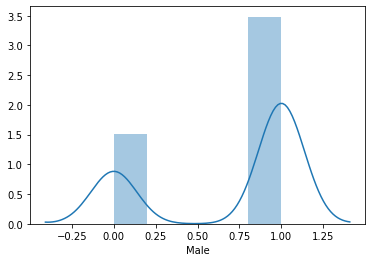

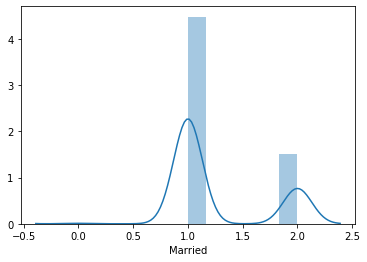

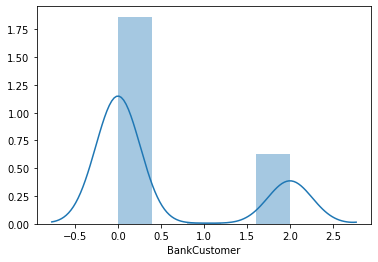

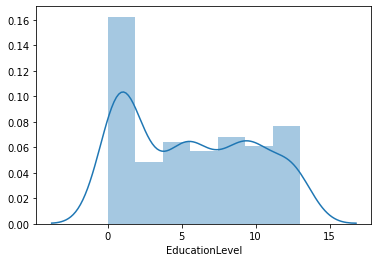

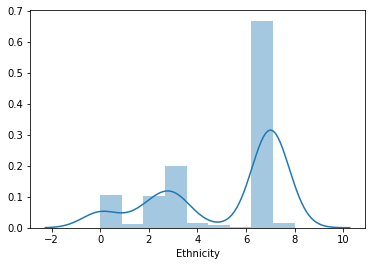

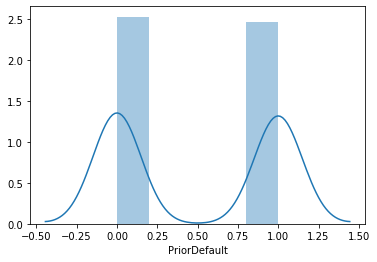

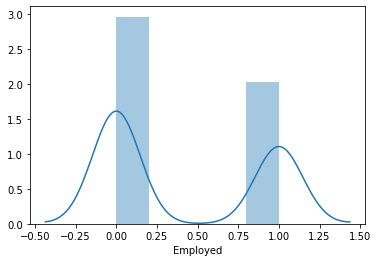

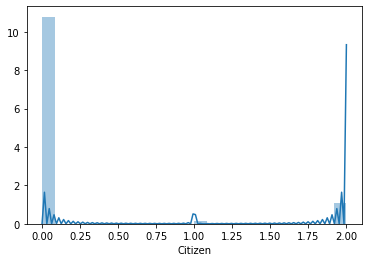

In [11]:
for i in ["Male", "Married", "BankCustomer", "EducationLevel", "Ethnicity", "PriorDefault", "Employed", "Citizen"]:
    sns.distplot(data[i])
    plt.show()

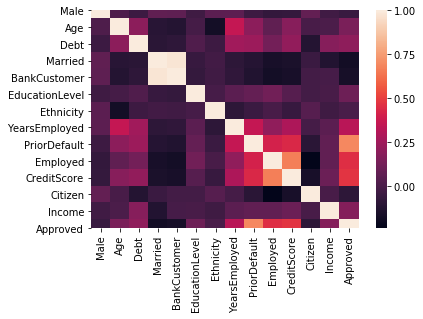

In [12]:
sns.heatmap(data.corr())

/home/research/anaconda3/lib/python3.6/site-packages/seaborn/axisgrid.py:2065: UserWarning: The `size` parameter has been renamed to `height`; pleaes update your code.
  warnings.warn(msg, UserWarning)


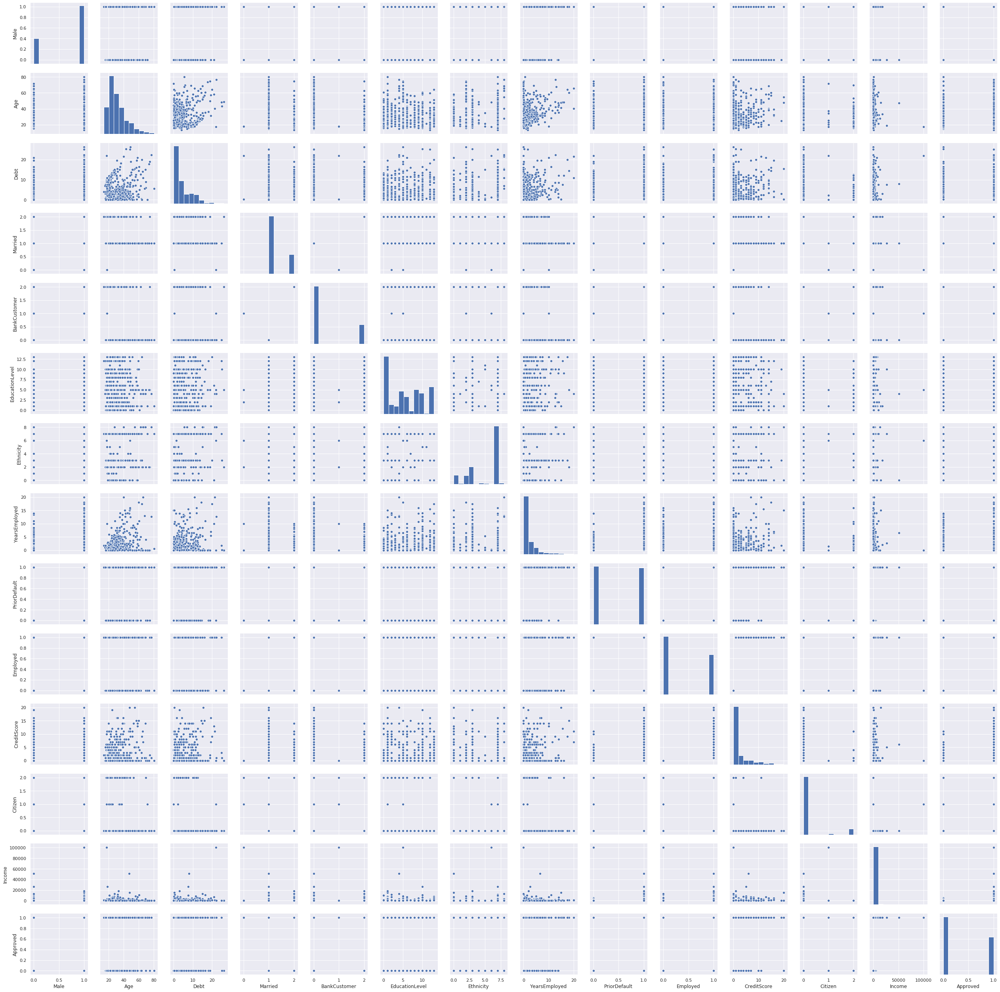

In [13]:
sns.set()
sns.pairplot(data, size = 2.5)
plt.show()

In [14]:
# One hot encoding of the dataset(Categorical)
data_processed = pd.get_dummies(data, columns = ["Male", "Married", "BankCustomer", "EducationLevel", "Ethnicity", "PriorDefault", "Employed", "Citizen"])
data_processed.head()

,Age,Debt,YearsEmployed,CreditScore,Income,Approved,Male_0,Male_1,Married_0,Married_1,...,Ethnicity_6,Ethnicity_7,Ethnicity_8,PriorDefault_0,PriorDefault_1,Employed_0,Employed_1,Citizen_0,Citizen_1,Citizen_2
0,40.83,3.500,0.500,0,0,0,0,1,0,1,...,0,0,0,1,0,1,0,0,0,1
1,32.25,1.500,0.250,0,122,0,0,1,0,1,...,0,1,0,1,0,1,0,1,0,0
2,28.17,0.585,0.040,0,1004,0,0,1,0,1,...,0,1,0,1,0,1,0,1,0,0
3,29.75,0.665,0.250,0,0,0,0,1,0,1,...,0,1,0,1,0,1,0,1,0,0
4,26.50,2.710,0.085,0,0,0,0,1,0,0,...,0,1,0,1,0,1,0,0,0,1


In [15]:
# Normalising the continuous variables
col_names = ['Age', 'Debt', 'YearsEmployed', 'CreditScore', 'Income']

features = StandardScaler().fit_transform(data[col_names])
data[col_names] = features
data.head()

/home/research/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/data.py:645: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/home/research/anaconda3/lib/python3.6/site-packages/sklearn/base.py:464: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


,Male,Age,Debt,Married,BankCustomer,EducationLevel,Ethnicity,YearsEmployed,PriorDefault,Employed,CreditScore,Citizen,Income,Approved
0,1,0.805623,-0.228955,1,0,6,0,-0.497043,0,0,-0.553023,2,-0.182967,0
1,1,0.083471,-0.641712,1,0,1,7,-0.575266,0,0,-0.553023,0,-0.158670,0
2,1,-0.259930,-0.830549,1,0,0,7,-0.640974,0,0,-0.553023,0,0.016987,0
3,1,-0.126946,-0.814039,1,0,12,7,-0.575266,0,0,-0.553023,0,-0.182967,0
4,1,-0.400489,-0.391994,2,2,1,7,-0.626894,0,0,-0.553023,2,-0.182967,0


In [16]:
x = data.iloc[:,:-1 ] 
y = data["Approved"]
print(x.shape)

(590, 13)


In [17]:
'''# Selecting K Best features
x = SelectKBest(f_classif, k = 5).fit_transform(x,y)
print(x)'''


'# Selecting K Best features\nx = SelectKBest(f_classif, k = 5).fit_transform(x,y)\nprint(x)'

In [18]:
# Train-test split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2 )
x_train.head()

,Male,Age,Debt,Married,BankCustomer,EducationLevel,Ethnicity,YearsEmployed,PriorDefault,Employed,CreditScore,Citizen,Income
551,0,-0.877716,-0.332144,1,0,0,7,-0.640974,1,0,-0.553023,0,-0.182967
579,1,0.245071,0.132208,1,0,12,7,-0.626894,0,0,-0.553023,0,-0.181772
393,0,3.148831,2.144403,1,0,4,8,-0.653490,1,1,3.231542,0,0.489388
398,1,-0.520006,-0.598373,1,0,13,7,-0.132521,1,1,-0.282697,0,-0.178984
193,1,0.967224,-0.108223,1,0,0,7,-0.640974,0,0,-0.553023,0,-0.163051


## Revision: Do train and test spliting as per the 'Approved' column proportion 

# #######    Modeling        #################


# Model 1: Decision Tree


In [19]:
# Grid search for parameter value 

param_grid = {'max_depth': [1,2,3,4,5,6,7,8,9,10,11], 'subsample': np.linspace(0.25, 0.75), 'colsample_bytree': np.linspace(0.25, 0.75)} 
grid = GridSearchCV(XGBClassifier(), param_grid, scoring = 'f1', refit = True, verbose = 3)
grid.fit(x_train,y_train)

grid_pred = grid.predict(x_test)
print(confusion_matrix(y_test,grid_pred))
print(classification_report(y_test,grid_pred))



/home/research/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:2053: FutureWarning: You should specify a value for 'cv' instead of relying on the default value. The default value will change from 3 to 5 in version 0.22.
  warnings.warn(CV_WARNING, FutureWarning)
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s


Fitting 3 folds for each of 27500 candidates, totalling 82500 fits
[CV] colsample_bytree=0.25, max_depth=1, subsample=0.25 ..............
[CV]  colsample_bytree=0.25, max_depth=1, subsample=0.25, score=0.7894736842105263, total=   0.1s
[CV] colsample_bytree=0.25, max_depth=1, subsample=0.25 ..............
[CV]  colsample_bytree=0.25, max_depth=1, subsample=0.25, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=1, subsample=0.25 ..............
[CV]  colsample_bytree=0.25, max_depth=1, subsample=0.25, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=1, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.25, max_depth=1, subsample=0.2602040816326531, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=1, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.25, max_depth=1, subsample=0.2602040816326531, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=1, subsample=0.2602040

[CV]  colsample_bytree=0.25, max_depth=1, subsample=0.423469387755102, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=1, subsample=0.423469387755102 .
[CV]  colsample_bytree=0.25, max_depth=1, subsample=0.423469387755102, score=0.8319999999999999, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=1, subsample=0.423469387755102 .
[CV]  colsample_bytree=0.25, max_depth=1, subsample=0.423469387755102, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=1, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.25, max_depth=1, subsample=0.4336734693877551, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=1, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.25, max_depth=1, subsample=0.4336734693877551, score=0.8412698412698412, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=1, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.25, max_depth=1, subsample=0.4336734693877551, score=0.823529411

[CV]  colsample_bytree=0.25, max_depth=1, subsample=0.5867346938775511, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=1, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.25, max_depth=1, subsample=0.5867346938775511, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=1, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.25, max_depth=1, subsample=0.5867346938775511, score=0.8, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=1, subsample=0.596938775510204 .
[CV]  colsample_bytree=0.25, max_depth=1, subsample=0.596938775510204, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=1, subsample=0.596938775510204 .
[CV]  colsample_bytree=0.25, max_depth=1, subsample=0.596938775510204, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=1, subsample=0.596938775510204 .
[CV]  colsample_bytree=0.25, max_depth=1, subsample=0.596938775510204, score=0.8130081300813008, total= 

[CV]  colsample_bytree=0.25, max_depth=1, subsample=0.75, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=1, subsample=0.75 ..............
[CV]  colsample_bytree=0.25, max_depth=1, subsample=0.75, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=1, subsample=0.75 ..............
[CV]  colsample_bytree=0.25, max_depth=1, subsample=0.75, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=2, subsample=0.25 ..............
[CV]  colsample_bytree=0.25, max_depth=2, subsample=0.25, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=2, subsample=0.25 ..............
[CV]  colsample_bytree=0.25, max_depth=2, subsample=0.25, score=0.85, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=2, subsample=0.25 ..............
[CV]  colsample_bytree=0.25, max_depth=2, subsample=0.25, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=2, subsample=0.2602040816326531 
[

[CV]  colsample_bytree=0.25, max_depth=2, subsample=0.41326530612244894, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=2, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.25, max_depth=2, subsample=0.41326530612244894, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=2, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.25, max_depth=2, subsample=0.41326530612244894, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=2, subsample=0.423469387755102 .
[CV]  colsample_bytree=0.25, max_depth=2, subsample=0.423469387755102, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=2, subsample=0.423469387755102 .
[CV]  colsample_bytree=0.25, max_depth=2, subsample=0.423469387755102, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=2, subsample=0.423469387755102 .
[CV]  colsample_bytree=0.25, max_depth=2, subsample=0.423469387755102, score=0.813

[CV]  colsample_bytree=0.25, max_depth=2, subsample=0.5765306122448979, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=2, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.25, max_depth=2, subsample=0.5765306122448979, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=2, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.25, max_depth=2, subsample=0.5867346938775511, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=2, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.25, max_depth=2, subsample=0.5867346938775511, score=0.85, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=2, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.25, max_depth=2, subsample=0.5867346938775511, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=2, subsample=0.596938775510204 .
[CV]  colsample_bytree=0.25, max_depth=2, subsample=0.596938775510204, score=0.8108108108108109, to

[CV]  colsample_bytree=0.25, max_depth=2, subsample=0.7295918367346939, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=2, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.25, max_depth=2, subsample=0.7397959183673469, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=2, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.25, max_depth=2, subsample=0.7397959183673469, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=2, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.25, max_depth=2, subsample=0.7397959183673469, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=2, subsample=0.75 ..............
[CV]  colsample_bytree=0.25, max_depth=2, subsample=0.75, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=2, subsample=0.75 ..............
[CV]  colsample_bytree=0.25, max_depth=2, subsample=0.75, score=0.8524590163934426, total=   0.0s
[C

[CV]  colsample_bytree=0.25, max_depth=3, subsample=0.39285714285714285, score=0.8288288288288288, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=3, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.25, max_depth=3, subsample=0.39285714285714285, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=3, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.25, max_depth=3, subsample=0.39285714285714285, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=3, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.25, max_depth=3, subsample=0.40306122448979587, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=3, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.25, max_depth=3, subsample=0.40306122448979587, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=3, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.25, max_depth=3, subsample=0.40306122448979587, scor

[CV] colsample_bytree=0.25, max_depth=3, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.25, max_depth=3, subsample=0.5561224489795917, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=3, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.25, max_depth=3, subsample=0.5561224489795917, score=0.8347826086956521, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=3, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.25, max_depth=3, subsample=0.5663265306122449, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=3, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.25, max_depth=3, subsample=0.5663265306122449, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=3, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.25, max_depth=3, subsample=0.5663265306122449, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=3, subsample=0.5765306122448979 
[CV]  colsampl

[CV]  colsample_bytree=0.25, max_depth=3, subsample=0.7193877551020408, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=3, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.25, max_depth=3, subsample=0.7193877551020408, score=0.8688524590163934, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=3, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.25, max_depth=3, subsample=0.7193877551020408, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=3, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.25, max_depth=3, subsample=0.7295918367346939, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=3, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.25, max_depth=3, subsample=0.7295918367346939, score=0.8688524590163934, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=3, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.25, max_depth=3, subsample=0.7295918367346939, score=0.84745

[CV]  colsample_bytree=0.25, max_depth=4, subsample=0.3826530612244898, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=4, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.25, max_depth=4, subsample=0.3826530612244898, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=4, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.25, max_depth=4, subsample=0.3826530612244898, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=4, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.25, max_depth=4, subsample=0.39285714285714285, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=4, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.25, max_depth=4, subsample=0.39285714285714285, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=4, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.25, max_depth=4, subsample=0.39285714285714285, score=0.

[CV]  colsample_bytree=0.25, max_depth=4, subsample=0.5459183673469388, score=0.8, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=4, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.25, max_depth=4, subsample=0.5459183673469388, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=4, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.25, max_depth=4, subsample=0.5459183673469388, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=4, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.25, max_depth=4, subsample=0.5561224489795917, score=0.8, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=4, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.25, max_depth=4, subsample=0.5561224489795917, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=4, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.25, max_depth=4, subsample=0.5561224489795917, score=0.8, total=   0.0s
[CV] colsample_byt

[CV]  colsample_bytree=0.25, max_depth=4, subsample=0.7091836734693877, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=4, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.25, max_depth=4, subsample=0.7091836734693877, score=0.8688524590163934, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=4, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.25, max_depth=4, subsample=0.7091836734693877, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=4, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.25, max_depth=4, subsample=0.7193877551020408, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=4, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.25, max_depth=4, subsample=0.7193877551020408, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=4, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.25, max_depth=4, subsample=0.7193877551020408, score=0.81355

[CV]  colsample_bytree=0.25, max_depth=5, subsample=0.37244897959183676, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=5, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.25, max_depth=5, subsample=0.37244897959183676, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=5, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.25, max_depth=5, subsample=0.37244897959183676, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=5, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.25, max_depth=5, subsample=0.3826530612244898, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=5, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.25, max_depth=5, subsample=0.3826530612244898, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=5, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.25, max_depth=5, subsample=0.3826530612244898, score=0.

[CV]  colsample_bytree=0.25, max_depth=5, subsample=0.5357142857142857, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=5, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.25, max_depth=5, subsample=0.5357142857142857, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=5, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.25, max_depth=5, subsample=0.5357142857142857, score=0.8, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=5, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.25, max_depth=5, subsample=0.5459183673469388, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=5, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.25, max_depth=5, subsample=0.5459183673469388, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=5, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.25, max_depth=5, subsample=0.5459183673469388, score=0.8318584070796461, to

[CV]  colsample_bytree=0.25, max_depth=5, subsample=0.6989795918367346, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=5, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.25, max_depth=5, subsample=0.6989795918367346, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=5, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.25, max_depth=5, subsample=0.6989795918367346, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=5, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.25, max_depth=5, subsample=0.7091836734693877, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=5, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.25, max_depth=5, subsample=0.7091836734693877, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=5, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.25, max_depth=5, subsample=0.7091836734693877, score=0.82352

[CV]  colsample_bytree=0.25, max_depth=6, subsample=0.3520408163265306, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=6, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.25, max_depth=6, subsample=0.3520408163265306, score=0.8, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=6, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.25, max_depth=6, subsample=0.3622448979591837, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=6, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.25, max_depth=6, subsample=0.3622448979591837, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=6, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.25, max_depth=6, subsample=0.3622448979591837, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=6, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.25, max_depth=6, subsample=0.37244897959183676, score=0.8181818181818182, 

[CV]  colsample_bytree=0.25, max_depth=6, subsample=0.5153061224489796, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=6, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.25, max_depth=6, subsample=0.5153061224489796, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=6, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.25, max_depth=6, subsample=0.5255102040816326, score=0.8, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=6, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.25, max_depth=6, subsample=0.5255102040816326, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=6, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.25, max_depth=6, subsample=0.5255102040816326, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=6, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.25, max_depth=6, subsample=0.5357142857142857, score=0.8073394495412843, tot

[CV]  colsample_bytree=0.25, max_depth=6, subsample=0.6785714285714286, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=6, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.25, max_depth=6, subsample=0.6785714285714286, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=6, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.25, max_depth=6, subsample=0.6785714285714286, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=6, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.25, max_depth=6, subsample=0.6887755102040816, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=6, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.25, max_depth=6, subsample=0.6887755102040816, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=6, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.25, max_depth=6, subsample=0.6887755102040816, score=0.81666

[CV]  colsample_bytree=0.25, max_depth=7, subsample=0.33163265306122447, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=7, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.25, max_depth=7, subsample=0.33163265306122447, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=7, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.25, max_depth=7, subsample=0.33163265306122447, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=7, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.25, max_depth=7, subsample=0.34183673469387754, score=0.7962962962962963, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=7, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.25, max_depth=7, subsample=0.34183673469387754, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=7, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.25, max_depth=7, subsample=0.34183673469387754, sco

[CV]  colsample_bytree=0.25, max_depth=7, subsample=0.49489795918367346, score=0.8256880733944955, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=7, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.25, max_depth=7, subsample=0.49489795918367346, score=0.8360655737704918, total=   0.1s
[CV] colsample_bytree=0.25, max_depth=7, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.25, max_depth=7, subsample=0.49489795918367346, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=7, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.25, max_depth=7, subsample=0.5051020408163265, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=7, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.25, max_depth=7, subsample=0.5051020408163265, score=0.85, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=7, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.25, max_depth=7, subsample=0.5051020408163265, score=0.82758620689655

[CV]  colsample_bytree=0.25, max_depth=7, subsample=0.6581632653061225, score=0.8205128205128205, total=   0.1s
[CV] colsample_bytree=0.25, max_depth=7, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.25, max_depth=7, subsample=0.6683673469387754, score=0.8073394495412843, total=   0.1s
[CV] colsample_bytree=0.25, max_depth=7, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.25, max_depth=7, subsample=0.6683673469387754, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=7, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.25, max_depth=7, subsample=0.6683673469387754, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=7, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.25, max_depth=7, subsample=0.6785714285714286, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=7, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.25, max_depth=7, subsample=0.6785714285714286, score=0.83606

[CV]  colsample_bytree=0.25, max_depth=8, subsample=0.3112244897959184, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=8, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.25, max_depth=8, subsample=0.3112244897959184, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=8, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.25, max_depth=8, subsample=0.3214285714285714, score=0.8037383177570093, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=8, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.25, max_depth=8, subsample=0.3214285714285714, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=8, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.25, max_depth=8, subsample=0.3214285714285714, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=8, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.25, max_depth=8, subsample=0.33163265306122447, score=0.807

[CV]  colsample_bytree=0.25, max_depth=8, subsample=0.4642857142857143, score=0.8, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=8, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.25, max_depth=8, subsample=0.4744897959183673, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=8, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.25, max_depth=8, subsample=0.4744897959183673, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=8, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.25, max_depth=8, subsample=0.4744897959183673, score=0.8347826086956521, total=   0.1s
[CV] colsample_bytree=0.25, max_depth=8, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.25, max_depth=8, subsample=0.4846938775510204, score=0.8256880733944955, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=8, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.25, max_depth=8, subsample=0.4846938775510204, score=0.8333333333333333, to

[CV] colsample_bytree=0.25, max_depth=8, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.25, max_depth=8, subsample=0.6377551020408163, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=8, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.25, max_depth=8, subsample=0.6377551020408163, score=0.85, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=8, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.25, max_depth=8, subsample=0.6377551020408163, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=8, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.25, max_depth=8, subsample=0.6479591836734693, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=8, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.25, max_depth=8, subsample=0.6479591836734693, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=8, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.25,

[CV]  colsample_bytree=0.25, max_depth=9, subsample=0.28061224489795916, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=9, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.25, max_depth=9, subsample=0.28061224489795916, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=9, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.25, max_depth=9, subsample=0.29081632653061223, score=0.8, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=9, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.25, max_depth=9, subsample=0.29081632653061223, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=9, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.25, max_depth=9, subsample=0.29081632653061223, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=9, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.25, max_depth=9, subsample=0.3010204081632653, score=0.8, total=  

[CV]  colsample_bytree=0.25, max_depth=9, subsample=0.44387755102040816, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=9, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.25, max_depth=9, subsample=0.44387755102040816, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=9, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.25, max_depth=9, subsample=0.45408163265306123, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=9, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.25, max_depth=9, subsample=0.45408163265306123, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=9, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.25, max_depth=9, subsample=0.45408163265306123, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=9, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.25, max_depth=9, subsample=0.4642857142857143, score

[CV]  colsample_bytree=0.25, max_depth=9, subsample=0.596938775510204, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=9, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.25, max_depth=9, subsample=0.6071428571428571, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=9, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.25, max_depth=9, subsample=0.6071428571428571, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=9, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.25, max_depth=9, subsample=0.6071428571428571, score=0.8, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=9, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.25, max_depth=9, subsample=0.6173469387755102, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=9, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.25, max_depth=9, subsample=0.6173469387755102, score=0.8360655737704918, tota

[CV]  colsample_bytree=0.25, max_depth=10, subsample=0.27040816326530615, score=0.8363636363636363, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=10, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.25, max_depth=10, subsample=0.27040816326530615, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=10, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.25, max_depth=10, subsample=0.27040816326530615, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=10, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.25, max_depth=10, subsample=0.28061224489795916, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=10, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.25, max_depth=10, subsample=0.28061224489795916, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=10, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.25, max_depth=10, subsample=0.2806122448

[CV]  colsample_bytree=0.25, max_depth=10, subsample=0.4336734693877551, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=10, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.25, max_depth=10, subsample=0.4336734693877551, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=10, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.25, max_depth=10, subsample=0.44387755102040816, score=0.8, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=10, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.25, max_depth=10, subsample=0.44387755102040816, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=10, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.25, max_depth=10, subsample=0.44387755102040816, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=10, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.25, max_depth=10, subsample=0.45408163265306123, score=0.8

[CV] colsample_bytree=0.25, max_depth=10, subsample=0.596938775510204 
[CV]  colsample_bytree=0.25, max_depth=10, subsample=0.596938775510204, score=0.8, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=10, subsample=0.596938775510204 
[CV]  colsample_bytree=0.25, max_depth=10, subsample=0.596938775510204, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=10, subsample=0.596938775510204 
[CV]  colsample_bytree=0.25, max_depth=10, subsample=0.596938775510204, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=10, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.25, max_depth=10, subsample=0.6071428571428571, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=10, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.25, max_depth=10, subsample=0.6071428571428571, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=10, subsample=0.6071428571428571 
[CV]  colsample_bytree=0

[CV]  colsample_bytree=0.25, max_depth=11, subsample=0.25, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=11, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.25, max_depth=11, subsample=0.2602040816326531, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=11, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.25, max_depth=11, subsample=0.2602040816326531, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=11, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.25, max_depth=11, subsample=0.2602040816326531, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=11, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.25, max_depth=11, subsample=0.27040816326530615, score=0.8363636363636363, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=11, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.25, max_depth=11, subsample=0.27040816326530615, score=0.8595

[CV]  colsample_bytree=0.25, max_depth=11, subsample=0.41326530612244894, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=11, subsample=0.423469387755102 
[CV]  colsample_bytree=0.25, max_depth=11, subsample=0.423469387755102, score=0.8288288288288288, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=11, subsample=0.423469387755102 
[CV]  colsample_bytree=0.25, max_depth=11, subsample=0.423469387755102, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=11, subsample=0.423469387755102 
[CV]  colsample_bytree=0.25, max_depth=11, subsample=0.423469387755102, score=0.8, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=11, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.25, max_depth=11, subsample=0.4336734693877551, score=0.8288288288288288, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=11, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.25, max_depth=11, subsample=0.4336734693877551, score=0.826446280991735

[CV] colsample_bytree=0.25, max_depth=11, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.25, max_depth=11, subsample=0.5765306122448979, score=0.8421052631578948, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=11, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.25, max_depth=11, subsample=0.5867346938775511, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=11, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.25, max_depth=11, subsample=0.5867346938775511, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=11, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.25, max_depth=11, subsample=0.5867346938775511, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=11, subsample=0.596938775510204 
[CV]  colsample_bytree=0.25, max_depth=11, subsample=0.596938775510204, score=0.8, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=11, subsample=0.596938775510204 
[CV]  colsample_bytree

[CV]  colsample_bytree=0.25, max_depth=11, subsample=0.7295918367346939, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=11, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.25, max_depth=11, subsample=0.7397959183673469, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=11, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.25, max_depth=11, subsample=0.7397959183673469, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=11, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.25, max_depth=11, subsample=0.7397959183673469, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=11, subsample=0.75 .............
[CV]  colsample_bytree=0.25, max_depth=11, subsample=0.75, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.25, max_depth=11, subsample=0.75 .............
[CV]  colsample_bytree=0.25, max_depth=11, subsample=0.75, score=0.85, total=   0.0s
[CV] c

[CV]  colsample_bytree=0.2602040816326531, max_depth=1, subsample=0.3826530612244898, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=1, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.2602040816326531, max_depth=1, subsample=0.3826530612244898, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=1, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.2602040816326531, max_depth=1, subsample=0.39285714285714285, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=1, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.2602040816326531, max_depth=1, subsample=0.39285714285714285, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=1, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.2602040816326531, max_depth=1, subsample=0.39285714285714285, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.2

[CV]  colsample_bytree=0.2602040816326531, max_depth=1, subsample=0.5255102040816326, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=1, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.2602040816326531, max_depth=1, subsample=0.5255102040816326, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=1, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.2602040816326531, max_depth=1, subsample=0.5255102040816326, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=1, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.2602040816326531, max_depth=1, subsample=0.5357142857142857, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=1, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.2602040816326531, max_depth=1, subsample=0.5357142857142857, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.260204081

[CV]  colsample_bytree=0.2602040816326531, max_depth=1, subsample=0.6683673469387754, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=1, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.2602040816326531, max_depth=1, subsample=0.6785714285714286, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=1, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.2602040816326531, max_depth=1, subsample=0.6785714285714286, score=0.8225806451612904, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=1, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.2602040816326531, max_depth=1, subsample=0.6785714285714286, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=1, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.2602040816326531, max_depth=1, subsample=0.6887755102040816, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.260204

[CV]  colsample_bytree=0.2602040816326531, max_depth=2, subsample=0.3010204081632653, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=2, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.2602040816326531, max_depth=2, subsample=0.3010204081632653, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=2, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.2602040816326531, max_depth=2, subsample=0.3112244897959184, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=2, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.2602040816326531, max_depth=2, subsample=0.3112244897959184, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=2, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.2602040816326531, max_depth=2, subsample=0.3112244897959184, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.2602040

[CV]  colsample_bytree=0.2602040816326531, max_depth=2, subsample=0.45408163265306123, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=2, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.2602040816326531, max_depth=2, subsample=0.45408163265306123, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=2, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.2602040816326531, max_depth=2, subsample=0.4642857142857143, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=2, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.2602040816326531, max_depth=2, subsample=0.4642857142857143, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=2, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.2602040816326531, max_depth=2, subsample=0.4642857142857143, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.260

[CV]  colsample_bytree=0.2602040816326531, max_depth=2, subsample=0.596938775510204, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=2, subsample=0.596938775510204 
[CV]  colsample_bytree=0.2602040816326531, max_depth=2, subsample=0.596938775510204, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=2, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.2602040816326531, max_depth=2, subsample=0.6071428571428571, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=2, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.2602040816326531, max_depth=2, subsample=0.6071428571428571, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=2, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.2602040816326531, max_depth=2, subsample=0.6071428571428571, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.260204081

[CV]  colsample_bytree=0.2602040816326531, max_depth=2, subsample=0.7397959183673469, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=2, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.2602040816326531, max_depth=2, subsample=0.7397959183673469, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=2, subsample=0.75 
[CV]  colsample_bytree=0.2602040816326531, max_depth=2, subsample=0.75, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=2, subsample=0.75 
[CV]  colsample_bytree=0.2602040816326531, max_depth=2, subsample=0.75, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=2, subsample=0.75 
[CV]  colsample_bytree=0.2602040816326531, max_depth=2, subsample=0.75, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=3, subsample=0.25 
[CV]  colsample_bytree=0.2602040816326531, 

[CV]  colsample_bytree=0.2602040816326531, max_depth=3, subsample=0.37244897959183676, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=3, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.2602040816326531, max_depth=3, subsample=0.37244897959183676, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=3, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.2602040816326531, max_depth=3, subsample=0.3826530612244898, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=3, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.2602040816326531, max_depth=3, subsample=0.3826530612244898, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=3, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.2602040816326531, max_depth=3, subsample=0.3826530612244898, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.260

[CV]  colsample_bytree=0.2602040816326531, max_depth=3, subsample=0.5153061224489796, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=3, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.2602040816326531, max_depth=3, subsample=0.5153061224489796, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=3, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.2602040816326531, max_depth=3, subsample=0.5255102040816326, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=3, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.2602040816326531, max_depth=3, subsample=0.5255102040816326, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=3, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.2602040816326531, max_depth=3, subsample=0.5255102040816326, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.260204

[CV]  colsample_bytree=0.2602040816326531, max_depth=3, subsample=0.6581632653061225, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=3, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.2602040816326531, max_depth=3, subsample=0.6581632653061225, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=3, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.2602040816326531, max_depth=3, subsample=0.6683673469387754, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=3, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.2602040816326531, max_depth=3, subsample=0.6683673469387754, score=0.8688524590163934, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=3, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.2602040816326531, max_depth=3, subsample=0.6683673469387754, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.260204

[CV]  colsample_bytree=0.2602040816326531, max_depth=4, subsample=0.29081632653061223, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=4, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.2602040816326531, max_depth=4, subsample=0.29081632653061223, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=4, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.2602040816326531, max_depth=4, subsample=0.3010204081632653, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=4, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.2602040816326531, max_depth=4, subsample=0.3010204081632653, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=4, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.2602040816326531, max_depth=4, subsample=0.3010204081632653, score=0.8, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, m

[CV]  colsample_bytree=0.2602040816326531, max_depth=4, subsample=0.44387755102040816, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=4, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.2602040816326531, max_depth=4, subsample=0.44387755102040816, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=4, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.2602040816326531, max_depth=4, subsample=0.44387755102040816, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=4, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.2602040816326531, max_depth=4, subsample=0.45408163265306123, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=4, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.2602040816326531, max_depth=4, subsample=0.45408163265306123, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.2602040816326531, max_depth=4, subsample=0.5867346938775511, score=0.8, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=4, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.2602040816326531, max_depth=4, subsample=0.5867346938775511, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=4, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.2602040816326531, max_depth=4, subsample=0.5867346938775511, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=4, subsample=0.596938775510204 
[CV]  colsample_bytree=0.2602040816326531, max_depth=4, subsample=0.596938775510204, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=4, subsample=0.596938775510204 
[CV]  colsample_bytree=0.2602040816326531, max_depth=4, subsample=0.596938775510204, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_dept

[CV]  colsample_bytree=0.2602040816326531, max_depth=4, subsample=0.7295918367346939, score=0.8, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=4, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.2602040816326531, max_depth=4, subsample=0.7295918367346939, score=0.85, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=4, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.2602040816326531, max_depth=4, subsample=0.7295918367346939, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=4, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.2602040816326531, max_depth=4, subsample=0.7397959183673469, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=4, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.2602040816326531, max_depth=4, subsample=0.7397959183673469, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=4, subs

[CV]  colsample_bytree=0.2602040816326531, max_depth=5, subsample=0.3622448979591837, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=5, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.2602040816326531, max_depth=5, subsample=0.37244897959183676, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=5, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.2602040816326531, max_depth=5, subsample=0.37244897959183676, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=5, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.2602040816326531, max_depth=5, subsample=0.37244897959183676, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=5, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.2602040816326531, max_depth=5, subsample=0.3826530612244898, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.2602040816326531, max_depth=5, subsample=0.5051020408163265, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=5, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.2602040816326531, max_depth=5, subsample=0.5153061224489796, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=5, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.2602040816326531, max_depth=5, subsample=0.5153061224489796, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=5, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.2602040816326531, max_depth=5, subsample=0.5153061224489796, score=0.8347826086956521, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=5, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.2602040816326531, max_depth=5, subsample=0.5255102040816326, score=0.8, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max

[CV]  colsample_bytree=0.2602040816326531, max_depth=5, subsample=0.6479591836734693, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=5, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.2602040816326531, max_depth=5, subsample=0.6581632653061225, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=5, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.2602040816326531, max_depth=5, subsample=0.6581632653061225, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=5, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.2602040816326531, max_depth=5, subsample=0.6581632653061225, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=5, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.2602040816326531, max_depth=5, subsample=0.6683673469387754, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.2602040

[CV]  colsample_bytree=0.2602040816326531, max_depth=6, subsample=0.29081632653061223, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=6, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.2602040816326531, max_depth=6, subsample=0.29081632653061223, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=6, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.2602040816326531, max_depth=6, subsample=0.3010204081632653, score=0.8, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=6, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.2602040816326531, max_depth=6, subsample=0.3010204081632653, score=0.85, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=6, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.2602040816326531, max_depth=6, subsample=0.3010204081632653, score=0.8, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=6, subsample=0.3112

[CV]  colsample_bytree=0.2602040816326531, max_depth=6, subsample=0.4336734693877551, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=6, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.2602040816326531, max_depth=6, subsample=0.4336734693877551, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=6, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.2602040816326531, max_depth=6, subsample=0.44387755102040816, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=6, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.2602040816326531, max_depth=6, subsample=0.44387755102040816, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=6, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.2602040816326531, max_depth=6, subsample=0.44387755102040816, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.2

[CV]  colsample_bytree=0.2602040816326531, max_depth=6, subsample=0.5765306122448979, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=6, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.2602040816326531, max_depth=6, subsample=0.5765306122448979, score=0.8392857142857143, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=6, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.2602040816326531, max_depth=6, subsample=0.5867346938775511, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=6, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.2602040816326531, max_depth=6, subsample=0.5867346938775511, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=6, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.2602040816326531, max_depth=6, subsample=0.5867346938775511, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.2602040

[CV]  colsample_bytree=0.2602040816326531, max_depth=6, subsample=0.7193877551020408, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=6, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.2602040816326531, max_depth=6, subsample=0.7193877551020408, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=6, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.2602040816326531, max_depth=6, subsample=0.7193877551020408, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=6, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.2602040816326531, max_depth=6, subsample=0.7295918367346939, score=0.8, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=6, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.2602040816326531, max_depth=6, subsample=0.7295918367346939, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max

[CV]  colsample_bytree=0.2602040816326531, max_depth=7, subsample=0.34183673469387754, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=7, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.2602040816326531, max_depth=7, subsample=0.34183673469387754, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=7, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.2602040816326531, max_depth=7, subsample=0.3520408163265306, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=7, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.2602040816326531, max_depth=7, subsample=0.3520408163265306, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=7, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.2602040816326531, max_depth=7, subsample=0.3520408163265306, score=0.8, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, m

[CV]  colsample_bytree=0.2602040816326531, max_depth=7, subsample=0.4846938775510204, score=0.8780487804878049, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=7, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.2602040816326531, max_depth=7, subsample=0.4846938775510204, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=7, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.2602040816326531, max_depth=7, subsample=0.49489795918367346, score=0.8256880733944955, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=7, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.2602040816326531, max_depth=7, subsample=0.49489795918367346, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=7, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.2602040816326531, max_depth=7, subsample=0.49489795918367346, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.2602040816326531, max_depth=7, subsample=0.6275510204081632, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=7, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.2602040816326531, max_depth=7, subsample=0.6275510204081632, score=0.85, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=7, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.2602040816326531, max_depth=7, subsample=0.6275510204081632, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=7, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.2602040816326531, max_depth=7, subsample=0.6377551020408163, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=7, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.2602040816326531, max_depth=7, subsample=0.6377551020408163, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, ma

[CV]  colsample_bytree=0.2602040816326531, max_depth=8, subsample=0.2602040816326531, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=8, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.2602040816326531, max_depth=8, subsample=0.2602040816326531, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=8, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.2602040816326531, max_depth=8, subsample=0.2602040816326531, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=8, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.2602040816326531, max_depth=8, subsample=0.27040816326530615, score=0.8363636363636363, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=8, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.2602040816326531, max_depth=8, subsample=0.27040816326530615, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.26

[CV]  colsample_bytree=0.2602040816326531, max_depth=8, subsample=0.40306122448979587, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=8, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.2602040816326531, max_depth=8, subsample=0.40306122448979587, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=8, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.2602040816326531, max_depth=8, subsample=0.40306122448979587, score=0.8, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=8, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.2602040816326531, max_depth=8, subsample=0.41326530612244894, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=8, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.2602040816326531, max_depth=8, subsample=0.41326530612244894, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.260204081632

[CV]  colsample_bytree=0.2602040816326531, max_depth=8, subsample=0.5459183673469388, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=8, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.2602040816326531, max_depth=8, subsample=0.5459183673469388, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=8, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.2602040816326531, max_depth=8, subsample=0.5459183673469388, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=8, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.2602040816326531, max_depth=8, subsample=0.5561224489795917, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=8, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.2602040816326531, max_depth=8, subsample=0.5561224489795917, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.2602040

[CV]  colsample_bytree=0.2602040816326531, max_depth=8, subsample=0.6785714285714286, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=8, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.2602040816326531, max_depth=8, subsample=0.6887755102040816, score=0.7962962962962963, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=8, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.2602040816326531, max_depth=8, subsample=0.6887755102040816, score=0.85, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=8, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.2602040816326531, max_depth=8, subsample=0.6887755102040816, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=8, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.2602040816326531, max_depth=8, subsample=0.6989795918367346, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, ma

[CV]  colsample_bytree=0.2602040816326531, max_depth=9, subsample=0.3214285714285714, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=9, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.2602040816326531, max_depth=9, subsample=0.33163265306122447, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=9, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.2602040816326531, max_depth=9, subsample=0.33163265306122447, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=9, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.2602040816326531, max_depth=9, subsample=0.33163265306122447, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=9, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.2602040816326531, max_depth=9, subsample=0.34183673469387754, score=0.7962962962962963, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.2602040816326531, max_depth=9, subsample=0.4642857142857143, score=0.8, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=9, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.2602040816326531, max_depth=9, subsample=0.4744897959183673, score=0.8256880733944955, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=9, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.2602040816326531, max_depth=9, subsample=0.4744897959183673, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=9, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.2602040816326531, max_depth=9, subsample=0.4744897959183673, score=0.8347826086956521, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=9, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.2602040816326531, max_depth=9, subsample=0.4846938775510204, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max

[CV]  colsample_bytree=0.2602040816326531, max_depth=9, subsample=0.6071428571428571, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=9, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.2602040816326531, max_depth=9, subsample=0.6071428571428571, score=0.8, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=9, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.2602040816326531, max_depth=9, subsample=0.6173469387755102, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=9, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.2602040816326531, max_depth=9, subsample=0.6173469387755102, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=9, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.2602040816326531, max_depth=9, subsample=0.6173469387755102, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max

[CV]  colsample_bytree=0.2602040816326531, max_depth=9, subsample=0.75, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=9, subsample=0.75 
[CV]  colsample_bytree=0.2602040816326531, max_depth=9, subsample=0.75, score=0.85, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=9, subsample=0.75 
[CV]  colsample_bytree=0.2602040816326531, max_depth=9, subsample=0.75, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=10, subsample=0.25 
[CV]  colsample_bytree=0.2602040816326531, max_depth=10, subsample=0.25, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=10, subsample=0.25 
[CV]  colsample_bytree=0.2602040816326531, max_depth=10, subsample=0.25, score=0.85, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=10, subsample=0.25 
[CV]  colsample_bytree=0.2602040816326531, max_depth=10, subsample=0.25, score=0.8429752066115703, total=   

[CV]  colsample_bytree=0.2602040816326531, max_depth=10, subsample=0.3826530612244898, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=10, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.2602040816326531, max_depth=10, subsample=0.3826530612244898, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=10, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.2602040816326531, max_depth=10, subsample=0.3826530612244898, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=10, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.2602040816326531, max_depth=10, subsample=0.39285714285714285, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=10, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.2602040816326531, max_depth=10, subsample=0.39285714285714285, score=0.819672131147541, total=   0.0s
[CV] colsample_bytr

[CV]  colsample_bytree=0.2602040816326531, max_depth=10, subsample=0.5255102040816326, score=0.8, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=10, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.2602040816326531, max_depth=10, subsample=0.5255102040816326, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=10, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.2602040816326531, max_depth=10, subsample=0.5255102040816326, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=10, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.2602040816326531, max_depth=10, subsample=0.5357142857142857, score=0.8148148148148149, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=10, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.2602040816326531, max_depth=10, subsample=0.5357142857142857, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.260204081632

[CV]  colsample_bytree=0.2602040816326531, max_depth=10, subsample=0.6581632653061225, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=10, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.2602040816326531, max_depth=10, subsample=0.6581632653061225, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=10, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.2602040816326531, max_depth=10, subsample=0.6581632653061225, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=10, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.2602040816326531, max_depth=10, subsample=0.6683673469387754, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=10, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.2602040816326531, max_depth=10, subsample=0.6683673469387754, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.2602040816326531, max_depth=11, subsample=0.29081632653061223, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=11, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.2602040816326531, max_depth=11, subsample=0.29081632653061223, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=11, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.2602040816326531, max_depth=11, subsample=0.29081632653061223, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=11, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.2602040816326531, max_depth=11, subsample=0.3010204081632653, score=0.8, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=11, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.2602040816326531, max_depth=11, subsample=0.3010204081632653, score=0.85, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max

[CV]  colsample_bytree=0.2602040816326531, max_depth=11, subsample=0.4336734693877551, score=0.8288288288288288, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=11, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.2602040816326531, max_depth=11, subsample=0.4336734693877551, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=11, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.2602040816326531, max_depth=11, subsample=0.4336734693877551, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=11, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.2602040816326531, max_depth=11, subsample=0.44387755102040816, score=0.8, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=11, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.2602040816326531, max_depth=11, subsample=0.44387755102040816, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.26020408

[CV]  colsample_bytree=0.2602040816326531, max_depth=11, subsample=0.5663265306122449, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=11, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.2602040816326531, max_depth=11, subsample=0.5765306122448979, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=11, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.2602040816326531, max_depth=11, subsample=0.5765306122448979, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=11, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.2602040816326531, max_depth=11, subsample=0.5765306122448979, score=0.8421052631578948, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=11, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.2602040816326531, max_depth=11, subsample=0.5867346938775511, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.2602040816326531, max_depth=11, subsample=0.7091836734693877, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=11, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.2602040816326531, max_depth=11, subsample=0.7193877551020408, score=0.8, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=11, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.2602040816326531, max_depth=11, subsample=0.7193877551020408, score=0.85, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=11, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.2602040816326531, max_depth=11, subsample=0.7193877551020408, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=11, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.2602040816326531, max_depth=11, subsample=0.7295918367346939, score=0.8, total=   0.0s
[CV] colsample_bytree=0.2602040816326531, max_depth=11, subsample

[CV]  colsample_bytree=0.27040816326530615, max_depth=1, subsample=0.3520408163265306, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=1, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.27040816326530615, max_depth=1, subsample=0.3520408163265306, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=1, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.27040816326530615, max_depth=1, subsample=0.3622448979591837, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=1, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.27040816326530615, max_depth=1, subsample=0.3622448979591837, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=1, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.27040816326530615, max_depth=1, subsample=0.3622448979591837, score=0.8, total=   0.0s
[CV] colsample_bytree=0.2704081632653

[CV]  colsample_bytree=0.27040816326530615, max_depth=1, subsample=0.4846938775510204, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=1, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.27040816326530615, max_depth=1, subsample=0.49489795918367346, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=1, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.27040816326530615, max_depth=1, subsample=0.49489795918367346, score=0.8319999999999999, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=1, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.27040816326530615, max_depth=1, subsample=0.49489795918367346, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=1, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.27040816326530615, max_depth=1, subsample=0.5051020408163265, score=0.8214285714285715, total=   0.0s
[CV] colsample_

[CV]  colsample_bytree=0.27040816326530615, max_depth=1, subsample=0.6275510204081632, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=1, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.27040816326530615, max_depth=1, subsample=0.6275510204081632, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=1, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.27040816326530615, max_depth=1, subsample=0.6377551020408163, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=1, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.27040816326530615, max_depth=1, subsample=0.6377551020408163, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=1, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.27040816326530615, max_depth=1, subsample=0.6377551020408163, score=0.8292682926829269, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.27040816326530615, max_depth=2, subsample=0.25, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=2, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.27040816326530615, max_depth=2, subsample=0.2602040816326531, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=2, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.27040816326530615, max_depth=2, subsample=0.2602040816326531, score=0.85, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=2, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.27040816326530615, max_depth=2, subsample=0.2602040816326531, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=2, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.27040816326530615, max_depth=2, subsample=0.27040816326530615, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_d

[CV]  colsample_bytree=0.27040816326530615, max_depth=2, subsample=0.40306122448979587, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=2, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.27040816326530615, max_depth=2, subsample=0.41326530612244894, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=2, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.27040816326530615, max_depth=2, subsample=0.41326530612244894, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=2, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.27040816326530615, max_depth=2, subsample=0.41326530612244894, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=2, subsample=0.423469387755102 
[CV]  colsample_bytree=0.27040816326530615, max_depth=2, subsample=0.423469387755102, score=0.8108108108108109, total=   0.0s
[CV] colsample_b

[CV]  colsample_bytree=0.27040816326530615, max_depth=2, subsample=0.5459183673469388, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=2, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.27040816326530615, max_depth=2, subsample=0.5561224489795917, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=2, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.27040816326530615, max_depth=2, subsample=0.5561224489795917, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=2, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.27040816326530615, max_depth=2, subsample=0.5561224489795917, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=2, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.27040816326530615, max_depth=2, subsample=0.5663265306122449, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.27040816326530615, max_depth=2, subsample=0.6989795918367346, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=2, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.27040816326530615, max_depth=2, subsample=0.6989795918367346, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=2, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.27040816326530615, max_depth=2, subsample=0.6989795918367346, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=2, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.27040816326530615, max_depth=2, subsample=0.7091836734693877, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=2, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.27040816326530615, max_depth=2, subsample=0.7091836734693877, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.27040816326530615, max_depth=3, subsample=0.33163265306122447, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=3, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.27040816326530615, max_depth=3, subsample=0.33163265306122447, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=3, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.27040816326530615, max_depth=3, subsample=0.33163265306122447, score=0.8, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=3, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.27040816326530615, max_depth=3, subsample=0.34183673469387754, score=0.8288288288288288, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=3, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.27040816326530615, max_depth=3, subsample=0.34183673469387754, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.270

[CV]  colsample_bytree=0.27040816326530615, max_depth=3, subsample=0.4744897959183673, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=3, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.27040816326530615, max_depth=3, subsample=0.4846938775510204, score=0.8288288288288288, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=3, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.27040816326530615, max_depth=3, subsample=0.4846938775510204, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=3, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.27040816326530615, max_depth=3, subsample=0.4846938775510204, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=3, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.27040816326530615, max_depth=3, subsample=0.49489795918367346, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytre

[CV]  colsample_bytree=0.27040816326530615, max_depth=3, subsample=0.6275510204081632, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=3, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.27040816326530615, max_depth=3, subsample=0.6275510204081632, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=3, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.27040816326530615, max_depth=3, subsample=0.6377551020408163, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=3, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.27040816326530615, max_depth=3, subsample=0.6377551020408163, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=3, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.27040816326530615, max_depth=3, subsample=0.6377551020408163, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.27040816326530615, max_depth=4, subsample=0.2602040816326531, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=4, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.27040816326530615, max_depth=4, subsample=0.2602040816326531, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=4, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.27040816326530615, max_depth=4, subsample=0.27040816326530615, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=4, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.27040816326530615, max_depth=4, subsample=0.27040816326530615, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=4, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.27040816326530615, max_depth=4, subsample=0.27040816326530615, score=0.7863247863247863, total=   0.0s
[CV] colsample_

[CV]  colsample_bytree=0.27040816326530615, max_depth=4, subsample=0.40306122448979587, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=4, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.27040816326530615, max_depth=4, subsample=0.40306122448979587, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=4, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.27040816326530615, max_depth=4, subsample=0.41326530612244894, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=4, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.27040816326530615, max_depth=4, subsample=0.41326530612244894, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=4, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.27040816326530615, max_depth=4, subsample=0.41326530612244894, score=0.8070175438596491, total=   0.0s
[CV] colsampl

[CV]  colsample_bytree=0.27040816326530615, max_depth=4, subsample=0.5459183673469388, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=4, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.27040816326530615, max_depth=4, subsample=0.5459183673469388, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=4, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.27040816326530615, max_depth=4, subsample=0.5561224489795917, score=0.8, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=4, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.27040816326530615, max_depth=4, subsample=0.5561224489795917, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=4, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.27040816326530615, max_depth=4, subsample=0.5561224489795917, score=0.8, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_dept

[CV]  colsample_bytree=0.27040816326530615, max_depth=4, subsample=0.6887755102040816, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=4, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.27040816326530615, max_depth=4, subsample=0.6887755102040816, score=0.8780487804878049, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=4, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.27040816326530615, max_depth=4, subsample=0.6887755102040816, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=4, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.27040816326530615, max_depth=4, subsample=0.6989795918367346, score=0.8, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=4, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.27040816326530615, max_depth=4, subsample=0.6989795918367346, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.270408163265

[CV]  colsample_bytree=0.27040816326530615, max_depth=5, subsample=0.3214285714285714, score=0.8037383177570093, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=5, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.27040816326530615, max_depth=5, subsample=0.3214285714285714, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=5, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.27040816326530615, max_depth=5, subsample=0.3214285714285714, score=0.7826086956521738, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=5, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.27040816326530615, max_depth=5, subsample=0.33163265306122447, score=0.8037383177570093, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=5, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.27040816326530615, max_depth=5, subsample=0.33163265306122447, score=0.8264462809917356, total=   0.0s
[CV] colsample_by

[CV]  colsample_bytree=0.27040816326530615, max_depth=5, subsample=0.45408163265306123, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=5, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.27040816326530615, max_depth=5, subsample=0.4642857142857143, score=0.8256880733944955, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=5, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.27040816326530615, max_depth=5, subsample=0.4642857142857143, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=5, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.27040816326530615, max_depth=5, subsample=0.4642857142857143, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=5, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.27040816326530615, max_depth=5, subsample=0.4744897959183673, score=0.8256880733944955, total=   0.0s
[CV] colsample_bytre

[CV]  colsample_bytree=0.27040816326530615, max_depth=5, subsample=0.596938775510204, score=0.8, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=5, subsample=0.596938775510204 
[CV]  colsample_bytree=0.27040816326530615, max_depth=5, subsample=0.596938775510204, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=5, subsample=0.596938775510204 
[CV]  colsample_bytree=0.27040816326530615, max_depth=5, subsample=0.596938775510204, score=0.8141592920353983, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=5, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.27040816326530615, max_depth=5, subsample=0.6071428571428571, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=5, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.27040816326530615, max_depth=5, subsample=0.6071428571428571, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.27040816326530615

[CV]  colsample_bytree=0.27040816326530615, max_depth=5, subsample=0.7397959183673469, score=0.8, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=5, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.27040816326530615, max_depth=5, subsample=0.7397959183673469, score=0.8688524590163934, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=5, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.27040816326530615, max_depth=5, subsample=0.7397959183673469, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=5, subsample=0.75 
[CV]  colsample_bytree=0.27040816326530615, max_depth=5, subsample=0.75, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=5, subsample=0.75 
[CV]  colsample_bytree=0.27040816326530615, max_depth=5, subsample=0.75, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=5, subsample=0.75 
[CV]  colsample_bytr

[CV]  colsample_bytree=0.27040816326530615, max_depth=6, subsample=0.37244897959183676, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=6, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.27040816326530615, max_depth=6, subsample=0.3826530612244898, score=0.8, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=6, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.27040816326530615, max_depth=6, subsample=0.3826530612244898, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=6, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.27040816326530615, max_depth=6, subsample=0.3826530612244898, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=6, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.27040816326530615, max_depth=6, subsample=0.39285714285714285, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.270408163

[CV]  colsample_bytree=0.27040816326530615, max_depth=6, subsample=0.5153061224489796, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=6, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.27040816326530615, max_depth=6, subsample=0.5255102040816326, score=0.8, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=6, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.27040816326530615, max_depth=6, subsample=0.5255102040816326, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=6, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.27040816326530615, max_depth=6, subsample=0.5255102040816326, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=6, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.27040816326530615, max_depth=6, subsample=0.5357142857142857, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.2704081632653

[CV]  colsample_bytree=0.27040816326530615, max_depth=6, subsample=0.6581632653061225, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=6, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.27040816326530615, max_depth=6, subsample=0.6683673469387754, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=6, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.27040816326530615, max_depth=6, subsample=0.6683673469387754, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=6, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.27040816326530615, max_depth=6, subsample=0.6683673469387754, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=6, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.27040816326530615, max_depth=6, subsample=0.6785714285714286, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.27040816326530615, max_depth=7, subsample=0.29081632653061223, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=7, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.27040816326530615, max_depth=7, subsample=0.3010204081632653, score=0.8, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=7, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.27040816326530615, max_depth=7, subsample=0.3010204081632653, score=0.85, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=7, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.27040816326530615, max_depth=7, subsample=0.3010204081632653, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=7, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.27040816326530615, max_depth=7, subsample=0.3112244897959184, score=0.8, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=7, subsampl

[CV]  colsample_bytree=0.27040816326530615, max_depth=7, subsample=0.4336734693877551, score=0.8347826086956521, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=7, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.27040816326530615, max_depth=7, subsample=0.44387755102040816, score=0.8, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=7, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.27040816326530615, max_depth=7, subsample=0.44387755102040816, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=7, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.27040816326530615, max_depth=7, subsample=0.44387755102040816, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=7, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.27040816326530615, max_depth=7, subsample=0.45408163265306123, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.2704

[CV]  colsample_bytree=0.27040816326530615, max_depth=7, subsample=0.5765306122448979, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=7, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.27040816326530615, max_depth=7, subsample=0.5867346938775511, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=7, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.27040816326530615, max_depth=7, subsample=0.5867346938775511, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=7, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.27040816326530615, max_depth=7, subsample=0.5867346938775511, score=0.8421052631578948, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=7, subsample=0.596938775510204 
[CV]  colsample_bytree=0.27040816326530615, max_depth=7, subsample=0.596938775510204, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.27040816326530615, max_depth=7, subsample=0.7295918367346939, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=7, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.27040816326530615, max_depth=7, subsample=0.7295918367346939, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=7, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.27040816326530615, max_depth=7, subsample=0.7295918367346939, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=7, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.27040816326530615, max_depth=7, subsample=0.7397959183673469, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=7, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.27040816326530615, max_depth=7, subsample=0.7397959183673469, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.27040816326530615, max_depth=8, subsample=0.3520408163265306, score=0.8, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=8, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.27040816326530615, max_depth=8, subsample=0.3622448979591837, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=8, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.27040816326530615, max_depth=8, subsample=0.3622448979591837, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=8, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.27040816326530615, max_depth=8, subsample=0.3622448979591837, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=8, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.27040816326530615, max_depth=8, subsample=0.37244897959183676, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.2704081632

[CV]  colsample_bytree=0.27040816326530615, max_depth=8, subsample=0.4846938775510204, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=8, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.27040816326530615, max_depth=8, subsample=0.49489795918367346, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=8, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.27040816326530615, max_depth=8, subsample=0.49489795918367346, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=8, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.27040816326530615, max_depth=8, subsample=0.49489795918367346, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=8, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.27040816326530615, max_depth=8, subsample=0.5051020408163265, score=0.7889908256880733, total=   0.0s
[CV] colsample_b

[CV]  colsample_bytree=0.27040816326530615, max_depth=8, subsample=0.6173469387755102, score=0.8, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=8, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.27040816326530615, max_depth=8, subsample=0.6275510204081632, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=8, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.27040816326530615, max_depth=8, subsample=0.6275510204081632, score=0.85, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=8, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.27040816326530615, max_depth=8, subsample=0.6275510204081632, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=8, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.27040816326530615, max_depth=8, subsample=0.6377551020408163, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_dept

[CV]  colsample_bytree=0.27040816326530615, max_depth=9, subsample=0.2602040816326531, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=9, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.27040816326530615, max_depth=9, subsample=0.2602040816326531, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=9, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.27040816326530615, max_depth=9, subsample=0.2602040816326531, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=9, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.27040816326530615, max_depth=9, subsample=0.27040816326530615, score=0.8363636363636363, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=9, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.27040816326530615, max_depth=9, subsample=0.27040816326530615, score=0.8595041322314049, total=   0.0s
[CV] colsample_by

[CV]  colsample_bytree=0.27040816326530615, max_depth=9, subsample=0.40306122448979587, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=9, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.27040816326530615, max_depth=9, subsample=0.40306122448979587, score=0.8, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=9, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.27040816326530615, max_depth=9, subsample=0.41326530612244894, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=9, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.27040816326530615, max_depth=9, subsample=0.41326530612244894, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=9, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.27040816326530615, max_depth=9, subsample=0.41326530612244894, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.2704

[CV]  colsample_bytree=0.27040816326530615, max_depth=9, subsample=0.5459183673469388, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=9, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.27040816326530615, max_depth=9, subsample=0.5459183673469388, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=9, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.27040816326530615, max_depth=9, subsample=0.5561224489795917, score=0.8, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=9, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.27040816326530615, max_depth=9, subsample=0.5561224489795917, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=9, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.27040816326530615, max_depth=9, subsample=0.5561224489795917, score=0.8, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth

[CV]  colsample_bytree=0.27040816326530615, max_depth=9, subsample=0.6785714285714286, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=9, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.27040816326530615, max_depth=9, subsample=0.6887755102040816, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=9, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.27040816326530615, max_depth=9, subsample=0.6887755102040816, score=0.85, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=9, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.27040816326530615, max_depth=9, subsample=0.6887755102040816, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=9, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.27040816326530615, max_depth=9, subsample=0.6989795918367346, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.27040816326

[CV]  colsample_bytree=0.27040816326530615, max_depth=10, subsample=0.3214285714285714, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=10, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.27040816326530615, max_depth=10, subsample=0.3214285714285714, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=10, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.27040816326530615, max_depth=10, subsample=0.33163265306122447, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=10, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.27040816326530615, max_depth=10, subsample=0.33163265306122447, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=10, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.27040816326530615, max_depth=10, subsample=0.33163265306122447, score=0.8135593220338982, total=   0.0s
[CV] c

[CV]  colsample_bytree=0.27040816326530615, max_depth=10, subsample=0.4642857142857143, score=0.8319999999999999, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=10, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.27040816326530615, max_depth=10, subsample=0.4642857142857143, score=0.8, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=10, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.27040816326530615, max_depth=10, subsample=0.4744897959183673, score=0.8256880733944955, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=10, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.27040816326530615, max_depth=10, subsample=0.4744897959183673, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=10, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.27040816326530615, max_depth=10, subsample=0.4744897959183673, score=0.8347826086956521, total=   0.0s
[CV] colsample_bytree=0.270

[CV]  colsample_bytree=0.27040816326530615, max_depth=10, subsample=0.596938775510204, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=10, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.27040816326530615, max_depth=10, subsample=0.6071428571428571, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=10, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.27040816326530615, max_depth=10, subsample=0.6071428571428571, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=10, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.27040816326530615, max_depth=10, subsample=0.6071428571428571, score=0.8, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=10, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.27040816326530615, max_depth=10, subsample=0.6173469387755102, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.2704

[CV]  colsample_bytree=0.27040816326530615, max_depth=10, subsample=0.7397959183673469, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=10, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.27040816326530615, max_depth=10, subsample=0.7397959183673469, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=10, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.27040816326530615, max_depth=10, subsample=0.7397959183673469, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=10, subsample=0.75 
[CV]  colsample_bytree=0.27040816326530615, max_depth=10, subsample=0.75, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=10, subsample=0.75 
[CV]  colsample_bytree=0.27040816326530615, max_depth=10, subsample=0.75, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=10, subsample=0

[CV]  colsample_bytree=0.27040816326530615, max_depth=11, subsample=0.37244897959183676, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=11, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.27040816326530615, max_depth=11, subsample=0.37244897959183676, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=11, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.27040816326530615, max_depth=11, subsample=0.37244897959183676, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=11, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.27040816326530615, max_depth=11, subsample=0.3826530612244898, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=11, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.27040816326530615, max_depth=11, subsample=0.3826530612244898, score=0.8264462809917356, total=   0.0s
[CV] col

[CV]  colsample_bytree=0.27040816326530615, max_depth=11, subsample=0.5153061224489796, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=11, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.27040816326530615, max_depth=11, subsample=0.5153061224489796, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=11, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.27040816326530615, max_depth=11, subsample=0.5153061224489796, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=11, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.27040816326530615, max_depth=11, subsample=0.5255102040816326, score=0.8, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=11, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.27040816326530615, max_depth=11, subsample=0.5255102040816326, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.270

[CV]  colsample_bytree=0.27040816326530615, max_depth=11, subsample=0.6479591836734693, score=0.85, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=11, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.27040816326530615, max_depth=11, subsample=0.6479591836734693, score=0.8347826086956521, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=11, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.27040816326530615, max_depth=11, subsample=0.6581632653061225, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=11, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.27040816326530615, max_depth=11, subsample=0.6581632653061225, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.27040816326530615, max_depth=11, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.27040816326530615, max_depth=11, subsample=0.6581632653061225, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.27

[CV]  colsample_bytree=0.28061224489795916, max_depth=1, subsample=0.29081632653061223, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=1, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.28061224489795916, max_depth=1, subsample=0.3010204081632653, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=1, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.28061224489795916, max_depth=1, subsample=0.3010204081632653, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=1, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.28061224489795916, max_depth=1, subsample=0.3010204081632653, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=1, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.28061224489795916, max_depth=1, subsample=0.3112244897959184, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.28061224489795916, max_depth=1, subsample=0.4336734693877551, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=1, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.28061224489795916, max_depth=1, subsample=0.4336734693877551, score=0.8412698412698412, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=1, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.28061224489795916, max_depth=1, subsample=0.4336734693877551, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=1, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.28061224489795916, max_depth=1, subsample=0.44387755102040816, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=1, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.28061224489795916, max_depth=1, subsample=0.44387755102040816, score=0.8412698412698412, total=   0.0s
[CV] colsample_by

[CV]  colsample_bytree=0.28061224489795916, max_depth=1, subsample=0.5663265306122449, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=1, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.28061224489795916, max_depth=1, subsample=0.5663265306122449, score=0.8064516129032259, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=1, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.28061224489795916, max_depth=1, subsample=0.5765306122448979, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=1, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.28061224489795916, max_depth=1, subsample=0.5765306122448979, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=1, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.28061224489795916, max_depth=1, subsample=0.5765306122448979, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.28061224489795916, max_depth=1, subsample=0.6989795918367346, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=1, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.28061224489795916, max_depth=1, subsample=0.7091836734693877, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=1, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.28061224489795916, max_depth=1, subsample=0.7091836734693877, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=1, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.28061224489795916, max_depth=1, subsample=0.7091836734693877, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=1, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.28061224489795916, max_depth=1, subsample=0.7193877551020408, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.28061224489795916, max_depth=2, subsample=0.34183673469387754, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=2, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.28061224489795916, max_depth=2, subsample=0.34183673469387754, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=2, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.28061224489795916, max_depth=2, subsample=0.3520408163265306, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=2, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.28061224489795916, max_depth=2, subsample=0.3520408163265306, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=2, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.28061224489795916, max_depth=2, subsample=0.3520408163265306, score=0.7899159663865546, total=   0.0s
[CV] colsample_byt

[CV]  colsample_bytree=0.28061224489795916, max_depth=2, subsample=0.4846938775510204, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=2, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.28061224489795916, max_depth=2, subsample=0.4846938775510204, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=2, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.28061224489795916, max_depth=2, subsample=0.49489795918367346, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=2, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.28061224489795916, max_depth=2, subsample=0.49489795918367346, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=2, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.28061224489795916, max_depth=2, subsample=0.49489795918367346, score=0.8305084745762712, total=   0.0s
[CV] colsample_

[CV]  colsample_bytree=0.28061224489795916, max_depth=2, subsample=0.6377551020408163, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=2, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.28061224489795916, max_depth=2, subsample=0.6377551020408163, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=2, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.28061224489795916, max_depth=2, subsample=0.6377551020408163, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=2, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.28061224489795916, max_depth=2, subsample=0.6479591836734693, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=2, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.28061224489795916, max_depth=2, subsample=0.6479591836734693, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.28061224489795916, max_depth=3, subsample=0.27040816326530615, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=3, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.28061224489795916, max_depth=3, subsample=0.28061224489795916, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=3, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.28061224489795916, max_depth=3, subsample=0.28061224489795916, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=3, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.28061224489795916, max_depth=3, subsample=0.28061224489795916, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=3, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.28061224489795916, max_depth=3, subsample=0.29081632653061223, score=0.8214285714285715, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.28061224489795916, max_depth=3, subsample=0.41326530612244894, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=3, subsample=0.423469387755102 
[CV]  colsample_bytree=0.28061224489795916, max_depth=3, subsample=0.423469387755102, score=0.8288288288288288, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=3, subsample=0.423469387755102 
[CV]  colsample_bytree=0.28061224489795916, max_depth=3, subsample=0.423469387755102, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=3, subsample=0.423469387755102 
[CV]  colsample_bytree=0.28061224489795916, max_depth=3, subsample=0.423469387755102, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=3, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.28061224489795916, max_depth=3, subsample=0.4336734693877551, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.28

[CV]  colsample_bytree=0.28061224489795916, max_depth=3, subsample=0.5561224489795917, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=3, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.28061224489795916, max_depth=3, subsample=0.5561224489795917, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=3, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.28061224489795916, max_depth=3, subsample=0.5561224489795917, score=0.8347826086956521, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=3, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.28061224489795916, max_depth=3, subsample=0.5663265306122449, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=3, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.28061224489795916, max_depth=3, subsample=0.5663265306122449, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.28061224489795916, max_depth=3, subsample=0.6989795918367346, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=3, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.28061224489795916, max_depth=3, subsample=0.6989795918367346, score=0.8688524590163934, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=3, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.28061224489795916, max_depth=3, subsample=0.6989795918367346, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=3, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.28061224489795916, max_depth=3, subsample=0.7091836734693877, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=3, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.28061224489795916, max_depth=3, subsample=0.7091836734693877, score=0.8688524590163934, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.28061224489795916, max_depth=4, subsample=0.33163265306122447, score=0.7962962962962963, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=4, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.28061224489795916, max_depth=4, subsample=0.33163265306122447, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=4, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.28061224489795916, max_depth=4, subsample=0.33163265306122447, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=4, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.28061224489795916, max_depth=4, subsample=0.34183673469387754, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=4, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.28061224489795916, max_depth=4, subsample=0.34183673469387754, score=0.819672131147541, total=   0.0s
[CV] colsampl

[CV]  colsample_bytree=0.28061224489795916, max_depth=4, subsample=0.4744897959183673, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=4, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.28061224489795916, max_depth=4, subsample=0.4744897959183673, score=0.8709677419354839, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=4, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.28061224489795916, max_depth=4, subsample=0.4744897959183673, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=4, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.28061224489795916, max_depth=4, subsample=0.4846938775510204, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=4, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.28061224489795916, max_depth=4, subsample=0.4846938775510204, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.28061224489795916, max_depth=4, subsample=0.6173469387755102, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=4, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.28061224489795916, max_depth=4, subsample=0.6173469387755102, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=4, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.28061224489795916, max_depth=4, subsample=0.6173469387755102, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=4, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.28061224489795916, max_depth=4, subsample=0.6275510204081632, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=4, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.28061224489795916, max_depth=4, subsample=0.6275510204081632, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.28061224489795916, max_depth=5, subsample=0.25, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=5, subsample=0.25 
[CV]  colsample_bytree=0.28061224489795916, max_depth=5, subsample=0.25, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=5, subsample=0.25 
[CV]  colsample_bytree=0.28061224489795916, max_depth=5, subsample=0.25, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=5, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.28061224489795916, max_depth=5, subsample=0.2602040816326531, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=5, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.28061224489795916, max_depth=5, subsample=0.2602040816326531, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=5, subsample=0.2602040816326531 
[CV] 

[CV]  colsample_bytree=0.28061224489795916, max_depth=5, subsample=0.39285714285714285, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=5, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.28061224489795916, max_depth=5, subsample=0.39285714285714285, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=5, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.28061224489795916, max_depth=5, subsample=0.39285714285714285, score=0.8, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=5, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.28061224489795916, max_depth=5, subsample=0.40306122448979587, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=5, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.28061224489795916, max_depth=5, subsample=0.40306122448979587, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.2806

[CV]  colsample_bytree=0.28061224489795916, max_depth=5, subsample=0.5357142857142857, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=5, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.28061224489795916, max_depth=5, subsample=0.5357142857142857, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=5, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.28061224489795916, max_depth=5, subsample=0.5357142857142857, score=0.8, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=5, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.28061224489795916, max_depth=5, subsample=0.5459183673469388, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=5, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.28061224489795916, max_depth=5, subsample=0.5459183673469388, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.280612244897

[CV]  colsample_bytree=0.28061224489795916, max_depth=5, subsample=0.6785714285714286, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=5, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.28061224489795916, max_depth=5, subsample=0.6785714285714286, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=5, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.28061224489795916, max_depth=5, subsample=0.6785714285714286, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=5, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.28061224489795916, max_depth=5, subsample=0.6887755102040816, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=5, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.28061224489795916, max_depth=5, subsample=0.6887755102040816, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.28061224489795916, max_depth=6, subsample=0.3112244897959184, score=0.8571428571428572, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=6, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.28061224489795916, max_depth=6, subsample=0.3112244897959184, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=6, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.28061224489795916, max_depth=6, subsample=0.3214285714285714, score=0.8148148148148149, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=6, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.28061224489795916, max_depth=6, subsample=0.3214285714285714, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=6, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.28061224489795916, max_depth=6, subsample=0.3214285714285714, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.28061224489795916, max_depth=6, subsample=0.45408163265306123, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=6, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.28061224489795916, max_depth=6, subsample=0.45408163265306123, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=6, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.28061224489795916, max_depth=6, subsample=0.4642857142857143, score=0.8256880733944955, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=6, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.28061224489795916, max_depth=6, subsample=0.4642857142857143, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=6, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.28061224489795916, max_depth=6, subsample=0.4642857142857143, score=0.7826086956521738, total=   0.0s
[CV] colsample_bytr

[CV]  colsample_bytree=0.28061224489795916, max_depth=6, subsample=0.596938775510204, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=6, subsample=0.596938775510204 
[CV]  colsample_bytree=0.28061224489795916, max_depth=6, subsample=0.596938775510204, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=6, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.28061224489795916, max_depth=6, subsample=0.6071428571428571, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=6, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.28061224489795916, max_depth=6, subsample=0.6071428571428571, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=6, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.28061224489795916, max_depth=6, subsample=0.6071428571428571, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.28061224489795916, max_depth=6, subsample=0.7295918367346939, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=6, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.28061224489795916, max_depth=6, subsample=0.7397959183673469, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=6, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.28061224489795916, max_depth=6, subsample=0.7397959183673469, score=0.8688524590163934, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=6, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.28061224489795916, max_depth=6, subsample=0.7397959183673469, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=6, subsample=0.75 
[CV]  colsample_bytree=0.28061224489795916, max_depth=6, subsample=0.75, score=0.7777777777777777, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_de

[CV]  colsample_bytree=0.28061224489795916, max_depth=7, subsample=0.3622448979591837, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=7, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.28061224489795916, max_depth=7, subsample=0.3622448979591837, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=7, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.28061224489795916, max_depth=7, subsample=0.37244897959183676, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=7, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.28061224489795916, max_depth=7, subsample=0.37244897959183676, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=7, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.28061224489795916, max_depth=7, subsample=0.37244897959183676, score=0.8235294117647058, total=   0.0s
[CV] colsample_b

[CV]  colsample_bytree=0.28061224489795916, max_depth=7, subsample=0.5051020408163265, score=0.85, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=7, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.28061224489795916, max_depth=7, subsample=0.5051020408163265, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=7, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.28061224489795916, max_depth=7, subsample=0.5153061224489796, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=7, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.28061224489795916, max_depth=7, subsample=0.5153061224489796, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=7, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.28061224489795916, max_depth=7, subsample=0.5153061224489796, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.280612244897

[CV]  colsample_bytree=0.28061224489795916, max_depth=7, subsample=0.6479591836734693, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=7, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.28061224489795916, max_depth=7, subsample=0.6479591836734693, score=0.85, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=7, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.28061224489795916, max_depth=7, subsample=0.6479591836734693, score=0.8448275862068966, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=7, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.28061224489795916, max_depth=7, subsample=0.6581632653061225, score=0.8256880733944955, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=7, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.28061224489795916, max_depth=7, subsample=0.6581632653061225, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.28061224489

[CV]  colsample_bytree=0.28061224489795916, max_depth=8, subsample=0.28061224489795916, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=8, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.28061224489795916, max_depth=8, subsample=0.28061224489795916, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=8, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.28061224489795916, max_depth=8, subsample=0.29081632653061223, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=8, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.28061224489795916, max_depth=8, subsample=0.29081632653061223, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=8, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.28061224489795916, max_depth=8, subsample=0.29081632653061223, score=0.8305084745762712, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.28061224489795916, max_depth=8, subsample=0.423469387755102, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=8, subsample=0.423469387755102 
[CV]  colsample_bytree=0.28061224489795916, max_depth=8, subsample=0.423469387755102, score=0.8, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=8, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.28061224489795916, max_depth=8, subsample=0.4336734693877551, score=0.8288288288288288, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=8, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.28061224489795916, max_depth=8, subsample=0.4336734693877551, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=8, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.28061224489795916, max_depth=8, subsample=0.4336734693877551, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.280612244897959

[CV]  colsample_bytree=0.28061224489795916, max_depth=8, subsample=0.5663265306122449, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=8, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.28061224489795916, max_depth=8, subsample=0.5663265306122449, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=8, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.28061224489795916, max_depth=8, subsample=0.5663265306122449, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=8, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.28061224489795916, max_depth=8, subsample=0.5765306122448979, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=8, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.28061224489795916, max_depth=8, subsample=0.5765306122448979, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.28061224489795916, max_depth=8, subsample=0.6989795918367346, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=8, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.28061224489795916, max_depth=8, subsample=0.7091836734693877, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=8, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.28061224489795916, max_depth=8, subsample=0.7091836734693877, score=0.85, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=8, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.28061224489795916, max_depth=8, subsample=0.7091836734693877, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=8, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.28061224489795916, max_depth=8, subsample=0.7193877551020408, score=0.8, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_dep

[CV]  colsample_bytree=0.28061224489795916, max_depth=9, subsample=0.34183673469387754, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=9, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.28061224489795916, max_depth=9, subsample=0.3520408163265306, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=9, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.28061224489795916, max_depth=9, subsample=0.3520408163265306, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=9, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.28061224489795916, max_depth=9, subsample=0.3520408163265306, score=0.8, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=9, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.28061224489795916, max_depth=9, subsample=0.3622448979591837, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.28061224489

[CV]  colsample_bytree=0.28061224489795916, max_depth=9, subsample=0.4846938775510204, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=9, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.28061224489795916, max_depth=9, subsample=0.49489795918367346, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=9, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.28061224489795916, max_depth=9, subsample=0.49489795918367346, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=9, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.28061224489795916, max_depth=9, subsample=0.49489795918367346, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=9, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.28061224489795916, max_depth=9, subsample=0.5051020408163265, score=0.7962962962962963, total=   0.0s
[CV] colsample_

[CV]  colsample_bytree=0.28061224489795916, max_depth=9, subsample=0.6275510204081632, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=9, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.28061224489795916, max_depth=9, subsample=0.6275510204081632, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=9, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.28061224489795916, max_depth=9, subsample=0.6275510204081632, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=9, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.28061224489795916, max_depth=9, subsample=0.6377551020408163, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=9, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.28061224489795916, max_depth=9, subsample=0.6377551020408163, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.28061224489795916, max_depth=10, subsample=0.25, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=10, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.28061224489795916, max_depth=10, subsample=0.2602040816326531, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=10, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.28061224489795916, max_depth=10, subsample=0.2602040816326531, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=10, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.28061224489795916, max_depth=10, subsample=0.2602040816326531, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=10, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.28061224489795916, max_depth=10, subsample=0.27040816326530615, score=0.8363636363636363, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.28061224489795916, max_depth=10, subsample=0.40306122448979587, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=10, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.28061224489795916, max_depth=10, subsample=0.40306122448979587, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=10, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.28061224489795916, max_depth=10, subsample=0.40306122448979587, score=0.8, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=10, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.28061224489795916, max_depth=10, subsample=0.41326530612244894, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=10, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.28061224489795916, max_depth=10, subsample=0.41326530612244894, score=0.8455284552845529, total=   0.0s
[CV] colsample_byt

[CV]  colsample_bytree=0.28061224489795916, max_depth=10, subsample=0.5357142857142857, score=0.8347826086956521, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=10, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.28061224489795916, max_depth=10, subsample=0.5459183673469388, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=10, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.28061224489795916, max_depth=10, subsample=0.5459183673469388, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=10, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.28061224489795916, max_depth=10, subsample=0.5459183673469388, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=10, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.28061224489795916, max_depth=10, subsample=0.5561224489795917, score=0.8, total=   0.0s
[CV] colsample_bytree=0.28061

[CV]  colsample_bytree=0.28061224489795916, max_depth=10, subsample=0.6785714285714286, score=0.8, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=10, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.28061224489795916, max_depth=10, subsample=0.6785714285714286, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=10, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.28061224489795916, max_depth=10, subsample=0.6785714285714286, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=10, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.28061224489795916, max_depth=10, subsample=0.6887755102040816, score=0.7962962962962963, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=10, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.28061224489795916, max_depth=10, subsample=0.6887755102040816, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.280

[CV]  colsample_bytree=0.28061224489795916, max_depth=11, subsample=0.3010204081632653, score=0.85, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=11, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.28061224489795916, max_depth=11, subsample=0.3010204081632653, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=11, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.28061224489795916, max_depth=11, subsample=0.3112244897959184, score=0.8, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=11, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.28061224489795916, max_depth=11, subsample=0.3112244897959184, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=11, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.28061224489795916, max_depth=11, subsample=0.3112244897959184, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.28061224489795916

[CV]  colsample_bytree=0.28061224489795916, max_depth=11, subsample=0.44387755102040816, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=11, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.28061224489795916, max_depth=11, subsample=0.44387755102040816, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=11, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.28061224489795916, max_depth=11, subsample=0.45408163265306123, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=11, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.28061224489795916, max_depth=11, subsample=0.45408163265306123, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=11, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.28061224489795916, max_depth=11, subsample=0.45408163265306123, score=0.8103448275862069, total=   0.0s
[CV

[CV]  colsample_bytree=0.28061224489795916, max_depth=11, subsample=0.5765306122448979, score=0.8421052631578948, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=11, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.28061224489795916, max_depth=11, subsample=0.5867346938775511, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=11, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.28061224489795916, max_depth=11, subsample=0.5867346938775511, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=11, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.28061224489795916, max_depth=11, subsample=0.5867346938775511, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=11, subsample=0.596938775510204 
[CV]  colsample_bytree=0.28061224489795916, max_depth=11, subsample=0.596938775510204, score=0.8, total=   0.0s
[CV] colsample_bytree=0.280612

[CV]  colsample_bytree=0.28061224489795916, max_depth=11, subsample=0.7193877551020408, score=0.85, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=11, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.28061224489795916, max_depth=11, subsample=0.7193877551020408, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=11, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.28061224489795916, max_depth=11, subsample=0.7295918367346939, score=0.8, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=11, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.28061224489795916, max_depth=11, subsample=0.7295918367346939, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.28061224489795916, max_depth=11, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.28061224489795916, max_depth=11, subsample=0.7295918367346939, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.28061224489795916

[CV]  colsample_bytree=0.29081632653061223, max_depth=1, subsample=0.3520408163265306, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=1, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.29081632653061223, max_depth=1, subsample=0.3520408163265306, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=1, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.29081632653061223, max_depth=1, subsample=0.3622448979591837, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=1, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.29081632653061223, max_depth=1, subsample=0.3622448979591837, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=1, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.29081632653061223, max_depth=1, subsample=0.3622448979591837, score=0.8, total=   0.0s
[CV] colsample_bytree=0.2908163265306

[CV]  colsample_bytree=0.29081632653061223, max_depth=1, subsample=0.49489795918367346, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=1, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.29081632653061223, max_depth=1, subsample=0.49489795918367346, score=0.8319999999999999, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=1, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.29081632653061223, max_depth=1, subsample=0.49489795918367346, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=1, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.29081632653061223, max_depth=1, subsample=0.5051020408163265, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=1, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.29081632653061223, max_depth=1, subsample=0.5051020408163265, score=0.8387096774193549, total=   0.0s
[CV] colsample_b

[CV]  colsample_bytree=0.29081632653061223, max_depth=1, subsample=0.6275510204081632, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=1, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.29081632653061223, max_depth=1, subsample=0.6275510204081632, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=1, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.29081632653061223, max_depth=1, subsample=0.6377551020408163, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=1, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.29081632653061223, max_depth=1, subsample=0.6377551020408163, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=1, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.29081632653061223, max_depth=1, subsample=0.6377551020408163, score=0.8292682926829269, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.29081632653061223, max_depth=2, subsample=0.25, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=2, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.29081632653061223, max_depth=2, subsample=0.2602040816326531, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=2, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.29081632653061223, max_depth=2, subsample=0.2602040816326531, score=0.85, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=2, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.29081632653061223, max_depth=2, subsample=0.2602040816326531, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=2, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.29081632653061223, max_depth=2, subsample=0.27040816326530615, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_d

[CV]  colsample_bytree=0.29081632653061223, max_depth=2, subsample=0.40306122448979587, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=2, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.29081632653061223, max_depth=2, subsample=0.40306122448979587, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=2, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.29081632653061223, max_depth=2, subsample=0.41326530612244894, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=2, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.29081632653061223, max_depth=2, subsample=0.41326530612244894, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=2, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.29081632653061223, max_depth=2, subsample=0.41326530612244894, score=0.8034188034188033, total=   0.0s
[CV] colsampl

[CV] colsample_bytree=0.29081632653061223, max_depth=2, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.29081632653061223, max_depth=2, subsample=0.5561224489795917, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=2, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.29081632653061223, max_depth=2, subsample=0.5561224489795917, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=2, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.29081632653061223, max_depth=2, subsample=0.5561224489795917, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=2, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.29081632653061223, max_depth=2, subsample=0.5663265306122449, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=2, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.29081632653061223, max_depth=2, subsam

[CV]  colsample_bytree=0.29081632653061223, max_depth=2, subsample=0.6989795918367346, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=2, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.29081632653061223, max_depth=2, subsample=0.6989795918367346, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=2, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.29081632653061223, max_depth=2, subsample=0.6989795918367346, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=2, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.29081632653061223, max_depth=2, subsample=0.7091836734693877, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=2, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.29081632653061223, max_depth=2, subsample=0.7091836734693877, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.29081632653061223, max_depth=3, subsample=0.33163265306122447, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=3, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.29081632653061223, max_depth=3, subsample=0.33163265306122447, score=0.8, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=3, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.29081632653061223, max_depth=3, subsample=0.34183673469387754, score=0.8288288288288288, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=3, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.29081632653061223, max_depth=3, subsample=0.34183673469387754, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=3, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.29081632653061223, max_depth=3, subsample=0.34183673469387754, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.290

[CV]  colsample_bytree=0.29081632653061223, max_depth=3, subsample=0.4744897959183673, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=3, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.29081632653061223, max_depth=3, subsample=0.4744897959183673, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=3, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.29081632653061223, max_depth=3, subsample=0.4846938775510204, score=0.8288288288288288, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=3, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.29081632653061223, max_depth=3, subsample=0.4846938775510204, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=3, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.29081632653061223, max_depth=3, subsample=0.4846938775510204, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.29081632653061223, max_depth=3, subsample=0.6173469387755102, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=3, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.29081632653061223, max_depth=3, subsample=0.6173469387755102, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=3, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.29081632653061223, max_depth=3, subsample=0.6275510204081632, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=3, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.29081632653061223, max_depth=3, subsample=0.6275510204081632, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=3, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.29081632653061223, max_depth=3, subsample=0.6275510204081632, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.29081632653061223, max_depth=4, subsample=0.25, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=4, subsample=0.25 
[CV]  colsample_bytree=0.29081632653061223, max_depth=4, subsample=0.25, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=4, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.29081632653061223, max_depth=4, subsample=0.2602040816326531, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=4, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.29081632653061223, max_depth=4, subsample=0.2602040816326531, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=4, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.29081632653061223, max_depth=4, subsample=0.2602040816326531, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=4, subsamp

[CV]  colsample_bytree=0.29081632653061223, max_depth=4, subsample=0.3826530612244898, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=4, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.29081632653061223, max_depth=4, subsample=0.3826530612244898, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=4, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.29081632653061223, max_depth=4, subsample=0.39285714285714285, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=4, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.29081632653061223, max_depth=4, subsample=0.39285714285714285, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=4, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.29081632653061223, max_depth=4, subsample=0.39285714285714285, score=0.8067226890756303, total=   0.0s
[CV] colsample_b

[CV]  colsample_bytree=0.29081632653061223, max_depth=4, subsample=0.5255102040816326, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=4, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.29081632653061223, max_depth=4, subsample=0.5255102040816326, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=4, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.29081632653061223, max_depth=4, subsample=0.5357142857142857, score=0.8148148148148149, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=4, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.29081632653061223, max_depth=4, subsample=0.5357142857142857, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=4, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.29081632653061223, max_depth=4, subsample=0.5357142857142857, score=0.8347826086956521, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.29081632653061223, max_depth=4, subsample=0.6683673469387754, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=4, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.29081632653061223, max_depth=4, subsample=0.6683673469387754, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=4, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.29081632653061223, max_depth=4, subsample=0.6785714285714286, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=4, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.29081632653061223, max_depth=4, subsample=0.6785714285714286, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=4, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.29081632653061223, max_depth=4, subsample=0.6785714285714286, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.29081632653061223, max_depth=5, subsample=0.3010204081632653, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=5, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.29081632653061223, max_depth=5, subsample=0.3010204081632653, score=0.8, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=5, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.29081632653061223, max_depth=5, subsample=0.3112244897959184, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=5, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.29081632653061223, max_depth=5, subsample=0.3112244897959184, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=5, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.29081632653061223, max_depth=5, subsample=0.3112244897959184, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.290816326530

[CV]  colsample_bytree=0.29081632653061223, max_depth=5, subsample=0.44387755102040816, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=5, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.29081632653061223, max_depth=5, subsample=0.44387755102040816, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=5, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.29081632653061223, max_depth=5, subsample=0.45408163265306123, score=0.8256880733944955, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=5, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.29081632653061223, max_depth=5, subsample=0.45408163265306123, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=5, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.29081632653061223, max_depth=5, subsample=0.45408163265306123, score=0.8103448275862069, total=   0.0s
[CV] colsampl

[CV]  colsample_bytree=0.29081632653061223, max_depth=5, subsample=0.5867346938775511, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=5, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.29081632653061223, max_depth=5, subsample=0.5867346938775511, score=0.8141592920353983, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=5, subsample=0.596938775510204 
[CV]  colsample_bytree=0.29081632653061223, max_depth=5, subsample=0.596938775510204, score=0.8, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=5, subsample=0.596938775510204 
[CV]  colsample_bytree=0.29081632653061223, max_depth=5, subsample=0.596938775510204, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=5, subsample=0.596938775510204 
[CV]  colsample_bytree=0.29081632653061223, max_depth=5, subsample=0.596938775510204, score=0.8141592920353983, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, 

[CV]  colsample_bytree=0.29081632653061223, max_depth=5, subsample=0.7295918367346939, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=5, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.29081632653061223, max_depth=5, subsample=0.7295918367346939, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=5, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.29081632653061223, max_depth=5, subsample=0.7397959183673469, score=0.8, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=5, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.29081632653061223, max_depth=5, subsample=0.7397959183673469, score=0.8688524590163934, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=5, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.29081632653061223, max_depth=5, subsample=0.7397959183673469, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.290816326530

[CV]  colsample_bytree=0.29081632653061223, max_depth=6, subsample=0.3622448979591837, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=6, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.29081632653061223, max_depth=6, subsample=0.37244897959183676, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=6, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.29081632653061223, max_depth=6, subsample=0.37244897959183676, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=6, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.29081632653061223, max_depth=6, subsample=0.37244897959183676, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=6, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.29081632653061223, max_depth=6, subsample=0.3826530612244898, score=0.8, total=   0.0s
[CV] colsample_bytree=0.2908163

[CV]  colsample_bytree=0.29081632653061223, max_depth=6, subsample=0.5051020408163265, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=6, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.29081632653061223, max_depth=6, subsample=0.5153061224489796, score=0.7962962962962963, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=6, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.29081632653061223, max_depth=6, subsample=0.5153061224489796, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=6, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.29081632653061223, max_depth=6, subsample=0.5153061224489796, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=6, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.29081632653061223, max_depth=6, subsample=0.5255102040816326, score=0.8, total=   0.0s
[CV] colsample_bytree=0.290816326530

[CV]  colsample_bytree=0.29081632653061223, max_depth=6, subsample=0.6479591836734693, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=6, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.29081632653061223, max_depth=6, subsample=0.6581632653061225, score=0.8, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=6, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.29081632653061223, max_depth=6, subsample=0.6581632653061225, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=6, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.29081632653061223, max_depth=6, subsample=0.6581632653061225, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=6, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.29081632653061223, max_depth=6, subsample=0.6683673469387754, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.290816326530

[CV] colsample_bytree=0.29081632653061223, max_depth=7, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.29081632653061223, max_depth=7, subsample=0.29081632653061223, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=7, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.29081632653061223, max_depth=7, subsample=0.3010204081632653, score=0.8, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=7, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.29081632653061223, max_depth=7, subsample=0.3010204081632653, score=0.85, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=7, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.29081632653061223, max_depth=7, subsample=0.3010204081632653, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=7, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.29081632653061223, max_depth=7, subsample=0.3112244897959184, sc

[CV]  colsample_bytree=0.29081632653061223, max_depth=7, subsample=0.4336734693877551, score=0.8347826086956521, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=7, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.29081632653061223, max_depth=7, subsample=0.44387755102040816, score=0.8, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=7, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.29081632653061223, max_depth=7, subsample=0.44387755102040816, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=7, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.29081632653061223, max_depth=7, subsample=0.44387755102040816, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=7, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.29081632653061223, max_depth=7, subsample=0.45408163265306123, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.2908

[CV]  colsample_bytree=0.29081632653061223, max_depth=7, subsample=0.5765306122448979, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=7, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.29081632653061223, max_depth=7, subsample=0.5765306122448979, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=7, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.29081632653061223, max_depth=7, subsample=0.5867346938775511, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=7, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.29081632653061223, max_depth=7, subsample=0.5867346938775511, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=7, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.29081632653061223, max_depth=7, subsample=0.5867346938775511, score=0.8421052631578948, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.29081632653061223, max_depth=7, subsample=0.7193877551020408, score=0.85, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=7, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.29081632653061223, max_depth=7, subsample=0.7193877551020408, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=7, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.29081632653061223, max_depth=7, subsample=0.7295918367346939, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=7, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.29081632653061223, max_depth=7, subsample=0.7295918367346939, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=7, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.29081632653061223, max_depth=7, subsample=0.7295918367346939, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.29081632653

[CV]  colsample_bytree=0.29081632653061223, max_depth=8, subsample=0.3520408163265306, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=8, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.29081632653061223, max_depth=8, subsample=0.3520408163265306, score=0.8, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=8, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.29081632653061223, max_depth=8, subsample=0.3622448979591837, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=8, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.29081632653061223, max_depth=8, subsample=0.3622448979591837, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=8, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.29081632653061223, max_depth=8, subsample=0.3622448979591837, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.290816326530

[CV]  colsample_bytree=0.29081632653061223, max_depth=8, subsample=0.49489795918367346, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=8, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.29081632653061223, max_depth=8, subsample=0.49489795918367346, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=8, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.29081632653061223, max_depth=8, subsample=0.5051020408163265, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=8, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.29081632653061223, max_depth=8, subsample=0.5051020408163265, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=8, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.29081632653061223, max_depth=8, subsample=0.5051020408163265, score=0.8245614035087719, total=   0.0s
[CV] colsample_byt

[CV]  colsample_bytree=0.29081632653061223, max_depth=8, subsample=0.6377551020408163, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=8, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.29081632653061223, max_depth=8, subsample=0.6377551020408163, score=0.85, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=8, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.29081632653061223, max_depth=8, subsample=0.6377551020408163, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=8, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.29081632653061223, max_depth=8, subsample=0.6479591836734693, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=8, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.29081632653061223, max_depth=8, subsample=0.6479591836734693, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.29081632653

[CV]  colsample_bytree=0.29081632653061223, max_depth=9, subsample=0.2602040816326531, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=9, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.29081632653061223, max_depth=9, subsample=0.27040816326530615, score=0.8363636363636363, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=9, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.29081632653061223, max_depth=9, subsample=0.27040816326530615, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=9, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.29081632653061223, max_depth=9, subsample=0.27040816326530615, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=9, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.29081632653061223, max_depth=9, subsample=0.28061224489795916, score=0.7818181818181819, total=   0.0s
[CV] colsampl

[CV]  colsample_bytree=0.29081632653061223, max_depth=9, subsample=0.40306122448979587, score=0.8, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=9, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.29081632653061223, max_depth=9, subsample=0.41326530612244894, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=9, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.29081632653061223, max_depth=9, subsample=0.41326530612244894, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=9, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.29081632653061223, max_depth=9, subsample=0.41326530612244894, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=9, subsample=0.423469387755102 
[CV]  colsample_bytree=0.29081632653061223, max_depth=9, subsample=0.423469387755102, score=0.8288288288288288, total=   0.0s
[CV] colsample_bytree=0.29081632

[CV]  colsample_bytree=0.29081632653061223, max_depth=9, subsample=0.5459183673469388, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=9, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.29081632653061223, max_depth=9, subsample=0.5561224489795917, score=0.8, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=9, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.29081632653061223, max_depth=9, subsample=0.5561224489795917, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=9, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.29081632653061223, max_depth=9, subsample=0.5561224489795917, score=0.8, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=9, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.29081632653061223, max_depth=9, subsample=0.5663265306122449, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth

[CV]  colsample_bytree=0.29081632653061223, max_depth=9, subsample=0.6887755102040816, score=0.85, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=9, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.29081632653061223, max_depth=9, subsample=0.6887755102040816, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=9, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.29081632653061223, max_depth=9, subsample=0.6989795918367346, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=9, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.29081632653061223, max_depth=9, subsample=0.6989795918367346, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=9, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.29081632653061223, max_depth=9, subsample=0.6989795918367346, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.29081632653

[CV]  colsample_bytree=0.29081632653061223, max_depth=10, subsample=0.3112244897959184, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=10, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.29081632653061223, max_depth=10, subsample=0.3214285714285714, score=0.8037383177570093, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=10, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.29081632653061223, max_depth=10, subsample=0.3214285714285714, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=10, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.29081632653061223, max_depth=10, subsample=0.3214285714285714, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=10, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.29081632653061223, max_depth=10, subsample=0.33163265306122447, score=0.8073394495412843, total=   0.0s
[CV] colsa

[CV]  colsample_bytree=0.29081632653061223, max_depth=10, subsample=0.45408163265306123, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=10, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.29081632653061223, max_depth=10, subsample=0.4642857142857143, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=10, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.29081632653061223, max_depth=10, subsample=0.4642857142857143, score=0.8319999999999999, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=10, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.29081632653061223, max_depth=10, subsample=0.4642857142857143, score=0.8, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=10, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.29081632653061223, max_depth=10, subsample=0.4744897959183673, score=0.8256880733944955, total=   0.0s
[CV] colsample_bytree=0.29

[CV]  colsample_bytree=0.29081632653061223, max_depth=10, subsample=0.5867346938775511, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=10, subsample=0.596938775510204 
[CV]  colsample_bytree=0.29081632653061223, max_depth=10, subsample=0.596938775510204, score=0.8, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=10, subsample=0.596938775510204 
[CV]  colsample_bytree=0.29081632653061223, max_depth=10, subsample=0.596938775510204, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=10, subsample=0.596938775510204 
[CV]  colsample_bytree=0.29081632653061223, max_depth=10, subsample=0.596938775510204, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=10, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.29081632653061223, max_depth=10, subsample=0.6071428571428571, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.2908163265

[CV]  colsample_bytree=0.29081632653061223, max_depth=10, subsample=0.7295918367346939, score=0.8, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=10, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.29081632653061223, max_depth=10, subsample=0.7295918367346939, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=10, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.29081632653061223, max_depth=10, subsample=0.7295918367346939, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=10, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.29081632653061223, max_depth=10, subsample=0.7397959183673469, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=10, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.29081632653061223, max_depth=10, subsample=0.7397959183673469, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.290

[CV]  colsample_bytree=0.29081632653061223, max_depth=11, subsample=0.3622448979591837, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=11, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.29081632653061223, max_depth=11, subsample=0.3622448979591837, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=11, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.29081632653061223, max_depth=11, subsample=0.3622448979591837, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=11, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.29081632653061223, max_depth=11, subsample=0.37244897959183676, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=11, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.29081632653061223, max_depth=11, subsample=0.37244897959183676, score=0.823529411764706, total=   0.0s
[CV] cols

[CV]  colsample_bytree=0.29081632653061223, max_depth=11, subsample=0.5051020408163265, score=0.7962962962962963, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=11, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.29081632653061223, max_depth=11, subsample=0.5051020408163265, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=11, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.29081632653061223, max_depth=11, subsample=0.5051020408163265, score=0.8347826086956521, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=11, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.29081632653061223, max_depth=11, subsample=0.5153061224489796, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=11, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.29081632653061223, max_depth=11, subsample=0.5153061224489796, score=0.8333333333333333, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.29081632653061223, max_depth=11, subsample=0.6479591836734693, score=0.85, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=11, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.29081632653061223, max_depth=11, subsample=0.6479591836734693, score=0.8347826086956521, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=11, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.29081632653061223, max_depth=11, subsample=0.6581632653061225, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=11, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.29081632653061223, max_depth=11, subsample=0.6581632653061225, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.29081632653061223, max_depth=11, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.29081632653061223, max_depth=11, subsample=0.6581632653061225, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.29

[CV]  colsample_bytree=0.3010204081632653, max_depth=1, subsample=0.29081632653061223, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=1, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.3010204081632653, max_depth=1, subsample=0.3010204081632653, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=1, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.3010204081632653, max_depth=1, subsample=0.3010204081632653, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=1, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.3010204081632653, max_depth=1, subsample=0.3010204081632653, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=1, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.3010204081632653, max_depth=1, subsample=0.3112244897959184, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.301020

[CV]  colsample_bytree=0.3010204081632653, max_depth=1, subsample=0.4336734693877551, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=1, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.3010204081632653, max_depth=1, subsample=0.4336734693877551, score=0.8412698412698412, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=1, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.3010204081632653, max_depth=1, subsample=0.4336734693877551, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=1, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.3010204081632653, max_depth=1, subsample=0.44387755102040816, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=1, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.3010204081632653, max_depth=1, subsample=0.44387755102040816, score=0.8412698412698412, total=   0.0s
[CV] colsample_bytree=0.30

[CV]  colsample_bytree=0.3010204081632653, max_depth=1, subsample=0.5663265306122449, score=0.8064516129032259, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=1, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.3010204081632653, max_depth=1, subsample=0.5765306122448979, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=1, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.3010204081632653, max_depth=1, subsample=0.5765306122448979, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=1, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.3010204081632653, max_depth=1, subsample=0.5765306122448979, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=1, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.3010204081632653, max_depth=1, subsample=0.5867346938775511, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.3010204

[CV]  colsample_bytree=0.3010204081632653, max_depth=1, subsample=0.7091836734693877, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=1, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.3010204081632653, max_depth=1, subsample=0.7091836734693877, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=1, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.3010204081632653, max_depth=1, subsample=0.7091836734693877, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=1, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.3010204081632653, max_depth=1, subsample=0.7193877551020408, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=1, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.3010204081632653, max_depth=1, subsample=0.7193877551020408, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.30102040

[CV]  colsample_bytree=0.3010204081632653, max_depth=2, subsample=0.33163265306122447, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=2, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.3010204081632653, max_depth=2, subsample=0.33163265306122447, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=2, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.3010204081632653, max_depth=2, subsample=0.34183673469387754, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=2, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.3010204081632653, max_depth=2, subsample=0.34183673469387754, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=2, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.3010204081632653, max_depth=2, subsample=0.34183673469387754, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.3010204081632653, max_depth=2, subsample=0.4846938775510204, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=2, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.3010204081632653, max_depth=2, subsample=0.4846938775510204, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=2, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.3010204081632653, max_depth=2, subsample=0.49489795918367346, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=2, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.3010204081632653, max_depth=2, subsample=0.49489795918367346, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=2, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.3010204081632653, max_depth=2, subsample=0.49489795918367346, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.3010204081632653, max_depth=2, subsample=0.6275510204081632, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=2, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.3010204081632653, max_depth=2, subsample=0.6377551020408163, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=2, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.3010204081632653, max_depth=2, subsample=0.6377551020408163, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=2, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.3010204081632653, max_depth=2, subsample=0.6377551020408163, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=2, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.3010204081632653, max_depth=2, subsample=0.6479591836734693, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.301020

[CV]  colsample_bytree=0.3010204081632653, max_depth=3, subsample=0.27040816326530615, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=3, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.3010204081632653, max_depth=3, subsample=0.27040816326530615, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=3, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.3010204081632653, max_depth=3, subsample=0.28061224489795916, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=3, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.3010204081632653, max_depth=3, subsample=0.28061224489795916, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=3, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.3010204081632653, max_depth=3, subsample=0.28061224489795916, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.3010204081632653, max_depth=3, subsample=0.41326530612244894, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=3, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.3010204081632653, max_depth=3, subsample=0.41326530612244894, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=3, subsample=0.423469387755102 
[CV]  colsample_bytree=0.3010204081632653, max_depth=3, subsample=0.423469387755102, score=0.8288288288288288, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=3, subsample=0.423469387755102 
[CV]  colsample_bytree=0.3010204081632653, max_depth=3, subsample=0.423469387755102, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=3, subsample=0.423469387755102 
[CV]  colsample_bytree=0.3010204081632653, max_depth=3, subsample=0.423469387755102, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.301020408

[CV]  colsample_bytree=0.3010204081632653, max_depth=3, subsample=0.5561224489795917, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=3, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.3010204081632653, max_depth=3, subsample=0.5561224489795917, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=3, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.3010204081632653, max_depth=3, subsample=0.5561224489795917, score=0.8347826086956521, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=3, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.3010204081632653, max_depth=3, subsample=0.5663265306122449, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=3, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.3010204081632653, max_depth=3, subsample=0.5663265306122449, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.301020

[CV]  colsample_bytree=0.3010204081632653, max_depth=3, subsample=0.6887755102040816, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=3, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.3010204081632653, max_depth=3, subsample=0.6989795918367346, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=3, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.3010204081632653, max_depth=3, subsample=0.6989795918367346, score=0.8688524590163934, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=3, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.3010204081632653, max_depth=3, subsample=0.6989795918367346, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=3, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.3010204081632653, max_depth=3, subsample=0.7091836734693877, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.301020

[CV]  colsample_bytree=0.3010204081632653, max_depth=4, subsample=0.3214285714285714, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=4, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.3010204081632653, max_depth=4, subsample=0.33163265306122447, score=0.7962962962962963, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=4, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.3010204081632653, max_depth=4, subsample=0.33163265306122447, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=4, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.3010204081632653, max_depth=4, subsample=0.33163265306122447, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=4, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.3010204081632653, max_depth=4, subsample=0.34183673469387754, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.3010204081632653, max_depth=4, subsample=0.4744897959183673, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=4, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.3010204081632653, max_depth=4, subsample=0.4744897959183673, score=0.8709677419354839, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=4, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.3010204081632653, max_depth=4, subsample=0.4744897959183673, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=4, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.3010204081632653, max_depth=4, subsample=0.4846938775510204, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=4, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.3010204081632653, max_depth=4, subsample=0.4846938775510204, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.3010204

[CV]  colsample_bytree=0.3010204081632653, max_depth=4, subsample=0.6173469387755102, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=4, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.3010204081632653, max_depth=4, subsample=0.6173469387755102, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=4, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.3010204081632653, max_depth=4, subsample=0.6173469387755102, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=4, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.3010204081632653, max_depth=4, subsample=0.6275510204081632, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=4, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.3010204081632653, max_depth=4, subsample=0.6275510204081632, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3010204

[CV]  colsample_bytree=0.3010204081632653, max_depth=5, subsample=0.25, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=5, subsample=0.25 
[CV]  colsample_bytree=0.3010204081632653, max_depth=5, subsample=0.25, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=5, subsample=0.25 
[CV]  colsample_bytree=0.3010204081632653, max_depth=5, subsample=0.25, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=5, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.3010204081632653, max_depth=5, subsample=0.2602040816326531, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=5, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.3010204081632653, max_depth=5, subsample=0.2602040816326531, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=5, subsample=0.2602040816326531 
[CV]  colsample

[CV]  colsample_bytree=0.3010204081632653, max_depth=5, subsample=0.39285714285714285, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=5, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.3010204081632653, max_depth=5, subsample=0.39285714285714285, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=5, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.3010204081632653, max_depth=5, subsample=0.39285714285714285, score=0.8, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=5, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.3010204081632653, max_depth=5, subsample=0.40306122448979587, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=5, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.3010204081632653, max_depth=5, subsample=0.40306122448979587, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.3010204081632

[CV]  colsample_bytree=0.3010204081632653, max_depth=5, subsample=0.5357142857142857, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=5, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.3010204081632653, max_depth=5, subsample=0.5357142857142857, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=5, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.3010204081632653, max_depth=5, subsample=0.5357142857142857, score=0.8, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=5, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.3010204081632653, max_depth=5, subsample=0.5459183673469388, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=5, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.3010204081632653, max_depth=5, subsample=0.5459183673469388, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max

[CV]  colsample_bytree=0.3010204081632653, max_depth=5, subsample=0.6785714285714286, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=5, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.3010204081632653, max_depth=5, subsample=0.6785714285714286, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=5, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.3010204081632653, max_depth=5, subsample=0.6785714285714286, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=5, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.3010204081632653, max_depth=5, subsample=0.6887755102040816, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=5, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.3010204081632653, max_depth=5, subsample=0.6887755102040816, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.301020

[CV]  colsample_bytree=0.3010204081632653, max_depth=6, subsample=0.3112244897959184, score=0.8571428571428572, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=6, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.3010204081632653, max_depth=6, subsample=0.3112244897959184, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=6, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.3010204081632653, max_depth=6, subsample=0.3214285714285714, score=0.8148148148148149, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=6, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.3010204081632653, max_depth=6, subsample=0.3214285714285714, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=6, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.3010204081632653, max_depth=6, subsample=0.3214285714285714, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.301020

[CV]  colsample_bytree=0.3010204081632653, max_depth=6, subsample=0.45408163265306123, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=6, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.3010204081632653, max_depth=6, subsample=0.45408163265306123, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=6, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.3010204081632653, max_depth=6, subsample=0.4642857142857143, score=0.8256880733944955, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=6, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.3010204081632653, max_depth=6, subsample=0.4642857142857143, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=6, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.3010204081632653, max_depth=6, subsample=0.4642857142857143, score=0.7826086956521738, total=   0.0s
[CV] colsample_bytree=0.3010

[CV]  colsample_bytree=0.3010204081632653, max_depth=6, subsample=0.596938775510204, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=6, subsample=0.596938775510204 
[CV]  colsample_bytree=0.3010204081632653, max_depth=6, subsample=0.596938775510204, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=6, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.3010204081632653, max_depth=6, subsample=0.6071428571428571, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=6, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.3010204081632653, max_depth=6, subsample=0.6071428571428571, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=6, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.3010204081632653, max_depth=6, subsample=0.6071428571428571, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.301020408

[CV]  colsample_bytree=0.3010204081632653, max_depth=6, subsample=0.7397959183673469, score=0.8688524590163934, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=6, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.3010204081632653, max_depth=6, subsample=0.7397959183673469, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=6, subsample=0.75 
[CV]  colsample_bytree=0.3010204081632653, max_depth=6, subsample=0.75, score=0.7777777777777777, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=6, subsample=0.75 
[CV]  colsample_bytree=0.3010204081632653, max_depth=6, subsample=0.75, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=6, subsample=0.75 
[CV]  colsample_bytree=0.3010204081632653, max_depth=6, subsample=0.75, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=7, subsample=0.25 
[CV]  colsample_bytree=0.3010204081632653, 

[CV]  colsample_bytree=0.3010204081632653, max_depth=7, subsample=0.3826530612244898, score=0.8256880733944955, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=7, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.3010204081632653, max_depth=7, subsample=0.3826530612244898, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=7, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.3010204081632653, max_depth=7, subsample=0.3826530612244898, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=7, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.3010204081632653, max_depth=7, subsample=0.39285714285714285, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=7, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.3010204081632653, max_depth=7, subsample=0.39285714285714285, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.301

[CV]  colsample_bytree=0.3010204081632653, max_depth=7, subsample=0.5255102040816326, score=0.8, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=7, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.3010204081632653, max_depth=7, subsample=0.5255102040816326, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=7, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.3010204081632653, max_depth=7, subsample=0.5255102040816326, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=7, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.3010204081632653, max_depth=7, subsample=0.5357142857142857, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=7, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.3010204081632653, max_depth=7, subsample=0.5357142857142857, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max

[CV]  colsample_bytree=0.3010204081632653, max_depth=7, subsample=0.6683673469387754, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=7, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.3010204081632653, max_depth=7, subsample=0.6683673469387754, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=7, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.3010204081632653, max_depth=7, subsample=0.6785714285714286, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=7, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.3010204081632653, max_depth=7, subsample=0.6785714285714286, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=7, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.3010204081632653, max_depth=7, subsample=0.6785714285714286, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.301020

[CV]  colsample_bytree=0.3010204081632653, max_depth=8, subsample=0.29081632653061223, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=8, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.3010204081632653, max_depth=8, subsample=0.3010204081632653, score=0.8, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=8, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.3010204081632653, max_depth=8, subsample=0.3010204081632653, score=0.85, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=8, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.3010204081632653, max_depth=8, subsample=0.3010204081632653, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=8, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.3010204081632653, max_depth=8, subsample=0.3112244897959184, score=0.8, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=8, subsample=0.311224

[CV]  colsample_bytree=0.3010204081632653, max_depth=8, subsample=0.4336734693877551, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=8, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.3010204081632653, max_depth=8, subsample=0.44387755102040816, score=0.8, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=8, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.3010204081632653, max_depth=8, subsample=0.44387755102040816, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=8, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.3010204081632653, max_depth=8, subsample=0.44387755102040816, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=8, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.3010204081632653, max_depth=8, subsample=0.45408163265306123, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.3010204081632

[CV]  colsample_bytree=0.3010204081632653, max_depth=8, subsample=0.5765306122448979, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=8, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.3010204081632653, max_depth=8, subsample=0.5765306122448979, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=8, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.3010204081632653, max_depth=8, subsample=0.5867346938775511, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=8, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.3010204081632653, max_depth=8, subsample=0.5867346938775511, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=8, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.3010204081632653, max_depth=8, subsample=0.5867346938775511, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.301020

[CV]  colsample_bytree=0.3010204081632653, max_depth=8, subsample=0.7193877551020408, score=0.8, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=8, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.3010204081632653, max_depth=8, subsample=0.7193877551020408, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=8, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.3010204081632653, max_depth=8, subsample=0.7193877551020408, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=8, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.3010204081632653, max_depth=8, subsample=0.7295918367346939, score=0.8, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=8, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.3010204081632653, max_depth=8, subsample=0.7295918367346939, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=8, subsa

[CV]  colsample_bytree=0.3010204081632653, max_depth=9, subsample=0.34183673469387754, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=9, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.3010204081632653, max_depth=9, subsample=0.34183673469387754, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=9, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.3010204081632653, max_depth=9, subsample=0.3520408163265306, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=9, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.3010204081632653, max_depth=9, subsample=0.3520408163265306, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=9, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.3010204081632653, max_depth=9, subsample=0.3520408163265306, score=0.8, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, 

[CV]  colsample_bytree=0.3010204081632653, max_depth=9, subsample=0.4846938775510204, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=9, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.3010204081632653, max_depth=9, subsample=0.4846938775510204, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=9, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.3010204081632653, max_depth=9, subsample=0.49489795918367346, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=9, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.3010204081632653, max_depth=9, subsample=0.49489795918367346, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=9, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.3010204081632653, max_depth=9, subsample=0.49489795918367346, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.3010204081632653, max_depth=9, subsample=0.6173469387755102, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=9, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.3010204081632653, max_depth=9, subsample=0.6275510204081632, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=9, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.3010204081632653, max_depth=9, subsample=0.6275510204081632, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=9, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.3010204081632653, max_depth=9, subsample=0.6275510204081632, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=9, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.3010204081632653, max_depth=9, subsample=0.6377551020408163, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3010204

[CV]  colsample_bytree=0.3010204081632653, max_depth=10, subsample=0.25, score=0.85, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=10, subsample=0.25 
[CV]  colsample_bytree=0.3010204081632653, max_depth=10, subsample=0.25, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=10, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.3010204081632653, max_depth=10, subsample=0.2602040816326531, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=10, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.3010204081632653, max_depth=10, subsample=0.2602040816326531, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=10, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.3010204081632653, max_depth=10, subsample=0.2602040816326531, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=10, subsample=0.270408163

[CV]  colsample_bytree=0.3010204081632653, max_depth=10, subsample=0.39285714285714285, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=10, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.3010204081632653, max_depth=10, subsample=0.39285714285714285, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=10, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.3010204081632653, max_depth=10, subsample=0.40306122448979587, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=10, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.3010204081632653, max_depth=10, subsample=0.40306122448979587, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=10, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.3010204081632653, max_depth=10, subsample=0.40306122448979587, score=0.8, total=   0.0s
[CV] colsample_bytree=0.30102

[CV]  colsample_bytree=0.3010204081632653, max_depth=10, subsample=0.5357142857142857, score=0.8148148148148149, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=10, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.3010204081632653, max_depth=10, subsample=0.5357142857142857, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=10, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.3010204081632653, max_depth=10, subsample=0.5357142857142857, score=0.8347826086956521, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=10, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.3010204081632653, max_depth=10, subsample=0.5459183673469388, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=10, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.3010204081632653, max_depth=10, subsample=0.5459183673469388, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.3010204081632653, max_depth=10, subsample=0.6785714285714286, score=0.8, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=10, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.3010204081632653, max_depth=10, subsample=0.6785714285714286, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=10, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.3010204081632653, max_depth=10, subsample=0.6785714285714286, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=10, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.3010204081632653, max_depth=10, subsample=0.6887755102040816, score=0.7962962962962963, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=10, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.3010204081632653, max_depth=10, subsample=0.6887755102040816, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.301020408163

[CV]  colsample_bytree=0.3010204081632653, max_depth=11, subsample=0.3010204081632653, score=0.85, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=11, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.3010204081632653, max_depth=11, subsample=0.3010204081632653, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=11, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.3010204081632653, max_depth=11, subsample=0.3112244897959184, score=0.8, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=11, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.3010204081632653, max_depth=11, subsample=0.3112244897959184, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=11, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.3010204081632653, max_depth=11, subsample=0.3112244897959184, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_dept

[CV]  colsample_bytree=0.3010204081632653, max_depth=11, subsample=0.44387755102040816, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=11, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.3010204081632653, max_depth=11, subsample=0.44387755102040816, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=11, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.3010204081632653, max_depth=11, subsample=0.45408163265306123, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=11, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.3010204081632653, max_depth=11, subsample=0.45408163265306123, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=11, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.3010204081632653, max_depth=11, subsample=0.45408163265306123, score=0.8103448275862069, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.3010204081632653, max_depth=11, subsample=0.5867346938775511, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=11, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.3010204081632653, max_depth=11, subsample=0.5867346938775511, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=11, subsample=0.596938775510204 
[CV]  colsample_bytree=0.3010204081632653, max_depth=11, subsample=0.596938775510204, score=0.8, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=11, subsample=0.596938775510204 
[CV]  colsample_bytree=0.3010204081632653, max_depth=11, subsample=0.596938775510204, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=11, subsample=0.596938775510204 
[CV]  colsample_bytree=0.3010204081632653, max_depth=11, subsample=0.596938775510204, score=0.8448275862068966, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, m

[CV]  colsample_bytree=0.3010204081632653, max_depth=11, subsample=0.7295918367346939, score=0.8, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=11, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.3010204081632653, max_depth=11, subsample=0.7295918367346939, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=11, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.3010204081632653, max_depth=11, subsample=0.7295918367346939, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=11, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.3010204081632653, max_depth=11, subsample=0.7397959183673469, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.3010204081632653, max_depth=11, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.3010204081632653, max_depth=11, subsample=0.7397959183673469, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.301020408163

[CV]  colsample_bytree=0.3112244897959184, max_depth=1, subsample=0.3622448979591837, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=1, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.3112244897959184, max_depth=1, subsample=0.37244897959183676, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=1, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.3112244897959184, max_depth=1, subsample=0.37244897959183676, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=1, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.3112244897959184, max_depth=1, subsample=0.37244897959183676, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=1, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.3112244897959184, max_depth=1, subsample=0.3826530612244898, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.3

[CV]  colsample_bytree=0.3112244897959184, max_depth=1, subsample=0.5051020408163265, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=1, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.3112244897959184, max_depth=1, subsample=0.5051020408163265, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=1, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.3112244897959184, max_depth=1, subsample=0.5051020408163265, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=1, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.3112244897959184, max_depth=1, subsample=0.5153061224489796, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=1, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.3112244897959184, max_depth=1, subsample=0.5153061224489796, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.311224

[CV]  colsample_bytree=0.3112244897959184, max_depth=1, subsample=0.6377551020408163, score=0.7967479674796747, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=1, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.3112244897959184, max_depth=1, subsample=0.6479591836734693, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=1, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.3112244897959184, max_depth=1, subsample=0.6479591836734693, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=1, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.3112244897959184, max_depth=1, subsample=0.6479591836734693, score=0.8, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=1, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.3112244897959184, max_depth=1, subsample=0.6581632653061225, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max

[CV]  colsample_bytree=0.3112244897959184, max_depth=2, subsample=0.27040816326530615, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=2, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.3112244897959184, max_depth=2, subsample=0.27040816326530615, score=0.85, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=2, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.3112244897959184, max_depth=2, subsample=0.27040816326530615, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=2, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.3112244897959184, max_depth=2, subsample=0.28061224489795916, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=2, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.3112244897959184, max_depth=2, subsample=0.28061224489795916, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.31122448979

[CV]  colsample_bytree=0.3112244897959184, max_depth=2, subsample=0.41326530612244894, score=0.8688524590163934, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=2, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.3112244897959184, max_depth=2, subsample=0.41326530612244894, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=2, subsample=0.423469387755102 
[CV]  colsample_bytree=0.3112244897959184, max_depth=2, subsample=0.423469387755102, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=2, subsample=0.423469387755102 
[CV]  colsample_bytree=0.3112244897959184, max_depth=2, subsample=0.423469387755102, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=2, subsample=0.423469387755102 
[CV]  colsample_bytree=0.3112244897959184, max_depth=2, subsample=0.423469387755102, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.311224489

[CV]  colsample_bytree=0.3112244897959184, max_depth=2, subsample=0.5561224489795917, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=2, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.3112244897959184, max_depth=2, subsample=0.5561224489795917, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=2, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.3112244897959184, max_depth=2, subsample=0.5663265306122449, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=2, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.3112244897959184, max_depth=2, subsample=0.5663265306122449, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=2, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.3112244897959184, max_depth=2, subsample=0.5663265306122449, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.311224

[CV]  colsample_bytree=0.3112244897959184, max_depth=2, subsample=0.6989795918367346, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=2, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.3112244897959184, max_depth=2, subsample=0.6989795918367346, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=2, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.3112244897959184, max_depth=2, subsample=0.7091836734693877, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=2, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.3112244897959184, max_depth=2, subsample=0.7091836734693877, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=2, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.3112244897959184, max_depth=2, subsample=0.7091836734693877, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.311224

[CV]  colsample_bytree=0.3112244897959184, max_depth=3, subsample=0.33163265306122447, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=3, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.3112244897959184, max_depth=3, subsample=0.33163265306122447, score=0.8, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=3, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.3112244897959184, max_depth=3, subsample=0.34183673469387754, score=0.8440366972477064, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=3, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.3112244897959184, max_depth=3, subsample=0.34183673469387754, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=3, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.3112244897959184, max_depth=3, subsample=0.34183673469387754, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.311224489795

[CV]  colsample_bytree=0.3112244897959184, max_depth=3, subsample=0.4642857142857143, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=3, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.3112244897959184, max_depth=3, subsample=0.4642857142857143, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=3, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.3112244897959184, max_depth=3, subsample=0.4744897959183673, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=3, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.3112244897959184, max_depth=3, subsample=0.4744897959183673, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=3, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.3112244897959184, max_depth=3, subsample=0.4744897959183673, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.3112244

[CV]  colsample_bytree=0.3112244897959184, max_depth=3, subsample=0.6071428571428571, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=3, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.3112244897959184, max_depth=3, subsample=0.6071428571428571, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=3, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.3112244897959184, max_depth=3, subsample=0.6173469387755102, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=3, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.3112244897959184, max_depth=3, subsample=0.6173469387755102, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=3, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.3112244897959184, max_depth=3, subsample=0.6173469387755102, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.3112244

[CV]  colsample_bytree=0.3112244897959184, max_depth=4, subsample=0.25, score=0.8688524590163934, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=4, subsample=0.25 
[CV]  colsample_bytree=0.3112244897959184, max_depth=4, subsample=0.25, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=4, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.3112244897959184, max_depth=4, subsample=0.2602040816326531, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=4, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.3112244897959184, max_depth=4, subsample=0.2602040816326531, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=4, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.3112244897959184, max_depth=4, subsample=0.2602040816326531, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=4, subsample=0.27040

[CV]  colsample_bytree=0.3112244897959184, max_depth=4, subsample=0.39285714285714285, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=4, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.3112244897959184, max_depth=4, subsample=0.39285714285714285, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=4, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.3112244897959184, max_depth=4, subsample=0.40306122448979587, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=4, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.3112244897959184, max_depth=4, subsample=0.40306122448979587, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=4, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.3112244897959184, max_depth=4, subsample=0.40306122448979587, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.3112244897959184, max_depth=4, subsample=0.5357142857142857, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=4, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.3112244897959184, max_depth=4, subsample=0.5357142857142857, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=4, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.3112244897959184, max_depth=4, subsample=0.5459183673469388, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=4, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.3112244897959184, max_depth=4, subsample=0.5459183673469388, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=4, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.3112244897959184, max_depth=4, subsample=0.5459183673469388, score=0.8547008547008548, total=   0.0s
[CV] colsample_bytree=0.311224

[CV]  colsample_bytree=0.3112244897959184, max_depth=4, subsample=0.6785714285714286, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=4, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.3112244897959184, max_depth=4, subsample=0.6785714285714286, score=0.8347826086956521, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=4, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.3112244897959184, max_depth=4, subsample=0.6887755102040816, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=4, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.3112244897959184, max_depth=4, subsample=0.6887755102040816, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=4, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.3112244897959184, max_depth=4, subsample=0.6887755102040816, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.311224

[CV]  colsample_bytree=0.3112244897959184, max_depth=5, subsample=0.3112244897959184, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=5, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.3112244897959184, max_depth=5, subsample=0.3112244897959184, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=5, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.3112244897959184, max_depth=5, subsample=0.3214285714285714, score=0.8148148148148149, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=5, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.3112244897959184, max_depth=5, subsample=0.3214285714285714, score=0.8034188034188035, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=5, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.3112244897959184, max_depth=5, subsample=0.3214285714285714, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.311224

[CV]  colsample_bytree=0.3112244897959184, max_depth=5, subsample=0.45408163265306123, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=5, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.3112244897959184, max_depth=5, subsample=0.45408163265306123, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=5, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.3112244897959184, max_depth=5, subsample=0.4642857142857143, score=0.8, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=5, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.3112244897959184, max_depth=5, subsample=0.4642857142857143, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=5, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.3112244897959184, max_depth=5, subsample=0.4642857142857143, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, 

[CV]  colsample_bytree=0.3112244897959184, max_depth=5, subsample=0.596938775510204, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=5, subsample=0.596938775510204 
[CV]  colsample_bytree=0.3112244897959184, max_depth=5, subsample=0.596938775510204, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=5, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.3112244897959184, max_depth=5, subsample=0.6071428571428571, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=5, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.3112244897959184, max_depth=5, subsample=0.6071428571428571, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=5, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.3112244897959184, max_depth=5, subsample=0.6071428571428571, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.311224489

[CV]  colsample_bytree=0.3112244897959184, max_depth=5, subsample=0.7295918367346939, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=5, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.3112244897959184, max_depth=5, subsample=0.7397959183673469, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=5, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.3112244897959184, max_depth=5, subsample=0.7397959183673469, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=5, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.3112244897959184, max_depth=5, subsample=0.7397959183673469, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=5, subsample=0.75 
[CV]  colsample_bytree=0.3112244897959184, max_depth=5, subsample=0.75, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=5, sub

[CV]  colsample_bytree=0.3112244897959184, max_depth=6, subsample=0.3622448979591837, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=6, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.3112244897959184, max_depth=6, subsample=0.3622448979591837, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=6, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.3112244897959184, max_depth=6, subsample=0.37244897959183676, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=6, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.3112244897959184, max_depth=6, subsample=0.37244897959183676, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=6, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.3112244897959184, max_depth=6, subsample=0.37244897959183676, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.3112244897959184, max_depth=6, subsample=0.5051020408163265, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=6, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.3112244897959184, max_depth=6, subsample=0.5051020408163265, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=6, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.3112244897959184, max_depth=6, subsample=0.5051020408163265, score=0.7933884297520661, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=6, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.3112244897959184, max_depth=6, subsample=0.5153061224489796, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=6, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.3112244897959184, max_depth=6, subsample=0.5153061224489796, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.311224

[CV]  colsample_bytree=0.3112244897959184, max_depth=6, subsample=0.6377551020408163, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=6, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.3112244897959184, max_depth=6, subsample=0.6377551020408163, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=6, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.3112244897959184, max_depth=6, subsample=0.6479591836734693, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=6, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.3112244897959184, max_depth=6, subsample=0.6479591836734693, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=6, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.3112244897959184, max_depth=6, subsample=0.6479591836734693, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.311224

[CV]  colsample_bytree=0.3112244897959184, max_depth=7, subsample=0.27040816326530615, score=0.8, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=7, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.3112244897959184, max_depth=7, subsample=0.27040816326530615, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=7, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.3112244897959184, max_depth=7, subsample=0.27040816326530615, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=7, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.3112244897959184, max_depth=7, subsample=0.28061224489795916, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=7, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.3112244897959184, max_depth=7, subsample=0.28061224489795916, score=0.85, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_dept

[CV]  colsample_bytree=0.3112244897959184, max_depth=7, subsample=0.41326530612244894, score=0.8, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=7, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.3112244897959184, max_depth=7, subsample=0.41326530612244894, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=7, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.3112244897959184, max_depth=7, subsample=0.41326530612244894, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=7, subsample=0.423469387755102 
[CV]  colsample_bytree=0.3112244897959184, max_depth=7, subsample=0.423469387755102, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=7, subsample=0.423469387755102 
[CV]  colsample_bytree=0.3112244897959184, max_depth=7, subsample=0.423469387755102, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, ma

[CV]  colsample_bytree=0.3112244897959184, max_depth=7, subsample=0.5561224489795917, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=7, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.3112244897959184, max_depth=7, subsample=0.5561224489795917, score=0.85, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=7, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.3112244897959184, max_depth=7, subsample=0.5561224489795917, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=7, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.3112244897959184, max_depth=7, subsample=0.5663265306122449, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=7, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.3112244897959184, max_depth=7, subsample=0.5663265306122449, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, ma

[CV]  colsample_bytree=0.3112244897959184, max_depth=7, subsample=0.6887755102040816, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=7, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.3112244897959184, max_depth=7, subsample=0.6887755102040816, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=7, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.3112244897959184, max_depth=7, subsample=0.6989795918367346, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=7, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.3112244897959184, max_depth=7, subsample=0.6989795918367346, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=7, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.3112244897959184, max_depth=7, subsample=0.6989795918367346, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.311224

[CV]  colsample_bytree=0.3112244897959184, max_depth=8, subsample=0.33163265306122447, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=8, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.3112244897959184, max_depth=8, subsample=0.33163265306122447, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=8, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.3112244897959184, max_depth=8, subsample=0.33163265306122447, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=8, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.3112244897959184, max_depth=8, subsample=0.34183673469387754, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=8, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.3112244897959184, max_depth=8, subsample=0.34183673469387754, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.3112244897959184, max_depth=8, subsample=0.4642857142857143, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=8, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.3112244897959184, max_depth=8, subsample=0.4642857142857143, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=8, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.3112244897959184, max_depth=8, subsample=0.4642857142857143, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=8, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.3112244897959184, max_depth=8, subsample=0.4744897959183673, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=8, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.3112244897959184, max_depth=8, subsample=0.4744897959183673, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.311224

[CV]  colsample_bytree=0.3112244897959184, max_depth=8, subsample=0.596938775510204, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=8, subsample=0.596938775510204 
[CV]  colsample_bytree=0.3112244897959184, max_depth=8, subsample=0.596938775510204, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=8, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.3112244897959184, max_depth=8, subsample=0.6071428571428571, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=8, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.3112244897959184, max_depth=8, subsample=0.6071428571428571, score=0.85, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=8, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.3112244897959184, max_depth=8, subsample=0.6071428571428571, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_d

[CV]  colsample_bytree=0.3112244897959184, max_depth=8, subsample=0.7295918367346939, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=8, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.3112244897959184, max_depth=8, subsample=0.7397959183673469, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=8, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.3112244897959184, max_depth=8, subsample=0.7397959183673469, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=8, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.3112244897959184, max_depth=8, subsample=0.7397959183673469, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=8, subsample=0.75 
[CV]  colsample_bytree=0.3112244897959184, max_depth=8, subsample=0.75, score=0.8, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=8, subsample=0.75 
[C

[CV]  colsample_bytree=0.3112244897959184, max_depth=9, subsample=0.3622448979591837, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=9, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.3112244897959184, max_depth=9, subsample=0.3622448979591837, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=9, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.3112244897959184, max_depth=9, subsample=0.37244897959183676, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=9, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.3112244897959184, max_depth=9, subsample=0.37244897959183676, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=9, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.3112244897959184, max_depth=9, subsample=0.37244897959183676, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.3112244897959184, max_depth=9, subsample=0.5051020408163265, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=9, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.3112244897959184, max_depth=9, subsample=0.5153061224489796, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=9, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.3112244897959184, max_depth=9, subsample=0.5153061224489796, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=9, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.3112244897959184, max_depth=9, subsample=0.5153061224489796, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=9, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.3112244897959184, max_depth=9, subsample=0.5255102040816326, score=0.8, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max

[CV]  colsample_bytree=0.3112244897959184, max_depth=9, subsample=0.6479591836734693, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=9, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.3112244897959184, max_depth=9, subsample=0.6479591836734693, score=0.85, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=9, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.3112244897959184, max_depth=9, subsample=0.6479591836734693, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=9, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.3112244897959184, max_depth=9, subsample=0.6581632653061225, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=9, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.3112244897959184, max_depth=9, subsample=0.6581632653061225, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max

[CV]  colsample_bytree=0.3112244897959184, max_depth=10, subsample=0.28061224489795916, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=10, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.3112244897959184, max_depth=10, subsample=0.28061224489795916, score=0.85, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=10, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.3112244897959184, max_depth=10, subsample=0.28061224489795916, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=10, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.3112244897959184, max_depth=10, subsample=0.29081632653061223, score=0.8256880733944955, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=10, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.3112244897959184, max_depth=10, subsample=0.29081632653061223, score=0.8688524590163934, total=   0.0s
[CV] colsample_bytree=0.31

[CV]  colsample_bytree=0.3112244897959184, max_depth=10, subsample=0.423469387755102, score=0.8363636363636363, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=10, subsample=0.423469387755102 
[CV]  colsample_bytree=0.3112244897959184, max_depth=10, subsample=0.423469387755102, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=10, subsample=0.423469387755102 
[CV]  colsample_bytree=0.3112244897959184, max_depth=10, subsample=0.423469387755102, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=10, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.3112244897959184, max_depth=10, subsample=0.4336734693877551, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=10, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.3112244897959184, max_depth=10, subsample=0.4336734693877551, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.31

[CV]  colsample_bytree=0.3112244897959184, max_depth=10, subsample=0.5561224489795917, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=10, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.3112244897959184, max_depth=10, subsample=0.5561224489795917, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=10, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.3112244897959184, max_depth=10, subsample=0.5663265306122449, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=10, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.3112244897959184, max_depth=10, subsample=0.5663265306122449, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=10, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.3112244897959184, max_depth=10, subsample=0.5663265306122449, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.3112244897959184, max_depth=10, subsample=0.6887755102040816, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=10, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.3112244897959184, max_depth=10, subsample=0.6989795918367346, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=10, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.3112244897959184, max_depth=10, subsample=0.6989795918367346, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=10, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.3112244897959184, max_depth=10, subsample=0.6989795918367346, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=10, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.3112244897959184, max_depth=10, subsample=0.7091836734693877, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.3112244897959184, max_depth=11, subsample=0.33163265306122447, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=11, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.3112244897959184, max_depth=11, subsample=0.33163265306122447, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=11, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.3112244897959184, max_depth=11, subsample=0.34183673469387754, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=11, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.3112244897959184, max_depth=11, subsample=0.34183673469387754, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=11, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.3112244897959184, max_depth=11, subsample=0.34183673469387754, score=0.8135593220338982, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.3112244897959184, max_depth=11, subsample=0.4642857142857143, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=11, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.3112244897959184, max_depth=11, subsample=0.4642857142857143, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=11, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.3112244897959184, max_depth=11, subsample=0.4744897959183673, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=11, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.3112244897959184, max_depth=11, subsample=0.4744897959183673, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=11, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.3112244897959184, max_depth=11, subsample=0.4744897959183673, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.3112244897959184, max_depth=11, subsample=0.596938775510204, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=11, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.3112244897959184, max_depth=11, subsample=0.6071428571428571, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=11, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.3112244897959184, max_depth=11, subsample=0.6071428571428571, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=11, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.3112244897959184, max_depth=11, subsample=0.6071428571428571, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=11, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.3112244897959184, max_depth=11, subsample=0.6173469387755102, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.3112244897959184, max_depth=11, subsample=0.7397959183673469, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=11, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.3112244897959184, max_depth=11, subsample=0.7397959183673469, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=11, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.3112244897959184, max_depth=11, subsample=0.7397959183673469, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=11, subsample=0.75 
[CV]  colsample_bytree=0.3112244897959184, max_depth=11, subsample=0.75, score=0.8, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=11, subsample=0.75 
[CV]  colsample_bytree=0.3112244897959184, max_depth=11, subsample=0.75, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.3112244897959184, max_depth=11, subsample=0.75 
[CV]  colsample_bytr

[CV]  colsample_bytree=0.3214285714285714, max_depth=1, subsample=0.3826530612244898, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=1, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.3214285714285714, max_depth=1, subsample=0.39285714285714285, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=1, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.3214285714285714, max_depth=1, subsample=0.39285714285714285, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=1, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.3214285714285714, max_depth=1, subsample=0.39285714285714285, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=1, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.3214285714285714, max_depth=1, subsample=0.40306122448979587, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.3214285714285714, max_depth=1, subsample=0.5255102040816326, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=1, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.3214285714285714, max_depth=1, subsample=0.5255102040816326, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=1, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.3214285714285714, max_depth=1, subsample=0.5255102040816326, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=1, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.3214285714285714, max_depth=1, subsample=0.5357142857142857, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=1, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.3214285714285714, max_depth=1, subsample=0.5357142857142857, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.321428

[CV]  colsample_bytree=0.3214285714285714, max_depth=1, subsample=0.6581632653061225, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=1, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.3214285714285714, max_depth=1, subsample=0.6581632653061225, score=0.816, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=1, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.3214285714285714, max_depth=1, subsample=0.6683673469387754, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=1, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.3214285714285714, max_depth=1, subsample=0.6683673469387754, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=1, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.3214285714285714, max_depth=1, subsample=0.6683673469387754, score=0.816, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=1, s

[CV]  colsample_bytree=0.3214285714285714, max_depth=2, subsample=0.28061224489795916, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=2, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.3214285714285714, max_depth=2, subsample=0.29081632653061223, score=0.8392857142857142, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=2, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.3214285714285714, max_depth=2, subsample=0.29081632653061223, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=2, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.3214285714285714, max_depth=2, subsample=0.29081632653061223, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=2, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.3214285714285714, max_depth=2, subsample=0.3010204081632653, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.3214285714285714, max_depth=2, subsample=0.4336734693877551, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=2, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.3214285714285714, max_depth=2, subsample=0.4336734693877551, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=2, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.3214285714285714, max_depth=2, subsample=0.44387755102040816, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=2, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.3214285714285714, max_depth=2, subsample=0.44387755102040816, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=2, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.3214285714285714, max_depth=2, subsample=0.44387755102040816, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.3214285714285714, max_depth=2, subsample=0.5765306122448979, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=2, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.3214285714285714, max_depth=2, subsample=0.5765306122448979, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=2, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.3214285714285714, max_depth=2, subsample=0.5867346938775511, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=2, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.3214285714285714, max_depth=2, subsample=0.5867346938775511, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=2, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.3214285714285714, max_depth=2, subsample=0.5867346938775511, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.321428

[CV]  colsample_bytree=0.3214285714285714, max_depth=2, subsample=0.7193877551020408, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=2, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.3214285714285714, max_depth=2, subsample=0.7193877551020408, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=2, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.3214285714285714, max_depth=2, subsample=0.7295918367346939, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=2, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.3214285714285714, max_depth=2, subsample=0.7295918367346939, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=2, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.3214285714285714, max_depth=2, subsample=0.7295918367346939, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.321428

[CV]  colsample_bytree=0.3214285714285714, max_depth=3, subsample=0.34183673469387754, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=3, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.3214285714285714, max_depth=3, subsample=0.3520408163265306, score=0.8288288288288288, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=3, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.3214285714285714, max_depth=3, subsample=0.3520408163265306, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=3, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.3214285714285714, max_depth=3, subsample=0.3520408163265306, score=0.8, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=3, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.3214285714285714, max_depth=3, subsample=0.3622448979591837, score=0.8288288288288288, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max

[CV]  colsample_bytree=0.3214285714285714, max_depth=3, subsample=0.49489795918367346, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=3, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.3214285714285714, max_depth=3, subsample=0.5051020408163265, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=3, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.3214285714285714, max_depth=3, subsample=0.5051020408163265, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=3, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.3214285714285714, max_depth=3, subsample=0.5051020408163265, score=0.8448275862068966, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=3, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.3214285714285714, max_depth=3, subsample=0.5153061224489796, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.32142

[CV]  colsample_bytree=0.3214285714285714, max_depth=3, subsample=0.6479591836734693, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=3, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.3214285714285714, max_depth=3, subsample=0.6479591836734693, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=3, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.3214285714285714, max_depth=3, subsample=0.6479591836734693, score=0.8, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=3, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.3214285714285714, max_depth=3, subsample=0.6581632653061225, score=0.7652173913043478, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=3, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.3214285714285714, max_depth=3, subsample=0.6581632653061225, score=0.864, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=3, sub

[CV]  colsample_bytree=0.3214285714285714, max_depth=4, subsample=0.28061224489795916, score=0.8288288288288288, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=4, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.3214285714285714, max_depth=4, subsample=0.28061224489795916, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=4, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.3214285714285714, max_depth=4, subsample=0.28061224489795916, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=4, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.3214285714285714, max_depth=4, subsample=0.29081632653061223, score=0.8363636363636363, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=4, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.3214285714285714, max_depth=4, subsample=0.29081632653061223, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.3214285714285714, max_depth=4, subsample=0.423469387755102, score=0.8256880733944955, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=4, subsample=0.423469387755102 
[CV]  colsample_bytree=0.3214285714285714, max_depth=4, subsample=0.423469387755102, score=0.8780487804878049, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=4, subsample=0.423469387755102 
[CV]  colsample_bytree=0.3214285714285714, max_depth=4, subsample=0.423469387755102, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=4, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.3214285714285714, max_depth=4, subsample=0.4336734693877551, score=0.8, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=4, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.3214285714285714, max_depth=4, subsample=0.4336734693877551, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_dept

[CV]  colsample_bytree=0.3214285714285714, max_depth=4, subsample=0.5663265306122449, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=4, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.3214285714285714, max_depth=4, subsample=0.5663265306122449, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=4, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.3214285714285714, max_depth=4, subsample=0.5663265306122449, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=4, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.3214285714285714, max_depth=4, subsample=0.5765306122448979, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=4, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.3214285714285714, max_depth=4, subsample=0.5765306122448979, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3214285

[CV]  colsample_bytree=0.3214285714285714, max_depth=4, subsample=0.7091836734693877, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=4, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.3214285714285714, max_depth=4, subsample=0.7091836734693877, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=4, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.3214285714285714, max_depth=4, subsample=0.7091836734693877, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=4, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.3214285714285714, max_depth=4, subsample=0.7193877551020408, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=4, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.3214285714285714, max_depth=4, subsample=0.7193877551020408, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.3214285

[CV]  colsample_bytree=0.3214285714285714, max_depth=5, subsample=0.34183673469387754, score=0.8256880733944955, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=5, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.3214285714285714, max_depth=5, subsample=0.34183673469387754, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=5, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.3214285714285714, max_depth=5, subsample=0.34183673469387754, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=5, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.3214285714285714, max_depth=5, subsample=0.3520408163265306, score=0.8288288288288288, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=5, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.3214285714285714, max_depth=5, subsample=0.3520408163265306, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.32

[CV]  colsample_bytree=0.3214285714285714, max_depth=5, subsample=0.4846938775510204, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=5, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.3214285714285714, max_depth=5, subsample=0.4846938775510204, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=5, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.3214285714285714, max_depth=5, subsample=0.4846938775510204, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=5, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.3214285714285714, max_depth=5, subsample=0.49489795918367346, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=5, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.3214285714285714, max_depth=5, subsample=0.49489795918367346, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.32

[CV]  colsample_bytree=0.3214285714285714, max_depth=5, subsample=0.6275510204081632, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=5, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.3214285714285714, max_depth=5, subsample=0.6275510204081632, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=5, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.3214285714285714, max_depth=5, subsample=0.6275510204081632, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=5, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.3214285714285714, max_depth=5, subsample=0.6377551020408163, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=5, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.3214285714285714, max_depth=5, subsample=0.6377551020408163, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.321428

[CV]  colsample_bytree=0.3214285714285714, max_depth=6, subsample=0.25, score=0.8292682926829269, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=6, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.3214285714285714, max_depth=6, subsample=0.2602040816326531, score=0.8, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=6, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.3214285714285714, max_depth=6, subsample=0.2602040816326531, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=6, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.3214285714285714, max_depth=6, subsample=0.2602040816326531, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=6, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.3214285714285714, max_depth=6, subsample=0.27040816326530615, score=0.8256880733944955, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=6, su

[CV]  colsample_bytree=0.3214285714285714, max_depth=6, subsample=0.39285714285714285, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=6, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.3214285714285714, max_depth=6, subsample=0.40306122448979587, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=6, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.3214285714285714, max_depth=6, subsample=0.40306122448979587, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=6, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.3214285714285714, max_depth=6, subsample=0.40306122448979587, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=6, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.3214285714285714, max_depth=6, subsample=0.41326530612244894, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.3214285714285714, max_depth=6, subsample=0.5459183673469388, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=6, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.3214285714285714, max_depth=6, subsample=0.5459183673469388, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=6, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.3214285714285714, max_depth=6, subsample=0.5459183673469388, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=6, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.3214285714285714, max_depth=6, subsample=0.5561224489795917, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=6, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.3214285714285714, max_depth=6, subsample=0.5561224489795917, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.321428

[CV]  colsample_bytree=0.3214285714285714, max_depth=6, subsample=0.6785714285714286, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=6, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.3214285714285714, max_depth=6, subsample=0.6785714285714286, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=6, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.3214285714285714, max_depth=6, subsample=0.6887755102040816, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=6, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.3214285714285714, max_depth=6, subsample=0.6887755102040816, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=6, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.3214285714285714, max_depth=6, subsample=0.6887755102040816, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.3214285

[CV]  colsample_bytree=0.3214285714285714, max_depth=7, subsample=0.3214285714285714, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=7, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.3214285714285714, max_depth=7, subsample=0.3214285714285714, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=7, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.3214285714285714, max_depth=7, subsample=0.3214285714285714, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=7, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.3214285714285714, max_depth=7, subsample=0.33163265306122447, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=7, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.3214285714285714, max_depth=7, subsample=0.33163265306122447, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.321

[CV]  colsample_bytree=0.3214285714285714, max_depth=7, subsample=0.45408163265306123, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=7, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.3214285714285714, max_depth=7, subsample=0.45408163265306123, score=0.8448275862068966, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=7, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.3214285714285714, max_depth=7, subsample=0.4642857142857143, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=7, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.3214285714285714, max_depth=7, subsample=0.4642857142857143, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=7, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.3214285714285714, max_depth=7, subsample=0.4642857142857143, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3214

[CV]  colsample_bytree=0.3214285714285714, max_depth=7, subsample=0.5867346938775511, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=7, subsample=0.596938775510204 
[CV]  colsample_bytree=0.3214285714285714, max_depth=7, subsample=0.596938775510204, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=7, subsample=0.596938775510204 
[CV]  colsample_bytree=0.3214285714285714, max_depth=7, subsample=0.596938775510204, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=7, subsample=0.596938775510204 
[CV]  colsample_bytree=0.3214285714285714, max_depth=7, subsample=0.596938775510204, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=7, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.3214285714285714, max_depth=7, subsample=0.6071428571428571, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.321428571428

[CV]  colsample_bytree=0.3214285714285714, max_depth=7, subsample=0.7295918367346939, score=0.8, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=7, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.3214285714285714, max_depth=7, subsample=0.7295918367346939, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=7, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.3214285714285714, max_depth=7, subsample=0.7295918367346939, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=7, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.3214285714285714, max_depth=7, subsample=0.7397959183673469, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=7, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.3214285714285714, max_depth=7, subsample=0.7397959183673469, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max

[CV]  colsample_bytree=0.3214285714285714, max_depth=8, subsample=0.3520408163265306, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=8, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.3214285714285714, max_depth=8, subsample=0.3520408163265306, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=8, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.3214285714285714, max_depth=8, subsample=0.3622448979591837, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=8, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.3214285714285714, max_depth=8, subsample=0.3622448979591837, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=8, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.3214285714285714, max_depth=8, subsample=0.3622448979591837, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.321428

[CV]  colsample_bytree=0.3214285714285714, max_depth=8, subsample=0.49489795918367346, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=8, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.3214285714285714, max_depth=8, subsample=0.49489795918367346, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=8, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.3214285714285714, max_depth=8, subsample=0.49489795918367346, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=8, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.3214285714285714, max_depth=8, subsample=0.5051020408163265, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=8, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.3214285714285714, max_depth=8, subsample=0.5051020408163265, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3

[CV]  colsample_bytree=0.3214285714285714, max_depth=8, subsample=0.6275510204081632, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=8, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.3214285714285714, max_depth=8, subsample=0.6275510204081632, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=8, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.3214285714285714, max_depth=8, subsample=0.6377551020408163, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=8, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.3214285714285714, max_depth=8, subsample=0.6377551020408163, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=8, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.3214285714285714, max_depth=8, subsample=0.6377551020408163, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.321428

[CV]  colsample_bytree=0.3214285714285714, max_depth=9, subsample=0.2602040816326531, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=9, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.3214285714285714, max_depth=9, subsample=0.2602040816326531, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=9, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.3214285714285714, max_depth=9, subsample=0.2602040816326531, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=9, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.3214285714285714, max_depth=9, subsample=0.27040816326530615, score=0.8, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=9, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.3214285714285714, max_depth=9, subsample=0.27040816326530615, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, 

[CV]  colsample_bytree=0.3214285714285714, max_depth=9, subsample=0.40306122448979587, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=9, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.3214285714285714, max_depth=9, subsample=0.40306122448979587, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=9, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.3214285714285714, max_depth=9, subsample=0.40306122448979587, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=9, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.3214285714285714, max_depth=9, subsample=0.41326530612244894, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=9, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.3214285714285714, max_depth=9, subsample=0.41326530612244894, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.3214285714285714, max_depth=9, subsample=0.5459183673469388, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=9, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.3214285714285714, max_depth=9, subsample=0.5459183673469388, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=9, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.3214285714285714, max_depth=9, subsample=0.5561224489795917, score=0.8, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=9, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.3214285714285714, max_depth=9, subsample=0.5561224489795917, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=9, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.3214285714285714, max_depth=9, subsample=0.5561224489795917, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max

[CV]  colsample_bytree=0.3214285714285714, max_depth=9, subsample=0.6785714285714286, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=9, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.3214285714285714, max_depth=9, subsample=0.6887755102040816, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=9, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.3214285714285714, max_depth=9, subsample=0.6887755102040816, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=9, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.3214285714285714, max_depth=9, subsample=0.6887755102040816, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=9, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.3214285714285714, max_depth=9, subsample=0.6989795918367346, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.321428

[CV]  colsample_bytree=0.3214285714285714, max_depth=10, subsample=0.3214285714285714, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=10, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.3214285714285714, max_depth=10, subsample=0.3214285714285714, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=10, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.3214285714285714, max_depth=10, subsample=0.33163265306122447, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=10, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.3214285714285714, max_depth=10, subsample=0.33163265306122447, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=10, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.3214285714285714, max_depth=10, subsample=0.33163265306122447, score=0.8103448275862069, total=   0.0s
[CV] colsample_b

[CV]  colsample_bytree=0.3214285714285714, max_depth=10, subsample=0.4642857142857143, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=10, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.3214285714285714, max_depth=10, subsample=0.4642857142857143, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=10, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.3214285714285714, max_depth=10, subsample=0.4642857142857143, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=10, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.3214285714285714, max_depth=10, subsample=0.4744897959183673, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=10, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.3214285714285714, max_depth=10, subsample=0.4744897959183673, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.3214285714285714, max_depth=10, subsample=0.596938775510204, score=0.8688524590163934, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=10, subsample=0.596938775510204 
[CV]  colsample_bytree=0.3214285714285714, max_depth=10, subsample=0.596938775510204, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=10, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.3214285714285714, max_depth=10, subsample=0.6071428571428571, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=10, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.3214285714285714, max_depth=10, subsample=0.6071428571428571, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=10, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.3214285714285714, max_depth=10, subsample=0.6071428571428571, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.3214285714285714, max_depth=10, subsample=0.7295918367346939, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=10, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.3214285714285714, max_depth=10, subsample=0.7397959183673469, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=10, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.3214285714285714, max_depth=10, subsample=0.7397959183673469, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=10, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.3214285714285714, max_depth=10, subsample=0.7397959183673469, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=10, subsample=0.75 
[CV]  colsample_bytree=0.3214285714285714, max_depth=10, subsample=0.75, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_dep

[CV]  colsample_bytree=0.3214285714285714, max_depth=11, subsample=0.3622448979591837, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=11, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.3214285714285714, max_depth=11, subsample=0.3622448979591837, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=11, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.3214285714285714, max_depth=11, subsample=0.37244897959183676, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=11, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.3214285714285714, max_depth=11, subsample=0.37244897959183676, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=11, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.3214285714285714, max_depth=11, subsample=0.37244897959183676, score=0.8067226890756303, total=   0.0s
[CV] colsample_

[CV]  colsample_bytree=0.3214285714285714, max_depth=11, subsample=0.49489795918367346, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=11, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.3214285714285714, max_depth=11, subsample=0.49489795918367346, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=11, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.3214285714285714, max_depth=11, subsample=0.5051020408163265, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=11, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.3214285714285714, max_depth=11, subsample=0.5051020408163265, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=11, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.3214285714285714, max_depth=11, subsample=0.5051020408163265, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytr

[CV]  colsample_bytree=0.3214285714285714, max_depth=11, subsample=0.6275510204081632, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=11, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.3214285714285714, max_depth=11, subsample=0.6377551020408163, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=11, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.3214285714285714, max_depth=11, subsample=0.6377551020408163, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=11, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.3214285714285714, max_depth=11, subsample=0.6377551020408163, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.3214285714285714, max_depth=11, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.3214285714285714, max_depth=11, subsample=0.6479591836734693, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.33163265306122447, max_depth=1, subsample=0.2602040816326531, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=1, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.33163265306122447, max_depth=1, subsample=0.27040816326530615, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=1, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.33163265306122447, max_depth=1, subsample=0.27040816326530615, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=1, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.33163265306122447, max_depth=1, subsample=0.27040816326530615, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=1, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.33163265306122447, max_depth=1, subsample=0.28061224489795916, score=0.7894736842105263, total=   0.0s
[CV] colsample_

[CV]  colsample_bytree=0.33163265306122447, max_depth=1, subsample=0.40306122448979587, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=1, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.33163265306122447, max_depth=1, subsample=0.40306122448979587, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=1, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.33163265306122447, max_depth=1, subsample=0.40306122448979587, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=1, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.33163265306122447, max_depth=1, subsample=0.41326530612244894, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=1, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.33163265306122447, max_depth=1, subsample=0.41326530612244894, score=0.8360655737704918, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.33163265306122447, max_depth=1, subsample=0.5357142857142857, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=1, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.33163265306122447, max_depth=1, subsample=0.5357142857142857, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=1, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.33163265306122447, max_depth=1, subsample=0.5459183673469388, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=1, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.33163265306122447, max_depth=1, subsample=0.5459183673469388, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=1, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.33163265306122447, max_depth=1, subsample=0.5459183673469388, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.33163265306122447, max_depth=1, subsample=0.6683673469387754, score=0.816, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=1, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.33163265306122447, max_depth=1, subsample=0.6785714285714286, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=1, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.33163265306122447, max_depth=1, subsample=0.6785714285714286, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=1, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.33163265306122447, max_depth=1, subsample=0.6785714285714286, score=0.8, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=1, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.33163265306122447, max_depth=1, subsample=0.6887755102040816, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_de

[CV]  colsample_bytree=0.33163265306122447, max_depth=2, subsample=0.3214285714285714, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=2, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.33163265306122447, max_depth=2, subsample=0.3214285714285714, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=2, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.33163265306122447, max_depth=2, subsample=0.3214285714285714, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=2, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.33163265306122447, max_depth=2, subsample=0.33163265306122447, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=2, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.33163265306122447, max_depth=2, subsample=0.33163265306122447, score=0.8333333333333333, total=   0.0s
[CV] colsample_by

[CV]  colsample_bytree=0.33163265306122447, max_depth=2, subsample=0.4642857142857143, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=2, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.33163265306122447, max_depth=2, subsample=0.4642857142857143, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=2, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.33163265306122447, max_depth=2, subsample=0.4642857142857143, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=2, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.33163265306122447, max_depth=2, subsample=0.4744897959183673, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=2, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.33163265306122447, max_depth=2, subsample=0.4744897959183673, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.33163265306122447, max_depth=2, subsample=0.6071428571428571, score=0.8034188034188035, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=2, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.33163265306122447, max_depth=2, subsample=0.6071428571428571, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=2, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.33163265306122447, max_depth=2, subsample=0.6071428571428571, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=2, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.33163265306122447, max_depth=2, subsample=0.6173469387755102, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=2, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.33163265306122447, max_depth=2, subsample=0.6173469387755102, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.33163265306122447, max_depth=2, subsample=0.75, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=2, subsample=0.75 
[CV]  colsample_bytree=0.33163265306122447, max_depth=2, subsample=0.75, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=2, subsample=0.75 
[CV]  colsample_bytree=0.33163265306122447, max_depth=2, subsample=0.75, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=3, subsample=0.25 
[CV]  colsample_bytree=0.33163265306122447, max_depth=3, subsample=0.25, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=3, subsample=0.25 
[CV]  colsample_bytree=0.33163265306122447, max_depth=3, subsample=0.25, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=3, subsample=0.25 
[CV]  colsample_bytree=0.33163265306122447, max_depth=3, subsample=0.25, sco

[CV]  colsample_bytree=0.33163265306122447, max_depth=3, subsample=0.3826530612244898, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=3, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.33163265306122447, max_depth=3, subsample=0.3826530612244898, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=3, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.33163265306122447, max_depth=3, subsample=0.3826530612244898, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=3, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.33163265306122447, max_depth=3, subsample=0.39285714285714285, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=3, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.33163265306122447, max_depth=3, subsample=0.39285714285714285, score=0.8429752066115703, total=   0.0s
[CV] colsample_byt

[CV]  colsample_bytree=0.33163265306122447, max_depth=3, subsample=0.5153061224489796, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=3, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.33163265306122447, max_depth=3, subsample=0.5153061224489796, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=3, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.33163265306122447, max_depth=3, subsample=0.5153061224489796, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=3, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.33163265306122447, max_depth=3, subsample=0.5255102040816326, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=3, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.33163265306122447, max_depth=3, subsample=0.5255102040816326, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.33163265306122447, max_depth=3, subsample=0.6581632653061225, score=0.7652173913043478, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=3, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.33163265306122447, max_depth=3, subsample=0.6581632653061225, score=0.864, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=3, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.33163265306122447, max_depth=3, subsample=0.6581632653061225, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=3, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.33163265306122447, max_depth=3, subsample=0.6683673469387754, score=0.7652173913043478, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=3, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.33163265306122447, max_depth=3, subsample=0.6683673469387754, score=0.864, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_

[CV]  colsample_bytree=0.33163265306122447, max_depth=4, subsample=0.29081632653061223, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=4, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.33163265306122447, max_depth=4, subsample=0.29081632653061223, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=4, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.33163265306122447, max_depth=4, subsample=0.3010204081632653, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=4, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.33163265306122447, max_depth=4, subsample=0.3010204081632653, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=4, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.33163265306122447, max_depth=4, subsample=0.3010204081632653, score=0.8099173553719008, total=   0.0s
[CV] colsample_byt

[CV]  colsample_bytree=0.33163265306122447, max_depth=4, subsample=0.4336734693877551, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=4, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.33163265306122447, max_depth=4, subsample=0.4336734693877551, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=4, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.33163265306122447, max_depth=4, subsample=0.44387755102040816, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=4, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.33163265306122447, max_depth=4, subsample=0.44387755102040816, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=4, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.33163265306122447, max_depth=4, subsample=0.44387755102040816, score=0.8347826086956521, total=   0.0s
[CV] colsample_b

[CV]  colsample_bytree=0.33163265306122447, max_depth=4, subsample=0.5765306122448979, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=4, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.33163265306122447, max_depth=4, subsample=0.5765306122448979, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=4, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.33163265306122447, max_depth=4, subsample=0.5867346938775511, score=0.7499999999999999, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=4, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.33163265306122447, max_depth=4, subsample=0.5867346938775511, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=4, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.33163265306122447, max_depth=4, subsample=0.5867346938775511, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.33163265306122447, max_depth=4, subsample=0.7193877551020408, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=4, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.33163265306122447, max_depth=4, subsample=0.7193877551020408, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=4, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.33163265306122447, max_depth=4, subsample=0.7295918367346939, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=4, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.33163265306122447, max_depth=4, subsample=0.7295918367346939, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=4, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.33163265306122447, max_depth=4, subsample=0.7295918367346939, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.33163265306122447, max_depth=5, subsample=0.3520408163265306, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=5, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.33163265306122447, max_depth=5, subsample=0.3520408163265306, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=5, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.33163265306122447, max_depth=5, subsample=0.3622448979591837, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=5, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.33163265306122447, max_depth=5, subsample=0.3622448979591837, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=5, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.33163265306122447, max_depth=5, subsample=0.3622448979591837, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.33163265306122447, max_depth=5, subsample=0.49489795918367346, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=5, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.33163265306122447, max_depth=5, subsample=0.49489795918367346, score=0.7933884297520661, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=5, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.33163265306122447, max_depth=5, subsample=0.5051020408163265, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=5, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.33163265306122447, max_depth=5, subsample=0.5051020408163265, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=5, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.33163265306122447, max_depth=5, subsample=0.5051020408163265, score=0.7966101694915254, total=   0.0s
[CV] colsample_byt

[CV]  colsample_bytree=0.33163265306122447, max_depth=5, subsample=0.6377551020408163, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=5, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.33163265306122447, max_depth=5, subsample=0.6377551020408163, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=5, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.33163265306122447, max_depth=5, subsample=0.6479591836734693, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=5, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.33163265306122447, max_depth=5, subsample=0.6479591836734693, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=5, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.33163265306122447, max_depth=5, subsample=0.6479591836734693, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.33163265306122447, max_depth=6, subsample=0.28061224489795916, score=0.8318584070796459, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=6, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.33163265306122447, max_depth=6, subsample=0.28061224489795916, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=6, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.33163265306122447, max_depth=6, subsample=0.28061224489795916, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=6, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.33163265306122447, max_depth=6, subsample=0.29081632653061223, score=0.8256880733944955, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=6, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.33163265306122447, max_depth=6, subsample=0.29081632653061223, score=0.8429752066115703, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.33163265306122447, max_depth=6, subsample=0.423469387755102, score=0.8256880733944955, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=6, subsample=0.423469387755102 
[CV]  colsample_bytree=0.33163265306122447, max_depth=6, subsample=0.423469387755102, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=6, subsample=0.423469387755102 
[CV]  colsample_bytree=0.33163265306122447, max_depth=6, subsample=0.423469387755102, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=6, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.33163265306122447, max_depth=6, subsample=0.4336734693877551, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=6, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.33163265306122447, max_depth=6, subsample=0.4336734693877551, score=0.85, total=   0.0s
[CV] colsample_bytree=0.3316326530612244

[CV]  colsample_bytree=0.33163265306122447, max_depth=6, subsample=0.5663265306122449, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=6, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.33163265306122447, max_depth=6, subsample=0.5663265306122449, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=6, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.33163265306122447, max_depth=6, subsample=0.5765306122448979, score=0.8, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=6, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.33163265306122447, max_depth=6, subsample=0.5765306122448979, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=6, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.33163265306122447, max_depth=6, subsample=0.5765306122448979, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.331632653061

[CV]  colsample_bytree=0.33163265306122447, max_depth=6, subsample=0.6989795918367346, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=6, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.33163265306122447, max_depth=6, subsample=0.7091836734693877, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=6, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.33163265306122447, max_depth=6, subsample=0.7091836734693877, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=6, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.33163265306122447, max_depth=6, subsample=0.7091836734693877, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=6, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.33163265306122447, max_depth=6, subsample=0.7193877551020408, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.33163265306122447, max_depth=7, subsample=0.34183673469387754, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=7, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.33163265306122447, max_depth=7, subsample=0.3520408163265306, score=0.8288288288288288, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=7, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.33163265306122447, max_depth=7, subsample=0.3520408163265306, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=7, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.33163265306122447, max_depth=7, subsample=0.3520408163265306, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=7, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.33163265306122447, max_depth=7, subsample=0.3622448979591837, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytre

[CV] colsample_bytree=0.33163265306122447, max_depth=7, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.33163265306122447, max_depth=7, subsample=0.4744897959183673, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=7, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.33163265306122447, max_depth=7, subsample=0.4846938775510204, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=7, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.33163265306122447, max_depth=7, subsample=0.4846938775510204, score=0.85, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=7, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.33163265306122447, max_depth=7, subsample=0.4846938775510204, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=7, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.33163265306122447, max_depth=7, subsample=0.494897

[CV]  colsample_bytree=0.33163265306122447, max_depth=7, subsample=0.6173469387755102, score=0.8, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=7, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.33163265306122447, max_depth=7, subsample=0.6173469387755102, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=7, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.33163265306122447, max_depth=7, subsample=0.6173469387755102, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=7, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.33163265306122447, max_depth=7, subsample=0.6275510204081632, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=7, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.33163265306122447, max_depth=7, subsample=0.6275510204081632, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.331632653061

[CV]  colsample_bytree=0.33163265306122447, max_depth=7, subsample=0.75, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=7, subsample=0.75 
[CV]  colsample_bytree=0.33163265306122447, max_depth=7, subsample=0.75, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=8, subsample=0.25 
[CV]  colsample_bytree=0.33163265306122447, max_depth=8, subsample=0.25, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=8, subsample=0.25 
[CV]  colsample_bytree=0.33163265306122447, max_depth=8, subsample=0.25, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=8, subsample=0.25 
[CV]  colsample_bytree=0.33163265306122447, max_depth=8, subsample=0.25, score=0.8292682926829269, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=8, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.33163265306122447, max_depth=8, subs

[CV]  colsample_bytree=0.33163265306122447, max_depth=8, subsample=0.3826530612244898, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=8, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.33163265306122447, max_depth=8, subsample=0.3826530612244898, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=8, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.33163265306122447, max_depth=8, subsample=0.39285714285714285, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=8, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.33163265306122447, max_depth=8, subsample=0.39285714285714285, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=8, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.33163265306122447, max_depth=8, subsample=0.39285714285714285, score=0.8135593220338982, total=   0.0s
[CV] colsample_b

[CV]  colsample_bytree=0.33163265306122447, max_depth=8, subsample=0.5153061224489796, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=8, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.33163265306122447, max_depth=8, subsample=0.5153061224489796, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=8, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.33163265306122447, max_depth=8, subsample=0.5255102040816326, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=8, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.33163265306122447, max_depth=8, subsample=0.5255102040816326, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=8, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.33163265306122447, max_depth=8, subsample=0.5255102040816326, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.33163265306122447, max_depth=8, subsample=0.6479591836734693, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=8, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.33163265306122447, max_depth=8, subsample=0.6581632653061225, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=8, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.33163265306122447, max_depth=8, subsample=0.6581632653061225, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=8, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.33163265306122447, max_depth=8, subsample=0.6581632653061225, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=8, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.33163265306122447, max_depth=8, subsample=0.6683673469387754, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.33163265306122447, max_depth=9, subsample=0.28061224489795916, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=9, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.33163265306122447, max_depth=9, subsample=0.29081632653061223, score=0.8256880733944955, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=9, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.33163265306122447, max_depth=9, subsample=0.29081632653061223, score=0.8688524590163934, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=9, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.33163265306122447, max_depth=9, subsample=0.29081632653061223, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=9, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.33163265306122447, max_depth=9, subsample=0.3010204081632653, score=0.8256880733944955, total=   0.0s
[CV] colsample

[CV] colsample_bytree=0.33163265306122447, max_depth=9, subsample=0.423469387755102 
[CV]  colsample_bytree=0.33163265306122447, max_depth=9, subsample=0.423469387755102, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=9, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.33163265306122447, max_depth=9, subsample=0.4336734693877551, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=9, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.33163265306122447, max_depth=9, subsample=0.4336734693877551, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=9, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.33163265306122447, max_depth=9, subsample=0.4336734693877551, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=9, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.33163265306122447, max_depth=9, subsam

[CV]  colsample_bytree=0.33163265306122447, max_depth=9, subsample=0.5663265306122449, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=9, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.33163265306122447, max_depth=9, subsample=0.5663265306122449, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=9, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.33163265306122447, max_depth=9, subsample=0.5663265306122449, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=9, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.33163265306122447, max_depth=9, subsample=0.5765306122448979, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=9, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.33163265306122447, max_depth=9, subsample=0.5765306122448979, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.33163265306122447, max_depth=9, subsample=0.6989795918367346, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=9, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.33163265306122447, max_depth=9, subsample=0.6989795918367346, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=9, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.33163265306122447, max_depth=9, subsample=0.7091836734693877, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=9, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.33163265306122447, max_depth=9, subsample=0.7091836734693877, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=9, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.33163265306122447, max_depth=9, subsample=0.7091836734693877, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.33163265306122447, max_depth=10, subsample=0.34183673469387754, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=10, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.33163265306122447, max_depth=10, subsample=0.34183673469387754, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=10, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.33163265306122447, max_depth=10, subsample=0.3520408163265306, score=0.8288288288288288, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=10, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.33163265306122447, max_depth=10, subsample=0.3520408163265306, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=10, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.33163265306122447, max_depth=10, subsample=0.3520408163265306, score=0.8135593220338982, total=   0.0s
[CV] cols

[CV]  colsample_bytree=0.33163265306122447, max_depth=10, subsample=0.4744897959183673, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=10, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.33163265306122447, max_depth=10, subsample=0.4846938775510204, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=10, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.33163265306122447, max_depth=10, subsample=0.4846938775510204, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=10, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.33163265306122447, max_depth=10, subsample=0.4846938775510204, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=10, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.33163265306122447, max_depth=10, subsample=0.49489795918367346, score=0.7777777777777777, total=   0.0s
[CV] colsa

[CV]  colsample_bytree=0.33163265306122447, max_depth=10, subsample=0.6173469387755102, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=10, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.33163265306122447, max_depth=10, subsample=0.6173469387755102, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=10, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.33163265306122447, max_depth=10, subsample=0.6173469387755102, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=10, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.33163265306122447, max_depth=10, subsample=0.6275510204081632, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=10, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.33163265306122447, max_depth=10, subsample=0.6275510204081632, score=0.8360655737704918, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.33163265306122447, max_depth=10, subsample=0.75, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=10, subsample=0.75 
[CV]  colsample_bytree=0.33163265306122447, max_depth=10, subsample=0.75, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=11, subsample=0.25 
[CV]  colsample_bytree=0.33163265306122447, max_depth=11, subsample=0.25, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=11, subsample=0.25 
[CV]  colsample_bytree=0.33163265306122447, max_depth=11, subsample=0.25, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=11, subsample=0.25 
[CV]  colsample_bytree=0.33163265306122447, max_depth=11, subsample=0.25, score=0.8292682926829269, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=11, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.33163265306122447, max_dep

[CV]  colsample_bytree=0.33163265306122447, max_depth=11, subsample=0.3826530612244898, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=11, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.33163265306122447, max_depth=11, subsample=0.3826530612244898, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=11, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.33163265306122447, max_depth=11, subsample=0.39285714285714285, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=11, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.33163265306122447, max_depth=11, subsample=0.39285714285714285, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=11, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.33163265306122447, max_depth=11, subsample=0.39285714285714285, score=0.8135593220338982, total=   0.0s
[CV] co

[CV]  colsample_bytree=0.33163265306122447, max_depth=11, subsample=0.5255102040816326, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=11, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.33163265306122447, max_depth=11, subsample=0.5255102040816326, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=11, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.33163265306122447, max_depth=11, subsample=0.5357142857142857, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=11, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.33163265306122447, max_depth=11, subsample=0.5357142857142857, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=11, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.33163265306122447, max_depth=11, subsample=0.5357142857142857, score=0.8235294117647058, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.33163265306122447, max_depth=11, subsample=0.6581632653061225, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=11, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.33163265306122447, max_depth=11, subsample=0.6683673469387754, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=11, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.33163265306122447, max_depth=11, subsample=0.6683673469387754, score=0.85, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=11, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.33163265306122447, max_depth=11, subsample=0.6683673469387754, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.33163265306122447, max_depth=11, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.33163265306122447, max_depth=11, subsample=0.6785714285714286, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.33

[CV]  colsample_bytree=0.34183673469387754, max_depth=1, subsample=0.29081632653061223, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=1, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.34183673469387754, max_depth=1, subsample=0.29081632653061223, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=1, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.34183673469387754, max_depth=1, subsample=0.3010204081632653, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=1, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.34183673469387754, max_depth=1, subsample=0.3010204081632653, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=1, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.34183673469387754, max_depth=1, subsample=0.3010204081632653, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytr

[CV]  colsample_bytree=0.34183673469387754, max_depth=1, subsample=0.423469387755102, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=1, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.34183673469387754, max_depth=1, subsample=0.4336734693877551, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=1, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.34183673469387754, max_depth=1, subsample=0.4336734693877551, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=1, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.34183673469387754, max_depth=1, subsample=0.4336734693877551, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=1, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.34183673469387754, max_depth=1, subsample=0.44387755102040816, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.34183673469387754, max_depth=1, subsample=0.5663265306122449, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=1, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.34183673469387754, max_depth=1, subsample=0.5663265306122449, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=1, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.34183673469387754, max_depth=1, subsample=0.5663265306122449, score=0.8, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=1, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.34183673469387754, max_depth=1, subsample=0.5765306122448979, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=1, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.34183673469387754, max_depth=1, subsample=0.5765306122448979, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.341836734693

[CV]  colsample_bytree=0.34183673469387754, max_depth=1, subsample=0.6989795918367346, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=1, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.34183673469387754, max_depth=1, subsample=0.6989795918367346, score=0.7936507936507938, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=1, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.34183673469387754, max_depth=1, subsample=0.7091836734693877, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=1, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.34183673469387754, max_depth=1, subsample=0.7091836734693877, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=1, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.34183673469387754, max_depth=1, subsample=0.7091836734693877, score=0.8064516129032259, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.34183673469387754, max_depth=2, subsample=0.34183673469387754, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=2, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.34183673469387754, max_depth=2, subsample=0.34183673469387754, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=2, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.34183673469387754, max_depth=2, subsample=0.34183673469387754, score=0.8, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=2, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.34183673469387754, max_depth=2, subsample=0.3520408163265306, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=2, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.34183673469387754, max_depth=2, subsample=0.3520408163265306, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.34183673

[CV]  colsample_bytree=0.34183673469387754, max_depth=2, subsample=0.4846938775510204, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=2, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.34183673469387754, max_depth=2, subsample=0.4846938775510204, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=2, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.34183673469387754, max_depth=2, subsample=0.4846938775510204, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=2, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.34183673469387754, max_depth=2, subsample=0.49489795918367346, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=2, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.34183673469387754, max_depth=2, subsample=0.49489795918367346, score=0.8617886178861789, total=   0.0s
[CV] colsample_by

[CV]  colsample_bytree=0.34183673469387754, max_depth=2, subsample=0.6275510204081632, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=2, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.34183673469387754, max_depth=2, subsample=0.6275510204081632, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=2, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.34183673469387754, max_depth=2, subsample=0.6275510204081632, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=2, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.34183673469387754, max_depth=2, subsample=0.6377551020408163, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=2, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.34183673469387754, max_depth=2, subsample=0.6377551020408163, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.34183673469387754, max_depth=3, subsample=0.2602040816326531, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=3, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.34183673469387754, max_depth=3, subsample=0.2602040816326531, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=3, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.34183673469387754, max_depth=3, subsample=0.2602040816326531, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=3, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.34183673469387754, max_depth=3, subsample=0.27040816326530615, score=0.8318584070796459, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=3, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.34183673469387754, max_depth=3, subsample=0.27040816326530615, score=0.85, total=   0.0s
[CV] colsample_bytree=0.3418367

[CV]  colsample_bytree=0.34183673469387754, max_depth=3, subsample=0.40306122448979587, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=3, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.34183673469387754, max_depth=3, subsample=0.40306122448979587, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=3, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.34183673469387754, max_depth=3, subsample=0.40306122448979587, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=3, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.34183673469387754, max_depth=3, subsample=0.41326530612244894, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=3, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.34183673469387754, max_depth=3, subsample=0.41326530612244894, score=0.8429752066115703, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.34183673469387754, max_depth=3, subsample=0.5459183673469388, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=3, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.34183673469387754, max_depth=3, subsample=0.5459183673469388, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=3, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.34183673469387754, max_depth=3, subsample=0.5459183673469388, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=3, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.34183673469387754, max_depth=3, subsample=0.5561224489795917, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=3, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.34183673469387754, max_depth=3, subsample=0.5561224489795917, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree

[CV] colsample_bytree=0.34183673469387754, max_depth=3, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.34183673469387754, max_depth=3, subsample=0.6887755102040816, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=3, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.34183673469387754, max_depth=3, subsample=0.6887755102040816, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=3, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.34183673469387754, max_depth=3, subsample=0.6989795918367346, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=3, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.34183673469387754, max_depth=3, subsample=0.6989795918367346, score=0.864, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=3, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.34183673469387754, max_depth=3, subsample=0.698979

[CV]  colsample_bytree=0.34183673469387754, max_depth=4, subsample=0.3214285714285714, score=0.8148148148148149, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=4, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.34183673469387754, max_depth=4, subsample=0.3214285714285714, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=4, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.34183673469387754, max_depth=4, subsample=0.3214285714285714, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=4, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.34183673469387754, max_depth=4, subsample=0.33163265306122447, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=4, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.34183673469387754, max_depth=4, subsample=0.33163265306122447, score=0.8524590163934426, total=   0.0s
[CV] colsample_by

[CV]  colsample_bytree=0.34183673469387754, max_depth=4, subsample=0.4642857142857143, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=4, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.34183673469387754, max_depth=4, subsample=0.4642857142857143, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=4, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.34183673469387754, max_depth=4, subsample=0.4642857142857143, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=4, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.34183673469387754, max_depth=4, subsample=0.4744897959183673, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=4, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.34183673469387754, max_depth=4, subsample=0.4744897959183673, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.34183673469387754, max_depth=4, subsample=0.6071428571428571, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=4, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.34183673469387754, max_depth=4, subsample=0.6071428571428571, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=4, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.34183673469387754, max_depth=4, subsample=0.6071428571428571, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=4, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.34183673469387754, max_depth=4, subsample=0.6173469387755102, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=4, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.34183673469387754, max_depth=4, subsample=0.6173469387755102, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.34183673469387754, max_depth=4, subsample=0.75, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=4, subsample=0.75 
[CV]  colsample_bytree=0.34183673469387754, max_depth=4, subsample=0.75, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=4, subsample=0.75 
[CV]  colsample_bytree=0.34183673469387754, max_depth=4, subsample=0.75, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=5, subsample=0.25 
[CV]  colsample_bytree=0.34183673469387754, max_depth=5, subsample=0.25, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=5, subsample=0.25 
[CV]  colsample_bytree=0.34183673469387754, max_depth=5, subsample=0.25, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=5, subsample=0.25 
[CV]  colsample_bytree=0.34183673469387754, max_depth=5, subsample=0.25, sc

[CV]  colsample_bytree=0.34183673469387754, max_depth=5, subsample=0.3826530612244898, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=5, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.34183673469387754, max_depth=5, subsample=0.3826530612244898, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=5, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.34183673469387754, max_depth=5, subsample=0.3826530612244898, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=5, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.34183673469387754, max_depth=5, subsample=0.39285714285714285, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=5, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.34183673469387754, max_depth=5, subsample=0.39285714285714285, score=0.823529411764706, total=   0.0s
[CV] colsample_byt

[CV]  colsample_bytree=0.34183673469387754, max_depth=5, subsample=0.5255102040816326, score=0.8, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=5, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.34183673469387754, max_depth=5, subsample=0.5255102040816326, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=5, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.34183673469387754, max_depth=5, subsample=0.5255102040816326, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=5, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.34183673469387754, max_depth=5, subsample=0.5357142857142857, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=5, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.34183673469387754, max_depth=5, subsample=0.5357142857142857, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.341836734693

[CV]  colsample_bytree=0.34183673469387754, max_depth=5, subsample=0.6683673469387754, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=5, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.34183673469387754, max_depth=5, subsample=0.6683673469387754, score=0.8, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=5, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.34183673469387754, max_depth=5, subsample=0.6785714285714286, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=5, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.34183673469387754, max_depth=5, subsample=0.6785714285714286, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=5, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.34183673469387754, max_depth=5, subsample=0.6785714285714286, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.3418367346938

[CV]  colsample_bytree=0.34183673469387754, max_depth=6, subsample=0.3010204081632653, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=6, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.34183673469387754, max_depth=6, subsample=0.3112244897959184, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=6, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.34183673469387754, max_depth=6, subsample=0.3112244897959184, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=6, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.34183673469387754, max_depth=6, subsample=0.3112244897959184, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=6, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.34183673469387754, max_depth=6, subsample=0.3214285714285714, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.34183673469387754, max_depth=6, subsample=0.44387755102040816, score=0.8547008547008548, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=6, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.34183673469387754, max_depth=6, subsample=0.45408163265306123, score=0.8, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=6, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.34183673469387754, max_depth=6, subsample=0.45408163265306123, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=6, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.34183673469387754, max_depth=6, subsample=0.45408163265306123, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=6, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.34183673469387754, max_depth=6, subsample=0.4642857142857143, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.341836

[CV]  colsample_bytree=0.34183673469387754, max_depth=6, subsample=0.5867346938775511, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=6, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.34183673469387754, max_depth=6, subsample=0.5867346938775511, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=6, subsample=0.596938775510204 
[CV]  colsample_bytree=0.34183673469387754, max_depth=6, subsample=0.596938775510204, score=0.7567567567567568, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=6, subsample=0.596938775510204 
[CV]  colsample_bytree=0.34183673469387754, max_depth=6, subsample=0.596938775510204, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=6, subsample=0.596938775510204 
[CV]  colsample_bytree=0.34183673469387754, max_depth=6, subsample=0.596938775510204, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.341

[CV]  colsample_bytree=0.34183673469387754, max_depth=6, subsample=0.7193877551020408, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=6, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.34183673469387754, max_depth=6, subsample=0.7295918367346939, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=6, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.34183673469387754, max_depth=6, subsample=0.7295918367346939, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=6, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.34183673469387754, max_depth=6, subsample=0.7295918367346939, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=6, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.34183673469387754, max_depth=6, subsample=0.7397959183673469, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.34183673469387754, max_depth=7, subsample=0.3520408163265306, score=0.8288288288288288, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=7, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.34183673469387754, max_depth=7, subsample=0.3520408163265306, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=7, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.34183673469387754, max_depth=7, subsample=0.3520408163265306, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=7, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.34183673469387754, max_depth=7, subsample=0.3622448979591837, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=7, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.34183673469387754, max_depth=7, subsample=0.3622448979591837, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.34183673469387754, max_depth=7, subsample=0.4846938775510204, score=0.85, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=7, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.34183673469387754, max_depth=7, subsample=0.4846938775510204, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=7, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.34183673469387754, max_depth=7, subsample=0.49489795918367346, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=7, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.34183673469387754, max_depth=7, subsample=0.49489795918367346, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=7, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.34183673469387754, max_depth=7, subsample=0.49489795918367346, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.34183

[CV]  colsample_bytree=0.34183673469387754, max_depth=7, subsample=0.6173469387755102, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=7, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.34183673469387754, max_depth=7, subsample=0.6275510204081632, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=7, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.34183673469387754, max_depth=7, subsample=0.6275510204081632, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=7, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.34183673469387754, max_depth=7, subsample=0.6275510204081632, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=7, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.34183673469387754, max_depth=7, subsample=0.6377551020408163, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.34183673469387754, max_depth=8, subsample=0.25, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=8, subsample=0.25 
[CV]  colsample_bytree=0.34183673469387754, max_depth=8, subsample=0.25, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=8, subsample=0.25 
[CV]  colsample_bytree=0.34183673469387754, max_depth=8, subsample=0.25, score=0.8292682926829269, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=8, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.34183673469387754, max_depth=8, subsample=0.2602040816326531, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=8, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.34183673469387754, max_depth=8, subsample=0.2602040816326531, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=8, subsample=0.2602040816326531 
[CV]  

[CV]  colsample_bytree=0.34183673469387754, max_depth=8, subsample=0.39285714285714285, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=8, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.34183673469387754, max_depth=8, subsample=0.39285714285714285, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=8, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.34183673469387754, max_depth=8, subsample=0.39285714285714285, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=8, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.34183673469387754, max_depth=8, subsample=0.40306122448979587, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=8, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.34183673469387754, max_depth=8, subsample=0.40306122448979587, score=0.8264462809917356, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.34183673469387754, max_depth=8, subsample=0.5357142857142857, score=0.85, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=8, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.34183673469387754, max_depth=8, subsample=0.5357142857142857, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=8, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.34183673469387754, max_depth=8, subsample=0.5459183673469388, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=8, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.34183673469387754, max_depth=8, subsample=0.5459183673469388, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=8, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.34183673469387754, max_depth=8, subsample=0.5459183673469388, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.34183673469

[CV]  colsample_bytree=0.34183673469387754, max_depth=8, subsample=0.6683673469387754, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=8, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.34183673469387754, max_depth=8, subsample=0.6785714285714286, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=8, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.34183673469387754, max_depth=8, subsample=0.6785714285714286, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=8, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.34183673469387754, max_depth=8, subsample=0.6785714285714286, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=8, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.34183673469387754, max_depth=8, subsample=0.6887755102040816, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.34183673469387754, max_depth=9, subsample=0.3112244897959184, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=9, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.34183673469387754, max_depth=9, subsample=0.3112244897959184, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=9, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.34183673469387754, max_depth=9, subsample=0.3112244897959184, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=9, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.34183673469387754, max_depth=9, subsample=0.3214285714285714, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=9, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.34183673469387754, max_depth=9, subsample=0.3214285714285714, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.34183673469387754, max_depth=9, subsample=0.44387755102040816, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=9, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.34183673469387754, max_depth=9, subsample=0.45408163265306123, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=9, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.34183673469387754, max_depth=9, subsample=0.45408163265306123, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=9, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.34183673469387754, max_depth=9, subsample=0.45408163265306123, score=0.8448275862068966, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=9, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.34183673469387754, max_depth=9, subsample=0.4642857142857143, score=0.7889908256880733, total=   0.0s
[CV] colsample_

[CV]  colsample_bytree=0.34183673469387754, max_depth=9, subsample=0.5867346938775511, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=9, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.34183673469387754, max_depth=9, subsample=0.5867346938775511, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=9, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.34183673469387754, max_depth=9, subsample=0.5867346938775511, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=9, subsample=0.596938775510204 
[CV]  colsample_bytree=0.34183673469387754, max_depth=9, subsample=0.596938775510204, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=9, subsample=0.596938775510204 
[CV]  colsample_bytree=0.34183673469387754, max_depth=9, subsample=0.596938775510204, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3

[CV]  colsample_bytree=0.34183673469387754, max_depth=9, subsample=0.7193877551020408, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=9, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.34183673469387754, max_depth=9, subsample=0.7193877551020408, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=9, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.34183673469387754, max_depth=9, subsample=0.7295918367346939, score=0.8, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=9, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.34183673469387754, max_depth=9, subsample=0.7295918367346939, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=9, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.34183673469387754, max_depth=9, subsample=0.7295918367346939, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.341836734693

[CV]  colsample_bytree=0.34183673469387754, max_depth=10, subsample=0.34183673469387754, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=10, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.34183673469387754, max_depth=10, subsample=0.3520408163265306, score=0.8288288288288288, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=10, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.34183673469387754, max_depth=10, subsample=0.3520408163265306, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=10, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.34183673469387754, max_depth=10, subsample=0.3520408163265306, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=10, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.34183673469387754, max_depth=10, subsample=0.3622448979591837, score=0.8073394495412843, total=   0.0s
[CV] colsam

[CV]  colsample_bytree=0.34183673469387754, max_depth=10, subsample=0.4846938775510204, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=10, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.34183673469387754, max_depth=10, subsample=0.4846938775510204, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=10, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.34183673469387754, max_depth=10, subsample=0.4846938775510204, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=10, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.34183673469387754, max_depth=10, subsample=0.49489795918367346, score=0.7777777777777777, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=10, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.34183673469387754, max_depth=10, subsample=0.49489795918367346, score=0.8429752066115703, total=   0.0s
[CV] col

[CV]  colsample_bytree=0.34183673469387754, max_depth=10, subsample=0.6173469387755102, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=10, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.34183673469387754, max_depth=10, subsample=0.6173469387755102, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=10, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.34183673469387754, max_depth=10, subsample=0.6275510204081632, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=10, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.34183673469387754, max_depth=10, subsample=0.6275510204081632, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=10, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.34183673469387754, max_depth=10, subsample=0.6275510204081632, score=0.8305084745762712, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.34183673469387754, max_depth=10, subsample=0.75, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=11, subsample=0.25 
[CV]  colsample_bytree=0.34183673469387754, max_depth=11, subsample=0.25, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=11, subsample=0.25 
[CV]  colsample_bytree=0.34183673469387754, max_depth=11, subsample=0.25, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=11, subsample=0.25 
[CV]  colsample_bytree=0.34183673469387754, max_depth=11, subsample=0.25, score=0.8292682926829269, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=11, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.34183673469387754, max_depth=11, subsample=0.2602040816326531, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=11, subsample=0.2602040816326531 
[CV]  colsample_bytree=

[CV]  colsample_bytree=0.34183673469387754, max_depth=11, subsample=0.3826530612244898, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=11, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.34183673469387754, max_depth=11, subsample=0.39285714285714285, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=11, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.34183673469387754, max_depth=11, subsample=0.39285714285714285, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=11, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.34183673469387754, max_depth=11, subsample=0.39285714285714285, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=11, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.34183673469387754, max_depth=11, subsample=0.40306122448979587, score=0.8108108108108109, total=   0.0s
[CV]

[CV]  colsample_bytree=0.34183673469387754, max_depth=11, subsample=0.5153061224489796, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=11, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.34183673469387754, max_depth=11, subsample=0.5153061224489796, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=11, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.34183673469387754, max_depth=11, subsample=0.5255102040816326, score=0.8, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=11, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.34183673469387754, max_depth=11, subsample=0.5255102040816326, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=11, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.34183673469387754, max_depth=11, subsample=0.5255102040816326, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.341

[CV]  colsample_bytree=0.34183673469387754, max_depth=11, subsample=0.6479591836734693, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=11, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.34183673469387754, max_depth=11, subsample=0.6581632653061225, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=11, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.34183673469387754, max_depth=11, subsample=0.6581632653061225, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=11, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.34183673469387754, max_depth=11, subsample=0.6581632653061225, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.34183673469387754, max_depth=11, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.34183673469387754, max_depth=11, subsample=0.6683673469387754, score=0.8108108108108109, total=   0.0s
[CV] colsampl

[CV]  colsample_bytree=0.3520408163265306, max_depth=1, subsample=0.3010204081632653, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=1, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.3520408163265306, max_depth=1, subsample=0.3010204081632653, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=1, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.3520408163265306, max_depth=1, subsample=0.3010204081632653, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=1, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.3520408163265306, max_depth=1, subsample=0.3112244897959184, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=1, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.3520408163265306, max_depth=1, subsample=0.3112244897959184, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.352040816

[CV]  colsample_bytree=0.3520408163265306, max_depth=1, subsample=0.4336734693877551, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=1, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.3520408163265306, max_depth=1, subsample=0.44387755102040816, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=1, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.3520408163265306, max_depth=1, subsample=0.44387755102040816, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=1, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.3520408163265306, max_depth=1, subsample=0.44387755102040816, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=1, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.3520408163265306, max_depth=1, subsample=0.45408163265306123, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.3520408163265306, max_depth=1, subsample=0.5765306122448979, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=1, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.3520408163265306, max_depth=1, subsample=0.5765306122448979, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=1, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.3520408163265306, max_depth=1, subsample=0.5765306122448979, score=0.8064516129032259, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=1, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.3520408163265306, max_depth=1, subsample=0.5867346938775511, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=1, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.3520408163265306, max_depth=1, subsample=0.5867346938775511, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.352040

[CV]  colsample_bytree=0.3520408163265306, max_depth=1, subsample=0.7091836734693877, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=1, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.3520408163265306, max_depth=1, subsample=0.7091836734693877, score=0.8064516129032259, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=1, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.3520408163265306, max_depth=1, subsample=0.7193877551020408, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=1, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.3520408163265306, max_depth=1, subsample=0.7193877551020408, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=1, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.3520408163265306, max_depth=1, subsample=0.7193877551020408, score=0.7777777777777778, total=   0.0s
[CV] colsample_bytree=0.352040

[CV]  colsample_bytree=0.3520408163265306, max_depth=2, subsample=0.3520408163265306, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=2, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.3520408163265306, max_depth=2, subsample=0.3520408163265306, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=2, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.3520408163265306, max_depth=2, subsample=0.3520408163265306, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=2, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.3520408163265306, max_depth=2, subsample=0.3622448979591837, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=2, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.3520408163265306, max_depth=2, subsample=0.3622448979591837, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.35204081

[CV]  colsample_bytree=0.3520408163265306, max_depth=2, subsample=0.49489795918367346, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=2, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.3520408163265306, max_depth=2, subsample=0.49489795918367346, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=2, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.3520408163265306, max_depth=2, subsample=0.49489795918367346, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=2, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.3520408163265306, max_depth=2, subsample=0.5051020408163265, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=2, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.3520408163265306, max_depth=2, subsample=0.5051020408163265, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.3

[CV]  colsample_bytree=0.3520408163265306, max_depth=2, subsample=0.6377551020408163, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=2, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.3520408163265306, max_depth=2, subsample=0.6377551020408163, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=2, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.3520408163265306, max_depth=2, subsample=0.6377551020408163, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=2, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.3520408163265306, max_depth=2, subsample=0.6479591836734693, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=2, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.3520408163265306, max_depth=2, subsample=0.6479591836734693, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3520408

[CV]  colsample_bytree=0.3520408163265306, max_depth=3, subsample=0.27040816326530615, score=0.8318584070796459, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=3, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.3520408163265306, max_depth=3, subsample=0.27040816326530615, score=0.85, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=3, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.3520408163265306, max_depth=3, subsample=0.27040816326530615, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=3, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.3520408163265306, max_depth=3, subsample=0.28061224489795916, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=3, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.3520408163265306, max_depth=3, subsample=0.28061224489795916, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.35204081632

[CV]  colsample_bytree=0.3520408163265306, max_depth=3, subsample=0.40306122448979587, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=3, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.3520408163265306, max_depth=3, subsample=0.40306122448979587, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=3, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.3520408163265306, max_depth=3, subsample=0.40306122448979587, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=3, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.3520408163265306, max_depth=3, subsample=0.41326530612244894, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=3, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.3520408163265306, max_depth=3, subsample=0.41326530612244894, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.3520408163265306, max_depth=3, subsample=0.5459183673469388, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=3, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.3520408163265306, max_depth=3, subsample=0.5561224489795917, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=3, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.3520408163265306, max_depth=3, subsample=0.5561224489795917, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=3, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.3520408163265306, max_depth=3, subsample=0.5561224489795917, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=3, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.3520408163265306, max_depth=3, subsample=0.5663265306122449, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.352040

[CV]  colsample_bytree=0.3520408163265306, max_depth=3, subsample=0.6887755102040816, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=3, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.3520408163265306, max_depth=3, subsample=0.6989795918367346, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=3, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.3520408163265306, max_depth=3, subsample=0.6989795918367346, score=0.864, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=3, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.3520408163265306, max_depth=3, subsample=0.6989795918367346, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=3, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.3520408163265306, max_depth=3, subsample=0.7091836734693877, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, m

[CV]  colsample_bytree=0.3520408163265306, max_depth=4, subsample=0.3214285714285714, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=4, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.3520408163265306, max_depth=4, subsample=0.33163265306122447, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=4, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.3520408163265306, max_depth=4, subsample=0.33163265306122447, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=4, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.3520408163265306, max_depth=4, subsample=0.33163265306122447, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=4, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.3520408163265306, max_depth=4, subsample=0.34183673469387754, score=0.8468468468468469, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.3520408163265306, max_depth=4, subsample=0.4642857142857143, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=4, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.3520408163265306, max_depth=4, subsample=0.4744897959183673, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=4, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.3520408163265306, max_depth=4, subsample=0.4744897959183673, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=4, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.3520408163265306, max_depth=4, subsample=0.4744897959183673, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=4, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.3520408163265306, max_depth=4, subsample=0.4846938775510204, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.352040

[CV]  colsample_bytree=0.3520408163265306, max_depth=4, subsample=0.6071428571428571, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=4, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.3520408163265306, max_depth=4, subsample=0.6173469387755102, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=4, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.3520408163265306, max_depth=4, subsample=0.6173469387755102, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=4, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.3520408163265306, max_depth=4, subsample=0.6173469387755102, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=4, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.3520408163265306, max_depth=4, subsample=0.6275510204081632, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.352040

[CV]  colsample_bytree=0.3520408163265306, max_depth=4, subsample=0.75, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=5, subsample=0.25 
[CV]  colsample_bytree=0.3520408163265306, max_depth=5, subsample=0.25, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=5, subsample=0.25 
[CV]  colsample_bytree=0.3520408163265306, max_depth=5, subsample=0.25, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=5, subsample=0.25 
[CV]  colsample_bytree=0.3520408163265306, max_depth=5, subsample=0.25, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=5, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.3520408163265306, max_depth=5, subsample=0.2602040816326531, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=5, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.3520408163265306, 

[CV]  colsample_bytree=0.3520408163265306, max_depth=5, subsample=0.3826530612244898, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=5, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.3520408163265306, max_depth=5, subsample=0.39285714285714285, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=5, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.3520408163265306, max_depth=5, subsample=0.39285714285714285, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=5, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.3520408163265306, max_depth=5, subsample=0.39285714285714285, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=5, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.3520408163265306, max_depth=5, subsample=0.40306122448979587, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.3520408163265306, max_depth=5, subsample=0.5255102040816326, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=5, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.3520408163265306, max_depth=5, subsample=0.5357142857142857, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=5, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.3520408163265306, max_depth=5, subsample=0.5357142857142857, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=5, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.3520408163265306, max_depth=5, subsample=0.5357142857142857, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=5, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.3520408163265306, max_depth=5, subsample=0.5459183673469388, score=0.8, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max

[CV]  colsample_bytree=0.3520408163265306, max_depth=5, subsample=0.6683673469387754, score=0.8, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=5, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.3520408163265306, max_depth=5, subsample=0.6785714285714286, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=5, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.3520408163265306, max_depth=5, subsample=0.6785714285714286, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=5, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.3520408163265306, max_depth=5, subsample=0.6785714285714286, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=5, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.3520408163265306, max_depth=5, subsample=0.6887755102040816, score=0.8, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=5, subsam

[CV]  colsample_bytree=0.3520408163265306, max_depth=6, subsample=0.3112244897959184, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=6, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.3520408163265306, max_depth=6, subsample=0.3214285714285714, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=6, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.3520408163265306, max_depth=6, subsample=0.3214285714285714, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=6, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.3520408163265306, max_depth=6, subsample=0.3214285714285714, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=6, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.3520408163265306, max_depth=6, subsample=0.33163265306122447, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.35204

[CV]  colsample_bytree=0.3520408163265306, max_depth=6, subsample=0.45408163265306123, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=6, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.3520408163265306, max_depth=6, subsample=0.45408163265306123, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=6, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.3520408163265306, max_depth=6, subsample=0.4642857142857143, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=6, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.3520408163265306, max_depth=6, subsample=0.4642857142857143, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=6, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.3520408163265306, max_depth=6, subsample=0.4642857142857143, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.3520

[CV]  colsample_bytree=0.3520408163265306, max_depth=6, subsample=0.5867346938775511, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=6, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.3520408163265306, max_depth=6, subsample=0.5867346938775511, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=6, subsample=0.596938775510204 
[CV]  colsample_bytree=0.3520408163265306, max_depth=6, subsample=0.596938775510204, score=0.7567567567567568, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=6, subsample=0.596938775510204 
[CV]  colsample_bytree=0.3520408163265306, max_depth=6, subsample=0.596938775510204, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=6, subsample=0.596938775510204 
[CV]  colsample_bytree=0.3520408163265306, max_depth=6, subsample=0.596938775510204, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.352040816326

[CV]  colsample_bytree=0.3520408163265306, max_depth=6, subsample=0.7193877551020408, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=6, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.3520408163265306, max_depth=6, subsample=0.7295918367346939, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=6, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.3520408163265306, max_depth=6, subsample=0.7295918367346939, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=6, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.3520408163265306, max_depth=6, subsample=0.7295918367346939, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=6, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.3520408163265306, max_depth=6, subsample=0.7397959183673469, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.352040

[CV]  colsample_bytree=0.3520408163265306, max_depth=7, subsample=0.3520408163265306, score=0.8288288288288288, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=7, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.3520408163265306, max_depth=7, subsample=0.3520408163265306, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=7, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.3520408163265306, max_depth=7, subsample=0.3520408163265306, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=7, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.3520408163265306, max_depth=7, subsample=0.3622448979591837, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=7, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.3520408163265306, max_depth=7, subsample=0.3622448979591837, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.352040

[CV]  colsample_bytree=0.3520408163265306, max_depth=7, subsample=0.49489795918367346, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=7, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.3520408163265306, max_depth=7, subsample=0.49489795918367346, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=7, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.3520408163265306, max_depth=7, subsample=0.49489795918367346, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=7, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.3520408163265306, max_depth=7, subsample=0.5051020408163265, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=7, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.3520408163265306, max_depth=7, subsample=0.5051020408163265, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3

[CV]  colsample_bytree=0.3520408163265306, max_depth=7, subsample=0.6275510204081632, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=7, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.3520408163265306, max_depth=7, subsample=0.6275510204081632, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=7, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.3520408163265306, max_depth=7, subsample=0.6377551020408163, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=7, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.3520408163265306, max_depth=7, subsample=0.6377551020408163, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=7, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.3520408163265306, max_depth=7, subsample=0.6377551020408163, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.3520408

[CV]  colsample_bytree=0.3520408163265306, max_depth=8, subsample=0.2602040816326531, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=8, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.3520408163265306, max_depth=8, subsample=0.2602040816326531, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=8, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.3520408163265306, max_depth=8, subsample=0.2602040816326531, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=8, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.3520408163265306, max_depth=8, subsample=0.27040816326530615, score=0.8, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=8, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.3520408163265306, max_depth=8, subsample=0.27040816326530615, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, 

[CV]  colsample_bytree=0.3520408163265306, max_depth=8, subsample=0.40306122448979587, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=8, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.3520408163265306, max_depth=8, subsample=0.40306122448979587, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=8, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.3520408163265306, max_depth=8, subsample=0.40306122448979587, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=8, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.3520408163265306, max_depth=8, subsample=0.41326530612244894, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=8, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.3520408163265306, max_depth=8, subsample=0.41326530612244894, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.3520408163265306, max_depth=8, subsample=0.5459183673469388, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=8, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.3520408163265306, max_depth=8, subsample=0.5459183673469388, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=8, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.3520408163265306, max_depth=8, subsample=0.5459183673469388, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=8, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.3520408163265306, max_depth=8, subsample=0.5561224489795917, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=8, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.3520408163265306, max_depth=8, subsample=0.5561224489795917, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.352040

[CV]  colsample_bytree=0.3520408163265306, max_depth=8, subsample=0.6785714285714286, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=8, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.3520408163265306, max_depth=8, subsample=0.6785714285714286, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=8, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.3520408163265306, max_depth=8, subsample=0.6887755102040816, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=8, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.3520408163265306, max_depth=8, subsample=0.6887755102040816, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=8, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.3520408163265306, max_depth=8, subsample=0.6887755102040816, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.352040

[CV]  colsample_bytree=0.3520408163265306, max_depth=9, subsample=0.3214285714285714, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=9, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.3520408163265306, max_depth=9, subsample=0.3214285714285714, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=9, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.3520408163265306, max_depth=9, subsample=0.3214285714285714, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=9, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.3520408163265306, max_depth=9, subsample=0.33163265306122447, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=9, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.3520408163265306, max_depth=9, subsample=0.33163265306122447, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.352

[CV]  colsample_bytree=0.3520408163265306, max_depth=9, subsample=0.4642857142857143, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=9, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.3520408163265306, max_depth=9, subsample=0.4642857142857143, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=9, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.3520408163265306, max_depth=9, subsample=0.4642857142857143, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=9, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.3520408163265306, max_depth=9, subsample=0.4744897959183673, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=9, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.3520408163265306, max_depth=9, subsample=0.4744897959183673, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.352040

[CV]  colsample_bytree=0.3520408163265306, max_depth=9, subsample=0.6071428571428571, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=9, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.3520408163265306, max_depth=9, subsample=0.6071428571428571, score=0.85, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=9, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.3520408163265306, max_depth=9, subsample=0.6071428571428571, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=9, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.3520408163265306, max_depth=9, subsample=0.6173469387755102, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=9, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.3520408163265306, max_depth=9, subsample=0.6173469387755102, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, ma

[CV]  colsample_bytree=0.3520408163265306, max_depth=9, subsample=0.7397959183673469, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=9, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.3520408163265306, max_depth=9, subsample=0.7397959183673469, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=9, subsample=0.75 
[CV]  colsample_bytree=0.3520408163265306, max_depth=9, subsample=0.75, score=0.7962962962962963, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=9, subsample=0.75 
[CV]  colsample_bytree=0.3520408163265306, max_depth=9, subsample=0.75, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=9, subsample=0.75 
[CV]  colsample_bytree=0.3520408163265306, max_depth=9, subsample=0.75, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=10, subsample=0.25 
[CV]  colsample_bytree=0.3520408163265306, 

[CV]  colsample_bytree=0.3520408163265306, max_depth=10, subsample=0.37244897959183676, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=10, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.3520408163265306, max_depth=10, subsample=0.37244897959183676, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=10, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.3520408163265306, max_depth=10, subsample=0.37244897959183676, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=10, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.3520408163265306, max_depth=10, subsample=0.3826530612244898, score=0.8, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=10, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.3520408163265306, max_depth=10, subsample=0.3826530612244898, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.35204081

[CV]  colsample_bytree=0.3520408163265306, max_depth=10, subsample=0.5051020408163265, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=10, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.3520408163265306, max_depth=10, subsample=0.5051020408163265, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=10, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.3520408163265306, max_depth=10, subsample=0.5153061224489796, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=10, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.3520408163265306, max_depth=10, subsample=0.5153061224489796, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=10, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.3520408163265306, max_depth=10, subsample=0.5153061224489796, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.3520408163265306, max_depth=10, subsample=0.6377551020408163, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=10, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.3520408163265306, max_depth=10, subsample=0.6479591836734693, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=10, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.3520408163265306, max_depth=10, subsample=0.6479591836734693, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=10, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.3520408163265306, max_depth=10, subsample=0.6479591836734693, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=10, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.3520408163265306, max_depth=10, subsample=0.6581632653061225, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.3520408163265306, max_depth=11, subsample=0.27040816326530615, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=11, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.3520408163265306, max_depth=11, subsample=0.28061224489795916, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=11, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.3520408163265306, max_depth=11, subsample=0.28061224489795916, score=0.85, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=11, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.3520408163265306, max_depth=11, subsample=0.28061224489795916, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=11, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.3520408163265306, max_depth=11, subsample=0.29081632653061223, score=0.8256880733944955, total=   0.0s
[CV] colsample_bytree=0.35

[CV]  colsample_bytree=0.3520408163265306, max_depth=11, subsample=0.41326530612244894, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=11, subsample=0.423469387755102 
[CV]  colsample_bytree=0.3520408163265306, max_depth=11, subsample=0.423469387755102, score=0.8363636363636363, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=11, subsample=0.423469387755102 
[CV]  colsample_bytree=0.3520408163265306, max_depth=11, subsample=0.423469387755102, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=11, subsample=0.423469387755102 
[CV]  colsample_bytree=0.3520408163265306, max_depth=11, subsample=0.423469387755102, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=11, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.3520408163265306, max_depth=11, subsample=0.4336734693877551, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.35

[CV]  colsample_bytree=0.3520408163265306, max_depth=11, subsample=0.5561224489795917, score=0.8, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=11, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.3520408163265306, max_depth=11, subsample=0.5561224489795917, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=11, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.3520408163265306, max_depth=11, subsample=0.5561224489795917, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=11, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.3520408163265306, max_depth=11, subsample=0.5663265306122449, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=11, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.3520408163265306, max_depth=11, subsample=0.5663265306122449, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.352040816326

[CV]  colsample_bytree=0.3520408163265306, max_depth=11, subsample=0.6887755102040816, score=0.8666666666666666, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=11, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.3520408163265306, max_depth=11, subsample=0.6887755102040816, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=11, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.3520408163265306, max_depth=11, subsample=0.6989795918367346, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=11, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.3520408163265306, max_depth=11, subsample=0.6989795918367346, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.3520408163265306, max_depth=11, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.3520408163265306, max_depth=11, subsample=0.6989795918367346, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.3622448979591837, max_depth=1, subsample=0.33163265306122447, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=1, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.3622448979591837, max_depth=1, subsample=0.34183673469387754, score=0.8034188034188035, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=1, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.3622448979591837, max_depth=1, subsample=0.34183673469387754, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=1, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.3622448979591837, max_depth=1, subsample=0.34183673469387754, score=0.7903225806451613, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=1, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.3622448979591837, max_depth=1, subsample=0.3520408163265306, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.3622448979591837, max_depth=1, subsample=0.4744897959183673, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=1, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.3622448979591837, max_depth=1, subsample=0.4744897959183673, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=1, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.3622448979591837, max_depth=1, subsample=0.4744897959183673, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=1, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.3622448979591837, max_depth=1, subsample=0.4846938775510204, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=1, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.3622448979591837, max_depth=1, subsample=0.4846938775510204, score=0.8319999999999999, total=   0.0s
[CV] colsample_bytree=0.362244

[CV]  colsample_bytree=0.3622448979591837, max_depth=1, subsample=0.6071428571428571, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=1, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.3622448979591837, max_depth=1, subsample=0.6071428571428571, score=0.8064516129032259, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=1, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.3622448979591837, max_depth=1, subsample=0.6173469387755102, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=1, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.3622448979591837, max_depth=1, subsample=0.6173469387755102, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=1, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.3622448979591837, max_depth=1, subsample=0.6173469387755102, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.362244

[CV]  colsample_bytree=0.3622448979591837, max_depth=1, subsample=0.7397959183673469, score=0.8064516129032259, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=1, subsample=0.75 
[CV]  colsample_bytree=0.3622448979591837, max_depth=1, subsample=0.75, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=1, subsample=0.75 
[CV]  colsample_bytree=0.3622448979591837, max_depth=1, subsample=0.75, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=1, subsample=0.75 
[CV]  colsample_bytree=0.3622448979591837, max_depth=1, subsample=0.75, score=0.8064516129032259, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=2, subsample=0.25 
[CV]  colsample_bytree=0.3622448979591837, max_depth=2, subsample=0.25, score=0.8392857142857142, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=2, subsample=0.25 
[CV]  colsample_bytree=0.3622448979591837, max_depth=2, subsample=0.25, 

[CV]  colsample_bytree=0.3622448979591837, max_depth=2, subsample=0.3826530612244898, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=2, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.3622448979591837, max_depth=2, subsample=0.3826530612244898, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=2, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.3622448979591837, max_depth=2, subsample=0.3826530612244898, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=2, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.3622448979591837, max_depth=2, subsample=0.39285714285714285, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=2, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.3622448979591837, max_depth=2, subsample=0.39285714285714285, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.36

[CV]  colsample_bytree=0.3622448979591837, max_depth=2, subsample=0.5255102040816326, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=2, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.3622448979591837, max_depth=2, subsample=0.5255102040816326, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=2, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.3622448979591837, max_depth=2, subsample=0.5255102040816326, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=2, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.3622448979591837, max_depth=2, subsample=0.5357142857142857, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=2, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.3622448979591837, max_depth=2, subsample=0.5357142857142857, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.362244

[CV]  colsample_bytree=0.3622448979591837, max_depth=2, subsample=0.6683673469387754, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=2, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.3622448979591837, max_depth=2, subsample=0.6683673469387754, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=2, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.3622448979591837, max_depth=2, subsample=0.6683673469387754, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=2, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.3622448979591837, max_depth=2, subsample=0.6785714285714286, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=2, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.3622448979591837, max_depth=2, subsample=0.6785714285714286, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.36224489

[CV]  colsample_bytree=0.3622448979591837, max_depth=3, subsample=0.3010204081632653, score=0.8148148148148149, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=3, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.3622448979591837, max_depth=3, subsample=0.3010204081632653, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=3, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.3622448979591837, max_depth=3, subsample=0.3010204081632653, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=3, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.3622448979591837, max_depth=3, subsample=0.3112244897959184, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=3, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.3622448979591837, max_depth=3, subsample=0.3112244897959184, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.362244

[CV]  colsample_bytree=0.3622448979591837, max_depth=3, subsample=0.4336734693877551, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=3, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.3622448979591837, max_depth=3, subsample=0.4336734693877551, score=0.85, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=3, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.3622448979591837, max_depth=3, subsample=0.4336734693877551, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=3, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.3622448979591837, max_depth=3, subsample=0.44387755102040816, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=3, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.3622448979591837, max_depth=3, subsample=0.44387755102040816, score=0.85, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=3,

[CV]  colsample_bytree=0.3622448979591837, max_depth=3, subsample=0.5765306122448979, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=3, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.3622448979591837, max_depth=3, subsample=0.5765306122448979, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=3, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.3622448979591837, max_depth=3, subsample=0.5867346938775511, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=3, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.3622448979591837, max_depth=3, subsample=0.5867346938775511, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=3, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.3622448979591837, max_depth=3, subsample=0.5867346938775511, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.362244

[CV]  colsample_bytree=0.3622448979591837, max_depth=3, subsample=0.7193877551020408, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=3, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.3622448979591837, max_depth=3, subsample=0.7295918367346939, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=3, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.3622448979591837, max_depth=3, subsample=0.7295918367346939, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=3, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.3622448979591837, max_depth=3, subsample=0.7295918367346939, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=3, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.3622448979591837, max_depth=3, subsample=0.7397959183673469, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.362244

[CV]  colsample_bytree=0.3622448979591837, max_depth=4, subsample=0.3520408163265306, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=4, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.3622448979591837, max_depth=4, subsample=0.3622448979591837, score=0.8288288288288288, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=4, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.3622448979591837, max_depth=4, subsample=0.3622448979591837, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=4, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.3622448979591837, max_depth=4, subsample=0.3622448979591837, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=4, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.3622448979591837, max_depth=4, subsample=0.37244897959183676, score=0.8288288288288288, total=   0.0s
[CV] colsample_bytree=0.3622

[CV]  colsample_bytree=0.3622448979591837, max_depth=4, subsample=0.49489795918367346, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=4, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.3622448979591837, max_depth=4, subsample=0.5051020408163265, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=4, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.3622448979591837, max_depth=4, subsample=0.5051020408163265, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=4, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.3622448979591837, max_depth=4, subsample=0.5051020408163265, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=4, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.3622448979591837, max_depth=4, subsample=0.5153061224489796, score=0.7610619469026548, total=   0.0s
[CV] colsample_bytree=0.36224

[CV]  colsample_bytree=0.3622448979591837, max_depth=4, subsample=0.6377551020408163, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=4, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.3622448979591837, max_depth=4, subsample=0.6479591836734693, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=4, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.3622448979591837, max_depth=4, subsample=0.6479591836734693, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=4, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.3622448979591837, max_depth=4, subsample=0.6479591836734693, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=4, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.3622448979591837, max_depth=4, subsample=0.6581632653061225, score=0.7567567567567568, total=   0.0s
[CV] colsample_bytree=0.362244

[CV]  colsample_bytree=0.3622448979591837, max_depth=5, subsample=0.27040816326530615, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=5, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.3622448979591837, max_depth=5, subsample=0.28061224489795916, score=0.8256880733944955, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=5, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.3622448979591837, max_depth=5, subsample=0.28061224489795916, score=0.85, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=5, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.3622448979591837, max_depth=5, subsample=0.28061224489795916, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=5, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.3622448979591837, max_depth=5, subsample=0.29081632653061223, score=0.8256880733944955, total=   0.0s
[CV] colsample_bytree=0.36224489795

[CV]  colsample_bytree=0.3622448979591837, max_depth=5, subsample=0.41326530612244894, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=5, subsample=0.423469387755102 
[CV]  colsample_bytree=0.3622448979591837, max_depth=5, subsample=0.423469387755102, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=5, subsample=0.423469387755102 
[CV]  colsample_bytree=0.3622448979591837, max_depth=5, subsample=0.423469387755102, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=5, subsample=0.423469387755102 
[CV]  colsample_bytree=0.3622448979591837, max_depth=5, subsample=0.423469387755102, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=5, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.3622448979591837, max_depth=5, subsample=0.4336734693877551, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.36224489795

[CV]  colsample_bytree=0.3622448979591837, max_depth=5, subsample=0.5561224489795917, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=5, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.3622448979591837, max_depth=5, subsample=0.5663265306122449, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=5, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.3622448979591837, max_depth=5, subsample=0.5663265306122449, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=5, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.3622448979591837, max_depth=5, subsample=0.5663265306122449, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=5, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.3622448979591837, max_depth=5, subsample=0.5765306122448979, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.362244

[CV]  colsample_bytree=0.3622448979591837, max_depth=5, subsample=0.6989795918367346, score=0.8, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=5, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.3622448979591837, max_depth=5, subsample=0.6989795918367346, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=5, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.3622448979591837, max_depth=5, subsample=0.6989795918367346, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=5, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.3622448979591837, max_depth=5, subsample=0.7091836734693877, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=5, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.3622448979591837, max_depth=5, subsample=0.7091836734693877, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_

[CV]  colsample_bytree=0.3622448979591837, max_depth=6, subsample=0.34183673469387754, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=6, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.3622448979591837, max_depth=6, subsample=0.34183673469387754, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=6, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.3622448979591837, max_depth=6, subsample=0.34183673469387754, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=6, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.3622448979591837, max_depth=6, subsample=0.3520408163265306, score=0.8288288288288288, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=6, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.3622448979591837, max_depth=6, subsample=0.3520408163265306, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.3

[CV]  colsample_bytree=0.3622448979591837, max_depth=6, subsample=0.4846938775510204, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=6, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.3622448979591837, max_depth=6, subsample=0.4846938775510204, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=6, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.3622448979591837, max_depth=6, subsample=0.4846938775510204, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=6, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.3622448979591837, max_depth=6, subsample=0.49489795918367346, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=6, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.3622448979591837, max_depth=6, subsample=0.49489795918367346, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.36

[CV]  colsample_bytree=0.3622448979591837, max_depth=6, subsample=0.6173469387755102, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=6, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.3622448979591837, max_depth=6, subsample=0.6275510204081632, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=6, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.3622448979591837, max_depth=6, subsample=0.6275510204081632, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=6, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.3622448979591837, max_depth=6, subsample=0.6275510204081632, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=6, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.3622448979591837, max_depth=6, subsample=0.6377551020408163, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.362244

[CV]  colsample_bytree=0.3622448979591837, max_depth=7, subsample=0.25, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=7, subsample=0.25 
[CV]  colsample_bytree=0.3622448979591837, max_depth=7, subsample=0.25, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=7, subsample=0.25 
[CV]  colsample_bytree=0.3622448979591837, max_depth=7, subsample=0.25, score=0.8292682926829269, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=7, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.3622448979591837, max_depth=7, subsample=0.2602040816326531, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=7, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.3622448979591837, max_depth=7, subsample=0.2602040816326531, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=7, subsample=0.2602040816326531 
[CV]  colsample_

[CV]  colsample_bytree=0.3622448979591837, max_depth=7, subsample=0.39285714285714285, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=7, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.3622448979591837, max_depth=7, subsample=0.39285714285714285, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=7, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.3622448979591837, max_depth=7, subsample=0.39285714285714285, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=7, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.3622448979591837, max_depth=7, subsample=0.40306122448979587, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=7, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.3622448979591837, max_depth=7, subsample=0.40306122448979587, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.3622448979591837, max_depth=7, subsample=0.5255102040816326, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=7, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.3622448979591837, max_depth=7, subsample=0.5255102040816326, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=7, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.3622448979591837, max_depth=7, subsample=0.5357142857142857, score=0.8, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=7, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.3622448979591837, max_depth=7, subsample=0.5357142857142857, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=7, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.3622448979591837, max_depth=7, subsample=0.5357142857142857, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max

[CV]  colsample_bytree=0.3622448979591837, max_depth=7, subsample=0.6581632653061225, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=7, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.3622448979591837, max_depth=7, subsample=0.6683673469387754, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=7, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.3622448979591837, max_depth=7, subsample=0.6683673469387754, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=7, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.3622448979591837, max_depth=7, subsample=0.6683673469387754, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=7, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.3622448979591837, max_depth=7, subsample=0.6785714285714286, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.362244

[CV]  colsample_bytree=0.3622448979591837, max_depth=8, subsample=0.3010204081632653, score=0.8256880733944955, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=8, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.3622448979591837, max_depth=8, subsample=0.3010204081632653, score=0.864, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=8, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.3622448979591837, max_depth=8, subsample=0.3010204081632653, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=8, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.3622448979591837, max_depth=8, subsample=0.3112244897959184, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=8, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.3622448979591837, max_depth=8, subsample=0.3112244897959184, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, m

[CV]  colsample_bytree=0.3622448979591837, max_depth=8, subsample=0.44387755102040816, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=8, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.3622448979591837, max_depth=8, subsample=0.44387755102040816, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=8, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.3622448979591837, max_depth=8, subsample=0.45408163265306123, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=8, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.3622448979591837, max_depth=8, subsample=0.45408163265306123, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=8, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.3622448979591837, max_depth=8, subsample=0.45408163265306123, score=0.8448275862068966, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.3622448979591837, max_depth=8, subsample=0.5765306122448979, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=8, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.3622448979591837, max_depth=8, subsample=0.5867346938775511, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=8, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.3622448979591837, max_depth=8, subsample=0.5867346938775511, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=8, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.3622448979591837, max_depth=8, subsample=0.5867346938775511, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=8, subsample=0.596938775510204 
[CV]  colsample_bytree=0.3622448979591837, max_depth=8, subsample=0.596938775510204, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.36224489

[CV]  colsample_bytree=0.3622448979591837, max_depth=8, subsample=0.7193877551020408, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=8, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.3622448979591837, max_depth=8, subsample=0.7193877551020408, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=8, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.3622448979591837, max_depth=8, subsample=0.7193877551020408, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=8, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.3622448979591837, max_depth=8, subsample=0.7295918367346939, score=0.8, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=8, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.3622448979591837, max_depth=8, subsample=0.7295918367346939, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max

[CV]  colsample_bytree=0.3622448979591837, max_depth=9, subsample=0.34183673469387754, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=9, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.3622448979591837, max_depth=9, subsample=0.34183673469387754, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=9, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.3622448979591837, max_depth=9, subsample=0.3520408163265306, score=0.8288288288288288, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=9, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.3622448979591837, max_depth=9, subsample=0.3520408163265306, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=9, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.3622448979591837, max_depth=9, subsample=0.3520408163265306, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.362

[CV]  colsample_bytree=0.3622448979591837, max_depth=9, subsample=0.4744897959183673, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=9, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.3622448979591837, max_depth=9, subsample=0.4846938775510204, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=9, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.3622448979591837, max_depth=9, subsample=0.4846938775510204, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=9, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.3622448979591837, max_depth=9, subsample=0.4846938775510204, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=9, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.3622448979591837, max_depth=9, subsample=0.49489795918367346, score=0.7777777777777777, total=   0.0s
[CV] colsample_bytree=0.3622

[CV]  colsample_bytree=0.3622448979591837, max_depth=9, subsample=0.6173469387755102, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=9, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.3622448979591837, max_depth=9, subsample=0.6173469387755102, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=9, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.3622448979591837, max_depth=9, subsample=0.6173469387755102, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=9, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.3622448979591837, max_depth=9, subsample=0.6275510204081632, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=9, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.3622448979591837, max_depth=9, subsample=0.6275510204081632, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.362244

[CV]  colsample_bytree=0.3622448979591837, max_depth=9, subsample=0.75, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=9, subsample=0.75 
[CV]  colsample_bytree=0.3622448979591837, max_depth=9, subsample=0.75, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=10, subsample=0.25 
[CV]  colsample_bytree=0.3622448979591837, max_depth=10, subsample=0.25, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=10, subsample=0.25 
[CV]  colsample_bytree=0.3622448979591837, max_depth=10, subsample=0.25, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=10, subsample=0.25 
[CV]  colsample_bytree=0.3622448979591837, max_depth=10, subsample=0.25, score=0.8292682926829269, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=10, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.3622448979591837, max_depth=10, subsamp

[CV]  colsample_bytree=0.3622448979591837, max_depth=10, subsample=0.3826530612244898, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=10, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.3622448979591837, max_depth=10, subsample=0.3826530612244898, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=10, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.3622448979591837, max_depth=10, subsample=0.39285714285714285, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=10, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.3622448979591837, max_depth=10, subsample=0.39285714285714285, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=10, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.3622448979591837, max_depth=10, subsample=0.39285714285714285, score=0.8135593220338982, total=   0.0s
[CV] colsample_b

[CV]  colsample_bytree=0.3622448979591837, max_depth=10, subsample=0.5255102040816326, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=10, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.3622448979591837, max_depth=10, subsample=0.5255102040816326, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=10, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.3622448979591837, max_depth=10, subsample=0.5357142857142857, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=10, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.3622448979591837, max_depth=10, subsample=0.5357142857142857, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=10, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.3622448979591837, max_depth=10, subsample=0.5357142857142857, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.3622448979591837, max_depth=10, subsample=0.6581632653061225, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=10, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.3622448979591837, max_depth=10, subsample=0.6683673469387754, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=10, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.3622448979591837, max_depth=10, subsample=0.6683673469387754, score=0.85, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=10, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.3622448979591837, max_depth=10, subsample=0.6683673469387754, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=10, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.3622448979591837, max_depth=10, subsample=0.6785714285714286, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.36224489795

[CV]  colsample_bytree=0.3622448979591837, max_depth=11, subsample=0.3010204081632653, score=0.8256880733944955, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=11, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.3622448979591837, max_depth=11, subsample=0.3010204081632653, score=0.864, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=11, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.3622448979591837, max_depth=11, subsample=0.3010204081632653, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=11, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.3622448979591837, max_depth=11, subsample=0.3112244897959184, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=11, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.3622448979591837, max_depth=11, subsample=0.3112244897959184, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3622448979

[CV]  colsample_bytree=0.3622448979591837, max_depth=11, subsample=0.4336734693877551, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=11, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.3622448979591837, max_depth=11, subsample=0.4336734693877551, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=11, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.3622448979591837, max_depth=11, subsample=0.44387755102040816, score=0.822429906542056, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=11, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.3622448979591837, max_depth=11, subsample=0.44387755102040816, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=11, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.3622448979591837, max_depth=11, subsample=0.44387755102040816, score=0.8403361344537815, total=   0.0s
[CV] colsample_b

[CV]  colsample_bytree=0.3622448979591837, max_depth=11, subsample=0.5663265306122449, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=11, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.3622448979591837, max_depth=11, subsample=0.5765306122448979, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=11, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.3622448979591837, max_depth=11, subsample=0.5765306122448979, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=11, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.3622448979591837, max_depth=11, subsample=0.5765306122448979, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=11, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.3622448979591837, max_depth=11, subsample=0.5867346938775511, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.3622448979591837, max_depth=11, subsample=0.7091836734693877, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=11, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.3622448979591837, max_depth=11, subsample=0.7091836734693877, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=11, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.3622448979591837, max_depth=11, subsample=0.7091836734693877, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=11, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.3622448979591837, max_depth=11, subsample=0.7193877551020408, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3622448979591837, max_depth=11, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.3622448979591837, max_depth=11, subsample=0.7193877551020408, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.37244897959183676, max_depth=1, subsample=0.33163265306122447, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=1, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.37244897959183676, max_depth=1, subsample=0.33163265306122447, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=1, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.37244897959183676, max_depth=1, subsample=0.34183673469387754, score=0.8034188034188035, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=1, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.37244897959183676, max_depth=1, subsample=0.34183673469387754, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=1, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.37244897959183676, max_depth=1, subsample=0.34183673469387754, score=0.7903225806451613, total=   0.0s
[CV] colsampl

[CV]  colsample_bytree=0.37244897959183676, max_depth=1, subsample=0.4642857142857143, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=1, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.37244897959183676, max_depth=1, subsample=0.4744897959183673, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=1, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.37244897959183676, max_depth=1, subsample=0.4744897959183673, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=1, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.37244897959183676, max_depth=1, subsample=0.4744897959183673, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=1, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.37244897959183676, max_depth=1, subsample=0.4846938775510204, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.37244897959183676, max_depth=1, subsample=0.6071428571428571, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=1, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.37244897959183676, max_depth=1, subsample=0.6071428571428571, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=1, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.37244897959183676, max_depth=1, subsample=0.6071428571428571, score=0.8064516129032259, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=1, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.37244897959183676, max_depth=1, subsample=0.6173469387755102, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=1, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.37244897959183676, max_depth=1, subsample=0.6173469387755102, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.37244897959183676, max_depth=1, subsample=0.7397959183673469, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=1, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.37244897959183676, max_depth=1, subsample=0.7397959183673469, score=0.8064516129032259, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=1, subsample=0.75 
[CV]  colsample_bytree=0.37244897959183676, max_depth=1, subsample=0.75, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=1, subsample=0.75 
[CV]  colsample_bytree=0.37244897959183676, max_depth=1, subsample=0.75, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=1, subsample=0.75 
[CV]  colsample_bytree=0.37244897959183676, max_depth=1, subsample=0.75, score=0.8064516129032259, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=2, subsample=0.25 
[CV]  colsample_bytree=0.372448979

[CV]  colsample_bytree=0.37244897959183676, max_depth=2, subsample=0.3826530612244898, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=2, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.37244897959183676, max_depth=2, subsample=0.3826530612244898, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=2, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.37244897959183676, max_depth=2, subsample=0.39285714285714285, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=2, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.37244897959183676, max_depth=2, subsample=0.39285714285714285, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=2, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.37244897959183676, max_depth=2, subsample=0.39285714285714285, score=0.8305084745762712, total=   0.0s
[CV] colsample_

[CV]  colsample_bytree=0.37244897959183676, max_depth=2, subsample=0.5255102040816326, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=2, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.37244897959183676, max_depth=2, subsample=0.5255102040816326, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=2, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.37244897959183676, max_depth=2, subsample=0.5357142857142857, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=2, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.37244897959183676, max_depth=2, subsample=0.5357142857142857, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=2, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.37244897959183676, max_depth=2, subsample=0.5357142857142857, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.37244897959183676, max_depth=2, subsample=0.6683673469387754, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=2, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.37244897959183676, max_depth=2, subsample=0.6683673469387754, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=2, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.37244897959183676, max_depth=2, subsample=0.6785714285714286, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=2, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.37244897959183676, max_depth=2, subsample=0.6785714285714286, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=2, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.37244897959183676, max_depth=2, subsample=0.6785714285714286, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.37244897959183676, max_depth=3, subsample=0.3010204081632653, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=3, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.37244897959183676, max_depth=3, subsample=0.3010204081632653, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=3, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.37244897959183676, max_depth=3, subsample=0.3112244897959184, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=3, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.37244897959183676, max_depth=3, subsample=0.3112244897959184, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=3, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.37244897959183676, max_depth=3, subsample=0.3112244897959184, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.37244897959183676, max_depth=3, subsample=0.44387755102040816, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=3, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.37244897959183676, max_depth=3, subsample=0.44387755102040816, score=0.85, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=3, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.37244897959183676, max_depth=3, subsample=0.44387755102040816, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=3, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.37244897959183676, max_depth=3, subsample=0.45408163265306123, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=3, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.37244897959183676, max_depth=3, subsample=0.45408163265306123, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.37

[CV]  colsample_bytree=0.37244897959183676, max_depth=3, subsample=0.5867346938775511, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=3, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.37244897959183676, max_depth=3, subsample=0.5867346938775511, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=3, subsample=0.596938775510204 
[CV]  colsample_bytree=0.37244897959183676, max_depth=3, subsample=0.596938775510204, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=3, subsample=0.596938775510204 
[CV]  colsample_bytree=0.37244897959183676, max_depth=3, subsample=0.596938775510204, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=3, subsample=0.596938775510204 
[CV]  colsample_bytree=0.37244897959183676, max_depth=3, subsample=0.596938775510204, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.372

[CV]  colsample_bytree=0.37244897959183676, max_depth=3, subsample=0.7397959183673469, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=3, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.37244897959183676, max_depth=3, subsample=0.7397959183673469, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=3, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.37244897959183676, max_depth=3, subsample=0.7397959183673469, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=3, subsample=0.75 
[CV]  colsample_bytree=0.37244897959183676, max_depth=3, subsample=0.75, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=3, subsample=0.75 
[CV]  colsample_bytree=0.37244897959183676, max_depth=3, subsample=0.75, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=3, subsample=0.75 
[CV] 

[CV]  colsample_bytree=0.37244897959183676, max_depth=4, subsample=0.3826530612244898, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=4, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.37244897959183676, max_depth=4, subsample=0.3826530612244898, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=4, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.37244897959183676, max_depth=4, subsample=0.3826530612244898, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=4, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.37244897959183676, max_depth=4, subsample=0.39285714285714285, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=4, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.37244897959183676, max_depth=4, subsample=0.39285714285714285, score=0.8166666666666667, total=   0.0s
[CV] colsample_byt

[CV]  colsample_bytree=0.37244897959183676, max_depth=4, subsample=0.5255102040816326, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=4, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.37244897959183676, max_depth=4, subsample=0.5255102040816326, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=4, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.37244897959183676, max_depth=4, subsample=0.5255102040816326, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=4, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.37244897959183676, max_depth=4, subsample=0.5357142857142857, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=4, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.37244897959183676, max_depth=4, subsample=0.5357142857142857, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.37244897959183676, max_depth=4, subsample=0.6683673469387754, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=4, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.37244897959183676, max_depth=4, subsample=0.6683673469387754, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=4, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.37244897959183676, max_depth=4, subsample=0.6683673469387754, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=4, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.37244897959183676, max_depth=4, subsample=0.6785714285714286, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=4, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.37244897959183676, max_depth=4, subsample=0.6785714285714286, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.37244897959183676, max_depth=5, subsample=0.3010204081632653, score=0.8148148148148149, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=5, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.37244897959183676, max_depth=5, subsample=0.3010204081632653, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=5, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.37244897959183676, max_depth=5, subsample=0.3010204081632653, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=5, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.37244897959183676, max_depth=5, subsample=0.3112244897959184, score=0.8256880733944955, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=5, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.37244897959183676, max_depth=5, subsample=0.3112244897959184, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.37244897959183676, max_depth=5, subsample=0.4336734693877551, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=5, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.37244897959183676, max_depth=5, subsample=0.44387755102040816, score=0.8256880733944955, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=5, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.37244897959183676, max_depth=5, subsample=0.44387755102040816, score=0.85, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=5, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.37244897959183676, max_depth=5, subsample=0.44387755102040816, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=5, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.37244897959183676, max_depth=5, subsample=0.45408163265306123, score=0.8, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, 

[CV]  colsample_bytree=0.37244897959183676, max_depth=5, subsample=0.5663265306122449, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=5, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.37244897959183676, max_depth=5, subsample=0.5765306122448979, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=5, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.37244897959183676, max_depth=5, subsample=0.5765306122448979, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=5, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.37244897959183676, max_depth=5, subsample=0.5765306122448979, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=5, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.37244897959183676, max_depth=5, subsample=0.5867346938775511, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.37244897959183676, max_depth=5, subsample=0.7193877551020408, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=5, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.37244897959183676, max_depth=5, subsample=0.7193877551020408, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=5, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.37244897959183676, max_depth=5, subsample=0.7295918367346939, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=5, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.37244897959183676, max_depth=5, subsample=0.7295918367346939, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=5, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.37244897959183676, max_depth=5, subsample=0.7295918367346939, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.37244897959183676, max_depth=6, subsample=0.34183673469387754, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=6, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.37244897959183676, max_depth=6, subsample=0.3520408163265306, score=0.8288288288288288, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=6, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.37244897959183676, max_depth=6, subsample=0.3520408163265306, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=6, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.37244897959183676, max_depth=6, subsample=0.3520408163265306, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=6, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.37244897959183676, max_depth=6, subsample=0.3622448979591837, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytre

[CV]  colsample_bytree=0.37244897959183676, max_depth=6, subsample=0.4846938775510204, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=6, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.37244897959183676, max_depth=6, subsample=0.49489795918367346, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=6, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.37244897959183676, max_depth=6, subsample=0.49489795918367346, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=6, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.37244897959183676, max_depth=6, subsample=0.49489795918367346, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=6, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.37244897959183676, max_depth=6, subsample=0.5051020408163265, score=0.7889908256880733, total=   0.0s
[CV] colsample_

[CV]  colsample_bytree=0.37244897959183676, max_depth=6, subsample=0.6173469387755102, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=6, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.37244897959183676, max_depth=6, subsample=0.6275510204081632, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=6, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.37244897959183676, max_depth=6, subsample=0.6275510204081632, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=6, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.37244897959183676, max_depth=6, subsample=0.6275510204081632, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=6, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.37244897959183676, max_depth=6, subsample=0.6377551020408163, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.37244897959183676, max_depth=7, subsample=0.25, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=7, subsample=0.25 
[CV]  colsample_bytree=0.37244897959183676, max_depth=7, subsample=0.25, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=7, subsample=0.25 
[CV]  colsample_bytree=0.37244897959183676, max_depth=7, subsample=0.25, score=0.8292682926829269, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=7, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.37244897959183676, max_depth=7, subsample=0.2602040816326531, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=7, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.37244897959183676, max_depth=7, subsample=0.2602040816326531, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=7, subsample=0.2602040816326531 
[CV]  

[CV]  colsample_bytree=0.37244897959183676, max_depth=7, subsample=0.39285714285714285, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=7, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.37244897959183676, max_depth=7, subsample=0.39285714285714285, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=7, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.37244897959183676, max_depth=7, subsample=0.39285714285714285, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=7, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.37244897959183676, max_depth=7, subsample=0.40306122448979587, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=7, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.37244897959183676, max_depth=7, subsample=0.40306122448979587, score=0.8333333333333333, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.37244897959183676, max_depth=7, subsample=0.5255102040816326, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=7, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.37244897959183676, max_depth=7, subsample=0.5255102040816326, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=7, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.37244897959183676, max_depth=7, subsample=0.5255102040816326, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=7, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.37244897959183676, max_depth=7, subsample=0.5357142857142857, score=0.8, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=7, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.37244897959183676, max_depth=7, subsample=0.5357142857142857, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.372448979591

[CV]  colsample_bytree=0.37244897959183676, max_depth=7, subsample=0.6581632653061225, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=7, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.37244897959183676, max_depth=7, subsample=0.6581632653061225, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=7, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.37244897959183676, max_depth=7, subsample=0.6683673469387754, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=7, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.37244897959183676, max_depth=7, subsample=0.6683673469387754, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=7, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.37244897959183676, max_depth=7, subsample=0.6683673469387754, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.37244897959183676, max_depth=8, subsample=0.29081632653061223, score=0.8688524590163934, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=8, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.37244897959183676, max_depth=8, subsample=0.29081632653061223, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=8, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.37244897959183676, max_depth=8, subsample=0.3010204081632653, score=0.8256880733944955, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=8, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.37244897959183676, max_depth=8, subsample=0.3010204081632653, score=0.864, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=8, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.37244897959183676, max_depth=8, subsample=0.3010204081632653, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.3724489

[CV]  colsample_bytree=0.37244897959183676, max_depth=8, subsample=0.4336734693877551, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=8, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.37244897959183676, max_depth=8, subsample=0.4336734693877551, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=8, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.37244897959183676, max_depth=8, subsample=0.44387755102040816, score=0.8256880733944955, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=8, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.37244897959183676, max_depth=8, subsample=0.44387755102040816, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=8, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.37244897959183676, max_depth=8, subsample=0.44387755102040816, score=0.8403361344537815, total=   0.0s
[CV] colsample_

[CV]  colsample_bytree=0.37244897959183676, max_depth=8, subsample=0.5765306122448979, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=8, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.37244897959183676, max_depth=8, subsample=0.5867346938775511, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=8, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.37244897959183676, max_depth=8, subsample=0.5867346938775511, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=8, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.37244897959183676, max_depth=8, subsample=0.5867346938775511, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=8, subsample=0.596938775510204 
[CV]  colsample_bytree=0.37244897959183676, max_depth=8, subsample=0.596938775510204, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.37244897959183676, max_depth=8, subsample=0.7193877551020408, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=8, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.37244897959183676, max_depth=8, subsample=0.7295918367346939, score=0.8, total=   0.1s
[CV] colsample_bytree=0.37244897959183676, max_depth=8, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.37244897959183676, max_depth=8, subsample=0.7295918367346939, score=0.8429752066115703, total=   0.1s
[CV] colsample_bytree=0.37244897959183676, max_depth=8, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.37244897959183676, max_depth=8, subsample=0.7295918367346939, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=8, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.37244897959183676, max_depth=8, subsample=0.7397959183673469, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.372448979591

[CV]  colsample_bytree=0.37244897959183676, max_depth=9, subsample=0.3520408163265306, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=9, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.37244897959183676, max_depth=9, subsample=0.3622448979591837, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=9, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.37244897959183676, max_depth=9, subsample=0.3622448979591837, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=9, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.37244897959183676, max_depth=9, subsample=0.3622448979591837, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=9, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.37244897959183676, max_depth=9, subsample=0.37244897959183676, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytr

[CV]  colsample_bytree=0.37244897959183676, max_depth=9, subsample=0.49489795918367346, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=9, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.37244897959183676, max_depth=9, subsample=0.5051020408163265, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=9, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.37244897959183676, max_depth=9, subsample=0.5051020408163265, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=9, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.37244897959183676, max_depth=9, subsample=0.5051020408163265, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=9, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.37244897959183676, max_depth=9, subsample=0.5153061224489796, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.37244897959183676, max_depth=9, subsample=0.6377551020408163, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=9, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.37244897959183676, max_depth=9, subsample=0.6377551020408163, score=0.8403361344537814, total=   0.1s
[CV] colsample_bytree=0.37244897959183676, max_depth=9, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.37244897959183676, max_depth=9, subsample=0.6377551020408163, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=9, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.37244897959183676, max_depth=9, subsample=0.6479591836734693, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=9, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.37244897959183676, max_depth=9, subsample=0.6479591836734693, score=0.85, total=   0.0s
[CV] colsample_bytree=0.37244897959

[CV]  colsample_bytree=0.37244897959183676, max_depth=10, subsample=0.27040816326530615, score=0.8, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=10, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.37244897959183676, max_depth=10, subsample=0.27040816326530615, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=10, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.37244897959183676, max_depth=10, subsample=0.27040816326530615, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=10, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.37244897959183676, max_depth=10, subsample=0.28061224489795916, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=10, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.37244897959183676, max_depth=10, subsample=0.28061224489795916, score=0.85, total=   0.0s
[CV] colsample_bytree=0.37244897

[CV]  colsample_bytree=0.37244897959183676, max_depth=10, subsample=0.41326530612244894, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=10, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.37244897959183676, max_depth=10, subsample=0.41326530612244894, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=10, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.37244897959183676, max_depth=10, subsample=0.41326530612244894, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=10, subsample=0.423469387755102 
[CV]  colsample_bytree=0.37244897959183676, max_depth=10, subsample=0.423469387755102, score=0.8363636363636363, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=10, subsample=0.423469387755102 
[CV]  colsample_bytree=0.37244897959183676, max_depth=10, subsample=0.423469387755102, score=0.8333333333333333, total=   0.0s
[CV] colsam

[CV]  colsample_bytree=0.37244897959183676, max_depth=10, subsample=0.5459183673469388, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=10, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.37244897959183676, max_depth=10, subsample=0.5561224489795917, score=0.8, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=10, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.37244897959183676, max_depth=10, subsample=0.5561224489795917, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=10, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.37244897959183676, max_depth=10, subsample=0.5561224489795917, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=10, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.37244897959183676, max_depth=10, subsample=0.5663265306122449, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.372

[CV]  colsample_bytree=0.37244897959183676, max_depth=10, subsample=0.6887755102040816, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=10, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.37244897959183676, max_depth=10, subsample=0.6887755102040816, score=0.8666666666666666, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=10, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.37244897959183676, max_depth=10, subsample=0.6887755102040816, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=10, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.37244897959183676, max_depth=10, subsample=0.6989795918367346, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=10, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.37244897959183676, max_depth=10, subsample=0.6989795918367346, score=0.8264462809917356, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.37244897959183676, max_depth=11, subsample=0.3214285714285714, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=11, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.37244897959183676, max_depth=11, subsample=0.33163265306122447, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=11, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.37244897959183676, max_depth=11, subsample=0.33163265306122447, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=11, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.37244897959183676, max_depth=11, subsample=0.33163265306122447, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=11, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.37244897959183676, max_depth=11, subsample=0.34183673469387754, score=0.8181818181818182, total=   0.0s
[CV]

[CV]  colsample_bytree=0.37244897959183676, max_depth=11, subsample=0.4642857142857143, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=11, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.37244897959183676, max_depth=11, subsample=0.4744897959183673, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=11, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.37244897959183676, max_depth=11, subsample=0.4744897959183673, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=11, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.37244897959183676, max_depth=11, subsample=0.4744897959183673, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=11, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.37244897959183676, max_depth=11, subsample=0.4846938775510204, score=0.7927927927927928, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.37244897959183676, max_depth=11, subsample=0.6071428571428571, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=11, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.37244897959183676, max_depth=11, subsample=0.6071428571428571, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=11, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.37244897959183676, max_depth=11, subsample=0.6071428571428571, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=11, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.37244897959183676, max_depth=11, subsample=0.6173469387755102, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=11, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.37244897959183676, max_depth=11, subsample=0.6173469387755102, score=0.8429752066115703, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.37244897959183676, max_depth=11, subsample=0.7397959183673469, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=11, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.37244897959183676, max_depth=11, subsample=0.7397959183673469, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=11, subsample=0.75 
[CV]  colsample_bytree=0.37244897959183676, max_depth=11, subsample=0.75, score=0.8, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=11, subsample=0.75 
[CV]  colsample_bytree=0.37244897959183676, max_depth=11, subsample=0.75, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.37244897959183676, max_depth=11, subsample=0.75 
[CV]  colsample_bytree=0.37244897959183676, max_depth=11, subsample=0.75, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=1, subsample=0.25 
[CV]  colsample_bytree=0.382653061224489

[CV]  colsample_bytree=0.3826530612244898, max_depth=1, subsample=0.39285714285714285, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=1, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.3826530612244898, max_depth=1, subsample=0.39285714285714285, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=1, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.3826530612244898, max_depth=1, subsample=0.39285714285714285, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=1, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.3826530612244898, max_depth=1, subsample=0.40306122448979587, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=1, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.3826530612244898, max_depth=1, subsample=0.40306122448979587, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.3826530612244898, max_depth=1, subsample=0.5255102040816326, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=1, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.3826530612244898, max_depth=1, subsample=0.5255102040816326, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=1, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.3826530612244898, max_depth=1, subsample=0.5357142857142857, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=1, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.3826530612244898, max_depth=1, subsample=0.5357142857142857, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=1, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.3826530612244898, max_depth=1, subsample=0.5357142857142857, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.382653

[CV]  colsample_bytree=0.3826530612244898, max_depth=1, subsample=0.6581632653061225, score=0.816, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=1, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.3826530612244898, max_depth=1, subsample=0.6683673469387754, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=1, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.3826530612244898, max_depth=1, subsample=0.6683673469387754, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=1, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.3826530612244898, max_depth=1, subsample=0.6683673469387754, score=0.816, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=1, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.3826530612244898, max_depth=1, subsample=0.6785714285714286, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=1, s

[CV] colsample_bytree=0.3826530612244898, max_depth=2, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.3826530612244898, max_depth=2, subsample=0.3112244897959184, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=2, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.3826530612244898, max_depth=2, subsample=0.3112244897959184, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=2, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.3826530612244898, max_depth=2, subsample=0.3214285714285714, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=2, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.3826530612244898, max_depth=2, subsample=0.3214285714285714, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=2, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.3826530612244898, max_depth=2, subsample=0.321

[CV]  colsample_bytree=0.3826530612244898, max_depth=2, subsample=0.45408163265306123, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=2, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.3826530612244898, max_depth=2, subsample=0.4642857142857143, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=2, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.3826530612244898, max_depth=2, subsample=0.4642857142857143, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=2, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.3826530612244898, max_depth=2, subsample=0.4642857142857143, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=2, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.3826530612244898, max_depth=2, subsample=0.4744897959183673, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.38265

[CV]  colsample_bytree=0.3826530612244898, max_depth=2, subsample=0.6071428571428571, score=0.8034188034188035, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=2, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.3826530612244898, max_depth=2, subsample=0.6071428571428571, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=2, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.3826530612244898, max_depth=2, subsample=0.6071428571428571, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=2, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.3826530612244898, max_depth=2, subsample=0.6173469387755102, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=2, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.3826530612244898, max_depth=2, subsample=0.6173469387755102, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3826530

[CV]  colsample_bytree=0.3826530612244898, max_depth=2, subsample=0.75, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=2, subsample=0.75 
[CV]  colsample_bytree=0.3826530612244898, max_depth=2, subsample=0.75, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=3, subsample=0.25 
[CV]  colsample_bytree=0.3826530612244898, max_depth=3, subsample=0.25, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=3, subsample=0.25 
[CV]  colsample_bytree=0.3826530612244898, max_depth=3, subsample=0.25, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=3, subsample=0.25 
[CV]  colsample_bytree=0.3826530612244898, max_depth=3, subsample=0.25, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=3, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.3826530612244898, max_depth=3, subsample=0.260

[CV]  colsample_bytree=0.3826530612244898, max_depth=3, subsample=0.39285714285714285, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=3, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.3826530612244898, max_depth=3, subsample=0.39285714285714285, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=3, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.3826530612244898, max_depth=3, subsample=0.40306122448979587, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=3, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.3826530612244898, max_depth=3, subsample=0.40306122448979587, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=3, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.3826530612244898, max_depth=3, subsample=0.40306122448979587, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.3826530612244898, max_depth=3, subsample=0.5357142857142857, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=3, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.3826530612244898, max_depth=3, subsample=0.5357142857142857, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=3, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.3826530612244898, max_depth=3, subsample=0.5357142857142857, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=3, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.3826530612244898, max_depth=3, subsample=0.5459183673469388, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=3, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.3826530612244898, max_depth=3, subsample=0.5459183673469388, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.3826530

[CV]  colsample_bytree=0.3826530612244898, max_depth=3, subsample=0.6683673469387754, score=0.864, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=3, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.3826530612244898, max_depth=3, subsample=0.6683673469387754, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=3, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.3826530612244898, max_depth=3, subsample=0.6785714285714286, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=3, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.3826530612244898, max_depth=3, subsample=0.6785714285714286, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=3, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.3826530612244898, max_depth=3, subsample=0.6785714285714286, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, ma

[CV]  colsample_bytree=0.3826530612244898, max_depth=4, subsample=0.3010204081632653, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=4, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.3826530612244898, max_depth=4, subsample=0.3010204081632653, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=4, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.3826530612244898, max_depth=4, subsample=0.3010204081632653, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=4, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.3826530612244898, max_depth=4, subsample=0.3112244897959184, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=4, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.3826530612244898, max_depth=4, subsample=0.3112244897959184, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.382653

[CV]  colsample_bytree=0.3826530612244898, max_depth=4, subsample=0.44387755102040816, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=4, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.3826530612244898, max_depth=4, subsample=0.44387755102040816, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=4, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.3826530612244898, max_depth=4, subsample=0.44387755102040816, score=0.8347826086956521, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=4, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.3826530612244898, max_depth=4, subsample=0.45408163265306123, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=4, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.3826530612244898, max_depth=4, subsample=0.45408163265306123, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.3826530612244898, max_depth=4, subsample=0.5867346938775511, score=0.7499999999999999, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=4, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.3826530612244898, max_depth=4, subsample=0.5867346938775511, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=4, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.3826530612244898, max_depth=4, subsample=0.5867346938775511, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=4, subsample=0.596938775510204 
[CV]  colsample_bytree=0.3826530612244898, max_depth=4, subsample=0.596938775510204, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=4, subsample=0.596938775510204 
[CV]  colsample_bytree=0.3826530612244898, max_depth=4, subsample=0.596938775510204, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3826530612

[CV]  colsample_bytree=0.3826530612244898, max_depth=4, subsample=0.7295918367346939, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=4, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.3826530612244898, max_depth=4, subsample=0.7295918367346939, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=4, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.3826530612244898, max_depth=4, subsample=0.7295918367346939, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=4, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.3826530612244898, max_depth=4, subsample=0.7397959183673469, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=4, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.3826530612244898, max_depth=4, subsample=0.7397959183673469, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.382653

[CV]  colsample_bytree=0.3826530612244898, max_depth=5, subsample=0.3622448979591837, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=5, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.3826530612244898, max_depth=5, subsample=0.3622448979591837, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=5, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.3826530612244898, max_depth=5, subsample=0.3622448979591837, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=5, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.3826530612244898, max_depth=5, subsample=0.37244897959183676, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=5, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.3826530612244898, max_depth=5, subsample=0.37244897959183676, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.382

[CV]  colsample_bytree=0.3826530612244898, max_depth=5, subsample=0.5051020408163265, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=5, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.3826530612244898, max_depth=5, subsample=0.5051020408163265, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=5, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.3826530612244898, max_depth=5, subsample=0.5051020408163265, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=5, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.3826530612244898, max_depth=5, subsample=0.5153061224489796, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=5, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.3826530612244898, max_depth=5, subsample=0.5153061224489796, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.382653

[CV]  colsample_bytree=0.3826530612244898, max_depth=5, subsample=0.6479591836734693, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=5, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.3826530612244898, max_depth=5, subsample=0.6479591836734693, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=5, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.3826530612244898, max_depth=5, subsample=0.6479591836734693, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=5, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.3826530612244898, max_depth=5, subsample=0.6581632653061225, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=5, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.3826530612244898, max_depth=5, subsample=0.6581632653061225, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.382653

[CV]  colsample_bytree=0.3826530612244898, max_depth=6, subsample=0.27040816326530615, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=6, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.3826530612244898, max_depth=6, subsample=0.27040816326530615, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=6, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.3826530612244898, max_depth=6, subsample=0.28061224489795916, score=0.8318584070796459, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=6, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.3826530612244898, max_depth=6, subsample=0.28061224489795916, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=6, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.3826530612244898, max_depth=6, subsample=0.28061224489795916, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.3826530612244898, max_depth=6, subsample=0.41326530612244894, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=6, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.3826530612244898, max_depth=6, subsample=0.41326530612244894, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=6, subsample=0.423469387755102 
[CV]  colsample_bytree=0.3826530612244898, max_depth=6, subsample=0.423469387755102, score=0.8256880733944955, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=6, subsample=0.423469387755102 
[CV]  colsample_bytree=0.3826530612244898, max_depth=6, subsample=0.423469387755102, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=6, subsample=0.423469387755102 
[CV]  colsample_bytree=0.3826530612244898, max_depth=6, subsample=0.423469387755102, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.3826530612

[CV]  colsample_bytree=0.3826530612244898, max_depth=6, subsample=0.5561224489795917, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=6, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.3826530612244898, max_depth=6, subsample=0.5561224489795917, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=6, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.3826530612244898, max_depth=6, subsample=0.5561224489795917, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=6, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.3826530612244898, max_depth=6, subsample=0.5663265306122449, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=6, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.3826530612244898, max_depth=6, subsample=0.5663265306122449, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.382653

[CV]  colsample_bytree=0.3826530612244898, max_depth=6, subsample=0.6887755102040816, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=6, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.3826530612244898, max_depth=6, subsample=0.6887755102040816, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=6, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.3826530612244898, max_depth=6, subsample=0.6989795918367346, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=6, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.3826530612244898, max_depth=6, subsample=0.6989795918367346, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=6, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.3826530612244898, max_depth=6, subsample=0.6989795918367346, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.382653

[CV]  colsample_bytree=0.3826530612244898, max_depth=7, subsample=0.33163265306122447, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=7, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.3826530612244898, max_depth=7, subsample=0.33163265306122447, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=7, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.3826530612244898, max_depth=7, subsample=0.34183673469387754, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=7, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.3826530612244898, max_depth=7, subsample=0.34183673469387754, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=7, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.3826530612244898, max_depth=7, subsample=0.34183673469387754, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.3826530612244898, max_depth=7, subsample=0.4744897959183673, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=7, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.3826530612244898, max_depth=7, subsample=0.4744897959183673, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=7, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.3826530612244898, max_depth=7, subsample=0.4846938775510204, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=7, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.3826530612244898, max_depth=7, subsample=0.4846938775510204, score=0.85, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=7, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.3826530612244898, max_depth=7, subsample=0.4846938775510204, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, ma

[CV]  colsample_bytree=0.3826530612244898, max_depth=7, subsample=0.6071428571428571, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=7, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.3826530612244898, max_depth=7, subsample=0.6173469387755102, score=0.8, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=7, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.3826530612244898, max_depth=7, subsample=0.6173469387755102, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=7, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.3826530612244898, max_depth=7, subsample=0.6173469387755102, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=7, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.3826530612244898, max_depth=7, subsample=0.6275510204081632, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max

[CV]  colsample_bytree=0.3826530612244898, max_depth=7, subsample=0.75, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=7, subsample=0.75 
[CV]  colsample_bytree=0.3826530612244898, max_depth=7, subsample=0.75, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=7, subsample=0.75 
[CV]  colsample_bytree=0.3826530612244898, max_depth=7, subsample=0.75, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=8, subsample=0.25 
[CV]  colsample_bytree=0.3826530612244898, max_depth=8, subsample=0.25, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=8, subsample=0.25 
[CV]  colsample_bytree=0.3826530612244898, max_depth=8, subsample=0.25, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=8, subsample=0.25 
[CV]  colsample_bytree=0.3826530612244898, max_depth=8, subsample=0.25, score=0.82926

[CV]  colsample_bytree=0.3826530612244898, max_depth=8, subsample=0.3826530612244898, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=8, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.3826530612244898, max_depth=8, subsample=0.3826530612244898, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=8, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.3826530612244898, max_depth=8, subsample=0.39285714285714285, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=8, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.3826530612244898, max_depth=8, subsample=0.39285714285714285, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=8, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.3826530612244898, max_depth=8, subsample=0.39285714285714285, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3

[CV]  colsample_bytree=0.3826530612244898, max_depth=8, subsample=0.5153061224489796, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=8, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.3826530612244898, max_depth=8, subsample=0.5153061224489796, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=8, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.3826530612244898, max_depth=8, subsample=0.5255102040816326, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=8, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.3826530612244898, max_depth=8, subsample=0.5255102040816326, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=8, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.3826530612244898, max_depth=8, subsample=0.5255102040816326, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.382653

[CV]  colsample_bytree=0.3826530612244898, max_depth=8, subsample=0.6479591836734693, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=8, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.3826530612244898, max_depth=8, subsample=0.6581632653061225, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=8, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.3826530612244898, max_depth=8, subsample=0.6581632653061225, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=8, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.3826530612244898, max_depth=8, subsample=0.6581632653061225, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=8, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.3826530612244898, max_depth=8, subsample=0.6683673469387754, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.382653

[CV]  colsample_bytree=0.3826530612244898, max_depth=9, subsample=0.28061224489795916, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=9, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.3826530612244898, max_depth=9, subsample=0.29081632653061223, score=0.8256880733944955, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=9, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.3826530612244898, max_depth=9, subsample=0.29081632653061223, score=0.8688524590163934, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=9, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.3826530612244898, max_depth=9, subsample=0.29081632653061223, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=9, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.3826530612244898, max_depth=9, subsample=0.3010204081632653, score=0.8256880733944955, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.3826530612244898, max_depth=9, subsample=0.423469387755102, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=9, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.3826530612244898, max_depth=9, subsample=0.4336734693877551, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=9, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.3826530612244898, max_depth=9, subsample=0.4336734693877551, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=9, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.3826530612244898, max_depth=9, subsample=0.4336734693877551, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=9, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.3826530612244898, max_depth=9, subsample=0.44387755102040816, score=0.822429906542056, total=   0.0s
[CV] colsample_bytree=0.382653

[CV]  colsample_bytree=0.3826530612244898, max_depth=9, subsample=0.5765306122448979, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=9, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.3826530612244898, max_depth=9, subsample=0.5765306122448979, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=9, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.3826530612244898, max_depth=9, subsample=0.5765306122448979, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=9, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.3826530612244898, max_depth=9, subsample=0.5867346938775511, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=9, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.3826530612244898, max_depth=9, subsample=0.5867346938775511, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.382653

[CV]  colsample_bytree=0.3826530612244898, max_depth=9, subsample=0.7091836734693877, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=9, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.3826530612244898, max_depth=9, subsample=0.7091836734693877, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=9, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.3826530612244898, max_depth=9, subsample=0.7193877551020408, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=9, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.3826530612244898, max_depth=9, subsample=0.7193877551020408, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=9, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.3826530612244898, max_depth=9, subsample=0.7193877551020408, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.3826530

[CV]  colsample_bytree=0.3826530612244898, max_depth=10, subsample=0.34183673469387754, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=10, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.3826530612244898, max_depth=10, subsample=0.34183673469387754, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=10, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.3826530612244898, max_depth=10, subsample=0.34183673469387754, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=10, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.3826530612244898, max_depth=10, subsample=0.3520408163265306, score=0.8288288288288288, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=10, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.3826530612244898, max_depth=10, subsample=0.3520408163265306, score=0.8032786885245902, total=   0.0s
[CV] colsample_b

[CV]  colsample_bytree=0.3826530612244898, max_depth=10, subsample=0.4846938775510204, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=10, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.3826530612244898, max_depth=10, subsample=0.4846938775510204, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=10, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.3826530612244898, max_depth=10, subsample=0.4846938775510204, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=10, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.3826530612244898, max_depth=10, subsample=0.49489795918367346, score=0.7777777777777777, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=10, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.3826530612244898, max_depth=10, subsample=0.49489795918367346, score=0.8429752066115703, total=   0.0s
[CV] colsample_by

[CV]  colsample_bytree=0.3826530612244898, max_depth=10, subsample=0.6173469387755102, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=10, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.3826530612244898, max_depth=10, subsample=0.6173469387755102, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=10, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.3826530612244898, max_depth=10, subsample=0.6275510204081632, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=10, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.3826530612244898, max_depth=10, subsample=0.6275510204081632, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=10, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.3826530612244898, max_depth=10, subsample=0.6275510204081632, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.3826530612244898, max_depth=10, subsample=0.75, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=11, subsample=0.25 
[CV]  colsample_bytree=0.3826530612244898, max_depth=11, subsample=0.25, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=11, subsample=0.25 
[CV]  colsample_bytree=0.3826530612244898, max_depth=11, subsample=0.25, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=11, subsample=0.25 
[CV]  colsample_bytree=0.3826530612244898, max_depth=11, subsample=0.25, score=0.8292682926829269, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=11, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.3826530612244898, max_depth=11, subsample=0.2602040816326531, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=11, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.38265306

[CV]  colsample_bytree=0.3826530612244898, max_depth=11, subsample=0.3826530612244898, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=11, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.3826530612244898, max_depth=11, subsample=0.39285714285714285, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=11, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.3826530612244898, max_depth=11, subsample=0.39285714285714285, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=11, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.3826530612244898, max_depth=11, subsample=0.39285714285714285, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=11, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.3826530612244898, max_depth=11, subsample=0.40306122448979587, score=0.8108108108108109, total=   0.0s
[CV] colsampl

[CV]  colsample_bytree=0.3826530612244898, max_depth=11, subsample=0.5255102040816326, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=11, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.3826530612244898, max_depth=11, subsample=0.5357142857142857, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=11, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.3826530612244898, max_depth=11, subsample=0.5357142857142857, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=11, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.3826530612244898, max_depth=11, subsample=0.5357142857142857, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=11, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.3826530612244898, max_depth=11, subsample=0.5459183673469388, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.3826530612244898, max_depth=11, subsample=0.6683673469387754, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=11, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.3826530612244898, max_depth=11, subsample=0.6683673469387754, score=0.85, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=11, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.3826530612244898, max_depth=11, subsample=0.6683673469387754, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=11, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.3826530612244898, max_depth=11, subsample=0.6785714285714286, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.3826530612244898, max_depth=11, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.3826530612244898, max_depth=11, subsample=0.6785714285714286, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.38265306122

[CV]  colsample_bytree=0.39285714285714285, max_depth=1, subsample=0.29081632653061223, score=0.8064516129032259, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=1, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.39285714285714285, max_depth=1, subsample=0.3010204081632653, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=1, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.39285714285714285, max_depth=1, subsample=0.3010204081632653, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=1, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.39285714285714285, max_depth=1, subsample=0.3010204081632653, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=1, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.39285714285714285, max_depth=1, subsample=0.3112244897959184, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.39285714285714285, max_depth=1, subsample=0.4336734693877551, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=1, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.39285714285714285, max_depth=1, subsample=0.44387755102040816, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=1, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.39285714285714285, max_depth=1, subsample=0.44387755102040816, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=1, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.39285714285714285, max_depth=1, subsample=0.44387755102040816, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=1, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.39285714285714285, max_depth=1, subsample=0.45408163265306123, score=0.7863247863247863, total=   0.0s
[CV] colsampl

[CV]  colsample_bytree=0.39285714285714285, max_depth=1, subsample=0.5765306122448979, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=1, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.39285714285714285, max_depth=1, subsample=0.5765306122448979, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=1, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.39285714285714285, max_depth=1, subsample=0.5765306122448979, score=0.7967479674796747, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=1, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.39285714285714285, max_depth=1, subsample=0.5867346938775511, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=1, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.39285714285714285, max_depth=1, subsample=0.5867346938775511, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.39285714285714285, max_depth=1, subsample=0.7091836734693877, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=1, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.39285714285714285, max_depth=1, subsample=0.7091836734693877, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=1, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.39285714285714285, max_depth=1, subsample=0.7193877551020408, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=1, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.39285714285714285, max_depth=1, subsample=0.7193877551020408, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=1, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.39285714285714285, max_depth=1, subsample=0.7193877551020408, score=0.7967479674796747, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.39285714285714285, max_depth=2, subsample=0.3520408163265306, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=2, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.39285714285714285, max_depth=2, subsample=0.3520408163265306, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=2, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.39285714285714285, max_depth=2, subsample=0.3520408163265306, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=2, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.39285714285714285, max_depth=2, subsample=0.3622448979591837, score=0.8, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=2, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.39285714285714285, max_depth=2, subsample=0.3622448979591837, score=0.85, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_dep

[CV]  colsample_bytree=0.39285714285714285, max_depth=2, subsample=0.49489795918367346, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=2, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.39285714285714285, max_depth=2, subsample=0.49489795918367346, score=0.85, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=2, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.39285714285714285, max_depth=2, subsample=0.49489795918367346, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=2, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.39285714285714285, max_depth=2, subsample=0.5051020408163265, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=2, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.39285714285714285, max_depth=2, subsample=0.5051020408163265, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.392857

[CV]  colsample_bytree=0.39285714285714285, max_depth=2, subsample=0.6377551020408163, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=2, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.39285714285714285, max_depth=2, subsample=0.6377551020408163, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=2, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.39285714285714285, max_depth=2, subsample=0.6377551020408163, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=2, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.39285714285714285, max_depth=2, subsample=0.6479591836734693, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=2, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.39285714285714285, max_depth=2, subsample=0.6479591836734693, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.39285714285714285, max_depth=3, subsample=0.27040816326530615, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=3, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.39285714285714285, max_depth=3, subsample=0.27040816326530615, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=3, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.39285714285714285, max_depth=3, subsample=0.27040816326530615, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=3, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.39285714285714285, max_depth=3, subsample=0.28061224489795916, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=3, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.39285714285714285, max_depth=3, subsample=0.28061224489795916, score=0.8376068376068376, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.39285714285714285, max_depth=3, subsample=0.41326530612244894, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=3, subsample=0.423469387755102 
[CV]  colsample_bytree=0.39285714285714285, max_depth=3, subsample=0.423469387755102, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=3, subsample=0.423469387755102 
[CV]  colsample_bytree=0.39285714285714285, max_depth=3, subsample=0.423469387755102, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=3, subsample=0.423469387755102 
[CV]  colsample_bytree=0.39285714285714285, max_depth=3, subsample=0.423469387755102, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=3, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.39285714285714285, max_depth=3, subsample=0.4336734693877551, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.39

[CV]  colsample_bytree=0.39285714285714285, max_depth=3, subsample=0.5561224489795917, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=3, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.39285714285714285, max_depth=3, subsample=0.5663265306122449, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=3, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.39285714285714285, max_depth=3, subsample=0.5663265306122449, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=3, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.39285714285714285, max_depth=3, subsample=0.5663265306122449, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=3, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.39285714285714285, max_depth=3, subsample=0.5765306122448979, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.39285714285714285, max_depth=3, subsample=0.6989795918367346, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=3, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.39285714285714285, max_depth=3, subsample=0.7091836734693877, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=3, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.39285714285714285, max_depth=3, subsample=0.7091836734693877, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=3, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.39285714285714285, max_depth=3, subsample=0.7091836734693877, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=3, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.39285714285714285, max_depth=3, subsample=0.7193877551020408, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.39285714285714285, max_depth=4, subsample=0.33163265306122447, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=4, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.39285714285714285, max_depth=4, subsample=0.34183673469387754, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=4, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.39285714285714285, max_depth=4, subsample=0.34183673469387754, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=4, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.39285714285714285, max_depth=4, subsample=0.34183673469387754, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=4, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.39285714285714285, max_depth=4, subsample=0.3520408163265306, score=0.817391304347826, total=   0.0s
[CV] colsample_

[CV]  colsample_bytree=0.39285714285714285, max_depth=4, subsample=0.4744897959183673, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=4, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.39285714285714285, max_depth=4, subsample=0.4744897959183673, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=4, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.39285714285714285, max_depth=4, subsample=0.4744897959183673, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=4, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.39285714285714285, max_depth=4, subsample=0.4846938775510204, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=4, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.39285714285714285, max_depth=4, subsample=0.4846938775510204, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.39285714285714285, max_depth=4, subsample=0.6071428571428571, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=4, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.39285714285714285, max_depth=4, subsample=0.6173469387755102, score=0.7652173913043478, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=4, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.39285714285714285, max_depth=4, subsample=0.6173469387755102, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=4, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.39285714285714285, max_depth=4, subsample=0.6173469387755102, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=4, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.39285714285714285, max_depth=4, subsample=0.6275510204081632, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.39285714285714285, max_depth=4, subsample=0.75, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=5, subsample=0.25 
[CV]  colsample_bytree=0.39285714285714285, max_depth=5, subsample=0.25, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=5, subsample=0.25 
[CV]  colsample_bytree=0.39285714285714285, max_depth=5, subsample=0.25, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=5, subsample=0.25 
[CV]  colsample_bytree=0.39285714285714285, max_depth=5, subsample=0.25, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=5, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.39285714285714285, max_depth=5, subsample=0.2602040816326531, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=5, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.39285714

[CV]  colsample_bytree=0.39285714285714285, max_depth=5, subsample=0.3826530612244898, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=5, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.39285714285714285, max_depth=5, subsample=0.39285714285714285, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=5, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.39285714285714285, max_depth=5, subsample=0.39285714285714285, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=5, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.39285714285714285, max_depth=5, subsample=0.39285714285714285, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=5, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.39285714285714285, max_depth=5, subsample=0.40306122448979587, score=0.7964601769911505, total=   0.0s
[CV] colsampl

[CV]  colsample_bytree=0.39285714285714285, max_depth=5, subsample=0.5357142857142857, score=0.7678571428571429, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=5, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.39285714285714285, max_depth=5, subsample=0.5357142857142857, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=5, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.39285714285714285, max_depth=5, subsample=0.5357142857142857, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=5, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.39285714285714285, max_depth=5, subsample=0.5459183673469388, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=5, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.39285714285714285, max_depth=5, subsample=0.5459183673469388, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.39285714285714285, max_depth=5, subsample=0.6683673469387754, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=5, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.39285714285714285, max_depth=5, subsample=0.6683673469387754, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=5, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.39285714285714285, max_depth=5, subsample=0.6785714285714286, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=5, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.39285714285714285, max_depth=5, subsample=0.6785714285714286, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=5, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.39285714285714285, max_depth=5, subsample=0.6785714285714286, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.39285714285714285, max_depth=6, subsample=0.3010204081632653, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=6, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.39285714285714285, max_depth=6, subsample=0.3112244897959184, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=6, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.39285714285714285, max_depth=6, subsample=0.3112244897959184, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=6, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.39285714285714285, max_depth=6, subsample=0.3112244897959184, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=6, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.39285714285714285, max_depth=6, subsample=0.3214285714285714, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.39285714285714285, max_depth=6, subsample=0.44387755102040816, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=6, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.39285714285714285, max_depth=6, subsample=0.45408163265306123, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=6, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.39285714285714285, max_depth=6, subsample=0.45408163265306123, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=6, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.39285714285714285, max_depth=6, subsample=0.45408163265306123, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=6, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.39285714285714285, max_depth=6, subsample=0.4642857142857143, score=0.8108108108108109, total=   0.0s
[CV] colsample_

[CV]  colsample_bytree=0.39285714285714285, max_depth=6, subsample=0.5867346938775511, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=6, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.39285714285714285, max_depth=6, subsample=0.5867346938775511, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=6, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.39285714285714285, max_depth=6, subsample=0.5867346938775511, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=6, subsample=0.596938775510204 
[CV]  colsample_bytree=0.39285714285714285, max_depth=6, subsample=0.596938775510204, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=6, subsample=0.596938775510204 
[CV]  colsample_bytree=0.39285714285714285, max_depth=6, subsample=0.596938775510204, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.39

[CV]  colsample_bytree=0.39285714285714285, max_depth=6, subsample=0.7193877551020408, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=6, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.39285714285714285, max_depth=6, subsample=0.7193877551020408, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=6, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.39285714285714285, max_depth=6, subsample=0.7295918367346939, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=6, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.39285714285714285, max_depth=6, subsample=0.7295918367346939, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=6, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.39285714285714285, max_depth=6, subsample=0.7295918367346939, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.39285714285714285, max_depth=7, subsample=0.34183673469387754, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=7, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.39285714285714285, max_depth=7, subsample=0.3520408163265306, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=7, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.39285714285714285, max_depth=7, subsample=0.3520408163265306, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=7, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.39285714285714285, max_depth=7, subsample=0.3520408163265306, score=0.7899159663865546, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=7, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.39285714285714285, max_depth=7, subsample=0.3622448979591837, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.39285714285714285, max_depth=7, subsample=0.4846938775510204, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=7, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.39285714285714285, max_depth=7, subsample=0.49489795918367346, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=7, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.39285714285714285, max_depth=7, subsample=0.49489795918367346, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=7, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.39285714285714285, max_depth=7, subsample=0.49489795918367346, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=7, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.39285714285714285, max_depth=7, subsample=0.5051020408163265, score=0.7964601769911505, total=   0.0s
[CV] colsample_

[CV]  colsample_bytree=0.39285714285714285, max_depth=7, subsample=0.6275510204081632, score=0.8235294117647058, total=   0.1s
[CV] colsample_bytree=0.39285714285714285, max_depth=7, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.39285714285714285, max_depth=7, subsample=0.6377551020408163, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=7, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.39285714285714285, max_depth=7, subsample=0.6377551020408163, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=7, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.39285714285714285, max_depth=7, subsample=0.6377551020408163, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=7, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.39285714285714285, max_depth=7, subsample=0.6479591836734693, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.39285714285714285, max_depth=8, subsample=0.2602040816326531, score=0.85, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=8, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.39285714285714285, max_depth=8, subsample=0.2602040816326531, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=8, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.39285714285714285, max_depth=8, subsample=0.27040816326530615, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=8, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.39285714285714285, max_depth=8, subsample=0.27040816326530615, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=8, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.39285714285714285, max_depth=8, subsample=0.27040816326530615, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.392857

[CV]  colsample_bytree=0.39285714285714285, max_depth=8, subsample=0.40306122448979587, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=8, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.39285714285714285, max_depth=8, subsample=0.40306122448979587, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=8, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.39285714285714285, max_depth=8, subsample=0.41326530612244894, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=8, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.39285714285714285, max_depth=8, subsample=0.41326530612244894, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=8, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.39285714285714285, max_depth=8, subsample=0.41326530612244894, score=0.8166666666666667, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.39285714285714285, max_depth=8, subsample=0.5459183673469388, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=8, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.39285714285714285, max_depth=8, subsample=0.5459183673469388, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=8, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.39285714285714285, max_depth=8, subsample=0.5561224489795917, score=0.7777777777777777, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=8, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.39285714285714285, max_depth=8, subsample=0.5561224489795917, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=8, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.39285714285714285, max_depth=8, subsample=0.5561224489795917, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.39285714285714285, max_depth=8, subsample=0.6785714285714286, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=8, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.39285714285714285, max_depth=8, subsample=0.6887755102040816, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=8, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.39285714285714285, max_depth=8, subsample=0.6887755102040816, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=8, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.39285714285714285, max_depth=8, subsample=0.6887755102040816, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=8, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.39285714285714285, max_depth=8, subsample=0.6989795918367346, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.39285714285714285, max_depth=9, subsample=0.3214285714285714, score=0.85, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=9, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.39285714285714285, max_depth=9, subsample=0.3214285714285714, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=9, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.39285714285714285, max_depth=9, subsample=0.33163265306122447, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=9, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.39285714285714285, max_depth=9, subsample=0.33163265306122447, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=9, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.39285714285714285, max_depth=9, subsample=0.33163265306122447, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.39285

[CV]  colsample_bytree=0.39285714285714285, max_depth=9, subsample=0.45408163265306123, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=9, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.39285714285714285, max_depth=9, subsample=0.45408163265306123, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=9, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.39285714285714285, max_depth=9, subsample=0.4642857142857143, score=0.8, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=9, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.39285714285714285, max_depth=9, subsample=0.4642857142857143, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=9, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.39285714285714285, max_depth=9, subsample=0.4642857142857143, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.392857142

[CV]  colsample_bytree=0.39285714285714285, max_depth=9, subsample=0.5867346938775511, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=9, subsample=0.596938775510204 
[CV]  colsample_bytree=0.39285714285714285, max_depth=9, subsample=0.596938775510204, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=9, subsample=0.596938775510204 
[CV]  colsample_bytree=0.39285714285714285, max_depth=9, subsample=0.596938775510204, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=9, subsample=0.596938775510204 
[CV]  colsample_bytree=0.39285714285714285, max_depth=9, subsample=0.596938775510204, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=9, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.39285714285714285, max_depth=9, subsample=0.6071428571428571, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.392

[CV]  colsample_bytree=0.39285714285714285, max_depth=9, subsample=0.7295918367346939, score=0.7964601769911505, total=   0.1s
[CV] colsample_bytree=0.39285714285714285, max_depth=9, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.39285714285714285, max_depth=9, subsample=0.7295918367346939, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=9, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.39285714285714285, max_depth=9, subsample=0.7295918367346939, score=0.8347826086956521, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=9, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.39285714285714285, max_depth=9, subsample=0.7397959183673469, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=9, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.39285714285714285, max_depth=9, subsample=0.7397959183673469, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.39285714285714285, max_depth=10, subsample=0.3520408163265306, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=10, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.39285714285714285, max_depth=10, subsample=0.3520408163265306, score=0.7899159663865546, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=10, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.39285714285714285, max_depth=10, subsample=0.3622448979591837, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=10, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.39285714285714285, max_depth=10, subsample=0.3622448979591837, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=10, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.39285714285714285, max_depth=10, subsample=0.3622448979591837, score=0.8067226890756303, total=   0.0s
[CV] colsampl

[CV]  colsample_bytree=0.39285714285714285, max_depth=10, subsample=0.49489795918367346, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=10, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.39285714285714285, max_depth=10, subsample=0.49489795918367346, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=10, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.39285714285714285, max_depth=10, subsample=0.5051020408163265, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=10, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.39285714285714285, max_depth=10, subsample=0.5051020408163265, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=10, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.39285714285714285, max_depth=10, subsample=0.5051020408163265, score=0.8034188034188033, total=   0.0s
[CV] cols

[CV]  colsample_bytree=0.39285714285714285, max_depth=10, subsample=0.6275510204081632, score=0.8135593220338982, total=   0.1s
[CV] colsample_bytree=0.39285714285714285, max_depth=10, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.39285714285714285, max_depth=10, subsample=0.6377551020408163, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=10, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.39285714285714285, max_depth=10, subsample=0.6377551020408163, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=10, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.39285714285714285, max_depth=10, subsample=0.6377551020408163, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=10, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.39285714285714285, max_depth=10, subsample=0.6479591836734693, score=0.7719298245614035, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.39285714285714285, max_depth=11, subsample=0.2602040816326531, score=0.85, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=11, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.39285714285714285, max_depth=11, subsample=0.2602040816326531, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=11, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.39285714285714285, max_depth=11, subsample=0.27040816326530615, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=11, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.39285714285714285, max_depth=11, subsample=0.27040816326530615, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=11, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.39285714285714285, max_depth=11, subsample=0.27040816326530615, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.39285714285714285, max_depth=11, subsample=0.39285714285714285, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=11, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.39285714285714285, max_depth=11, subsample=0.40306122448979587, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=11, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.39285714285714285, max_depth=11, subsample=0.40306122448979587, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=11, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.39285714285714285, max_depth=11, subsample=0.40306122448979587, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=11, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.39285714285714285, max_depth=11, subsample=0.41326530612244894, score=0.7894736842105263, total=   0.0s
[CV

[CV]  colsample_bytree=0.39285714285714285, max_depth=11, subsample=0.5357142857142857, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=11, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.39285714285714285, max_depth=11, subsample=0.5357142857142857, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=11, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.39285714285714285, max_depth=11, subsample=0.5357142857142857, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=11, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.39285714285714285, max_depth=11, subsample=0.5459183673469388, score=0.8037383177570093, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=11, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.39285714285714285, max_depth=11, subsample=0.5459183673469388, score=0.819672131147541, total=   0.0s
[CV] colsampl

[CV]  colsample_bytree=0.39285714285714285, max_depth=11, subsample=0.6683673469387754, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=11, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.39285714285714285, max_depth=11, subsample=0.6683673469387754, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=11, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.39285714285714285, max_depth=11, subsample=0.6785714285714286, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=11, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.39285714285714285, max_depth=11, subsample=0.6785714285714286, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.39285714285714285, max_depth=11, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.39285714285714285, max_depth=11, subsample=0.6785714285714286, score=0.8235294117647058, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.40306122448979587, max_depth=1, subsample=0.3010204081632653, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=1, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.40306122448979587, max_depth=1, subsample=0.3112244897959184, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=1, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.40306122448979587, max_depth=1, subsample=0.3112244897959184, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=1, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.40306122448979587, max_depth=1, subsample=0.3112244897959184, score=0.7903225806451613, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=1, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.40306122448979587, max_depth=1, subsample=0.3214285714285714, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.

[CV] colsample_bytree=0.40306122448979587, max_depth=1, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.40306122448979587, max_depth=1, subsample=0.45408163265306123, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=1, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.40306122448979587, max_depth=1, subsample=0.45408163265306123, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=1, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.40306122448979587, max_depth=1, subsample=0.45408163265306123, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=1, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.40306122448979587, max_depth=1, subsample=0.4642857142857143, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=1, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.40306122448979587, max_depth=1,

[CV]  colsample_bytree=0.40306122448979587, max_depth=1, subsample=0.5867346938775511, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=1, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.40306122448979587, max_depth=1, subsample=0.5867346938775511, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=1, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.40306122448979587, max_depth=1, subsample=0.5867346938775511, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=1, subsample=0.596938775510204 
[CV]  colsample_bytree=0.40306122448979587, max_depth=1, subsample=0.596938775510204, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=1, subsample=0.596938775510204 
[CV]  colsample_bytree=0.40306122448979587, max_depth=1, subsample=0.596938775510204, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.4

[CV]  colsample_bytree=0.40306122448979587, max_depth=1, subsample=0.7193877551020408, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=1, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.40306122448979587, max_depth=1, subsample=0.7193877551020408, score=0.7967479674796747, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=1, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.40306122448979587, max_depth=1, subsample=0.7295918367346939, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=1, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.40306122448979587, max_depth=1, subsample=0.7295918367346939, score=0.8319999999999999, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=1, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.40306122448979587, max_depth=1, subsample=0.7295918367346939, score=0.7903225806451613, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.40306122448979587, max_depth=2, subsample=0.3520408163265306, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=2, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.40306122448979587, max_depth=2, subsample=0.3622448979591837, score=0.8, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=2, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.40306122448979587, max_depth=2, subsample=0.3622448979591837, score=0.85, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=2, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.40306122448979587, max_depth=2, subsample=0.3622448979591837, score=0.85, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=2, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.40306122448979587, max_depth=2, subsample=0.37244897959183676, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=2, subsam

[CV]  colsample_bytree=0.40306122448979587, max_depth=2, subsample=0.49489795918367346, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=2, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.40306122448979587, max_depth=2, subsample=0.5051020408163265, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=2, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.40306122448979587, max_depth=2, subsample=0.5051020408163265, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=2, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.40306122448979587, max_depth=2, subsample=0.5051020408163265, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=2, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.40306122448979587, max_depth=2, subsample=0.5153061224489796, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytre

[CV]  colsample_bytree=0.40306122448979587, max_depth=2, subsample=0.6377551020408163, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=2, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.40306122448979587, max_depth=2, subsample=0.6479591836734693, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=2, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.40306122448979587, max_depth=2, subsample=0.6479591836734693, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=2, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.40306122448979587, max_depth=2, subsample=0.6479591836734693, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=2, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.40306122448979587, max_depth=2, subsample=0.6581632653061225, score=0.8, total=   0.0s
[CV] colsample_bytree=0.403061224489

[CV]  colsample_bytree=0.40306122448979587, max_depth=3, subsample=0.27040816326530615, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=3, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.40306122448979587, max_depth=3, subsample=0.28061224489795916, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=3, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.40306122448979587, max_depth=3, subsample=0.28061224489795916, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=3, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.40306122448979587, max_depth=3, subsample=0.28061224489795916, score=0.8448275862068966, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=3, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.40306122448979587, max_depth=3, subsample=0.29081632653061223, score=0.8245614035087719, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.40306122448979587, max_depth=3, subsample=0.40306122448979587, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=3, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.40306122448979587, max_depth=3, subsample=0.41326530612244894, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=3, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.40306122448979587, max_depth=3, subsample=0.41326530612244894, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=3, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.40306122448979587, max_depth=3, subsample=0.41326530612244894, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=3, subsample=0.423469387755102 
[CV]  colsample_bytree=0.40306122448979587, max_depth=3, subsample=0.423469387755102, score=0.8070175438596491, total=   0.0s
[CV] colsample_b

[CV]  colsample_bytree=0.40306122448979587, max_depth=3, subsample=0.5561224489795917, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=3, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.40306122448979587, max_depth=3, subsample=0.5561224489795917, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=3, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.40306122448979587, max_depth=3, subsample=0.5663265306122449, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=3, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.40306122448979587, max_depth=3, subsample=0.5663265306122449, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=3, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.40306122448979587, max_depth=3, subsample=0.5663265306122449, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.40306122448979587, max_depth=3, subsample=0.6989795918367346, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=3, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.40306122448979587, max_depth=3, subsample=0.6989795918367346, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=3, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.40306122448979587, max_depth=3, subsample=0.7091836734693877, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=3, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.40306122448979587, max_depth=3, subsample=0.7091836734693877, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=3, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.40306122448979587, max_depth=3, subsample=0.7091836734693877, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.40306122448979587, max_depth=4, subsample=0.33163265306122447, score=0.85, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=4, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.40306122448979587, max_depth=4, subsample=0.33163265306122447, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=4, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.40306122448979587, max_depth=4, subsample=0.34183673469387754, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=4, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.40306122448979587, max_depth=4, subsample=0.34183673469387754, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=4, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.40306122448979587, max_depth=4, subsample=0.34183673469387754, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.40

[CV]  colsample_bytree=0.40306122448979587, max_depth=4, subsample=0.4744897959183673, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=4, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.40306122448979587, max_depth=4, subsample=0.4744897959183673, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=4, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.40306122448979587, max_depth=4, subsample=0.4846938775510204, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=4, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.40306122448979587, max_depth=4, subsample=0.4846938775510204, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=4, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.40306122448979587, max_depth=4, subsample=0.4846938775510204, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.40306122448979587, max_depth=4, subsample=0.6173469387755102, score=0.7652173913043478, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=4, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.40306122448979587, max_depth=4, subsample=0.6173469387755102, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=4, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.40306122448979587, max_depth=4, subsample=0.6173469387755102, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=4, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.40306122448979587, max_depth=4, subsample=0.6275510204081632, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=4, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.40306122448979587, max_depth=4, subsample=0.6275510204081632, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.40306122448979587, max_depth=5, subsample=0.25, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=5, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.40306122448979587, max_depth=5, subsample=0.2602040816326531, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=5, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.40306122448979587, max_depth=5, subsample=0.2602040816326531, score=0.85, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=5, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.40306122448979587, max_depth=5, subsample=0.2602040816326531, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=5, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.40306122448979587, max_depth=5, subsample=0.27040816326530615, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_d

[CV]  colsample_bytree=0.40306122448979587, max_depth=5, subsample=0.39285714285714285, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=5, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.40306122448979587, max_depth=5, subsample=0.39285714285714285, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=5, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.40306122448979587, max_depth=5, subsample=0.39285714285714285, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=5, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.40306122448979587, max_depth=5, subsample=0.40306122448979587, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=5, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.40306122448979587, max_depth=5, subsample=0.40306122448979587, score=0.8135593220338982, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.40306122448979587, max_depth=5, subsample=0.5357142857142857, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=5, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.40306122448979587, max_depth=5, subsample=0.5357142857142857, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=5, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.40306122448979587, max_depth=5, subsample=0.5459183673469388, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=5, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.40306122448979587, max_depth=5, subsample=0.5459183673469388, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=5, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.40306122448979587, max_depth=5, subsample=0.5459183673469388, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.40306122448979587, max_depth=5, subsample=0.6785714285714286, score=0.8135593220338982, total=   0.1s
[CV] colsample_bytree=0.40306122448979587, max_depth=5, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.40306122448979587, max_depth=5, subsample=0.6785714285714286, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=5, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.40306122448979587, max_depth=5, subsample=0.6887755102040816, score=0.743362831858407, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=5, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.40306122448979587, max_depth=5, subsample=0.6887755102040816, score=0.8, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=5, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.40306122448979587, max_depth=5, subsample=0.6887755102040816, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.40306122448979

[CV]  colsample_bytree=0.40306122448979587, max_depth=6, subsample=0.3214285714285714, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=6, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.40306122448979587, max_depth=6, subsample=0.3214285714285714, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=6, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.40306122448979587, max_depth=6, subsample=0.3214285714285714, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=6, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.40306122448979587, max_depth=6, subsample=0.33163265306122447, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=6, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.40306122448979587, max_depth=6, subsample=0.33163265306122447, score=0.8360655737704918, total=   0.0s
[CV] colsample_by

[CV]  colsample_bytree=0.40306122448979587, max_depth=6, subsample=0.45408163265306123, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=6, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.40306122448979587, max_depth=6, subsample=0.45408163265306123, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=6, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.40306122448979587, max_depth=6, subsample=0.4642857142857143, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=6, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.40306122448979587, max_depth=6, subsample=0.4642857142857143, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=6, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.40306122448979587, max_depth=6, subsample=0.4642857142857143, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytr

[CV]  colsample_bytree=0.40306122448979587, max_depth=6, subsample=0.5867346938775511, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=6, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.40306122448979587, max_depth=6, subsample=0.5867346938775511, score=0.819672131147541, total=   0.1s
[CV] colsample_bytree=0.40306122448979587, max_depth=6, subsample=0.596938775510204 
[CV]  colsample_bytree=0.40306122448979587, max_depth=6, subsample=0.596938775510204, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=6, subsample=0.596938775510204 
[CV]  colsample_bytree=0.40306122448979587, max_depth=6, subsample=0.596938775510204, score=0.8166666666666667, total=   0.1s
[CV] colsample_bytree=0.40306122448979587, max_depth=6, subsample=0.596938775510204 
[CV]  colsample_bytree=0.40306122448979587, max_depth=6, subsample=0.596938775510204, score=0.8333333333333334, total=   0.1s
[CV] colsample_bytree=0.4030

[CV]  colsample_bytree=0.40306122448979587, max_depth=6, subsample=0.7295918367346939, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=6, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.40306122448979587, max_depth=6, subsample=0.7295918367346939, score=0.8264462809917356, total=   0.1s
[CV] colsample_bytree=0.40306122448979587, max_depth=6, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.40306122448979587, max_depth=6, subsample=0.7295918367346939, score=0.8333333333333334, total=   0.1s
[CV] colsample_bytree=0.40306122448979587, max_depth=6, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.40306122448979587, max_depth=6, subsample=0.7397959183673469, score=0.8035714285714285, total=   0.1s
[CV] colsample_bytree=0.40306122448979587, max_depth=6, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.40306122448979587, max_depth=6, subsample=0.7397959183673469, score=0.8455284552845529, total=   0.1s
[CV] colsample_bytree

[CV]  colsample_bytree=0.40306122448979587, max_depth=7, subsample=0.3622448979591837, score=0.7967479674796747, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=7, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.40306122448979587, max_depth=7, subsample=0.37244897959183676, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=7, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.40306122448979587, max_depth=7, subsample=0.37244897959183676, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=7, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.40306122448979587, max_depth=7, subsample=0.37244897959183676, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=7, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.40306122448979587, max_depth=7, subsample=0.3826530612244898, score=0.793103448275862, total=   0.0s
[CV] colsample_b

[CV]  colsample_bytree=0.40306122448979587, max_depth=7, subsample=0.49489795918367346, score=0.8376068376068376, total=   0.1s
[CV] colsample_bytree=0.40306122448979587, max_depth=7, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.40306122448979587, max_depth=7, subsample=0.5051020408163265, score=0.7964601769911505, total=   0.1s
[CV] colsample_bytree=0.40306122448979587, max_depth=7, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.40306122448979587, max_depth=7, subsample=0.5051020408163265, score=0.8524590163934426, total=   0.1s
[CV] colsample_bytree=0.40306122448979587, max_depth=7, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.40306122448979587, max_depth=7, subsample=0.5051020408163265, score=0.8205128205128205, total=   0.1s
[CV] colsample_bytree=0.40306122448979587, max_depth=7, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.40306122448979587, max_depth=7, subsample=0.5153061224489796, score=0.7964601769911505, total=   0.1s
[CV] colsample_bytre

[CV]  colsample_bytree=0.40306122448979587, max_depth=7, subsample=0.6377551020408163, score=0.8264462809917356, total=   0.1s
[CV] colsample_bytree=0.40306122448979587, max_depth=7, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.40306122448979587, max_depth=7, subsample=0.6479591836734693, score=0.7927927927927928, total=   0.1s
[CV] colsample_bytree=0.40306122448979587, max_depth=7, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.40306122448979587, max_depth=7, subsample=0.6479591836734693, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=7, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.40306122448979587, max_depth=7, subsample=0.6479591836734693, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=7, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.40306122448979587, max_depth=7, subsample=0.6581632653061225, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.40306122448979587, max_depth=8, subsample=0.28061224489795916, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=8, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.40306122448979587, max_depth=8, subsample=0.29081632653061223, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=8, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.40306122448979587, max_depth=8, subsample=0.29081632653061223, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=8, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.40306122448979587, max_depth=8, subsample=0.29081632653061223, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=8, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.40306122448979587, max_depth=8, subsample=0.3010204081632653, score=0.8275862068965518, total=   0.0s
[CV] colsample_

[CV]  colsample_bytree=0.40306122448979587, max_depth=8, subsample=0.423469387755102, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=8, subsample=0.423469387755102 
[CV]  colsample_bytree=0.40306122448979587, max_depth=8, subsample=0.423469387755102, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=8, subsample=0.423469387755102 
[CV]  colsample_bytree=0.40306122448979587, max_depth=8, subsample=0.423469387755102, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=8, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.40306122448979587, max_depth=8, subsample=0.4336734693877551, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=8, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.40306122448979587, max_depth=8, subsample=0.4336734693877551, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.40

[CV]  colsample_bytree=0.40306122448979587, max_depth=8, subsample=0.5561224489795917, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=8, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.40306122448979587, max_depth=8, subsample=0.5561224489795917, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=8, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.40306122448979587, max_depth=8, subsample=0.5663265306122449, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=8, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.40306122448979587, max_depth=8, subsample=0.5663265306122449, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=8, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.40306122448979587, max_depth=8, subsample=0.5663265306122449, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.40306122448979587, max_depth=8, subsample=0.6887755102040816, score=0.8205128205128205, total=   0.1s
[CV] colsample_bytree=0.40306122448979587, max_depth=8, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.40306122448979587, max_depth=8, subsample=0.6989795918367346, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=8, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.40306122448979587, max_depth=8, subsample=0.6989795918367346, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=8, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.40306122448979587, max_depth=8, subsample=0.6989795918367346, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=8, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.40306122448979587, max_depth=8, subsample=0.7091836734693877, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.40306122448979587, max_depth=9, subsample=0.33163265306122447, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=9, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.40306122448979587, max_depth=9, subsample=0.33163265306122447, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=9, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.40306122448979587, max_depth=9, subsample=0.34183673469387754, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=9, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.40306122448979587, max_depth=9, subsample=0.34183673469387754, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=9, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.40306122448979587, max_depth=9, subsample=0.34183673469387754, score=0.8032786885245902, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.40306122448979587, max_depth=9, subsample=0.4642857142857143, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=9, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.40306122448979587, max_depth=9, subsample=0.4642857142857143, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=9, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.40306122448979587, max_depth=9, subsample=0.4744897959183673, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=9, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.40306122448979587, max_depth=9, subsample=0.4744897959183673, score=0.864, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=9, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.40306122448979587, max_depth=9, subsample=0.4744897959183673, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.403061224489

[CV]  colsample_bytree=0.40306122448979587, max_depth=9, subsample=0.596938775510204, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=9, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.40306122448979587, max_depth=9, subsample=0.6071428571428571, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=9, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.40306122448979587, max_depth=9, subsample=0.6071428571428571, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=9, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.40306122448979587, max_depth=9, subsample=0.6071428571428571, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=9, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.40306122448979587, max_depth=9, subsample=0.6173469387755102, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.40306122448979587, max_depth=9, subsample=0.7397959183673469, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=9, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.40306122448979587, max_depth=9, subsample=0.7397959183673469, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=9, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.40306122448979587, max_depth=9, subsample=0.7397959183673469, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=9, subsample=0.75 
[CV]  colsample_bytree=0.40306122448979587, max_depth=9, subsample=0.75, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=9, subsample=0.75 
[CV]  colsample_bytree=0.40306122448979587, max_depth=9, subsample=0.75, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=9, subsample=0.75 
[CV] 

[CV]  colsample_bytree=0.40306122448979587, max_depth=10, subsample=0.3622448979591837, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=10, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.40306122448979587, max_depth=10, subsample=0.37244897959183676, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=10, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.40306122448979587, max_depth=10, subsample=0.37244897959183676, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=10, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.40306122448979587, max_depth=10, subsample=0.37244897959183676, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=10, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.40306122448979587, max_depth=10, subsample=0.3826530612244898, score=0.793103448275862, total=   0.0s
[CV] co

[CV]  colsample_bytree=0.40306122448979587, max_depth=10, subsample=0.5051020408163265, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=10, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.40306122448979587, max_depth=10, subsample=0.5051020408163265, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=10, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.40306122448979587, max_depth=10, subsample=0.5051020408163265, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=10, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.40306122448979587, max_depth=10, subsample=0.5153061224489796, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=10, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.40306122448979587, max_depth=10, subsample=0.5153061224489796, score=0.8429752066115703, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.40306122448979587, max_depth=10, subsample=0.6377551020408163, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=10, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.40306122448979587, max_depth=10, subsample=0.6377551020408163, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=10, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.40306122448979587, max_depth=10, subsample=0.6479591836734693, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=10, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.40306122448979587, max_depth=10, subsample=0.6479591836734693, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=10, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.40306122448979587, max_depth=10, subsample=0.6479591836734693, score=0.8034188034188033, total=   0.0s
[CV] colsampl

[CV]  colsample_bytree=0.40306122448979587, max_depth=11, subsample=0.27040816326530615, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=11, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.40306122448979587, max_depth=11, subsample=0.27040816326530615, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=11, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.40306122448979587, max_depth=11, subsample=0.27040816326530615, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=11, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.40306122448979587, max_depth=11, subsample=0.28061224489795916, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=11, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.40306122448979587, max_depth=11, subsample=0.28061224489795916, score=0.85, total=   0.0s
[CV] colsample_by

[CV]  colsample_bytree=0.40306122448979587, max_depth=11, subsample=0.41326530612244894, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=11, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.40306122448979587, max_depth=11, subsample=0.41326530612244894, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=11, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.40306122448979587, max_depth=11, subsample=0.41326530612244894, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=11, subsample=0.423469387755102 
[CV]  colsample_bytree=0.40306122448979587, max_depth=11, subsample=0.423469387755102, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=11, subsample=0.423469387755102 
[CV]  colsample_bytree=0.40306122448979587, max_depth=11, subsample=0.423469387755102, score=0.8333333333333333, total=   0.0s
[CV] colsam

[CV]  colsample_bytree=0.40306122448979587, max_depth=11, subsample=0.5459183673469388, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=11, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.40306122448979587, max_depth=11, subsample=0.5459183673469388, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=11, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.40306122448979587, max_depth=11, subsample=0.5561224489795917, score=0.7777777777777777, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=11, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.40306122448979587, max_depth=11, subsample=0.5561224489795917, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=11, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.40306122448979587, max_depth=11, subsample=0.5561224489795917, score=0.819672131147541, total=   0.0s
[CV] colsample

[CV]  colsample_bytree=0.40306122448979587, max_depth=11, subsample=0.6785714285714286, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=11, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.40306122448979587, max_depth=11, subsample=0.6887755102040816, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=11, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.40306122448979587, max_depth=11, subsample=0.6887755102040816, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=11, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.40306122448979587, max_depth=11, subsample=0.6887755102040816, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.40306122448979587, max_depth=11, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.40306122448979587, max_depth=11, subsample=0.6989795918367346, score=0.8035714285714285, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.41326530612244894, max_depth=1, subsample=0.33163265306122447, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=1, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.41326530612244894, max_depth=1, subsample=0.33163265306122447, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=1, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.41326530612244894, max_depth=1, subsample=0.33163265306122447, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=1, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.41326530612244894, max_depth=1, subsample=0.34183673469387754, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=1, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.41326530612244894, max_depth=1, subsample=0.34183673469387754, score=0.8455284552845529, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.41326530612244894, max_depth=1, subsample=0.4642857142857143, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=1, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.41326530612244894, max_depth=1, subsample=0.4744897959183673, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=1, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.41326530612244894, max_depth=1, subsample=0.4744897959183673, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=1, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.41326530612244894, max_depth=1, subsample=0.4744897959183673, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=1, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.41326530612244894, max_depth=1, subsample=0.4846938775510204, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.41326530612244894, max_depth=1, subsample=0.6071428571428571, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=1, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.41326530612244894, max_depth=1, subsample=0.6071428571428571, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=1, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.41326530612244894, max_depth=1, subsample=0.6071428571428571, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=1, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.41326530612244894, max_depth=1, subsample=0.6173469387755102, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=1, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.41326530612244894, max_depth=1, subsample=0.6173469387755102, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.41326530612244894, max_depth=1, subsample=0.7397959183673469, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=1, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.41326530612244894, max_depth=1, subsample=0.7397959183673469, score=0.8095238095238095, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=1, subsample=0.75 
[CV]  colsample_bytree=0.41326530612244894, max_depth=1, subsample=0.75, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=1, subsample=0.75 
[CV]  colsample_bytree=0.41326530612244894, max_depth=1, subsample=0.75, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=1, subsample=0.75 
[CV]  colsample_bytree=0.41326530612244894, max_depth=1, subsample=0.75, score=0.8064516129032259, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=2, subsample=0.25 
[CV]  colsample_bytree=0.41326530

[CV]  colsample_bytree=0.41326530612244894, max_depth=2, subsample=0.37244897959183676, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=2, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.41326530612244894, max_depth=2, subsample=0.37244897959183676, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=2, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.41326530612244894, max_depth=2, subsample=0.3826530612244898, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=2, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.41326530612244894, max_depth=2, subsample=0.3826530612244898, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=2, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.41326530612244894, max_depth=2, subsample=0.3826530612244898, score=0.8360655737704918, total=   0.0s
[CV] colsample_byt

[CV]  colsample_bytree=0.41326530612244894, max_depth=2, subsample=0.5153061224489796, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=2, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.41326530612244894, max_depth=2, subsample=0.5153061224489796, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=2, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.41326530612244894, max_depth=2, subsample=0.5255102040816326, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=2, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.41326530612244894, max_depth=2, subsample=0.5255102040816326, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=2, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.41326530612244894, max_depth=2, subsample=0.5255102040816326, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.41326530612244894, max_depth=2, subsample=0.6581632653061225, score=0.8, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=2, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.41326530612244894, max_depth=2, subsample=0.6581632653061225, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=2, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.41326530612244894, max_depth=2, subsample=0.6581632653061225, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=2, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.41326530612244894, max_depth=2, subsample=0.6683673469387754, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=2, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.41326530612244894, max_depth=2, subsample=0.6683673469387754, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.413265306122

[CV]  colsample_bytree=0.41326530612244894, max_depth=3, subsample=0.29081632653061223, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=3, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.41326530612244894, max_depth=3, subsample=0.29081632653061223, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=3, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.41326530612244894, max_depth=3, subsample=0.29081632653061223, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=3, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.41326530612244894, max_depth=3, subsample=0.3010204081632653, score=0.8421052631578947, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=3, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.41326530612244894, max_depth=3, subsample=0.3010204081632653, score=0.8305084745762712, total=   0.0s
[CV] colsample_b

[CV]  colsample_bytree=0.41326530612244894, max_depth=3, subsample=0.423469387755102, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=3, subsample=0.423469387755102 
[CV]  colsample_bytree=0.41326530612244894, max_depth=3, subsample=0.423469387755102, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=3, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.41326530612244894, max_depth=3, subsample=0.4336734693877551, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=3, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.41326530612244894, max_depth=3, subsample=0.4336734693877551, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=3, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.41326530612244894, max_depth=3, subsample=0.4336734693877551, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.41326530612244894, max_depth=3, subsample=0.5663265306122449, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=3, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.41326530612244894, max_depth=3, subsample=0.5663265306122449, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=3, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.41326530612244894, max_depth=3, subsample=0.5765306122448979, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=3, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.41326530612244894, max_depth=3, subsample=0.5765306122448979, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=3, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.41326530612244894, max_depth=3, subsample=0.5765306122448979, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.41326530612244894, max_depth=3, subsample=0.7091836734693877, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=3, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.41326530612244894, max_depth=3, subsample=0.7091836734693877, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=3, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.41326530612244894, max_depth=3, subsample=0.7193877551020408, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=3, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.41326530612244894, max_depth=3, subsample=0.7193877551020408, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=3, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.41326530612244894, max_depth=3, subsample=0.7193877551020408, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.41326530612244894, max_depth=4, subsample=0.34183673469387754, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=4, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.41326530612244894, max_depth=4, subsample=0.34183673469387754, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=4, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.41326530612244894, max_depth=4, subsample=0.3520408163265306, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=4, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.41326530612244894, max_depth=4, subsample=0.3520408163265306, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=4, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.41326530612244894, max_depth=4, subsample=0.3520408163265306, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytr

[CV]  colsample_bytree=0.41326530612244894, max_depth=4, subsample=0.4846938775510204, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=4, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.41326530612244894, max_depth=4, subsample=0.4846938775510204, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=4, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.41326530612244894, max_depth=4, subsample=0.49489795918367346, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=4, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.41326530612244894, max_depth=4, subsample=0.49489795918367346, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=4, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.41326530612244894, max_depth=4, subsample=0.49489795918367346, score=0.8305084745762712, total=   0.0s
[CV] colsample_b

[CV]  colsample_bytree=0.41326530612244894, max_depth=4, subsample=0.6275510204081632, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=4, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.41326530612244894, max_depth=4, subsample=0.6275510204081632, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=4, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.41326530612244894, max_depth=4, subsample=0.6377551020408163, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=4, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.41326530612244894, max_depth=4, subsample=0.6377551020408163, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=4, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.41326530612244894, max_depth=4, subsample=0.6377551020408163, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.41326530612244894, max_depth=5, subsample=0.2602040816326531, score=0.85, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=5, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.41326530612244894, max_depth=5, subsample=0.2602040816326531, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=5, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.41326530612244894, max_depth=5, subsample=0.27040816326530615, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=5, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.41326530612244894, max_depth=5, subsample=0.27040816326530615, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=5, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.41326530612244894, max_depth=5, subsample=0.27040816326530615, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.413265

[CV]  colsample_bytree=0.41326530612244894, max_depth=5, subsample=0.40306122448979587, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=5, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.41326530612244894, max_depth=5, subsample=0.40306122448979587, score=0.7967479674796747, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=5, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.41326530612244894, max_depth=5, subsample=0.41326530612244894, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=5, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.41326530612244894, max_depth=5, subsample=0.41326530612244894, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=5, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.41326530612244894, max_depth=5, subsample=0.41326530612244894, score=0.8166666666666667, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.41326530612244894, max_depth=5, subsample=0.5459183673469388, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=5, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.41326530612244894, max_depth=5, subsample=0.5459183673469388, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=5, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.41326530612244894, max_depth=5, subsample=0.5459183673469388, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=5, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.41326530612244894, max_depth=5, subsample=0.5561224489795917, score=0.7636363636363637, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=5, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.41326530612244894, max_depth=5, subsample=0.5561224489795917, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.41326530612244894, max_depth=5, subsample=0.6785714285714286, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=5, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.41326530612244894, max_depth=5, subsample=0.6785714285714286, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=5, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.41326530612244894, max_depth=5, subsample=0.6887755102040816, score=0.743362831858407, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=5, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.41326530612244894, max_depth=5, subsample=0.6887755102040816, score=0.8, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=5, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.41326530612244894, max_depth=5, subsample=0.6887755102040816, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.41326530612244

[CV]  colsample_bytree=0.41326530612244894, max_depth=6, subsample=0.3214285714285714, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=6, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.41326530612244894, max_depth=6, subsample=0.3214285714285714, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=6, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.41326530612244894, max_depth=6, subsample=0.3214285714285714, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=6, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.41326530612244894, max_depth=6, subsample=0.33163265306122447, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=6, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.41326530612244894, max_depth=6, subsample=0.33163265306122447, score=0.8360655737704918, total=   0.0s
[CV] colsample_by

[CV]  colsample_bytree=0.41326530612244894, max_depth=6, subsample=0.4642857142857143, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=6, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.41326530612244894, max_depth=6, subsample=0.4642857142857143, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=6, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.41326530612244894, max_depth=6, subsample=0.4642857142857143, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=6, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.41326530612244894, max_depth=6, subsample=0.4744897959183673, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=6, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.41326530612244894, max_depth=6, subsample=0.4744897959183673, score=0.864, total=   0.0s
[CV] colsample_bytree=0.4132653061

[CV]  colsample_bytree=0.41326530612244894, max_depth=6, subsample=0.596938775510204, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=6, subsample=0.596938775510204 
[CV]  colsample_bytree=0.41326530612244894, max_depth=6, subsample=0.596938775510204, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=6, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.41326530612244894, max_depth=6, subsample=0.6071428571428571, score=0.7678571428571429, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=6, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.41326530612244894, max_depth=6, subsample=0.6071428571428571, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=6, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.41326530612244894, max_depth=6, subsample=0.6071428571428571, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.41326530612244894, max_depth=6, subsample=0.7295918367346939, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=6, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.41326530612244894, max_depth=6, subsample=0.7397959183673469, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=6, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.41326530612244894, max_depth=6, subsample=0.7397959183673469, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=6, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.41326530612244894, max_depth=6, subsample=0.7397959183673469, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=6, subsample=0.75 
[CV]  colsample_bytree=0.41326530612244894, max_depth=6, subsample=0.75, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_de

[CV]  colsample_bytree=0.41326530612244894, max_depth=7, subsample=0.3622448979591837, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=7, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.41326530612244894, max_depth=7, subsample=0.3622448979591837, score=0.7967479674796747, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=7, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.41326530612244894, max_depth=7, subsample=0.37244897959183676, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=7, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.41326530612244894, max_depth=7, subsample=0.37244897959183676, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=7, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.41326530612244894, max_depth=7, subsample=0.37244897959183676, score=0.8099173553719008, total=   0.0s
[CV] colsample_

[CV]  colsample_bytree=0.41326530612244894, max_depth=7, subsample=0.5051020408163265, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=7, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.41326530612244894, max_depth=7, subsample=0.5051020408163265, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=7, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.41326530612244894, max_depth=7, subsample=0.5153061224489796, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=7, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.41326530612244894, max_depth=7, subsample=0.5153061224489796, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=7, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.41326530612244894, max_depth=7, subsample=0.5153061224489796, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.41326530612244894, max_depth=7, subsample=0.6377551020408163, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=7, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.41326530612244894, max_depth=7, subsample=0.6479591836734693, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=7, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.41326530612244894, max_depth=7, subsample=0.6479591836734693, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=7, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.41326530612244894, max_depth=7, subsample=0.6479591836734693, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=7, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.41326530612244894, max_depth=7, subsample=0.6581632653061225, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.41326530612244894, max_depth=8, subsample=0.27040816326530615, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=8, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.41326530612244894, max_depth=8, subsample=0.27040816326530615, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=8, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.41326530612244894, max_depth=8, subsample=0.28061224489795916, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=8, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.41326530612244894, max_depth=8, subsample=0.28061224489795916, score=0.85, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=8, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.41326530612244894, max_depth=8, subsample=0.28061224489795916, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.41

[CV]  colsample_bytree=0.41326530612244894, max_depth=8, subsample=0.40306122448979587, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=8, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.41326530612244894, max_depth=8, subsample=0.40306122448979587, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=8, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.41326530612244894, max_depth=8, subsample=0.41326530612244894, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=8, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.41326530612244894, max_depth=8, subsample=0.41326530612244894, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=8, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.41326530612244894, max_depth=8, subsample=0.41326530612244894, score=0.8166666666666667, total=   0.0s
[CV] colsamp

[CV] colsample_bytree=0.41326530612244894, max_depth=8, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.41326530612244894, max_depth=8, subsample=0.5357142857142857, score=0.8360655737704918, total=   0.1s
[CV] colsample_bytree=0.41326530612244894, max_depth=8, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.41326530612244894, max_depth=8, subsample=0.5357142857142857, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=8, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.41326530612244894, max_depth=8, subsample=0.5459183673469388, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=8, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.41326530612244894, max_depth=8, subsample=0.5459183673469388, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=8, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.41326530612244894, max_depth=8, subsa

[CV]  colsample_bytree=0.41326530612244894, max_depth=8, subsample=0.6683673469387754, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=8, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.41326530612244894, max_depth=8, subsample=0.6683673469387754, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=8, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.41326530612244894, max_depth=8, subsample=0.6785714285714286, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=8, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.41326530612244894, max_depth=8, subsample=0.6785714285714286, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=8, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.41326530612244894, max_depth=8, subsample=0.6785714285714286, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.41326530612244894, max_depth=9, subsample=0.3112244897959184, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=9, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.41326530612244894, max_depth=9, subsample=0.3112244897959184, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=9, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.41326530612244894, max_depth=9, subsample=0.3112244897959184, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=9, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.41326530612244894, max_depth=9, subsample=0.3214285714285714, score=0.8318584070796459, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=9, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.41326530612244894, max_depth=9, subsample=0.3214285714285714, score=0.85, total=   0.0s
[CV] colsample_bytree=0.41326530612

[CV]  colsample_bytree=0.41326530612244894, max_depth=9, subsample=0.44387755102040816, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=9, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.41326530612244894, max_depth=9, subsample=0.44387755102040816, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=9, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.41326530612244894, max_depth=9, subsample=0.44387755102040816, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=9, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.41326530612244894, max_depth=9, subsample=0.45408163265306123, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=9, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.41326530612244894, max_depth=9, subsample=0.45408163265306123, score=0.8166666666666667, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.41326530612244894, max_depth=9, subsample=0.5765306122448979, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=9, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.41326530612244894, max_depth=9, subsample=0.5765306122448979, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=9, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.41326530612244894, max_depth=9, subsample=0.5867346938775511, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=9, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.41326530612244894, max_depth=9, subsample=0.5867346938775511, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=9, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.41326530612244894, max_depth=9, subsample=0.5867346938775511, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.41326530612244894, max_depth=9, subsample=0.7091836734693877, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=9, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.41326530612244894, max_depth=9, subsample=0.7193877551020408, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=9, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.41326530612244894, max_depth=9, subsample=0.7193877551020408, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=9, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.41326530612244894, max_depth=9, subsample=0.7193877551020408, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=9, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.41326530612244894, max_depth=9, subsample=0.7295918367346939, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.41326530612244894, max_depth=10, subsample=0.34183673469387754, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=10, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.41326530612244894, max_depth=10, subsample=0.34183673469387754, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=10, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.41326530612244894, max_depth=10, subsample=0.34183673469387754, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=10, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.41326530612244894, max_depth=10, subsample=0.3520408163265306, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=10, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.41326530612244894, max_depth=10, subsample=0.3520408163265306, score=0.8166666666666667, total=   0.0s
[CV] col

[CV]  colsample_bytree=0.41326530612244894, max_depth=10, subsample=0.4744897959183673, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=10, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.41326530612244894, max_depth=10, subsample=0.4744897959183673, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=10, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.41326530612244894, max_depth=10, subsample=0.4846938775510204, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=10, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.41326530612244894, max_depth=10, subsample=0.4846938775510204, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=10, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.41326530612244894, max_depth=10, subsample=0.4846938775510204, score=0.8235294117647058, total=   0.0s
[CV] colsampl

[CV]  colsample_bytree=0.41326530612244894, max_depth=10, subsample=0.6071428571428571, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=10, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.41326530612244894, max_depth=10, subsample=0.6173469387755102, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=10, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.41326530612244894, max_depth=10, subsample=0.6173469387755102, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=10, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.41326530612244894, max_depth=10, subsample=0.6173469387755102, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=10, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.41326530612244894, max_depth=10, subsample=0.6275510204081632, score=0.7964601769911505, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.41326530612244894, max_depth=10, subsample=0.75, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=10, subsample=0.75 
[CV]  colsample_bytree=0.41326530612244894, max_depth=10, subsample=0.75, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=10, subsample=0.75 
[CV]  colsample_bytree=0.41326530612244894, max_depth=10, subsample=0.75, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=11, subsample=0.25 
[CV]  colsample_bytree=0.41326530612244894, max_depth=11, subsample=0.25, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=11, subsample=0.25 
[CV]  colsample_bytree=0.41326530612244894, max_depth=11, subsample=0.25, score=0.85, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=11, subsample=0.25 
[CV]  colsample_bytree=0.41326530612244894, max_depth=11, subsample=0.25, score

[CV]  colsample_bytree=0.41326530612244894, max_depth=11, subsample=0.37244897959183676, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=11, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.41326530612244894, max_depth=11, subsample=0.3826530612244898, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=11, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.41326530612244894, max_depth=11, subsample=0.3826530612244898, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=11, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.41326530612244894, max_depth=11, subsample=0.3826530612244898, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=11, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.41326530612244894, max_depth=11, subsample=0.39285714285714285, score=0.7964601769911505, total=   0.0s
[CV] colsa

[CV]  colsample_bytree=0.41326530612244894, max_depth=11, subsample=0.5153061224489796, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=11, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.41326530612244894, max_depth=11, subsample=0.5255102040816326, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=11, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.41326530612244894, max_depth=11, subsample=0.5255102040816326, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=11, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.41326530612244894, max_depth=11, subsample=0.5255102040816326, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=11, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.41326530612244894, max_depth=11, subsample=0.5357142857142857, score=0.7747747747747747, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.41326530612244894, max_depth=11, subsample=0.6581632653061225, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=11, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.41326530612244894, max_depth=11, subsample=0.6581632653061225, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=11, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.41326530612244894, max_depth=11, subsample=0.6581632653061225, score=0.7692307692307692, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=11, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.41326530612244894, max_depth=11, subsample=0.6683673469387754, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.41326530612244894, max_depth=11, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.41326530612244894, max_depth=11, subsample=0.6683673469387754, score=0.8360655737704918, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.423469387755102, max_depth=1, subsample=0.3010204081632653, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=1, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.423469387755102, max_depth=1, subsample=0.3010204081632653, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=1, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.423469387755102, max_depth=1, subsample=0.3112244897959184, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=1, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.423469387755102, max_depth=1, subsample=0.3112244897959184, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=1, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.423469387755102, max_depth=1, subsample=0.3112244897959184, score=0.7903225806451613, total=   0.0s
[CV] colsample_bytree=0.423469387755102, m

[CV]  colsample_bytree=0.423469387755102, max_depth=1, subsample=0.4336734693877551, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=1, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.423469387755102, max_depth=1, subsample=0.44387755102040816, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=1, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.423469387755102, max_depth=1, subsample=0.44387755102040816, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=1, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.423469387755102, max_depth=1, subsample=0.44387755102040816, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=1, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.423469387755102, max_depth=1, subsample=0.45408163265306123, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.4234693

[CV]  colsample_bytree=0.423469387755102, max_depth=1, subsample=0.5765306122448979, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=1, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.423469387755102, max_depth=1, subsample=0.5765306122448979, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=1, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.423469387755102, max_depth=1, subsample=0.5765306122448979, score=0.7967479674796747, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=1, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.423469387755102, max_depth=1, subsample=0.5867346938775511, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=1, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.423469387755102, max_depth=1, subsample=0.5867346938775511, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.423469387755102,

[CV]  colsample_bytree=0.423469387755102, max_depth=1, subsample=0.7091836734693877, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=1, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.423469387755102, max_depth=1, subsample=0.7193877551020408, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=1, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.423469387755102, max_depth=1, subsample=0.7193877551020408, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=1, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.423469387755102, max_depth=1, subsample=0.7193877551020408, score=0.7967479674796747, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=1, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.423469387755102, max_depth=1, subsample=0.7295918367346939, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.423469387755102,

[CV]  colsample_bytree=0.423469387755102, max_depth=2, subsample=0.3520408163265306, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=2, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.423469387755102, max_depth=2, subsample=0.3520408163265306, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=2, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.423469387755102, max_depth=2, subsample=0.3622448979591837, score=0.8, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=2, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.423469387755102, max_depth=2, subsample=0.3622448979591837, score=0.85, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=2, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.423469387755102, max_depth=2, subsample=0.3622448979591837, score=0.85, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=2, subsample=0.3724489795918367

[CV]  colsample_bytree=0.423469387755102, max_depth=2, subsample=0.49489795918367346, score=0.85, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=2, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.423469387755102, max_depth=2, subsample=0.49489795918367346, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=2, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.423469387755102, max_depth=2, subsample=0.5051020408163265, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=2, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.423469387755102, max_depth=2, subsample=0.5051020408163265, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=2, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.423469387755102, max_depth=2, subsample=0.5051020408163265, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth

[CV]  colsample_bytree=0.423469387755102, max_depth=2, subsample=0.6377551020408163, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=2, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.423469387755102, max_depth=2, subsample=0.6377551020408163, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=2, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.423469387755102, max_depth=2, subsample=0.6479591836734693, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=2, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.423469387755102, max_depth=2, subsample=0.6479591836734693, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=2, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.423469387755102, max_depth=2, subsample=0.6479591836734693, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.423469387755102

[CV]  colsample_bytree=0.423469387755102, max_depth=3, subsample=0.27040816326530615, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=3, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.423469387755102, max_depth=3, subsample=0.27040816326530615, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=3, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.423469387755102, max_depth=3, subsample=0.28061224489795916, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=3, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.423469387755102, max_depth=3, subsample=0.28061224489795916, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=3, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.423469387755102, max_depth=3, subsample=0.28061224489795916, score=0.8448275862068966, total=   0.0s
[CV] colsample_bytree=0.423469

[CV]  colsample_bytree=0.423469387755102, max_depth=3, subsample=0.423469387755102, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=3, subsample=0.423469387755102 
[CV]  colsample_bytree=0.423469387755102, max_depth=3, subsample=0.423469387755102, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=3, subsample=0.423469387755102 
[CV]  colsample_bytree=0.423469387755102, max_depth=3, subsample=0.423469387755102, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=3, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.423469387755102, max_depth=3, subsample=0.4336734693877551, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=3, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.423469387755102, max_depth=3, subsample=0.4336734693877551, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max

[CV]  colsample_bytree=0.423469387755102, max_depth=3, subsample=0.5663265306122449, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=3, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.423469387755102, max_depth=3, subsample=0.5663265306122449, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=3, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.423469387755102, max_depth=3, subsample=0.5765306122448979, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=3, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.423469387755102, max_depth=3, subsample=0.5765306122448979, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=3, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.423469387755102, max_depth=3, subsample=0.5765306122448979, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.423469387755102, 

[CV]  colsample_bytree=0.423469387755102, max_depth=3, subsample=0.7091836734693877, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=3, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.423469387755102, max_depth=3, subsample=0.7091836734693877, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=3, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.423469387755102, max_depth=3, subsample=0.7193877551020408, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=3, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.423469387755102, max_depth=3, subsample=0.7193877551020408, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=3, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.423469387755102, max_depth=3, subsample=0.7193877551020408, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.423469387755102

[CV]  colsample_bytree=0.423469387755102, max_depth=4, subsample=0.34183673469387754, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=4, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.423469387755102, max_depth=4, subsample=0.34183673469387754, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=4, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.423469387755102, max_depth=4, subsample=0.3520408163265306, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=4, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.423469387755102, max_depth=4, subsample=0.3520408163265306, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=4, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.423469387755102, max_depth=4, subsample=0.3520408163265306, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.4234693877551

[CV]  colsample_bytree=0.423469387755102, max_depth=4, subsample=0.4846938775510204, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=4, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.423469387755102, max_depth=4, subsample=0.4846938775510204, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=4, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.423469387755102, max_depth=4, subsample=0.49489795918367346, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=4, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.423469387755102, max_depth=4, subsample=0.49489795918367346, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=4, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.423469387755102, max_depth=4, subsample=0.49489795918367346, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.4234693877

[CV]  colsample_bytree=0.423469387755102, max_depth=4, subsample=0.6275510204081632, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=4, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.423469387755102, max_depth=4, subsample=0.6275510204081632, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=4, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.423469387755102, max_depth=4, subsample=0.6377551020408163, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=4, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.423469387755102, max_depth=4, subsample=0.6377551020408163, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=4, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.423469387755102, max_depth=4, subsample=0.6377551020408163, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.423469387755102,

[CV]  colsample_bytree=0.423469387755102, max_depth=5, subsample=0.2602040816326531, score=0.85, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=5, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.423469387755102, max_depth=5, subsample=0.2602040816326531, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=5, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.423469387755102, max_depth=5, subsample=0.27040816326530615, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=5, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.423469387755102, max_depth=5, subsample=0.27040816326530615, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=5, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.423469387755102, max_depth=5, subsample=0.27040816326530615, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_dep

[CV]  colsample_bytree=0.423469387755102, max_depth=5, subsample=0.40306122448979587, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=5, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.423469387755102, max_depth=5, subsample=0.40306122448979587, score=0.7967479674796747, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=5, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.423469387755102, max_depth=5, subsample=0.41326530612244894, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=5, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.423469387755102, max_depth=5, subsample=0.41326530612244894, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=5, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.423469387755102, max_depth=5, subsample=0.41326530612244894, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.423469

[CV]  colsample_bytree=0.423469387755102, max_depth=5, subsample=0.5459183673469388, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=5, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.423469387755102, max_depth=5, subsample=0.5459183673469388, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=5, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.423469387755102, max_depth=5, subsample=0.5561224489795917, score=0.7636363636363637, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=5, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.423469387755102, max_depth=5, subsample=0.5561224489795917, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=5, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.423469387755102, max_depth=5, subsample=0.5561224489795917, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.423469387755102

[CV]  colsample_bytree=0.423469387755102, max_depth=5, subsample=0.6785714285714286, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=5, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.423469387755102, max_depth=5, subsample=0.6887755102040816, score=0.743362831858407, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=5, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.423469387755102, max_depth=5, subsample=0.6887755102040816, score=0.8, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=5, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.423469387755102, max_depth=5, subsample=0.6887755102040816, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=5, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.423469387755102, max_depth=5, subsample=0.6989795918367346, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=5, sub

[CV]  colsample_bytree=0.423469387755102, max_depth=6, subsample=0.3214285714285714, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=6, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.423469387755102, max_depth=6, subsample=0.3214285714285714, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=6, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.423469387755102, max_depth=6, subsample=0.33163265306122447, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=6, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.423469387755102, max_depth=6, subsample=0.33163265306122447, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=6, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.423469387755102, max_depth=6, subsample=0.33163265306122447, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.423469387

[CV]  colsample_bytree=0.423469387755102, max_depth=6, subsample=0.45408163265306123, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=6, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.423469387755102, max_depth=6, subsample=0.4642857142857143, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=6, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.423469387755102, max_depth=6, subsample=0.4642857142857143, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=6, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.423469387755102, max_depth=6, subsample=0.4642857142857143, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=6, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.423469387755102, max_depth=6, subsample=0.4744897959183673, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.423469387755102

[CV]  colsample_bytree=0.423469387755102, max_depth=6, subsample=0.596938775510204, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=6, subsample=0.596938775510204 
[CV]  colsample_bytree=0.423469387755102, max_depth=6, subsample=0.596938775510204, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=6, subsample=0.596938775510204 
[CV]  colsample_bytree=0.423469387755102, max_depth=6, subsample=0.596938775510204, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=6, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.423469387755102, max_depth=6, subsample=0.6071428571428571, score=0.7678571428571429, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=6, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.423469387755102, max_depth=6, subsample=0.6071428571428571, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max

[CV]  colsample_bytree=0.423469387755102, max_depth=6, subsample=0.7295918367346939, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=6, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.423469387755102, max_depth=6, subsample=0.7295918367346939, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=6, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.423469387755102, max_depth=6, subsample=0.7397959183673469, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=6, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.423469387755102, max_depth=6, subsample=0.7397959183673469, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=6, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.423469387755102, max_depth=6, subsample=0.7397959183673469, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.423469387755102

[CV]  colsample_bytree=0.423469387755102, max_depth=7, subsample=0.3622448979591837, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=7, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.423469387755102, max_depth=7, subsample=0.3622448979591837, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=7, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.423469387755102, max_depth=7, subsample=0.3622448979591837, score=0.7967479674796747, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=7, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.423469387755102, max_depth=7, subsample=0.37244897959183676, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=7, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.423469387755102, max_depth=7, subsample=0.37244897959183676, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.423469387755

[CV]  colsample_bytree=0.423469387755102, max_depth=7, subsample=0.5051020408163265, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=7, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.423469387755102, max_depth=7, subsample=0.5051020408163265, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=7, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.423469387755102, max_depth=7, subsample=0.5051020408163265, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=7, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.423469387755102, max_depth=7, subsample=0.5153061224489796, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=7, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.423469387755102, max_depth=7, subsample=0.5153061224489796, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.423469387755102

[CV]  colsample_bytree=0.423469387755102, max_depth=7, subsample=0.6377551020408163, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=7, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.423469387755102, max_depth=7, subsample=0.6377551020408163, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=7, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.423469387755102, max_depth=7, subsample=0.6479591836734693, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=7, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.423469387755102, max_depth=7, subsample=0.6479591836734693, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=7, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.423469387755102, max_depth=7, subsample=0.6479591836734693, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.423469387755102

[CV]  colsample_bytree=0.423469387755102, max_depth=8, subsample=0.27040816326530615, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=8, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.423469387755102, max_depth=8, subsample=0.27040816326530615, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=8, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.423469387755102, max_depth=8, subsample=0.27040816326530615, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=8, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.423469387755102, max_depth=8, subsample=0.28061224489795916, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=8, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.423469387755102, max_depth=8, subsample=0.28061224489795916, score=0.85, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max

[CV]  colsample_bytree=0.423469387755102, max_depth=8, subsample=0.40306122448979587, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=8, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.423469387755102, max_depth=8, subsample=0.40306122448979587, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=8, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.423469387755102, max_depth=8, subsample=0.41326530612244894, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=8, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.423469387755102, max_depth=8, subsample=0.41326530612244894, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=8, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.423469387755102, max_depth=8, subsample=0.41326530612244894, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.423469

[CV]  colsample_bytree=0.423469387755102, max_depth=8, subsample=0.5357142857142857, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=8, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.423469387755102, max_depth=8, subsample=0.5459183673469388, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=8, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.423469387755102, max_depth=8, subsample=0.5459183673469388, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=8, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.423469387755102, max_depth=8, subsample=0.5459183673469388, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=8, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.423469387755102, max_depth=8, subsample=0.5561224489795917, score=0.7777777777777777, total=   0.0s
[CV] colsample_bytree=0.423469387755102

[CV]  colsample_bytree=0.423469387755102, max_depth=8, subsample=0.6785714285714286, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=8, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.423469387755102, max_depth=8, subsample=0.6785714285714286, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=8, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.423469387755102, max_depth=8, subsample=0.6785714285714286, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=8, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.423469387755102, max_depth=8, subsample=0.6887755102040816, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=8, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.423469387755102, max_depth=8, subsample=0.6887755102040816, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.423469387755102,

[CV]  colsample_bytree=0.423469387755102, max_depth=9, subsample=0.3112244897959184, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=9, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.423469387755102, max_depth=9, subsample=0.3112244897959184, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=9, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.423469387755102, max_depth=9, subsample=0.3214285714285714, score=0.8318584070796459, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=9, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.423469387755102, max_depth=9, subsample=0.3214285714285714, score=0.85, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=9, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.423469387755102, max_depth=9, subsample=0.3214285714285714, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=9,

[CV]  colsample_bytree=0.423469387755102, max_depth=9, subsample=0.45408163265306123, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=9, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.423469387755102, max_depth=9, subsample=0.45408163265306123, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=9, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.423469387755102, max_depth=9, subsample=0.45408163265306123, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=9, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.423469387755102, max_depth=9, subsample=0.4642857142857143, score=0.8, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=9, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.423469387755102, max_depth=9, subsample=0.4642857142857143, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_dept

[CV]  colsample_bytree=0.423469387755102, max_depth=9, subsample=0.5867346938775511, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=9, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.423469387755102, max_depth=9, subsample=0.5867346938775511, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=9, subsample=0.596938775510204 
[CV]  colsample_bytree=0.423469387755102, max_depth=9, subsample=0.596938775510204, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=9, subsample=0.596938775510204 
[CV]  colsample_bytree=0.423469387755102, max_depth=9, subsample=0.596938775510204, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=9, subsample=0.596938775510204 
[CV]  colsample_bytree=0.423469387755102, max_depth=9, subsample=0.596938775510204, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_

[CV]  colsample_bytree=0.423469387755102, max_depth=9, subsample=0.7193877551020408, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=9, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.423469387755102, max_depth=9, subsample=0.7295918367346939, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=9, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.423469387755102, max_depth=9, subsample=0.7295918367346939, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=9, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.423469387755102, max_depth=9, subsample=0.7295918367346939, score=0.8347826086956521, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=9, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.423469387755102, max_depth=9, subsample=0.7397959183673469, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.423469387755102

[CV]  colsample_bytree=0.423469387755102, max_depth=10, subsample=0.3520408163265306, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=10, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.423469387755102, max_depth=10, subsample=0.3520408163265306, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=10, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.423469387755102, max_depth=10, subsample=0.3520408163265306, score=0.7899159663865546, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=10, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.423469387755102, max_depth=10, subsample=0.3622448979591837, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=10, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.423469387755102, max_depth=10, subsample=0.3622448979591837, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.42346938

[CV]  colsample_bytree=0.423469387755102, max_depth=10, subsample=0.4846938775510204, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=10, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.423469387755102, max_depth=10, subsample=0.4846938775510204, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=10, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.423469387755102, max_depth=10, subsample=0.4846938775510204, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=10, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.423469387755102, max_depth=10, subsample=0.49489795918367346, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=10, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.423469387755102, max_depth=10, subsample=0.49489795918367346, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.42

[CV]  colsample_bytree=0.423469387755102, max_depth=10, subsample=0.6173469387755102, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=10, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.423469387755102, max_depth=10, subsample=0.6173469387755102, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=10, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.423469387755102, max_depth=10, subsample=0.6275510204081632, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=10, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.423469387755102, max_depth=10, subsample=0.6275510204081632, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=10, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.423469387755102, max_depth=10, subsample=0.6275510204081632, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.423469

[CV]  colsample_bytree=0.423469387755102, max_depth=10, subsample=0.75, score=0.8235294117647058, total=   0.1s
[CV] colsample_bytree=0.423469387755102, max_depth=11, subsample=0.25 
[CV]  colsample_bytree=0.423469387755102, max_depth=11, subsample=0.25, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=11, subsample=0.25 
[CV]  colsample_bytree=0.423469387755102, max_depth=11, subsample=0.25, score=0.85, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=11, subsample=0.25 
[CV]  colsample_bytree=0.423469387755102, max_depth=11, subsample=0.25, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=11, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.423469387755102, max_depth=11, subsample=0.2602040816326531, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=11, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.423469387755102, max_depth=11, su

[CV]  colsample_bytree=0.423469387755102, max_depth=11, subsample=0.3826530612244898, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=11, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.423469387755102, max_depth=11, subsample=0.39285714285714285, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=11, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.423469387755102, max_depth=11, subsample=0.39285714285714285, score=0.8135593220338982, total=   0.1s
[CV] colsample_bytree=0.423469387755102, max_depth=11, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.423469387755102, max_depth=11, subsample=0.39285714285714285, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=11, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.423469387755102, max_depth=11, subsample=0.40306122448979587, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.423469387755102, max_depth=11, subsample=0.5357142857142857, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=11, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.423469387755102, max_depth=11, subsample=0.5357142857142857, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=11, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.423469387755102, max_depth=11, subsample=0.5357142857142857, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=11, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.423469387755102, max_depth=11, subsample=0.5459183673469388, score=0.8037383177570093, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=11, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.423469387755102, max_depth=11, subsample=0.5459183673469388, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.4234693

[CV]  colsample_bytree=0.423469387755102, max_depth=11, subsample=0.6683673469387754, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=11, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.423469387755102, max_depth=11, subsample=0.6683673469387754, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=11, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.423469387755102, max_depth=11, subsample=0.6785714285714286, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=11, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.423469387755102, max_depth=11, subsample=0.6785714285714286, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.423469387755102, max_depth=11, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.423469387755102, max_depth=11, subsample=0.6785714285714286, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.423469

[CV]  colsample_bytree=0.4336734693877551, max_depth=1, subsample=0.3010204081632653, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=1, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.4336734693877551, max_depth=1, subsample=0.3010204081632653, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=1, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.4336734693877551, max_depth=1, subsample=0.3010204081632653, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=1, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.4336734693877551, max_depth=1, subsample=0.3112244897959184, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=1, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.4336734693877551, max_depth=1, subsample=0.3112244897959184, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.4336734693

[CV]  colsample_bytree=0.4336734693877551, max_depth=1, subsample=0.4336734693877551, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=1, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.4336734693877551, max_depth=1, subsample=0.4336734693877551, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=1, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.4336734693877551, max_depth=1, subsample=0.44387755102040816, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=1, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.4336734693877551, max_depth=1, subsample=0.44387755102040816, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=1, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.4336734693877551, max_depth=1, subsample=0.44387755102040816, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.4336734693877551, max_depth=1, subsample=0.5663265306122449, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=1, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.4336734693877551, max_depth=1, subsample=0.5765306122448979, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=1, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.4336734693877551, max_depth=1, subsample=0.5765306122448979, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=1, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.4336734693877551, max_depth=1, subsample=0.5765306122448979, score=0.7967479674796747, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=1, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.4336734693877551, max_depth=1, subsample=0.5867346938775511, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.4336734

[CV]  colsample_bytree=0.4336734693877551, max_depth=1, subsample=0.7091836734693877, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=1, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.4336734693877551, max_depth=1, subsample=0.7091836734693877, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=1, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.4336734693877551, max_depth=1, subsample=0.7091836734693877, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=1, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.4336734693877551, max_depth=1, subsample=0.7193877551020408, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=1, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.4336734693877551, max_depth=1, subsample=0.7193877551020408, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.433673

[CV]  colsample_bytree=0.4336734693877551, max_depth=2, subsample=0.34183673469387754, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=2, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.4336734693877551, max_depth=2, subsample=0.3520408163265306, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=2, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.4336734693877551, max_depth=2, subsample=0.3520408163265306, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=2, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.4336734693877551, max_depth=2, subsample=0.3520408163265306, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=2, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.4336734693877551, max_depth=2, subsample=0.3622448979591837, score=0.8, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, ma

[CV]  colsample_bytree=0.4336734693877551, max_depth=2, subsample=0.4846938775510204, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=2, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.4336734693877551, max_depth=2, subsample=0.49489795918367346, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=2, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.4336734693877551, max_depth=2, subsample=0.49489795918367346, score=0.85, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=2, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.4336734693877551, max_depth=2, subsample=0.49489795918367346, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=2, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.4336734693877551, max_depth=2, subsample=0.5051020408163265, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.43367346938775

[CV]  colsample_bytree=0.4336734693877551, max_depth=2, subsample=0.6275510204081632, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=2, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.4336734693877551, max_depth=2, subsample=0.6377551020408163, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=2, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.4336734693877551, max_depth=2, subsample=0.6377551020408163, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=2, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.4336734693877551, max_depth=2, subsample=0.6377551020408163, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=2, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.4336734693877551, max_depth=2, subsample=0.6479591836734693, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.4336734

[CV]  colsample_bytree=0.4336734693877551, max_depth=3, subsample=0.2602040816326531, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=3, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.4336734693877551, max_depth=3, subsample=0.27040816326530615, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=3, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.4336734693877551, max_depth=3, subsample=0.27040816326530615, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=3, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.4336734693877551, max_depth=3, subsample=0.27040816326530615, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=3, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.4336734693877551, max_depth=3, subsample=0.28061224489795916, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.4336734693877551, max_depth=3, subsample=0.40306122448979587, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=3, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.4336734693877551, max_depth=3, subsample=0.40306122448979587, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=3, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.4336734693877551, max_depth=3, subsample=0.40306122448979587, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=3, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.4336734693877551, max_depth=3, subsample=0.41326530612244894, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=3, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.4336734693877551, max_depth=3, subsample=0.41326530612244894, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.4336734693877551, max_depth=3, subsample=0.5357142857142857, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=3, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.4336734693877551, max_depth=3, subsample=0.5357142857142857, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=3, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.4336734693877551, max_depth=3, subsample=0.5459183673469388, score=0.8, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=3, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.4336734693877551, max_depth=3, subsample=0.5459183673469388, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=3, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.4336734693877551, max_depth=3, subsample=0.5459183673469388, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max

[CV]  colsample_bytree=0.4336734693877551, max_depth=3, subsample=0.6785714285714286, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=3, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.4336734693877551, max_depth=3, subsample=0.6785714285714286, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=3, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.4336734693877551, max_depth=3, subsample=0.6887755102040816, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=3, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.4336734693877551, max_depth=3, subsample=0.6887755102040816, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=3, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.4336734693877551, max_depth=3, subsample=0.6887755102040816, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.4336734

[CV]  colsample_bytree=0.4336734693877551, max_depth=4, subsample=0.3112244897959184, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=4, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.4336734693877551, max_depth=4, subsample=0.3112244897959184, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=4, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.4336734693877551, max_depth=4, subsample=0.3214285714285714, score=0.8034188034188035, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=4, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.4336734693877551, max_depth=4, subsample=0.3214285714285714, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=4, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.4336734693877551, max_depth=4, subsample=0.3214285714285714, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.433673

[CV]  colsample_bytree=0.4336734693877551, max_depth=4, subsample=0.45408163265306123, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=4, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.4336734693877551, max_depth=4, subsample=0.45408163265306123, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=4, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.4336734693877551, max_depth=4, subsample=0.4642857142857143, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=4, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.4336734693877551, max_depth=4, subsample=0.4642857142857143, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=4, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.4336734693877551, max_depth=4, subsample=0.4642857142857143, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4336

[CV]  colsample_bytree=0.4336734693877551, max_depth=4, subsample=0.596938775510204, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=4, subsample=0.596938775510204 
[CV]  colsample_bytree=0.4336734693877551, max_depth=4, subsample=0.596938775510204, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=4, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.4336734693877551, max_depth=4, subsample=0.6071428571428571, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=4, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.4336734693877551, max_depth=4, subsample=0.6071428571428571, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=4, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.4336734693877551, max_depth=4, subsample=0.6071428571428571, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.433673469

[CV]  colsample_bytree=0.4336734693877551, max_depth=4, subsample=0.7397959183673469, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=4, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.4336734693877551, max_depth=4, subsample=0.7397959183673469, score=0.7899159663865546, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=4, subsample=0.75 
[CV]  colsample_bytree=0.4336734693877551, max_depth=4, subsample=0.75, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=4, subsample=0.75 
[CV]  colsample_bytree=0.4336734693877551, max_depth=4, subsample=0.75, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=4, subsample=0.75 
[CV]  colsample_bytree=0.4336734693877551, max_depth=4, subsample=0.75, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=5, subsample=0.25 
[CV]  colsample_bytree=0.4336734693877551, 

[CV]  colsample_bytree=0.4336734693877551, max_depth=5, subsample=0.37244897959183676, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=5, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.4336734693877551, max_depth=5, subsample=0.37244897959183676, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=5, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.4336734693877551, max_depth=5, subsample=0.3826530612244898, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=5, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.4336734693877551, max_depth=5, subsample=0.3826530612244898, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=5, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.4336734693877551, max_depth=5, subsample=0.3826530612244898, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.4336

[CV]  colsample_bytree=0.4336734693877551, max_depth=5, subsample=0.5153061224489796, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=5, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.4336734693877551, max_depth=5, subsample=0.5255102040816326, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=5, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.4336734693877551, max_depth=5, subsample=0.5255102040816326, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=5, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.4336734693877551, max_depth=5, subsample=0.5255102040816326, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=5, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.4336734693877551, max_depth=5, subsample=0.5357142857142857, score=0.7678571428571429, total=   0.0s
[CV] colsample_bytree=0.4336734

[CV]  colsample_bytree=0.4336734693877551, max_depth=5, subsample=0.6581632653061225, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=5, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.4336734693877551, max_depth=5, subsample=0.6581632653061225, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=5, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.4336734693877551, max_depth=5, subsample=0.6581632653061225, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=5, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.4336734693877551, max_depth=5, subsample=0.6683673469387754, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=5, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.4336734693877551, max_depth=5, subsample=0.6683673469387754, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.433673

[CV]  colsample_bytree=0.4336734693877551, max_depth=6, subsample=0.29081632653061223, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=6, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.4336734693877551, max_depth=6, subsample=0.29081632653061223, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=6, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.4336734693877551, max_depth=6, subsample=0.29081632653061223, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=6, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.4336734693877551, max_depth=6, subsample=0.3010204081632653, score=0.8421052631578947, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=6, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.4336734693877551, max_depth=6, subsample=0.3010204081632653, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.43

[CV]  colsample_bytree=0.4336734693877551, max_depth=6, subsample=0.423469387755102, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=6, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.4336734693877551, max_depth=6, subsample=0.4336734693877551, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=6, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.4336734693877551, max_depth=6, subsample=0.4336734693877551, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=6, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.4336734693877551, max_depth=6, subsample=0.4336734693877551, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=6, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.4336734693877551, max_depth=6, subsample=0.44387755102040816, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.433673

[CV]  colsample_bytree=0.4336734693877551, max_depth=6, subsample=0.5663265306122449, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=6, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.4336734693877551, max_depth=6, subsample=0.5663265306122449, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=6, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.4336734693877551, max_depth=6, subsample=0.5663265306122449, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=6, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.4336734693877551, max_depth=6, subsample=0.5765306122448979, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=6, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.4336734693877551, max_depth=6, subsample=0.5765306122448979, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.433673

[CV]  colsample_bytree=0.4336734693877551, max_depth=6, subsample=0.6989795918367346, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=6, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.4336734693877551, max_depth=6, subsample=0.6989795918367346, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=6, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.4336734693877551, max_depth=6, subsample=0.7091836734693877, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=6, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.4336734693877551, max_depth=6, subsample=0.7091836734693877, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=6, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.4336734693877551, max_depth=6, subsample=0.7091836734693877, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.433673

[CV] colsample_bytree=0.4336734693877551, max_depth=7, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.4336734693877551, max_depth=7, subsample=0.34183673469387754, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=7, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.4336734693877551, max_depth=7, subsample=0.34183673469387754, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=7, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.4336734693877551, max_depth=7, subsample=0.3520408163265306, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=7, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.4336734693877551, max_depth=7, subsample=0.3520408163265306, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=7, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.4336734693877551, max_depth=7, subsample=0.

[CV]  colsample_bytree=0.4336734693877551, max_depth=7, subsample=0.4846938775510204, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=7, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.4336734693877551, max_depth=7, subsample=0.49489795918367346, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=7, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.4336734693877551, max_depth=7, subsample=0.49489795918367346, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=7, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.4336734693877551, max_depth=7, subsample=0.49489795918367346, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=7, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.4336734693877551, max_depth=7, subsample=0.5051020408163265, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.4336734693877551, max_depth=7, subsample=0.6275510204081632, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=7, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.4336734693877551, max_depth=7, subsample=0.6275510204081632, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=7, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.4336734693877551, max_depth=7, subsample=0.6275510204081632, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=7, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.4336734693877551, max_depth=7, subsample=0.6377551020408163, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=7, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.4336734693877551, max_depth=7, subsample=0.6377551020408163, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.433673

[CV]  colsample_bytree=0.4336734693877551, max_depth=8, subsample=0.25, score=0.85, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=8, subsample=0.25 
[CV]  colsample_bytree=0.4336734693877551, max_depth=8, subsample=0.25, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=8, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.4336734693877551, max_depth=8, subsample=0.2602040816326531, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=8, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.4336734693877551, max_depth=8, subsample=0.2602040816326531, score=0.85, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=8, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.4336734693877551, max_depth=8, subsample=0.2602040816326531, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=8, subsample=0.27040816326530615 
[CV]  colsample_

[CV]  colsample_bytree=0.4336734693877551, max_depth=8, subsample=0.3826530612244898, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=8, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.4336734693877551, max_depth=8, subsample=0.39285714285714285, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=8, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.4336734693877551, max_depth=8, subsample=0.39285714285714285, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=8, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.4336734693877551, max_depth=8, subsample=0.39285714285714285, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=8, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.4336734693877551, max_depth=8, subsample=0.40306122448979587, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.4336734693877551, max_depth=8, subsample=0.5255102040816326, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=8, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.4336734693877551, max_depth=8, subsample=0.5255102040816326, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=8, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.4336734693877551, max_depth=8, subsample=0.5255102040816326, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=8, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.4336734693877551, max_depth=8, subsample=0.5357142857142857, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=8, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.4336734693877551, max_depth=8, subsample=0.5357142857142857, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.433673

[CV]  colsample_bytree=0.4336734693877551, max_depth=8, subsample=0.6581632653061225, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=8, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.4336734693877551, max_depth=8, subsample=0.6581632653061225, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=8, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.4336734693877551, max_depth=8, subsample=0.6683673469387754, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=8, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.4336734693877551, max_depth=8, subsample=0.6683673469387754, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=8, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.4336734693877551, max_depth=8, subsample=0.6683673469387754, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.433673

[CV]  colsample_bytree=0.4336734693877551, max_depth=9, subsample=0.29081632653061223, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=9, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.4336734693877551, max_depth=9, subsample=0.29081632653061223, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=9, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.4336734693877551, max_depth=9, subsample=0.3010204081632653, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=9, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.4336734693877551, max_depth=9, subsample=0.3010204081632653, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=9, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.4336734693877551, max_depth=9, subsample=0.3010204081632653, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.433

[CV]  colsample_bytree=0.4336734693877551, max_depth=9, subsample=0.4336734693877551, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=9, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.4336734693877551, max_depth=9, subsample=0.4336734693877551, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=9, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.4336734693877551, max_depth=9, subsample=0.4336734693877551, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=9, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.4336734693877551, max_depth=9, subsample=0.44387755102040816, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=9, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.4336734693877551, max_depth=9, subsample=0.44387755102040816, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.43

[CV]  colsample_bytree=0.4336734693877551, max_depth=9, subsample=0.5663265306122449, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=9, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.4336734693877551, max_depth=9, subsample=0.5663265306122449, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=9, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.4336734693877551, max_depth=9, subsample=0.5765306122448979, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=9, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.4336734693877551, max_depth=9, subsample=0.5765306122448979, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=9, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.4336734693877551, max_depth=9, subsample=0.5765306122448979, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.4336734

[CV]  colsample_bytree=0.4336734693877551, max_depth=9, subsample=0.6989795918367346, score=0.8135593220338982, total=   0.1s
[CV] colsample_bytree=0.4336734693877551, max_depth=9, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.4336734693877551, max_depth=9, subsample=0.7091836734693877, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=9, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.4336734693877551, max_depth=9, subsample=0.7091836734693877, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=9, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.4336734693877551, max_depth=9, subsample=0.7091836734693877, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=9, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.4336734693877551, max_depth=9, subsample=0.7193877551020408, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.433673

[CV]  colsample_bytree=0.4336734693877551, max_depth=10, subsample=0.34183673469387754, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=10, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.4336734693877551, max_depth=10, subsample=0.3520408163265306, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=10, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.4336734693877551, max_depth=10, subsample=0.3520408163265306, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=10, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.4336734693877551, max_depth=10, subsample=0.3520408163265306, score=0.7899159663865546, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=10, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.4336734693877551, max_depth=10, subsample=0.3622448979591837, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.4336734693877551, max_depth=10, subsample=0.4744897959183673, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=10, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.4336734693877551, max_depth=10, subsample=0.4846938775510204, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=10, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.4336734693877551, max_depth=10, subsample=0.4846938775510204, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=10, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.4336734693877551, max_depth=10, subsample=0.4846938775510204, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=10, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.4336734693877551, max_depth=10, subsample=0.49489795918367346, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytre

[CV]  colsample_bytree=0.4336734693877551, max_depth=10, subsample=0.6173469387755102, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=10, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.4336734693877551, max_depth=10, subsample=0.6173469387755102, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=10, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.4336734693877551, max_depth=10, subsample=0.6173469387755102, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=10, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.4336734693877551, max_depth=10, subsample=0.6275510204081632, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=10, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.4336734693877551, max_depth=10, subsample=0.6275510204081632, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.4336734693877551, max_depth=10, subsample=0.75, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=10, subsample=0.75 
[CV]  colsample_bytree=0.4336734693877551, max_depth=10, subsample=0.75, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=11, subsample=0.25 
[CV]  colsample_bytree=0.4336734693877551, max_depth=11, subsample=0.25, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=11, subsample=0.25 
[CV]  colsample_bytree=0.4336734693877551, max_depth=11, subsample=0.25, score=0.85, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=11, subsample=0.25 
[CV]  colsample_bytree=0.4336734693877551, max_depth=11, subsample=0.25, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=11, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.4336734693877551, max_depth=11, subsample=0.260204

[CV]  colsample_bytree=0.4336734693877551, max_depth=11, subsample=0.3826530612244898, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=11, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.4336734693877551, max_depth=11, subsample=0.3826530612244898, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=11, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.4336734693877551, max_depth=11, subsample=0.39285714285714285, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=11, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.4336734693877551, max_depth=11, subsample=0.39285714285714285, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=11, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.4336734693877551, max_depth=11, subsample=0.39285714285714285, score=0.8034188034188033, total=   0.0s
[CV] colsample_

[CV]  colsample_bytree=0.4336734693877551, max_depth=11, subsample=0.5255102040816326, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=11, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.4336734693877551, max_depth=11, subsample=0.5255102040816326, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=11, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.4336734693877551, max_depth=11, subsample=0.5255102040816326, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=11, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.4336734693877551, max_depth=11, subsample=0.5357142857142857, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=11, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.4336734693877551, max_depth=11, subsample=0.5357142857142857, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.4336734693877551, max_depth=11, subsample=0.6581632653061225, score=0.8264462809917356, total=   0.1s
[CV] colsample_bytree=0.4336734693877551, max_depth=11, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.4336734693877551, max_depth=11, subsample=0.6581632653061225, score=0.7692307692307692, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=11, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.4336734693877551, max_depth=11, subsample=0.6683673469387754, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=11, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.4336734693877551, max_depth=11, subsample=0.6683673469387754, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.4336734693877551, max_depth=11, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.4336734693877551, max_depth=11, subsample=0.6683673469387754, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.44387755102040816, max_depth=1, subsample=0.3112244897959184, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=1, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.44387755102040816, max_depth=1, subsample=0.3112244897959184, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=1, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.44387755102040816, max_depth=1, subsample=0.3112244897959184, score=0.7903225806451613, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=1, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.44387755102040816, max_depth=1, subsample=0.3214285714285714, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=1, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.44387755102040816, max_depth=1, subsample=0.3214285714285714, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.44387755102040816, max_depth=1, subsample=0.44387755102040816, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=1, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.44387755102040816, max_depth=1, subsample=0.44387755102040816, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=1, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.44387755102040816, max_depth=1, subsample=0.45408163265306123, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=1, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.44387755102040816, max_depth=1, subsample=0.45408163265306123, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=1, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.44387755102040816, max_depth=1, subsample=0.45408163265306123, score=0.8099173553719008, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.44387755102040816, max_depth=1, subsample=0.5765306122448979, score=0.7967479674796747, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=1, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.44387755102040816, max_depth=1, subsample=0.5867346938775511, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=1, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.44387755102040816, max_depth=1, subsample=0.5867346938775511, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=1, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.44387755102040816, max_depth=1, subsample=0.5867346938775511, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=1, subsample=0.596938775510204 
[CV]  colsample_bytree=0.44387755102040816, max_depth=1, subsample=0.596938775510204, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.44387755102040816, max_depth=1, subsample=0.7193877551020408, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=1, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.44387755102040816, max_depth=1, subsample=0.7193877551020408, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=1, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.44387755102040816, max_depth=1, subsample=0.7193877551020408, score=0.7967479674796747, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=1, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.44387755102040816, max_depth=1, subsample=0.7295918367346939, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=1, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.44387755102040816, max_depth=1, subsample=0.7295918367346939, score=0.8319999999999999, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.44387755102040816, max_depth=2, subsample=0.3520408163265306, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=2, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.44387755102040816, max_depth=2, subsample=0.3622448979591837, score=0.8, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=2, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.44387755102040816, max_depth=2, subsample=0.3622448979591837, score=0.85, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=2, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.44387755102040816, max_depth=2, subsample=0.3622448979591837, score=0.85, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=2, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.44387755102040816, max_depth=2, subsample=0.37244897959183676, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=2, subsam

[CV]  colsample_bytree=0.44387755102040816, max_depth=2, subsample=0.49489795918367346, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=2, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.44387755102040816, max_depth=2, subsample=0.5051020408163265, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=2, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.44387755102040816, max_depth=2, subsample=0.5051020408163265, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=2, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.44387755102040816, max_depth=2, subsample=0.5051020408163265, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=2, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.44387755102040816, max_depth=2, subsample=0.5153061224489796, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytre

[CV]  colsample_bytree=0.44387755102040816, max_depth=2, subsample=0.6377551020408163, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=2, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.44387755102040816, max_depth=2, subsample=0.6479591836734693, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=2, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.44387755102040816, max_depth=2, subsample=0.6479591836734693, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=2, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.44387755102040816, max_depth=2, subsample=0.6479591836734693, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=2, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.44387755102040816, max_depth=2, subsample=0.6581632653061225, score=0.8, total=   0.0s
[CV] colsample_bytree=0.443877551020

[CV]  colsample_bytree=0.44387755102040816, max_depth=3, subsample=0.27040816326530615, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=3, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.44387755102040816, max_depth=3, subsample=0.27040816326530615, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=3, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.44387755102040816, max_depth=3, subsample=0.28061224489795916, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=3, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.44387755102040816, max_depth=3, subsample=0.28061224489795916, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=3, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.44387755102040816, max_depth=3, subsample=0.28061224489795916, score=0.8448275862068966, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.44387755102040816, max_depth=3, subsample=0.41326530612244894, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=3, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.44387755102040816, max_depth=3, subsample=0.41326530612244894, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=3, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.44387755102040816, max_depth=3, subsample=0.41326530612244894, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=3, subsample=0.423469387755102 
[CV]  colsample_bytree=0.44387755102040816, max_depth=3, subsample=0.423469387755102, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=3, subsample=0.423469387755102 
[CV]  colsample_bytree=0.44387755102040816, max_depth=3, subsample=0.423469387755102, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytre

[CV]  colsample_bytree=0.44387755102040816, max_depth=3, subsample=0.5561224489795917, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=3, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.44387755102040816, max_depth=3, subsample=0.5561224489795917, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=3, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.44387755102040816, max_depth=3, subsample=0.5561224489795917, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=3, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.44387755102040816, max_depth=3, subsample=0.5663265306122449, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=3, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.44387755102040816, max_depth=3, subsample=0.5663265306122449, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.44387755102040816, max_depth=3, subsample=0.6989795918367346, score=0.7652173913043478, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=3, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.44387755102040816, max_depth=3, subsample=0.6989795918367346, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=3, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.44387755102040816, max_depth=3, subsample=0.6989795918367346, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=3, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.44387755102040816, max_depth=3, subsample=0.7091836734693877, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=3, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.44387755102040816, max_depth=3, subsample=0.7091836734693877, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.44387755102040816, max_depth=4, subsample=0.33163265306122447, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=4, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.44387755102040816, max_depth=4, subsample=0.33163265306122447, score=0.85, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=4, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.44387755102040816, max_depth=4, subsample=0.33163265306122447, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=4, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.44387755102040816, max_depth=4, subsample=0.34183673469387754, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=4, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.44387755102040816, max_depth=4, subsample=0.34183673469387754, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.44

[CV]  colsample_bytree=0.44387755102040816, max_depth=4, subsample=0.4744897959183673, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=4, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.44387755102040816, max_depth=4, subsample=0.4744897959183673, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=4, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.44387755102040816, max_depth=4, subsample=0.4744897959183673, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=4, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.44387755102040816, max_depth=4, subsample=0.4846938775510204, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=4, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.44387755102040816, max_depth=4, subsample=0.4846938775510204, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.44387755102040816, max_depth=4, subsample=0.6173469387755102, score=0.7652173913043478, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=4, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.44387755102040816, max_depth=4, subsample=0.6173469387755102, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=4, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.44387755102040816, max_depth=4, subsample=0.6173469387755102, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=4, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.44387755102040816, max_depth=4, subsample=0.6275510204081632, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=4, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.44387755102040816, max_depth=4, subsample=0.6275510204081632, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.44387755102040816, max_depth=5, subsample=0.25, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=5, subsample=0.25 
[CV]  colsample_bytree=0.44387755102040816, max_depth=5, subsample=0.25, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=5, subsample=0.25 
[CV]  colsample_bytree=0.44387755102040816, max_depth=5, subsample=0.25, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=5, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.44387755102040816, max_depth=5, subsample=0.2602040816326531, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=5, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.44387755102040816, max_depth=5, subsample=0.2602040816326531, score=0.85, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=5, subsample=0.2602040816326531 
[CV]  colsample_byt

[CV]  colsample_bytree=0.44387755102040816, max_depth=5, subsample=0.39285714285714285, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=5, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.44387755102040816, max_depth=5, subsample=0.39285714285714285, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=5, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.44387755102040816, max_depth=5, subsample=0.39285714285714285, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=5, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.44387755102040816, max_depth=5, subsample=0.40306122448979587, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=5, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.44387755102040816, max_depth=5, subsample=0.40306122448979587, score=0.8135593220338982, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.44387755102040816, max_depth=5, subsample=0.5255102040816326, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=5, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.44387755102040816, max_depth=5, subsample=0.5357142857142857, score=0.7678571428571429, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=5, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.44387755102040816, max_depth=5, subsample=0.5357142857142857, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=5, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.44387755102040816, max_depth=5, subsample=0.5357142857142857, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=5, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.44387755102040816, max_depth=5, subsample=0.5459183673469388, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.44387755102040816, max_depth=5, subsample=0.6683673469387754, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=5, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.44387755102040816, max_depth=5, subsample=0.6683673469387754, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=5, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.44387755102040816, max_depth=5, subsample=0.6683673469387754, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=5, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.44387755102040816, max_depth=5, subsample=0.6785714285714286, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=5, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.44387755102040816, max_depth=5, subsample=0.6785714285714286, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.44387755102040816, max_depth=6, subsample=0.3010204081632653, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=6, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.44387755102040816, max_depth=6, subsample=0.3010204081632653, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=6, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.44387755102040816, max_depth=6, subsample=0.3112244897959184, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=6, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.44387755102040816, max_depth=6, subsample=0.3112244897959184, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=6, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.44387755102040816, max_depth=6, subsample=0.3112244897959184, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.44387755102040816, max_depth=6, subsample=0.44387755102040816, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=6, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.44387755102040816, max_depth=6, subsample=0.45408163265306123, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=6, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.44387755102040816, max_depth=6, subsample=0.45408163265306123, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=6, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.44387755102040816, max_depth=6, subsample=0.45408163265306123, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=6, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.44387755102040816, max_depth=6, subsample=0.4642857142857143, score=0.8108108108108109, total=   0.0s
[CV] colsample_

[CV]  colsample_bytree=0.44387755102040816, max_depth=6, subsample=0.5867346938775511, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=6, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.44387755102040816, max_depth=6, subsample=0.5867346938775511, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=6, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.44387755102040816, max_depth=6, subsample=0.5867346938775511, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=6, subsample=0.596938775510204 
[CV]  colsample_bytree=0.44387755102040816, max_depth=6, subsample=0.596938775510204, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=6, subsample=0.596938775510204 
[CV]  colsample_bytree=0.44387755102040816, max_depth=6, subsample=0.596938775510204, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.44

[CV]  colsample_bytree=0.44387755102040816, max_depth=6, subsample=0.7193877551020408, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=6, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.44387755102040816, max_depth=6, subsample=0.7193877551020408, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=6, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.44387755102040816, max_depth=6, subsample=0.7295918367346939, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=6, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.44387755102040816, max_depth=6, subsample=0.7295918367346939, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=6, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.44387755102040816, max_depth=6, subsample=0.7295918367346939, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.44387755102040816, max_depth=7, subsample=0.34183673469387754, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=7, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.44387755102040816, max_depth=7, subsample=0.3520408163265306, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=7, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.44387755102040816, max_depth=7, subsample=0.3520408163265306, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=7, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.44387755102040816, max_depth=7, subsample=0.3520408163265306, score=0.7899159663865546, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=7, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.44387755102040816, max_depth=7, subsample=0.3622448979591837, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.44387755102040816, max_depth=7, subsample=0.4744897959183673, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=7, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.44387755102040816, max_depth=7, subsample=0.4846938775510204, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=7, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.44387755102040816, max_depth=7, subsample=0.4846938775510204, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=7, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.44387755102040816, max_depth=7, subsample=0.4846938775510204, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=7, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.44387755102040816, max_depth=7, subsample=0.49489795918367346, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytre

[CV]  colsample_bytree=0.44387755102040816, max_depth=7, subsample=0.6173469387755102, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=7, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.44387755102040816, max_depth=7, subsample=0.6173469387755102, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=7, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.44387755102040816, max_depth=7, subsample=0.6173469387755102, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=7, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.44387755102040816, max_depth=7, subsample=0.6275510204081632, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=7, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.44387755102040816, max_depth=7, subsample=0.6275510204081632, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.44387755102040816, max_depth=7, subsample=0.75, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=7, subsample=0.75 
[CV]  colsample_bytree=0.44387755102040816, max_depth=7, subsample=0.75, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=8, subsample=0.25 
[CV]  colsample_bytree=0.44387755102040816, max_depth=8, subsample=0.25, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=8, subsample=0.25 
[CV]  colsample_bytree=0.44387755102040816, max_depth=8, subsample=0.25, score=0.85, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=8, subsample=0.25 
[CV]  colsample_bytree=0.44387755102040816, max_depth=8, subsample=0.25, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=8, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.44387755102040816, max_depth=8, subsample=0.260204

[CV]  colsample_bytree=0.44387755102040816, max_depth=8, subsample=0.3826530612244898, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=8, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.44387755102040816, max_depth=8, subsample=0.3826530612244898, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=8, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.44387755102040816, max_depth=8, subsample=0.39285714285714285, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=8, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.44387755102040816, max_depth=8, subsample=0.39285714285714285, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=8, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.44387755102040816, max_depth=8, subsample=0.39285714285714285, score=0.8034188034188033, total=   0.0s
[CV] colsample_

[CV]  colsample_bytree=0.44387755102040816, max_depth=8, subsample=0.5255102040816326, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=8, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.44387755102040816, max_depth=8, subsample=0.5255102040816326, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=8, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.44387755102040816, max_depth=8, subsample=0.5255102040816326, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=8, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.44387755102040816, max_depth=8, subsample=0.5357142857142857, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=8, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.44387755102040816, max_depth=8, subsample=0.5357142857142857, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.44387755102040816, max_depth=8, subsample=0.6581632653061225, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=8, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.44387755102040816, max_depth=8, subsample=0.6581632653061225, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=8, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.44387755102040816, max_depth=8, subsample=0.6683673469387754, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=8, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.44387755102040816, max_depth=8, subsample=0.6683673469387754, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=8, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.44387755102040816, max_depth=8, subsample=0.6683673469387754, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.44387755102040816, max_depth=9, subsample=0.29081632653061223, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=9, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.44387755102040816, max_depth=9, subsample=0.29081632653061223, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=9, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.44387755102040816, max_depth=9, subsample=0.3010204081632653, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=9, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.44387755102040816, max_depth=9, subsample=0.3010204081632653, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=9, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.44387755102040816, max_depth=9, subsample=0.3010204081632653, score=0.8333333333333334, total=   0.0s
[CV] colsample_byt

[CV]  colsample_bytree=0.44387755102040816, max_depth=9, subsample=0.423469387755102, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=9, subsample=0.423469387755102 
[CV]  colsample_bytree=0.44387755102040816, max_depth=9, subsample=0.423469387755102, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=9, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.44387755102040816, max_depth=9, subsample=0.4336734693877551, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=9, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.44387755102040816, max_depth=9, subsample=0.4336734693877551, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=9, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.44387755102040816, max_depth=9, subsample=0.4336734693877551, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.44387755102040816, max_depth=9, subsample=0.5561224489795917, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=9, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.44387755102040816, max_depth=9, subsample=0.5663265306122449, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=9, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.44387755102040816, max_depth=9, subsample=0.5663265306122449, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=9, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.44387755102040816, max_depth=9, subsample=0.5663265306122449, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=9, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.44387755102040816, max_depth=9, subsample=0.5765306122448979, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.44387755102040816, max_depth=9, subsample=0.6989795918367346, score=0.8135593220338982, total=   0.1s
[CV] colsample_bytree=0.44387755102040816, max_depth=9, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.44387755102040816, max_depth=9, subsample=0.7091836734693877, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=9, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.44387755102040816, max_depth=9, subsample=0.7091836734693877, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=9, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.44387755102040816, max_depth=9, subsample=0.7091836734693877, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=9, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.44387755102040816, max_depth=9, subsample=0.7193877551020408, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.44387755102040816, max_depth=10, subsample=0.34183673469387754, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=10, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.44387755102040816, max_depth=10, subsample=0.34183673469387754, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=10, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.44387755102040816, max_depth=10, subsample=0.3520408163265306, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=10, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.44387755102040816, max_depth=10, subsample=0.3520408163265306, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=10, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.44387755102040816, max_depth=10, subsample=0.3520408163265306, score=0.7899159663865546, total=   0.0s
[CV] colsa

[CV]  colsample_bytree=0.44387755102040816, max_depth=10, subsample=0.4846938775510204, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=10, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.44387755102040816, max_depth=10, subsample=0.49489795918367346, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=10, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.44387755102040816, max_depth=10, subsample=0.49489795918367346, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=10, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.44387755102040816, max_depth=10, subsample=0.49489795918367346, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=10, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.44387755102040816, max_depth=10, subsample=0.5051020408163265, score=0.7964601769911505, total=   0.0s
[CV] c

[CV]  colsample_bytree=0.44387755102040816, max_depth=10, subsample=0.6275510204081632, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=10, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.44387755102040816, max_depth=10, subsample=0.6275510204081632, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=10, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.44387755102040816, max_depth=10, subsample=0.6275510204081632, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=10, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.44387755102040816, max_depth=10, subsample=0.6377551020408163, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=10, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.44387755102040816, max_depth=10, subsample=0.6377551020408163, score=0.8264462809917356, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.44387755102040816, max_depth=11, subsample=0.25, score=0.85, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=11, subsample=0.25 
[CV]  colsample_bytree=0.44387755102040816, max_depth=11, subsample=0.25, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=11, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.44387755102040816, max_depth=11, subsample=0.2602040816326531, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=11, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.44387755102040816, max_depth=11, subsample=0.2602040816326531, score=0.85, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=11, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.44387755102040816, max_depth=11, subsample=0.2602040816326531, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=11, subsample=0.270408163265306

[CV]  colsample_bytree=0.44387755102040816, max_depth=11, subsample=0.39285714285714285, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=11, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.44387755102040816, max_depth=11, subsample=0.39285714285714285, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=11, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.44387755102040816, max_depth=11, subsample=0.40306122448979587, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=11, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.44387755102040816, max_depth=11, subsample=0.40306122448979587, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=11, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.44387755102040816, max_depth=11, subsample=0.40306122448979587, score=0.8235294117647058, total=   0.0s
[CV

[CV]  colsample_bytree=0.44387755102040816, max_depth=11, subsample=0.5357142857142857, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=11, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.44387755102040816, max_depth=11, subsample=0.5357142857142857, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=11, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.44387755102040816, max_depth=11, subsample=0.5357142857142857, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=11, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.44387755102040816, max_depth=11, subsample=0.5459183673469388, score=0.8037383177570093, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=11, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.44387755102040816, max_depth=11, subsample=0.5459183673469388, score=0.819672131147541, total=   0.0s
[CV] colsampl

[CV]  colsample_bytree=0.44387755102040816, max_depth=11, subsample=0.6683673469387754, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=11, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.44387755102040816, max_depth=11, subsample=0.6683673469387754, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=11, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.44387755102040816, max_depth=11, subsample=0.6785714285714286, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=11, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.44387755102040816, max_depth=11, subsample=0.6785714285714286, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.44387755102040816, max_depth=11, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.44387755102040816, max_depth=11, subsample=0.6785714285714286, score=0.8235294117647058, total=   0.0s
[CV] colsamp

[CV] colsample_bytree=0.45408163265306123, max_depth=1, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.45408163265306123, max_depth=1, subsample=0.3010204081632653, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=1, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.45408163265306123, max_depth=1, subsample=0.3112244897959184, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=1, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.45408163265306123, max_depth=1, subsample=0.3112244897959184, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=1, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.45408163265306123, max_depth=1, subsample=0.3112244897959184, score=0.7903225806451613, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=1, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.45408163265306123, max_depth=1, subsampl

[CV]  colsample_bytree=0.45408163265306123, max_depth=1, subsample=0.4336734693877551, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=1, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.45408163265306123, max_depth=1, subsample=0.44387755102040816, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=1, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.45408163265306123, max_depth=1, subsample=0.44387755102040816, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=1, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.45408163265306123, max_depth=1, subsample=0.44387755102040816, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=1, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.45408163265306123, max_depth=1, subsample=0.45408163265306123, score=0.7863247863247863, total=   0.0s
[CV] colsampl

[CV]  colsample_bytree=0.45408163265306123, max_depth=1, subsample=0.5765306122448979, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=1, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.45408163265306123, max_depth=1, subsample=0.5765306122448979, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=1, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.45408163265306123, max_depth=1, subsample=0.5765306122448979, score=0.7967479674796747, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=1, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.45408163265306123, max_depth=1, subsample=0.5867346938775511, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=1, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.45408163265306123, max_depth=1, subsample=0.5867346938775511, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.45408163265306123, max_depth=1, subsample=0.7091836734693877, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=1, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.45408163265306123, max_depth=1, subsample=0.7091836734693877, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=1, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.45408163265306123, max_depth=1, subsample=0.7193877551020408, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=1, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.45408163265306123, max_depth=1, subsample=0.7193877551020408, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=1, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.45408163265306123, max_depth=1, subsample=0.7193877551020408, score=0.7967479674796747, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.45408163265306123, max_depth=2, subsample=0.3520408163265306, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=2, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.45408163265306123, max_depth=2, subsample=0.3520408163265306, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=2, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.45408163265306123, max_depth=2, subsample=0.3622448979591837, score=0.8, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=2, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.45408163265306123, max_depth=2, subsample=0.3622448979591837, score=0.85, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=2, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.45408163265306123, max_depth=2, subsample=0.3622448979591837, score=0.85, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=2, subsampl

[CV]  colsample_bytree=0.45408163265306123, max_depth=2, subsample=0.49489795918367346, score=0.85, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=2, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.45408163265306123, max_depth=2, subsample=0.49489795918367346, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=2, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.45408163265306123, max_depth=2, subsample=0.5051020408163265, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=2, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.45408163265306123, max_depth=2, subsample=0.5051020408163265, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=2, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.45408163265306123, max_depth=2, subsample=0.5051020408163265, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.45408163

[CV]  colsample_bytree=0.45408163265306123, max_depth=2, subsample=0.6377551020408163, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=2, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.45408163265306123, max_depth=2, subsample=0.6377551020408163, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=2, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.45408163265306123, max_depth=2, subsample=0.6479591836734693, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=2, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.45408163265306123, max_depth=2, subsample=0.6479591836734693, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=2, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.45408163265306123, max_depth=2, subsample=0.6479591836734693, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.45408163265306123, max_depth=3, subsample=0.27040816326530615, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=3, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.45408163265306123, max_depth=3, subsample=0.27040816326530615, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=3, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.45408163265306123, max_depth=3, subsample=0.28061224489795916, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=3, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.45408163265306123, max_depth=3, subsample=0.28061224489795916, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=3, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.45408163265306123, max_depth=3, subsample=0.28061224489795916, score=0.8448275862068966, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.45408163265306123, max_depth=3, subsample=0.423469387755102, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=3, subsample=0.423469387755102 
[CV]  colsample_bytree=0.45408163265306123, max_depth=3, subsample=0.423469387755102, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=3, subsample=0.423469387755102 
[CV]  colsample_bytree=0.45408163265306123, max_depth=3, subsample=0.423469387755102, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=3, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.45408163265306123, max_depth=3, subsample=0.4336734693877551, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=3, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.45408163265306123, max_depth=3, subsample=0.4336734693877551, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.45

[CV]  colsample_bytree=0.45408163265306123, max_depth=3, subsample=0.5663265306122449, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=3, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.45408163265306123, max_depth=3, subsample=0.5663265306122449, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=3, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.45408163265306123, max_depth=3, subsample=0.5663265306122449, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=3, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.45408163265306123, max_depth=3, subsample=0.5765306122448979, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=3, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.45408163265306123, max_depth=3, subsample=0.5765306122448979, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.45408163265306123, max_depth=3, subsample=0.7091836734693877, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=3, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.45408163265306123, max_depth=3, subsample=0.7091836734693877, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=3, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.45408163265306123, max_depth=3, subsample=0.7091836734693877, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=3, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.45408163265306123, max_depth=3, subsample=0.7193877551020408, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=3, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.45408163265306123, max_depth=3, subsample=0.7193877551020408, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.45408163265306123, max_depth=4, subsample=0.34183673469387754, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=4, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.45408163265306123, max_depth=4, subsample=0.34183673469387754, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=4, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.45408163265306123, max_depth=4, subsample=0.34183673469387754, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=4, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.45408163265306123, max_depth=4, subsample=0.3520408163265306, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=4, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.45408163265306123, max_depth=4, subsample=0.3520408163265306, score=0.8333333333333333, total=   0.0s
[CV] colsample_by

[CV]  colsample_bytree=0.45408163265306123, max_depth=4, subsample=0.4846938775510204, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=4, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.45408163265306123, max_depth=4, subsample=0.4846938775510204, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=4, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.45408163265306123, max_depth=4, subsample=0.4846938775510204, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=4, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.45408163265306123, max_depth=4, subsample=0.49489795918367346, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=4, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.45408163265306123, max_depth=4, subsample=0.49489795918367346, score=0.8617886178861789, total=   0.0s
[CV] colsample_byt

[CV]  colsample_bytree=0.45408163265306123, max_depth=4, subsample=0.6275510204081632, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=4, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.45408163265306123, max_depth=4, subsample=0.6275510204081632, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=4, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.45408163265306123, max_depth=4, subsample=0.6275510204081632, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=4, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.45408163265306123, max_depth=4, subsample=0.6377551020408163, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=4, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.45408163265306123, max_depth=4, subsample=0.6377551020408163, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.45408163265306123, max_depth=5, subsample=0.2602040816326531, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=5, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.45408163265306123, max_depth=5, subsample=0.2602040816326531, score=0.85, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=5, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.45408163265306123, max_depth=5, subsample=0.2602040816326531, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=5, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.45408163265306123, max_depth=5, subsample=0.27040816326530615, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=5, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.45408163265306123, max_depth=5, subsample=0.27040816326530615, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.45408163

[CV]  colsample_bytree=0.45408163265306123, max_depth=5, subsample=0.40306122448979587, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=5, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.45408163265306123, max_depth=5, subsample=0.40306122448979587, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=5, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.45408163265306123, max_depth=5, subsample=0.40306122448979587, score=0.7967479674796747, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=5, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.45408163265306123, max_depth=5, subsample=0.41326530612244894, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=5, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.45408163265306123, max_depth=5, subsample=0.41326530612244894, score=0.8333333333333333, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.45408163265306123, max_depth=5, subsample=0.5459183673469388, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=5, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.45408163265306123, max_depth=5, subsample=0.5459183673469388, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=5, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.45408163265306123, max_depth=5, subsample=0.5561224489795917, score=0.7636363636363637, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=5, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.45408163265306123, max_depth=5, subsample=0.5561224489795917, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=5, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.45408163265306123, max_depth=5, subsample=0.5561224489795917, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.45408163265306123, max_depth=5, subsample=0.6785714285714286, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=5, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.45408163265306123, max_depth=5, subsample=0.6887755102040816, score=0.743362831858407, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=5, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.45408163265306123, max_depth=5, subsample=0.6887755102040816, score=0.8, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=5, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.45408163265306123, max_depth=5, subsample=0.6887755102040816, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=5, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.45408163265306123, max_depth=5, subsample=0.6989795918367346, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.454081632653061

[CV]  colsample_bytree=0.45408163265306123, max_depth=6, subsample=0.3214285714285714, score=0.8403361344537814, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=6, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.45408163265306123, max_depth=6, subsample=0.3214285714285714, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=6, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.45408163265306123, max_depth=6, subsample=0.33163265306122447, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=6, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.45408163265306123, max_depth=6, subsample=0.33163265306122447, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=6, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.45408163265306123, max_depth=6, subsample=0.33163265306122447, score=0.8166666666666667, total=   0.0s
[CV] colsample_

[CV]  colsample_bytree=0.45408163265306123, max_depth=6, subsample=0.45408163265306123, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=6, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.45408163265306123, max_depth=6, subsample=0.4642857142857143, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=6, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.45408163265306123, max_depth=6, subsample=0.4642857142857143, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=6, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.45408163265306123, max_depth=6, subsample=0.4642857142857143, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=6, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.45408163265306123, max_depth=6, subsample=0.4744897959183673, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.45408163265306123, max_depth=6, subsample=0.596938775510204, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=6, subsample=0.596938775510204 
[CV]  colsample_bytree=0.45408163265306123, max_depth=6, subsample=0.596938775510204, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=6, subsample=0.596938775510204 
[CV]  colsample_bytree=0.45408163265306123, max_depth=6, subsample=0.596938775510204, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=6, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.45408163265306123, max_depth=6, subsample=0.6071428571428571, score=0.7678571428571429, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=6, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.45408163265306123, max_depth=6, subsample=0.6071428571428571, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.45

[CV]  colsample_bytree=0.45408163265306123, max_depth=6, subsample=0.7295918367346939, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=6, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.45408163265306123, max_depth=6, subsample=0.7295918367346939, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=6, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.45408163265306123, max_depth=6, subsample=0.7397959183673469, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=6, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.45408163265306123, max_depth=6, subsample=0.7397959183673469, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=6, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.45408163265306123, max_depth=6, subsample=0.7397959183673469, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.45408163265306123, max_depth=7, subsample=0.3622448979591837, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=7, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.45408163265306123, max_depth=7, subsample=0.3622448979591837, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=7, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.45408163265306123, max_depth=7, subsample=0.3622448979591837, score=0.7967479674796747, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=7, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.45408163265306123, max_depth=7, subsample=0.37244897959183676, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=7, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.45408163265306123, max_depth=7, subsample=0.37244897959183676, score=0.8135593220338982, total=   0.0s
[CV] colsample_byt

[CV]  colsample_bytree=0.45408163265306123, max_depth=7, subsample=0.5051020408163265, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=7, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.45408163265306123, max_depth=7, subsample=0.5051020408163265, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=7, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.45408163265306123, max_depth=7, subsample=0.5153061224489796, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=7, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.45408163265306123, max_depth=7, subsample=0.5153061224489796, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=7, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.45408163265306123, max_depth=7, subsample=0.5153061224489796, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.45408163265306123, max_depth=7, subsample=0.6377551020408163, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=7, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.45408163265306123, max_depth=7, subsample=0.6479591836734693, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=7, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.45408163265306123, max_depth=7, subsample=0.6479591836734693, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=7, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.45408163265306123, max_depth=7, subsample=0.6479591836734693, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=7, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.45408163265306123, max_depth=7, subsample=0.6581632653061225, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.45408163265306123, max_depth=8, subsample=0.27040816326530615, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=8, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.45408163265306123, max_depth=8, subsample=0.27040816326530615, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=8, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.45408163265306123, max_depth=8, subsample=0.28061224489795916, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=8, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.45408163265306123, max_depth=8, subsample=0.28061224489795916, score=0.85, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=8, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.45408163265306123, max_depth=8, subsample=0.28061224489795916, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.45

[CV]  colsample_bytree=0.45408163265306123, max_depth=8, subsample=0.41326530612244894, score=0.8305084745762712, total=   0.1s
[CV] colsample_bytree=0.45408163265306123, max_depth=8, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.45408163265306123, max_depth=8, subsample=0.41326530612244894, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=8, subsample=0.423469387755102 
[CV]  colsample_bytree=0.45408163265306123, max_depth=8, subsample=0.423469387755102, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=8, subsample=0.423469387755102 
[CV]  colsample_bytree=0.45408163265306123, max_depth=8, subsample=0.423469387755102, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=8, subsample=0.423469387755102 
[CV]  colsample_bytree=0.45408163265306123, max_depth=8, subsample=0.423469387755102, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.45408163265306123, max_depth=8, subsample=0.5459183673469388, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=8, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.45408163265306123, max_depth=8, subsample=0.5561224489795917, score=0.7777777777777777, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=8, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.45408163265306123, max_depth=8, subsample=0.5561224489795917, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=8, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.45408163265306123, max_depth=8, subsample=0.5561224489795917, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=8, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.45408163265306123, max_depth=8, subsample=0.5663265306122449, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.45408163265306123, max_depth=8, subsample=0.6887755102040816, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=8, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.45408163265306123, max_depth=8, subsample=0.6887755102040816, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=8, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.45408163265306123, max_depth=8, subsample=0.6887755102040816, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=8, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.45408163265306123, max_depth=8, subsample=0.6989795918367346, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=8, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.45408163265306123, max_depth=8, subsample=0.6989795918367346, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.45408163265306123, max_depth=9, subsample=0.3214285714285714, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=9, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.45408163265306123, max_depth=9, subsample=0.33163265306122447, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=9, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.45408163265306123, max_depth=9, subsample=0.33163265306122447, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=9, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.45408163265306123, max_depth=9, subsample=0.33163265306122447, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=9, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.45408163265306123, max_depth=9, subsample=0.34183673469387754, score=0.7999999999999999, total=   0.0s
[CV] colsampl

[CV]  colsample_bytree=0.45408163265306123, max_depth=9, subsample=0.4744897959183673, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=9, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.45408163265306123, max_depth=9, subsample=0.4744897959183673, score=0.864, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=9, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.45408163265306123, max_depth=9, subsample=0.4744897959183673, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=9, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.45408163265306123, max_depth=9, subsample=0.4846938775510204, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=9, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.45408163265306123, max_depth=9, subsample=0.4846938775510204, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.454081632653

[CV]  colsample_bytree=0.45408163265306123, max_depth=9, subsample=0.6071428571428571, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=9, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.45408163265306123, max_depth=9, subsample=0.6071428571428571, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=9, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.45408163265306123, max_depth=9, subsample=0.6173469387755102, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=9, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.45408163265306123, max_depth=9, subsample=0.6173469387755102, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=9, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.45408163265306123, max_depth=9, subsample=0.6173469387755102, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.45408163265306123, max_depth=9, subsample=0.7397959183673469, score=0.8264462809917356, total=   0.1s
[CV] colsample_bytree=0.45408163265306123, max_depth=9, subsample=0.75 
[CV]  colsample_bytree=0.45408163265306123, max_depth=9, subsample=0.75, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=9, subsample=0.75 
[CV]  colsample_bytree=0.45408163265306123, max_depth=9, subsample=0.75, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=9, subsample=0.75 
[CV]  colsample_bytree=0.45408163265306123, max_depth=9, subsample=0.75, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=10, subsample=0.25 
[CV]  colsample_bytree=0.45408163265306123, max_depth=10, subsample=0.25, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=10, subsample=0.25 
[CV]  colsample_bytree=0.45408163265306123, max_depth=10, 

[CV]  colsample_bytree=0.45408163265306123, max_depth=10, subsample=0.37244897959183676, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=10, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.45408163265306123, max_depth=10, subsample=0.37244897959183676, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=10, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.45408163265306123, max_depth=10, subsample=0.3826530612244898, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=10, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.45408163265306123, max_depth=10, subsample=0.3826530612244898, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=10, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.45408163265306123, max_depth=10, subsample=0.3826530612244898, score=0.8235294117647058, total=   0.0s
[CV] colsa

[CV]  colsample_bytree=0.45408163265306123, max_depth=10, subsample=0.5153061224489796, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=10, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.45408163265306123, max_depth=10, subsample=0.5153061224489796, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=10, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.45408163265306123, max_depth=10, subsample=0.5255102040816326, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=10, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.45408163265306123, max_depth=10, subsample=0.5255102040816326, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=10, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.45408163265306123, max_depth=10, subsample=0.5255102040816326, score=0.8305084745762712, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.45408163265306123, max_depth=10, subsample=0.6479591836734693, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=10, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.45408163265306123, max_depth=10, subsample=0.6581632653061225, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=10, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.45408163265306123, max_depth=10, subsample=0.6581632653061225, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=10, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.45408163265306123, max_depth=10, subsample=0.6581632653061225, score=0.7692307692307692, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=10, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.45408163265306123, max_depth=10, subsample=0.6683673469387754, score=0.8035714285714285, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.45408163265306123, max_depth=11, subsample=0.28061224489795916, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=11, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.45408163265306123, max_depth=11, subsample=0.29081632653061223, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=11, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.45408163265306123, max_depth=11, subsample=0.29081632653061223, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=11, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.45408163265306123, max_depth=11, subsample=0.29081632653061223, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=11, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.45408163265306123, max_depth=11, subsample=0.3010204081632653, score=0.8275862068965518, total=   0.0s
[CV] c

[CV]  colsample_bytree=0.45408163265306123, max_depth=11, subsample=0.4336734693877551, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=11, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.45408163265306123, max_depth=11, subsample=0.4336734693877551, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=11, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.45408163265306123, max_depth=11, subsample=0.4336734693877551, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=11, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.45408163265306123, max_depth=11, subsample=0.44387755102040816, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=11, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.45408163265306123, max_depth=11, subsample=0.44387755102040816, score=0.8264462809917356, total=   0.0s
[CV] col

[CV]  colsample_bytree=0.45408163265306123, max_depth=11, subsample=0.5663265306122449, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=11, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.45408163265306123, max_depth=11, subsample=0.5663265306122449, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=11, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.45408163265306123, max_depth=11, subsample=0.5765306122448979, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=11, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.45408163265306123, max_depth=11, subsample=0.5765306122448979, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=11, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.45408163265306123, max_depth=11, subsample=0.5765306122448979, score=0.8403361344537815, total=   0.0s
[CV] colsampl

[CV]  colsample_bytree=0.45408163265306123, max_depth=11, subsample=0.6989795918367346, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=11, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.45408163265306123, max_depth=11, subsample=0.7091836734693877, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=11, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.45408163265306123, max_depth=11, subsample=0.7091836734693877, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=11, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.45408163265306123, max_depth=11, subsample=0.7091836734693877, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.45408163265306123, max_depth=11, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.45408163265306123, max_depth=11, subsample=0.7193877551020408, score=0.7927927927927928, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.4642857142857143, max_depth=1, subsample=0.3520408163265306, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=1, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.4642857142857143, max_depth=1, subsample=0.3520408163265306, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=1, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.4642857142857143, max_depth=1, subsample=0.3622448979591837, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=1, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.4642857142857143, max_depth=1, subsample=0.3622448979591837, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=1, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.4642857142857143, max_depth=1, subsample=0.3622448979591837, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.4642857

[CV]  colsample_bytree=0.4642857142857143, max_depth=1, subsample=0.4846938775510204, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=1, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.4642857142857143, max_depth=1, subsample=0.49489795918367346, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=1, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.4642857142857143, max_depth=1, subsample=0.49489795918367346, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=1, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.4642857142857143, max_depth=1, subsample=0.49489795918367346, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=1, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.4642857142857143, max_depth=1, subsample=0.5051020408163265, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.4642857142857143, max_depth=1, subsample=0.6275510204081632, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=1, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.4642857142857143, max_depth=1, subsample=0.6275510204081632, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=1, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.4642857142857143, max_depth=1, subsample=0.6275510204081632, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=1, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.4642857142857143, max_depth=1, subsample=0.6377551020408163, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=1, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.4642857142857143, max_depth=1, subsample=0.6377551020408163, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.464285714

[CV]  colsample_bytree=0.4642857142857143, max_depth=2, subsample=0.25, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=2, subsample=0.25 
[CV]  colsample_bytree=0.4642857142857143, max_depth=2, subsample=0.25, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=2, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.4642857142857143, max_depth=2, subsample=0.2602040816326531, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=2, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.4642857142857143, max_depth=2, subsample=0.2602040816326531, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=2, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.4642857142857143, max_depth=2, subsample=0.2602040816326531, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=2, subsample=0.27040

[CV]  colsample_bytree=0.4642857142857143, max_depth=2, subsample=0.39285714285714285, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=2, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.4642857142857143, max_depth=2, subsample=0.39285714285714285, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=2, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.4642857142857143, max_depth=2, subsample=0.40306122448979587, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=2, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.4642857142857143, max_depth=2, subsample=0.40306122448979587, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=2, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.4642857142857143, max_depth=2, subsample=0.40306122448979587, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.4642857142857143, max_depth=2, subsample=0.5357142857142857, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=2, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.4642857142857143, max_depth=2, subsample=0.5357142857142857, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=2, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.4642857142857143, max_depth=2, subsample=0.5459183673469388, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=2, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.4642857142857143, max_depth=2, subsample=0.5459183673469388, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=2, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.4642857142857143, max_depth=2, subsample=0.5459183673469388, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.464285

[CV]  colsample_bytree=0.4642857142857143, max_depth=2, subsample=0.6785714285714286, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=2, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.4642857142857143, max_depth=2, subsample=0.6785714285714286, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=2, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.4642857142857143, max_depth=2, subsample=0.6887755102040816, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=2, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.4642857142857143, max_depth=2, subsample=0.6887755102040816, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=2, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.4642857142857143, max_depth=2, subsample=0.6887755102040816, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.464285

[CV]  colsample_bytree=0.4642857142857143, max_depth=3, subsample=0.3112244897959184, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=3, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.4642857142857143, max_depth=3, subsample=0.3112244897959184, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=3, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.4642857142857143, max_depth=3, subsample=0.3112244897959184, score=0.8521739130434782, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=3, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.4642857142857143, max_depth=3, subsample=0.3214285714285714, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=3, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.4642857142857143, max_depth=3, subsample=0.3214285714285714, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.4642857

[CV]  colsample_bytree=0.4642857142857143, max_depth=3, subsample=0.45408163265306123, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=3, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.4642857142857143, max_depth=3, subsample=0.45408163265306123, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=3, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.4642857142857143, max_depth=3, subsample=0.45408163265306123, score=0.85, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=3, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.4642857142857143, max_depth=3, subsample=0.4642857142857143, score=0.8, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=3, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.4642857142857143, max_depth=3, subsample=0.4642857142857143, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=3,

[CV]  colsample_bytree=0.4642857142857143, max_depth=3, subsample=0.596938775510204, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=3, subsample=0.596938775510204 
[CV]  colsample_bytree=0.4642857142857143, max_depth=3, subsample=0.596938775510204, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=3, subsample=0.596938775510204 
[CV]  colsample_bytree=0.4642857142857143, max_depth=3, subsample=0.596938775510204, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=3, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.4642857142857143, max_depth=3, subsample=0.6071428571428571, score=0.7543859649122806, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=3, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.4642857142857143, max_depth=3, subsample=0.6071428571428571, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.46428571428

[CV]  colsample_bytree=0.4642857142857143, max_depth=3, subsample=0.7397959183673469, score=0.7652173913043478, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=3, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.4642857142857143, max_depth=3, subsample=0.7397959183673469, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=3, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.4642857142857143, max_depth=3, subsample=0.7397959183673469, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=3, subsample=0.75 
[CV]  colsample_bytree=0.4642857142857143, max_depth=3, subsample=0.75, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=3, subsample=0.75 
[CV]  colsample_bytree=0.4642857142857143, max_depth=3, subsample=0.75, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=3, subsample=0.75 
[CV]  colsample

[CV]  colsample_bytree=0.4642857142857143, max_depth=4, subsample=0.37244897959183676, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=4, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.4642857142857143, max_depth=4, subsample=0.37244897959183676, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=4, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.4642857142857143, max_depth=4, subsample=0.37244897959183676, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=4, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.4642857142857143, max_depth=4, subsample=0.3826530612244898, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=4, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.4642857142857143, max_depth=4, subsample=0.3826530612244898, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.464

[CV]  colsample_bytree=0.4642857142857143, max_depth=4, subsample=0.5153061224489796, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=4, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.4642857142857143, max_depth=4, subsample=0.5153061224489796, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=4, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.4642857142857143, max_depth=4, subsample=0.5153061224489796, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=4, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.4642857142857143, max_depth=4, subsample=0.5255102040816326, score=0.8, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=4, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.4642857142857143, max_depth=4, subsample=0.5255102040816326, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max

[CV]  colsample_bytree=0.4642857142857143, max_depth=4, subsample=0.6479591836734693, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=4, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.4642857142857143, max_depth=4, subsample=0.6581632653061225, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=4, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.4642857142857143, max_depth=4, subsample=0.6581632653061225, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=4, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.4642857142857143, max_depth=4, subsample=0.6581632653061225, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=4, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.4642857142857143, max_depth=4, subsample=0.6683673469387754, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.464285

[CV]  colsample_bytree=0.4642857142857143, max_depth=5, subsample=0.29081632653061223, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=5, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.4642857142857143, max_depth=5, subsample=0.3010204081632653, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=5, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.4642857142857143, max_depth=5, subsample=0.3010204081632653, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=5, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.4642857142857143, max_depth=5, subsample=0.3010204081632653, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=5, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.4642857142857143, max_depth=5, subsample=0.3112244897959184, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.464285

[CV]  colsample_bytree=0.4642857142857143, max_depth=5, subsample=0.44387755102040816, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=5, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.4642857142857143, max_depth=5, subsample=0.44387755102040816, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=5, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.4642857142857143, max_depth=5, subsample=0.44387755102040816, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=5, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.4642857142857143, max_depth=5, subsample=0.45408163265306123, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=5, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.4642857142857143, max_depth=5, subsample=0.45408163265306123, score=0.8709677419354839, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.4642857142857143, max_depth=5, subsample=0.5765306122448979, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=5, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.4642857142857143, max_depth=5, subsample=0.5765306122448979, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=5, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.4642857142857143, max_depth=5, subsample=0.5867346938775511, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=5, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.4642857142857143, max_depth=5, subsample=0.5867346938775511, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=5, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.4642857142857143, max_depth=5, subsample=0.5867346938775511, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.464285

[CV]  colsample_bytree=0.4642857142857143, max_depth=5, subsample=0.7091836734693877, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=5, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.4642857142857143, max_depth=5, subsample=0.7193877551020408, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=5, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.4642857142857143, max_depth=5, subsample=0.7193877551020408, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=5, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.4642857142857143, max_depth=5, subsample=0.7193877551020408, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=5, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.4642857142857143, max_depth=5, subsample=0.7295918367346939, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.464285

[CV]  colsample_bytree=0.4642857142857143, max_depth=6, subsample=0.34183673469387754, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=6, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.4642857142857143, max_depth=6, subsample=0.34183673469387754, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=6, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.4642857142857143, max_depth=6, subsample=0.34183673469387754, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=6, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.4642857142857143, max_depth=6, subsample=0.3520408163265306, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=6, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.4642857142857143, max_depth=6, subsample=0.3520408163265306, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.4642

[CV]  colsample_bytree=0.4642857142857143, max_depth=6, subsample=0.4846938775510204, score=0.7706422018348624, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=6, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.4642857142857143, max_depth=6, subsample=0.4846938775510204, score=0.8870967741935485, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=6, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.4642857142857143, max_depth=6, subsample=0.4846938775510204, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=6, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.4642857142857143, max_depth=6, subsample=0.49489795918367346, score=0.7636363636363637, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=6, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.4642857142857143, max_depth=6, subsample=0.49489795918367346, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.46

[CV]  colsample_bytree=0.4642857142857143, max_depth=6, subsample=0.6173469387755102, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=6, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.4642857142857143, max_depth=6, subsample=0.6173469387755102, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=6, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.4642857142857143, max_depth=6, subsample=0.6275510204081632, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=6, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.4642857142857143, max_depth=6, subsample=0.6275510204081632, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=6, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.4642857142857143, max_depth=6, subsample=0.6275510204081632, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.4642857

[CV]  colsample_bytree=0.4642857142857143, max_depth=6, subsample=0.75, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=7, subsample=0.25 
[CV]  colsample_bytree=0.4642857142857143, max_depth=7, subsample=0.25, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=7, subsample=0.25 
[CV]  colsample_bytree=0.4642857142857143, max_depth=7, subsample=0.25, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=7, subsample=0.25 
[CV]  colsample_bytree=0.4642857142857143, max_depth=7, subsample=0.25, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=7, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.4642857142857143, max_depth=7, subsample=0.2602040816326531, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=7, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.4642857142857143, 

[CV]  colsample_bytree=0.4642857142857143, max_depth=7, subsample=0.3826530612244898, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=7, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.4642857142857143, max_depth=7, subsample=0.3826530612244898, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=7, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.4642857142857143, max_depth=7, subsample=0.3826530612244898, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=7, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.4642857142857143, max_depth=7, subsample=0.39285714285714285, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=7, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.4642857142857143, max_depth=7, subsample=0.39285714285714285, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.4642

[CV]  colsample_bytree=0.4642857142857143, max_depth=7, subsample=0.5153061224489796, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=7, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.4642857142857143, max_depth=7, subsample=0.5153061224489796, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=7, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.4642857142857143, max_depth=7, subsample=0.5255102040816326, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=7, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.4642857142857143, max_depth=7, subsample=0.5255102040816326, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=7, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.4642857142857143, max_depth=7, subsample=0.5255102040816326, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.464285

[CV]  colsample_bytree=0.4642857142857143, max_depth=7, subsample=0.6479591836734693, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=7, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.4642857142857143, max_depth=7, subsample=0.6581632653061225, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=7, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.4642857142857143, max_depth=7, subsample=0.6581632653061225, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=7, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.4642857142857143, max_depth=7, subsample=0.6581632653061225, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=7, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.4642857142857143, max_depth=7, subsample=0.6683673469387754, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.464285

[CV]  colsample_bytree=0.4642857142857143, max_depth=8, subsample=0.29081632653061223, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=8, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.4642857142857143, max_depth=8, subsample=0.29081632653061223, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=8, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.4642857142857143, max_depth=8, subsample=0.3010204081632653, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=8, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.4642857142857143, max_depth=8, subsample=0.3010204081632653, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=8, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.4642857142857143, max_depth=8, subsample=0.3010204081632653, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.4642

[CV]  colsample_bytree=0.4642857142857143, max_depth=8, subsample=0.423469387755102, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=8, subsample=0.423469387755102 
[CV]  colsample_bytree=0.4642857142857143, max_depth=8, subsample=0.423469387755102, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=8, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.4642857142857143, max_depth=8, subsample=0.4336734693877551, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=8, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.4642857142857143, max_depth=8, subsample=0.4336734693877551, score=0.85, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=8, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.4642857142857143, max_depth=8, subsample=0.4336734693877551, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_d

[CV]  colsample_bytree=0.4642857142857143, max_depth=8, subsample=0.5561224489795917, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=8, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.4642857142857143, max_depth=8, subsample=0.5663265306122449, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=8, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.4642857142857143, max_depth=8, subsample=0.5663265306122449, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=8, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.4642857142857143, max_depth=8, subsample=0.5663265306122449, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=8, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.4642857142857143, max_depth=8, subsample=0.5765306122448979, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.464285

[CV]  colsample_bytree=0.4642857142857143, max_depth=8, subsample=0.6989795918367346, score=0.8, total=   0.1s
[CV] colsample_bytree=0.4642857142857143, max_depth=8, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.4642857142857143, max_depth=8, subsample=0.6989795918367346, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=8, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.4642857142857143, max_depth=8, subsample=0.6989795918367346, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=8, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.4642857142857143, max_depth=8, subsample=0.7091836734693877, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=8, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.4642857142857143, max_depth=8, subsample=0.7091836734693877, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max

[CV]  colsample_bytree=0.4642857142857143, max_depth=9, subsample=0.33163265306122447, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=9, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.4642857142857143, max_depth=9, subsample=0.34183673469387754, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=9, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.4642857142857143, max_depth=9, subsample=0.34183673469387754, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=9, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.4642857142857143, max_depth=9, subsample=0.34183673469387754, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=9, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.4642857142857143, max_depth=9, subsample=0.3520408163265306, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.4642857142857143, max_depth=9, subsample=0.4744897959183673, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=9, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.4642857142857143, max_depth=9, subsample=0.4846938775510204, score=0.7678571428571429, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=9, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.4642857142857143, max_depth=9, subsample=0.4846938775510204, score=0.8709677419354839, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=9, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.4642857142857143, max_depth=9, subsample=0.4846938775510204, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=9, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.4642857142857143, max_depth=9, subsample=0.49489795918367346, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.4642

[CV]  colsample_bytree=0.4642857142857143, max_depth=9, subsample=0.6173469387755102, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=9, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.4642857142857143, max_depth=9, subsample=0.6173469387755102, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=9, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.4642857142857143, max_depth=9, subsample=0.6173469387755102, score=0.8292682926829269, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=9, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.4642857142857143, max_depth=9, subsample=0.6275510204081632, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=9, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.4642857142857143, max_depth=9, subsample=0.6275510204081632, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.464285

[CV]  colsample_bytree=0.4642857142857143, max_depth=9, subsample=0.75, score=0.8429752066115703, total=   0.1s
[CV] colsample_bytree=0.4642857142857143, max_depth=9, subsample=0.75 
[CV]  colsample_bytree=0.4642857142857143, max_depth=9, subsample=0.75, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=10, subsample=0.25 
[CV]  colsample_bytree=0.4642857142857143, max_depth=10, subsample=0.25, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=10, subsample=0.25 
[CV]  colsample_bytree=0.4642857142857143, max_depth=10, subsample=0.25, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=10, subsample=0.25 
[CV]  colsample_bytree=0.4642857142857143, max_depth=10, subsample=0.25, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=10, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.4642857142857143, max_depth=10, subsamp

[CV]  colsample_bytree=0.4642857142857143, max_depth=10, subsample=0.3826530612244898, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=10, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.4642857142857143, max_depth=10, subsample=0.3826530612244898, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=10, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.4642857142857143, max_depth=10, subsample=0.3826530612244898, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=10, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.4642857142857143, max_depth=10, subsample=0.39285714285714285, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=10, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.4642857142857143, max_depth=10, subsample=0.39285714285714285, score=0.823529411764706, total=   0.0s
[CV] colsample_bytr

[CV]  colsample_bytree=0.4642857142857143, max_depth=10, subsample=0.5153061224489796, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=10, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.4642857142857143, max_depth=10, subsample=0.5153061224489796, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=10, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.4642857142857143, max_depth=10, subsample=0.5255102040816326, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=10, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.4642857142857143, max_depth=10, subsample=0.5255102040816326, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=10, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.4642857142857143, max_depth=10, subsample=0.5255102040816326, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.4642857142857143, max_depth=10, subsample=0.6479591836734693, score=0.8264462809917356, total=   0.1s
[CV] colsample_bytree=0.4642857142857143, max_depth=10, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.4642857142857143, max_depth=10, subsample=0.6581632653061225, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=10, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.4642857142857143, max_depth=10, subsample=0.6581632653061225, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=10, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.4642857142857143, max_depth=10, subsample=0.6581632653061225, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=10, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.4642857142857143, max_depth=10, subsample=0.6683673469387754, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.4642857142857143, max_depth=11, subsample=0.29081632653061223, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=11, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.4642857142857143, max_depth=11, subsample=0.3010204081632653, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=11, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.4642857142857143, max_depth=11, subsample=0.3010204081632653, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=11, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.4642857142857143, max_depth=11, subsample=0.3010204081632653, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=11, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.4642857142857143, max_depth=11, subsample=0.3112244897959184, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.4642857142857143, max_depth=11, subsample=0.4336734693877551, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=11, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.4642857142857143, max_depth=11, subsample=0.44387755102040816, score=0.8288288288288288, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=11, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.4642857142857143, max_depth=11, subsample=0.44387755102040816, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=11, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.4642857142857143, max_depth=11, subsample=0.44387755102040816, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=11, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.4642857142857143, max_depth=11, subsample=0.45408163265306123, score=0.8035714285714285, total=   0.0s
[CV] colsampl

[CV]  colsample_bytree=0.4642857142857143, max_depth=11, subsample=0.5765306122448979, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=11, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.4642857142857143, max_depth=11, subsample=0.5765306122448979, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=11, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.4642857142857143, max_depth=11, subsample=0.5765306122448979, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=11, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.4642857142857143, max_depth=11, subsample=0.5867346938775511, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=11, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.4642857142857143, max_depth=11, subsample=0.5867346938775511, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.4642857142857143, max_depth=11, subsample=0.7091836734693877, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=11, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.4642857142857143, max_depth=11, subsample=0.7091836734693877, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=11, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.4642857142857143, max_depth=11, subsample=0.7193877551020408, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=11, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.4642857142857143, max_depth=11, subsample=0.7193877551020408, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4642857142857143, max_depth=11, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.4642857142857143, max_depth=11, subsample=0.7193877551020408, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.4744897959183673, max_depth=1, subsample=0.33163265306122447, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=1, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.4744897959183673, max_depth=1, subsample=0.34183673469387754, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=1, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.4744897959183673, max_depth=1, subsample=0.34183673469387754, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=1, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.4744897959183673, max_depth=1, subsample=0.34183673469387754, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=1, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.4744897959183673, max_depth=1, subsample=0.3520408163265306, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.4744897959183673, max_depth=1, subsample=0.4744897959183673, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=1, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.4744897959183673, max_depth=1, subsample=0.4744897959183673, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=1, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.4744897959183673, max_depth=1, subsample=0.4744897959183673, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=1, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.4744897959183673, max_depth=1, subsample=0.4846938775510204, score=0.7796610169491526, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=1, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.4744897959183673, max_depth=1, subsample=0.4846938775510204, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.4744897

[CV]  colsample_bytree=0.4744897959183673, max_depth=1, subsample=0.6071428571428571, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=1, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.4744897959183673, max_depth=1, subsample=0.6071428571428571, score=0.7967479674796747, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=1, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.4744897959183673, max_depth=1, subsample=0.6173469387755102, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=1, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.4744897959183673, max_depth=1, subsample=0.6173469387755102, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=1, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.4744897959183673, max_depth=1, subsample=0.6173469387755102, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.4744897

[CV]  colsample_bytree=0.4744897959183673, max_depth=1, subsample=0.7397959183673469, score=0.8, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=1, subsample=0.75 
[CV]  colsample_bytree=0.4744897959183673, max_depth=1, subsample=0.75, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=1, subsample=0.75 
[CV]  colsample_bytree=0.4744897959183673, max_depth=1, subsample=0.75, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=1, subsample=0.75 
[CV]  colsample_bytree=0.4744897959183673, max_depth=1, subsample=0.75, score=0.7936507936507938, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=2, subsample=0.25 
[CV]  colsample_bytree=0.4744897959183673, max_depth=2, subsample=0.25, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=2, subsample=0.25 
[CV]  colsample_bytree=0.4744897959183673, max_depth=2, subsample=0.25, score=0.842975

[CV]  colsample_bytree=0.4744897959183673, max_depth=2, subsample=0.37244897959183676, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=2, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.4744897959183673, max_depth=2, subsample=0.3826530612244898, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=2, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.4744897959183673, max_depth=2, subsample=0.3826530612244898, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=2, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.4744897959183673, max_depth=2, subsample=0.3826530612244898, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=2, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.4744897959183673, max_depth=2, subsample=0.39285714285714285, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.4744

[CV]  colsample_bytree=0.4744897959183673, max_depth=2, subsample=0.5153061224489796, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=2, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.4744897959183673, max_depth=2, subsample=0.5255102040816326, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=2, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.4744897959183673, max_depth=2, subsample=0.5255102040816326, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=2, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.4744897959183673, max_depth=2, subsample=0.5255102040816326, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=2, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.4744897959183673, max_depth=2, subsample=0.5357142857142857, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.474489

[CV]  colsample_bytree=0.4744897959183673, max_depth=2, subsample=0.6581632653061225, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=2, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.4744897959183673, max_depth=2, subsample=0.6683673469387754, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=2, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.4744897959183673, max_depth=2, subsample=0.6683673469387754, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=2, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.4744897959183673, max_depth=2, subsample=0.6683673469387754, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=2, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.4744897959183673, max_depth=2, subsample=0.6785714285714286, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.47448979

[CV]  colsample_bytree=0.4744897959183673, max_depth=3, subsample=0.29081632653061223, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=3, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.4744897959183673, max_depth=3, subsample=0.29081632653061223, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=3, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.4744897959183673, max_depth=3, subsample=0.29081632653061223, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=3, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.4744897959183673, max_depth=3, subsample=0.3010204081632653, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=3, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.4744897959183673, max_depth=3, subsample=0.3010204081632653, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.4

[CV]  colsample_bytree=0.4744897959183673, max_depth=3, subsample=0.4336734693877551, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=3, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.4744897959183673, max_depth=3, subsample=0.4336734693877551, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=3, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.4744897959183673, max_depth=3, subsample=0.4336734693877551, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=3, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.4744897959183673, max_depth=3, subsample=0.44387755102040816, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=3, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.4744897959183673, max_depth=3, subsample=0.44387755102040816, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.47

[CV]  colsample_bytree=0.4744897959183673, max_depth=3, subsample=0.5663265306122449, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=3, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.4744897959183673, max_depth=3, subsample=0.5663265306122449, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=3, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.4744897959183673, max_depth=3, subsample=0.5663265306122449, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=3, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.4744897959183673, max_depth=3, subsample=0.5765306122448979, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=3, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.4744897959183673, max_depth=3, subsample=0.5765306122448979, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.47448979

[CV]  colsample_bytree=0.4744897959183673, max_depth=3, subsample=0.7091836734693877, score=0.7678571428571429, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=3, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.4744897959183673, max_depth=3, subsample=0.7091836734693877, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=3, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.4744897959183673, max_depth=3, subsample=0.7091836734693877, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=3, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.4744897959183673, max_depth=3, subsample=0.7193877551020408, score=0.7586206896551724, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=3, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.4744897959183673, max_depth=3, subsample=0.7193877551020408, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.474489

[CV]  colsample_bytree=0.4744897959183673, max_depth=4, subsample=0.33163265306122447, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=4, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.4744897959183673, max_depth=4, subsample=0.34183673469387754, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=4, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.4744897959183673, max_depth=4, subsample=0.34183673469387754, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=4, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.4744897959183673, max_depth=4, subsample=0.34183673469387754, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=4, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.4744897959183673, max_depth=4, subsample=0.3520408163265306, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.4

[CV] colsample_bytree=0.4744897959183673, max_depth=4, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.4744897959183673, max_depth=4, subsample=0.4744897959183673, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=4, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.4744897959183673, max_depth=4, subsample=0.4846938775510204, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=4, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.4744897959183673, max_depth=4, subsample=0.4846938775510204, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=4, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.4744897959183673, max_depth=4, subsample=0.4846938775510204, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=4, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.4744897959183673, max_depth=4, subsample=0.49

[CV]  colsample_bytree=0.4744897959183673, max_depth=4, subsample=0.6275510204081632, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=4, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.4744897959183673, max_depth=4, subsample=0.6275510204081632, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=4, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.4744897959183673, max_depth=4, subsample=0.6275510204081632, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=4, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.4744897959183673, max_depth=4, subsample=0.6377551020408163, score=0.7636363636363637, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=4, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.4744897959183673, max_depth=4, subsample=0.6377551020408163, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.47448979

[CV]  colsample_bytree=0.4744897959183673, max_depth=5, subsample=0.2602040816326531, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=5, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.4744897959183673, max_depth=5, subsample=0.2602040816326531, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=5, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.4744897959183673, max_depth=5, subsample=0.2602040816326531, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=5, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.4744897959183673, max_depth=5, subsample=0.27040816326530615, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=5, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.4744897959183673, max_depth=5, subsample=0.27040816326530615, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.47

[CV]  colsample_bytree=0.4744897959183673, max_depth=5, subsample=0.39285714285714285, score=0.8035714285714285, total=   0.1s
[CV] colsample_bytree=0.4744897959183673, max_depth=5, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.4744897959183673, max_depth=5, subsample=0.39285714285714285, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=5, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.4744897959183673, max_depth=5, subsample=0.39285714285714285, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=5, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.4744897959183673, max_depth=5, subsample=0.40306122448979587, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=5, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.4744897959183673, max_depth=5, subsample=0.40306122448979587, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.4744897959183673, max_depth=5, subsample=0.5255102040816326, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=5, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.4744897959183673, max_depth=5, subsample=0.5255102040816326, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=5, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.4744897959183673, max_depth=5, subsample=0.5255102040816326, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=5, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.4744897959183673, max_depth=5, subsample=0.5357142857142857, score=0.7678571428571429, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=5, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.4744897959183673, max_depth=5, subsample=0.5357142857142857, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.474489

[CV]  colsample_bytree=0.4744897959183673, max_depth=5, subsample=0.6581632653061225, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=5, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.4744897959183673, max_depth=5, subsample=0.6581632653061225, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=5, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.4744897959183673, max_depth=5, subsample=0.6683673469387754, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=5, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.4744897959183673, max_depth=5, subsample=0.6683673469387754, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=5, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.4744897959183673, max_depth=5, subsample=0.6683673469387754, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.474489

[CV]  colsample_bytree=0.4744897959183673, max_depth=6, subsample=0.28061224489795916, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=6, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.4744897959183673, max_depth=6, subsample=0.29081632653061223, score=0.8070175438596491, total=   0.1s
[CV] colsample_bytree=0.4744897959183673, max_depth=6, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.4744897959183673, max_depth=6, subsample=0.29081632653061223, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=6, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.4744897959183673, max_depth=6, subsample=0.29081632653061223, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=6, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.4744897959183673, max_depth=6, subsample=0.3010204081632653, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.4

[CV]  colsample_bytree=0.4744897959183673, max_depth=6, subsample=0.41326530612244894, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=6, subsample=0.423469387755102 
[CV]  colsample_bytree=0.4744897959183673, max_depth=6, subsample=0.423469387755102, score=0.7962962962962963, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=6, subsample=0.423469387755102 
[CV]  colsample_bytree=0.4744897959183673, max_depth=6, subsample=0.423469387755102, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=6, subsample=0.423469387755102 
[CV]  colsample_bytree=0.4744897959183673, max_depth=6, subsample=0.423469387755102, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=6, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.4744897959183673, max_depth=6, subsample=0.4336734693877551, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.47448979591

[CV]  colsample_bytree=0.4744897959183673, max_depth=6, subsample=0.5561224489795917, score=0.7818181818181819, total=   0.1s
[CV] colsample_bytree=0.4744897959183673, max_depth=6, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.4744897959183673, max_depth=6, subsample=0.5561224489795917, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=6, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.4744897959183673, max_depth=6, subsample=0.5561224489795917, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=6, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.4744897959183673, max_depth=6, subsample=0.5663265306122449, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=6, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.4744897959183673, max_depth=6, subsample=0.5663265306122449, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.474489

[CV]  colsample_bytree=0.4744897959183673, max_depth=6, subsample=0.6887755102040816, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=6, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.4744897959183673, max_depth=6, subsample=0.6887755102040816, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=6, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.4744897959183673, max_depth=6, subsample=0.6989795918367346, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=6, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.4744897959183673, max_depth=6, subsample=0.6989795918367346, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=6, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.4744897959183673, max_depth=6, subsample=0.6989795918367346, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.4744897

[CV]  colsample_bytree=0.4744897959183673, max_depth=7, subsample=0.33163265306122447, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=7, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.4744897959183673, max_depth=7, subsample=0.33163265306122447, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=7, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.4744897959183673, max_depth=7, subsample=0.33163265306122447, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=7, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.4744897959183673, max_depth=7, subsample=0.34183673469387754, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=7, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.4744897959183673, max_depth=7, subsample=0.34183673469387754, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.4744897959183673, max_depth=7, subsample=0.4642857142857143, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=7, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.4744897959183673, max_depth=7, subsample=0.4744897959183673, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=7, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.4744897959183673, max_depth=7, subsample=0.4744897959183673, score=0.8780487804878049, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=7, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.4744897959183673, max_depth=7, subsample=0.4744897959183673, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=7, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.4744897959183673, max_depth=7, subsample=0.4846938775510204, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.474489

[CV]  colsample_bytree=0.4744897959183673, max_depth=7, subsample=0.6071428571428571, score=0.8, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=7, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.4744897959183673, max_depth=7, subsample=0.6071428571428571, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=7, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.4744897959183673, max_depth=7, subsample=0.6071428571428571, score=0.8292682926829269, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=7, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.4744897959183673, max_depth=7, subsample=0.6173469387755102, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=7, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.4744897959183673, max_depth=7, subsample=0.6173469387755102, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max

[CV]  colsample_bytree=0.4744897959183673, max_depth=7, subsample=0.7397959183673469, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=7, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.4744897959183673, max_depth=7, subsample=0.7397959183673469, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=7, subsample=0.75 
[CV]  colsample_bytree=0.4744897959183673, max_depth=7, subsample=0.75, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=7, subsample=0.75 
[CV]  colsample_bytree=0.4744897959183673, max_depth=7, subsample=0.75, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=7, subsample=0.75 
[CV]  colsample_bytree=0.4744897959183673, max_depth=7, subsample=0.75, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=8, subsample=0.25 
[CV]  colsample_bytree=0.4744897959183673, 

[CV]  colsample_bytree=0.4744897959183673, max_depth=8, subsample=0.3826530612244898, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=8, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.4744897959183673, max_depth=8, subsample=0.3826530612244898, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=8, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.4744897959183673, max_depth=8, subsample=0.3826530612244898, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=8, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.4744897959183673, max_depth=8, subsample=0.39285714285714285, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=8, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.4744897959183673, max_depth=8, subsample=0.39285714285714285, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.4744

[CV]  colsample_bytree=0.4744897959183673, max_depth=8, subsample=0.5153061224489796, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=8, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.4744897959183673, max_depth=8, subsample=0.5153061224489796, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=8, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.4744897959183673, max_depth=8, subsample=0.5255102040816326, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=8, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.4744897959183673, max_depth=8, subsample=0.5255102040816326, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=8, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.4744897959183673, max_depth=8, subsample=0.5255102040816326, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.474489

[CV]  colsample_bytree=0.4744897959183673, max_depth=8, subsample=0.6479591836734693, score=0.8166666666666667, total=   0.1s
[CV] colsample_bytree=0.4744897959183673, max_depth=8, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.4744897959183673, max_depth=8, subsample=0.6581632653061225, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=8, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.4744897959183673, max_depth=8, subsample=0.6581632653061225, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=8, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.4744897959183673, max_depth=8, subsample=0.6581632653061225, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=8, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.4744897959183673, max_depth=8, subsample=0.6683673469387754, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.4744897

[CV]  colsample_bytree=0.4744897959183673, max_depth=9, subsample=0.28061224489795916, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=9, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.4744897959183673, max_depth=9, subsample=0.29081632653061223, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=9, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.4744897959183673, max_depth=9, subsample=0.29081632653061223, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=9, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.4744897959183673, max_depth=9, subsample=0.29081632653061223, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=9, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.4744897959183673, max_depth=9, subsample=0.3010204081632653, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.4744897959183673, max_depth=9, subsample=0.41326530612244894, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=9, subsample=0.423469387755102 
[CV]  colsample_bytree=0.4744897959183673, max_depth=9, subsample=0.423469387755102, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=9, subsample=0.423469387755102 
[CV]  colsample_bytree=0.4744897959183673, max_depth=9, subsample=0.423469387755102, score=0.85, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=9, subsample=0.423469387755102 
[CV]  colsample_bytree=0.4744897959183673, max_depth=9, subsample=0.423469387755102, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=9, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.4744897959183673, max_depth=9, subsample=0.4336734693877551, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_dep

[CV]  colsample_bytree=0.4744897959183673, max_depth=9, subsample=0.5561224489795917, score=0.7567567567567568, total=   0.1s
[CV] colsample_bytree=0.4744897959183673, max_depth=9, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.4744897959183673, max_depth=9, subsample=0.5561224489795917, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=9, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.4744897959183673, max_depth=9, subsample=0.5561224489795917, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=9, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.4744897959183673, max_depth=9, subsample=0.5663265306122449, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=9, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.4744897959183673, max_depth=9, subsample=0.5663265306122449, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.474489

[CV]  colsample_bytree=0.4744897959183673, max_depth=9, subsample=0.6887755102040816, score=0.8360655737704918, total=   0.1s
[CV] colsample_bytree=0.4744897959183673, max_depth=9, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.4744897959183673, max_depth=9, subsample=0.6887755102040816, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=9, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.4744897959183673, max_depth=9, subsample=0.6989795918367346, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=9, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.4744897959183673, max_depth=9, subsample=0.6989795918367346, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=9, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.4744897959183673, max_depth=9, subsample=0.6989795918367346, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4744897

[CV]  colsample_bytree=0.4744897959183673, max_depth=10, subsample=0.33163265306122447, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=10, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.4744897959183673, max_depth=10, subsample=0.33163265306122447, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=10, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.4744897959183673, max_depth=10, subsample=0.33163265306122447, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=10, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.4744897959183673, max_depth=10, subsample=0.34183673469387754, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=10, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.4744897959183673, max_depth=10, subsample=0.34183673469387754, score=0.8333333333333333, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.4744897959183673, max_depth=10, subsample=0.4744897959183673, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=10, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.4744897959183673, max_depth=10, subsample=0.4744897959183673, score=0.8709677419354839, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=10, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.4744897959183673, max_depth=10, subsample=0.4744897959183673, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=10, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.4744897959183673, max_depth=10, subsample=0.4846938775510204, score=0.7678571428571429, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=10, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.4744897959183673, max_depth=10, subsample=0.4846938775510204, score=0.8780487804878049, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.4744897959183673, max_depth=10, subsample=0.6071428571428571, score=0.8264462809917356, total=   0.1s
[CV] colsample_bytree=0.4744897959183673, max_depth=10, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.4744897959183673, max_depth=10, subsample=0.6071428571428571, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=10, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.4744897959183673, max_depth=10, subsample=0.6173469387755102, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=10, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.4744897959183673, max_depth=10, subsample=0.6173469387755102, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=10, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.4744897959183673, max_depth=10, subsample=0.6173469387755102, score=0.8292682926829269, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.4744897959183673, max_depth=10, subsample=0.7397959183673469, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=10, subsample=0.75 
[CV]  colsample_bytree=0.4744897959183673, max_depth=10, subsample=0.75, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=10, subsample=0.75 
[CV]  colsample_bytree=0.4744897959183673, max_depth=10, subsample=0.75, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=10, subsample=0.75 
[CV]  colsample_bytree=0.4744897959183673, max_depth=10, subsample=0.75, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=11, subsample=0.25 
[CV]  colsample_bytree=0.4744897959183673, max_depth=11, subsample=0.25, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=11, subsample=0.25 
[CV]  colsample_bytree=0.4744897959183673, max_depth=11, subs

[CV]  colsample_bytree=0.4744897959183673, max_depth=11, subsample=0.3826530612244898, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=11, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.4744897959183673, max_depth=11, subsample=0.3826530612244898, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=11, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.4744897959183673, max_depth=11, subsample=0.39285714285714285, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=11, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.4744897959183673, max_depth=11, subsample=0.39285714285714285, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=11, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.4744897959183673, max_depth=11, subsample=0.39285714285714285, score=0.8376068376068376, total=   0.0s
[CV] colsample_by

[CV]  colsample_bytree=0.4744897959183673, max_depth=11, subsample=0.5153061224489796, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=11, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.4744897959183673, max_depth=11, subsample=0.5255102040816326, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=11, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.4744897959183673, max_depth=11, subsample=0.5255102040816326, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=11, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.4744897959183673, max_depth=11, subsample=0.5255102040816326, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=11, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.4744897959183673, max_depth=11, subsample=0.5357142857142857, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.4744897959183673, max_depth=11, subsample=0.6581632653061225, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=11, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.4744897959183673, max_depth=11, subsample=0.6581632653061225, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=11, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.4744897959183673, max_depth=11, subsample=0.6581632653061225, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=11, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.4744897959183673, max_depth=11, subsample=0.6683673469387754, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.4744897959183673, max_depth=11, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.4744897959183673, max_depth=11, subsample=0.6683673469387754, score=0.8225806451612904, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.4846938775510204, max_depth=1, subsample=0.3010204081632653, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=1, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.4846938775510204, max_depth=1, subsample=0.3010204081632653, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=1, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.4846938775510204, max_depth=1, subsample=0.3112244897959184, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=1, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.4846938775510204, max_depth=1, subsample=0.3112244897959184, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=1, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.4846938775510204, max_depth=1, subsample=0.3112244897959184, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.484693

[CV]  colsample_bytree=0.4846938775510204, max_depth=1, subsample=0.4336734693877551, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=1, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.4846938775510204, max_depth=1, subsample=0.44387755102040816, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=1, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.4846938775510204, max_depth=1, subsample=0.44387755102040816, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=1, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.4846938775510204, max_depth=1, subsample=0.44387755102040816, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=1, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.4846938775510204, max_depth=1, subsample=0.45408163265306123, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.4846938775510204, max_depth=1, subsample=0.5765306122448979, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=1, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.4846938775510204, max_depth=1, subsample=0.5765306122448979, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=1, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.4846938775510204, max_depth=1, subsample=0.5765306122448979, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=1, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.4846938775510204, max_depth=1, subsample=0.5867346938775511, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=1, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.4846938775510204, max_depth=1, subsample=0.5867346938775511, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.484693

[CV]  colsample_bytree=0.4846938775510204, max_depth=1, subsample=0.7091836734693877, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=1, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.4846938775510204, max_depth=1, subsample=0.7091836734693877, score=0.7903225806451613, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=1, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.4846938775510204, max_depth=1, subsample=0.7193877551020408, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=1, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.4846938775510204, max_depth=1, subsample=0.7193877551020408, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=1, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.4846938775510204, max_depth=1, subsample=0.7193877551020408, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.4846938

[CV]  colsample_bytree=0.4846938775510204, max_depth=2, subsample=0.3520408163265306, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=2, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.4846938775510204, max_depth=2, subsample=0.3520408163265306, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=2, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.4846938775510204, max_depth=2, subsample=0.3520408163265306, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=2, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.4846938775510204, max_depth=2, subsample=0.3622448979591837, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=2, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.4846938775510204, max_depth=2, subsample=0.3622448979591837, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.484693

[CV]  colsample_bytree=0.4846938775510204, max_depth=2, subsample=0.49489795918367346, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=2, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.4846938775510204, max_depth=2, subsample=0.49489795918367346, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=2, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.4846938775510204, max_depth=2, subsample=0.49489795918367346, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=2, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.4846938775510204, max_depth=2, subsample=0.5051020408163265, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=2, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.4846938775510204, max_depth=2, subsample=0.5051020408163265, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.48

[CV]  colsample_bytree=0.4846938775510204, max_depth=2, subsample=0.6377551020408163, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=2, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.4846938775510204, max_depth=2, subsample=0.6377551020408163, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=2, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.4846938775510204, max_depth=2, subsample=0.6377551020408163, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=2, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.4846938775510204, max_depth=2, subsample=0.6479591836734693, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=2, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.4846938775510204, max_depth=2, subsample=0.6479591836734693, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.4846938

[CV]  colsample_bytree=0.4846938775510204, max_depth=3, subsample=0.27040816326530615, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=3, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.4846938775510204, max_depth=3, subsample=0.27040816326530615, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=3, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.4846938775510204, max_depth=3, subsample=0.27040816326530615, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=3, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.4846938775510204, max_depth=3, subsample=0.28061224489795916, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=3, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.4846938775510204, max_depth=3, subsample=0.28061224489795916, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.4846938775510204, max_depth=3, subsample=0.41326530612244894, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=3, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.4846938775510204, max_depth=3, subsample=0.41326530612244894, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=3, subsample=0.423469387755102 
[CV]  colsample_bytree=0.4846938775510204, max_depth=3, subsample=0.423469387755102, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=3, subsample=0.423469387755102 
[CV]  colsample_bytree=0.4846938775510204, max_depth=3, subsample=0.423469387755102, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=3, subsample=0.423469387755102 
[CV]  colsample_bytree=0.4846938775510204, max_depth=3, subsample=0.423469387755102, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.4846938775

[CV]  colsample_bytree=0.4846938775510204, max_depth=3, subsample=0.5561224489795917, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=3, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.4846938775510204, max_depth=3, subsample=0.5561224489795917, score=0.8347826086956521, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=3, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.4846938775510204, max_depth=3, subsample=0.5663265306122449, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=3, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.4846938775510204, max_depth=3, subsample=0.5663265306122449, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=3, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.4846938775510204, max_depth=3, subsample=0.5663265306122449, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.4846938

[CV]  colsample_bytree=0.4846938775510204, max_depth=3, subsample=0.6989795918367346, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=3, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.4846938775510204, max_depth=3, subsample=0.6989795918367346, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=3, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.4846938775510204, max_depth=3, subsample=0.7091836734693877, score=0.7678571428571429, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=3, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.4846938775510204, max_depth=3, subsample=0.7091836734693877, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=3, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.4846938775510204, max_depth=3, subsample=0.7091836734693877, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.484693

[CV]  colsample_bytree=0.4846938775510204, max_depth=4, subsample=0.33163265306122447, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=4, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.4846938775510204, max_depth=4, subsample=0.33163265306122447, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=4, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.4846938775510204, max_depth=4, subsample=0.34183673469387754, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=4, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.4846938775510204, max_depth=4, subsample=0.34183673469387754, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=4, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.4846938775510204, max_depth=4, subsample=0.34183673469387754, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.4846938775510204, max_depth=4, subsample=0.4744897959183673, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=4, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.4846938775510204, max_depth=4, subsample=0.4744897959183673, score=0.8709677419354839, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=4, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.4846938775510204, max_depth=4, subsample=0.4744897959183673, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=4, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.4846938775510204, max_depth=4, subsample=0.4846938775510204, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=4, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.4846938775510204, max_depth=4, subsample=0.4846938775510204, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.4846938

[CV]  colsample_bytree=0.4846938775510204, max_depth=4, subsample=0.6071428571428571, score=0.8, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=4, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.4846938775510204, max_depth=4, subsample=0.6071428571428571, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=4, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.4846938775510204, max_depth=4, subsample=0.6071428571428571, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=4, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.4846938775510204, max_depth=4, subsample=0.6173469387755102, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=4, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.4846938775510204, max_depth=4, subsample=0.6173469387755102, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max

[CV]  colsample_bytree=0.4846938775510204, max_depth=4, subsample=0.75, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=4, subsample=0.75 
[CV]  colsample_bytree=0.4846938775510204, max_depth=4, subsample=0.75, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=5, subsample=0.25 
[CV]  colsample_bytree=0.4846938775510204, max_depth=5, subsample=0.25, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=5, subsample=0.25 
[CV]  colsample_bytree=0.4846938775510204, max_depth=5, subsample=0.25, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=5, subsample=0.25 
[CV]  colsample_bytree=0.4846938775510204, max_depth=5, subsample=0.25, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=5, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.4846938775510204, max_depth=5, subsample=0.2602

[CV]  colsample_bytree=0.4846938775510204, max_depth=5, subsample=0.3826530612244898, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=5, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.4846938775510204, max_depth=5, subsample=0.3826530612244898, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=5, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.4846938775510204, max_depth=5, subsample=0.3826530612244898, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=5, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.4846938775510204, max_depth=5, subsample=0.39285714285714285, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=5, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.4846938775510204, max_depth=5, subsample=0.39285714285714285, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.484

[CV]  colsample_bytree=0.4846938775510204, max_depth=5, subsample=0.5153061224489796, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=5, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.4846938775510204, max_depth=5, subsample=0.5153061224489796, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=5, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.4846938775510204, max_depth=5, subsample=0.5153061224489796, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=5, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.4846938775510204, max_depth=5, subsample=0.5255102040816326, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=5, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.4846938775510204, max_depth=5, subsample=0.5255102040816326, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.484693

[CV]  colsample_bytree=0.4846938775510204, max_depth=5, subsample=0.6581632653061225, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=5, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.4846938775510204, max_depth=5, subsample=0.6581632653061225, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=5, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.4846938775510204, max_depth=5, subsample=0.6683673469387754, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=5, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.4846938775510204, max_depth=5, subsample=0.6683673469387754, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=5, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.4846938775510204, max_depth=5, subsample=0.6683673469387754, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.484693

[CV]  colsample_bytree=0.4846938775510204, max_depth=6, subsample=0.29081632653061223, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=6, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.4846938775510204, max_depth=6, subsample=0.29081632653061223, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=6, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.4846938775510204, max_depth=6, subsample=0.29081632653061223, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=6, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.4846938775510204, max_depth=6, subsample=0.3010204081632653, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=6, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.4846938775510204, max_depth=6, subsample=0.3010204081632653, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.484

[CV]  colsample_bytree=0.4846938775510204, max_depth=6, subsample=0.4336734693877551, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=6, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.4846938775510204, max_depth=6, subsample=0.4336734693877551, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=6, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.4846938775510204, max_depth=6, subsample=0.4336734693877551, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=6, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.4846938775510204, max_depth=6, subsample=0.44387755102040816, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=6, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.4846938775510204, max_depth=6, subsample=0.44387755102040816, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.48

[CV]  colsample_bytree=0.4846938775510204, max_depth=6, subsample=0.5663265306122449, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=6, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.4846938775510204, max_depth=6, subsample=0.5663265306122449, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=6, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.4846938775510204, max_depth=6, subsample=0.5765306122448979, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=6, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.4846938775510204, max_depth=6, subsample=0.5765306122448979, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=6, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.4846938775510204, max_depth=6, subsample=0.5765306122448979, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.484693

[CV]  colsample_bytree=0.4846938775510204, max_depth=6, subsample=0.6989795918367346, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=6, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.4846938775510204, max_depth=6, subsample=0.7091836734693877, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=6, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.4846938775510204, max_depth=6, subsample=0.7091836734693877, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=6, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.4846938775510204, max_depth=6, subsample=0.7091836734693877, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=6, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.4846938775510204, max_depth=6, subsample=0.7193877551020408, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.4846938

[CV]  colsample_bytree=0.4846938775510204, max_depth=7, subsample=0.34183673469387754, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=7, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.4846938775510204, max_depth=7, subsample=0.3520408163265306, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=7, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.4846938775510204, max_depth=7, subsample=0.3520408163265306, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=7, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.4846938775510204, max_depth=7, subsample=0.3520408163265306, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=7, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.4846938775510204, max_depth=7, subsample=0.3622448979591837, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.48469387

[CV]  colsample_bytree=0.4846938775510204, max_depth=7, subsample=0.4846938775510204, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=7, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.4846938775510204, max_depth=7, subsample=0.4846938775510204, score=0.8780487804878049, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=7, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.4846938775510204, max_depth=7, subsample=0.4846938775510204, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=7, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.4846938775510204, max_depth=7, subsample=0.49489795918367346, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=7, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.4846938775510204, max_depth=7, subsample=0.49489795918367346, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.48

[CV]  colsample_bytree=0.4846938775510204, max_depth=7, subsample=0.6173469387755102, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=7, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.4846938775510204, max_depth=7, subsample=0.6173469387755102, score=0.8292682926829269, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=7, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.4846938775510204, max_depth=7, subsample=0.6275510204081632, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=7, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.4846938775510204, max_depth=7, subsample=0.6275510204081632, score=0.85, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=7, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.4846938775510204, max_depth=7, subsample=0.6275510204081632, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, ma

[CV]  colsample_bytree=0.4846938775510204, max_depth=7, subsample=0.75, score=0.8067226890756303, total=   0.1s
[CV] colsample_bytree=0.4846938775510204, max_depth=8, subsample=0.25 
[CV]  colsample_bytree=0.4846938775510204, max_depth=8, subsample=0.25, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=8, subsample=0.25 
[CV]  colsample_bytree=0.4846938775510204, max_depth=8, subsample=0.25, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=8, subsample=0.25 
[CV]  colsample_bytree=0.4846938775510204, max_depth=8, subsample=0.25, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=8, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.4846938775510204, max_depth=8, subsample=0.2602040816326531, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=8, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.4846938775510204, 

[CV]  colsample_bytree=0.4846938775510204, max_depth=8, subsample=0.3826530612244898, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=8, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.4846938775510204, max_depth=8, subsample=0.3826530612244898, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=8, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.4846938775510204, max_depth=8, subsample=0.39285714285714285, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=8, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.4846938775510204, max_depth=8, subsample=0.39285714285714285, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=8, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.4846938775510204, max_depth=8, subsample=0.39285714285714285, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.48

[CV]  colsample_bytree=0.4846938775510204, max_depth=8, subsample=0.5153061224489796, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=8, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.4846938775510204, max_depth=8, subsample=0.5255102040816326, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=8, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.4846938775510204, max_depth=8, subsample=0.5255102040816326, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=8, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.4846938775510204, max_depth=8, subsample=0.5255102040816326, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=8, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.4846938775510204, max_depth=8, subsample=0.5357142857142857, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.484693

[CV]  colsample_bytree=0.4846938775510204, max_depth=8, subsample=0.6581632653061225, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=8, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.4846938775510204, max_depth=8, subsample=0.6581632653061225, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=8, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.4846938775510204, max_depth=8, subsample=0.6581632653061225, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=8, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.4846938775510204, max_depth=8, subsample=0.6683673469387754, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=8, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.4846938775510204, max_depth=8, subsample=0.6683673469387754, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.48469387

[CV]  colsample_bytree=0.4846938775510204, max_depth=9, subsample=0.29081632653061223, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=9, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.4846938775510204, max_depth=9, subsample=0.29081632653061223, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=9, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.4846938775510204, max_depth=9, subsample=0.29081632653061223, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=9, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.4846938775510204, max_depth=9, subsample=0.3010204081632653, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=9, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.4846938775510204, max_depth=9, subsample=0.3010204081632653, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.48

[CV]  colsample_bytree=0.4846938775510204, max_depth=9, subsample=0.423469387755102, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=9, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.4846938775510204, max_depth=9, subsample=0.4336734693877551, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=9, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.4846938775510204, max_depth=9, subsample=0.4336734693877551, score=0.85, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=9, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.4846938775510204, max_depth=9, subsample=0.4336734693877551, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=9, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.4846938775510204, max_depth=9, subsample=0.44387755102040816, score=0.8288288288288288, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, m

[CV]  colsample_bytree=0.4846938775510204, max_depth=9, subsample=0.5663265306122449, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=9, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.4846938775510204, max_depth=9, subsample=0.5663265306122449, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=9, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.4846938775510204, max_depth=9, subsample=0.5663265306122449, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=9, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.4846938775510204, max_depth=9, subsample=0.5765306122448979, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=9, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.4846938775510204, max_depth=9, subsample=0.5765306122448979, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.484693

[CV]  colsample_bytree=0.4846938775510204, max_depth=9, subsample=0.6989795918367346, score=0.829268292682927, total=   0.1s
[CV] colsample_bytree=0.4846938775510204, max_depth=9, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.4846938775510204, max_depth=9, subsample=0.6989795918367346, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=9, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.4846938775510204, max_depth=9, subsample=0.7091836734693877, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=9, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.4846938775510204, max_depth=9, subsample=0.7091836734693877, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=9, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.4846938775510204, max_depth=9, subsample=0.7091836734693877, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.4846938

[CV]  colsample_bytree=0.4846938775510204, max_depth=10, subsample=0.34183673469387754, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=10, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.4846938775510204, max_depth=10, subsample=0.34183673469387754, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=10, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.4846938775510204, max_depth=10, subsample=0.3520408163265306, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=10, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.4846938775510204, max_depth=10, subsample=0.3520408163265306, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=10, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.4846938775510204, max_depth=10, subsample=0.3520408163265306, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytre

[CV]  colsample_bytree=0.4846938775510204, max_depth=10, subsample=0.4846938775510204, score=0.8780487804878049, total=   0.1s
[CV] colsample_bytree=0.4846938775510204, max_depth=10, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.4846938775510204, max_depth=10, subsample=0.4846938775510204, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=10, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.4846938775510204, max_depth=10, subsample=0.49489795918367346, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=10, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.4846938775510204, max_depth=10, subsample=0.49489795918367346, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=10, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.4846938775510204, max_depth=10, subsample=0.49489795918367346, score=0.8305084745762712, total=   0.0s
[CV] colsample_

[CV]  colsample_bytree=0.4846938775510204, max_depth=10, subsample=0.6173469387755102, score=0.8292682926829269, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=10, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.4846938775510204, max_depth=10, subsample=0.6275510204081632, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=10, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.4846938775510204, max_depth=10, subsample=0.6275510204081632, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=10, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.4846938775510204, max_depth=10, subsample=0.6275510204081632, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=10, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.4846938775510204, max_depth=10, subsample=0.6377551020408163, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.4846938775510204, max_depth=11, subsample=0.25, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=11, subsample=0.25 
[CV]  colsample_bytree=0.4846938775510204, max_depth=11, subsample=0.25, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=11, subsample=0.25 
[CV]  colsample_bytree=0.4846938775510204, max_depth=11, subsample=0.25, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=11, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.4846938775510204, max_depth=11, subsample=0.2602040816326531, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=11, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.4846938775510204, max_depth=11, subsample=0.2602040816326531, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=11, subsample=0.2602040816326531 
[CV] 

[CV]  colsample_bytree=0.4846938775510204, max_depth=11, subsample=0.3826530612244898, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=11, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.4846938775510204, max_depth=11, subsample=0.3826530612244898, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=11, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.4846938775510204, max_depth=11, subsample=0.39285714285714285, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=11, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.4846938775510204, max_depth=11, subsample=0.39285714285714285, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=11, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.4846938775510204, max_depth=11, subsample=0.39285714285714285, score=0.8376068376068376, total=   0.0s
[CV] colsample_by

[CV]  colsample_bytree=0.4846938775510204, max_depth=11, subsample=0.5153061224489796, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=11, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.4846938775510204, max_depth=11, subsample=0.5255102040816326, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=11, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.4846938775510204, max_depth=11, subsample=0.5255102040816326, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=11, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.4846938775510204, max_depth=11, subsample=0.5255102040816326, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=11, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.4846938775510204, max_depth=11, subsample=0.5357142857142857, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.4846938775510204, max_depth=11, subsample=0.6581632653061225, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=11, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.4846938775510204, max_depth=11, subsample=0.6581632653061225, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=11, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.4846938775510204, max_depth=11, subsample=0.6581632653061225, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=11, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.4846938775510204, max_depth=11, subsample=0.6683673469387754, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.4846938775510204, max_depth=11, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.4846938775510204, max_depth=11, subsample=0.6683673469387754, score=0.8225806451612904, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.49489795918367346, max_depth=1, subsample=0.3010204081632653, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=1, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.49489795918367346, max_depth=1, subsample=0.3010204081632653, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=1, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.49489795918367346, max_depth=1, subsample=0.3112244897959184, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=1, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.49489795918367346, max_depth=1, subsample=0.3112244897959184, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=1, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.49489795918367346, max_depth=1, subsample=0.3112244897959184, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.49489795918367346, max_depth=1, subsample=0.4336734693877551, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=1, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.49489795918367346, max_depth=1, subsample=0.44387755102040816, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=1, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.49489795918367346, max_depth=1, subsample=0.44387755102040816, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=1, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.49489795918367346, max_depth=1, subsample=0.44387755102040816, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=1, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.49489795918367346, max_depth=1, subsample=0.45408163265306123, score=0.7863247863247863, total=   0.0s
[CV] colsample

[CV]  colsample_bytree=0.49489795918367346, max_depth=1, subsample=0.5765306122448979, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=1, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.49489795918367346, max_depth=1, subsample=0.5765306122448979, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=1, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.49489795918367346, max_depth=1, subsample=0.5765306122448979, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=1, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.49489795918367346, max_depth=1, subsample=0.5867346938775511, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=1, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.49489795918367346, max_depth=1, subsample=0.5867346938775511, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.49489795918367346, max_depth=1, subsample=0.7091836734693877, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=1, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.49489795918367346, max_depth=1, subsample=0.7091836734693877, score=0.7903225806451613, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=1, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.49489795918367346, max_depth=1, subsample=0.7193877551020408, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=1, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.49489795918367346, max_depth=1, subsample=0.7193877551020408, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=1, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.49489795918367346, max_depth=1, subsample=0.7193877551020408, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.49489795918367346, max_depth=2, subsample=0.3520408163265306, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=2, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.49489795918367346, max_depth=2, subsample=0.3520408163265306, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=2, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.49489795918367346, max_depth=2, subsample=0.3520408163265306, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=2, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.49489795918367346, max_depth=2, subsample=0.3622448979591837, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=2, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.49489795918367346, max_depth=2, subsample=0.3622448979591837, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.49489795918367346, max_depth=2, subsample=0.49489795918367346, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=2, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.49489795918367346, max_depth=2, subsample=0.49489795918367346, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=2, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.49489795918367346, max_depth=2, subsample=0.49489795918367346, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=2, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.49489795918367346, max_depth=2, subsample=0.5051020408163265, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=2, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.49489795918367346, max_depth=2, subsample=0.5051020408163265, score=0.8387096774193549, total=   0.0s
[CV] colsample_by

[CV]  colsample_bytree=0.49489795918367346, max_depth=2, subsample=0.6377551020408163, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=2, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.49489795918367346, max_depth=2, subsample=0.6377551020408163, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=2, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.49489795918367346, max_depth=2, subsample=0.6377551020408163, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=2, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.49489795918367346, max_depth=2, subsample=0.6479591836734693, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=2, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.49489795918367346, max_depth=2, subsample=0.6479591836734693, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.49489795918367346, max_depth=3, subsample=0.27040816326530615, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=3, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.49489795918367346, max_depth=3, subsample=0.27040816326530615, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=3, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.49489795918367346, max_depth=3, subsample=0.27040816326530615, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=3, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.49489795918367346, max_depth=3, subsample=0.28061224489795916, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=3, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.49489795918367346, max_depth=3, subsample=0.28061224489795916, score=0.819672131147541, total=   0.0s
[CV] colsample

[CV]  colsample_bytree=0.49489795918367346, max_depth=3, subsample=0.41326530612244894, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=3, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.49489795918367346, max_depth=3, subsample=0.41326530612244894, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=3, subsample=0.423469387755102 
[CV]  colsample_bytree=0.49489795918367346, max_depth=3, subsample=0.423469387755102, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=3, subsample=0.423469387755102 
[CV]  colsample_bytree=0.49489795918367346, max_depth=3, subsample=0.423469387755102, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=3, subsample=0.423469387755102 
[CV]  colsample_bytree=0.49489795918367346, max_depth=3, subsample=0.423469387755102, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.4

[CV]  colsample_bytree=0.49489795918367346, max_depth=3, subsample=0.5561224489795917, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=3, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.49489795918367346, max_depth=3, subsample=0.5561224489795917, score=0.8347826086956521, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=3, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.49489795918367346, max_depth=3, subsample=0.5663265306122449, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=3, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.49489795918367346, max_depth=3, subsample=0.5663265306122449, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=3, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.49489795918367346, max_depth=3, subsample=0.5663265306122449, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.49489795918367346, max_depth=3, subsample=0.6989795918367346, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=3, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.49489795918367346, max_depth=3, subsample=0.6989795918367346, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=3, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.49489795918367346, max_depth=3, subsample=0.7091836734693877, score=0.7678571428571429, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=3, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.49489795918367346, max_depth=3, subsample=0.7091836734693877, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=3, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.49489795918367346, max_depth=3, subsample=0.7091836734693877, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.49489795918367346, max_depth=4, subsample=0.33163265306122447, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=4, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.49489795918367346, max_depth=4, subsample=0.33163265306122447, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=4, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.49489795918367346, max_depth=4, subsample=0.34183673469387754, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=4, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.49489795918367346, max_depth=4, subsample=0.34183673469387754, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=4, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.49489795918367346, max_depth=4, subsample=0.34183673469387754, score=0.8305084745762712, total=   0.0s
[CV] colsampl

[CV]  colsample_bytree=0.49489795918367346, max_depth=4, subsample=0.4744897959183673, score=0.8709677419354839, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=4, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.49489795918367346, max_depth=4, subsample=0.4744897959183673, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=4, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.49489795918367346, max_depth=4, subsample=0.4846938775510204, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=4, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.49489795918367346, max_depth=4, subsample=0.4846938775510204, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=4, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.49489795918367346, max_depth=4, subsample=0.4846938775510204, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.49489795918367346, max_depth=4, subsample=0.6173469387755102, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=4, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.49489795918367346, max_depth=4, subsample=0.6173469387755102, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=4, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.49489795918367346, max_depth=4, subsample=0.6275510204081632, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=4, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.49489795918367346, max_depth=4, subsample=0.6275510204081632, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=4, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.49489795918367346, max_depth=4, subsample=0.6275510204081632, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.49489795918367346, max_depth=5, subsample=0.25, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=5, subsample=0.25 
[CV]  colsample_bytree=0.49489795918367346, max_depth=5, subsample=0.25, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=5, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.49489795918367346, max_depth=5, subsample=0.2602040816326531, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=5, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.49489795918367346, max_depth=5, subsample=0.2602040816326531, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=5, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.49489795918367346, max_depth=5, subsample=0.2602040816326531, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=5, subsamp

[CV]  colsample_bytree=0.49489795918367346, max_depth=5, subsample=0.39285714285714285, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=5, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.49489795918367346, max_depth=5, subsample=0.39285714285714285, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=5, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.49489795918367346, max_depth=5, subsample=0.39285714285714285, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=5, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.49489795918367346, max_depth=5, subsample=0.40306122448979587, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=5, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.49489795918367346, max_depth=5, subsample=0.40306122448979587, score=0.823529411764706, total=   0.0s
[CV] colsampl

[CV]  colsample_bytree=0.49489795918367346, max_depth=5, subsample=0.5255102040816326, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=5, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.49489795918367346, max_depth=5, subsample=0.5255102040816326, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=5, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.49489795918367346, max_depth=5, subsample=0.5357142857142857, score=0.7678571428571429, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=5, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.49489795918367346, max_depth=5, subsample=0.5357142857142857, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=5, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.49489795918367346, max_depth=5, subsample=0.5357142857142857, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.49489795918367346, max_depth=5, subsample=0.6581632653061225, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=5, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.49489795918367346, max_depth=5, subsample=0.6683673469387754, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=5, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.49489795918367346, max_depth=5, subsample=0.6683673469387754, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=5, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.49489795918367346, max_depth=5, subsample=0.6683673469387754, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=5, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.49489795918367346, max_depth=5, subsample=0.6785714285714286, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.49489795918367346, max_depth=6, subsample=0.3010204081632653, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=6, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.49489795918367346, max_depth=6, subsample=0.3010204081632653, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=6, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.49489795918367346, max_depth=6, subsample=0.3010204081632653, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=6, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.49489795918367346, max_depth=6, subsample=0.3112244897959184, score=0.8318584070796459, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=6, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.49489795918367346, max_depth=6, subsample=0.3112244897959184, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.49489795918367346, max_depth=6, subsample=0.4336734693877551, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=6, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.49489795918367346, max_depth=6, subsample=0.4336734693877551, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=6, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.49489795918367346, max_depth=6, subsample=0.4336734693877551, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=6, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.49489795918367346, max_depth=6, subsample=0.44387755102040816, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=6, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.49489795918367346, max_depth=6, subsample=0.44387755102040816, score=0.8524590163934426, total=   0.0s
[CV] colsample_by

[CV]  colsample_bytree=0.49489795918367346, max_depth=6, subsample=0.5663265306122449, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=6, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.49489795918367346, max_depth=6, subsample=0.5663265306122449, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=6, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.49489795918367346, max_depth=6, subsample=0.5765306122448979, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=6, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.49489795918367346, max_depth=6, subsample=0.5765306122448979, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=6, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.49489795918367346, max_depth=6, subsample=0.5765306122448979, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.49489795918367346, max_depth=6, subsample=0.6989795918367346, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=6, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.49489795918367346, max_depth=6, subsample=0.7091836734693877, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=6, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.49489795918367346, max_depth=6, subsample=0.7091836734693877, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=6, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.49489795918367346, max_depth=6, subsample=0.7091836734693877, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=6, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.49489795918367346, max_depth=6, subsample=0.7193877551020408, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.49489795918367346, max_depth=7, subsample=0.34183673469387754, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=7, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.49489795918367346, max_depth=7, subsample=0.3520408163265306, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=7, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.49489795918367346, max_depth=7, subsample=0.3520408163265306, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=7, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.49489795918367346, max_depth=7, subsample=0.3520408163265306, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=7, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.49489795918367346, max_depth=7, subsample=0.3622448979591837, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.49489795918367346, max_depth=7, subsample=0.4846938775510204, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=7, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.49489795918367346, max_depth=7, subsample=0.4846938775510204, score=0.8780487804878049, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=7, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.49489795918367346, max_depth=7, subsample=0.4846938775510204, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=7, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.49489795918367346, max_depth=7, subsample=0.49489795918367346, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=7, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.49489795918367346, max_depth=7, subsample=0.49489795918367346, score=0.8617886178861789, total=   0.0s
[CV] colsample_by

[CV]  colsample_bytree=0.49489795918367346, max_depth=7, subsample=0.6173469387755102, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=7, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.49489795918367346, max_depth=7, subsample=0.6173469387755102, score=0.8292682926829269, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=7, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.49489795918367346, max_depth=7, subsample=0.6275510204081632, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=7, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.49489795918367346, max_depth=7, subsample=0.6275510204081632, score=0.85, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=7, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.49489795918367346, max_depth=7, subsample=0.6275510204081632, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.49489795918

[CV]  colsample_bytree=0.49489795918367346, max_depth=7, subsample=0.75, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=8, subsample=0.25 
[CV]  colsample_bytree=0.49489795918367346, max_depth=8, subsample=0.25, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=8, subsample=0.25 
[CV]  colsample_bytree=0.49489795918367346, max_depth=8, subsample=0.25, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=8, subsample=0.25 
[CV]  colsample_bytree=0.49489795918367346, max_depth=8, subsample=0.25, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=8, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.49489795918367346, max_depth=8, subsample=0.2602040816326531, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=8, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.49489795

[CV]  colsample_bytree=0.49489795918367346, max_depth=8, subsample=0.37244897959183676, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=8, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.49489795918367346, max_depth=8, subsample=0.3826530612244898, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=8, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.49489795918367346, max_depth=8, subsample=0.3826530612244898, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=8, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.49489795918367346, max_depth=8, subsample=0.3826530612244898, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=8, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.49489795918367346, max_depth=8, subsample=0.39285714285714285, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytr

[CV]  colsample_bytree=0.49489795918367346, max_depth=8, subsample=0.5153061224489796, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=8, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.49489795918367346, max_depth=8, subsample=0.5153061224489796, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=8, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.49489795918367346, max_depth=8, subsample=0.5153061224489796, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=8, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.49489795918367346, max_depth=8, subsample=0.5255102040816326, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=8, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.49489795918367346, max_depth=8, subsample=0.5255102040816326, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.49489795918367346, max_depth=8, subsample=0.6479591836734693, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=8, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.49489795918367346, max_depth=8, subsample=0.6479591836734693, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=8, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.49489795918367346, max_depth=8, subsample=0.6581632653061225, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=8, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.49489795918367346, max_depth=8, subsample=0.6581632653061225, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=8, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.49489795918367346, max_depth=8, subsample=0.6581632653061225, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.49489795918367346, max_depth=9, subsample=0.28061224489795916, score=0.85, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=9, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.49489795918367346, max_depth=9, subsample=0.28061224489795916, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=9, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.49489795918367346, max_depth=9, subsample=0.29081632653061223, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=9, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.49489795918367346, max_depth=9, subsample=0.29081632653061223, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=9, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.49489795918367346, max_depth=9, subsample=0.29081632653061223, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.494

[CV]  colsample_bytree=0.49489795918367346, max_depth=9, subsample=0.41326530612244894, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=9, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.49489795918367346, max_depth=9, subsample=0.41326530612244894, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=9, subsample=0.423469387755102 
[CV]  colsample_bytree=0.49489795918367346, max_depth=9, subsample=0.423469387755102, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=9, subsample=0.423469387755102 
[CV]  colsample_bytree=0.49489795918367346, max_depth=9, subsample=0.423469387755102, score=0.85, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=9, subsample=0.423469387755102 
[CV]  colsample_bytree=0.49489795918367346, max_depth=9, subsample=0.423469387755102, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.494897959183673

[CV]  colsample_bytree=0.49489795918367346, max_depth=9, subsample=0.5459183673469388, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=9, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.49489795918367346, max_depth=9, subsample=0.5561224489795917, score=0.7567567567567568, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=9, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.49489795918367346, max_depth=9, subsample=0.5561224489795917, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=9, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.49489795918367346, max_depth=9, subsample=0.5561224489795917, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=9, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.49489795918367346, max_depth=9, subsample=0.5663265306122449, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.49489795918367346, max_depth=9, subsample=0.6887755102040816, score=0.8035714285714285, total=   0.1s
[CV] colsample_bytree=0.49489795918367346, max_depth=9, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.49489795918367346, max_depth=9, subsample=0.6887755102040816, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=9, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.49489795918367346, max_depth=9, subsample=0.6887755102040816, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=9, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.49489795918367346, max_depth=9, subsample=0.6989795918367346, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=9, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.49489795918367346, max_depth=9, subsample=0.6989795918367346, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.49489795918367346, max_depth=10, subsample=0.3214285714285714, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=10, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.49489795918367346, max_depth=10, subsample=0.3214285714285714, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=10, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.49489795918367346, max_depth=10, subsample=0.33163265306122447, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=10, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.49489795918367346, max_depth=10, subsample=0.33163265306122447, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=10, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.49489795918367346, max_depth=10, subsample=0.33163265306122447, score=0.8376068376068376, total=   0.0s
[CV] co

[CV]  colsample_bytree=0.49489795918367346, max_depth=10, subsample=0.4642857142857143, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=10, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.49489795918367346, max_depth=10, subsample=0.4642857142857143, score=0.88, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=10, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.49489795918367346, max_depth=10, subsample=0.4642857142857143, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=10, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.49489795918367346, max_depth=10, subsample=0.4744897959183673, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=10, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.49489795918367346, max_depth=10, subsample=0.4744897959183673, score=0.8709677419354839, total=   0.0s
[CV] colsample_bytree=0.49

[CV]  colsample_bytree=0.49489795918367346, max_depth=10, subsample=0.596938775510204, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=10, subsample=0.596938775510204 
[CV]  colsample_bytree=0.49489795918367346, max_depth=10, subsample=0.596938775510204, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=10, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.49489795918367346, max_depth=10, subsample=0.6071428571428571, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=10, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.49489795918367346, max_depth=10, subsample=0.6071428571428571, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=10, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.49489795918367346, max_depth=10, subsample=0.6071428571428571, score=0.819672131147541, total=   0.0s
[CV] colsample_b

[CV]  colsample_bytree=0.49489795918367346, max_depth=10, subsample=0.7295918367346939, score=0.8099173553719008, total=   0.1s
[CV] colsample_bytree=0.49489795918367346, max_depth=10, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.49489795918367346, max_depth=10, subsample=0.7397959183673469, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=10, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.49489795918367346, max_depth=10, subsample=0.7397959183673469, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=10, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.49489795918367346, max_depth=10, subsample=0.7397959183673469, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=10, subsample=0.75 
[CV]  colsample_bytree=0.49489795918367346, max_depth=10, subsample=0.75, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.4948979591836734

[CV]  colsample_bytree=0.49489795918367346, max_depth=11, subsample=0.3520408163265306, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=11, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.49489795918367346, max_depth=11, subsample=0.3622448979591837, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=11, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.49489795918367346, max_depth=11, subsample=0.3622448979591837, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=11, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.49489795918367346, max_depth=11, subsample=0.3622448979591837, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=11, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.49489795918367346, max_depth=11, subsample=0.37244897959183676, score=0.782608695652174, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.49489795918367346, max_depth=11, subsample=0.49489795918367346, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=11, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.49489795918367346, max_depth=11, subsample=0.49489795918367346, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=11, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.49489795918367346, max_depth=11, subsample=0.5051020408163265, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=11, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.49489795918367346, max_depth=11, subsample=0.5051020408163265, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=11, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.49489795918367346, max_depth=11, subsample=0.5051020408163265, score=0.8205128205128205, total=   0.0s
[CV] cols

[CV]  colsample_bytree=0.49489795918367346, max_depth=11, subsample=0.6275510204081632, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=11, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.49489795918367346, max_depth=11, subsample=0.6377551020408163, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=11, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.49489795918367346, max_depth=11, subsample=0.6377551020408163, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=11, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.49489795918367346, max_depth=11, subsample=0.6377551020408163, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.49489795918367346, max_depth=11, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.49489795918367346, max_depth=11, subsample=0.6479591836734693, score=0.7747747747747747, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.5051020408163265, max_depth=1, subsample=0.2602040816326531, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=1, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.5051020408163265, max_depth=1, subsample=0.27040816326530615, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=1, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.5051020408163265, max_depth=1, subsample=0.27040816326530615, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=1, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.5051020408163265, max_depth=1, subsample=0.27040816326530615, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=1, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.5051020408163265, max_depth=1, subsample=0.28061224489795916, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.5051020408163265, max_depth=1, subsample=0.40306122448979587, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=1, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.5051020408163265, max_depth=1, subsample=0.40306122448979587, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=1, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.5051020408163265, max_depth=1, subsample=0.40306122448979587, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=1, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.5051020408163265, max_depth=1, subsample=0.41326530612244894, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=1, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.5051020408163265, max_depth=1, subsample=0.41326530612244894, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.5051020408163265, max_depth=1, subsample=0.5357142857142857, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=1, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.5051020408163265, max_depth=1, subsample=0.5357142857142857, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=1, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.5051020408163265, max_depth=1, subsample=0.5459183673469388, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=1, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.5051020408163265, max_depth=1, subsample=0.5459183673469388, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=1, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.5051020408163265, max_depth=1, subsample=0.5459183673469388, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.505102

[CV]  colsample_bytree=0.5051020408163265, max_depth=1, subsample=0.6683673469387754, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=1, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.5051020408163265, max_depth=1, subsample=0.6785714285714286, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=1, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.5051020408163265, max_depth=1, subsample=0.6785714285714286, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=1, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.5051020408163265, max_depth=1, subsample=0.6785714285714286, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=1, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.5051020408163265, max_depth=1, subsample=0.6887755102040816, score=0.8034188034188035, total=   0.0s
[CV] colsample_bytree=0.5051020

[CV]  colsample_bytree=0.5051020408163265, max_depth=2, subsample=0.3112244897959184, score=0.8347826086956521, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=2, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.5051020408163265, max_depth=2, subsample=0.3214285714285714, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=2, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.5051020408163265, max_depth=2, subsample=0.3214285714285714, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=2, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.5051020408163265, max_depth=2, subsample=0.3214285714285714, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=2, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.5051020408163265, max_depth=2, subsample=0.33163265306122447, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.50510

[CV]  colsample_bytree=0.5051020408163265, max_depth=2, subsample=0.45408163265306123, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=2, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.5051020408163265, max_depth=2, subsample=0.4642857142857143, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=2, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.5051020408163265, max_depth=2, subsample=0.4642857142857143, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=2, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.5051020408163265, max_depth=2, subsample=0.4642857142857143, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=2, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.5051020408163265, max_depth=2, subsample=0.4744897959183673, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.50510

[CV]  colsample_bytree=0.5051020408163265, max_depth=2, subsample=0.596938775510204, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=2, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.5051020408163265, max_depth=2, subsample=0.6071428571428571, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=2, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.5051020408163265, max_depth=2, subsample=0.6071428571428571, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=2, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.5051020408163265, max_depth=2, subsample=0.6071428571428571, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=2, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.5051020408163265, max_depth=2, subsample=0.6173469387755102, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.5051020

[CV]  colsample_bytree=0.5051020408163265, max_depth=2, subsample=0.7397959183673469, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=2, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.5051020408163265, max_depth=2, subsample=0.7397959183673469, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=2, subsample=0.75 
[CV]  colsample_bytree=0.5051020408163265, max_depth=2, subsample=0.75, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=2, subsample=0.75 
[CV]  colsample_bytree=0.5051020408163265, max_depth=2, subsample=0.75, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=2, subsample=0.75 
[CV]  colsample_bytree=0.5051020408163265, max_depth=2, subsample=0.75, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=3, subsample=0.25 
[CV]  colsample_bytree=0.5051020408163265, 

[CV]  colsample_bytree=0.5051020408163265, max_depth=3, subsample=0.37244897959183676, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=3, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.5051020408163265, max_depth=3, subsample=0.3826530612244898, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=3, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.5051020408163265, max_depth=3, subsample=0.3826530612244898, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=3, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.5051020408163265, max_depth=3, subsample=0.3826530612244898, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=3, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.5051020408163265, max_depth=3, subsample=0.39285714285714285, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.5051

[CV]  colsample_bytree=0.5051020408163265, max_depth=3, subsample=0.5153061224489796, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=3, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.5051020408163265, max_depth=3, subsample=0.5153061224489796, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=3, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.5051020408163265, max_depth=3, subsample=0.5255102040816326, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=3, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.5051020408163265, max_depth=3, subsample=0.5255102040816326, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=3, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.5051020408163265, max_depth=3, subsample=0.5255102040816326, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.505102

[CV]  colsample_bytree=0.5051020408163265, max_depth=3, subsample=0.6581632653061225, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=3, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.5051020408163265, max_depth=3, subsample=0.6581632653061225, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=3, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.5051020408163265, max_depth=3, subsample=0.6683673469387754, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=3, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.5051020408163265, max_depth=3, subsample=0.6683673469387754, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=3, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.5051020408163265, max_depth=3, subsample=0.6683673469387754, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.505102

[CV]  colsample_bytree=0.5051020408163265, max_depth=4, subsample=0.29081632653061223, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=4, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.5051020408163265, max_depth=4, subsample=0.29081632653061223, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=4, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.5051020408163265, max_depth=4, subsample=0.3010204081632653, score=0.8347826086956522, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=4, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.5051020408163265, max_depth=4, subsample=0.3010204081632653, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=4, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.5051020408163265, max_depth=4, subsample=0.3010204081632653, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.505

[CV]  colsample_bytree=0.5051020408163265, max_depth=4, subsample=0.4336734693877551, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=4, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.5051020408163265, max_depth=4, subsample=0.4336734693877551, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=4, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.5051020408163265, max_depth=4, subsample=0.4336734693877551, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=4, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.5051020408163265, max_depth=4, subsample=0.44387755102040816, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=4, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.5051020408163265, max_depth=4, subsample=0.44387755102040816, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.50

[CV]  colsample_bytree=0.5051020408163265, max_depth=4, subsample=0.5765306122448979, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=4, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.5051020408163265, max_depth=4, subsample=0.5765306122448979, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=4, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.5051020408163265, max_depth=4, subsample=0.5867346938775511, score=0.7478260869565216, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=4, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.5051020408163265, max_depth=4, subsample=0.5867346938775511, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=4, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.5051020408163265, max_depth=4, subsample=0.5867346938775511, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.50510204

[CV] colsample_bytree=0.5051020408163265, max_depth=4, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.5051020408163265, max_depth=4, subsample=0.7193877551020408, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=4, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.5051020408163265, max_depth=4, subsample=0.7193877551020408, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=4, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.5051020408163265, max_depth=4, subsample=0.7193877551020408, score=0.8225806451612903, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=4, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.5051020408163265, max_depth=4, subsample=0.7295918367346939, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=4, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.5051020408163265, max_depth=4, subsample=0.72959

[CV]  colsample_bytree=0.5051020408163265, max_depth=5, subsample=0.34183673469387754, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=5, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.5051020408163265, max_depth=5, subsample=0.3520408163265306, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=5, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.5051020408163265, max_depth=5, subsample=0.3520408163265306, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=5, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.5051020408163265, max_depth=5, subsample=0.3520408163265306, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=5, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.5051020408163265, max_depth=5, subsample=0.3622448979591837, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.505102

[CV]  colsample_bytree=0.5051020408163265, max_depth=5, subsample=0.4846938775510204, score=0.88, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=5, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.5051020408163265, max_depth=5, subsample=0.4846938775510204, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=5, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.5051020408163265, max_depth=5, subsample=0.49489795918367346, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=5, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.5051020408163265, max_depth=5, subsample=0.49489795918367346, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=5, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.5051020408163265, max_depth=5, subsample=0.49489795918367346, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.50510204081632

[CV]  colsample_bytree=0.5051020408163265, max_depth=5, subsample=0.6173469387755102, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=5, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.5051020408163265, max_depth=5, subsample=0.6275510204081632, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=5, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.5051020408163265, max_depth=5, subsample=0.6275510204081632, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=5, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.5051020408163265, max_depth=5, subsample=0.6275510204081632, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=5, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.5051020408163265, max_depth=5, subsample=0.6377551020408163, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.5051020

[CV]  colsample_bytree=0.5051020408163265, max_depth=6, subsample=0.25, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=6, subsample=0.25 
[CV]  colsample_bytree=0.5051020408163265, max_depth=6, subsample=0.25, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=6, subsample=0.25 
[CV]  colsample_bytree=0.5051020408163265, max_depth=6, subsample=0.25, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=6, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.5051020408163265, max_depth=6, subsample=0.2602040816326531, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=6, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.5051020408163265, max_depth=6, subsample=0.2602040816326531, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=6, subsample=0.2602040816326531 
[CV]  colsample

[CV]  colsample_bytree=0.5051020408163265, max_depth=6, subsample=0.39285714285714285, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=6, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.5051020408163265, max_depth=6, subsample=0.40306122448979587, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=6, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.5051020408163265, max_depth=6, subsample=0.40306122448979587, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=6, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.5051020408163265, max_depth=6, subsample=0.40306122448979587, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=6, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.5051020408163265, max_depth=6, subsample=0.41326530612244894, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.5051020408163265, max_depth=6, subsample=0.5357142857142857, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=6, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.5051020408163265, max_depth=6, subsample=0.5357142857142857, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=6, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.5051020408163265, max_depth=6, subsample=0.5357142857142857, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=6, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.5051020408163265, max_depth=6, subsample=0.5459183673469388, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=6, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.5051020408163265, max_depth=6, subsample=0.5459183673469388, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.505102

[CV]  colsample_bytree=0.5051020408163265, max_depth=6, subsample=0.6683673469387754, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=6, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.5051020408163265, max_depth=6, subsample=0.6683673469387754, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=6, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.5051020408163265, max_depth=6, subsample=0.6785714285714286, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=6, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.5051020408163265, max_depth=6, subsample=0.6785714285714286, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=6, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.5051020408163265, max_depth=6, subsample=0.6785714285714286, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.505102

[CV]  colsample_bytree=0.5051020408163265, max_depth=7, subsample=0.3010204081632653, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=7, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.5051020408163265, max_depth=7, subsample=0.3112244897959184, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=7, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.5051020408163265, max_depth=7, subsample=0.3112244897959184, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=7, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.5051020408163265, max_depth=7, subsample=0.3112244897959184, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=7, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.5051020408163265, max_depth=7, subsample=0.3214285714285714, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.5051020

[CV]  colsample_bytree=0.5051020408163265, max_depth=7, subsample=0.44387755102040816, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=7, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.5051020408163265, max_depth=7, subsample=0.45408163265306123, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=7, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.5051020408163265, max_depth=7, subsample=0.45408163265306123, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=7, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.5051020408163265, max_depth=7, subsample=0.45408163265306123, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=7, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.5051020408163265, max_depth=7, subsample=0.4642857142857143, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.5051020408163265, max_depth=7, subsample=0.5867346938775511, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=7, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.5051020408163265, max_depth=7, subsample=0.5867346938775511, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=7, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.5051020408163265, max_depth=7, subsample=0.5867346938775511, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=7, subsample=0.596938775510204 
[CV]  colsample_bytree=0.5051020408163265, max_depth=7, subsample=0.596938775510204, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=7, subsample=0.596938775510204 
[CV]  colsample_bytree=0.5051020408163265, max_depth=7, subsample=0.596938775510204, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5051020408

[CV]  colsample_bytree=0.5051020408163265, max_depth=7, subsample=0.7193877551020408, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=7, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.5051020408163265, max_depth=7, subsample=0.7193877551020408, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=7, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.5051020408163265, max_depth=7, subsample=0.7295918367346939, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=7, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.5051020408163265, max_depth=7, subsample=0.7295918367346939, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=7, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.5051020408163265, max_depth=7, subsample=0.7295918367346939, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.505102

[CV]  colsample_bytree=0.5051020408163265, max_depth=8, subsample=0.3622448979591837, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=8, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.5051020408163265, max_depth=8, subsample=0.3622448979591837, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=8, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.5051020408163265, max_depth=8, subsample=0.3622448979591837, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=8, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.5051020408163265, max_depth=8, subsample=0.37244897959183676, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=8, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.5051020408163265, max_depth=8, subsample=0.37244897959183676, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5051

[CV]  colsample_bytree=0.5051020408163265, max_depth=8, subsample=0.49489795918367346, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=8, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.5051020408163265, max_depth=8, subsample=0.49489795918367346, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=8, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.5051020408163265, max_depth=8, subsample=0.5051020408163265, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=8, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.5051020408163265, max_depth=8, subsample=0.5051020408163265, score=0.8709677419354839, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=8, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.5051020408163265, max_depth=8, subsample=0.5051020408163265, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.505

[CV]  colsample_bytree=0.5051020408163265, max_depth=8, subsample=0.6275510204081632, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=8, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.5051020408163265, max_depth=8, subsample=0.6377551020408163, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=8, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.5051020408163265, max_depth=8, subsample=0.6377551020408163, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=8, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.5051020408163265, max_depth=8, subsample=0.6377551020408163, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=8, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.5051020408163265, max_depth=8, subsample=0.6479591836734693, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.505102

[CV]  colsample_bytree=0.5051020408163265, max_depth=9, subsample=0.2602040816326531, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=9, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.5051020408163265, max_depth=9, subsample=0.2602040816326531, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=9, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.5051020408163265, max_depth=9, subsample=0.27040816326530615, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=9, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.5051020408163265, max_depth=9, subsample=0.27040816326530615, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=9, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.5051020408163265, max_depth=9, subsample=0.27040816326530615, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.5051020408163265, max_depth=9, subsample=0.39285714285714285, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=9, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.5051020408163265, max_depth=9, subsample=0.39285714285714285, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=9, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.5051020408163265, max_depth=9, subsample=0.40306122448979587, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=9, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.5051020408163265, max_depth=9, subsample=0.40306122448979587, score=0.85, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=9, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.5051020408163265, max_depth=9, subsample=0.40306122448979587, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.5051020408163

[CV]  colsample_bytree=0.5051020408163265, max_depth=9, subsample=0.5255102040816326, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=9, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.5051020408163265, max_depth=9, subsample=0.5357142857142857, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=9, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.5051020408163265, max_depth=9, subsample=0.5357142857142857, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=9, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.5051020408163265, max_depth=9, subsample=0.5357142857142857, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=9, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.5051020408163265, max_depth=9, subsample=0.5459183673469388, score=0.7663551401869158, total=   0.0s
[CV] colsample_bytree=0.505102

[CV]  colsample_bytree=0.5051020408163265, max_depth=9, subsample=0.6683673469387754, score=0.8035714285714285, total=   0.1s
[CV] colsample_bytree=0.5051020408163265, max_depth=9, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.5051020408163265, max_depth=9, subsample=0.6683673469387754, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=9, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.5051020408163265, max_depth=9, subsample=0.6683673469387754, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=9, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.5051020408163265, max_depth=9, subsample=0.6785714285714286, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=9, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.5051020408163265, max_depth=9, subsample=0.6785714285714286, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.505102

[CV]  colsample_bytree=0.5051020408163265, max_depth=10, subsample=0.3010204081632653, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=10, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.5051020408163265, max_depth=10, subsample=0.3010204081632653, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=10, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.5051020408163265, max_depth=10, subsample=0.3112244897959184, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=10, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.5051020408163265, max_depth=10, subsample=0.3112244897959184, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=10, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.5051020408163265, max_depth=10, subsample=0.3112244897959184, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.5051020408163265, max_depth=10, subsample=0.44387755102040816, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=10, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.5051020408163265, max_depth=10, subsample=0.44387755102040816, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=10, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.5051020408163265, max_depth=10, subsample=0.45408163265306123, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=10, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.5051020408163265, max_depth=10, subsample=0.45408163265306123, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=10, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.5051020408163265, max_depth=10, subsample=0.45408163265306123, score=0.8067226890756303, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.5051020408163265, max_depth=10, subsample=0.5765306122448979, score=0.8099173553719008, total=   0.1s
[CV] colsample_bytree=0.5051020408163265, max_depth=10, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.5051020408163265, max_depth=10, subsample=0.5867346938775511, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=10, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.5051020408163265, max_depth=10, subsample=0.5867346938775511, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=10, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.5051020408163265, max_depth=10, subsample=0.5867346938775511, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=10, subsample=0.596938775510204 
[CV]  colsample_bytree=0.5051020408163265, max_depth=10, subsample=0.596938775510204, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.5051020408163265, max_depth=10, subsample=0.7193877551020408, score=0.8070175438596491, total=   0.1s
[CV] colsample_bytree=0.5051020408163265, max_depth=10, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.5051020408163265, max_depth=10, subsample=0.7193877551020408, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=10, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.5051020408163265, max_depth=10, subsample=0.7193877551020408, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=10, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.5051020408163265, max_depth=10, subsample=0.7295918367346939, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=10, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.5051020408163265, max_depth=10, subsample=0.7295918367346939, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.5051020408163265, max_depth=11, subsample=0.34183673469387754, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=11, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.5051020408163265, max_depth=11, subsample=0.34183673469387754, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=11, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.5051020408163265, max_depth=11, subsample=0.3520408163265306, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=11, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.5051020408163265, max_depth=11, subsample=0.3520408163265306, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=11, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.5051020408163265, max_depth=11, subsample=0.3520408163265306, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytre

[CV]  colsample_bytree=0.5051020408163265, max_depth=11, subsample=0.4846938775510204, score=0.7678571428571429, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=11, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.5051020408163265, max_depth=11, subsample=0.4846938775510204, score=0.8780487804878049, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=11, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.5051020408163265, max_depth=11, subsample=0.4846938775510204, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=11, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.5051020408163265, max_depth=11, subsample=0.49489795918367346, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=11, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.5051020408163265, max_depth=11, subsample=0.49489795918367346, score=0.8617886178861789, total=   0.0s
[CV] colsample_by

[CV]  colsample_bytree=0.5051020408163265, max_depth=11, subsample=0.6275510204081632, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=11, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.5051020408163265, max_depth=11, subsample=0.6275510204081632, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=11, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.5051020408163265, max_depth=11, subsample=0.6275510204081632, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=11, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.5051020408163265, max_depth=11, subsample=0.6377551020408163, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.5051020408163265, max_depth=11, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.5051020408163265, max_depth=11, subsample=0.6377551020408163, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.5153061224489796, max_depth=1, subsample=0.25, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=1, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.5153061224489796, max_depth=1, subsample=0.2602040816326531, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=1, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.5153061224489796, max_depth=1, subsample=0.2602040816326531, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=1, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.5153061224489796, max_depth=1, subsample=0.2602040816326531, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=1, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.5153061224489796, max_depth=1, subsample=0.27040816326530615, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, m

[CV]  colsample_bytree=0.5153061224489796, max_depth=1, subsample=0.39285714285714285, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=1, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.5153061224489796, max_depth=1, subsample=0.39285714285714285, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=1, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.5153061224489796, max_depth=1, subsample=0.39285714285714285, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=1, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.5153061224489796, max_depth=1, subsample=0.40306122448979587, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=1, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.5153061224489796, max_depth=1, subsample=0.40306122448979587, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.5153061224489796, max_depth=1, subsample=0.5255102040816326, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=1, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.5153061224489796, max_depth=1, subsample=0.5255102040816326, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=1, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.5153061224489796, max_depth=1, subsample=0.5357142857142857, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=1, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.5153061224489796, max_depth=1, subsample=0.5357142857142857, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=1, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.5153061224489796, max_depth=1, subsample=0.5357142857142857, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.515306

[CV]  colsample_bytree=0.5153061224489796, max_depth=1, subsample=0.6581632653061225, score=0.8064516129032259, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=1, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.5153061224489796, max_depth=1, subsample=0.6683673469387754, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=1, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.5153061224489796, max_depth=1, subsample=0.6683673469387754, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=1, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.5153061224489796, max_depth=1, subsample=0.6683673469387754, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=1, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.5153061224489796, max_depth=1, subsample=0.6785714285714286, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5153061

[CV]  colsample_bytree=0.5153061224489796, max_depth=2, subsample=0.3112244897959184, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=2, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.5153061224489796, max_depth=2, subsample=0.3112244897959184, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=2, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.5153061224489796, max_depth=2, subsample=0.3112244897959184, score=0.8347826086956521, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=2, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.5153061224489796, max_depth=2, subsample=0.3214285714285714, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=2, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.5153061224489796, max_depth=2, subsample=0.3214285714285714, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.515306

[CV]  colsample_bytree=0.5153061224489796, max_depth=2, subsample=0.45408163265306123, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=2, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.5153061224489796, max_depth=2, subsample=0.45408163265306123, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=2, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.5153061224489796, max_depth=2, subsample=0.45408163265306123, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=2, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.5153061224489796, max_depth=2, subsample=0.4642857142857143, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=2, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.5153061224489796, max_depth=2, subsample=0.4642857142857143, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5

[CV]  colsample_bytree=0.5153061224489796, max_depth=2, subsample=0.596938775510204, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=2, subsample=0.596938775510204 
[CV]  colsample_bytree=0.5153061224489796, max_depth=2, subsample=0.596938775510204, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=2, subsample=0.596938775510204 
[CV]  colsample_bytree=0.5153061224489796, max_depth=2, subsample=0.596938775510204, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=2, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.5153061224489796, max_depth=2, subsample=0.6071428571428571, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=2, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.5153061224489796, max_depth=2, subsample=0.6071428571428571, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.515306122448

[CV]  colsample_bytree=0.5153061224489796, max_depth=2, subsample=0.7397959183673469, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=2, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.5153061224489796, max_depth=2, subsample=0.7397959183673469, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=2, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.5153061224489796, max_depth=2, subsample=0.7397959183673469, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=2, subsample=0.75 
[CV]  colsample_bytree=0.5153061224489796, max_depth=2, subsample=0.75, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=2, subsample=0.75 
[CV]  colsample_bytree=0.5153061224489796, max_depth=2, subsample=0.75, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=2, subsample=0.75 
[CV]  colsample

[CV]  colsample_bytree=0.5153061224489796, max_depth=3, subsample=0.37244897959183676, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=3, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.5153061224489796, max_depth=3, subsample=0.37244897959183676, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=3, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.5153061224489796, max_depth=3, subsample=0.3826530612244898, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=3, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.5153061224489796, max_depth=3, subsample=0.3826530612244898, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=3, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.5153061224489796, max_depth=3, subsample=0.3826530612244898, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.5153

[CV]  colsample_bytree=0.5153061224489796, max_depth=3, subsample=0.5153061224489796, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=3, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.5153061224489796, max_depth=3, subsample=0.5153061224489796, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=3, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.5153061224489796, max_depth=3, subsample=0.5255102040816326, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=3, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.5153061224489796, max_depth=3, subsample=0.5255102040816326, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=3, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.5153061224489796, max_depth=3, subsample=0.5255102040816326, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.515306

[CV]  colsample_bytree=0.5153061224489796, max_depth=3, subsample=0.6581632653061225, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=3, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.5153061224489796, max_depth=3, subsample=0.6581632653061225, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=3, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.5153061224489796, max_depth=3, subsample=0.6683673469387754, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=3, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.5153061224489796, max_depth=3, subsample=0.6683673469387754, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=3, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.5153061224489796, max_depth=3, subsample=0.6683673469387754, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.515306

[CV]  colsample_bytree=0.5153061224489796, max_depth=4, subsample=0.29081632653061223, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=4, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.5153061224489796, max_depth=4, subsample=0.29081632653061223, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=4, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.5153061224489796, max_depth=4, subsample=0.3010204081632653, score=0.8347826086956522, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=4, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.5153061224489796, max_depth=4, subsample=0.3010204081632653, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=4, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.5153061224489796, max_depth=4, subsample=0.3010204081632653, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.515

[CV]  colsample_bytree=0.5153061224489796, max_depth=4, subsample=0.4336734693877551, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=4, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.5153061224489796, max_depth=4, subsample=0.4336734693877551, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=4, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.5153061224489796, max_depth=4, subsample=0.44387755102040816, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=4, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.5153061224489796, max_depth=4, subsample=0.44387755102040816, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=4, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.5153061224489796, max_depth=4, subsample=0.44387755102040816, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.5153061224489796, max_depth=4, subsample=0.5765306122448979, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=4, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.5153061224489796, max_depth=4, subsample=0.5765306122448979, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=4, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.5153061224489796, max_depth=4, subsample=0.5867346938775511, score=0.7478260869565216, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=4, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.5153061224489796, max_depth=4, subsample=0.5867346938775511, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=4, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.5153061224489796, max_depth=4, subsample=0.5867346938775511, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.51530612

[CV]  colsample_bytree=0.5153061224489796, max_depth=4, subsample=0.7193877551020408, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=4, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.5153061224489796, max_depth=4, subsample=0.7193877551020408, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=4, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.5153061224489796, max_depth=4, subsample=0.7193877551020408, score=0.8225806451612903, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=4, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.5153061224489796, max_depth=4, subsample=0.7295918367346939, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=4, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.5153061224489796, max_depth=4, subsample=0.7295918367346939, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.51530612

[CV]  colsample_bytree=0.5153061224489796, max_depth=5, subsample=0.34183673469387754, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=5, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.5153061224489796, max_depth=5, subsample=0.34183673469387754, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=5, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.5153061224489796, max_depth=5, subsample=0.3520408163265306, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=5, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.5153061224489796, max_depth=5, subsample=0.3520408163265306, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=5, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.5153061224489796, max_depth=5, subsample=0.3520408163265306, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.515

[CV]  colsample_bytree=0.5153061224489796, max_depth=5, subsample=0.4846938775510204, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=5, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.5153061224489796, max_depth=5, subsample=0.49489795918367346, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=5, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.5153061224489796, max_depth=5, subsample=0.49489795918367346, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=5, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.5153061224489796, max_depth=5, subsample=0.49489795918367346, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=5, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.5153061224489796, max_depth=5, subsample=0.5051020408163265, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.5153061224489796, max_depth=5, subsample=0.6275510204081632, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=5, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.5153061224489796, max_depth=5, subsample=0.6275510204081632, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=5, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.5153061224489796, max_depth=5, subsample=0.6275510204081632, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=5, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.5153061224489796, max_depth=5, subsample=0.6377551020408163, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=5, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.5153061224489796, max_depth=5, subsample=0.6377551020408163, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.5153061

[CV]  colsample_bytree=0.5153061224489796, max_depth=6, subsample=0.25, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=6, subsample=0.25 
[CV]  colsample_bytree=0.5153061224489796, max_depth=6, subsample=0.25, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=6, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.5153061224489796, max_depth=6, subsample=0.2602040816326531, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=6, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.5153061224489796, max_depth=6, subsample=0.2602040816326531, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=6, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.5153061224489796, max_depth=6, subsample=0.2602040816326531, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=6, subsample=0.27040

[CV]  colsample_bytree=0.5153061224489796, max_depth=6, subsample=0.3826530612244898, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=6, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.5153061224489796, max_depth=6, subsample=0.39285714285714285, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=6, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.5153061224489796, max_depth=6, subsample=0.39285714285714285, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=6, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.5153061224489796, max_depth=6, subsample=0.39285714285714285, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=6, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.5153061224489796, max_depth=6, subsample=0.40306122448979587, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.5153061224489796, max_depth=6, subsample=0.5255102040816326, score=0.8, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=6, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.5153061224489796, max_depth=6, subsample=0.5255102040816326, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=6, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.5153061224489796, max_depth=6, subsample=0.5255102040816326, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=6, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.5153061224489796, max_depth=6, subsample=0.5357142857142857, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=6, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.5153061224489796, max_depth=6, subsample=0.5357142857142857, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max

[CV]  colsample_bytree=0.5153061224489796, max_depth=6, subsample=0.6581632653061225, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=6, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.5153061224489796, max_depth=6, subsample=0.6581632653061225, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=6, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.5153061224489796, max_depth=6, subsample=0.6683673469387754, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=6, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.5153061224489796, max_depth=6, subsample=0.6683673469387754, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=6, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.5153061224489796, max_depth=6, subsample=0.6683673469387754, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.515306

[CV]  colsample_bytree=0.5153061224489796, max_depth=7, subsample=0.29081632653061223, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=7, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.5153061224489796, max_depth=7, subsample=0.29081632653061223, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=7, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.5153061224489796, max_depth=7, subsample=0.3010204081632653, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=7, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.5153061224489796, max_depth=7, subsample=0.3010204081632653, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=7, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.5153061224489796, max_depth=7, subsample=0.3010204081632653, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.5153

[CV]  colsample_bytree=0.5153061224489796, max_depth=7, subsample=0.4336734693877551, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=7, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.5153061224489796, max_depth=7, subsample=0.4336734693877551, score=0.8474576271186439, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=7, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.5153061224489796, max_depth=7, subsample=0.4336734693877551, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=7, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.5153061224489796, max_depth=7, subsample=0.44387755102040816, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=7, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.5153061224489796, max_depth=7, subsample=0.44387755102040816, score=0.8709677419354839, total=   0.0s
[CV] colsample_bytree=0.51

[CV]  colsample_bytree=0.5153061224489796, max_depth=7, subsample=0.5663265306122449, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=7, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.5153061224489796, max_depth=7, subsample=0.5663265306122449, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=7, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.5153061224489796, max_depth=7, subsample=0.5765306122448979, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=7, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.5153061224489796, max_depth=7, subsample=0.5765306122448979, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=7, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.5153061224489796, max_depth=7, subsample=0.5765306122448979, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.515306

[CV]  colsample_bytree=0.5153061224489796, max_depth=7, subsample=0.6989795918367346, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=7, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.5153061224489796, max_depth=7, subsample=0.7091836734693877, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=7, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.5153061224489796, max_depth=7, subsample=0.7091836734693877, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=7, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.5153061224489796, max_depth=7, subsample=0.7091836734693877, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=7, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.5153061224489796, max_depth=7, subsample=0.7193877551020408, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.515306

[CV]  colsample_bytree=0.5153061224489796, max_depth=8, subsample=0.34183673469387754, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=8, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.5153061224489796, max_depth=8, subsample=0.3520408163265306, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=8, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.5153061224489796, max_depth=8, subsample=0.3520408163265306, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=8, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.5153061224489796, max_depth=8, subsample=0.3520408163265306, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=8, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.5153061224489796, max_depth=8, subsample=0.3622448979591837, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.51530612

[CV]  colsample_bytree=0.5153061224489796, max_depth=8, subsample=0.4846938775510204, score=0.7678571428571429, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=8, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.5153061224489796, max_depth=8, subsample=0.4846938775510204, score=0.8709677419354839, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=8, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.5153061224489796, max_depth=8, subsample=0.4846938775510204, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=8, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.5153061224489796, max_depth=8, subsample=0.49489795918367346, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=8, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.5153061224489796, max_depth=8, subsample=0.49489795918367346, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.51

[CV]  colsample_bytree=0.5153061224489796, max_depth=8, subsample=0.6173469387755102, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=8, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.5153061224489796, max_depth=8, subsample=0.6173469387755102, score=0.8292682926829269, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=8, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.5153061224489796, max_depth=8, subsample=0.6275510204081632, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=8, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.5153061224489796, max_depth=8, subsample=0.6275510204081632, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=8, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.5153061224489796, max_depth=8, subsample=0.6275510204081632, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.515306

[CV]  colsample_bytree=0.5153061224489796, max_depth=8, subsample=0.75, score=0.8235294117647058, total=   0.1s
[CV] colsample_bytree=0.5153061224489796, max_depth=9, subsample=0.25 
[CV]  colsample_bytree=0.5153061224489796, max_depth=9, subsample=0.25, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=9, subsample=0.25 
[CV]  colsample_bytree=0.5153061224489796, max_depth=9, subsample=0.25, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=9, subsample=0.25 
[CV]  colsample_bytree=0.5153061224489796, max_depth=9, subsample=0.25, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=9, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.5153061224489796, max_depth=9, subsample=0.2602040816326531, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=9, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.5153061224489796, 

[CV]  colsample_bytree=0.5153061224489796, max_depth=9, subsample=0.3826530612244898, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=9, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.5153061224489796, max_depth=9, subsample=0.3826530612244898, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=9, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.5153061224489796, max_depth=9, subsample=0.3826530612244898, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=9, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.5153061224489796, max_depth=9, subsample=0.39285714285714285, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=9, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.5153061224489796, max_depth=9, subsample=0.39285714285714285, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.5153

[CV]  colsample_bytree=0.5153061224489796, max_depth=9, subsample=0.5153061224489796, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=9, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.5153061224489796, max_depth=9, subsample=0.5153061224489796, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=9, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.5153061224489796, max_depth=9, subsample=0.5255102040816326, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=9, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.5153061224489796, max_depth=9, subsample=0.5255102040816326, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=9, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.5153061224489796, max_depth=9, subsample=0.5255102040816326, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.515306

[CV]  colsample_bytree=0.5153061224489796, max_depth=9, subsample=0.6479591836734693, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=9, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.5153061224489796, max_depth=9, subsample=0.6581632653061225, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=9, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.5153061224489796, max_depth=9, subsample=0.6581632653061225, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=9, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.5153061224489796, max_depth=9, subsample=0.6581632653061225, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=9, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.5153061224489796, max_depth=9, subsample=0.6683673469387754, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.515306

[CV]  colsample_bytree=0.5153061224489796, max_depth=10, subsample=0.28061224489795916, score=0.85, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=10, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.5153061224489796, max_depth=10, subsample=0.28061224489795916, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=10, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.5153061224489796, max_depth=10, subsample=0.29081632653061223, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=10, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.5153061224489796, max_depth=10, subsample=0.29081632653061223, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=10, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.5153061224489796, max_depth=10, subsample=0.29081632653061223, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.515

[CV]  colsample_bytree=0.5153061224489796, max_depth=10, subsample=0.41326530612244894, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=10, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.5153061224489796, max_depth=10, subsample=0.41326530612244894, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=10, subsample=0.423469387755102 
[CV]  colsample_bytree=0.5153061224489796, max_depth=10, subsample=0.423469387755102, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=10, subsample=0.423469387755102 
[CV]  colsample_bytree=0.5153061224489796, max_depth=10, subsample=0.423469387755102, score=0.85, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=10, subsample=0.423469387755102 
[CV]  colsample_bytree=0.5153061224489796, max_depth=10, subsample=0.423469387755102, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.515306122448979

[CV]  colsample_bytree=0.5153061224489796, max_depth=10, subsample=0.5459183673469388, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=10, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.5153061224489796, max_depth=10, subsample=0.5561224489795917, score=0.7567567567567568, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=10, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.5153061224489796, max_depth=10, subsample=0.5561224489795917, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=10, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.5153061224489796, max_depth=10, subsample=0.5561224489795917, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=10, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.5153061224489796, max_depth=10, subsample=0.5663265306122449, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.5153061224489796, max_depth=10, subsample=0.6887755102040816, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=10, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.5153061224489796, max_depth=10, subsample=0.6887755102040816, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=10, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.5153061224489796, max_depth=10, subsample=0.6887755102040816, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=10, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.5153061224489796, max_depth=10, subsample=0.6989795918367346, score=0.8, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=10, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.5153061224489796, max_depth=10, subsample=0.6989795918367346, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.5153061224489

[CV]  colsample_bytree=0.5153061224489796, max_depth=11, subsample=0.3112244897959184, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=11, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.5153061224489796, max_depth=11, subsample=0.3214285714285714, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=11, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.5153061224489796, max_depth=11, subsample=0.3214285714285714, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=11, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.5153061224489796, max_depth=11, subsample=0.3214285714285714, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=11, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.5153061224489796, max_depth=11, subsample=0.33163265306122447, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytre

[CV]  colsample_bytree=0.5153061224489796, max_depth=11, subsample=0.45408163265306123, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=11, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.5153061224489796, max_depth=11, subsample=0.45408163265306123, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=11, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.5153061224489796, max_depth=11, subsample=0.45408163265306123, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=11, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.5153061224489796, max_depth=11, subsample=0.4642857142857143, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=11, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.5153061224489796, max_depth=11, subsample=0.4642857142857143, score=0.88, total=   0.0s
[CV] colsample_bytree=0.515306

[CV]  colsample_bytree=0.5153061224489796, max_depth=11, subsample=0.5867346938775511, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=11, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.5153061224489796, max_depth=11, subsample=0.5867346938775511, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=11, subsample=0.596938775510204 
[CV]  colsample_bytree=0.5153061224489796, max_depth=11, subsample=0.596938775510204, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=11, subsample=0.596938775510204 
[CV]  colsample_bytree=0.5153061224489796, max_depth=11, subsample=0.596938775510204, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=11, subsample=0.596938775510204 
[CV]  colsample_bytree=0.5153061224489796, max_depth=11, subsample=0.596938775510204, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.515

[CV]  colsample_bytree=0.5153061224489796, max_depth=11, subsample=0.7193877551020408, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=11, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.5153061224489796, max_depth=11, subsample=0.7193877551020408, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=11, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.5153061224489796, max_depth=11, subsample=0.7295918367346939, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=11, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.5153061224489796, max_depth=11, subsample=0.7295918367346939, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.5153061224489796, max_depth=11, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.5153061224489796, max_depth=11, subsample=0.7295918367346939, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.5255102040816326, max_depth=1, subsample=0.3520408163265306, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=1, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.5255102040816326, max_depth=1, subsample=0.3622448979591837, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=1, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.5255102040816326, max_depth=1, subsample=0.3622448979591837, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=1, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.5255102040816326, max_depth=1, subsample=0.3622448979591837, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=1, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.5255102040816326, max_depth=1, subsample=0.37244897959183676, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.52551

[CV]  colsample_bytree=0.5255102040816326, max_depth=1, subsample=0.4846938775510204, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=1, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.5255102040816326, max_depth=1, subsample=0.49489795918367346, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=1, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.5255102040816326, max_depth=1, subsample=0.49489795918367346, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=1, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.5255102040816326, max_depth=1, subsample=0.49489795918367346, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=1, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.5255102040816326, max_depth=1, subsample=0.5051020408163265, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.5255102040816326, max_depth=1, subsample=0.6275510204081632, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=1, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.5255102040816326, max_depth=1, subsample=0.6275510204081632, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=1, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.5255102040816326, max_depth=1, subsample=0.6275510204081632, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=1, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.5255102040816326, max_depth=1, subsample=0.6377551020408163, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=1, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.5255102040816326, max_depth=1, subsample=0.6377551020408163, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.525510204

[CV]  colsample_bytree=0.5255102040816326, max_depth=2, subsample=0.25, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=2, subsample=0.25 
[CV]  colsample_bytree=0.5255102040816326, max_depth=2, subsample=0.25, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=2, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.5255102040816326, max_depth=2, subsample=0.2602040816326531, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=2, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.5255102040816326, max_depth=2, subsample=0.2602040816326531, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=2, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.5255102040816326, max_depth=2, subsample=0.2602040816326531, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=2, subsample=0.27040

[CV]  colsample_bytree=0.5255102040816326, max_depth=2, subsample=0.39285714285714285, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=2, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.5255102040816326, max_depth=2, subsample=0.39285714285714285, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=2, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.5255102040816326, max_depth=2, subsample=0.40306122448979587, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=2, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.5255102040816326, max_depth=2, subsample=0.40306122448979587, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=2, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.5255102040816326, max_depth=2, subsample=0.40306122448979587, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.5255102040816326, max_depth=2, subsample=0.5357142857142857, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=2, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.5255102040816326, max_depth=2, subsample=0.5357142857142857, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=2, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.5255102040816326, max_depth=2, subsample=0.5459183673469388, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=2, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.5255102040816326, max_depth=2, subsample=0.5459183673469388, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=2, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.5255102040816326, max_depth=2, subsample=0.5459183673469388, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.525510

[CV]  colsample_bytree=0.5255102040816326, max_depth=2, subsample=0.6785714285714286, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=2, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.5255102040816326, max_depth=2, subsample=0.6785714285714286, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=2, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.5255102040816326, max_depth=2, subsample=0.6887755102040816, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=2, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.5255102040816326, max_depth=2, subsample=0.6887755102040816, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=2, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.5255102040816326, max_depth=2, subsample=0.6887755102040816, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.525510

[CV]  colsample_bytree=0.5255102040816326, max_depth=3, subsample=0.3010204081632653, score=0.8521739130434782, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=3, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.5255102040816326, max_depth=3, subsample=0.3112244897959184, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=3, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.5255102040816326, max_depth=3, subsample=0.3112244897959184, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=3, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.5255102040816326, max_depth=3, subsample=0.3112244897959184, score=0.8521739130434782, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=3, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.5255102040816326, max_depth=3, subsample=0.3214285714285714, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5255102

[CV]  colsample_bytree=0.5255102040816326, max_depth=3, subsample=0.44387755102040816, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=3, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.5255102040816326, max_depth=3, subsample=0.45408163265306123, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=3, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.5255102040816326, max_depth=3, subsample=0.45408163265306123, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=3, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.5255102040816326, max_depth=3, subsample=0.45408163265306123, score=0.85, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=3, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.5255102040816326, max_depth=3, subsample=0.4642857142857143, score=0.8, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=

[CV]  colsample_bytree=0.5255102040816326, max_depth=3, subsample=0.5867346938775511, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=3, subsample=0.596938775510204 
[CV]  colsample_bytree=0.5255102040816326, max_depth=3, subsample=0.596938775510204, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=3, subsample=0.596938775510204 
[CV]  colsample_bytree=0.5255102040816326, max_depth=3, subsample=0.596938775510204, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=3, subsample=0.596938775510204 
[CV]  colsample_bytree=0.5255102040816326, max_depth=3, subsample=0.596938775510204, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=3, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.5255102040816326, max_depth=3, subsample=0.6071428571428571, score=0.7543859649122806, total=   0.0s
[CV] colsample_bytree=0.525510204081

[CV]  colsample_bytree=0.5255102040816326, max_depth=3, subsample=0.7295918367346939, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=3, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.5255102040816326, max_depth=3, subsample=0.7397959183673469, score=0.7652173913043478, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=3, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.5255102040816326, max_depth=3, subsample=0.7397959183673469, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=3, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.5255102040816326, max_depth=3, subsample=0.7397959183673469, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=3, subsample=0.75 
[CV]  colsample_bytree=0.5255102040816326, max_depth=3, subsample=0.75, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=3, sub

[CV]  colsample_bytree=0.5255102040816326, max_depth=4, subsample=0.3622448979591837, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=4, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.5255102040816326, max_depth=4, subsample=0.37244897959183676, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=4, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.5255102040816326, max_depth=4, subsample=0.37244897959183676, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=4, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.5255102040816326, max_depth=4, subsample=0.37244897959183676, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=4, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.5255102040816326, max_depth=4, subsample=0.3826530612244898, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.52

[CV]  colsample_bytree=0.5255102040816326, max_depth=4, subsample=0.5153061224489796, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=4, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.5255102040816326, max_depth=4, subsample=0.5153061224489796, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=4, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.5255102040816326, max_depth=4, subsample=0.5153061224489796, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=4, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.5255102040816326, max_depth=4, subsample=0.5255102040816326, score=0.8, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=4, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.5255102040816326, max_depth=4, subsample=0.5255102040816326, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max

[CV]  colsample_bytree=0.5255102040816326, max_depth=4, subsample=0.6479591836734693, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=4, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.5255102040816326, max_depth=4, subsample=0.6479591836734693, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=4, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.5255102040816326, max_depth=4, subsample=0.6581632653061225, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=4, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.5255102040816326, max_depth=4, subsample=0.6581632653061225, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=4, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.5255102040816326, max_depth=4, subsample=0.6581632653061225, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.525510

[CV]  colsample_bytree=0.5255102040816326, max_depth=5, subsample=0.28061224489795916, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=5, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.5255102040816326, max_depth=5, subsample=0.29081632653061223, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=5, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.5255102040816326, max_depth=5, subsample=0.29081632653061223, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=5, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.5255102040816326, max_depth=5, subsample=0.29081632653061223, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=5, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.5255102040816326, max_depth=5, subsample=0.3010204081632653, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.5

[CV]  colsample_bytree=0.5255102040816326, max_depth=5, subsample=0.4336734693877551, score=0.7706422018348624, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=5, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.5255102040816326, max_depth=5, subsample=0.4336734693877551, score=0.85, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=5, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.5255102040816326, max_depth=5, subsample=0.4336734693877551, score=0.8448275862068966, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=5, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.5255102040816326, max_depth=5, subsample=0.44387755102040816, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=5, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.5255102040816326, max_depth=5, subsample=0.44387755102040816, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.5255102040816326

[CV]  colsample_bytree=0.5255102040816326, max_depth=5, subsample=0.5663265306122449, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=5, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.5255102040816326, max_depth=5, subsample=0.5663265306122449, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=5, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.5255102040816326, max_depth=5, subsample=0.5765306122448979, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=5, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.5255102040816326, max_depth=5, subsample=0.5765306122448979, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=5, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.5255102040816326, max_depth=5, subsample=0.5765306122448979, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5255102

[CV]  colsample_bytree=0.5255102040816326, max_depth=5, subsample=0.6989795918367346, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=5, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.5255102040816326, max_depth=5, subsample=0.7091836734693877, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=5, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.5255102040816326, max_depth=5, subsample=0.7091836734693877, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=5, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.5255102040816326, max_depth=5, subsample=0.7091836734693877, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=5, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.5255102040816326, max_depth=5, subsample=0.7193877551020408, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.52551020

[CV]  colsample_bytree=0.5255102040816326, max_depth=6, subsample=0.34183673469387754, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=6, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.5255102040816326, max_depth=6, subsample=0.3520408163265306, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=6, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.5255102040816326, max_depth=6, subsample=0.3520408163265306, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=6, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.5255102040816326, max_depth=6, subsample=0.3520408163265306, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=6, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.5255102040816326, max_depth=6, subsample=0.3622448979591837, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.5255102

[CV]  colsample_bytree=0.5255102040816326, max_depth=6, subsample=0.4846938775510204, score=0.8870967741935485, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=6, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.5255102040816326, max_depth=6, subsample=0.4846938775510204, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=6, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.5255102040816326, max_depth=6, subsample=0.49489795918367346, score=0.7636363636363637, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=6, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.5255102040816326, max_depth=6, subsample=0.49489795918367346, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=6, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.5255102040816326, max_depth=6, subsample=0.49489795918367346, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.5255102040816326, max_depth=6, subsample=0.6173469387755102, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=6, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.5255102040816326, max_depth=6, subsample=0.6275510204081632, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=6, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.5255102040816326, max_depth=6, subsample=0.6275510204081632, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=6, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.5255102040816326, max_depth=6, subsample=0.6275510204081632, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=6, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.5255102040816326, max_depth=6, subsample=0.6377551020408163, score=0.7636363636363637, total=   0.0s
[CV] colsample_bytree=0.5255102

[CV]  colsample_bytree=0.5255102040816326, max_depth=7, subsample=0.25, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=7, subsample=0.25 
[CV]  colsample_bytree=0.5255102040816326, max_depth=7, subsample=0.25, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=7, subsample=0.25 
[CV]  colsample_bytree=0.5255102040816326, max_depth=7, subsample=0.25, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=7, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.5255102040816326, max_depth=7, subsample=0.2602040816326531, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=7, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.5255102040816326, max_depth=7, subsample=0.2602040816326531, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=7, subsample=0.2602040816326531 
[CV]  colsample

[CV]  colsample_bytree=0.5255102040816326, max_depth=7, subsample=0.39285714285714285, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=7, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.5255102040816326, max_depth=7, subsample=0.40306122448979587, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=7, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.5255102040816326, max_depth=7, subsample=0.40306122448979587, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=7, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.5255102040816326, max_depth=7, subsample=0.40306122448979587, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=7, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.5255102040816326, max_depth=7, subsample=0.41326530612244894, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.5255102040816326, max_depth=7, subsample=0.5357142857142857, score=0.7927927927927928, total=   0.1s
[CV] colsample_bytree=0.5255102040816326, max_depth=7, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.5255102040816326, max_depth=7, subsample=0.5357142857142857, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=7, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.5255102040816326, max_depth=7, subsample=0.5357142857142857, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=7, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.5255102040816326, max_depth=7, subsample=0.5459183673469388, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=7, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.5255102040816326, max_depth=7, subsample=0.5459183673469388, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.525510

[CV]  colsample_bytree=0.5255102040816326, max_depth=7, subsample=0.6683673469387754, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=7, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.5255102040816326, max_depth=7, subsample=0.6683673469387754, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=7, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.5255102040816326, max_depth=7, subsample=0.6785714285714286, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=7, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.5255102040816326, max_depth=7, subsample=0.6785714285714286, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=7, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.5255102040816326, max_depth=7, subsample=0.6785714285714286, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.525510

[CV]  colsample_bytree=0.5255102040816326, max_depth=8, subsample=0.3010204081632653, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=8, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.5255102040816326, max_depth=8, subsample=0.3112244897959184, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=8, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.5255102040816326, max_depth=8, subsample=0.3112244897959184, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=8, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.5255102040816326, max_depth=8, subsample=0.3112244897959184, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=8, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.5255102040816326, max_depth=8, subsample=0.3214285714285714, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.5255102

[CV]  colsample_bytree=0.5255102040816326, max_depth=8, subsample=0.4336734693877551, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=8, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.5255102040816326, max_depth=8, subsample=0.44387755102040816, score=0.8288288288288288, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=8, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.5255102040816326, max_depth=8, subsample=0.44387755102040816, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=8, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.5255102040816326, max_depth=8, subsample=0.44387755102040816, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=8, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.5255102040816326, max_depth=8, subsample=0.45408163265306123, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.5255102040816326, max_depth=8, subsample=0.5765306122448979, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=8, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.5255102040816326, max_depth=8, subsample=0.5765306122448979, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=8, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.5255102040816326, max_depth=8, subsample=0.5765306122448979, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=8, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.5255102040816326, max_depth=8, subsample=0.5867346938775511, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=8, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.5255102040816326, max_depth=8, subsample=0.5867346938775511, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.525510

[CV]  colsample_bytree=0.5255102040816326, max_depth=8, subsample=0.7091836734693877, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=8, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.5255102040816326, max_depth=8, subsample=0.7091836734693877, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=8, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.5255102040816326, max_depth=8, subsample=0.7091836734693877, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=8, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.5255102040816326, max_depth=8, subsample=0.7193877551020408, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=8, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.5255102040816326, max_depth=8, subsample=0.7193877551020408, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.525510

[CV] colsample_bytree=0.5255102040816326, max_depth=9, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.5255102040816326, max_depth=9, subsample=0.3520408163265306, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=9, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.5255102040816326, max_depth=9, subsample=0.3520408163265306, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=9, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.5255102040816326, max_depth=9, subsample=0.3520408163265306, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=9, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.5255102040816326, max_depth=9, subsample=0.3622448979591837, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=9, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.5255102040816326, max_depth=9, subsample=0.362244

[CV]  colsample_bytree=0.5255102040816326, max_depth=9, subsample=0.4846938775510204, score=0.7678571428571429, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=9, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.5255102040816326, max_depth=9, subsample=0.4846938775510204, score=0.8709677419354839, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=9, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.5255102040816326, max_depth=9, subsample=0.4846938775510204, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=9, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.5255102040816326, max_depth=9, subsample=0.49489795918367346, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=9, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.5255102040816326, max_depth=9, subsample=0.49489795918367346, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.52

[CV]  colsample_bytree=0.5255102040816326, max_depth=9, subsample=0.6173469387755102, score=0.8360655737704918, total=   0.1s
[CV] colsample_bytree=0.5255102040816326, max_depth=9, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.5255102040816326, max_depth=9, subsample=0.6173469387755102, score=0.8292682926829269, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=9, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.5255102040816326, max_depth=9, subsample=0.6275510204081632, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=9, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.5255102040816326, max_depth=9, subsample=0.6275510204081632, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=9, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.5255102040816326, max_depth=9, subsample=0.6275510204081632, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.525510

[CV]  colsample_bytree=0.5255102040816326, max_depth=9, subsample=0.75, score=0.7966101694915254, total=   0.1s
[CV] colsample_bytree=0.5255102040816326, max_depth=10, subsample=0.25 
[CV]  colsample_bytree=0.5255102040816326, max_depth=10, subsample=0.25, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=10, subsample=0.25 
[CV]  colsample_bytree=0.5255102040816326, max_depth=10, subsample=0.25, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=10, subsample=0.25 
[CV]  colsample_bytree=0.5255102040816326, max_depth=10, subsample=0.25, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=10, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.5255102040816326, max_depth=10, subsample=0.2602040816326531, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=10, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.525510204

[CV]  colsample_bytree=0.5255102040816326, max_depth=10, subsample=0.39285714285714285, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=10, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.5255102040816326, max_depth=10, subsample=0.39285714285714285, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=10, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.5255102040816326, max_depth=10, subsample=0.39285714285714285, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=10, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.5255102040816326, max_depth=10, subsample=0.40306122448979587, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=10, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.5255102040816326, max_depth=10, subsample=0.40306122448979587, score=0.85, total=   0.0s
[CV] colsample_bytree=0.525

[CV]  colsample_bytree=0.5255102040816326, max_depth=10, subsample=0.5255102040816326, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=10, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.5255102040816326, max_depth=10, subsample=0.5255102040816326, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=10, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.5255102040816326, max_depth=10, subsample=0.5357142857142857, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=10, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.5255102040816326, max_depth=10, subsample=0.5357142857142857, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=10, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.5255102040816326, max_depth=10, subsample=0.5357142857142857, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.5255102040816326, max_depth=10, subsample=0.6581632653061225, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=10, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.5255102040816326, max_depth=10, subsample=0.6683673469387754, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=10, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.5255102040816326, max_depth=10, subsample=0.6683673469387754, score=0.8225806451612904, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=10, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.5255102040816326, max_depth=10, subsample=0.6683673469387754, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=10, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.5255102040816326, max_depth=10, subsample=0.6785714285714286, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.5255102040816326, max_depth=11, subsample=0.29081632653061223, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=11, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.5255102040816326, max_depth=11, subsample=0.3010204081632653, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=11, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.5255102040816326, max_depth=11, subsample=0.3010204081632653, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=11, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.5255102040816326, max_depth=11, subsample=0.3010204081632653, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=11, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.5255102040816326, max_depth=11, subsample=0.3112244897959184, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.5255102040816326, max_depth=11, subsample=0.44387755102040816, score=0.8288288288288288, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=11, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.5255102040816326, max_depth=11, subsample=0.44387755102040816, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=11, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.5255102040816326, max_depth=11, subsample=0.44387755102040816, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=11, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.5255102040816326, max_depth=11, subsample=0.45408163265306123, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=11, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.5255102040816326, max_depth=11, subsample=0.45408163265306123, score=0.8429752066115703, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.5255102040816326, max_depth=11, subsample=0.5765306122448979, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=11, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.5255102040816326, max_depth=11, subsample=0.5765306122448979, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=11, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.5255102040816326, max_depth=11, subsample=0.5867346938775511, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=11, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.5255102040816326, max_depth=11, subsample=0.5867346938775511, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=11, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.5255102040816326, max_depth=11, subsample=0.5867346938775511, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.5255102040816326, max_depth=11, subsample=0.7091836734693877, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=11, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.5255102040816326, max_depth=11, subsample=0.7193877551020408, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=11, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.5255102040816326, max_depth=11, subsample=0.7193877551020408, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=11, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.5255102040816326, max_depth=11, subsample=0.7193877551020408, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5255102040816326, max_depth=11, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.5255102040816326, max_depth=11, subsample=0.7295918367346939, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.5357142857142857, max_depth=1, subsample=0.34183673469387754, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=1, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.5357142857142857, max_depth=1, subsample=0.34183673469387754, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=1, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.5357142857142857, max_depth=1, subsample=0.3520408163265306, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=1, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.5357142857142857, max_depth=1, subsample=0.3520408163265306, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=1, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.5357142857142857, max_depth=1, subsample=0.3520408163265306, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.5357

[CV]  colsample_bytree=0.5357142857142857, max_depth=1, subsample=0.4744897959183673, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=1, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.5357142857142857, max_depth=1, subsample=0.4846938775510204, score=0.7796610169491526, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=1, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.5357142857142857, max_depth=1, subsample=0.4846938775510204, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=1, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.5357142857142857, max_depth=1, subsample=0.4846938775510204, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=1, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.5357142857142857, max_depth=1, subsample=0.49489795918367346, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.5357

[CV]  colsample_bytree=0.5357142857142857, max_depth=1, subsample=0.6173469387755102, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=1, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.5357142857142857, max_depth=1, subsample=0.6173469387755102, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=1, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.5357142857142857, max_depth=1, subsample=0.6173469387755102, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=1, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.5357142857142857, max_depth=1, subsample=0.6275510204081632, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=1, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.5357142857142857, max_depth=1, subsample=0.6275510204081632, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.535714285

[CV]  colsample_bytree=0.5357142857142857, max_depth=1, subsample=0.75, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=1, subsample=0.75 
[CV]  colsample_bytree=0.5357142857142857, max_depth=1, subsample=0.75, score=0.7936507936507938, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=2, subsample=0.25 
[CV]  colsample_bytree=0.5357142857142857, max_depth=2, subsample=0.25, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=2, subsample=0.25 
[CV]  colsample_bytree=0.5357142857142857, max_depth=2, subsample=0.25, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=2, subsample=0.25 
[CV]  colsample_bytree=0.5357142857142857, max_depth=2, subsample=0.25, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=2, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.5357142857142857, max_depth=2, subsample=0.260

[CV]  colsample_bytree=0.5357142857142857, max_depth=2, subsample=0.3826530612244898, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=2, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.5357142857142857, max_depth=2, subsample=0.3826530612244898, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=2, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.5357142857142857, max_depth=2, subsample=0.39285714285714285, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=2, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.5357142857142857, max_depth=2, subsample=0.39285714285714285, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=2, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.5357142857142857, max_depth=2, subsample=0.39285714285714285, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5

[CV]  colsample_bytree=0.5357142857142857, max_depth=2, subsample=0.5255102040816326, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=2, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.5357142857142857, max_depth=2, subsample=0.5255102040816326, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=2, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.5357142857142857, max_depth=2, subsample=0.5357142857142857, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=2, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.5357142857142857, max_depth=2, subsample=0.5357142857142857, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=2, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.5357142857142857, max_depth=2, subsample=0.5357142857142857, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.535714

[CV]  colsample_bytree=0.5357142857142857, max_depth=2, subsample=0.6683673469387754, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=2, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.5357142857142857, max_depth=2, subsample=0.6683673469387754, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=2, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.5357142857142857, max_depth=2, subsample=0.6785714285714286, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=2, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.5357142857142857, max_depth=2, subsample=0.6785714285714286, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=2, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.5357142857142857, max_depth=2, subsample=0.6785714285714286, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.5357142

[CV]  colsample_bytree=0.5357142857142857, max_depth=3, subsample=0.3010204081632653, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=3, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.5357142857142857, max_depth=3, subsample=0.3010204081632653, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=3, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.5357142857142857, max_depth=3, subsample=0.3010204081632653, score=0.8521739130434782, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=3, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.5357142857142857, max_depth=3, subsample=0.3112244897959184, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=3, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.5357142857142857, max_depth=3, subsample=0.3112244897959184, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.5357142

[CV]  colsample_bytree=0.5357142857142857, max_depth=3, subsample=0.44387755102040816, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=3, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.5357142857142857, max_depth=3, subsample=0.44387755102040816, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=3, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.5357142857142857, max_depth=3, subsample=0.44387755102040816, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=3, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.5357142857142857, max_depth=3, subsample=0.45408163265306123, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=3, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.5357142857142857, max_depth=3, subsample=0.45408163265306123, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.5357142857142857, max_depth=3, subsample=0.5867346938775511, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=3, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.5357142857142857, max_depth=3, subsample=0.5867346938775511, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=3, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.5357142857142857, max_depth=3, subsample=0.5867346938775511, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=3, subsample=0.596938775510204 
[CV]  colsample_bytree=0.5357142857142857, max_depth=3, subsample=0.596938775510204, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=3, subsample=0.596938775510204 
[CV]  colsample_bytree=0.5357142857142857, max_depth=3, subsample=0.596938775510204, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5357142857

[CV]  colsample_bytree=0.5357142857142857, max_depth=3, subsample=0.7295918367346939, score=0.7610619469026548, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=3, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.5357142857142857, max_depth=3, subsample=0.7295918367346939, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=3, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.5357142857142857, max_depth=3, subsample=0.7295918367346939, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=3, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.5357142857142857, max_depth=3, subsample=0.7397959183673469, score=0.7652173913043478, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=3, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.5357142857142857, max_depth=3, subsample=0.7397959183673469, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.535714

[CV]  colsample_bytree=0.5357142857142857, max_depth=4, subsample=0.3622448979591837, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=4, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.5357142857142857, max_depth=4, subsample=0.3622448979591837, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=4, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.5357142857142857, max_depth=4, subsample=0.3622448979591837, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=4, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.5357142857142857, max_depth=4, subsample=0.37244897959183676, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=4, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.5357142857142857, max_depth=4, subsample=0.37244897959183676, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.5357

[CV]  colsample_bytree=0.5357142857142857, max_depth=4, subsample=0.49489795918367346, score=0.7894736842105262, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=4, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.5357142857142857, max_depth=4, subsample=0.5051020408163265, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=4, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.5357142857142857, max_depth=4, subsample=0.5051020408163265, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=4, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.5357142857142857, max_depth=4, subsample=0.5051020408163265, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=4, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.5357142857142857, max_depth=4, subsample=0.5153061224489796, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.535714

[CV]  colsample_bytree=0.5357142857142857, max_depth=4, subsample=0.6377551020408163, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=4, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.5357142857142857, max_depth=4, subsample=0.6479591836734693, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=4, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.5357142857142857, max_depth=4, subsample=0.6479591836734693, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=4, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.5357142857142857, max_depth=4, subsample=0.6479591836734693, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=4, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.5357142857142857, max_depth=4, subsample=0.6581632653061225, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.535714

[CV]  colsample_bytree=0.5357142857142857, max_depth=5, subsample=0.27040816326530615, score=0.8347826086956521, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=5, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.5357142857142857, max_depth=5, subsample=0.28061224489795916, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=5, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.5357142857142857, max_depth=5, subsample=0.28061224489795916, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=5, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.5357142857142857, max_depth=5, subsample=0.28061224489795916, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=5, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.5357142857142857, max_depth=5, subsample=0.29081632653061223, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.5357142857142857, max_depth=5, subsample=0.41326530612244894, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=5, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.5357142857142857, max_depth=5, subsample=0.41326530612244894, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=5, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.5357142857142857, max_depth=5, subsample=0.41326530612244894, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=5, subsample=0.423469387755102 
[CV]  colsample_bytree=0.5357142857142857, max_depth=5, subsample=0.423469387755102, score=0.8148148148148149, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=5, subsample=0.423469387755102 
[CV]  colsample_bytree=0.5357142857142857, max_depth=5, subsample=0.423469387755102, score=0.85, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, m

[CV]  colsample_bytree=0.5357142857142857, max_depth=5, subsample=0.5459183673469388, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=5, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.5357142857142857, max_depth=5, subsample=0.5459183673469388, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=5, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.5357142857142857, max_depth=5, subsample=0.5561224489795917, score=0.7567567567567568, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=5, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.5357142857142857, max_depth=5, subsample=0.5561224489795917, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=5, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.5357142857142857, max_depth=5, subsample=0.5561224489795917, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.535714

[CV]  colsample_bytree=0.5357142857142857, max_depth=5, subsample=0.6785714285714286, score=0.85, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=5, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.5357142857142857, max_depth=5, subsample=0.6887755102040816, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=5, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.5357142857142857, max_depth=5, subsample=0.6887755102040816, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=5, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.5357142857142857, max_depth=5, subsample=0.6887755102040816, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=5, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.5357142857142857, max_depth=5, subsample=0.6989795918367346, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max

[CV]  colsample_bytree=0.5357142857142857, max_depth=6, subsample=0.3214285714285714, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=6, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.5357142857142857, max_depth=6, subsample=0.3214285714285714, score=0.8448275862068966, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=6, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.5357142857142857, max_depth=6, subsample=0.33163265306122447, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=6, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.5357142857142857, max_depth=6, subsample=0.33163265306122447, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=6, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.5357142857142857, max_depth=6, subsample=0.33163265306122447, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.5

[CV]  colsample_bytree=0.5357142857142857, max_depth=6, subsample=0.4642857142857143, score=0.88, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=6, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.5357142857142857, max_depth=6, subsample=0.4642857142857143, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=6, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.5357142857142857, max_depth=6, subsample=0.4744897959183673, score=0.7678571428571429, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=6, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.5357142857142857, max_depth=6, subsample=0.4744897959183673, score=0.8709677419354839, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=6, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.5357142857142857, max_depth=6, subsample=0.4744897959183673, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, ma

[CV]  colsample_bytree=0.5357142857142857, max_depth=6, subsample=0.596938775510204, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=6, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.5357142857142857, max_depth=6, subsample=0.6071428571428571, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=6, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.5357142857142857, max_depth=6, subsample=0.6071428571428571, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=6, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.5357142857142857, max_depth=6, subsample=0.6071428571428571, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=6, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.5357142857142857, max_depth=6, subsample=0.6173469387755102, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5357142

[CV]  colsample_bytree=0.5357142857142857, max_depth=6, subsample=0.7397959183673469, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=6, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.5357142857142857, max_depth=6, subsample=0.7397959183673469, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=6, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.5357142857142857, max_depth=6, subsample=0.7397959183673469, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=6, subsample=0.75 
[CV]  colsample_bytree=0.5357142857142857, max_depth=6, subsample=0.75, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=6, subsample=0.75 
[CV]  colsample_bytree=0.5357142857142857, max_depth=6, subsample=0.75, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=6, subsample=0.75 
[CV]  colsample

[CV]  colsample_bytree=0.5357142857142857, max_depth=7, subsample=0.3622448979591837, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=7, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.5357142857142857, max_depth=7, subsample=0.37244897959183676, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=7, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.5357142857142857, max_depth=7, subsample=0.37244897959183676, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=7, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.5357142857142857, max_depth=7, subsample=0.37244897959183676, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=7, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.5357142857142857, max_depth=7, subsample=0.3826530612244898, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.5

[CV]  colsample_bytree=0.5357142857142857, max_depth=7, subsample=0.5051020408163265, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=7, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.5357142857142857, max_depth=7, subsample=0.5051020408163265, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=7, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.5357142857142857, max_depth=7, subsample=0.5051020408163265, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=7, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.5357142857142857, max_depth=7, subsample=0.5153061224489796, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=7, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.5357142857142857, max_depth=7, subsample=0.5153061224489796, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.535714

[CV]  colsample_bytree=0.5357142857142857, max_depth=7, subsample=0.6377551020408163, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=7, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.5357142857142857, max_depth=7, subsample=0.6377551020408163, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=7, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.5357142857142857, max_depth=7, subsample=0.6479591836734693, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=7, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.5357142857142857, max_depth=7, subsample=0.6479591836734693, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=7, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.5357142857142857, max_depth=7, subsample=0.6479591836734693, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.5357142

[CV]  colsample_bytree=0.5357142857142857, max_depth=8, subsample=0.27040816326530615, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=8, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.5357142857142857, max_depth=8, subsample=0.27040816326530615, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=8, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.5357142857142857, max_depth=8, subsample=0.27040816326530615, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=8, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.5357142857142857, max_depth=8, subsample=0.28061224489795916, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=8, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.5357142857142857, max_depth=8, subsample=0.28061224489795916, score=0.85, total=   0.0s
[CV] colsample_bytree=0.53571428571

[CV]  colsample_bytree=0.5357142857142857, max_depth=8, subsample=0.41326530612244894, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=8, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.5357142857142857, max_depth=8, subsample=0.41326530612244894, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=8, subsample=0.423469387755102 
[CV]  colsample_bytree=0.5357142857142857, max_depth=8, subsample=0.423469387755102, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=8, subsample=0.423469387755102 
[CV]  colsample_bytree=0.5357142857142857, max_depth=8, subsample=0.423469387755102, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=8, subsample=0.423469387755102 
[CV]  colsample_bytree=0.5357142857142857, max_depth=8, subsample=0.423469387755102, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.5357142857

[CV]  colsample_bytree=0.5357142857142857, max_depth=8, subsample=0.5459183673469388, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=8, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.5357142857142857, max_depth=8, subsample=0.5561224489795917, score=0.7567567567567568, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=8, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.5357142857142857, max_depth=8, subsample=0.5561224489795917, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=8, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.5357142857142857, max_depth=8, subsample=0.5561224489795917, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=8, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.5357142857142857, max_depth=8, subsample=0.5663265306122449, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.535714

[CV]  colsample_bytree=0.5357142857142857, max_depth=8, subsample=0.6989795918367346, score=0.8, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=8, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.5357142857142857, max_depth=8, subsample=0.6989795918367346, score=0.8455284552845529, total=   0.1s
[CV] colsample_bytree=0.5357142857142857, max_depth=8, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.5357142857142857, max_depth=8, subsample=0.6989795918367346, score=0.8235294117647058, total=   0.1s
[CV] colsample_bytree=0.5357142857142857, max_depth=8, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.5357142857142857, max_depth=8, subsample=0.7091836734693877, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=8, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.5357142857142857, max_depth=8, subsample=0.7091836734693877, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max

[CV]  colsample_bytree=0.5357142857142857, max_depth=9, subsample=0.33163265306122447, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=9, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.5357142857142857, max_depth=9, subsample=0.33163265306122447, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=9, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.5357142857142857, max_depth=9, subsample=0.34183673469387754, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=9, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.5357142857142857, max_depth=9, subsample=0.34183673469387754, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=9, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.5357142857142857, max_depth=9, subsample=0.34183673469387754, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.5357142857142857, max_depth=9, subsample=0.4642857142857143, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=9, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.5357142857142857, max_depth=9, subsample=0.4744897959183673, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=9, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.5357142857142857, max_depth=9, subsample=0.4744897959183673, score=0.8780487804878049, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=9, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.5357142857142857, max_depth=9, subsample=0.4744897959183673, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=9, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.5357142857142857, max_depth=9, subsample=0.4846938775510204, score=0.7678571428571429, total=   0.0s
[CV] colsample_bytree=0.535714

[CV]  colsample_bytree=0.5357142857142857, max_depth=9, subsample=0.6071428571428571, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=9, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.5357142857142857, max_depth=9, subsample=0.6071428571428571, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=9, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.5357142857142857, max_depth=9, subsample=0.6071428571428571, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=9, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.5357142857142857, max_depth=9, subsample=0.6173469387755102, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=9, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.5357142857142857, max_depth=9, subsample=0.6173469387755102, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5357142

[CV]  colsample_bytree=0.5357142857142857, max_depth=9, subsample=0.7397959183673469, score=0.8264462809917356, total=   0.1s
[CV] colsample_bytree=0.5357142857142857, max_depth=9, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.5357142857142857, max_depth=9, subsample=0.7397959183673469, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=9, subsample=0.75 
[CV]  colsample_bytree=0.5357142857142857, max_depth=9, subsample=0.75, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=9, subsample=0.75 
[CV]  colsample_bytree=0.5357142857142857, max_depth=9, subsample=0.75, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=9, subsample=0.75 
[CV]  colsample_bytree=0.5357142857142857, max_depth=9, subsample=0.75, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=10, subsample=0.25 
[CV]  colsample_bytree=0.5357142857142857,

[CV]  colsample_bytree=0.5357142857142857, max_depth=10, subsample=0.37244897959183676, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=10, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.5357142857142857, max_depth=10, subsample=0.3826530612244898, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=10, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.5357142857142857, max_depth=10, subsample=0.3826530612244898, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=10, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.5357142857142857, max_depth=10, subsample=0.3826530612244898, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=10, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.5357142857142857, max_depth=10, subsample=0.39285714285714285, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytr

[CV]  colsample_bytree=0.5357142857142857, max_depth=10, subsample=0.5153061224489796, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=10, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.5357142857142857, max_depth=10, subsample=0.5153061224489796, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=10, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.5357142857142857, max_depth=10, subsample=0.5153061224489796, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=10, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.5357142857142857, max_depth=10, subsample=0.5255102040816326, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=10, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.5357142857142857, max_depth=10, subsample=0.5255102040816326, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.5357142857142857, max_depth=10, subsample=0.6479591836734693, score=0.8333333333333333, total=   0.1s
[CV] colsample_bytree=0.5357142857142857, max_depth=10, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.5357142857142857, max_depth=10, subsample=0.6479591836734693, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=10, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.5357142857142857, max_depth=10, subsample=0.6581632653061225, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=10, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.5357142857142857, max_depth=10, subsample=0.6581632653061225, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=10, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.5357142857142857, max_depth=10, subsample=0.6581632653061225, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.5357142857142857, max_depth=11, subsample=0.28061224489795916, score=0.85, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=11, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.5357142857142857, max_depth=11, subsample=0.28061224489795916, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=11, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.5357142857142857, max_depth=11, subsample=0.29081632653061223, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=11, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.5357142857142857, max_depth=11, subsample=0.29081632653061223, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=11, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.5357142857142857, max_depth=11, subsample=0.29081632653061223, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.535

[CV]  colsample_bytree=0.5357142857142857, max_depth=11, subsample=0.423469387755102, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=11, subsample=0.423469387755102 
[CV]  colsample_bytree=0.5357142857142857, max_depth=11, subsample=0.423469387755102, score=0.85, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=11, subsample=0.423469387755102 
[CV]  colsample_bytree=0.5357142857142857, max_depth=11, subsample=0.423469387755102, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=11, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.5357142857142857, max_depth=11, subsample=0.4336734693877551, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=11, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.5357142857142857, max_depth=11, subsample=0.4336734693877551, score=0.85, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=11

[CV]  colsample_bytree=0.5357142857142857, max_depth=11, subsample=0.5561224489795917, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=11, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.5357142857142857, max_depth=11, subsample=0.5561224489795917, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=11, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.5357142857142857, max_depth=11, subsample=0.5663265306122449, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=11, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.5357142857142857, max_depth=11, subsample=0.5663265306122449, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=11, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.5357142857142857, max_depth=11, subsample=0.5663265306122449, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.5357142857142857, max_depth=11, subsample=0.6887755102040816, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=11, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.5357142857142857, max_depth=11, subsample=0.6989795918367346, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=11, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.5357142857142857, max_depth=11, subsample=0.6989795918367346, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=11, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.5357142857142857, max_depth=11, subsample=0.6989795918367346, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5357142857142857, max_depth=11, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.5357142857142857, max_depth=11, subsample=0.7091836734693877, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.5459183673469388, max_depth=1, subsample=0.33163265306122447, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=1, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.5459183673469388, max_depth=1, subsample=0.34183673469387754, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=1, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.5459183673469388, max_depth=1, subsample=0.34183673469387754, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=1, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.5459183673469388, max_depth=1, subsample=0.34183673469387754, score=0.8064516129032259, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=1, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.5459183673469388, max_depth=1, subsample=0.3520408163265306, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.5459183673469388, max_depth=1, subsample=0.4744897959183673, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=1, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.5459183673469388, max_depth=1, subsample=0.4744897959183673, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=1, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.5459183673469388, max_depth=1, subsample=0.4744897959183673, score=0.7933884297520661, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=1, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.5459183673469388, max_depth=1, subsample=0.4846938775510204, score=0.7796610169491526, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=1, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.5459183673469388, max_depth=1, subsample=0.4846938775510204, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.545918

[CV]  colsample_bytree=0.5459183673469388, max_depth=1, subsample=0.6071428571428571, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=1, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.5459183673469388, max_depth=1, subsample=0.6071428571428571, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=1, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.5459183673469388, max_depth=1, subsample=0.6071428571428571, score=0.8064516129032259, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=1, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.5459183673469388, max_depth=1, subsample=0.6173469387755102, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=1, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.5459183673469388, max_depth=1, subsample=0.6173469387755102, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.5459183

[CV]  colsample_bytree=0.5459183673469388, max_depth=1, subsample=0.7397959183673469, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=1, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.5459183673469388, max_depth=1, subsample=0.7397959183673469, score=0.8, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=1, subsample=0.75 
[CV]  colsample_bytree=0.5459183673469388, max_depth=1, subsample=0.75, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=1, subsample=0.75 
[CV]  colsample_bytree=0.5459183673469388, max_depth=1, subsample=0.75, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=1, subsample=0.75 
[CV]  colsample_bytree=0.5459183673469388, max_depth=1, subsample=0.75, score=0.7903225806451613, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=2, subsample=0.25 
[CV]  colsample_bytree=0.5459183673469388, max_depth=2, sub

[CV]  colsample_bytree=0.5459183673469388, max_depth=2, subsample=0.37244897959183676, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=2, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.5459183673469388, max_depth=2, subsample=0.3826530612244898, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=2, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.5459183673469388, max_depth=2, subsample=0.3826530612244898, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=2, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.5459183673469388, max_depth=2, subsample=0.3826530612244898, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=2, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.5459183673469388, max_depth=2, subsample=0.39285714285714285, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.545

[CV]  colsample_bytree=0.5459183673469388, max_depth=2, subsample=0.5153061224489796, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=2, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.5459183673469388, max_depth=2, subsample=0.5255102040816326, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=2, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.5459183673469388, max_depth=2, subsample=0.5255102040816326, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=2, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.5459183673469388, max_depth=2, subsample=0.5255102040816326, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=2, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.5459183673469388, max_depth=2, subsample=0.5357142857142857, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.545918

[CV]  colsample_bytree=0.5459183673469388, max_depth=2, subsample=0.6581632653061225, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=2, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.5459183673469388, max_depth=2, subsample=0.6683673469387754, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=2, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.5459183673469388, max_depth=2, subsample=0.6683673469387754, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=2, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.5459183673469388, max_depth=2, subsample=0.6683673469387754, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=2, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.5459183673469388, max_depth=2, subsample=0.6785714285714286, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.545918

[CV]  colsample_bytree=0.5459183673469388, max_depth=3, subsample=0.29081632653061223, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=3, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.5459183673469388, max_depth=3, subsample=0.29081632653061223, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=3, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.5459183673469388, max_depth=3, subsample=0.29081632653061223, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=3, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.5459183673469388, max_depth=3, subsample=0.3010204081632653, score=0.8034188034188035, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=3, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.5459183673469388, max_depth=3, subsample=0.3010204081632653, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5

[CV]  colsample_bytree=0.5459183673469388, max_depth=3, subsample=0.4336734693877551, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=3, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.5459183673469388, max_depth=3, subsample=0.4336734693877551, score=0.85, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=3, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.5459183673469388, max_depth=3, subsample=0.4336734693877551, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=3, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.5459183673469388, max_depth=3, subsample=0.44387755102040816, score=0.8, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=3, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.5459183673469388, max_depth=3, subsample=0.44387755102040816, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=3, 

[CV]  colsample_bytree=0.5459183673469388, max_depth=3, subsample=0.5765306122448979, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=3, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.5459183673469388, max_depth=3, subsample=0.5765306122448979, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=3, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.5459183673469388, max_depth=3, subsample=0.5765306122448979, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=3, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.5459183673469388, max_depth=3, subsample=0.5867346938775511, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=3, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.5459183673469388, max_depth=3, subsample=0.5867346938775511, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.545918

[CV]  colsample_bytree=0.5459183673469388, max_depth=3, subsample=0.7193877551020408, score=0.7652173913043478, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=3, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.5459183673469388, max_depth=3, subsample=0.7193877551020408, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=3, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.5459183673469388, max_depth=3, subsample=0.7193877551020408, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=3, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.5459183673469388, max_depth=3, subsample=0.7295918367346939, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=3, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.5459183673469388, max_depth=3, subsample=0.7295918367346939, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5459183

[CV]  colsample_bytree=0.5459183673469388, max_depth=4, subsample=0.3520408163265306, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=4, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.5459183673469388, max_depth=4, subsample=0.3520408163265306, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=4, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.5459183673469388, max_depth=4, subsample=0.3520408163265306, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=4, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.5459183673469388, max_depth=4, subsample=0.3622448979591837, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=4, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.5459183673469388, max_depth=4, subsample=0.3622448979591837, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.545918

[CV]  colsample_bytree=0.5459183673469388, max_depth=4, subsample=0.4846938775510204, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=4, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.5459183673469388, max_depth=4, subsample=0.4846938775510204, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=4, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.5459183673469388, max_depth=4, subsample=0.4846938775510204, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=4, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.5459183673469388, max_depth=4, subsample=0.49489795918367346, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=4, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.5459183673469388, max_depth=4, subsample=0.49489795918367346, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.545

[CV]  colsample_bytree=0.5459183673469388, max_depth=4, subsample=0.6173469387755102, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=4, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.5459183673469388, max_depth=4, subsample=0.6173469387755102, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=4, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.5459183673469388, max_depth=4, subsample=0.6275510204081632, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=4, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.5459183673469388, max_depth=4, subsample=0.6275510204081632, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=4, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.5459183673469388, max_depth=4, subsample=0.6275510204081632, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.545918

[CV]  colsample_bytree=0.5459183673469388, max_depth=4, subsample=0.75, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=5, subsample=0.25 
[CV]  colsample_bytree=0.5459183673469388, max_depth=5, subsample=0.25, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=5, subsample=0.25 
[CV]  colsample_bytree=0.5459183673469388, max_depth=5, subsample=0.25, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=5, subsample=0.25 
[CV]  colsample_bytree=0.5459183673469388, max_depth=5, subsample=0.25, score=0.8225806451612903, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=5, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.5459183673469388, max_depth=5, subsample=0.2602040816326531, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=5, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.5459183673469388, 

[CV]  colsample_bytree=0.5459183673469388, max_depth=5, subsample=0.3826530612244898, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=5, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.5459183673469388, max_depth=5, subsample=0.3826530612244898, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=5, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.5459183673469388, max_depth=5, subsample=0.3826530612244898, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=5, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.5459183673469388, max_depth=5, subsample=0.39285714285714285, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=5, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.5459183673469388, max_depth=5, subsample=0.39285714285714285, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.545

[CV]  colsample_bytree=0.5459183673469388, max_depth=5, subsample=0.5153061224489796, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=5, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.5459183673469388, max_depth=5, subsample=0.5153061224489796, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=5, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.5459183673469388, max_depth=5, subsample=0.5255102040816326, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=5, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.5459183673469388, max_depth=5, subsample=0.5255102040816326, score=0.864, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=5, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.5459183673469388, max_depth=5, subsample=0.5255102040816326, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, m

[CV]  colsample_bytree=0.5459183673469388, max_depth=5, subsample=0.6479591836734693, score=0.8130081300813008, total=   0.1s
[CV] colsample_bytree=0.5459183673469388, max_depth=5, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.5459183673469388, max_depth=5, subsample=0.6581632653061225, score=0.8, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=5, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.5459183673469388, max_depth=5, subsample=0.6581632653061225, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=5, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.5459183673469388, max_depth=5, subsample=0.6581632653061225, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=5, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.5459183673469388, max_depth=5, subsample=0.6683673469387754, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_

[CV]  colsample_bytree=0.5459183673469388, max_depth=6, subsample=0.28061224489795916, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=6, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.5459183673469388, max_depth=6, subsample=0.29081632653061223, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=6, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.5459183673469388, max_depth=6, subsample=0.29081632653061223, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=6, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.5459183673469388, max_depth=6, subsample=0.29081632653061223, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=6, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.5459183673469388, max_depth=6, subsample=0.3010204081632653, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.5459183673469388, max_depth=6, subsample=0.423469387755102, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=6, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.5459183673469388, max_depth=6, subsample=0.4336734693877551, score=0.8, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=6, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.5459183673469388, max_depth=6, subsample=0.4336734693877551, score=0.8688524590163934, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=6, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.5459183673469388, max_depth=6, subsample=0.4336734693877551, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=6, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.5459183673469388, max_depth=6, subsample=0.44387755102040816, score=0.8, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=6, subs

[CV]  colsample_bytree=0.5459183673469388, max_depth=6, subsample=0.5663265306122449, score=0.8, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=6, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.5459183673469388, max_depth=6, subsample=0.5663265306122449, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=6, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.5459183673469388, max_depth=6, subsample=0.5663265306122449, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=6, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.5459183673469388, max_depth=6, subsample=0.5765306122448979, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=6, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.5459183673469388, max_depth=6, subsample=0.5765306122448979, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_

[CV]  colsample_bytree=0.5459183673469388, max_depth=6, subsample=0.6989795918367346, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=6, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.5459183673469388, max_depth=6, subsample=0.6989795918367346, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=6, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.5459183673469388, max_depth=6, subsample=0.7091836734693877, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=6, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.5459183673469388, max_depth=6, subsample=0.7091836734693877, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=6, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.5459183673469388, max_depth=6, subsample=0.7091836734693877, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5459183

[CV]  colsample_bytree=0.5459183673469388, max_depth=7, subsample=0.33163265306122447, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=7, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.5459183673469388, max_depth=7, subsample=0.33163265306122447, score=0.85, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=7, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.5459183673469388, max_depth=7, subsample=0.34183673469387754, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=7, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.5459183673469388, max_depth=7, subsample=0.34183673469387754, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=7, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.5459183673469388, max_depth=7, subsample=0.34183673469387754, score=0.7933884297520661, total=   0.0s
[CV] colsample_bytree=0.54591836734

[CV]  colsample_bytree=0.5459183673469388, max_depth=7, subsample=0.4642857142857143, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=7, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.5459183673469388, max_depth=7, subsample=0.4744897959183673, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=7, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.5459183673469388, max_depth=7, subsample=0.4744897959183673, score=0.8571428571428572, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=7, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.5459183673469388, max_depth=7, subsample=0.4744897959183673, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=7, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.5459183673469388, max_depth=7, subsample=0.4846938775510204, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.545918

[CV]  colsample_bytree=0.5459183673469388, max_depth=7, subsample=0.6173469387755102, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=7, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.5459183673469388, max_depth=7, subsample=0.6173469387755102, score=0.8360655737704918, total=   0.1s
[CV] colsample_bytree=0.5459183673469388, max_depth=7, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.5459183673469388, max_depth=7, subsample=0.6173469387755102, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=7, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.5459183673469388, max_depth=7, subsample=0.6275510204081632, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=7, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.5459183673469388, max_depth=7, subsample=0.6275510204081632, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.545918

[CV]  colsample_bytree=0.5459183673469388, max_depth=8, subsample=0.25, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=8, subsample=0.25 
[CV]  colsample_bytree=0.5459183673469388, max_depth=8, subsample=0.25, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=8, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.5459183673469388, max_depth=8, subsample=0.2602040816326531, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=8, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.5459183673469388, max_depth=8, subsample=0.2602040816326531, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=8, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.5459183673469388, max_depth=8, subsample=0.2602040816326531, score=0.8292682926829269, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=8, subsample=0.27040

[CV]  colsample_bytree=0.5459183673469388, max_depth=8, subsample=0.3826530612244898, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=8, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.5459183673469388, max_depth=8, subsample=0.39285714285714285, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=8, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.5459183673469388, max_depth=8, subsample=0.39285714285714285, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=8, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.5459183673469388, max_depth=8, subsample=0.39285714285714285, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=8, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.5459183673469388, max_depth=8, subsample=0.40306122448979587, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.5459183673469388, max_depth=8, subsample=0.5255102040816326, score=0.8073394495412843, total=   0.1s
[CV] colsample_bytree=0.5459183673469388, max_depth=8, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.5459183673469388, max_depth=8, subsample=0.5255102040816326, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=8, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.5459183673469388, max_depth=8, subsample=0.5255102040816326, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=8, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.5459183673469388, max_depth=8, subsample=0.5357142857142857, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=8, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.5459183673469388, max_depth=8, subsample=0.5357142857142857, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.545918

[CV]  colsample_bytree=0.5459183673469388, max_depth=8, subsample=0.6683673469387754, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=8, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.5459183673469388, max_depth=8, subsample=0.6683673469387754, score=0.819672131147541, total=   0.1s
[CV] colsample_bytree=0.5459183673469388, max_depth=8, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.5459183673469388, max_depth=8, subsample=0.6683673469387754, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=8, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.5459183673469388, max_depth=8, subsample=0.6785714285714286, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=8, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.5459183673469388, max_depth=8, subsample=0.6785714285714286, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5459183

[CV]  colsample_bytree=0.5459183673469388, max_depth=9, subsample=0.29081632653061223, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=9, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.5459183673469388, max_depth=9, subsample=0.3010204081632653, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=9, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.5459183673469388, max_depth=9, subsample=0.3010204081632653, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=9, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.5459183673469388, max_depth=9, subsample=0.3010204081632653, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=9, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.5459183673469388, max_depth=9, subsample=0.3112244897959184, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.54591

[CV]  colsample_bytree=0.5459183673469388, max_depth=9, subsample=0.4336734693877551, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=9, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.5459183673469388, max_depth=9, subsample=0.4336734693877551, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=9, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.5459183673469388, max_depth=9, subsample=0.4336734693877551, score=0.8571428571428572, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=9, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.5459183673469388, max_depth=9, subsample=0.44387755102040816, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=9, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.5459183673469388, max_depth=9, subsample=0.44387755102040816, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.54

[CV]  colsample_bytree=0.5459183673469388, max_depth=9, subsample=0.5663265306122449, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=9, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.5459183673469388, max_depth=9, subsample=0.5663265306122449, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=9, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.5459183673469388, max_depth=9, subsample=0.5765306122448979, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=9, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.5459183673469388, max_depth=9, subsample=0.5765306122448979, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=9, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.5459183673469388, max_depth=9, subsample=0.5765306122448979, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5459183

[CV]  colsample_bytree=0.5459183673469388, max_depth=9, subsample=0.6989795918367346, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=9, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.5459183673469388, max_depth=9, subsample=0.7091836734693877, score=0.7927927927927928, total=   0.1s
[CV] colsample_bytree=0.5459183673469388, max_depth=9, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.5459183673469388, max_depth=9, subsample=0.7091836734693877, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=9, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.5459183673469388, max_depth=9, subsample=0.7091836734693877, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=9, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.5459183673469388, max_depth=9, subsample=0.7193877551020408, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.5459183

[CV]  colsample_bytree=0.5459183673469388, max_depth=10, subsample=0.34183673469387754, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=10, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.5459183673469388, max_depth=10, subsample=0.34183673469387754, score=0.7933884297520661, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=10, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.5459183673469388, max_depth=10, subsample=0.3520408163265306, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=10, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.5459183673469388, max_depth=10, subsample=0.3520408163265306, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=10, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.5459183673469388, max_depth=10, subsample=0.3520408163265306, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytr

[CV]  colsample_bytree=0.5459183673469388, max_depth=10, subsample=0.4744897959183673, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=10, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.5459183673469388, max_depth=10, subsample=0.4846938775510204, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=10, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.5459183673469388, max_depth=10, subsample=0.4846938775510204, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=10, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.5459183673469388, max_depth=10, subsample=0.4846938775510204, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=10, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.5459183673469388, max_depth=10, subsample=0.49489795918367346, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytr

[CV]  colsample_bytree=0.5459183673469388, max_depth=10, subsample=0.6173469387755102, score=0.7850467289719626, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=10, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.5459183673469388, max_depth=10, subsample=0.6173469387755102, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=10, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.5459183673469388, max_depth=10, subsample=0.6173469387755102, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=10, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.5459183673469388, max_depth=10, subsample=0.6275510204081632, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=10, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.5459183673469388, max_depth=10, subsample=0.6275510204081632, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.5459183673469388, max_depth=10, subsample=0.75, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=10, subsample=0.75 
[CV]  colsample_bytree=0.5459183673469388, max_depth=10, subsample=0.75, score=0.8595041322314049, total=   0.1s
[CV] colsample_bytree=0.5459183673469388, max_depth=10, subsample=0.75 
[CV]  colsample_bytree=0.5459183673469388, max_depth=10, subsample=0.75, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=11, subsample=0.25 
[CV]  colsample_bytree=0.5459183673469388, max_depth=11, subsample=0.25, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=11, subsample=0.25 
[CV]  colsample_bytree=0.5459183673469388, max_depth=11, subsample=0.25, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=11, subsample=0.25 
[CV]  colsample_bytree=0.5459183673469388, max_depth=11, subsample=0.25, sco

[CV]  colsample_bytree=0.5459183673469388, max_depth=11, subsample=0.3826530612244898, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=11, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.5459183673469388, max_depth=11, subsample=0.39285714285714285, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=11, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.5459183673469388, max_depth=11, subsample=0.39285714285714285, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=11, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.5459183673469388, max_depth=11, subsample=0.39285714285714285, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=11, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.5459183673469388, max_depth=11, subsample=0.40306122448979587, score=0.8141592920353982, total=   0.0s
[CV] colsampl

[CV]  colsample_bytree=0.5459183673469388, max_depth=11, subsample=0.5255102040816326, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=11, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.5459183673469388, max_depth=11, subsample=0.5255102040816326, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=11, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.5459183673469388, max_depth=11, subsample=0.5255102040816326, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=11, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.5459183673469388, max_depth=11, subsample=0.5357142857142857, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=11, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.5459183673469388, max_depth=11, subsample=0.5357142857142857, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.5459183673469388, max_depth=11, subsample=0.6581632653061225, score=0.8256880733944955, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=11, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.5459183673469388, max_depth=11, subsample=0.6581632653061225, score=0.829268292682927, total=   0.1s
[CV] colsample_bytree=0.5459183673469388, max_depth=11, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.5459183673469388, max_depth=11, subsample=0.6581632653061225, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=11, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.5459183673469388, max_depth=11, subsample=0.6683673469387754, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.5459183673469388, max_depth=11, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.5459183673469388, max_depth=11, subsample=0.6683673469387754, score=0.8333333333333333, total=   0.1s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.5561224489795917, max_depth=1, subsample=0.29081632653061223, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=1, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.5561224489795917, max_depth=1, subsample=0.29081632653061223, score=0.7967479674796747, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=1, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.5561224489795917, max_depth=1, subsample=0.3010204081632653, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=1, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.5561224489795917, max_depth=1, subsample=0.3010204081632653, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=1, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.5561224489795917, max_depth=1, subsample=0.3010204081632653, score=0.8, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, 

[CV]  colsample_bytree=0.5561224489795917, max_depth=1, subsample=0.423469387755102, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=1, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.5561224489795917, max_depth=1, subsample=0.4336734693877551, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=1, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.5561224489795917, max_depth=1, subsample=0.4336734693877551, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=1, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.5561224489795917, max_depth=1, subsample=0.4336734693877551, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=1, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.5561224489795917, max_depth=1, subsample=0.44387755102040816, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.556122

[CV]  colsample_bytree=0.5561224489795917, max_depth=1, subsample=0.5663265306122449, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=1, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.5561224489795917, max_depth=1, subsample=0.5663265306122449, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=1, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.5561224489795917, max_depth=1, subsample=0.5663265306122449, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=1, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.5561224489795917, max_depth=1, subsample=0.5765306122448979, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=1, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.5561224489795917, max_depth=1, subsample=0.5765306122448979, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.5561224

[CV]  colsample_bytree=0.5561224489795917, max_depth=1, subsample=0.6989795918367346, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=1, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.5561224489795917, max_depth=1, subsample=0.6989795918367346, score=0.7903225806451613, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=1, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.5561224489795917, max_depth=1, subsample=0.7091836734693877, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=1, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.5561224489795917, max_depth=1, subsample=0.7091836734693877, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=1, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.5561224489795917, max_depth=1, subsample=0.7091836734693877, score=0.784, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, m

[CV]  colsample_bytree=0.5561224489795917, max_depth=2, subsample=0.34183673469387754, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=2, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.5561224489795917, max_depth=2, subsample=0.34183673469387754, score=0.8225806451612904, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=2, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.5561224489795917, max_depth=2, subsample=0.34183673469387754, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=2, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.5561224489795917, max_depth=2, subsample=0.3520408163265306, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=2, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.5561224489795917, max_depth=2, subsample=0.3520408163265306, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.5

[CV]  colsample_bytree=0.5561224489795917, max_depth=2, subsample=0.4846938775510204, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=2, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.5561224489795917, max_depth=2, subsample=0.4846938775510204, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=2, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.5561224489795917, max_depth=2, subsample=0.4846938775510204, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=2, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.5561224489795917, max_depth=2, subsample=0.49489795918367346, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=2, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.5561224489795917, max_depth=2, subsample=0.49489795918367346, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.55

[CV]  colsample_bytree=0.5561224489795917, max_depth=2, subsample=0.6275510204081632, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=2, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.5561224489795917, max_depth=2, subsample=0.6275510204081632, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=2, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.5561224489795917, max_depth=2, subsample=0.6275510204081632, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=2, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.5561224489795917, max_depth=2, subsample=0.6377551020408163, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=2, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.5561224489795917, max_depth=2, subsample=0.6377551020408163, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.556122

[CV]  colsample_bytree=0.5561224489795917, max_depth=3, subsample=0.25, score=0.8225806451612903, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=3, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.5561224489795917, max_depth=3, subsample=0.2602040816326531, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=3, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.5561224489795917, max_depth=3, subsample=0.2602040816326531, score=0.864, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=3, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.5561224489795917, max_depth=3, subsample=0.2602040816326531, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=3, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.5561224489795917, max_depth=3, subsample=0.27040816326530615, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=3, s

[CV]  colsample_bytree=0.5561224489795917, max_depth=3, subsample=0.39285714285714285, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=3, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.5561224489795917, max_depth=3, subsample=0.40306122448979587, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=3, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.5561224489795917, max_depth=3, subsample=0.40306122448979587, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=3, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.5561224489795917, max_depth=3, subsample=0.40306122448979587, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=3, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.5561224489795917, max_depth=3, subsample=0.41326530612244894, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.5561224489795917, max_depth=3, subsample=0.5357142857142857, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=3, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.5561224489795917, max_depth=3, subsample=0.5459183673469388, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=3, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.5561224489795917, max_depth=3, subsample=0.5459183673469388, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=3, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.5561224489795917, max_depth=3, subsample=0.5459183673469388, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=3, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.5561224489795917, max_depth=3, subsample=0.5561224489795917, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.556122

[CV]  colsample_bytree=0.5561224489795917, max_depth=3, subsample=0.6785714285714286, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=3, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.5561224489795917, max_depth=3, subsample=0.6887755102040816, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=3, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.5561224489795917, max_depth=3, subsample=0.6887755102040816, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=3, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.5561224489795917, max_depth=3, subsample=0.6887755102040816, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=3, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.5561224489795917, max_depth=3, subsample=0.6989795918367346, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.556122

[CV]  colsample_bytree=0.5561224489795917, max_depth=4, subsample=0.3112244897959184, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=4, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.5561224489795917, max_depth=4, subsample=0.3214285714285714, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=4, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.5561224489795917, max_depth=4, subsample=0.3214285714285714, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=4, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.5561224489795917, max_depth=4, subsample=0.3214285714285714, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=4, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.5561224489795917, max_depth=4, subsample=0.33163265306122447, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.55612

[CV]  colsample_bytree=0.5561224489795917, max_depth=4, subsample=0.45408163265306123, score=0.8, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=4, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.5561224489795917, max_depth=4, subsample=0.45408163265306123, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=4, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.5561224489795917, max_depth=4, subsample=0.45408163265306123, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=4, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.5561224489795917, max_depth=4, subsample=0.4642857142857143, score=0.8256880733944955, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=4, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.5561224489795917, max_depth=4, subsample=0.4642857142857143, score=0.864, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=4,

[CV]  colsample_bytree=0.5561224489795917, max_depth=4, subsample=0.5867346938775511, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=4, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.5561224489795917, max_depth=4, subsample=0.5867346938775511, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=4, subsample=0.596938775510204 
[CV]  colsample_bytree=0.5561224489795917, max_depth=4, subsample=0.596938775510204, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=4, subsample=0.596938775510204 
[CV]  colsample_bytree=0.5561224489795917, max_depth=4, subsample=0.596938775510204, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=4, subsample=0.596938775510204 
[CV]  colsample_bytree=0.5561224489795917, max_depth=4, subsample=0.596938775510204, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.5561224489795

[CV]  colsample_bytree=0.5561224489795917, max_depth=4, subsample=0.7193877551020408, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=4, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.5561224489795917, max_depth=4, subsample=0.7295918367346939, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=4, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.5561224489795917, max_depth=4, subsample=0.7295918367346939, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=4, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.5561224489795917, max_depth=4, subsample=0.7295918367346939, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=4, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.5561224489795917, max_depth=4, subsample=0.7397959183673469, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.55612244

[CV]  colsample_bytree=0.5561224489795917, max_depth=5, subsample=0.3622448979591837, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=5, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.5561224489795917, max_depth=5, subsample=0.3622448979591837, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=5, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.5561224489795917, max_depth=5, subsample=0.3622448979591837, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=5, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.5561224489795917, max_depth=5, subsample=0.37244897959183676, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=5, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.5561224489795917, max_depth=5, subsample=0.37244897959183676, score=0.8412698412698412, total=   0.0s
[CV] colsample_bytree=0.55

[CV]  colsample_bytree=0.5561224489795917, max_depth=5, subsample=0.49489795918367346, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=5, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.5561224489795917, max_depth=5, subsample=0.49489795918367346, score=0.85, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=5, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.5561224489795917, max_depth=5, subsample=0.5051020408163265, score=0.8, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=5, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.5561224489795917, max_depth=5, subsample=0.5051020408163265, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=5, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.5561224489795917, max_depth=5, subsample=0.5051020408163265, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=5, s

[CV]  colsample_bytree=0.5561224489795917, max_depth=5, subsample=0.6275510204081632, score=0.7899159663865546, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=5, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.5561224489795917, max_depth=5, subsample=0.6377551020408163, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=5, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.5561224489795917, max_depth=5, subsample=0.6377551020408163, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=5, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.5561224489795917, max_depth=5, subsample=0.6377551020408163, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=5, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.5561224489795917, max_depth=5, subsample=0.6479591836734693, score=0.8363636363636363, total=   0.0s
[CV] colsample_bytree=0.5561224

[CV]  colsample_bytree=0.5561224489795917, max_depth=6, subsample=0.27040816326530615, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=6, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.5561224489795917, max_depth=6, subsample=0.28061224489795916, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=6, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.5561224489795917, max_depth=6, subsample=0.28061224489795916, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=6, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.5561224489795917, max_depth=6, subsample=0.28061224489795916, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=6, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.5561224489795917, max_depth=6, subsample=0.29081632653061223, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.5561224489795917, max_depth=6, subsample=0.41326530612244894, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=6, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.5561224489795917, max_depth=6, subsample=0.41326530612244894, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=6, subsample=0.423469387755102 
[CV]  colsample_bytree=0.5561224489795917, max_depth=6, subsample=0.423469387755102, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=6, subsample=0.423469387755102 
[CV]  colsample_bytree=0.5561224489795917, max_depth=6, subsample=0.423469387755102, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=6, subsample=0.423469387755102 
[CV]  colsample_bytree=0.5561224489795917, max_depth=6, subsample=0.423469387755102, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.556122448

[CV]  colsample_bytree=0.5561224489795917, max_depth=6, subsample=0.5459183673469388, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=6, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.5561224489795917, max_depth=6, subsample=0.5459183673469388, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=6, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.5561224489795917, max_depth=6, subsample=0.5561224489795917, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=6, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.5561224489795917, max_depth=6, subsample=0.5561224489795917, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=6, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.5561224489795917, max_depth=6, subsample=0.5561224489795917, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.556122

[CV]  colsample_bytree=0.5561224489795917, max_depth=6, subsample=0.6785714285714286, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=6, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.5561224489795917, max_depth=6, subsample=0.6887755102040816, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=6, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.5561224489795917, max_depth=6, subsample=0.6887755102040816, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=6, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.5561224489795917, max_depth=6, subsample=0.6887755102040816, score=0.8292682926829269, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=6, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.5561224489795917, max_depth=6, subsample=0.6989795918367346, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.556122

[CV]  colsample_bytree=0.5561224489795917, max_depth=7, subsample=0.3112244897959184, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=7, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.5561224489795917, max_depth=7, subsample=0.3214285714285714, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=7, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.5561224489795917, max_depth=7, subsample=0.3214285714285714, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=7, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.5561224489795917, max_depth=7, subsample=0.3214285714285714, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=7, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.5561224489795917, max_depth=7, subsample=0.33163265306122447, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.5561

[CV]  colsample_bytree=0.5561224489795917, max_depth=7, subsample=0.45408163265306123, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=7, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.5561224489795917, max_depth=7, subsample=0.45408163265306123, score=0.8709677419354839, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=7, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.5561224489795917, max_depth=7, subsample=0.45408163265306123, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=7, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.5561224489795917, max_depth=7, subsample=0.4642857142857143, score=0.8, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=7, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.5561224489795917, max_depth=7, subsample=0.4642857142857143, score=0.8709677419354839, total=   0.0s
[CV] colsample_bytree=0.5561224489795917

[CV]  colsample_bytree=0.5561224489795917, max_depth=7, subsample=0.5867346938775511, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=7, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.5561224489795917, max_depth=7, subsample=0.5867346938775511, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=7, subsample=0.596938775510204 
[CV]  colsample_bytree=0.5561224489795917, max_depth=7, subsample=0.596938775510204, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=7, subsample=0.596938775510204 
[CV]  colsample_bytree=0.5561224489795917, max_depth=7, subsample=0.596938775510204, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=7, subsample=0.596938775510204 
[CV]  colsample_bytree=0.5561224489795917, max_depth=7, subsample=0.596938775510204, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.556122448979591

[CV]  colsample_bytree=0.5561224489795917, max_depth=7, subsample=0.7295918367346939, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=7, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.5561224489795917, max_depth=7, subsample=0.7295918367346939, score=0.8099173553719008, total=   0.1s
[CV] colsample_bytree=0.5561224489795917, max_depth=7, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.5561224489795917, max_depth=7, subsample=0.7397959183673469, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=7, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.5561224489795917, max_depth=7, subsample=0.7397959183673469, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=7, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.5561224489795917, max_depth=7, subsample=0.7397959183673469, score=0.819672131147541, total=   0.1s
[CV] colsample_bytree=0.5561224

[CV]  colsample_bytree=0.5561224489795917, max_depth=8, subsample=0.3622448979591837, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=8, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.5561224489795917, max_depth=8, subsample=0.3622448979591837, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=8, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.5561224489795917, max_depth=8, subsample=0.37244897959183676, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=8, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.5561224489795917, max_depth=8, subsample=0.37244897959183676, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=8, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.5561224489795917, max_depth=8, subsample=0.37244897959183676, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.5561224489795917, max_depth=8, subsample=0.49489795918367346, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=8, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.5561224489795917, max_depth=8, subsample=0.5051020408163265, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=8, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.5561224489795917, max_depth=8, subsample=0.5051020408163265, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=8, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.5561224489795917, max_depth=8, subsample=0.5051020408163265, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=8, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.5561224489795917, max_depth=8, subsample=0.5153061224489796, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.55612

[CV]  colsample_bytree=0.5561224489795917, max_depth=8, subsample=0.6377551020408163, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=8, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.5561224489795917, max_depth=8, subsample=0.6479591836734693, score=0.7857142857142857, total=   0.1s
[CV] colsample_bytree=0.5561224489795917, max_depth=8, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.5561224489795917, max_depth=8, subsample=0.6479591836734693, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=8, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.5561224489795917, max_depth=8, subsample=0.6479591836734693, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=8, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.5561224489795917, max_depth=8, subsample=0.6581632653061225, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.5561224

[CV]  colsample_bytree=0.5561224489795917, max_depth=9, subsample=0.28061224489795916, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=9, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.5561224489795917, max_depth=9, subsample=0.28061224489795916, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=9, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.5561224489795917, max_depth=9, subsample=0.28061224489795916, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=9, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.5561224489795917, max_depth=9, subsample=0.29081632653061223, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=9, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.5561224489795917, max_depth=9, subsample=0.29081632653061223, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.5561224489795917, max_depth=9, subsample=0.41326530612244894, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=9, subsample=0.423469387755102 
[CV]  colsample_bytree=0.5561224489795917, max_depth=9, subsample=0.423469387755102, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=9, subsample=0.423469387755102 
[CV]  colsample_bytree=0.5561224489795917, max_depth=9, subsample=0.423469387755102, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=9, subsample=0.423469387755102 
[CV]  colsample_bytree=0.5561224489795917, max_depth=9, subsample=0.423469387755102, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=9, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.5561224489795917, max_depth=9, subsample=0.4336734693877551, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.55612244897

[CV]  colsample_bytree=0.5561224489795917, max_depth=9, subsample=0.5561224489795917, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=9, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.5561224489795917, max_depth=9, subsample=0.5561224489795917, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=9, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.5561224489795917, max_depth=9, subsample=0.5561224489795917, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=9, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.5561224489795917, max_depth=9, subsample=0.5663265306122449, score=0.8, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=9, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.5561224489795917, max_depth=9, subsample=0.5663265306122449, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_

[CV]  colsample_bytree=0.5561224489795917, max_depth=9, subsample=0.6887755102040816, score=0.8403361344537815, total=   0.1s
[CV] colsample_bytree=0.5561224489795917, max_depth=9, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.5561224489795917, max_depth=9, subsample=0.6989795918367346, score=0.7663551401869158, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=9, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.5561224489795917, max_depth=9, subsample=0.6989795918367346, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=9, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.5561224489795917, max_depth=9, subsample=0.6989795918367346, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=9, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.5561224489795917, max_depth=9, subsample=0.7091836734693877, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.556122

[CV]  colsample_bytree=0.5561224489795917, max_depth=10, subsample=0.3214285714285714, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=10, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.5561224489795917, max_depth=10, subsample=0.3214285714285714, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=10, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.5561224489795917, max_depth=10, subsample=0.3214285714285714, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=10, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.5561224489795917, max_depth=10, subsample=0.33163265306122447, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=10, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.5561224489795917, max_depth=10, subsample=0.33163265306122447, score=0.8387096774193549, total=   0.0s
[CV] colsample_by

[CV]  colsample_bytree=0.5561224489795917, max_depth=10, subsample=0.45408163265306123, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=10, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.5561224489795917, max_depth=10, subsample=0.45408163265306123, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=10, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.5561224489795917, max_depth=10, subsample=0.4642857142857143, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=10, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.5561224489795917, max_depth=10, subsample=0.4642857142857143, score=0.864, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=10, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.5561224489795917, max_depth=10, subsample=0.4642857142857143, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.5561224

[CV]  colsample_bytree=0.5561224489795917, max_depth=10, subsample=0.5867346938775511, score=0.8235294117647058, total=   0.1s
[CV] colsample_bytree=0.5561224489795917, max_depth=10, subsample=0.596938775510204 
[CV]  colsample_bytree=0.5561224489795917, max_depth=10, subsample=0.596938775510204, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=10, subsample=0.596938775510204 
[CV]  colsample_bytree=0.5561224489795917, max_depth=10, subsample=0.596938775510204, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=10, subsample=0.596938775510204 
[CV]  colsample_bytree=0.5561224489795917, max_depth=10, subsample=0.596938775510204, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=10, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.5561224489795917, max_depth=10, subsample=0.6071428571428571, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.5561

[CV]  colsample_bytree=0.5561224489795917, max_depth=10, subsample=0.7193877551020408, score=0.8264462809917356, total=   0.1s
[CV] colsample_bytree=0.5561224489795917, max_depth=10, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.5561224489795917, max_depth=10, subsample=0.7295918367346939, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=10, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.5561224489795917, max_depth=10, subsample=0.7295918367346939, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=10, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.5561224489795917, max_depth=10, subsample=0.7295918367346939, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=10, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.5561224489795917, max_depth=10, subsample=0.7397959183673469, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.5561224489795917, max_depth=11, subsample=0.3622448979591837, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=11, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.5561224489795917, max_depth=11, subsample=0.3622448979591837, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=11, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.5561224489795917, max_depth=11, subsample=0.3622448979591837, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=11, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.5561224489795917, max_depth=11, subsample=0.37244897959183676, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=11, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.5561224489795917, max_depth=11, subsample=0.37244897959183676, score=0.8524590163934426, total=   0.0s
[CV] colsample_byt

[CV]  colsample_bytree=0.5561224489795917, max_depth=11, subsample=0.49489795918367346, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=11, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.5561224489795917, max_depth=11, subsample=0.49489795918367346, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=11, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.5561224489795917, max_depth=11, subsample=0.5051020408163265, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=11, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.5561224489795917, max_depth=11, subsample=0.5051020408163265, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=11, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.5561224489795917, max_depth=11, subsample=0.5051020408163265, score=0.85, total=   0.0s
[CV] colsample_bytree=0.55612244

[CV]  colsample_bytree=0.5561224489795917, max_depth=11, subsample=0.6377551020408163, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=11, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.5561224489795917, max_depth=11, subsample=0.6479591836734693, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=11, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.5561224489795917, max_depth=11, subsample=0.6479591836734693, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=11, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.5561224489795917, max_depth=11, subsample=0.6479591836734693, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.5561224489795917, max_depth=11, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.5561224489795917, max_depth=11, subsample=0.6581632653061225, score=0.8256880733944955, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.5663265306122449, max_depth=1, subsample=0.28061224489795916, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=1, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.5663265306122449, max_depth=1, subsample=0.29081632653061223, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=1, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.5663265306122449, max_depth=1, subsample=0.29081632653061223, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=1, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.5663265306122449, max_depth=1, subsample=0.29081632653061223, score=0.7967479674796747, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=1, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.5663265306122449, max_depth=1, subsample=0.3010204081632653, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.5663265306122449, max_depth=1, subsample=0.423469387755102, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=1, subsample=0.423469387755102 
[CV]  colsample_bytree=0.5663265306122449, max_depth=1, subsample=0.423469387755102, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=1, subsample=0.423469387755102 
[CV]  colsample_bytree=0.5663265306122449, max_depth=1, subsample=0.423469387755102, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=1, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.5663265306122449, max_depth=1, subsample=0.4336734693877551, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=1, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.5663265306122449, max_depth=1, subsample=0.4336734693877551, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.566326530612

[CV]  colsample_bytree=0.5663265306122449, max_depth=1, subsample=0.5561224489795917, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=1, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.5663265306122449, max_depth=1, subsample=0.5561224489795917, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=1, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.5663265306122449, max_depth=1, subsample=0.5663265306122449, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=1, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.5663265306122449, max_depth=1, subsample=0.5663265306122449, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=1, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.5663265306122449, max_depth=1, subsample=0.5663265306122449, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.566326

[CV]  colsample_bytree=0.5663265306122449, max_depth=1, subsample=0.6887755102040816, score=0.7903225806451613, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=1, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.5663265306122449, max_depth=1, subsample=0.6989795918367346, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=1, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.5663265306122449, max_depth=1, subsample=0.6989795918367346, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=1, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.5663265306122449, max_depth=1, subsample=0.6989795918367346, score=0.7903225806451613, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=1, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.5663265306122449, max_depth=1, subsample=0.7091836734693877, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.5663265

[CV]  colsample_bytree=0.5663265306122449, max_depth=2, subsample=0.33163265306122447, score=0.864, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=2, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.5663265306122449, max_depth=2, subsample=0.33163265306122447, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=2, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.5663265306122449, max_depth=2, subsample=0.34183673469387754, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=2, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.5663265306122449, max_depth=2, subsample=0.34183673469387754, score=0.8225806451612904, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=2, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.5663265306122449, max_depth=2, subsample=0.34183673469387754, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5663265306

[CV]  colsample_bytree=0.5663265306122449, max_depth=2, subsample=0.4744897959183673, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=2, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.5663265306122449, max_depth=2, subsample=0.4744897959183673, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=2, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.5663265306122449, max_depth=2, subsample=0.4846938775510204, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=2, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.5663265306122449, max_depth=2, subsample=0.4846938775510204, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=2, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.5663265306122449, max_depth=2, subsample=0.4846938775510204, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.566326

[CV]  colsample_bytree=0.5663265306122449, max_depth=2, subsample=0.6173469387755102, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=2, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.5663265306122449, max_depth=2, subsample=0.6173469387755102, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=2, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.5663265306122449, max_depth=2, subsample=0.6275510204081632, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=2, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.5663265306122449, max_depth=2, subsample=0.6275510204081632, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=2, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.5663265306122449, max_depth=2, subsample=0.6275510204081632, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.566326

[CV]  colsample_bytree=0.5663265306122449, max_depth=3, subsample=0.25, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=3, subsample=0.25 
[CV]  colsample_bytree=0.5663265306122449, max_depth=3, subsample=0.25, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=3, subsample=0.25 
[CV]  colsample_bytree=0.5663265306122449, max_depth=3, subsample=0.25, score=0.8225806451612903, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=3, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.5663265306122449, max_depth=3, subsample=0.2602040816326531, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=3, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.5663265306122449, max_depth=3, subsample=0.2602040816326531, score=0.864, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=3, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.566

[CV]  colsample_bytree=0.5663265306122449, max_depth=3, subsample=0.39285714285714285, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=3, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.5663265306122449, max_depth=3, subsample=0.39285714285714285, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=3, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.5663265306122449, max_depth=3, subsample=0.39285714285714285, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=3, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.5663265306122449, max_depth=3, subsample=0.40306122448979587, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=3, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.5663265306122449, max_depth=3, subsample=0.40306122448979587, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.5663265306122449, max_depth=3, subsample=0.5357142857142857, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=3, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.5663265306122449, max_depth=3, subsample=0.5357142857142857, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=3, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.5663265306122449, max_depth=3, subsample=0.5357142857142857, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=3, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.5663265306122449, max_depth=3, subsample=0.5459183673469388, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=3, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.5663265306122449, max_depth=3, subsample=0.5459183673469388, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.566326

[CV]  colsample_bytree=0.5663265306122449, max_depth=3, subsample=0.6785714285714286, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=3, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.5663265306122449, max_depth=3, subsample=0.6785714285714286, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=3, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.5663265306122449, max_depth=3, subsample=0.6785714285714286, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=3, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.5663265306122449, max_depth=3, subsample=0.6887755102040816, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=3, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.5663265306122449, max_depth=3, subsample=0.6887755102040816, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.566326

[CV]  colsample_bytree=0.5663265306122449, max_depth=4, subsample=0.3112244897959184, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=4, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.5663265306122449, max_depth=4, subsample=0.3112244897959184, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=4, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.5663265306122449, max_depth=4, subsample=0.3112244897959184, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=4, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.5663265306122449, max_depth=4, subsample=0.3214285714285714, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=4, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.5663265306122449, max_depth=4, subsample=0.3214285714285714, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.5663265

[CV]  colsample_bytree=0.5663265306122449, max_depth=4, subsample=0.44387755102040816, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=4, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.5663265306122449, max_depth=4, subsample=0.45408163265306123, score=0.8, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=4, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.5663265306122449, max_depth=4, subsample=0.45408163265306123, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=4, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.5663265306122449, max_depth=4, subsample=0.45408163265306123, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=4, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.5663265306122449, max_depth=4, subsample=0.4642857142857143, score=0.8256880733944955, total=   0.0s
[CV] colsample_bytree=0.566326530612244

[CV]  colsample_bytree=0.5663265306122449, max_depth=4, subsample=0.5867346938775511, score=0.7567567567567568, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=4, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.5663265306122449, max_depth=4, subsample=0.5867346938775511, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=4, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.5663265306122449, max_depth=4, subsample=0.5867346938775511, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=4, subsample=0.596938775510204 
[CV]  colsample_bytree=0.5663265306122449, max_depth=4, subsample=0.596938775510204, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=4, subsample=0.596938775510204 
[CV]  colsample_bytree=0.5663265306122449, max_depth=4, subsample=0.596938775510204, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.56632653061

[CV]  colsample_bytree=0.5663265306122449, max_depth=4, subsample=0.7193877551020408, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=4, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.5663265306122449, max_depth=4, subsample=0.7193877551020408, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=4, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.5663265306122449, max_depth=4, subsample=0.7295918367346939, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=4, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.5663265306122449, max_depth=4, subsample=0.7295918367346939, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=4, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.5663265306122449, max_depth=4, subsample=0.7295918367346939, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.56632653

[CV]  colsample_bytree=0.5663265306122449, max_depth=5, subsample=0.3520408163265306, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=5, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.5663265306122449, max_depth=5, subsample=0.3622448979591837, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=5, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.5663265306122449, max_depth=5, subsample=0.3622448979591837, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=5, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.5663265306122449, max_depth=5, subsample=0.3622448979591837, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=5, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.5663265306122449, max_depth=5, subsample=0.37244897959183676, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.5663

[CV]  colsample_bytree=0.5663265306122449, max_depth=5, subsample=0.49489795918367346, score=0.7636363636363637, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=5, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.5663265306122449, max_depth=5, subsample=0.49489795918367346, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=5, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.5663265306122449, max_depth=5, subsample=0.49489795918367346, score=0.85, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=5, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.5663265306122449, max_depth=5, subsample=0.5051020408163265, score=0.8, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=5, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.5663265306122449, max_depth=5, subsample=0.5051020408163265, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=5,

[CV]  colsample_bytree=0.5663265306122449, max_depth=5, subsample=0.6377551020408163, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=5, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.5663265306122449, max_depth=5, subsample=0.6377551020408163, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=5, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.5663265306122449, max_depth=5, subsample=0.6479591836734693, score=0.8363636363636363, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=5, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.5663265306122449, max_depth=5, subsample=0.6479591836734693, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=5, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.5663265306122449, max_depth=5, subsample=0.6479591836734693, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.5663265

[CV]  colsample_bytree=0.5663265306122449, max_depth=6, subsample=0.27040816326530615, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=6, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.5663265306122449, max_depth=6, subsample=0.27040816326530615, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=6, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.5663265306122449, max_depth=6, subsample=0.27040816326530615, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=6, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.5663265306122449, max_depth=6, subsample=0.28061224489795916, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=6, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.5663265306122449, max_depth=6, subsample=0.28061224489795916, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.5663265306122449, max_depth=6, subsample=0.41326530612244894, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=6, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.5663265306122449, max_depth=6, subsample=0.41326530612244894, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=6, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.5663265306122449, max_depth=6, subsample=0.41326530612244894, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=6, subsample=0.423469387755102 
[CV]  colsample_bytree=0.5663265306122449, max_depth=6, subsample=0.423469387755102, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=6, subsample=0.423469387755102 
[CV]  colsample_bytree=0.5663265306122449, max_depth=6, subsample=0.423469387755102, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.56632

[CV]  colsample_bytree=0.5663265306122449, max_depth=6, subsample=0.5459183673469388, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=6, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.5663265306122449, max_depth=6, subsample=0.5459183673469388, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=6, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.5663265306122449, max_depth=6, subsample=0.5459183673469388, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=6, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.5663265306122449, max_depth=6, subsample=0.5561224489795917, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=6, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.5663265306122449, max_depth=6, subsample=0.5561224489795917, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.566326

[CV]  colsample_bytree=0.5663265306122449, max_depth=6, subsample=0.6989795918367346, score=0.7787610619469026, total=   0.1s
[CV] colsample_bytree=0.5663265306122449, max_depth=6, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.5663265306122449, max_depth=6, subsample=0.6989795918367346, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=6, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.5663265306122449, max_depth=6, subsample=0.6989795918367346, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=6, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.5663265306122449, max_depth=6, subsample=0.7091836734693877, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=6, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.5663265306122449, max_depth=6, subsample=0.7091836734693877, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5663265

[CV]  colsample_bytree=0.5663265306122449, max_depth=7, subsample=0.33163265306122447, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=7, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.5663265306122449, max_depth=7, subsample=0.33163265306122447, score=0.85, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=7, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.5663265306122449, max_depth=7, subsample=0.34183673469387754, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=7, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.5663265306122449, max_depth=7, subsample=0.34183673469387754, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=7, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.5663265306122449, max_depth=7, subsample=0.34183673469387754, score=0.7933884297520661, total=   0.0s
[CV] colsample_bytree=0.56632653061

[CV]  colsample_bytree=0.5663265306122449, max_depth=7, subsample=0.4642857142857143, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=7, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.5663265306122449, max_depth=7, subsample=0.4744897959183673, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=7, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.5663265306122449, max_depth=7, subsample=0.4744897959183673, score=0.8571428571428572, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=7, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.5663265306122449, max_depth=7, subsample=0.4744897959183673, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=7, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.5663265306122449, max_depth=7, subsample=0.4846938775510204, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.566326

[CV]  colsample_bytree=0.5663265306122449, max_depth=7, subsample=0.6071428571428571, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=7, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.5663265306122449, max_depth=7, subsample=0.6173469387755102, score=0.7787610619469026, total=   0.1s
[CV] colsample_bytree=0.5663265306122449, max_depth=7, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.5663265306122449, max_depth=7, subsample=0.6173469387755102, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=7, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.5663265306122449, max_depth=7, subsample=0.6173469387755102, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=7, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.5663265306122449, max_depth=7, subsample=0.6275510204081632, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.566326

[CV]  colsample_bytree=0.5663265306122449, max_depth=7, subsample=0.7397959183673469, score=0.819672131147541, total=   0.1s
[CV] colsample_bytree=0.5663265306122449, max_depth=7, subsample=0.75 
[CV]  colsample_bytree=0.5663265306122449, max_depth=7, subsample=0.75, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=7, subsample=0.75 
[CV]  colsample_bytree=0.5663265306122449, max_depth=7, subsample=0.75, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=7, subsample=0.75 
[CV]  colsample_bytree=0.5663265306122449, max_depth=7, subsample=0.75, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=8, subsample=0.25 
[CV]  colsample_bytree=0.5663265306122449, max_depth=8, subsample=0.25, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=8, subsample=0.25 
[CV]  colsample_bytree=0.5663265306122449, max_depth=8, subsample=0.25, s

[CV]  colsample_bytree=0.5663265306122449, max_depth=8, subsample=0.3826530612244898, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=8, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.5663265306122449, max_depth=8, subsample=0.3826530612244898, score=0.816, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=8, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.5663265306122449, max_depth=8, subsample=0.3826530612244898, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=8, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.5663265306122449, max_depth=8, subsample=0.39285714285714285, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=8, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.5663265306122449, max_depth=8, subsample=0.39285714285714285, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.566326530612244

[CV]  colsample_bytree=0.5663265306122449, max_depth=8, subsample=0.5153061224489796, score=0.819672131147541, total=   0.1s
[CV] colsample_bytree=0.5663265306122449, max_depth=8, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.5663265306122449, max_depth=8, subsample=0.5153061224489796, score=0.8205128205128205, total=   0.1s
[CV] colsample_bytree=0.5663265306122449, max_depth=8, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.5663265306122449, max_depth=8, subsample=0.5255102040816326, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=8, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.5663265306122449, max_depth=8, subsample=0.5255102040816326, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=8, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.5663265306122449, max_depth=8, subsample=0.5255102040816326, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5663265

[CV]  colsample_bytree=0.5663265306122449, max_depth=8, subsample=0.6479591836734693, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=8, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.5663265306122449, max_depth=8, subsample=0.6479591836734693, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=8, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.5663265306122449, max_depth=8, subsample=0.6581632653061225, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=8, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.5663265306122449, max_depth=8, subsample=0.6581632653061225, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=8, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.5663265306122449, max_depth=8, subsample=0.6581632653061225, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.566326530

[CV]  colsample_bytree=0.5663265306122449, max_depth=9, subsample=0.28061224489795916, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=9, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.5663265306122449, max_depth=9, subsample=0.28061224489795916, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=9, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.5663265306122449, max_depth=9, subsample=0.29081632653061223, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=9, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.5663265306122449, max_depth=9, subsample=0.29081632653061223, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=9, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.5663265306122449, max_depth=9, subsample=0.29081632653061223, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.5663265306122449, max_depth=9, subsample=0.423469387755102, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=9, subsample=0.423469387755102 
[CV]  colsample_bytree=0.5663265306122449, max_depth=9, subsample=0.423469387755102, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=9, subsample=0.423469387755102 
[CV]  colsample_bytree=0.5663265306122449, max_depth=9, subsample=0.423469387755102, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=9, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.5663265306122449, max_depth=9, subsample=0.4336734693877551, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=9, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.5663265306122449, max_depth=9, subsample=0.4336734693877551, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.56632653061

[CV]  colsample_bytree=0.5663265306122449, max_depth=9, subsample=0.5561224489795917, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=9, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.5663265306122449, max_depth=9, subsample=0.5561224489795917, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=9, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.5663265306122449, max_depth=9, subsample=0.5663265306122449, score=0.8, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=9, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.5663265306122449, max_depth=9, subsample=0.5663265306122449, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=9, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.5663265306122449, max_depth=9, subsample=0.5663265306122449, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_

[CV]  colsample_bytree=0.5663265306122449, max_depth=9, subsample=0.6989795918367346, score=0.7663551401869158, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=9, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.5663265306122449, max_depth=9, subsample=0.6989795918367346, score=0.8333333333333333, total=   0.1s
[CV] colsample_bytree=0.5663265306122449, max_depth=9, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.5663265306122449, max_depth=9, subsample=0.6989795918367346, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=9, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.5663265306122449, max_depth=9, subsample=0.7091836734693877, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=9, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.5663265306122449, max_depth=9, subsample=0.7091836734693877, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.566326

[CV]  colsample_bytree=0.5663265306122449, max_depth=10, subsample=0.3214285714285714, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=10, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.5663265306122449, max_depth=10, subsample=0.3214285714285714, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=10, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.5663265306122449, max_depth=10, subsample=0.33163265306122447, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=10, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.5663265306122449, max_depth=10, subsample=0.33163265306122447, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=10, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.5663265306122449, max_depth=10, subsample=0.33163265306122447, score=0.85, total=   0.0s
[CV] colsample_bytree=0.56632

[CV]  colsample_bytree=0.5663265306122449, max_depth=10, subsample=0.45408163265306123, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=10, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.5663265306122449, max_depth=10, subsample=0.4642857142857143, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=10, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.5663265306122449, max_depth=10, subsample=0.4642857142857143, score=0.864, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=10, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.5663265306122449, max_depth=10, subsample=0.4642857142857143, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=10, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.5663265306122449, max_depth=10, subsample=0.4744897959183673, score=0.7678571428571429, total=   0.0s
[CV] colsample_bytree=0.566326530

[CV]  colsample_bytree=0.5663265306122449, max_depth=10, subsample=0.596938775510204, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=10, subsample=0.596938775510204 
[CV]  colsample_bytree=0.5663265306122449, max_depth=10, subsample=0.596938775510204, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=10, subsample=0.596938775510204 
[CV]  colsample_bytree=0.5663265306122449, max_depth=10, subsample=0.596938775510204, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=10, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.5663265306122449, max_depth=10, subsample=0.6071428571428571, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=10, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.5663265306122449, max_depth=10, subsample=0.6071428571428571, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.566

[CV]  colsample_bytree=0.5663265306122449, max_depth=10, subsample=0.7295918367346939, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=10, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.5663265306122449, max_depth=10, subsample=0.7295918367346939, score=0.8455284552845529, total=   0.1s
[CV] colsample_bytree=0.5663265306122449, max_depth=10, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.5663265306122449, max_depth=10, subsample=0.7295918367346939, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=10, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.5663265306122449, max_depth=10, subsample=0.7397959183673469, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=10, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.5663265306122449, max_depth=10, subsample=0.7397959183673469, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.5663265306122449, max_depth=11, subsample=0.3520408163265306, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=11, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.5663265306122449, max_depth=11, subsample=0.3520408163265306, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=11, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.5663265306122449, max_depth=11, subsample=0.3622448979591837, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=11, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.5663265306122449, max_depth=11, subsample=0.3622448979591837, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=11, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.5663265306122449, max_depth=11, subsample=0.3622448979591837, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.5663265306122449, max_depth=11, subsample=0.4846938775510204, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=11, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.5663265306122449, max_depth=11, subsample=0.49489795918367346, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=11, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.5663265306122449, max_depth=11, subsample=0.49489795918367346, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=11, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.5663265306122449, max_depth=11, subsample=0.49489795918367346, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=11, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.5663265306122449, max_depth=11, subsample=0.5051020408163265, score=0.7818181818181819, total=   0.0s
[CV] colsample_

[CV]  colsample_bytree=0.5663265306122449, max_depth=11, subsample=0.6275510204081632, score=0.8141592920353982, total=   0.1s
[CV] colsample_bytree=0.5663265306122449, max_depth=11, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.5663265306122449, max_depth=11, subsample=0.6275510204081632, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=11, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.5663265306122449, max_depth=11, subsample=0.6275510204081632, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=11, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.5663265306122449, max_depth=11, subsample=0.6377551020408163, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.5663265306122449, max_depth=11, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.5663265306122449, max_depth=11, subsample=0.6377551020408163, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.5765306122448979, max_depth=1, subsample=0.2602040816326531, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=1, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.5765306122448979, max_depth=1, subsample=0.27040816326530615, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=1, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.5765306122448979, max_depth=1, subsample=0.27040816326530615, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=1, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.5765306122448979, max_depth=1, subsample=0.27040816326530615, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=1, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.5765306122448979, max_depth=1, subsample=0.28061224489795916, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.5765306122448979, max_depth=1, subsample=0.40306122448979587, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=1, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.5765306122448979, max_depth=1, subsample=0.40306122448979587, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=1, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.5765306122448979, max_depth=1, subsample=0.40306122448979587, score=0.8064516129032259, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=1, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.5765306122448979, max_depth=1, subsample=0.41326530612244894, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=1, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.5765306122448979, max_depth=1, subsample=0.41326530612244894, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.5765306122448979, max_depth=1, subsample=0.5561224489795917, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=1, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.5765306122448979, max_depth=1, subsample=0.5561224489795917, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=1, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.5765306122448979, max_depth=1, subsample=0.5561224489795917, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=1, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.5765306122448979, max_depth=1, subsample=0.5663265306122449, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=1, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.5765306122448979, max_depth=1, subsample=0.5663265306122449, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.576530

[CV]  colsample_bytree=0.5765306122448979, max_depth=1, subsample=0.6887755102040816, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=1, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.5765306122448979, max_depth=1, subsample=0.6887755102040816, score=0.7903225806451613, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=1, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.5765306122448979, max_depth=1, subsample=0.6989795918367346, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=1, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.5765306122448979, max_depth=1, subsample=0.6989795918367346, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=1, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.5765306122448979, max_depth=1, subsample=0.6989795918367346, score=0.7903225806451613, total=   0.0s
[CV] colsample_bytree=0.5765306

[CV]  colsample_bytree=0.5765306122448979, max_depth=2, subsample=0.33163265306122447, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=2, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.5765306122448979, max_depth=2, subsample=0.33163265306122447, score=0.864, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=2, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.5765306122448979, max_depth=2, subsample=0.33163265306122447, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=2, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.5765306122448979, max_depth=2, subsample=0.34183673469387754, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=2, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.5765306122448979, max_depth=2, subsample=0.34183673469387754, score=0.8225806451612904, total=   0.0s
[CV] colsample_bytree=0.5765306122

[CV]  colsample_bytree=0.5765306122448979, max_depth=2, subsample=0.4642857142857143, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=2, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.5765306122448979, max_depth=2, subsample=0.4642857142857143, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=2, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.5765306122448979, max_depth=2, subsample=0.4744897959183673, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=2, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.5765306122448979, max_depth=2, subsample=0.4744897959183673, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=2, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.5765306122448979, max_depth=2, subsample=0.4744897959183673, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5765306

[CV]  colsample_bytree=0.5765306122448979, max_depth=2, subsample=0.596938775510204, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=2, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.5765306122448979, max_depth=2, subsample=0.6071428571428571, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=2, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.5765306122448979, max_depth=2, subsample=0.6071428571428571, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=2, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.5765306122448979, max_depth=2, subsample=0.6071428571428571, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=2, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.5765306122448979, max_depth=2, subsample=0.6173469387755102, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.57653061

[CV]  colsample_bytree=0.5765306122448979, max_depth=2, subsample=0.7295918367346939, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=2, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.5765306122448979, max_depth=2, subsample=0.7397959183673469, score=0.8034188034188035, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=2, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.5765306122448979, max_depth=2, subsample=0.7397959183673469, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=2, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.5765306122448979, max_depth=2, subsample=0.7397959183673469, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=2, subsample=0.75 
[CV]  colsample_bytree=0.5765306122448979, max_depth=2, subsample=0.75, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=2, subs

[CV]  colsample_bytree=0.5765306122448979, max_depth=3, subsample=0.37244897959183676, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=3, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.5765306122448979, max_depth=3, subsample=0.37244897959183676, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=3, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.5765306122448979, max_depth=3, subsample=0.37244897959183676, score=0.8347826086956521, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=3, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.5765306122448979, max_depth=3, subsample=0.3826530612244898, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=3, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.5765306122448979, max_depth=3, subsample=0.3826530612244898, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5

[CV]  colsample_bytree=0.5765306122448979, max_depth=3, subsample=0.5153061224489796, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=3, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.5765306122448979, max_depth=3, subsample=0.5153061224489796, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=3, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.5765306122448979, max_depth=3, subsample=0.5153061224489796, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=3, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.5765306122448979, max_depth=3, subsample=0.5255102040816326, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=3, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.5765306122448979, max_depth=3, subsample=0.5255102040816326, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.576530

[CV]  colsample_bytree=0.5765306122448979, max_depth=3, subsample=0.6581632653061225, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=3, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.5765306122448979, max_depth=3, subsample=0.6581632653061225, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=3, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.5765306122448979, max_depth=3, subsample=0.6581632653061225, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=3, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.5765306122448979, max_depth=3, subsample=0.6683673469387754, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=3, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.5765306122448979, max_depth=3, subsample=0.6683673469387754, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.576530

[CV]  colsample_bytree=0.5765306122448979, max_depth=4, subsample=0.29081632653061223, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=4, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.5765306122448979, max_depth=4, subsample=0.29081632653061223, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=4, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.5765306122448979, max_depth=4, subsample=0.29081632653061223, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=4, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.5765306122448979, max_depth=4, subsample=0.3010204081632653, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=4, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.5765306122448979, max_depth=4, subsample=0.3010204081632653, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.5

[CV]  colsample_bytree=0.5765306122448979, max_depth=4, subsample=0.423469387755102, score=0.8688524590163934, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=4, subsample=0.423469387755102 
[CV]  colsample_bytree=0.5765306122448979, max_depth=4, subsample=0.423469387755102, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=4, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.5765306122448979, max_depth=4, subsample=0.4336734693877551, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=4, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.5765306122448979, max_depth=4, subsample=0.4336734693877551, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=4, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.5765306122448979, max_depth=4, subsample=0.4336734693877551, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.576530612

[CV]  colsample_bytree=0.5765306122448979, max_depth=4, subsample=0.5561224489795917, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=4, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.5765306122448979, max_depth=4, subsample=0.5663265306122449, score=0.7747747747747747, total=   0.1s
[CV] colsample_bytree=0.5765306122448979, max_depth=4, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.5765306122448979, max_depth=4, subsample=0.5663265306122449, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=4, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.5765306122448979, max_depth=4, subsample=0.5663265306122449, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=4, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.5765306122448979, max_depth=4, subsample=0.5765306122448979, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.5765306

[CV]  colsample_bytree=0.5765306122448979, max_depth=4, subsample=0.6989795918367346, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=4, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.5765306122448979, max_depth=4, subsample=0.6989795918367346, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=4, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.5765306122448979, max_depth=4, subsample=0.6989795918367346, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=4, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.5765306122448979, max_depth=4, subsample=0.7091836734693877, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=4, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.5765306122448979, max_depth=4, subsample=0.7091836734693877, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.576530

[CV]  colsample_bytree=0.5765306122448979, max_depth=5, subsample=0.33163265306122447, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=5, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.5765306122448979, max_depth=5, subsample=0.33163265306122447, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=5, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.5765306122448979, max_depth=5, subsample=0.33163265306122447, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=5, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.5765306122448979, max_depth=5, subsample=0.34183673469387754, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=5, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.5765306122448979, max_depth=5, subsample=0.34183673469387754, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.5765306122448979, max_depth=5, subsample=0.4642857142857143, score=0.8709677419354839, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=5, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.5765306122448979, max_depth=5, subsample=0.4642857142857143, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=5, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.5765306122448979, max_depth=5, subsample=0.4744897959183673, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=5, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.5765306122448979, max_depth=5, subsample=0.4744897959183673, score=0.8571428571428572, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=5, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.5765306122448979, max_depth=5, subsample=0.4744897959183673, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.5765306

[CV]  colsample_bytree=0.5765306122448979, max_depth=5, subsample=0.596938775510204, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=5, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.5765306122448979, max_depth=5, subsample=0.6071428571428571, score=0.7636363636363637, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=5, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.5765306122448979, max_depth=5, subsample=0.6071428571428571, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=5, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.5765306122448979, max_depth=5, subsample=0.6071428571428571, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=5, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.5765306122448979, max_depth=5, subsample=0.6173469387755102, score=0.7499999999999999, total=   0.0s
[CV] colsample_bytree=0.5765306

[CV]  colsample_bytree=0.5765306122448979, max_depth=5, subsample=0.7397959183673469, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=5, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.5765306122448979, max_depth=5, subsample=0.7397959183673469, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=5, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.5765306122448979, max_depth=5, subsample=0.7397959183673469, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=5, subsample=0.75 
[CV]  colsample_bytree=0.5765306122448979, max_depth=5, subsample=0.75, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=5, subsample=0.75 
[CV]  colsample_bytree=0.5765306122448979, max_depth=5, subsample=0.75, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=5, subsample=0.75 
[CV]  colsample

[CV]  colsample_bytree=0.5765306122448979, max_depth=6, subsample=0.37244897959183676, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=6, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.5765306122448979, max_depth=6, subsample=0.37244897959183676, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=6, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.5765306122448979, max_depth=6, subsample=0.3826530612244898, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=6, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.5765306122448979, max_depth=6, subsample=0.3826530612244898, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=6, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.5765306122448979, max_depth=6, subsample=0.3826530612244898, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.576

[CV]  colsample_bytree=0.5765306122448979, max_depth=6, subsample=0.5051020408163265, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=6, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.5765306122448979, max_depth=6, subsample=0.5153061224489796, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=6, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.5765306122448979, max_depth=6, subsample=0.5153061224489796, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=6, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.5765306122448979, max_depth=6, subsample=0.5153061224489796, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=6, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.5765306122448979, max_depth=6, subsample=0.5255102040816326, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.576530

[CV]  colsample_bytree=0.5765306122448979, max_depth=6, subsample=0.6479591836734693, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=6, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.5765306122448979, max_depth=6, subsample=0.6479591836734693, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=6, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.5765306122448979, max_depth=6, subsample=0.6479591836734693, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=6, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.5765306122448979, max_depth=6, subsample=0.6581632653061225, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=6, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.5765306122448979, max_depth=6, subsample=0.6581632653061225, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.576530

[CV]  colsample_bytree=0.5765306122448979, max_depth=7, subsample=0.29081632653061223, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=7, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.5765306122448979, max_depth=7, subsample=0.29081632653061223, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=7, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.5765306122448979, max_depth=7, subsample=0.29081632653061223, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=7, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.5765306122448979, max_depth=7, subsample=0.3010204081632653, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=7, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.5765306122448979, max_depth=7, subsample=0.3010204081632653, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.57

[CV]  colsample_bytree=0.5765306122448979, max_depth=7, subsample=0.4336734693877551, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=7, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.5765306122448979, max_depth=7, subsample=0.4336734693877551, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=7, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.5765306122448979, max_depth=7, subsample=0.4336734693877551, score=0.85, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=7, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.5765306122448979, max_depth=7, subsample=0.44387755102040816, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=7, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.5765306122448979, max_depth=7, subsample=0.44387755102040816, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5765306122448979

[CV]  colsample_bytree=0.5765306122448979, max_depth=7, subsample=0.5663265306122449, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=7, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.5765306122448979, max_depth=7, subsample=0.5663265306122449, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=7, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.5765306122448979, max_depth=7, subsample=0.5765306122448979, score=0.8318584070796459, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=7, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.5765306122448979, max_depth=7, subsample=0.5765306122448979, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=7, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.5765306122448979, max_depth=7, subsample=0.5765306122448979, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.5765306

[CV]  colsample_bytree=0.5765306122448979, max_depth=7, subsample=0.6989795918367346, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=7, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.5765306122448979, max_depth=7, subsample=0.7091836734693877, score=0.8035714285714285, total=   0.1s
[CV] colsample_bytree=0.5765306122448979, max_depth=7, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.5765306122448979, max_depth=7, subsample=0.7091836734693877, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=7, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.5765306122448979, max_depth=7, subsample=0.7091836734693877, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=7, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.5765306122448979, max_depth=7, subsample=0.7193877551020408, score=0.817391304347826, total=   0.1s
[CV] colsample_bytree=0.57653061

[CV] colsample_bytree=0.5765306122448979, max_depth=8, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.5765306122448979, max_depth=8, subsample=0.33163265306122447, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=8, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.5765306122448979, max_depth=8, subsample=0.33163265306122447, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=8, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.5765306122448979, max_depth=8, subsample=0.33163265306122447, score=0.85, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=8, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.5765306122448979, max_depth=8, subsample=0.34183673469387754, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=8, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.5765306122448979, max_depth=8, subsample=0.34183673

[CV]  colsample_bytree=0.5765306122448979, max_depth=8, subsample=0.4642857142857143, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=8, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.5765306122448979, max_depth=8, subsample=0.4642857142857143, score=0.864, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=8, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.5765306122448979, max_depth=8, subsample=0.4642857142857143, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=8, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.5765306122448979, max_depth=8, subsample=0.4744897959183673, score=0.7678571428571429, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=8, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.5765306122448979, max_depth=8, subsample=0.4744897959183673, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, m

[CV]  colsample_bytree=0.5765306122448979, max_depth=8, subsample=0.596938775510204, score=0.7964601769911505, total=   0.1s
[CV] colsample_bytree=0.5765306122448979, max_depth=8, subsample=0.596938775510204 
[CV]  colsample_bytree=0.5765306122448979, max_depth=8, subsample=0.596938775510204, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=8, subsample=0.596938775510204 
[CV]  colsample_bytree=0.5765306122448979, max_depth=8, subsample=0.596938775510204, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=8, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.5765306122448979, max_depth=8, subsample=0.6071428571428571, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=8, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.5765306122448979, max_depth=8, subsample=0.6071428571428571, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.576530612244

[CV]  colsample_bytree=0.5765306122448979, max_depth=8, subsample=0.7295918367346939, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=8, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.5765306122448979, max_depth=8, subsample=0.7295918367346939, score=0.8099173553719008, total=   0.1s
[CV] colsample_bytree=0.5765306122448979, max_depth=8, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.5765306122448979, max_depth=8, subsample=0.7397959183673469, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=8, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.5765306122448979, max_depth=8, subsample=0.7397959183673469, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=8, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.5765306122448979, max_depth=8, subsample=0.7397959183673469, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.576530

[CV]  colsample_bytree=0.5765306122448979, max_depth=9, subsample=0.3622448979591837, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=9, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.5765306122448979, max_depth=9, subsample=0.3622448979591837, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=9, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.5765306122448979, max_depth=9, subsample=0.37244897959183676, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=9, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.5765306122448979, max_depth=9, subsample=0.37244897959183676, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=9, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.5765306122448979, max_depth=9, subsample=0.37244897959183676, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.5765306122448979, max_depth=9, subsample=0.49489795918367346, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=9, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.5765306122448979, max_depth=9, subsample=0.5051020408163265, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=9, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.5765306122448979, max_depth=9, subsample=0.5051020408163265, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=9, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.5765306122448979, max_depth=9, subsample=0.5051020408163265, score=0.85, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=9, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.5765306122448979, max_depth=9, subsample=0.5153061224489796, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, m

[CV]  colsample_bytree=0.5765306122448979, max_depth=9, subsample=0.6377551020408163, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=9, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.5765306122448979, max_depth=9, subsample=0.6377551020408163, score=0.8099173553719008, total=   0.1s
[CV] colsample_bytree=0.5765306122448979, max_depth=9, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.5765306122448979, max_depth=9, subsample=0.6479591836734693, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=9, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.5765306122448979, max_depth=9, subsample=0.6479591836734693, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=9, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.5765306122448979, max_depth=9, subsample=0.6479591836734693, score=0.8067226890756303, total=   0.1s
[CV] colsample_bytree=0.576530

[CV]  colsample_bytree=0.5765306122448979, max_depth=10, subsample=0.27040816326530615, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=10, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.5765306122448979, max_depth=10, subsample=0.28061224489795916, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=10, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.5765306122448979, max_depth=10, subsample=0.28061224489795916, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=10, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.5765306122448979, max_depth=10, subsample=0.28061224489795916, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=10, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.5765306122448979, max_depth=10, subsample=0.29081632653061223, score=0.793103448275862, total=   0.0s
[CV] colsampl

[CV]  colsample_bytree=0.5765306122448979, max_depth=10, subsample=0.41326530612244894, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=10, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.5765306122448979, max_depth=10, subsample=0.41326530612244894, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=10, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.5765306122448979, max_depth=10, subsample=0.41326530612244894, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=10, subsample=0.423469387755102 
[CV]  colsample_bytree=0.5765306122448979, max_depth=10, subsample=0.423469387755102, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=10, subsample=0.423469387755102 
[CV]  colsample_bytree=0.5765306122448979, max_depth=10, subsample=0.423469387755102, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytre

[CV]  colsample_bytree=0.5765306122448979, max_depth=10, subsample=0.5459183673469388, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=10, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.5765306122448979, max_depth=10, subsample=0.5459183673469388, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=10, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.5765306122448979, max_depth=10, subsample=0.5561224489795917, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=10, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.5765306122448979, max_depth=10, subsample=0.5561224489795917, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=10, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.5765306122448979, max_depth=10, subsample=0.5561224489795917, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.5765306122448979, max_depth=10, subsample=0.6887755102040816, score=0.8403361344537815, total=   0.1s
[CV] colsample_bytree=0.5765306122448979, max_depth=10, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.5765306122448979, max_depth=10, subsample=0.6989795918367346, score=0.7663551401869158, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=10, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.5765306122448979, max_depth=10, subsample=0.6989795918367346, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=10, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.5765306122448979, max_depth=10, subsample=0.6989795918367346, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=10, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.5765306122448979, max_depth=10, subsample=0.7091836734693877, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.5765306122448979, max_depth=11, subsample=0.33163265306122447, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=11, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.5765306122448979, max_depth=11, subsample=0.33163265306122447, score=0.85, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=11, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.5765306122448979, max_depth=11, subsample=0.34183673469387754, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=11, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.5765306122448979, max_depth=11, subsample=0.34183673469387754, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=11, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.5765306122448979, max_depth=11, subsample=0.34183673469387754, score=0.7933884297520661, total=   0.0s
[CV] colsample_bytree=0.57

[CV]  colsample_bytree=0.5765306122448979, max_depth=11, subsample=0.4642857142857143, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=11, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.5765306122448979, max_depth=11, subsample=0.4744897959183673, score=0.7678571428571429, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=11, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.5765306122448979, max_depth=11, subsample=0.4744897959183673, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=11, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.5765306122448979, max_depth=11, subsample=0.4744897959183673, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=11, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.5765306122448979, max_depth=11, subsample=0.4846938775510204, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.5765306122448979, max_depth=11, subsample=0.6071428571428571, score=0.8108108108108109, total=   0.1s
[CV] colsample_bytree=0.5765306122448979, max_depth=11, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.5765306122448979, max_depth=11, subsample=0.6071428571428571, score=0.8264462809917356, total=   0.1s
[CV] colsample_bytree=0.5765306122448979, max_depth=11, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.5765306122448979, max_depth=11, subsample=0.6071428571428571, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=11, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.5765306122448979, max_depth=11, subsample=0.6173469387755102, score=0.7850467289719626, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=11, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.5765306122448979, max_depth=11, subsample=0.6173469387755102, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.5765306122448979, max_depth=11, subsample=0.75, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.5765306122448979, max_depth=11, subsample=0.75 
[CV]  colsample_bytree=0.5765306122448979, max_depth=11, subsample=0.75, score=0.8595041322314049, total=   0.1s
[CV] colsample_bytree=0.5765306122448979, max_depth=11, subsample=0.75 
[CV]  colsample_bytree=0.5765306122448979, max_depth=11, subsample=0.75, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=1, subsample=0.25 
[CV]  colsample_bytree=0.5867346938775511, max_depth=1, subsample=0.25, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=1, subsample=0.25 
[CV]  colsample_bytree=0.5867346938775511, max_depth=1, subsample=0.25, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=1, subsample=0.25 
[CV]  colsample_bytree=0.5867346938775511, max_depth=1, subsample=0.25, score=0.8

[CV]  colsample_bytree=0.5867346938775511, max_depth=1, subsample=0.39285714285714285, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=1, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.5867346938775511, max_depth=1, subsample=0.39285714285714285, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=1, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.5867346938775511, max_depth=1, subsample=0.40306122448979587, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=1, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.5867346938775511, max_depth=1, subsample=0.40306122448979587, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=1, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.5867346938775511, max_depth=1, subsample=0.40306122448979587, score=0.8064516129032259, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.5867346938775511, max_depth=1, subsample=0.5255102040816326, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=1, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.5867346938775511, max_depth=1, subsample=0.5255102040816326, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=1, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.5867346938775511, max_depth=1, subsample=0.5357142857142857, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=1, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.5867346938775511, max_depth=1, subsample=0.5357142857142857, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=1, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.5867346938775511, max_depth=1, subsample=0.5357142857142857, score=0.8064516129032259, total=   0.0s
[CV] colsample_bytree=0.5867346

[CV]  colsample_bytree=0.5867346938775511, max_depth=1, subsample=0.6581632653061225, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=1, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.5867346938775511, max_depth=1, subsample=0.6683673469387754, score=0.8034188034188035, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=1, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.5867346938775511, max_depth=1, subsample=0.6683673469387754, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=1, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.5867346938775511, max_depth=1, subsample=0.6683673469387754, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=1, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.5867346938775511, max_depth=1, subsample=0.6785714285714286, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.586734

[CV]  colsample_bytree=0.5867346938775511, max_depth=2, subsample=0.3010204081632653, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=2, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.5867346938775511, max_depth=2, subsample=0.3112244897959184, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=2, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.5867346938775511, max_depth=2, subsample=0.3112244897959184, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=2, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.5867346938775511, max_depth=2, subsample=0.3112244897959184, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=2, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.5867346938775511, max_depth=2, subsample=0.3214285714285714, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.5867346

[CV]  colsample_bytree=0.5867346938775511, max_depth=2, subsample=0.44387755102040816, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=2, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.5867346938775511, max_depth=2, subsample=0.45408163265306123, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=2, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.5867346938775511, max_depth=2, subsample=0.45408163265306123, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=2, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.5867346938775511, max_depth=2, subsample=0.45408163265306123, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=2, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.5867346938775511, max_depth=2, subsample=0.4642857142857143, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.5867346938775511, max_depth=2, subsample=0.5867346938775511, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=2, subsample=0.596938775510204 
[CV]  colsample_bytree=0.5867346938775511, max_depth=2, subsample=0.596938775510204, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=2, subsample=0.596938775510204 
[CV]  colsample_bytree=0.5867346938775511, max_depth=2, subsample=0.596938775510204, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=2, subsample=0.596938775510204 
[CV]  colsample_bytree=0.5867346938775511, max_depth=2, subsample=0.596938775510204, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=2, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.5867346938775511, max_depth=2, subsample=0.6071428571428571, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.5867346938775

[CV]  colsample_bytree=0.5867346938775511, max_depth=2, subsample=0.7295918367346939, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=2, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.5867346938775511, max_depth=2, subsample=0.7397959183673469, score=0.8034188034188035, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=2, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.5867346938775511, max_depth=2, subsample=0.7397959183673469, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=2, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.5867346938775511, max_depth=2, subsample=0.7397959183673469, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=2, subsample=0.75 
[CV]  colsample_bytree=0.5867346938775511, max_depth=2, subsample=0.75, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=2, subs

[CV]  colsample_bytree=0.5867346938775511, max_depth=3, subsample=0.37244897959183676, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=3, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.5867346938775511, max_depth=3, subsample=0.37244897959183676, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=3, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.5867346938775511, max_depth=3, subsample=0.37244897959183676, score=0.8347826086956521, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=3, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.5867346938775511, max_depth=3, subsample=0.3826530612244898, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=3, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.5867346938775511, max_depth=3, subsample=0.3826530612244898, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5

[CV]  colsample_bytree=0.5867346938775511, max_depth=3, subsample=0.5153061224489796, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=3, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.5867346938775511, max_depth=3, subsample=0.5153061224489796, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=3, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.5867346938775511, max_depth=3, subsample=0.5153061224489796, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=3, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.5867346938775511, max_depth=3, subsample=0.5255102040816326, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=3, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.5867346938775511, max_depth=3, subsample=0.5255102040816326, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.586734

[CV]  colsample_bytree=0.5867346938775511, max_depth=3, subsample=0.6581632653061225, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=3, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.5867346938775511, max_depth=3, subsample=0.6581632653061225, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=3, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.5867346938775511, max_depth=3, subsample=0.6581632653061225, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=3, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.5867346938775511, max_depth=3, subsample=0.6683673469387754, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=3, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.5867346938775511, max_depth=3, subsample=0.6683673469387754, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.586734

[CV]  colsample_bytree=0.5867346938775511, max_depth=4, subsample=0.29081632653061223, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=4, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.5867346938775511, max_depth=4, subsample=0.29081632653061223, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=4, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.5867346938775511, max_depth=4, subsample=0.29081632653061223, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=4, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.5867346938775511, max_depth=4, subsample=0.3010204081632653, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=4, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.5867346938775511, max_depth=4, subsample=0.3010204081632653, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.5

[CV]  colsample_bytree=0.5867346938775511, max_depth=4, subsample=0.423469387755102, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=4, subsample=0.423469387755102 
[CV]  colsample_bytree=0.5867346938775511, max_depth=4, subsample=0.423469387755102, score=0.8688524590163934, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=4, subsample=0.423469387755102 
[CV]  colsample_bytree=0.5867346938775511, max_depth=4, subsample=0.423469387755102, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=4, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.5867346938775511, max_depth=4, subsample=0.4336734693877551, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=4, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.5867346938775511, max_depth=4, subsample=0.4336734693877551, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.58673469387

[CV]  colsample_bytree=0.5867346938775511, max_depth=4, subsample=0.5561224489795917, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=4, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.5867346938775511, max_depth=4, subsample=0.5561224489795917, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=4, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.5867346938775511, max_depth=4, subsample=0.5663265306122449, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=4, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.5867346938775511, max_depth=4, subsample=0.5663265306122449, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=4, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.5867346938775511, max_depth=4, subsample=0.5663265306122449, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.5867346

[CV]  colsample_bytree=0.5867346938775511, max_depth=4, subsample=0.6887755102040816, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=4, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.5867346938775511, max_depth=4, subsample=0.6989795918367346, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=4, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.5867346938775511, max_depth=4, subsample=0.6989795918367346, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=4, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.5867346938775511, max_depth=4, subsample=0.6989795918367346, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=4, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.5867346938775511, max_depth=4, subsample=0.7091836734693877, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.586734

[CV]  colsample_bytree=0.5867346938775511, max_depth=5, subsample=0.33163265306122447, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=5, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.5867346938775511, max_depth=5, subsample=0.33163265306122447, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=5, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.5867346938775511, max_depth=5, subsample=0.33163265306122447, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=5, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.5867346938775511, max_depth=5, subsample=0.34183673469387754, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=5, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.5867346938775511, max_depth=5, subsample=0.34183673469387754, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.5867346938775511, max_depth=5, subsample=0.4642857142857143, score=0.8709677419354839, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=5, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.5867346938775511, max_depth=5, subsample=0.4642857142857143, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=5, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.5867346938775511, max_depth=5, subsample=0.4744897959183673, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=5, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.5867346938775511, max_depth=5, subsample=0.4744897959183673, score=0.8571428571428572, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=5, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.5867346938775511, max_depth=5, subsample=0.4744897959183673, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.5867346

[CV]  colsample_bytree=0.5867346938775511, max_depth=5, subsample=0.596938775510204, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=5, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.5867346938775511, max_depth=5, subsample=0.6071428571428571, score=0.7636363636363637, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=5, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.5867346938775511, max_depth=5, subsample=0.6071428571428571, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=5, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.5867346938775511, max_depth=5, subsample=0.6071428571428571, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=5, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.5867346938775511, max_depth=5, subsample=0.6173469387755102, score=0.7499999999999999, total=   0.0s
[CV] colsample_bytree=0.5867346

[CV]  colsample_bytree=0.5867346938775511, max_depth=5, subsample=0.7397959183673469, score=0.7857142857142857, total=   0.1s
[CV] colsample_bytree=0.5867346938775511, max_depth=5, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.5867346938775511, max_depth=5, subsample=0.7397959183673469, score=0.8360655737704918, total=   0.1s
[CV] colsample_bytree=0.5867346938775511, max_depth=5, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.5867346938775511, max_depth=5, subsample=0.7397959183673469, score=0.8264462809917356, total=   0.1s
[CV] colsample_bytree=0.5867346938775511, max_depth=5, subsample=0.75 
[CV]  colsample_bytree=0.5867346938775511, max_depth=5, subsample=0.75, score=0.8070175438596491, total=   0.1s
[CV] colsample_bytree=0.5867346938775511, max_depth=5, subsample=0.75 
[CV]  colsample_bytree=0.5867346938775511, max_depth=5, subsample=0.75, score=0.8455284552845529, total=   0.1s
[CV] colsample_bytree=0.5867346938775511, max_depth=5, subsample=0.75 
[CV]  colsample

[CV]  colsample_bytree=0.5867346938775511, max_depth=6, subsample=0.37244897959183676, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=6, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.5867346938775511, max_depth=6, subsample=0.37244897959183676, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=6, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.5867346938775511, max_depth=6, subsample=0.3826530612244898, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=6, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.5867346938775511, max_depth=6, subsample=0.3826530612244898, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=6, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.5867346938775511, max_depth=6, subsample=0.3826530612244898, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.586

[CV]  colsample_bytree=0.5867346938775511, max_depth=6, subsample=0.5051020408163265, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=6, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.5867346938775511, max_depth=6, subsample=0.5153061224489796, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=6, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.5867346938775511, max_depth=6, subsample=0.5153061224489796, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=6, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.5867346938775511, max_depth=6, subsample=0.5153061224489796, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=6, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.5867346938775511, max_depth=6, subsample=0.5255102040816326, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.586734

[CV]  colsample_bytree=0.5867346938775511, max_depth=6, subsample=0.6479591836734693, score=0.7857142857142857, total=   0.1s
[CV] colsample_bytree=0.5867346938775511, max_depth=6, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.5867346938775511, max_depth=6, subsample=0.6479591836734693, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=6, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.5867346938775511, max_depth=6, subsample=0.6479591836734693, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=6, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.5867346938775511, max_depth=6, subsample=0.6581632653061225, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=6, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.5867346938775511, max_depth=6, subsample=0.6581632653061225, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.586734

[CV]  colsample_bytree=0.5867346938775511, max_depth=7, subsample=0.29081632653061223, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=7, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.5867346938775511, max_depth=7, subsample=0.29081632653061223, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=7, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.5867346938775511, max_depth=7, subsample=0.29081632653061223, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=7, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.5867346938775511, max_depth=7, subsample=0.3010204081632653, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=7, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.5867346938775511, max_depth=7, subsample=0.3010204081632653, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.58

[CV]  colsample_bytree=0.5867346938775511, max_depth=7, subsample=0.4336734693877551, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=7, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.5867346938775511, max_depth=7, subsample=0.4336734693877551, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=7, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.5867346938775511, max_depth=7, subsample=0.4336734693877551, score=0.85, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=7, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.5867346938775511, max_depth=7, subsample=0.44387755102040816, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=7, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.5867346938775511, max_depth=7, subsample=0.44387755102040816, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5867346938775511

[CV]  colsample_bytree=0.5867346938775511, max_depth=7, subsample=0.5663265306122449, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=7, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.5867346938775511, max_depth=7, subsample=0.5663265306122449, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=7, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.5867346938775511, max_depth=7, subsample=0.5765306122448979, score=0.8318584070796459, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=7, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.5867346938775511, max_depth=7, subsample=0.5765306122448979, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=7, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.5867346938775511, max_depth=7, subsample=0.5765306122448979, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.5867346

[CV]  colsample_bytree=0.5867346938775511, max_depth=7, subsample=0.7193877551020408, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=7, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.5867346938775511, max_depth=7, subsample=0.7193877551020408, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=7, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.5867346938775511, max_depth=7, subsample=0.7193877551020408, score=0.8225806451612903, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=7, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.5867346938775511, max_depth=7, subsample=0.7295918367346939, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=7, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.5867346938775511, max_depth=7, subsample=0.7295918367346939, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.58673469

[CV]  colsample_bytree=0.5867346938775511, max_depth=8, subsample=0.3520408163265306, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=8, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.5867346938775511, max_depth=8, subsample=0.3520408163265306, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=8, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.5867346938775511, max_depth=8, subsample=0.3622448979591837, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=8, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.5867346938775511, max_depth=8, subsample=0.3622448979591837, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=8, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.5867346938775511, max_depth=8, subsample=0.3622448979591837, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.5867346

[CV]  colsample_bytree=0.5867346938775511, max_depth=8, subsample=0.4846938775510204, score=0.8135593220338982, total=   0.1s
[CV] colsample_bytree=0.5867346938775511, max_depth=8, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.5867346938775511, max_depth=8, subsample=0.49489795918367346, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=8, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.5867346938775511, max_depth=8, subsample=0.49489795918367346, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=8, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.5867346938775511, max_depth=8, subsample=0.49489795918367346, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=8, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.5867346938775511, max_depth=8, subsample=0.5051020408163265, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.5867346938775511, max_depth=8, subsample=0.6275510204081632, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=8, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.5867346938775511, max_depth=8, subsample=0.6275510204081632, score=0.8264462809917356, total=   0.1s
[CV] colsample_bytree=0.5867346938775511, max_depth=8, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.5867346938775511, max_depth=8, subsample=0.6275510204081632, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=8, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.5867346938775511, max_depth=8, subsample=0.6377551020408163, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=8, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.5867346938775511, max_depth=8, subsample=0.6377551020408163, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.586734

[CV]  colsample_bytree=0.5867346938775511, max_depth=9, subsample=0.25, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=9, subsample=0.25 
[CV]  colsample_bytree=0.5867346938775511, max_depth=9, subsample=0.25, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=9, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.5867346938775511, max_depth=9, subsample=0.2602040816326531, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=9, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.5867346938775511, max_depth=9, subsample=0.2602040816326531, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=9, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.5867346938775511, max_depth=9, subsample=0.2602040816326531, score=0.8292682926829269, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=9, subsample=0.27040

[CV]  colsample_bytree=0.5867346938775511, max_depth=9, subsample=0.39285714285714285, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=9, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.5867346938775511, max_depth=9, subsample=0.39285714285714285, score=0.8166666666666667, total=   0.1s
[CV] colsample_bytree=0.5867346938775511, max_depth=9, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.5867346938775511, max_depth=9, subsample=0.40306122448979587, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=9, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.5867346938775511, max_depth=9, subsample=0.40306122448979587, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=9, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.5867346938775511, max_depth=9, subsample=0.40306122448979587, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.5867346938775511, max_depth=9, subsample=0.5255102040816326, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=9, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.5867346938775511, max_depth=9, subsample=0.5357142857142857, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=9, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.5867346938775511, max_depth=9, subsample=0.5357142857142857, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=9, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.5867346938775511, max_depth=9, subsample=0.5357142857142857, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=9, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.5867346938775511, max_depth=9, subsample=0.5459183673469388, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.586734

[CV]  colsample_bytree=0.5867346938775511, max_depth=9, subsample=0.6683673469387754, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=9, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.5867346938775511, max_depth=9, subsample=0.6683673469387754, score=0.8264462809917356, total=   0.1s
[CV] colsample_bytree=0.5867346938775511, max_depth=9, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.5867346938775511, max_depth=9, subsample=0.6785714285714286, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=9, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.5867346938775511, max_depth=9, subsample=0.6785714285714286, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=9, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.5867346938775511, max_depth=9, subsample=0.6785714285714286, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.5867346

[CV]  colsample_bytree=0.5867346938775511, max_depth=10, subsample=0.29081632653061223, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=10, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.5867346938775511, max_depth=10, subsample=0.3010204081632653, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=10, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.5867346938775511, max_depth=10, subsample=0.3010204081632653, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=10, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.5867346938775511, max_depth=10, subsample=0.3010204081632653, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=10, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.5867346938775511, max_depth=10, subsample=0.3112244897959184, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytre

[CV]  colsample_bytree=0.5867346938775511, max_depth=10, subsample=0.423469387755102, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=10, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.5867346938775511, max_depth=10, subsample=0.4336734693877551, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=10, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.5867346938775511, max_depth=10, subsample=0.4336734693877551, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=10, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.5867346938775511, max_depth=10, subsample=0.4336734693877551, score=0.8571428571428572, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=10, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.5867346938775511, max_depth=10, subsample=0.44387755102040816, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytre

[CV]  colsample_bytree=0.5867346938775511, max_depth=10, subsample=0.5561224489795917, score=0.8067226890756303, total=   0.1s
[CV] colsample_bytree=0.5867346938775511, max_depth=10, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.5867346938775511, max_depth=10, subsample=0.5663265306122449, score=0.8, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=10, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.5867346938775511, max_depth=10, subsample=0.5663265306122449, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=10, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.5867346938775511, max_depth=10, subsample=0.5663265306122449, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=10, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.5867346938775511, max_depth=10, subsample=0.5765306122448979, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.586734693877

[CV]  colsample_bytree=0.5867346938775511, max_depth=10, subsample=0.6989795918367346, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=10, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.5867346938775511, max_depth=10, subsample=0.6989795918367346, score=0.8360655737704918, total=   0.1s
[CV] colsample_bytree=0.5867346938775511, max_depth=10, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.5867346938775511, max_depth=10, subsample=0.7091836734693877, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=10, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.5867346938775511, max_depth=10, subsample=0.7091836734693877, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=10, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.5867346938775511, max_depth=10, subsample=0.7091836734693877, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.5867346938775511, max_depth=11, subsample=0.34183673469387754, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=11, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.5867346938775511, max_depth=11, subsample=0.34183673469387754, score=0.8480000000000001, total=   0.1s
[CV] colsample_bytree=0.5867346938775511, max_depth=11, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.5867346938775511, max_depth=11, subsample=0.34183673469387754, score=0.7933884297520661, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=11, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.5867346938775511, max_depth=11, subsample=0.3520408163265306, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=11, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.5867346938775511, max_depth=11, subsample=0.3520408163265306, score=0.8524590163934426, total=   0.0s
[CV] colsample_by

[CV]  colsample_bytree=0.5867346938775511, max_depth=11, subsample=0.4744897959183673, score=0.8548387096774194, total=   0.1s
[CV] colsample_bytree=0.5867346938775511, max_depth=11, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.5867346938775511, max_depth=11, subsample=0.4744897959183673, score=0.8034188034188033, total=   0.1s
[CV] colsample_bytree=0.5867346938775511, max_depth=11, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.5867346938775511, max_depth=11, subsample=0.4846938775510204, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=11, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.5867346938775511, max_depth=11, subsample=0.4846938775510204, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=11, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.5867346938775511, max_depth=11, subsample=0.4846938775510204, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.5867346938775511, max_depth=11, subsample=0.6071428571428571, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=11, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.5867346938775511, max_depth=11, subsample=0.6173469387755102, score=0.7850467289719626, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=11, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.5867346938775511, max_depth=11, subsample=0.6173469387755102, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=11, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.5867346938775511, max_depth=11, subsample=0.6173469387755102, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=11, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.5867346938775511, max_depth=11, subsample=0.6275510204081632, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.5867346938775511, max_depth=11, subsample=0.75, score=0.7857142857142857, total=   0.1s
[CV] colsample_bytree=0.5867346938775511, max_depth=11, subsample=0.75 
[CV]  colsample_bytree=0.5867346938775511, max_depth=11, subsample=0.75, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.5867346938775511, max_depth=11, subsample=0.75 
[CV]  colsample_bytree=0.5867346938775511, max_depth=11, subsample=0.75, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=1, subsample=0.25 .
[CV]  colsample_bytree=0.596938775510204, max_depth=1, subsample=0.25, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=1, subsample=0.25 .
[CV]  colsample_bytree=0.596938775510204, max_depth=1, subsample=0.25, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=1, subsample=0.25 .
[CV]  colsample_bytree=0.596938775510204, max_depth=1, subsample=0.25, score=0.8000

[CV]  colsample_bytree=0.596938775510204, max_depth=1, subsample=0.37244897959183676, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=1, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.596938775510204, max_depth=1, subsample=0.37244897959183676, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=1, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.596938775510204, max_depth=1, subsample=0.3826530612244898, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=1, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.596938775510204, max_depth=1, subsample=0.3826530612244898, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=1, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.596938775510204, max_depth=1, subsample=0.3826530612244898, score=0.8064516129032259, total=   0.0s
[CV] colsample_bytree=0.5969387755102

[CV]  colsample_bytree=0.596938775510204, max_depth=1, subsample=0.5051020408163265, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=1, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.596938775510204, max_depth=1, subsample=0.5153061224489796, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=1, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.596938775510204, max_depth=1, subsample=0.5153061224489796, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=1, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.596938775510204, max_depth=1, subsample=0.5153061224489796, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=1, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.596938775510204, max_depth=1, subsample=0.5255102040816326, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.596938775510204,

[CV]  colsample_bytree=0.596938775510204, max_depth=1, subsample=0.6479591836734693, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=1, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.596938775510204, max_depth=1, subsample=0.6479591836734693, score=0.8225806451612904, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=1, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.596938775510204, max_depth=1, subsample=0.6479591836734693, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=1, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.596938775510204, max_depth=1, subsample=0.6581632653061225, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=1, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.596938775510204, max_depth=1, subsample=0.6581632653061225, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.596938775510204,

[CV]  colsample_bytree=0.596938775510204, max_depth=2, subsample=0.29081632653061223, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=2, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.596938775510204, max_depth=2, subsample=0.29081632653061223, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=2, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.596938775510204, max_depth=2, subsample=0.3010204081632653, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=2, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.596938775510204, max_depth=2, subsample=0.3010204081632653, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=2, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.596938775510204, max_depth=2, subsample=0.3010204081632653, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.596938775510

[CV]  colsample_bytree=0.596938775510204, max_depth=2, subsample=0.4336734693877551, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=2, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.596938775510204, max_depth=2, subsample=0.4336734693877551, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=2, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.596938775510204, max_depth=2, subsample=0.44387755102040816, score=0.8, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=2, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.596938775510204, max_depth=2, subsample=0.44387755102040816, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=2, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.596938775510204, max_depth=2, subsample=0.44387755102040816, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_dept

[CV]  colsample_bytree=0.596938775510204, max_depth=2, subsample=0.5765306122448979, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=2, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.596938775510204, max_depth=2, subsample=0.5765306122448979, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=2, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.596938775510204, max_depth=2, subsample=0.5867346938775511, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=2, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.596938775510204, max_depth=2, subsample=0.5867346938775511, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=2, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.596938775510204, max_depth=2, subsample=0.5867346938775511, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.596938775510204

[CV]  colsample_bytree=0.596938775510204, max_depth=2, subsample=0.7193877551020408, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=2, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.596938775510204, max_depth=2, subsample=0.7193877551020408, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=2, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.596938775510204, max_depth=2, subsample=0.7295918367346939, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=2, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.596938775510204, max_depth=2, subsample=0.7295918367346939, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=2, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.596938775510204, max_depth=2, subsample=0.7295918367346939, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.596938775510204

[CV]  colsample_bytree=0.596938775510204, max_depth=3, subsample=0.3622448979591837, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=3, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.596938775510204, max_depth=3, subsample=0.3622448979591837, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=3, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.596938775510204, max_depth=3, subsample=0.3622448979591837, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=3, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.596938775510204, max_depth=3, subsample=0.37244897959183676, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=3, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.596938775510204, max_depth=3, subsample=0.37244897959183676, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.59693877551

[CV]  colsample_bytree=0.596938775510204, max_depth=3, subsample=0.5051020408163265, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=3, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.596938775510204, max_depth=3, subsample=0.5051020408163265, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=3, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.596938775510204, max_depth=3, subsample=0.5051020408163265, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=3, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.596938775510204, max_depth=3, subsample=0.5153061224489796, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=3, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.596938775510204, max_depth=3, subsample=0.5153061224489796, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.596938775510204

[CV]  colsample_bytree=0.596938775510204, max_depth=3, subsample=0.6479591836734693, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=3, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.596938775510204, max_depth=3, subsample=0.6479591836734693, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=3, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.596938775510204, max_depth=3, subsample=0.6479591836734693, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=3, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.596938775510204, max_depth=3, subsample=0.6581632653061225, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=3, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.596938775510204, max_depth=3, subsample=0.6581632653061225, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.596938775510204

[CV]  colsample_bytree=0.596938775510204, max_depth=4, subsample=0.28061224489795916, score=0.7706422018348624, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=4, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.596938775510204, max_depth=4, subsample=0.28061224489795916, score=0.88, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=4, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.596938775510204, max_depth=4, subsample=0.28061224489795916, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=4, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.596938775510204, max_depth=4, subsample=0.29081632653061223, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=4, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.596938775510204, max_depth=4, subsample=0.29081632653061223, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max

[CV]  colsample_bytree=0.596938775510204, max_depth=4, subsample=0.41326530612244894, score=0.8688524590163934, total=   0.1s
[CV] colsample_bytree=0.596938775510204, max_depth=4, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.596938775510204, max_depth=4, subsample=0.41326530612244894, score=0.8166666666666667, total=   0.1s
[CV] colsample_bytree=0.596938775510204, max_depth=4, subsample=0.423469387755102 
[CV]  colsample_bytree=0.596938775510204, max_depth=4, subsample=0.423469387755102, score=0.7787610619469026, total=   0.1s
[CV] colsample_bytree=0.596938775510204, max_depth=4, subsample=0.423469387755102 
[CV]  colsample_bytree=0.596938775510204, max_depth=4, subsample=0.423469387755102, score=0.8688524590163934, total=   0.1s
[CV] colsample_bytree=0.596938775510204, max_depth=4, subsample=0.423469387755102 
[CV]  colsample_bytree=0.596938775510204, max_depth=4, subsample=0.423469387755102, score=0.7966101694915254, total=   0.1s
[CV] colsample_bytree=0.596938775510204, m

[CV]  colsample_bytree=0.596938775510204, max_depth=4, subsample=0.5663265306122449, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=4, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.596938775510204, max_depth=4, subsample=0.5663265306122449, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=4, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.596938775510204, max_depth=4, subsample=0.5663265306122449, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=4, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.596938775510204, max_depth=4, subsample=0.5765306122448979, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=4, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.596938775510204, max_depth=4, subsample=0.5765306122448979, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.596938775510204

[CV]  colsample_bytree=0.596938775510204, max_depth=4, subsample=0.6989795918367346, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=4, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.596938775510204, max_depth=4, subsample=0.6989795918367346, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=4, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.596938775510204, max_depth=4, subsample=0.7091836734693877, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=4, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.596938775510204, max_depth=4, subsample=0.7091836734693877, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=4, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.596938775510204, max_depth=4, subsample=0.7091836734693877, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.596938775510204

[CV]  colsample_bytree=0.596938775510204, max_depth=5, subsample=0.34183673469387754, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=5, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.596938775510204, max_depth=5, subsample=0.34183673469387754, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=5, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.596938775510204, max_depth=5, subsample=0.3520408163265306, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=5, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.596938775510204, max_depth=5, subsample=0.3520408163265306, score=0.8412698412698412, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=5, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.596938775510204, max_depth=5, subsample=0.3520408163265306, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.596938775510

[CV]  colsample_bytree=0.596938775510204, max_depth=5, subsample=0.4744897959183673, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=5, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.596938775510204, max_depth=5, subsample=0.4846938775510204, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=5, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.596938775510204, max_depth=5, subsample=0.4846938775510204, score=0.8571428571428572, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=5, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.596938775510204, max_depth=5, subsample=0.4846938775510204, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=5, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.596938775510204, max_depth=5, subsample=0.49489795918367346, score=0.7636363636363637, total=   0.0s
[CV] colsample_bytree=0.59693877551020

[CV]  colsample_bytree=0.596938775510204, max_depth=5, subsample=0.6173469387755102, score=0.7499999999999999, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=5, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.596938775510204, max_depth=5, subsample=0.6173469387755102, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=5, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.596938775510204, max_depth=5, subsample=0.6173469387755102, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=5, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.596938775510204, max_depth=5, subsample=0.6275510204081632, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=5, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.596938775510204, max_depth=5, subsample=0.6275510204081632, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.596938775510204

[CV]  colsample_bytree=0.596938775510204, max_depth=5, subsample=0.75, score=0.8455284552845529, total=   0.1s
[CV] colsample_bytree=0.596938775510204, max_depth=5, subsample=0.75 .
[CV]  colsample_bytree=0.596938775510204, max_depth=5, subsample=0.75, score=0.8292682926829269, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=6, subsample=0.25 .
[CV]  colsample_bytree=0.596938775510204, max_depth=6, subsample=0.25, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=6, subsample=0.25 .
[CV]  colsample_bytree=0.596938775510204, max_depth=6, subsample=0.25, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=6, subsample=0.25 .
[CV]  colsample_bytree=0.596938775510204, max_depth=6, subsample=0.25, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=6, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.596938775510204, max_depth=6, subsample=0.2602040816

[CV]  colsample_bytree=0.596938775510204, max_depth=6, subsample=0.37244897959183676, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=6, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.596938775510204, max_depth=6, subsample=0.3826530612244898, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=6, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.596938775510204, max_depth=6, subsample=0.3826530612244898, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=6, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.596938775510204, max_depth=6, subsample=0.3826530612244898, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=6, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.596938775510204, max_depth=6, subsample=0.39285714285714285, score=0.8288288288288288, total=   0.0s
[CV] colsample_bytree=0.596938775510

[CV]  colsample_bytree=0.596938775510204, max_depth=6, subsample=0.5153061224489796, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=6, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.596938775510204, max_depth=6, subsample=0.5153061224489796, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=6, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.596938775510204, max_depth=6, subsample=0.5153061224489796, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=6, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.596938775510204, max_depth=6, subsample=0.5255102040816326, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=6, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.596938775510204, max_depth=6, subsample=0.5255102040816326, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.596938775510204

[CV]  colsample_bytree=0.596938775510204, max_depth=6, subsample=0.6479591836734693, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=6, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.596938775510204, max_depth=6, subsample=0.6479591836734693, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=6, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.596938775510204, max_depth=6, subsample=0.6581632653061225, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=6, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.596938775510204, max_depth=6, subsample=0.6581632653061225, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=6, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.596938775510204, max_depth=6, subsample=0.6581632653061225, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.596938775510204

[CV]  colsample_bytree=0.596938775510204, max_depth=7, subsample=0.29081632653061223, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=7, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.596938775510204, max_depth=7, subsample=0.29081632653061223, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=7, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.596938775510204, max_depth=7, subsample=0.29081632653061223, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=7, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.596938775510204, max_depth=7, subsample=0.3010204081632653, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=7, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.596938775510204, max_depth=7, subsample=0.3010204081632653, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.59693877551

[CV]  colsample_bytree=0.596938775510204, max_depth=7, subsample=0.423469387755102, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=7, subsample=0.423469387755102 
[CV]  colsample_bytree=0.596938775510204, max_depth=7, subsample=0.423469387755102, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=7, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.596938775510204, max_depth=7, subsample=0.4336734693877551, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=7, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.596938775510204, max_depth=7, subsample=0.4336734693877551, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=7, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.596938775510204, max_depth=7, subsample=0.4336734693877551, score=0.85, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=7, su

[CV]  colsample_bytree=0.596938775510204, max_depth=7, subsample=0.5561224489795917, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=7, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.596938775510204, max_depth=7, subsample=0.5663265306122449, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=7, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.596938775510204, max_depth=7, subsample=0.5663265306122449, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=7, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.596938775510204, max_depth=7, subsample=0.5663265306122449, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=7, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.596938775510204, max_depth=7, subsample=0.5765306122448979, score=0.8318584070796459, total=   0.0s
[CV] colsample_bytree=0.596938775510204

[CV] colsample_bytree=0.596938775510204, max_depth=7, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.596938775510204, max_depth=7, subsample=0.6989795918367346, score=0.7747747747747747, total=   0.1s
[CV] colsample_bytree=0.596938775510204, max_depth=7, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.596938775510204, max_depth=7, subsample=0.6989795918367346, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=7, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.596938775510204, max_depth=7, subsample=0.6989795918367346, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=7, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.596938775510204, max_depth=7, subsample=0.7091836734693877, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=7, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.596938775510204, max_depth=7, subsample=0.7091836734693

[CV]  colsample_bytree=0.596938775510204, max_depth=8, subsample=0.3214285714285714, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=8, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.596938775510204, max_depth=8, subsample=0.33163265306122447, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=8, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.596938775510204, max_depth=8, subsample=0.33163265306122447, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=8, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.596938775510204, max_depth=8, subsample=0.33163265306122447, score=0.85, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=8, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.596938775510204, max_depth=8, subsample=0.34183673469387754, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_

[CV]  colsample_bytree=0.596938775510204, max_depth=8, subsample=0.4642857142857143, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=8, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.596938775510204, max_depth=8, subsample=0.4642857142857143, score=0.864, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=8, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.596938775510204, max_depth=8, subsample=0.4642857142857143, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=8, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.596938775510204, max_depth=8, subsample=0.4744897959183673, score=0.7678571428571429, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=8, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.596938775510204, max_depth=8, subsample=0.4744897959183673, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=8

[CV]  colsample_bytree=0.596938775510204, max_depth=8, subsample=0.596938775510204, score=0.819672131147541, total=   0.1s
[CV] colsample_bytree=0.596938775510204, max_depth=8, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.596938775510204, max_depth=8, subsample=0.6071428571428571, score=0.8181818181818182, total=   0.1s
[CV] colsample_bytree=0.596938775510204, max_depth=8, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.596938775510204, max_depth=8, subsample=0.6071428571428571, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=8, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.596938775510204, max_depth=8, subsample=0.6071428571428571, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=8, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.596938775510204, max_depth=8, subsample=0.6173469387755102, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.596938775510204, 

[CV]  colsample_bytree=0.596938775510204, max_depth=8, subsample=0.75, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=8, subsample=0.75 .
[CV]  colsample_bytree=0.596938775510204, max_depth=8, subsample=0.75, score=0.8429752066115703, total=   0.1s
[CV] colsample_bytree=0.596938775510204, max_depth=8, subsample=0.75 .
[CV]  colsample_bytree=0.596938775510204, max_depth=8, subsample=0.75, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=9, subsample=0.25 .
[CV]  colsample_bytree=0.596938775510204, max_depth=9, subsample=0.25, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=9, subsample=0.25 .
[CV]  colsample_bytree=0.596938775510204, max_depth=9, subsample=0.25, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=9, subsample=0.25 .
[CV]  colsample_bytree=0.596938775510204, max_depth=9, subsample=0.25, score=0.81666666666

[CV]  colsample_bytree=0.596938775510204, max_depth=9, subsample=0.3826530612244898, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=9, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.596938775510204, max_depth=9, subsample=0.3826530612244898, score=0.816, total=   0.1s
[CV] colsample_bytree=0.596938775510204, max_depth=9, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.596938775510204, max_depth=9, subsample=0.3826530612244898, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=9, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.596938775510204, max_depth=9, subsample=0.39285714285714285, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=9, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.596938775510204, max_depth=9, subsample=0.39285714285714285, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_dep

[CV]  colsample_bytree=0.596938775510204, max_depth=9, subsample=0.5153061224489796, score=0.8360655737704918, total=   0.1s
[CV] colsample_bytree=0.596938775510204, max_depth=9, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.596938775510204, max_depth=9, subsample=0.5153061224489796, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=9, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.596938775510204, max_depth=9, subsample=0.5255102040816326, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=9, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.596938775510204, max_depth=9, subsample=0.5255102040816326, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=9, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.596938775510204, max_depth=9, subsample=0.5255102040816326, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.596938775510204

[CV]  colsample_bytree=0.596938775510204, max_depth=9, subsample=0.6479591836734693, score=0.8067226890756303, total=   0.1s
[CV] colsample_bytree=0.596938775510204, max_depth=9, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.596938775510204, max_depth=9, subsample=0.6581632653061225, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=9, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.596938775510204, max_depth=9, subsample=0.6581632653061225, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=9, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.596938775510204, max_depth=9, subsample=0.6581632653061225, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=9, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.596938775510204, max_depth=9, subsample=0.6683673469387754, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.596938775510204,

[CV]  colsample_bytree=0.596938775510204, max_depth=10, subsample=0.28061224489795916, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=10, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.596938775510204, max_depth=10, subsample=0.28061224489795916, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=10, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.596938775510204, max_depth=10, subsample=0.28061224489795916, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=10, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.596938775510204, max_depth=10, subsample=0.29081632653061223, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=10, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.596938775510204, max_depth=10, subsample=0.29081632653061223, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.596938775510204, max_depth=10, subsample=0.41326530612244894, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=10, subsample=0.423469387755102 
[CV]  colsample_bytree=0.596938775510204, max_depth=10, subsample=0.423469387755102, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=10, subsample=0.423469387755102 
[CV]  colsample_bytree=0.596938775510204, max_depth=10, subsample=0.423469387755102, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=10, subsample=0.423469387755102 
[CV]  colsample_bytree=0.596938775510204, max_depth=10, subsample=0.423469387755102, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=10, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.596938775510204, max_depth=10, subsample=0.4336734693877551, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.59693877551

[CV]  colsample_bytree=0.596938775510204, max_depth=10, subsample=0.5561224489795917, score=0.7927927927927928, total=   0.1s
[CV] colsample_bytree=0.596938775510204, max_depth=10, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.596938775510204, max_depth=10, subsample=0.5561224489795917, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=10, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.596938775510204, max_depth=10, subsample=0.5561224489795917, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=10, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.596938775510204, max_depth=10, subsample=0.5663265306122449, score=0.8, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=10, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.596938775510204, max_depth=10, subsample=0.5663265306122449, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_

[CV]  colsample_bytree=0.596938775510204, max_depth=10, subsample=0.6989795918367346, score=0.7663551401869158, total=   0.1s
[CV] colsample_bytree=0.596938775510204, max_depth=10, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.596938775510204, max_depth=10, subsample=0.6989795918367346, score=0.8333333333333333, total=   0.1s
[CV] colsample_bytree=0.596938775510204, max_depth=10, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.596938775510204, max_depth=10, subsample=0.6989795918367346, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=10, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.596938775510204, max_depth=10, subsample=0.7091836734693877, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=10, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.596938775510204, max_depth=10, subsample=0.7091836734693877, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.596938

[CV]  colsample_bytree=0.596938775510204, max_depth=11, subsample=0.33163265306122447, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=11, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.596938775510204, max_depth=11, subsample=0.33163265306122447, score=0.85, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=11, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.596938775510204, max_depth=11, subsample=0.34183673469387754, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=11, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.596938775510204, max_depth=11, subsample=0.34183673469387754, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=11, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.596938775510204, max_depth=11, subsample=0.34183673469387754, score=0.7933884297520661, total=   0.0s
[CV] colsample_bytree=0.59693877551

[CV]  colsample_bytree=0.596938775510204, max_depth=11, subsample=0.4642857142857143, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=11, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.596938775510204, max_depth=11, subsample=0.4744897959183673, score=0.7678571428571429, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=11, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.596938775510204, max_depth=11, subsample=0.4744897959183673, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=11, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.596938775510204, max_depth=11, subsample=0.4744897959183673, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=11, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.596938775510204, max_depth=11, subsample=0.4846938775510204, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.596938

[CV]  colsample_bytree=0.596938775510204, max_depth=11, subsample=0.6071428571428571, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=11, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.596938775510204, max_depth=11, subsample=0.6071428571428571, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=11, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.596938775510204, max_depth=11, subsample=0.6071428571428571, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=11, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.596938775510204, max_depth=11, subsample=0.6173469387755102, score=0.7850467289719626, total=   0.0s
[CV] colsample_bytree=0.596938775510204, max_depth=11, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.596938775510204, max_depth=11, subsample=0.6173469387755102, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.596938

[CV]  colsample_bytree=0.596938775510204, max_depth=11, subsample=0.75, score=0.7857142857142857, total=   0.1s
[CV] colsample_bytree=0.596938775510204, max_depth=11, subsample=0.75 
[CV]  colsample_bytree=0.596938775510204, max_depth=11, subsample=0.75, score=0.8595041322314049, total=   0.1s
[CV] colsample_bytree=0.596938775510204, max_depth=11, subsample=0.75 
[CV]  colsample_bytree=0.596938775510204, max_depth=11, subsample=0.75, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=1, subsample=0.25 
[CV]  colsample_bytree=0.6071428571428571, max_depth=1, subsample=0.25, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=1, subsample=0.25 
[CV]  colsample_bytree=0.6071428571428571, max_depth=1, subsample=0.25, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=1, subsample=0.25 
[CV]  colsample_bytree=0.6071428571428571, max_depth=1, subsample=0.25, score=0.800000

[CV]  colsample_bytree=0.6071428571428571, max_depth=1, subsample=0.39285714285714285, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=1, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.6071428571428571, max_depth=1, subsample=0.39285714285714285, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=1, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.6071428571428571, max_depth=1, subsample=0.40306122448979587, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=1, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.6071428571428571, max_depth=1, subsample=0.40306122448979587, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=1, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.6071428571428571, max_depth=1, subsample=0.40306122448979587, score=0.8064516129032259, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.6071428571428571, max_depth=1, subsample=0.5255102040816326, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=1, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.6071428571428571, max_depth=1, subsample=0.5357142857142857, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=1, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.6071428571428571, max_depth=1, subsample=0.5357142857142857, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=1, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.6071428571428571, max_depth=1, subsample=0.5357142857142857, score=0.8064516129032259, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=1, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.6071428571428571, max_depth=1, subsample=0.5459183673469388, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6071428

[CV]  colsample_bytree=0.6071428571428571, max_depth=1, subsample=0.6683673469387754, score=0.8034188034188035, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=1, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6071428571428571, max_depth=1, subsample=0.6683673469387754, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=1, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6071428571428571, max_depth=1, subsample=0.6683673469387754, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=1, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.6071428571428571, max_depth=1, subsample=0.6785714285714286, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=1, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.6071428571428571, max_depth=1, subsample=0.6785714285714286, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.607142

[CV]  colsample_bytree=0.6071428571428571, max_depth=2, subsample=0.3112244897959184, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=2, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.6071428571428571, max_depth=2, subsample=0.3112244897959184, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=2, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.6071428571428571, max_depth=2, subsample=0.3112244897959184, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=2, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.6071428571428571, max_depth=2, subsample=0.3214285714285714, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=2, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.6071428571428571, max_depth=2, subsample=0.3214285714285714, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6071428

[CV]  colsample_bytree=0.6071428571428571, max_depth=2, subsample=0.45408163265306123, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=2, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.6071428571428571, max_depth=2, subsample=0.45408163265306123, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=2, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.6071428571428571, max_depth=2, subsample=0.45408163265306123, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=2, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.6071428571428571, max_depth=2, subsample=0.4642857142857143, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=2, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.6071428571428571, max_depth=2, subsample=0.4642857142857143, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6

[CV]  colsample_bytree=0.6071428571428571, max_depth=2, subsample=0.596938775510204, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=2, subsample=0.596938775510204 
[CV]  colsample_bytree=0.6071428571428571, max_depth=2, subsample=0.596938775510204, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=2, subsample=0.596938775510204 
[CV]  colsample_bytree=0.6071428571428571, max_depth=2, subsample=0.596938775510204, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=2, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.6071428571428571, max_depth=2, subsample=0.6071428571428571, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=2, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.6071428571428571, max_depth=2, subsample=0.6071428571428571, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.607142857142

[CV]  colsample_bytree=0.6071428571428571, max_depth=2, subsample=0.7397959183673469, score=0.8034188034188035, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=2, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.6071428571428571, max_depth=2, subsample=0.7397959183673469, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=2, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.6071428571428571, max_depth=2, subsample=0.7397959183673469, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=2, subsample=0.75 
[CV]  colsample_bytree=0.6071428571428571, max_depth=2, subsample=0.75, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=2, subsample=0.75 
[CV]  colsample_bytree=0.6071428571428571, max_depth=2, subsample=0.75, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=2, subsample=0.75 
[CV]  colsample_

[CV]  colsample_bytree=0.6071428571428571, max_depth=3, subsample=0.37244897959183676, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=3, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.6071428571428571, max_depth=3, subsample=0.37244897959183676, score=0.8347826086956521, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=3, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6071428571428571, max_depth=3, subsample=0.3826530612244898, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=3, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6071428571428571, max_depth=3, subsample=0.3826530612244898, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=3, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6071428571428571, max_depth=3, subsample=0.3826530612244898, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.607

[CV]  colsample_bytree=0.6071428571428571, max_depth=3, subsample=0.5153061224489796, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=3, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.6071428571428571, max_depth=3, subsample=0.5153061224489796, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=3, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6071428571428571, max_depth=3, subsample=0.5255102040816326, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=3, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6071428571428571, max_depth=3, subsample=0.5255102040816326, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=3, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6071428571428571, max_depth=3, subsample=0.5255102040816326, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.607142

[CV]  colsample_bytree=0.6071428571428571, max_depth=3, subsample=0.6581632653061225, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=3, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.6071428571428571, max_depth=3, subsample=0.6581632653061225, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=3, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6071428571428571, max_depth=3, subsample=0.6683673469387754, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=3, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6071428571428571, max_depth=3, subsample=0.6683673469387754, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=3, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6071428571428571, max_depth=3, subsample=0.6683673469387754, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.607142

[CV]  colsample_bytree=0.6071428571428571, max_depth=4, subsample=0.29081632653061223, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=4, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6071428571428571, max_depth=4, subsample=0.29081632653061223, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=4, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.6071428571428571, max_depth=4, subsample=0.3010204081632653, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=4, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.6071428571428571, max_depth=4, subsample=0.3010204081632653, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=4, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.6071428571428571, max_depth=4, subsample=0.3010204081632653, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.607

[CV]  colsample_bytree=0.6071428571428571, max_depth=4, subsample=0.4336734693877551, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=4, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.6071428571428571, max_depth=4, subsample=0.44387755102040816, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=4, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.6071428571428571, max_depth=4, subsample=0.44387755102040816, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=4, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.6071428571428571, max_depth=4, subsample=0.44387755102040816, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=4, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.6071428571428571, max_depth=4, subsample=0.45408163265306123, score=0.8, total=   0.0s
[CV] colsample_bytree=0.6071428571428

[CV]  colsample_bytree=0.6071428571428571, max_depth=4, subsample=0.5765306122448979, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=4, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.6071428571428571, max_depth=4, subsample=0.5765306122448979, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=4, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.6071428571428571, max_depth=4, subsample=0.5867346938775511, score=0.7567567567567568, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=4, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.6071428571428571, max_depth=4, subsample=0.5867346938775511, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=4, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.6071428571428571, max_depth=4, subsample=0.5867346938775511, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.6071428

[CV]  colsample_bytree=0.6071428571428571, max_depth=4, subsample=0.7091836734693877, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=4, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.6071428571428571, max_depth=4, subsample=0.7193877551020408, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=4, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.6071428571428571, max_depth=4, subsample=0.7193877551020408, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=4, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.6071428571428571, max_depth=4, subsample=0.7193877551020408, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=4, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.6071428571428571, max_depth=4, subsample=0.7295918367346939, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.607142857

[CV]  colsample_bytree=0.6071428571428571, max_depth=5, subsample=0.34183673469387754, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=5, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.6071428571428571, max_depth=5, subsample=0.3520408163265306, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=5, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.6071428571428571, max_depth=5, subsample=0.3520408163265306, score=0.8412698412698412, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=5, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.6071428571428571, max_depth=5, subsample=0.3520408163265306, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=5, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.6071428571428571, max_depth=5, subsample=0.3622448979591837, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.60714

[CV]  colsample_bytree=0.6071428571428571, max_depth=5, subsample=0.4846938775510204, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=5, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.6071428571428571, max_depth=5, subsample=0.4846938775510204, score=0.8571428571428572, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=5, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.6071428571428571, max_depth=5, subsample=0.4846938775510204, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=5, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.6071428571428571, max_depth=5, subsample=0.49489795918367346, score=0.7636363636363637, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=5, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.6071428571428571, max_depth=5, subsample=0.49489795918367346, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.60

[CV]  colsample_bytree=0.6071428571428571, max_depth=5, subsample=0.6173469387755102, score=0.8166666666666667, total=   0.1s
[CV] colsample_bytree=0.6071428571428571, max_depth=5, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6071428571428571, max_depth=5, subsample=0.6173469387755102, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=5, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.6071428571428571, max_depth=5, subsample=0.6275510204081632, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=5, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.6071428571428571, max_depth=5, subsample=0.6275510204081632, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=5, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.6071428571428571, max_depth=5, subsample=0.6275510204081632, score=0.7899159663865546, total=   0.0s
[CV] colsample_bytree=0.607142

[CV]  colsample_bytree=0.6071428571428571, max_depth=5, subsample=0.75, score=0.8292682926829269, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=6, subsample=0.25 
[CV]  colsample_bytree=0.6071428571428571, max_depth=6, subsample=0.25, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=6, subsample=0.25 
[CV]  colsample_bytree=0.6071428571428571, max_depth=6, subsample=0.25, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=6, subsample=0.25 
[CV]  colsample_bytree=0.6071428571428571, max_depth=6, subsample=0.25, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=6, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.6071428571428571, max_depth=6, subsample=0.2602040816326531, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=6, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.6071428571428571, 

[CV]  colsample_bytree=0.6071428571428571, max_depth=6, subsample=0.39285714285714285, score=0.8288288288288288, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=6, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.6071428571428571, max_depth=6, subsample=0.39285714285714285, score=0.8429752066115703, total=   0.1s
[CV] colsample_bytree=0.6071428571428571, max_depth=6, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.6071428571428571, max_depth=6, subsample=0.39285714285714285, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=6, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.6071428571428571, max_depth=6, subsample=0.40306122448979587, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=6, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.6071428571428571, max_depth=6, subsample=0.40306122448979587, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.6071428571428571, max_depth=6, subsample=0.5255102040816326, score=0.8429752066115703, total=   0.1s
[CV] colsample_bytree=0.6071428571428571, max_depth=6, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6071428571428571, max_depth=6, subsample=0.5255102040816326, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=6, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.6071428571428571, max_depth=6, subsample=0.5357142857142857, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=6, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.6071428571428571, max_depth=6, subsample=0.5357142857142857, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=6, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.6071428571428571, max_depth=6, subsample=0.5357142857142857, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.607142

[CV]  colsample_bytree=0.6071428571428571, max_depth=6, subsample=0.6581632653061225, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=6, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6071428571428571, max_depth=6, subsample=0.6683673469387754, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=6, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6071428571428571, max_depth=6, subsample=0.6683673469387754, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=6, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6071428571428571, max_depth=6, subsample=0.6683673469387754, score=0.8067226890756303, total=   0.1s
[CV] colsample_bytree=0.6071428571428571, max_depth=6, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.6071428571428571, max_depth=6, subsample=0.6785714285714286, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.607142

[CV] colsample_bytree=0.6071428571428571, max_depth=7, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.6071428571428571, max_depth=7, subsample=0.3010204081632653, score=0.7999999999999999, total=   0.1s
[CV] colsample_bytree=0.6071428571428571, max_depth=7, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.6071428571428571, max_depth=7, subsample=0.3010204081632653, score=0.8524590163934426, total=   0.1s
[CV] colsample_bytree=0.6071428571428571, max_depth=7, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.6071428571428571, max_depth=7, subsample=0.3010204081632653, score=0.8135593220338982, total=   0.1s
[CV] colsample_bytree=0.6071428571428571, max_depth=7, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.6071428571428571, max_depth=7, subsample=0.3112244897959184, score=0.7857142857142857, total=   0.1s
[CV] colsample_bytree=0.6071428571428571, max_depth=7, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.6071428571428571, max_depth=7, subsample=0.311

[CV]  colsample_bytree=0.6071428571428571, max_depth=7, subsample=0.4336734693877551, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=7, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.6071428571428571, max_depth=7, subsample=0.4336734693877551, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=7, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.6071428571428571, max_depth=7, subsample=0.4336734693877551, score=0.85, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=7, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.6071428571428571, max_depth=7, subsample=0.44387755102040816, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=7, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.6071428571428571, max_depth=7, subsample=0.44387755102040816, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6071428571428571

[CV]  colsample_bytree=0.6071428571428571, max_depth=7, subsample=0.5765306122448979, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=7, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.6071428571428571, max_depth=7, subsample=0.5867346938775511, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=7, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.6071428571428571, max_depth=7, subsample=0.5867346938775511, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=7, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.6071428571428571, max_depth=7, subsample=0.5867346938775511, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=7, subsample=0.596938775510204 
[CV]  colsample_bytree=0.6071428571428571, max_depth=7, subsample=0.596938775510204, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.60714285714

[CV]  colsample_bytree=0.6071428571428571, max_depth=7, subsample=0.7193877551020408, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=7, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.6071428571428571, max_depth=7, subsample=0.7193877551020408, score=0.8225806451612903, total=   0.1s
[CV] colsample_bytree=0.6071428571428571, max_depth=7, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.6071428571428571, max_depth=7, subsample=0.7295918367346939, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=7, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.6071428571428571, max_depth=7, subsample=0.7295918367346939, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=7, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.6071428571428571, max_depth=7, subsample=0.7295918367346939, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.6071428

[CV]  colsample_bytree=0.6071428571428571, max_depth=8, subsample=0.3622448979591837, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=8, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.6071428571428571, max_depth=8, subsample=0.3622448979591837, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=8, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.6071428571428571, max_depth=8, subsample=0.3622448979591837, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=8, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.6071428571428571, max_depth=8, subsample=0.37244897959183676, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=8, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.6071428571428571, max_depth=8, subsample=0.37244897959183676, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.607

[CV]  colsample_bytree=0.6071428571428571, max_depth=8, subsample=0.49489795918367346, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=8, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.6071428571428571, max_depth=8, subsample=0.49489795918367346, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=8, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.6071428571428571, max_depth=8, subsample=0.5051020408163265, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=8, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.6071428571428571, max_depth=8, subsample=0.5051020408163265, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=8, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.6071428571428571, max_depth=8, subsample=0.5051020408163265, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.607

[CV]  colsample_bytree=0.6071428571428571, max_depth=8, subsample=0.6275510204081632, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=8, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.6071428571428571, max_depth=8, subsample=0.6275510204081632, score=0.8135593220338982, total=   0.1s
[CV] colsample_bytree=0.6071428571428571, max_depth=8, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.6071428571428571, max_depth=8, subsample=0.6377551020408163, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=8, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.6071428571428571, max_depth=8, subsample=0.6377551020408163, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=8, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.6071428571428571, max_depth=8, subsample=0.6377551020408163, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.607142

[CV]  colsample_bytree=0.6071428571428571, max_depth=9, subsample=0.2602040816326531, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=9, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.6071428571428571, max_depth=9, subsample=0.2602040816326531, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=9, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.6071428571428571, max_depth=9, subsample=0.2602040816326531, score=0.8292682926829269, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=9, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.6071428571428571, max_depth=9, subsample=0.27040816326530615, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=9, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.6071428571428571, max_depth=9, subsample=0.27040816326530615, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.607

[CV]  colsample_bytree=0.6071428571428571, max_depth=9, subsample=0.39285714285714285, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=9, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.6071428571428571, max_depth=9, subsample=0.39285714285714285, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=9, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.6071428571428571, max_depth=9, subsample=0.40306122448979587, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=9, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.6071428571428571, max_depth=9, subsample=0.40306122448979587, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=9, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.6071428571428571, max_depth=9, subsample=0.40306122448979587, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.6071428571428571, max_depth=9, subsample=0.5255102040816326, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=9, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.6071428571428571, max_depth=9, subsample=0.5357142857142857, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=9, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.6071428571428571, max_depth=9, subsample=0.5357142857142857, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=9, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.6071428571428571, max_depth=9, subsample=0.5357142857142857, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=9, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.6071428571428571, max_depth=9, subsample=0.5459183673469388, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.607142

[CV]  colsample_bytree=0.6071428571428571, max_depth=9, subsample=0.6683673469387754, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=9, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.6071428571428571, max_depth=9, subsample=0.6785714285714286, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=9, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.6071428571428571, max_depth=9, subsample=0.6785714285714286, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=9, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.6071428571428571, max_depth=9, subsample=0.6785714285714286, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=9, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.6071428571428571, max_depth=9, subsample=0.6887755102040816, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6071428

[CV]  colsample_bytree=0.6071428571428571, max_depth=10, subsample=0.3010204081632653, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=10, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.6071428571428571, max_depth=10, subsample=0.3010204081632653, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=10, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.6071428571428571, max_depth=10, subsample=0.3010204081632653, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=10, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.6071428571428571, max_depth=10, subsample=0.3112244897959184, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=10, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.6071428571428571, max_depth=10, subsample=0.3112244897959184, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.6071428571428571, max_depth=10, subsample=0.4336734693877551, score=0.8571428571428572, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=10, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.6071428571428571, max_depth=10, subsample=0.44387755102040816, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=10, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.6071428571428571, max_depth=10, subsample=0.44387755102040816, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=10, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.6071428571428571, max_depth=10, subsample=0.44387755102040816, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=10, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.6071428571428571, max_depth=10, subsample=0.45408163265306123, score=0.7747747747747747, total=   0.0s
[CV] colsampl

[CV]  colsample_bytree=0.6071428571428571, max_depth=10, subsample=0.5765306122448979, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=10, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.6071428571428571, max_depth=10, subsample=0.5765306122448979, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=10, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.6071428571428571, max_depth=10, subsample=0.5765306122448979, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=10, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.6071428571428571, max_depth=10, subsample=0.5867346938775511, score=0.8, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=10, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.6071428571428571, max_depth=10, subsample=0.5867346938775511, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.6071428571428

[CV]  colsample_bytree=0.6071428571428571, max_depth=10, subsample=0.7091836734693877, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=10, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.6071428571428571, max_depth=10, subsample=0.7193877551020408, score=0.817391304347826, total=   0.1s
[CV] colsample_bytree=0.6071428571428571, max_depth=10, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.6071428571428571, max_depth=10, subsample=0.7193877551020408, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=10, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.6071428571428571, max_depth=10, subsample=0.7193877551020408, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=10, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.6071428571428571, max_depth=10, subsample=0.7295918367346939, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.6071428571428571, max_depth=11, subsample=0.34183673469387754, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=11, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.6071428571428571, max_depth=11, subsample=0.34183673469387754, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=11, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.6071428571428571, max_depth=11, subsample=0.34183673469387754, score=0.7933884297520661, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=11, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.6071428571428571, max_depth=11, subsample=0.3520408163265306, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=11, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.6071428571428571, max_depth=11, subsample=0.3520408163265306, score=0.8524590163934426, total=   0.0s
[CV] colsample_by

[CV]  colsample_bytree=0.6071428571428571, max_depth=11, subsample=0.4744897959183673, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=11, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.6071428571428571, max_depth=11, subsample=0.4846938775510204, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=11, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.6071428571428571, max_depth=11, subsample=0.4846938775510204, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=11, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.6071428571428571, max_depth=11, subsample=0.4846938775510204, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=11, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.6071428571428571, max_depth=11, subsample=0.49489795918367346, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytr

[CV] colsample_bytree=0.6071428571428571, max_depth=11, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.6071428571428571, max_depth=11, subsample=0.6275510204081632, score=0.8141592920353982, total=   0.1s
[CV] colsample_bytree=0.6071428571428571, max_depth=11, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.6071428571428571, max_depth=11, subsample=0.6275510204081632, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=11, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.6071428571428571, max_depth=11, subsample=0.6275510204081632, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=11, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.6071428571428571, max_depth=11, subsample=0.6377551020408163, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.6071428571428571, max_depth=11, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.6071428571428571, max_depth=11, subsa

[CV]  colsample_bytree=0.6173469387755102, max_depth=1, subsample=0.2602040816326531, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=1, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.6173469387755102, max_depth=1, subsample=0.27040816326530615, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=1, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.6173469387755102, max_depth=1, subsample=0.27040816326530615, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=1, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.6173469387755102, max_depth=1, subsample=0.27040816326530615, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=1, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.6173469387755102, max_depth=1, subsample=0.28061224489795916, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.6173469387755102, max_depth=1, subsample=0.40306122448979587, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=1, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.6173469387755102, max_depth=1, subsample=0.40306122448979587, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=1, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.6173469387755102, max_depth=1, subsample=0.40306122448979587, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=1, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.6173469387755102, max_depth=1, subsample=0.41326530612244894, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=1, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.6173469387755102, max_depth=1, subsample=0.41326530612244894, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.6173469387755102, max_depth=1, subsample=0.5357142857142857, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=1, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.6173469387755102, max_depth=1, subsample=0.5357142857142857, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=1, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.6173469387755102, max_depth=1, subsample=0.5459183673469388, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=1, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.6173469387755102, max_depth=1, subsample=0.5459183673469388, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=1, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.6173469387755102, max_depth=1, subsample=0.5459183673469388, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6173469

[CV] colsample_bytree=0.6173469387755102, max_depth=1, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6173469387755102, max_depth=1, subsample=0.6683673469387754, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=1, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.6173469387755102, max_depth=1, subsample=0.6785714285714286, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=1, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.6173469387755102, max_depth=1, subsample=0.6785714285714286, score=0.8319999999999999, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=1, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.6173469387755102, max_depth=1, subsample=0.6785714285714286, score=0.7903225806451613, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=1, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.6173469387755102, max_depth=1, subsample=0.688

[CV]  colsample_bytree=0.6173469387755102, max_depth=2, subsample=0.3112244897959184, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=2, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.6173469387755102, max_depth=2, subsample=0.3112244897959184, score=0.7927927927927927, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=2, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.6173469387755102, max_depth=2, subsample=0.3214285714285714, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=2, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.6173469387755102, max_depth=2, subsample=0.3214285714285714, score=0.8412698412698412, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=2, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.6173469387755102, max_depth=2, subsample=0.3214285714285714, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.617346

[CV]  colsample_bytree=0.6173469387755102, max_depth=2, subsample=0.45408163265306123, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=2, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.6173469387755102, max_depth=2, subsample=0.45408163265306123, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=2, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.6173469387755102, max_depth=2, subsample=0.4642857142857143, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=2, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.6173469387755102, max_depth=2, subsample=0.4642857142857143, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=2, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.6173469387755102, max_depth=2, subsample=0.4642857142857143, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.617

[CV]  colsample_bytree=0.6173469387755102, max_depth=2, subsample=0.596938775510204, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=2, subsample=0.596938775510204 
[CV]  colsample_bytree=0.6173469387755102, max_depth=2, subsample=0.596938775510204, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=2, subsample=0.596938775510204 
[CV]  colsample_bytree=0.6173469387755102, max_depth=2, subsample=0.596938775510204, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=2, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.6173469387755102, max_depth=2, subsample=0.6071428571428571, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=2, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.6173469387755102, max_depth=2, subsample=0.6071428571428571, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.617346938775

[CV]  colsample_bytree=0.6173469387755102, max_depth=2, subsample=0.7397959183673469, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=2, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.6173469387755102, max_depth=2, subsample=0.7397959183673469, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=2, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.6173469387755102, max_depth=2, subsample=0.7397959183673469, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=2, subsample=0.75 
[CV]  colsample_bytree=0.6173469387755102, max_depth=2, subsample=0.75, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=2, subsample=0.75 
[CV]  colsample_bytree=0.6173469387755102, max_depth=2, subsample=0.75, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=2, subsample=0.75 
[CV]  colsample_

[CV]  colsample_bytree=0.6173469387755102, max_depth=3, subsample=0.37244897959183676, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=3, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.6173469387755102, max_depth=3, subsample=0.37244897959183676, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=3, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6173469387755102, max_depth=3, subsample=0.3826530612244898, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=3, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6173469387755102, max_depth=3, subsample=0.3826530612244898, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=3, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6173469387755102, max_depth=3, subsample=0.3826530612244898, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.6173

[CV]  colsample_bytree=0.6173469387755102, max_depth=3, subsample=0.5153061224489796, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=3, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.6173469387755102, max_depth=3, subsample=0.5153061224489796, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=3, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6173469387755102, max_depth=3, subsample=0.5255102040816326, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=3, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6173469387755102, max_depth=3, subsample=0.5255102040816326, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=3, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6173469387755102, max_depth=3, subsample=0.5255102040816326, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.6173469

[CV]  colsample_bytree=0.6173469387755102, max_depth=3, subsample=0.6581632653061225, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=3, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.6173469387755102, max_depth=3, subsample=0.6581632653061225, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=3, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6173469387755102, max_depth=3, subsample=0.6683673469387754, score=0.7586206896551724, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=3, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6173469387755102, max_depth=3, subsample=0.6683673469387754, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=3, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6173469387755102, max_depth=3, subsample=0.6683673469387754, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.617346

[CV]  colsample_bytree=0.6173469387755102, max_depth=4, subsample=0.29081632653061223, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=4, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6173469387755102, max_depth=4, subsample=0.29081632653061223, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=4, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.6173469387755102, max_depth=4, subsample=0.3010204081632653, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=4, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.6173469387755102, max_depth=4, subsample=0.3010204081632653, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=4, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.6173469387755102, max_depth=4, subsample=0.3010204081632653, score=0.85, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, 

[CV]  colsample_bytree=0.6173469387755102, max_depth=4, subsample=0.4336734693877551, score=0.8225806451612904, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=4, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.6173469387755102, max_depth=4, subsample=0.4336734693877551, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=4, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.6173469387755102, max_depth=4, subsample=0.44387755102040816, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=4, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.6173469387755102, max_depth=4, subsample=0.44387755102040816, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=4, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.6173469387755102, max_depth=4, subsample=0.44387755102040816, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.6173469387755102, max_depth=4, subsample=0.5663265306122449, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=4, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.6173469387755102, max_depth=4, subsample=0.5765306122448979, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=4, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.6173469387755102, max_depth=4, subsample=0.5765306122448979, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=4, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.6173469387755102, max_depth=4, subsample=0.5765306122448979, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=4, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.6173469387755102, max_depth=4, subsample=0.5867346938775511, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.6173469

[CV]  colsample_bytree=0.6173469387755102, max_depth=4, subsample=0.7091836734693877, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=4, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6173469387755102, max_depth=4, subsample=0.7091836734693877, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=4, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6173469387755102, max_depth=4, subsample=0.7091836734693877, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=4, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.6173469387755102, max_depth=4, subsample=0.7193877551020408, score=0.7586206896551724, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=4, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.6173469387755102, max_depth=4, subsample=0.7193877551020408, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.6173469

[CV]  colsample_bytree=0.6173469387755102, max_depth=5, subsample=0.33163265306122447, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=5, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.6173469387755102, max_depth=5, subsample=0.34183673469387754, score=0.7586206896551724, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=5, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.6173469387755102, max_depth=5, subsample=0.34183673469387754, score=0.8503937007874016, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=5, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.6173469387755102, max_depth=5, subsample=0.34183673469387754, score=0.8225806451612903, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=5, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.6173469387755102, max_depth=5, subsample=0.3520408163265306, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.6173469387755102, max_depth=5, subsample=0.4744897959183673, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=5, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.6173469387755102, max_depth=5, subsample=0.4744897959183673, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=5, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.6173469387755102, max_depth=5, subsample=0.4744897959183673, score=0.8235294117647058, total=   0.1s
[CV] colsample_bytree=0.6173469387755102, max_depth=5, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.6173469387755102, max_depth=5, subsample=0.4846938775510204, score=0.7787610619469026, total=   0.1s
[CV] colsample_bytree=0.6173469387755102, max_depth=5, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.6173469387755102, max_depth=5, subsample=0.4846938775510204, score=0.8480000000000001, total=   0.1s
[CV] colsample_bytree=0.617346

[CV]  colsample_bytree=0.6173469387755102, max_depth=5, subsample=0.6071428571428571, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=5, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6173469387755102, max_depth=5, subsample=0.6173469387755102, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=5, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6173469387755102, max_depth=5, subsample=0.6173469387755102, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=5, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6173469387755102, max_depth=5, subsample=0.6173469387755102, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=5, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.6173469387755102, max_depth=5, subsample=0.6275510204081632, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.617346

[CV]  colsample_bytree=0.6173469387755102, max_depth=5, subsample=0.75, score=0.8070175438596491, total=   0.1s
[CV] colsample_bytree=0.6173469387755102, max_depth=5, subsample=0.75 
[CV]  colsample_bytree=0.6173469387755102, max_depth=5, subsample=0.75, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=5, subsample=0.75 
[CV]  colsample_bytree=0.6173469387755102, max_depth=5, subsample=0.75, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=6, subsample=0.25 
[CV]  colsample_bytree=0.6173469387755102, max_depth=6, subsample=0.25, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=6, subsample=0.25 
[CV]  colsample_bytree=0.6173469387755102, max_depth=6, subsample=0.25, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=6, subsample=0.25 
[CV]  colsample_bytree=0.6173469387755102, max_depth=6, subsample=0.25, score=0.82258

[CV]  colsample_bytree=0.6173469387755102, max_depth=6, subsample=0.37244897959183676, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=6, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.6173469387755102, max_depth=6, subsample=0.37244897959183676, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=6, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6173469387755102, max_depth=6, subsample=0.3826530612244898, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=6, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6173469387755102, max_depth=6, subsample=0.3826530612244898, score=0.8412698412698412, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=6, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6173469387755102, max_depth=6, subsample=0.3826530612244898, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.617

[CV]  colsample_bytree=0.6173469387755102, max_depth=6, subsample=0.5051020408163265, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=6, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.6173469387755102, max_depth=6, subsample=0.5153061224489796, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=6, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.6173469387755102, max_depth=6, subsample=0.5153061224489796, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=6, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.6173469387755102, max_depth=6, subsample=0.5153061224489796, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=6, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6173469387755102, max_depth=6, subsample=0.5255102040816326, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.6173469

[CV]  colsample_bytree=0.6173469387755102, max_depth=6, subsample=0.6479591836734693, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=6, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.6173469387755102, max_depth=6, subsample=0.6479591836734693, score=0.8429752066115703, total=   0.1s
[CV] colsample_bytree=0.6173469387755102, max_depth=6, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.6173469387755102, max_depth=6, subsample=0.6479591836734693, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=6, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.6173469387755102, max_depth=6, subsample=0.6581632653061225, score=0.7567567567567568, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=6, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.6173469387755102, max_depth=6, subsample=0.6581632653061225, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6173469

[CV]  colsample_bytree=0.6173469387755102, max_depth=7, subsample=0.28061224489795916, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=7, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.6173469387755102, max_depth=7, subsample=0.28061224489795916, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=7, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.6173469387755102, max_depth=7, subsample=0.28061224489795916, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=7, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6173469387755102, max_depth=7, subsample=0.29081632653061223, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=7, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6173469387755102, max_depth=7, subsample=0.29081632653061223, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.6173469387755102, max_depth=7, subsample=0.41326530612244894, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=7, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.6173469387755102, max_depth=7, subsample=0.41326530612244894, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=7, subsample=0.423469387755102 
[CV]  colsample_bytree=0.6173469387755102, max_depth=7, subsample=0.423469387755102, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=7, subsample=0.423469387755102 
[CV]  colsample_bytree=0.6173469387755102, max_depth=7, subsample=0.423469387755102, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=7, subsample=0.423469387755102 
[CV]  colsample_bytree=0.6173469387755102, max_depth=7, subsample=0.423469387755102, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.617346938

[CV]  colsample_bytree=0.6173469387755102, max_depth=7, subsample=0.5561224489795917, score=0.7610619469026548, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=7, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.6173469387755102, max_depth=7, subsample=0.5561224489795917, score=0.819672131147541, total=   0.1s
[CV] colsample_bytree=0.6173469387755102, max_depth=7, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.6173469387755102, max_depth=7, subsample=0.5561224489795917, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=7, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.6173469387755102, max_depth=7, subsample=0.5663265306122449, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=7, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.6173469387755102, max_depth=7, subsample=0.5663265306122449, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6173469

[CV]  colsample_bytree=0.6173469387755102, max_depth=7, subsample=0.6989795918367346, score=0.7610619469026548, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=7, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.6173469387755102, max_depth=7, subsample=0.6989795918367346, score=0.8524590163934426, total=   0.1s
[CV] colsample_bytree=0.6173469387755102, max_depth=7, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.6173469387755102, max_depth=7, subsample=0.6989795918367346, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=7, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6173469387755102, max_depth=7, subsample=0.7091836734693877, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=7, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6173469387755102, max_depth=7, subsample=0.7091836734693877, score=0.8524590163934426, total=   0.1s
[CV] colsample_bytree=0.617346

[CV]  colsample_bytree=0.6173469387755102, max_depth=8, subsample=0.3214285714285714, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=8, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6173469387755102, max_depth=8, subsample=0.33163265306122447, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=8, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6173469387755102, max_depth=8, subsample=0.33163265306122447, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=8, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6173469387755102, max_depth=8, subsample=0.33163265306122447, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=8, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.6173469387755102, max_depth=8, subsample=0.34183673469387754, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.6173469387755102, max_depth=8, subsample=0.4642857142857143, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=8, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.6173469387755102, max_depth=8, subsample=0.4642857142857143, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=8, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.6173469387755102, max_depth=8, subsample=0.4642857142857143, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=8, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.6173469387755102, max_depth=8, subsample=0.4744897959183673, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=8, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.6173469387755102, max_depth=8, subsample=0.4744897959183673, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.617346

[CV]  colsample_bytree=0.6173469387755102, max_depth=8, subsample=0.596938775510204, score=0.8333333333333333, total=   0.1s
[CV] colsample_bytree=0.6173469387755102, max_depth=8, subsample=0.596938775510204 
[CV]  colsample_bytree=0.6173469387755102, max_depth=8, subsample=0.596938775510204, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=8, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.6173469387755102, max_depth=8, subsample=0.6071428571428571, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=8, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.6173469387755102, max_depth=8, subsample=0.6071428571428571, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=8, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.6173469387755102, max_depth=8, subsample=0.6071428571428571, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.617346938

[CV]  colsample_bytree=0.6173469387755102, max_depth=8, subsample=0.7295918367346939, score=0.8333333333333334, total=   0.1s
[CV] colsample_bytree=0.6173469387755102, max_depth=8, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.6173469387755102, max_depth=8, subsample=0.7397959183673469, score=0.8214285714285715, total=   0.1s
[CV] colsample_bytree=0.6173469387755102, max_depth=8, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.6173469387755102, max_depth=8, subsample=0.7397959183673469, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=8, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.6173469387755102, max_depth=8, subsample=0.7397959183673469, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=8, subsample=0.75 
[CV]  colsample_bytree=0.6173469387755102, max_depth=8, subsample=0.75, score=0.8035714285714285, total=   0.1s
[CV] colsample_bytree=0.6173469387755102, max_depth=8, subs

[CV]  colsample_bytree=0.6173469387755102, max_depth=9, subsample=0.37244897959183676, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=9, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.6173469387755102, max_depth=9, subsample=0.37244897959183676, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=9, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6173469387755102, max_depth=9, subsample=0.3826530612244898, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=9, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6173469387755102, max_depth=9, subsample=0.3826530612244898, score=0.8253968253968254, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=9, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6173469387755102, max_depth=9, subsample=0.3826530612244898, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.617

[CV]  colsample_bytree=0.6173469387755102, max_depth=9, subsample=0.5051020408163265, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=9, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.6173469387755102, max_depth=9, subsample=0.5153061224489796, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=9, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.6173469387755102, max_depth=9, subsample=0.5153061224489796, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=9, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.6173469387755102, max_depth=9, subsample=0.5153061224489796, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=9, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6173469387755102, max_depth=9, subsample=0.5255102040816326, score=0.8141592920353982, total=   0.1s
[CV] colsample_bytree=0.6173469

[CV]  colsample_bytree=0.6173469387755102, max_depth=9, subsample=0.6377551020408163, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=9, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.6173469387755102, max_depth=9, subsample=0.6479591836734693, score=0.8363636363636363, total=   0.1s
[CV] colsample_bytree=0.6173469387755102, max_depth=9, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.6173469387755102, max_depth=9, subsample=0.6479591836734693, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=9, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.6173469387755102, max_depth=9, subsample=0.6479591836734693, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=9, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.6173469387755102, max_depth=9, subsample=0.6581632653061225, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.617346

[CV]  colsample_bytree=0.6173469387755102, max_depth=10, subsample=0.28061224489795916, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=10, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.6173469387755102, max_depth=10, subsample=0.28061224489795916, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=10, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.6173469387755102, max_depth=10, subsample=0.28061224489795916, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=10, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6173469387755102, max_depth=10, subsample=0.29081632653061223, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=10, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6173469387755102, max_depth=10, subsample=0.29081632653061223, score=0.8166666666666667, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.6173469387755102, max_depth=10, subsample=0.41326530612244894, score=0.8480000000000001, total=   0.1s
[CV] colsample_bytree=0.6173469387755102, max_depth=10, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.6173469387755102, max_depth=10, subsample=0.41326530612244894, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=10, subsample=0.423469387755102 
[CV]  colsample_bytree=0.6173469387755102, max_depth=10, subsample=0.423469387755102, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=10, subsample=0.423469387755102 
[CV]  colsample_bytree=0.6173469387755102, max_depth=10, subsample=0.423469387755102, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=10, subsample=0.423469387755102 
[CV]  colsample_bytree=0.6173469387755102, max_depth=10, subsample=0.423469387755102, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.6173469387755102, max_depth=10, subsample=0.5459183673469388, score=0.8571428571428572, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=10, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.6173469387755102, max_depth=10, subsample=0.5459183673469388, score=0.8166666666666667, total=   0.1s
[CV] colsample_bytree=0.6173469387755102, max_depth=10, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.6173469387755102, max_depth=10, subsample=0.5561224489795917, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=10, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.6173469387755102, max_depth=10, subsample=0.5561224489795917, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=10, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.6173469387755102, max_depth=10, subsample=0.5561224489795917, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.6173469387755102, max_depth=10, subsample=0.6785714285714286, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=10, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.6173469387755102, max_depth=10, subsample=0.6887755102040816, score=0.7927927927927928, total=   0.1s
[CV] colsample_bytree=0.6173469387755102, max_depth=10, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.6173469387755102, max_depth=10, subsample=0.6887755102040816, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=10, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.6173469387755102, max_depth=10, subsample=0.6887755102040816, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=10, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.6173469387755102, max_depth=10, subsample=0.6989795918367346, score=0.7678571428571429, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.6173469387755102, max_depth=11, subsample=0.3112244897959184, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=11, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.6173469387755102, max_depth=11, subsample=0.3112244897959184, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=11, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.6173469387755102, max_depth=11, subsample=0.3214285714285714, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=11, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.6173469387755102, max_depth=11, subsample=0.3214285714285714, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=11, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.6173469387755102, max_depth=11, subsample=0.3214285714285714, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.6173469387755102, max_depth=11, subsample=0.44387755102040816, score=0.8429752066115703, total=   0.1s
[CV] colsample_bytree=0.6173469387755102, max_depth=11, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.6173469387755102, max_depth=11, subsample=0.45408163265306123, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=11, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.6173469387755102, max_depth=11, subsample=0.45408163265306123, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=11, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.6173469387755102, max_depth=11, subsample=0.45408163265306123, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=11, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.6173469387755102, max_depth=11, subsample=0.4642857142857143, score=0.8070175438596491, total=   0.0s
[CV] colsample

[CV]  colsample_bytree=0.6173469387755102, max_depth=11, subsample=0.5867346938775511, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=11, subsample=0.596938775510204 
[CV]  colsample_bytree=0.6173469387755102, max_depth=11, subsample=0.596938775510204, score=0.8181818181818182, total=   0.1s
[CV] colsample_bytree=0.6173469387755102, max_depth=11, subsample=0.596938775510204 
[CV]  colsample_bytree=0.6173469387755102, max_depth=11, subsample=0.596938775510204, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=11, subsample=0.596938775510204 
[CV]  colsample_bytree=0.6173469387755102, max_depth=11, subsample=0.596938775510204, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=11, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.6173469387755102, max_depth=11, subsample=0.6071428571428571, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.6173

[CV]  colsample_bytree=0.6173469387755102, max_depth=11, subsample=0.7295918367346939, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=11, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.6173469387755102, max_depth=11, subsample=0.7295918367346939, score=0.8455284552845529, total=   0.1s
[CV] colsample_bytree=0.6173469387755102, max_depth=11, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.6173469387755102, max_depth=11, subsample=0.7295918367346939, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=11, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.6173469387755102, max_depth=11, subsample=0.7397959183673469, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.6173469387755102, max_depth=11, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.6173469387755102, max_depth=11, subsample=0.7397959183673469, score=0.8360655737704918, total=   0.1s
[CV] colsample_bytree

[CV]  colsample_bytree=0.6275510204081632, max_depth=1, subsample=0.3520408163265306, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=1, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.6275510204081632, max_depth=1, subsample=0.3520408163265306, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=1, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.6275510204081632, max_depth=1, subsample=0.3622448979591837, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=1, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.6275510204081632, max_depth=1, subsample=0.3622448979591837, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=1, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.6275510204081632, max_depth=1, subsample=0.3622448979591837, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.627551

[CV]  colsample_bytree=0.6275510204081632, max_depth=1, subsample=0.4846938775510204, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=1, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.6275510204081632, max_depth=1, subsample=0.4846938775510204, score=0.7833333333333333, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=1, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.6275510204081632, max_depth=1, subsample=0.49489795918367346, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=1, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.6275510204081632, max_depth=1, subsample=0.49489795918367346, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=1, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.6275510204081632, max_depth=1, subsample=0.49489795918367346, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.6275510204081632, max_depth=1, subsample=0.6173469387755102, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=1, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.6275510204081632, max_depth=1, subsample=0.6275510204081632, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=1, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.6275510204081632, max_depth=1, subsample=0.6275510204081632, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=1, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.6275510204081632, max_depth=1, subsample=0.6275510204081632, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=1, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.6275510204081632, max_depth=1, subsample=0.6377551020408163, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.6275510

[CV]  colsample_bytree=0.6275510204081632, max_depth=2, subsample=0.25, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=2, subsample=0.25 
[CV]  colsample_bytree=0.6275510204081632, max_depth=2, subsample=0.25, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=2, subsample=0.25 
[CV]  colsample_bytree=0.6275510204081632, max_depth=2, subsample=0.25, score=0.85, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=2, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.6275510204081632, max_depth=2, subsample=0.2602040816326531, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=2, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.6275510204081632, max_depth=2, subsample=0.2602040816326531, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=2, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.6275

[CV]  colsample_bytree=0.6275510204081632, max_depth=2, subsample=0.39285714285714285, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=2, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.6275510204081632, max_depth=2, subsample=0.39285714285714285, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=2, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.6275510204081632, max_depth=2, subsample=0.39285714285714285, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=2, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.6275510204081632, max_depth=2, subsample=0.40306122448979587, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=2, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.6275510204081632, max_depth=2, subsample=0.40306122448979587, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.6275510204081632, max_depth=2, subsample=0.5357142857142857, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=2, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.6275510204081632, max_depth=2, subsample=0.5357142857142857, score=0.85, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=2, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.6275510204081632, max_depth=2, subsample=0.5459183673469388, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=2, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.6275510204081632, max_depth=2, subsample=0.5459183673469388, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=2, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.6275510204081632, max_depth=2, subsample=0.5459183673469388, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, ma

[CV]  colsample_bytree=0.6275510204081632, max_depth=2, subsample=0.6887755102040816, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=2, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.6275510204081632, max_depth=2, subsample=0.6887755102040816, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=2, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.6275510204081632, max_depth=2, subsample=0.6887755102040816, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=2, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.6275510204081632, max_depth=2, subsample=0.6989795918367346, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=2, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.6275510204081632, max_depth=2, subsample=0.6989795918367346, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.627551

[CV]  colsample_bytree=0.6275510204081632, max_depth=3, subsample=0.3214285714285714, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=3, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.6275510204081632, max_depth=3, subsample=0.3214285714285714, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=3, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6275510204081632, max_depth=3, subsample=0.33163265306122447, score=0.7627118644067797, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=3, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6275510204081632, max_depth=3, subsample=0.33163265306122447, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=3, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6275510204081632, max_depth=3, subsample=0.33163265306122447, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.6275510204081632, max_depth=3, subsample=0.4642857142857143, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=3, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.6275510204081632, max_depth=3, subsample=0.4642857142857143, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=3, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.6275510204081632, max_depth=3, subsample=0.4642857142857143, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=3, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.6275510204081632, max_depth=3, subsample=0.4744897959183673, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=3, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.6275510204081632, max_depth=3, subsample=0.4744897959183673, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.6275510

[CV]  colsample_bytree=0.6275510204081632, max_depth=3, subsample=0.596938775510204, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=3, subsample=0.596938775510204 
[CV]  colsample_bytree=0.6275510204081632, max_depth=3, subsample=0.596938775510204, score=0.85, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=3, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.6275510204081632, max_depth=3, subsample=0.6071428571428571, score=0.7543859649122806, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=3, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.6275510204081632, max_depth=3, subsample=0.6071428571428571, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=3, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.6275510204081632, max_depth=3, subsample=0.6071428571428571, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_d

[CV]  colsample_bytree=0.6275510204081632, max_depth=3, subsample=0.7397959183673469, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=3, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.6275510204081632, max_depth=3, subsample=0.7397959183673469, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=3, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.6275510204081632, max_depth=3, subsample=0.7397959183673469, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=3, subsample=0.75 
[CV]  colsample_bytree=0.6275510204081632, max_depth=3, subsample=0.75, score=0.7610619469026548, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=3, subsample=0.75 
[CV]  colsample_bytree=0.6275510204081632, max_depth=3, subsample=0.75, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=3, subsample=0.75 
[CV]  colsample

[CV]  colsample_bytree=0.6275510204081632, max_depth=4, subsample=0.3622448979591837, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=4, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.6275510204081632, max_depth=4, subsample=0.3622448979591837, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=4, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.6275510204081632, max_depth=4, subsample=0.37244897959183676, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=4, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.6275510204081632, max_depth=4, subsample=0.37244897959183676, score=0.8412698412698412, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=4, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.6275510204081632, max_depth=4, subsample=0.37244897959183676, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.6

[CV]  colsample_bytree=0.6275510204081632, max_depth=4, subsample=0.49489795918367346, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=4, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.6275510204081632, max_depth=4, subsample=0.5051020408163265, score=0.7678571428571429, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=4, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.6275510204081632, max_depth=4, subsample=0.5051020408163265, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=4, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.6275510204081632, max_depth=4, subsample=0.5051020408163265, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=4, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.6275510204081632, max_depth=4, subsample=0.5153061224489796, score=0.8034188034188035, total=   0.0s
[CV] colsample_bytree=0.627551

[CV]  colsample_bytree=0.6275510204081632, max_depth=4, subsample=0.6377551020408163, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=4, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.6275510204081632, max_depth=4, subsample=0.6377551020408163, score=0.8264462809917356, total=   0.1s
[CV] colsample_bytree=0.6275510204081632, max_depth=4, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.6275510204081632, max_depth=4, subsample=0.6377551020408163, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=4, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.6275510204081632, max_depth=4, subsample=0.6479591836734693, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=4, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.6275510204081632, max_depth=4, subsample=0.6479591836734693, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.627551

[CV]  colsample_bytree=0.6275510204081632, max_depth=5, subsample=0.2602040816326531, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=5, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.6275510204081632, max_depth=5, subsample=0.27040816326530615, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=5, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.6275510204081632, max_depth=5, subsample=0.27040816326530615, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=5, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.6275510204081632, max_depth=5, subsample=0.27040816326530615, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=5, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.6275510204081632, max_depth=5, subsample=0.28061224489795916, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.6275510204081632, max_depth=5, subsample=0.40306122448979587, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=5, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.6275510204081632, max_depth=5, subsample=0.40306122448979587, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=5, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.6275510204081632, max_depth=5, subsample=0.41326530612244894, score=0.8148148148148149, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=5, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.6275510204081632, max_depth=5, subsample=0.41326530612244894, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=5, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.6275510204081632, max_depth=5, subsample=0.41326530612244894, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.6275510204081632, max_depth=5, subsample=0.5357142857142857, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=5, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.6275510204081632, max_depth=5, subsample=0.5459183673469388, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=5, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.6275510204081632, max_depth=5, subsample=0.5459183673469388, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=5, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.6275510204081632, max_depth=5, subsample=0.5459183673469388, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=5, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.6275510204081632, max_depth=5, subsample=0.5561224489795917, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.627551

[CV]  colsample_bytree=0.6275510204081632, max_depth=5, subsample=0.6785714285714286, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=5, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.6275510204081632, max_depth=5, subsample=0.6785714285714286, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=5, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.6275510204081632, max_depth=5, subsample=0.6785714285714286, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=5, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.6275510204081632, max_depth=5, subsample=0.6887755102040816, score=0.7522935779816513, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=5, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.6275510204081632, max_depth=5, subsample=0.6887755102040816, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.6275510

[CV]  colsample_bytree=0.6275510204081632, max_depth=6, subsample=0.3010204081632653, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=6, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.6275510204081632, max_depth=6, subsample=0.3112244897959184, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=6, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.6275510204081632, max_depth=6, subsample=0.3112244897959184, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=6, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.6275510204081632, max_depth=6, subsample=0.3112244897959184, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=6, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.6275510204081632, max_depth=6, subsample=0.3214285714285714, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.6275510

[CV]  colsample_bytree=0.6275510204081632, max_depth=6, subsample=0.44387755102040816, score=0.7719298245614035, total=   0.1s
[CV] colsample_bytree=0.6275510204081632, max_depth=6, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.6275510204081632, max_depth=6, subsample=0.44387755102040816, score=0.8360655737704918, total=   0.1s
[CV] colsample_bytree=0.6275510204081632, max_depth=6, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.6275510204081632, max_depth=6, subsample=0.44387755102040816, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=6, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.6275510204081632, max_depth=6, subsample=0.45408163265306123, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=6, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.6275510204081632, max_depth=6, subsample=0.45408163265306123, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.6275510204081632, max_depth=6, subsample=0.5765306122448979, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=6, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.6275510204081632, max_depth=6, subsample=0.5765306122448979, score=0.8455284552845529, total=   0.1s
[CV] colsample_bytree=0.6275510204081632, max_depth=6, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.6275510204081632, max_depth=6, subsample=0.5765306122448979, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=6, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.6275510204081632, max_depth=6, subsample=0.5867346938775511, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=6, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.6275510204081632, max_depth=6, subsample=0.5867346938775511, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.6275510

[CV]  colsample_bytree=0.6275510204081632, max_depth=6, subsample=0.7193877551020408, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=6, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.6275510204081632, max_depth=6, subsample=0.7193877551020408, score=0.8387096774193549, total=   0.1s
[CV] colsample_bytree=0.6275510204081632, max_depth=6, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.6275510204081632, max_depth=6, subsample=0.7193877551020408, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=6, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.6275510204081632, max_depth=6, subsample=0.7295918367346939, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=6, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.6275510204081632, max_depth=6, subsample=0.7295918367346939, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.627551

[CV]  colsample_bytree=0.6275510204081632, max_depth=7, subsample=0.34183673469387754, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=7, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.6275510204081632, max_depth=7, subsample=0.34183673469387754, score=0.832, total=   0.1s
[CV] colsample_bytree=0.6275510204081632, max_depth=7, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.6275510204081632, max_depth=7, subsample=0.3520408163265306, score=0.7899159663865546, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=7, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.6275510204081632, max_depth=7, subsample=0.3520408163265306, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=7, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.6275510204081632, max_depth=7, subsample=0.3520408163265306, score=0.7933884297520661, total=   0.0s
[CV] colsample_bytree=0.6275510204081632

[CV]  colsample_bytree=0.6275510204081632, max_depth=7, subsample=0.4744897959183673, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=7, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.6275510204081632, max_depth=7, subsample=0.4846938775510204, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=7, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.6275510204081632, max_depth=7, subsample=0.4846938775510204, score=0.8412698412698412, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=7, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.6275510204081632, max_depth=7, subsample=0.4846938775510204, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=7, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.6275510204081632, max_depth=7, subsample=0.49489795918367346, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.6275

[CV]  colsample_bytree=0.6275510204081632, max_depth=7, subsample=0.6071428571428571, score=0.8000000000000002, total=   0.1s
[CV] colsample_bytree=0.6275510204081632, max_depth=7, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6275510204081632, max_depth=7, subsample=0.6173469387755102, score=0.7678571428571429, total=   0.1s
[CV] colsample_bytree=0.6275510204081632, max_depth=7, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6275510204081632, max_depth=7, subsample=0.6173469387755102, score=0.8360655737704918, total=   0.1s
[CV] colsample_bytree=0.6275510204081632, max_depth=7, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6275510204081632, max_depth=7, subsample=0.6173469387755102, score=0.8360655737704918, total=   0.1s
[CV] colsample_bytree=0.6275510204081632, max_depth=7, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.6275510204081632, max_depth=7, subsample=0.6275510204081632, score=0.7964601769911505, total=   0.1s
[CV] colsample_bytree=0.627551

[CV]  colsample_bytree=0.6275510204081632, max_depth=7, subsample=0.75, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=8, subsample=0.25 
[CV]  colsample_bytree=0.6275510204081632, max_depth=8, subsample=0.25, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=8, subsample=0.25 
[CV]  colsample_bytree=0.6275510204081632, max_depth=8, subsample=0.25, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=8, subsample=0.25 
[CV]  colsample_bytree=0.6275510204081632, max_depth=8, subsample=0.25, score=0.8225806451612903, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=8, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.6275510204081632, max_depth=8, subsample=0.2602040816326531, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=8, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.6275510204081632, 

[CV]  colsample_bytree=0.6275510204081632, max_depth=8, subsample=0.3826530612244898, score=0.8253968253968254, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=8, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6275510204081632, max_depth=8, subsample=0.3826530612244898, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=8, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.6275510204081632, max_depth=8, subsample=0.39285714285714285, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=8, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.6275510204081632, max_depth=8, subsample=0.39285714285714285, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=8, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.6275510204081632, max_depth=8, subsample=0.39285714285714285, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.6

[CV]  colsample_bytree=0.6275510204081632, max_depth=8, subsample=0.5153061224489796, score=0.793103448275862, total=   0.1s
[CV] colsample_bytree=0.6275510204081632, max_depth=8, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6275510204081632, max_depth=8, subsample=0.5255102040816326, score=0.8141592920353982, total=   0.1s
[CV] colsample_bytree=0.6275510204081632, max_depth=8, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6275510204081632, max_depth=8, subsample=0.5255102040816326, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=8, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6275510204081632, max_depth=8, subsample=0.5255102040816326, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=8, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.6275510204081632, max_depth=8, subsample=0.5357142857142857, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.6275510

[CV]  colsample_bytree=0.6275510204081632, max_depth=8, subsample=0.6581632653061225, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=8, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6275510204081632, max_depth=8, subsample=0.6683673469387754, score=0.8070175438596491, total=   0.1s
[CV] colsample_bytree=0.6275510204081632, max_depth=8, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6275510204081632, max_depth=8, subsample=0.6683673469387754, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=8, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6275510204081632, max_depth=8, subsample=0.6683673469387754, score=0.8571428571428572, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=8, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.6275510204081632, max_depth=8, subsample=0.6785714285714286, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.627551

[CV]  colsample_bytree=0.6275510204081632, max_depth=9, subsample=0.29081632653061223, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=9, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6275510204081632, max_depth=9, subsample=0.29081632653061223, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=9, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6275510204081632, max_depth=9, subsample=0.29081632653061223, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=9, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.6275510204081632, max_depth=9, subsample=0.3010204081632653, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=9, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.6275510204081632, max_depth=9, subsample=0.3010204081632653, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.6

[CV]  colsample_bytree=0.6275510204081632, max_depth=9, subsample=0.423469387755102, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=9, subsample=0.423469387755102 
[CV]  colsample_bytree=0.6275510204081632, max_depth=9, subsample=0.423469387755102, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=9, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.6275510204081632, max_depth=9, subsample=0.4336734693877551, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=9, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.6275510204081632, max_depth=9, subsample=0.4336734693877551, score=0.8688524590163934, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=9, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.6275510204081632, max_depth=9, subsample=0.4336734693877551, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6275510204

[CV]  colsample_bytree=0.6275510204081632, max_depth=9, subsample=0.5663265306122449, score=0.8360655737704918, total=   0.1s
[CV] colsample_bytree=0.6275510204081632, max_depth=9, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.6275510204081632, max_depth=9, subsample=0.5663265306122449, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=9, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.6275510204081632, max_depth=9, subsample=0.5765306122448979, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=9, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.6275510204081632, max_depth=9, subsample=0.5765306122448979, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=9, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.6275510204081632, max_depth=9, subsample=0.5765306122448979, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.6275510

[CV]  colsample_bytree=0.6275510204081632, max_depth=9, subsample=0.6989795918367346, score=0.8360655737704918, total=   0.1s
[CV] colsample_bytree=0.6275510204081632, max_depth=9, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6275510204081632, max_depth=9, subsample=0.7091836734693877, score=0.7787610619469026, total=   0.1s
[CV] colsample_bytree=0.6275510204081632, max_depth=9, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6275510204081632, max_depth=9, subsample=0.7091836734693877, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=9, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6275510204081632, max_depth=9, subsample=0.7091836734693877, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=9, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.6275510204081632, max_depth=9, subsample=0.7193877551020408, score=0.7818181818181819, total=   0.1s
[CV] colsample_bytree=0.627551

[CV]  colsample_bytree=0.6275510204081632, max_depth=10, subsample=0.33163265306122447, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=10, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6275510204081632, max_depth=10, subsample=0.33163265306122447, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=10, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.6275510204081632, max_depth=10, subsample=0.34183673469387754, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=10, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.6275510204081632, max_depth=10, subsample=0.34183673469387754, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=10, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.6275510204081632, max_depth=10, subsample=0.34183673469387754, score=0.832, total=   0.0s
[CV] colsample_bytree=0.62

[CV]  colsample_bytree=0.6275510204081632, max_depth=10, subsample=0.4642857142857143, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=10, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.6275510204081632, max_depth=10, subsample=0.4744897959183673, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=10, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.6275510204081632, max_depth=10, subsample=0.4744897959183673, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=10, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.6275510204081632, max_depth=10, subsample=0.4744897959183673, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=10, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.6275510204081632, max_depth=10, subsample=0.4846938775510204, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.6275510204081632, max_depth=10, subsample=0.6071428571428571, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=10, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.6275510204081632, max_depth=10, subsample=0.6071428571428571, score=0.8360655737704918, total=   0.1s
[CV] colsample_bytree=0.6275510204081632, max_depth=10, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6275510204081632, max_depth=10, subsample=0.6173469387755102, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=10, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6275510204081632, max_depth=10, subsample=0.6173469387755102, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=10, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6275510204081632, max_depth=10, subsample=0.6173469387755102, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.6275510204081632, max_depth=10, subsample=0.7397959183673469, score=0.8333333333333334, total=   0.1s
[CV] colsample_bytree=0.6275510204081632, max_depth=10, subsample=0.75 
[CV]  colsample_bytree=0.6275510204081632, max_depth=10, subsample=0.75, score=0.7927927927927928, total=   0.1s
[CV] colsample_bytree=0.6275510204081632, max_depth=10, subsample=0.75 
[CV]  colsample_bytree=0.6275510204081632, max_depth=10, subsample=0.75, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=10, subsample=0.75 
[CV]  colsample_bytree=0.6275510204081632, max_depth=10, subsample=0.75, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=11, subsample=0.25 
[CV]  colsample_bytree=0.6275510204081632, max_depth=11, subsample=0.25, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=11, subsample=0.25 
[CV]  colsample_bytree=0.6275510204081632, max_depth=11, subs

[CV]  colsample_bytree=0.6275510204081632, max_depth=11, subsample=0.3826530612244898, score=0.8253968253968254, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=11, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6275510204081632, max_depth=11, subsample=0.3826530612244898, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=11, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.6275510204081632, max_depth=11, subsample=0.39285714285714285, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=11, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.6275510204081632, max_depth=11, subsample=0.39285714285714285, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=11, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.6275510204081632, max_depth=11, subsample=0.39285714285714285, score=0.8205128205128205, total=   0.0s
[CV] colsample_b

[CV]  colsample_bytree=0.6275510204081632, max_depth=11, subsample=0.5255102040816326, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=11, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6275510204081632, max_depth=11, subsample=0.5255102040816326, score=0.8135593220338982, total=   0.1s
[CV] colsample_bytree=0.6275510204081632, max_depth=11, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.6275510204081632, max_depth=11, subsample=0.5357142857142857, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=11, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.6275510204081632, max_depth=11, subsample=0.5357142857142857, score=0.8412698412698412, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=11, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.6275510204081632, max_depth=11, subsample=0.5357142857142857, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.6275510204081632, max_depth=11, subsample=0.6683673469387754, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=11, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6275510204081632, max_depth=11, subsample=0.6683673469387754, score=0.8305084745762712, total=   0.1s
[CV] colsample_bytree=0.6275510204081632, max_depth=11, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.6275510204081632, max_depth=11, subsample=0.6785714285714286, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=11, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.6275510204081632, max_depth=11, subsample=0.6785714285714286, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.6275510204081632, max_depth=11, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.6275510204081632, max_depth=11, subsample=0.6785714285714286, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.6377551020408163, max_depth=1, subsample=0.3214285714285714, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=1, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.6377551020408163, max_depth=1, subsample=0.3214285714285714, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=1, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.6377551020408163, max_depth=1, subsample=0.3214285714285714, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=1, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6377551020408163, max_depth=1, subsample=0.33163265306122447, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=1, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6377551020408163, max_depth=1, subsample=0.33163265306122447, score=0.8412698412698412, total=   0.0s
[CV] colsample_bytree=0.637

[CV]  colsample_bytree=0.6377551020408163, max_depth=1, subsample=0.45408163265306123, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=1, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.6377551020408163, max_depth=1, subsample=0.45408163265306123, score=0.7804878048780488, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=1, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.6377551020408163, max_depth=1, subsample=0.4642857142857143, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=1, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.6377551020408163, max_depth=1, subsample=0.4642857142857143, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=1, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.6377551020408163, max_depth=1, subsample=0.4642857142857143, score=0.7868852459016393, total=   0.0s
[CV] colsample_bytree=0.637

[CV]  colsample_bytree=0.6377551020408163, max_depth=1, subsample=0.5867346938775511, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=1, subsample=0.596938775510204 
[CV]  colsample_bytree=0.6377551020408163, max_depth=1, subsample=0.596938775510204, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=1, subsample=0.596938775510204 
[CV]  colsample_bytree=0.6377551020408163, max_depth=1, subsample=0.596938775510204, score=0.816, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=1, subsample=0.596938775510204 
[CV]  colsample_bytree=0.6377551020408163, max_depth=1, subsample=0.596938775510204, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=1, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.6377551020408163, max_depth=1, subsample=0.6071428571428571, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_dep

[CV]  colsample_bytree=0.6377551020408163, max_depth=1, subsample=0.7295918367346939, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=1, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.6377551020408163, max_depth=1, subsample=0.7295918367346939, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=1, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.6377551020408163, max_depth=1, subsample=0.7295918367346939, score=0.7903225806451613, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=1, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.6377551020408163, max_depth=1, subsample=0.7397959183673469, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=1, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.6377551020408163, max_depth=1, subsample=0.7397959183673469, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6377551

[CV]  colsample_bytree=0.6377551020408163, max_depth=2, subsample=0.3622448979591837, score=0.8319999999999999, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=2, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.6377551020408163, max_depth=2, subsample=0.3622448979591837, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=2, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.6377551020408163, max_depth=2, subsample=0.37244897959183676, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=2, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.6377551020408163, max_depth=2, subsample=0.37244897959183676, score=0.8319999999999999, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=2, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.6377551020408163, max_depth=2, subsample=0.37244897959183676, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.6377551020408163, max_depth=2, subsample=0.5051020408163265, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=2, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.6377551020408163, max_depth=2, subsample=0.5051020408163265, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=2, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.6377551020408163, max_depth=2, subsample=0.5051020408163265, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=2, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.6377551020408163, max_depth=2, subsample=0.5153061224489796, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=2, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.6377551020408163, max_depth=2, subsample=0.5153061224489796, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.637755102

[CV]  colsample_bytree=0.6377551020408163, max_depth=2, subsample=0.6377551020408163, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=2, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.6377551020408163, max_depth=2, subsample=0.6377551020408163, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=2, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.6377551020408163, max_depth=2, subsample=0.6479591836734693, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=2, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.6377551020408163, max_depth=2, subsample=0.6479591836734693, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=2, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.6377551020408163, max_depth=2, subsample=0.6479591836734693, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.637755

[CV]  colsample_bytree=0.6377551020408163, max_depth=3, subsample=0.28061224489795916, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=3, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.6377551020408163, max_depth=3, subsample=0.28061224489795916, score=0.8347826086956521, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=3, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6377551020408163, max_depth=3, subsample=0.29081632653061223, score=0.8, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=3, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6377551020408163, max_depth=3, subsample=0.29081632653061223, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=3, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6377551020408163, max_depth=3, subsample=0.29081632653061223, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.637755102040

[CV]  colsample_bytree=0.6377551020408163, max_depth=3, subsample=0.423469387755102, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=3, subsample=0.423469387755102 
[CV]  colsample_bytree=0.6377551020408163, max_depth=3, subsample=0.423469387755102, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=3, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.6377551020408163, max_depth=3, subsample=0.4336734693877551, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=3, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.6377551020408163, max_depth=3, subsample=0.4336734693877551, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=3, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.6377551020408163, max_depth=3, subsample=0.4336734693877551, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.637755102

[CV]  colsample_bytree=0.6377551020408163, max_depth=3, subsample=0.5663265306122449, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=3, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.6377551020408163, max_depth=3, subsample=0.5663265306122449, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=3, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.6377551020408163, max_depth=3, subsample=0.5765306122448979, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=3, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.6377551020408163, max_depth=3, subsample=0.5765306122448979, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=3, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.6377551020408163, max_depth=3, subsample=0.5765306122448979, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.637755

[CV]  colsample_bytree=0.6377551020408163, max_depth=3, subsample=0.7091836734693877, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=3, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6377551020408163, max_depth=3, subsample=0.7091836734693877, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=3, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.6377551020408163, max_depth=3, subsample=0.7193877551020408, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=3, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.6377551020408163, max_depth=3, subsample=0.7193877551020408, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=3, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.6377551020408163, max_depth=3, subsample=0.7193877551020408, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.637755102

[CV]  colsample_bytree=0.6377551020408163, max_depth=4, subsample=0.33163265306122447, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=4, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.6377551020408163, max_depth=4, subsample=0.34183673469387754, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=4, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.6377551020408163, max_depth=4, subsample=0.34183673469387754, score=0.8503937007874016, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=4, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.6377551020408163, max_depth=4, subsample=0.34183673469387754, score=0.8225806451612903, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=4, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.6377551020408163, max_depth=4, subsample=0.3520408163265306, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.6377551020408163, max_depth=4, subsample=0.4744897959183673, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=4, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.6377551020408163, max_depth=4, subsample=0.4744897959183673, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=4, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.6377551020408163, max_depth=4, subsample=0.4744897959183673, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=4, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.6377551020408163, max_depth=4, subsample=0.4846938775510204, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=4, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.6377551020408163, max_depth=4, subsample=0.4846938775510204, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6377551

[CV]  colsample_bytree=0.6377551020408163, max_depth=4, subsample=0.6071428571428571, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=4, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.6377551020408163, max_depth=4, subsample=0.6071428571428571, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=4, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6377551020408163, max_depth=4, subsample=0.6173469387755102, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=4, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6377551020408163, max_depth=4, subsample=0.6173469387755102, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=4, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6377551020408163, max_depth=4, subsample=0.6173469387755102, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.637755

[CV]  colsample_bytree=0.6377551020408163, max_depth=4, subsample=0.7397959183673469, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=4, subsample=0.75 
[CV]  colsample_bytree=0.6377551020408163, max_depth=4, subsample=0.75, score=0.7927927927927928, total=   0.1s
[CV] colsample_bytree=0.6377551020408163, max_depth=4, subsample=0.75 
[CV]  colsample_bytree=0.6377551020408163, max_depth=4, subsample=0.75, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=4, subsample=0.75 
[CV]  colsample_bytree=0.6377551020408163, max_depth=4, subsample=0.75, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=5, subsample=0.25 
[CV]  colsample_bytree=0.6377551020408163, max_depth=5, subsample=0.25, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=5, subsample=0.25 
[CV]  colsample_bytree=0.6377551020408163, max_depth=5, subsample=0.25,

[CV]  colsample_bytree=0.6377551020408163, max_depth=5, subsample=0.37244897959183676, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=5, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.6377551020408163, max_depth=5, subsample=0.37244897959183676, score=0.8225806451612904, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=5, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.6377551020408163, max_depth=5, subsample=0.37244897959183676, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=5, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6377551020408163, max_depth=5, subsample=0.3826530612244898, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=5, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6377551020408163, max_depth=5, subsample=0.3826530612244898, score=0.8319999999999999, total=   0.0s
[CV] colsample_bytree=0.6

[CV]  colsample_bytree=0.6377551020408163, max_depth=5, subsample=0.5051020408163265, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=5, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.6377551020408163, max_depth=5, subsample=0.5051020408163265, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=5, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.6377551020408163, max_depth=5, subsample=0.5153061224489796, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=5, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.6377551020408163, max_depth=5, subsample=0.5153061224489796, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=5, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.6377551020408163, max_depth=5, subsample=0.5153061224489796, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.6377551

[CV]  colsample_bytree=0.6377551020408163, max_depth=5, subsample=0.6377551020408163, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=5, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.6377551020408163, max_depth=5, subsample=0.6479591836734693, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=5, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.6377551020408163, max_depth=5, subsample=0.6479591836734693, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=5, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.6377551020408163, max_depth=5, subsample=0.6479591836734693, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=5, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.6377551020408163, max_depth=5, subsample=0.6581632653061225, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.637755

[CV]  colsample_bytree=0.6377551020408163, max_depth=6, subsample=0.28061224489795916, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=6, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.6377551020408163, max_depth=6, subsample=0.28061224489795916, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=6, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6377551020408163, max_depth=6, subsample=0.29081632653061223, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=6, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6377551020408163, max_depth=6, subsample=0.29081632653061223, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=6, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6377551020408163, max_depth=6, subsample=0.29081632653061223, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.6377551020408163, max_depth=6, subsample=0.423469387755102, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=6, subsample=0.423469387755102 
[CV]  colsample_bytree=0.6377551020408163, max_depth=6, subsample=0.423469387755102, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=6, subsample=0.423469387755102 
[CV]  colsample_bytree=0.6377551020408163, max_depth=6, subsample=0.423469387755102, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=6, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.6377551020408163, max_depth=6, subsample=0.4336734693877551, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=6, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.6377551020408163, max_depth=6, subsample=0.4336734693877551, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.637755102040

[CV]  colsample_bytree=0.6377551020408163, max_depth=6, subsample=0.5561224489795917, score=0.8034188034188035, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=6, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.6377551020408163, max_depth=6, subsample=0.5561224489795917, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=6, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.6377551020408163, max_depth=6, subsample=0.5561224489795917, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=6, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.6377551020408163, max_depth=6, subsample=0.5663265306122449, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=6, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.6377551020408163, max_depth=6, subsample=0.5663265306122449, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.637755

[CV]  colsample_bytree=0.6377551020408163, max_depth=6, subsample=0.6989795918367346, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=6, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.6377551020408163, max_depth=6, subsample=0.6989795918367346, score=0.8360655737704918, total=   0.1s
[CV] colsample_bytree=0.6377551020408163, max_depth=6, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.6377551020408163, max_depth=6, subsample=0.6989795918367346, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=6, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6377551020408163, max_depth=6, subsample=0.7091836734693877, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=6, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6377551020408163, max_depth=6, subsample=0.7091836734693877, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.637755

[CV]  colsample_bytree=0.6377551020408163, max_depth=7, subsample=0.3214285714285714, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=7, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6377551020408163, max_depth=7, subsample=0.33163265306122447, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=7, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6377551020408163, max_depth=7, subsample=0.33163265306122447, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=7, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6377551020408163, max_depth=7, subsample=0.33163265306122447, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=7, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.6377551020408163, max_depth=7, subsample=0.34183673469387754, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.6377551020408163, max_depth=7, subsample=0.4642857142857143, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=7, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.6377551020408163, max_depth=7, subsample=0.4642857142857143, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=7, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.6377551020408163, max_depth=7, subsample=0.4642857142857143, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=7, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.6377551020408163, max_depth=7, subsample=0.4744897959183673, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=7, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.6377551020408163, max_depth=7, subsample=0.4744897959183673, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.6377551

[CV]  colsample_bytree=0.6377551020408163, max_depth=7, subsample=0.596938775510204, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=7, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.6377551020408163, max_depth=7, subsample=0.6071428571428571, score=0.7964601769911505, total=   0.1s
[CV] colsample_bytree=0.6377551020408163, max_depth=7, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.6377551020408163, max_depth=7, subsample=0.6071428571428571, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=7, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.6377551020408163, max_depth=7, subsample=0.6071428571428571, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=7, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6377551020408163, max_depth=7, subsample=0.6173469387755102, score=0.7678571428571429, total=   0.0s
[CV] colsample_bytree=0.6377551

[CV]  colsample_bytree=0.6377551020408163, max_depth=7, subsample=0.7397959183673469, score=0.7889908256880733, total=   0.1s
[CV] colsample_bytree=0.6377551020408163, max_depth=7, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.6377551020408163, max_depth=7, subsample=0.7397959183673469, score=0.8360655737704918, total=   0.1s
[CV] colsample_bytree=0.6377551020408163, max_depth=7, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.6377551020408163, max_depth=7, subsample=0.7397959183673469, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=7, subsample=0.75 
[CV]  colsample_bytree=0.6377551020408163, max_depth=7, subsample=0.75, score=0.8, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=7, subsample=0.75 
[CV]  colsample_bytree=0.6377551020408163, max_depth=7, subsample=0.75, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=7, subsample=0.75 
[CV]  colsample_bytree=0.63775

[CV]  colsample_bytree=0.6377551020408163, max_depth=8, subsample=0.37244897959183676, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=8, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6377551020408163, max_depth=8, subsample=0.3826530612244898, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=8, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6377551020408163, max_depth=8, subsample=0.3826530612244898, score=0.8253968253968254, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=8, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6377551020408163, max_depth=8, subsample=0.3826530612244898, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=8, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.6377551020408163, max_depth=8, subsample=0.39285714285714285, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.637

[CV]  colsample_bytree=0.6377551020408163, max_depth=8, subsample=0.5153061224489796, score=0.810344827586207, total=   0.1s
[CV] colsample_bytree=0.6377551020408163, max_depth=8, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.6377551020408163, max_depth=8, subsample=0.5153061224489796, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=8, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.6377551020408163, max_depth=8, subsample=0.5153061224489796, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=8, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6377551020408163, max_depth=8, subsample=0.5255102040816326, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=8, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6377551020408163, max_depth=8, subsample=0.5255102040816326, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.63775510

[CV]  colsample_bytree=0.6377551020408163, max_depth=8, subsample=0.6479591836734693, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=8, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.6377551020408163, max_depth=8, subsample=0.6479591836734693, score=0.8264462809917356, total=   0.1s
[CV] colsample_bytree=0.6377551020408163, max_depth=8, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.6377551020408163, max_depth=8, subsample=0.6581632653061225, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=8, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.6377551020408163, max_depth=8, subsample=0.6581632653061225, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=8, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.6377551020408163, max_depth=8, subsample=0.6581632653061225, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.637755

[CV]  colsample_bytree=0.6377551020408163, max_depth=9, subsample=0.28061224489795916, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=9, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.6377551020408163, max_depth=9, subsample=0.28061224489795916, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=9, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6377551020408163, max_depth=9, subsample=0.29081632653061223, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=9, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6377551020408163, max_depth=9, subsample=0.29081632653061223, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=9, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6377551020408163, max_depth=9, subsample=0.29081632653061223, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.6377551020408163, max_depth=9, subsample=0.41326530612244894, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=9, subsample=0.423469387755102 
[CV]  colsample_bytree=0.6377551020408163, max_depth=9, subsample=0.423469387755102, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=9, subsample=0.423469387755102 
[CV]  colsample_bytree=0.6377551020408163, max_depth=9, subsample=0.423469387755102, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=9, subsample=0.423469387755102 
[CV]  colsample_bytree=0.6377551020408163, max_depth=9, subsample=0.423469387755102, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=9, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.6377551020408163, max_depth=9, subsample=0.4336734693877551, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.637755102040

[CV]  colsample_bytree=0.6377551020408163, max_depth=9, subsample=0.5561224489795917, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=9, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.6377551020408163, max_depth=9, subsample=0.5561224489795917, score=0.8264462809917356, total=   0.1s
[CV] colsample_bytree=0.6377551020408163, max_depth=9, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.6377551020408163, max_depth=9, subsample=0.5663265306122449, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=9, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.6377551020408163, max_depth=9, subsample=0.5663265306122449, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=9, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.6377551020408163, max_depth=9, subsample=0.5663265306122449, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.637755

[CV]  colsample_bytree=0.6377551020408163, max_depth=9, subsample=0.6989795918367346, score=0.7678571428571429, total=   0.1s
[CV] colsample_bytree=0.6377551020408163, max_depth=9, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.6377551020408163, max_depth=9, subsample=0.6989795918367346, score=0.8429752066115703, total=   0.1s
[CV] colsample_bytree=0.6377551020408163, max_depth=9, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.6377551020408163, max_depth=9, subsample=0.6989795918367346, score=0.8360655737704918, total=   0.1s
[CV] colsample_bytree=0.6377551020408163, max_depth=9, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6377551020408163, max_depth=9, subsample=0.7091836734693877, score=0.7787610619469026, total=   0.1s
[CV] colsample_bytree=0.6377551020408163, max_depth=9, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6377551020408163, max_depth=9, subsample=0.7091836734693877, score=0.8524590163934426, total=   0.1s
[CV] colsample_bytree=0.637755

[CV] colsample_bytree=0.6377551020408163, max_depth=10, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6377551020408163, max_depth=10, subsample=0.33163265306122447, score=0.8548387096774194, total=   0.1s
[CV] colsample_bytree=0.6377551020408163, max_depth=10, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6377551020408163, max_depth=10, subsample=0.33163265306122447, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=10, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.6377551020408163, max_depth=10, subsample=0.34183673469387754, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=10, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.6377551020408163, max_depth=10, subsample=0.34183673469387754, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=10, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.6377551020408163, max_depth=1

[CV] colsample_bytree=0.6377551020408163, max_depth=10, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.6377551020408163, max_depth=10, subsample=0.4642857142857143, score=0.8429752066115703, total=   0.1s
[CV] colsample_bytree=0.6377551020408163, max_depth=10, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.6377551020408163, max_depth=10, subsample=0.4642857142857143, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=10, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.6377551020408163, max_depth=10, subsample=0.4744897959183673, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=10, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.6377551020408163, max_depth=10, subsample=0.4744897959183673, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=10, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.6377551020408163, max_depth=10, subsa

[CV]  colsample_bytree=0.6377551020408163, max_depth=10, subsample=0.6071428571428571, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=10, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.6377551020408163, max_depth=10, subsample=0.6071428571428571, score=0.8360655737704918, total=   0.1s
[CV] colsample_bytree=0.6377551020408163, max_depth=10, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6377551020408163, max_depth=10, subsample=0.6173469387755102, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=10, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6377551020408163, max_depth=10, subsample=0.6173469387755102, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=10, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6377551020408163, max_depth=10, subsample=0.6173469387755102, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.6377551020408163, max_depth=10, subsample=0.7397959183673469, score=0.8333333333333334, total=   0.1s
[CV] colsample_bytree=0.6377551020408163, max_depth=10, subsample=0.75 
[CV]  colsample_bytree=0.6377551020408163, max_depth=10, subsample=0.75, score=0.7927927927927928, total=   0.1s
[CV] colsample_bytree=0.6377551020408163, max_depth=10, subsample=0.75 
[CV]  colsample_bytree=0.6377551020408163, max_depth=10, subsample=0.75, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=10, subsample=0.75 
[CV]  colsample_bytree=0.6377551020408163, max_depth=10, subsample=0.75, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=11, subsample=0.25 
[CV]  colsample_bytree=0.6377551020408163, max_depth=11, subsample=0.25, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=11, subsample=0.25 
[CV]  colsample_bytree=0.6377551020408163, max_depth=11, subs

[CV]  colsample_bytree=0.6377551020408163, max_depth=11, subsample=0.37244897959183676, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=11, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6377551020408163, max_depth=11, subsample=0.3826530612244898, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=11, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6377551020408163, max_depth=11, subsample=0.3826530612244898, score=0.8253968253968254, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=11, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6377551020408163, max_depth=11, subsample=0.3826530612244898, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=11, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.6377551020408163, max_depth=11, subsample=0.39285714285714285, score=0.7857142857142857, total=   0.0s
[CV] colsample_byt

[CV]  colsample_bytree=0.6377551020408163, max_depth=11, subsample=0.5051020408163265, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=11, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.6377551020408163, max_depth=11, subsample=0.5153061224489796, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=11, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.6377551020408163, max_depth=11, subsample=0.5153061224489796, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=11, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.6377551020408163, max_depth=11, subsample=0.5153061224489796, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=11, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6377551020408163, max_depth=11, subsample=0.5255102040816326, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.6377551020408163, max_depth=11, subsample=0.6479591836734693, score=0.8429752066115703, total=   0.1s
[CV] colsample_bytree=0.6377551020408163, max_depth=11, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.6377551020408163, max_depth=11, subsample=0.6479591836734693, score=0.8333333333333334, total=   0.1s
[CV] colsample_bytree=0.6377551020408163, max_depth=11, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.6377551020408163, max_depth=11, subsample=0.6581632653061225, score=0.7592592592592592, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=11, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.6377551020408163, max_depth=11, subsample=0.6581632653061225, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6377551020408163, max_depth=11, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.6377551020408163, max_depth=11, subsample=0.6581632653061225, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.6479591836734693, max_depth=1, subsample=0.28061224489795916, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=1, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.6479591836734693, max_depth=1, subsample=0.28061224489795916, score=0.8319999999999999, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=1, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.6479591836734693, max_depth=1, subsample=0.28061224489795916, score=0.8064516129032259, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=1, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6479591836734693, max_depth=1, subsample=0.29081632653061223, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=1, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6479591836734693, max_depth=1, subsample=0.29081632653061223, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.6479591836734693, max_depth=1, subsample=0.41326530612244894, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=1, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.6479591836734693, max_depth=1, subsample=0.41326530612244894, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=1, subsample=0.423469387755102 
[CV]  colsample_bytree=0.6479591836734693, max_depth=1, subsample=0.423469387755102, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=1, subsample=0.423469387755102 
[CV]  colsample_bytree=0.6479591836734693, max_depth=1, subsample=0.423469387755102, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=1, subsample=0.423469387755102 
[CV]  colsample_bytree=0.6479591836734693, max_depth=1, subsample=0.423469387755102, score=0.8064516129032259, total=   0.0s
[CV] colsample_bytree=0.647959183

[CV]  colsample_bytree=0.6479591836734693, max_depth=1, subsample=0.5459183673469388, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=1, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.6479591836734693, max_depth=1, subsample=0.5459183673469388, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=1, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.6479591836734693, max_depth=1, subsample=0.5561224489795917, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=1, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.6479591836734693, max_depth=1, subsample=0.5561224489795917, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=1, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.6479591836734693, max_depth=1, subsample=0.5561224489795917, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.64795918

[CV]  colsample_bytree=0.6479591836734693, max_depth=1, subsample=0.6785714285714286, score=0.8319999999999999, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=1, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.6479591836734693, max_depth=1, subsample=0.6785714285714286, score=0.7903225806451613, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=1, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.6479591836734693, max_depth=1, subsample=0.6887755102040816, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=1, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.6479591836734693, max_depth=1, subsample=0.6887755102040816, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=1, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.6479591836734693, max_depth=1, subsample=0.6887755102040816, score=0.7903225806451613, total=   0.0s
[CV] colsample_bytree=0.647959

[CV]  colsample_bytree=0.6479591836734693, max_depth=2, subsample=0.3214285714285714, score=0.8412698412698412, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=2, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.6479591836734693, max_depth=2, subsample=0.3214285714285714, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=2, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6479591836734693, max_depth=2, subsample=0.33163265306122447, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=2, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6479591836734693, max_depth=2, subsample=0.33163265306122447, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=2, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6479591836734693, max_depth=2, subsample=0.33163265306122447, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.6479591836734693, max_depth=2, subsample=0.45408163265306123, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=2, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.6479591836734693, max_depth=2, subsample=0.4642857142857143, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=2, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.6479591836734693, max_depth=2, subsample=0.4642857142857143, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=2, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.6479591836734693, max_depth=2, subsample=0.4642857142857143, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=2, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.6479591836734693, max_depth=2, subsample=0.4744897959183673, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.647959

[CV]  colsample_bytree=0.6479591836734693, max_depth=2, subsample=0.6071428571428571, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=2, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6479591836734693, max_depth=2, subsample=0.6173469387755102, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=2, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6479591836734693, max_depth=2, subsample=0.6173469387755102, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=2, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6479591836734693, max_depth=2, subsample=0.6173469387755102, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=2, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.6479591836734693, max_depth=2, subsample=0.6275510204081632, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.6479591

[CV]  colsample_bytree=0.6479591836734693, max_depth=2, subsample=0.75, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=3, subsample=0.25 
[CV]  colsample_bytree=0.6479591836734693, max_depth=3, subsample=0.25, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=3, subsample=0.25 
[CV]  colsample_bytree=0.6479591836734693, max_depth=3, subsample=0.25, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=3, subsample=0.25 
[CV]  colsample_bytree=0.6479591836734693, max_depth=3, subsample=0.25, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=3, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.6479591836734693, max_depth=3, subsample=0.2602040816326531, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=3, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.6479591836734693, 

[CV]  colsample_bytree=0.6479591836734693, max_depth=3, subsample=0.3826530612244898, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=3, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.6479591836734693, max_depth=3, subsample=0.39285714285714285, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=3, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.6479591836734693, max_depth=3, subsample=0.39285714285714285, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=3, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.6479591836734693, max_depth=3, subsample=0.39285714285714285, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=3, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.6479591836734693, max_depth=3, subsample=0.40306122448979587, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.6479591836734693, max_depth=3, subsample=0.5255102040816326, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=3, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.6479591836734693, max_depth=3, subsample=0.5357142857142857, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=3, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.6479591836734693, max_depth=3, subsample=0.5357142857142857, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=3, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.6479591836734693, max_depth=3, subsample=0.5357142857142857, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=3, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.6479591836734693, max_depth=3, subsample=0.5459183673469388, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6479591

[CV]  colsample_bytree=0.6479591836734693, max_depth=3, subsample=0.6683673469387754, score=0.8305084745762712, total=   0.1s
[CV] colsample_bytree=0.6479591836734693, max_depth=3, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.6479591836734693, max_depth=3, subsample=0.6785714285714286, score=0.7543859649122806, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=3, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.6479591836734693, max_depth=3, subsample=0.6785714285714286, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=3, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.6479591836734693, max_depth=3, subsample=0.6785714285714286, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=3, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.6479591836734693, max_depth=3, subsample=0.6887755102040816, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.6479591

[CV]  colsample_bytree=0.6479591836734693, max_depth=4, subsample=0.3010204081632653, score=0.85, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=4, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.6479591836734693, max_depth=4, subsample=0.3112244897959184, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=4, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.6479591836734693, max_depth=4, subsample=0.3112244897959184, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=4, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.6479591836734693, max_depth=4, subsample=0.3112244897959184, score=0.85, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=4, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.6479591836734693, max_depth=4, subsample=0.3214285714285714, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=4, subsa

[CV]  colsample_bytree=0.6479591836734693, max_depth=4, subsample=0.44387755102040816, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=4, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.6479591836734693, max_depth=4, subsample=0.44387755102040816, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=4, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.6479591836734693, max_depth=4, subsample=0.45408163265306123, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=4, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.6479591836734693, max_depth=4, subsample=0.45408163265306123, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=4, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.6479591836734693, max_depth=4, subsample=0.45408163265306123, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.6479591836734693, max_depth=4, subsample=0.5765306122448979, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=4, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.6479591836734693, max_depth=4, subsample=0.5867346938775511, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=4, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.6479591836734693, max_depth=4, subsample=0.5867346938775511, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=4, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.6479591836734693, max_depth=4, subsample=0.5867346938775511, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=4, subsample=0.596938775510204 
[CV]  colsample_bytree=0.6479591836734693, max_depth=4, subsample=0.596938775510204, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.647959183

[CV]  colsample_bytree=0.6479591836734693, max_depth=4, subsample=0.7193877551020408, score=0.7586206896551724, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=4, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.6479591836734693, max_depth=4, subsample=0.7193877551020408, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=4, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.6479591836734693, max_depth=4, subsample=0.7193877551020408, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=4, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.6479591836734693, max_depth=4, subsample=0.7295918367346939, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=4, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.6479591836734693, max_depth=4, subsample=0.7295918367346939, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6479591

[CV]  colsample_bytree=0.6479591836734693, max_depth=5, subsample=0.3520408163265306, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=5, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.6479591836734693, max_depth=5, subsample=0.3520408163265306, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=5, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.6479591836734693, max_depth=5, subsample=0.3622448979591837, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=5, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.6479591836734693, max_depth=5, subsample=0.3622448979591837, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=5, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.6479591836734693, max_depth=5, subsample=0.3622448979591837, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.64795918

[CV]  colsample_bytree=0.6479591836734693, max_depth=5, subsample=0.4846938775510204, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=5, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.6479591836734693, max_depth=5, subsample=0.49489795918367346, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=5, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.6479591836734693, max_depth=5, subsample=0.49489795918367346, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=5, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.6479591836734693, max_depth=5, subsample=0.49489795918367346, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=5, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.6479591836734693, max_depth=5, subsample=0.5051020408163265, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.6479591836734693, max_depth=5, subsample=0.6275510204081632, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=5, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.6479591836734693, max_depth=5, subsample=0.6275510204081632, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=5, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.6479591836734693, max_depth=5, subsample=0.6275510204081632, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=5, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.6479591836734693, max_depth=5, subsample=0.6377551020408163, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=5, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.6479591836734693, max_depth=5, subsample=0.6377551020408163, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.647959

[CV]  colsample_bytree=0.6479591836734693, max_depth=6, subsample=0.25, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=6, subsample=0.25 
[CV]  colsample_bytree=0.6479591836734693, max_depth=6, subsample=0.25, score=0.8225806451612903, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=6, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.6479591836734693, max_depth=6, subsample=0.2602040816326531, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=6, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.6479591836734693, max_depth=6, subsample=0.2602040816326531, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=6, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.6479591836734693, max_depth=6, subsample=0.2602040816326531, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=6, subsample=0.270408

[CV]  colsample_bytree=0.6479591836734693, max_depth=6, subsample=0.3826530612244898, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=6, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.6479591836734693, max_depth=6, subsample=0.39285714285714285, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=6, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.6479591836734693, max_depth=6, subsample=0.39285714285714285, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=6, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.6479591836734693, max_depth=6, subsample=0.39285714285714285, score=0.7899159663865546, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=6, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.6479591836734693, max_depth=6, subsample=0.40306122448979587, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.6479591836734693, max_depth=6, subsample=0.5255102040816326, score=0.7857142857142857, total=   0.1s
[CV] colsample_bytree=0.6479591836734693, max_depth=6, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6479591836734693, max_depth=6, subsample=0.5255102040816326, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=6, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6479591836734693, max_depth=6, subsample=0.5255102040816326, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=6, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.6479591836734693, max_depth=6, subsample=0.5357142857142857, score=0.7636363636363637, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=6, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.6479591836734693, max_depth=6, subsample=0.5357142857142857, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6479591

[CV]  colsample_bytree=0.6479591836734693, max_depth=6, subsample=0.6581632653061225, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=6, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.6479591836734693, max_depth=6, subsample=0.6581632653061225, score=0.8333333333333334, total=   0.1s
[CV] colsample_bytree=0.6479591836734693, max_depth=6, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6479591836734693, max_depth=6, subsample=0.6683673469387754, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=6, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6479591836734693, max_depth=6, subsample=0.6683673469387754, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=6, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6479591836734693, max_depth=6, subsample=0.6683673469387754, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.647959

[CV]  colsample_bytree=0.6479591836734693, max_depth=7, subsample=0.3010204081632653, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=7, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.6479591836734693, max_depth=7, subsample=0.3010204081632653, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=7, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.6479591836734693, max_depth=7, subsample=0.3010204081632653, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=7, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.6479591836734693, max_depth=7, subsample=0.3112244897959184, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=7, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.6479591836734693, max_depth=7, subsample=0.3112244897959184, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.64795918

[CV]  colsample_bytree=0.6479591836734693, max_depth=7, subsample=0.4336734693877551, score=0.8688524590163934, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=7, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.6479591836734693, max_depth=7, subsample=0.4336734693877551, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=7, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.6479591836734693, max_depth=7, subsample=0.44387755102040816, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=7, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.6479591836734693, max_depth=7, subsample=0.44387755102040816, score=0.8225806451612904, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=7, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.6479591836734693, max_depth=7, subsample=0.44387755102040816, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.6479591836734693, max_depth=7, subsample=0.5765306122448979, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=7, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.6479591836734693, max_depth=7, subsample=0.5765306122448979, score=0.8099173553719008, total=   0.1s
[CV] colsample_bytree=0.6479591836734693, max_depth=7, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.6479591836734693, max_depth=7, subsample=0.5765306122448979, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=7, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.6479591836734693, max_depth=7, subsample=0.5867346938775511, score=0.8256880733944955, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=7, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.6479591836734693, max_depth=7, subsample=0.5867346938775511, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.647959

[CV]  colsample_bytree=0.6479591836734693, max_depth=7, subsample=0.7091836734693877, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=7, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6479591836734693, max_depth=7, subsample=0.7091836734693877, score=0.8264462809917356, total=   0.1s
[CV] colsample_bytree=0.6479591836734693, max_depth=7, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.6479591836734693, max_depth=7, subsample=0.7193877551020408, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=7, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.6479591836734693, max_depth=7, subsample=0.7193877551020408, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=7, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.6479591836734693, max_depth=7, subsample=0.7193877551020408, score=0.8264462809917356, total=   0.1s
[CV] colsample_bytree=0.6479591

[CV]  colsample_bytree=0.6479591836734693, max_depth=8, subsample=0.34183673469387754, score=0.832, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=8, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.6479591836734693, max_depth=8, subsample=0.3520408163265306, score=0.7899159663865546, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=8, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.6479591836734693, max_depth=8, subsample=0.3520408163265306, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=8, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.6479591836734693, max_depth=8, subsample=0.3520408163265306, score=0.7933884297520661, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=8, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.6479591836734693, max_depth=8, subsample=0.3622448979591837, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, ma

[CV]  colsample_bytree=0.6479591836734693, max_depth=8, subsample=0.4846938775510204, score=0.817391304347826, total=   0.1s
[CV] colsample_bytree=0.6479591836734693, max_depth=8, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.6479591836734693, max_depth=8, subsample=0.4846938775510204, score=0.8387096774193549, total=   0.1s
[CV] colsample_bytree=0.6479591836734693, max_depth=8, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.6479591836734693, max_depth=8, subsample=0.4846938775510204, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=8, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.6479591836734693, max_depth=8, subsample=0.49489795918367346, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=8, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.6479591836734693, max_depth=8, subsample=0.49489795918367346, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.647

[CV]  colsample_bytree=0.6479591836734693, max_depth=8, subsample=0.6173469387755102, score=0.8, total=   0.1s
[CV] colsample_bytree=0.6479591836734693, max_depth=8, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6479591836734693, max_depth=8, subsample=0.6173469387755102, score=0.8264462809917356, total=   0.1s
[CV] colsample_bytree=0.6479591836734693, max_depth=8, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6479591836734693, max_depth=8, subsample=0.6173469387755102, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=8, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.6479591836734693, max_depth=8, subsample=0.6275510204081632, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=8, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.6479591836734693, max_depth=8, subsample=0.6275510204081632, score=0.8333333333333333, total=   0.1s
[CV] colsample_bytree=0.6479591836734693, max

[CV]  colsample_bytree=0.6479591836734693, max_depth=8, subsample=0.75, score=0.8264462809917356, total=   0.1s
[CV] colsample_bytree=0.6479591836734693, max_depth=8, subsample=0.75 
[CV]  colsample_bytree=0.6479591836734693, max_depth=8, subsample=0.75, score=0.8264462809917356, total=   0.1s
[CV] colsample_bytree=0.6479591836734693, max_depth=9, subsample=0.25 
[CV]  colsample_bytree=0.6479591836734693, max_depth=9, subsample=0.25, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=9, subsample=0.25 
[CV]  colsample_bytree=0.6479591836734693, max_depth=9, subsample=0.25, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=9, subsample=0.25 
[CV]  colsample_bytree=0.6479591836734693, max_depth=9, subsample=0.25, score=0.8225806451612903, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=9, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.6479591836734693, max_depth=9, subsample=0.260

[CV]  colsample_bytree=0.6479591836734693, max_depth=9, subsample=0.37244897959183676, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=9, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6479591836734693, max_depth=9, subsample=0.3826530612244898, score=0.7894736842105263, total=   0.1s
[CV] colsample_bytree=0.6479591836734693, max_depth=9, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6479591836734693, max_depth=9, subsample=0.3826530612244898, score=0.8253968253968254, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=9, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6479591836734693, max_depth=9, subsample=0.3826530612244898, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=9, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.6479591836734693, max_depth=9, subsample=0.39285714285714285, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.647

[CV]  colsample_bytree=0.6479591836734693, max_depth=9, subsample=0.5153061224489796, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=9, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.6479591836734693, max_depth=9, subsample=0.5153061224489796, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=9, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.6479591836734693, max_depth=9, subsample=0.5153061224489796, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=9, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6479591836734693, max_depth=9, subsample=0.5255102040816326, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=9, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6479591836734693, max_depth=9, subsample=0.5255102040816326, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.6479591

[CV]  colsample_bytree=0.6479591836734693, max_depth=9, subsample=0.6479591836734693, score=0.8363636363636363, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=9, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.6479591836734693, max_depth=9, subsample=0.6479591836734693, score=0.8429752066115703, total=   0.1s
[CV] colsample_bytree=0.6479591836734693, max_depth=9, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.6479591836734693, max_depth=9, subsample=0.6479591836734693, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=9, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.6479591836734693, max_depth=9, subsample=0.6581632653061225, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=9, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.6479591836734693, max_depth=9, subsample=0.6581632653061225, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.647959

[CV]  colsample_bytree=0.6479591836734693, max_depth=10, subsample=0.28061224489795916, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=10, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.6479591836734693, max_depth=10, subsample=0.28061224489795916, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=10, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6479591836734693, max_depth=10, subsample=0.29081632653061223, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=10, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6479591836734693, max_depth=10, subsample=0.29081632653061223, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=10, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6479591836734693, max_depth=10, subsample=0.29081632653061223, score=0.7966101694915254, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.6479591836734693, max_depth=10, subsample=0.41326530612244894, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=10, subsample=0.423469387755102 
[CV]  colsample_bytree=0.6479591836734693, max_depth=10, subsample=0.423469387755102, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=10, subsample=0.423469387755102 
[CV]  colsample_bytree=0.6479591836734693, max_depth=10, subsample=0.423469387755102, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=10, subsample=0.423469387755102 
[CV]  colsample_bytree=0.6479591836734693, max_depth=10, subsample=0.423469387755102, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=10, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.6479591836734693, max_depth=10, subsample=0.4336734693877551, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.647

[CV]  colsample_bytree=0.6479591836734693, max_depth=10, subsample=0.5561224489795917, score=0.7719298245614035, total=   0.1s
[CV] colsample_bytree=0.6479591836734693, max_depth=10, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.6479591836734693, max_depth=10, subsample=0.5561224489795917, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=10, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.6479591836734693, max_depth=10, subsample=0.5561224489795917, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=10, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.6479591836734693, max_depth=10, subsample=0.5663265306122449, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=10, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.6479591836734693, max_depth=10, subsample=0.5663265306122449, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.6479591836734693, max_depth=10, subsample=0.6989795918367346, score=0.7678571428571429, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=10, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.6479591836734693, max_depth=10, subsample=0.6989795918367346, score=0.8429752066115703, total=   0.1s
[CV] colsample_bytree=0.6479591836734693, max_depth=10, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.6479591836734693, max_depth=10, subsample=0.6989795918367346, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=10, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6479591836734693, max_depth=10, subsample=0.7091836734693877, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=10, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6479591836734693, max_depth=10, subsample=0.7091836734693877, score=0.8524590163934426, total=   0.1s
[CV] colsample_bytree

[CV]  colsample_bytree=0.6479591836734693, max_depth=11, subsample=0.3214285714285714, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=11, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6479591836734693, max_depth=11, subsample=0.33163265306122447, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=11, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6479591836734693, max_depth=11, subsample=0.33163265306122447, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=11, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6479591836734693, max_depth=11, subsample=0.33163265306122447, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=11, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.6479591836734693, max_depth=11, subsample=0.34183673469387754, score=0.782608695652174, total=   0.0s
[CV] colsample

[CV]  colsample_bytree=0.6479591836734693, max_depth=11, subsample=0.4642857142857143, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=11, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.6479591836734693, max_depth=11, subsample=0.4642857142857143, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=11, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.6479591836734693, max_depth=11, subsample=0.4642857142857143, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=11, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.6479591836734693, max_depth=11, subsample=0.4744897959183673, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=11, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.6479591836734693, max_depth=11, subsample=0.4744897959183673, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.6479591836734693, max_depth=11, subsample=0.596938775510204, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=11, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.6479591836734693, max_depth=11, subsample=0.6071428571428571, score=0.7964601769911505, total=   0.1s
[CV] colsample_bytree=0.6479591836734693, max_depth=11, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.6479591836734693, max_depth=11, subsample=0.6071428571428571, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=11, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.6479591836734693, max_depth=11, subsample=0.6071428571428571, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=11, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6479591836734693, max_depth=11, subsample=0.6173469387755102, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.6479591836734693, max_depth=11, subsample=0.7397959183673469, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=11, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.6479591836734693, max_depth=11, subsample=0.7397959183673469, score=0.8360655737704918, total=   0.1s
[CV] colsample_bytree=0.6479591836734693, max_depth=11, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.6479591836734693, max_depth=11, subsample=0.7397959183673469, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6479591836734693, max_depth=11, subsample=0.75 
[CV]  colsample_bytree=0.6479591836734693, max_depth=11, subsample=0.75, score=0.7927927927927928, total=   0.1s
[CV] colsample_bytree=0.6479591836734693, max_depth=11, subsample=0.75 
[CV]  colsample_bytree=0.6479591836734693, max_depth=11, subsample=0.75, score=0.8455284552845529, total=   0.1s
[CV] colsample_bytree=0.6479591836734693, max_depth=11, subsample=0.75 
[CV] 

[CV]  colsample_bytree=0.6581632653061225, max_depth=1, subsample=0.37244897959183676, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=1, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6581632653061225, max_depth=1, subsample=0.3826530612244898, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=1, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6581632653061225, max_depth=1, subsample=0.3826530612244898, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=1, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6581632653061225, max_depth=1, subsample=0.3826530612244898, score=0.8064516129032259, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=1, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.6581632653061225, max_depth=1, subsample=0.39285714285714285, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.658

[CV]  colsample_bytree=0.6581632653061225, max_depth=1, subsample=0.5051020408163265, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=1, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.6581632653061225, max_depth=1, subsample=0.5153061224489796, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=1, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.6581632653061225, max_depth=1, subsample=0.5153061224489796, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=1, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.6581632653061225, max_depth=1, subsample=0.5153061224489796, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=1, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6581632653061225, max_depth=1, subsample=0.5255102040816326, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.658163

[CV]  colsample_bytree=0.6581632653061225, max_depth=1, subsample=0.6581632653061225, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=1, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6581632653061225, max_depth=1, subsample=0.6683673469387754, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=1, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6581632653061225, max_depth=1, subsample=0.6683673469387754, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=1, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6581632653061225, max_depth=1, subsample=0.6683673469387754, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=1, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.6581632653061225, max_depth=1, subsample=0.6785714285714286, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6581632

[CV]  colsample_bytree=0.6581632653061225, max_depth=2, subsample=0.3010204081632653, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=2, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.6581632653061225, max_depth=2, subsample=0.3112244897959184, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=2, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.6581632653061225, max_depth=2, subsample=0.3112244897959184, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=2, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.6581632653061225, max_depth=2, subsample=0.3112244897959184, score=0.7927927927927927, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=2, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.6581632653061225, max_depth=2, subsample=0.3214285714285714, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6581632

[CV]  colsample_bytree=0.6581632653061225, max_depth=2, subsample=0.44387755102040816, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=2, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.6581632653061225, max_depth=2, subsample=0.44387755102040816, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=2, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.6581632653061225, max_depth=2, subsample=0.45408163265306123, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=2, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.6581632653061225, max_depth=2, subsample=0.45408163265306123, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=2, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.6581632653061225, max_depth=2, subsample=0.45408163265306123, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.6581632653061225, max_depth=2, subsample=0.596938775510204, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=2, subsample=0.596938775510204 
[CV]  colsample_bytree=0.6581632653061225, max_depth=2, subsample=0.596938775510204, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=2, subsample=0.596938775510204 
[CV]  colsample_bytree=0.6581632653061225, max_depth=2, subsample=0.596938775510204, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=2, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.6581632653061225, max_depth=2, subsample=0.6071428571428571, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=2, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.6581632653061225, max_depth=2, subsample=0.6071428571428571, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.658163265306

[CV]  colsample_bytree=0.6581632653061225, max_depth=2, subsample=0.7295918367346939, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=2, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.6581632653061225, max_depth=2, subsample=0.7397959183673469, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=2, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.6581632653061225, max_depth=2, subsample=0.7397959183673469, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=2, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.6581632653061225, max_depth=2, subsample=0.7397959183673469, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=2, subsample=0.75 
[CV]  colsample_bytree=0.6581632653061225, max_depth=2, subsample=0.75, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=2, subs

[CV]  colsample_bytree=0.6581632653061225, max_depth=3, subsample=0.37244897959183676, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=3, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.6581632653061225, max_depth=3, subsample=0.37244897959183676, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=3, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.6581632653061225, max_depth=3, subsample=0.37244897959183676, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=3, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6581632653061225, max_depth=3, subsample=0.3826530612244898, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=3, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6581632653061225, max_depth=3, subsample=0.3826530612244898, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.65

[CV]  colsample_bytree=0.6581632653061225, max_depth=3, subsample=0.5153061224489796, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=3, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.6581632653061225, max_depth=3, subsample=0.5153061224489796, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=3, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.6581632653061225, max_depth=3, subsample=0.5153061224489796, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=3, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6581632653061225, max_depth=3, subsample=0.5255102040816326, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=3, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6581632653061225, max_depth=3, subsample=0.5255102040816326, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.65816326

[CV]  colsample_bytree=0.6581632653061225, max_depth=3, subsample=0.6581632653061225, score=0.7586206896551724, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=3, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.6581632653061225, max_depth=3, subsample=0.6581632653061225, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=3, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.6581632653061225, max_depth=3, subsample=0.6581632653061225, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=3, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6581632653061225, max_depth=3, subsample=0.6683673469387754, score=0.7586206896551724, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=3, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6581632653061225, max_depth=3, subsample=0.6683673469387754, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.658163

[CV] colsample_bytree=0.6581632653061225, max_depth=4, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6581632653061225, max_depth=4, subsample=0.29081632653061223, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=4, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6581632653061225, max_depth=4, subsample=0.29081632653061223, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=4, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6581632653061225, max_depth=4, subsample=0.29081632653061223, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=4, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.6581632653061225, max_depth=4, subsample=0.3010204081632653, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=4, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.6581632653061225, max_depth=4, subsample=

[CV]  colsample_bytree=0.6581632653061225, max_depth=4, subsample=0.423469387755102, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=4, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.6581632653061225, max_depth=4, subsample=0.4336734693877551, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=4, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.6581632653061225, max_depth=4, subsample=0.4336734693877551, score=0.8225806451612904, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=4, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.6581632653061225, max_depth=4, subsample=0.4336734693877551, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=4, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.6581632653061225, max_depth=4, subsample=0.44387755102040816, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.65816

[CV]  colsample_bytree=0.6581632653061225, max_depth=4, subsample=0.5663265306122449, score=0.782608695652174, total=   0.1s
[CV] colsample_bytree=0.6581632653061225, max_depth=4, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.6581632653061225, max_depth=4, subsample=0.5663265306122449, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=4, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.6581632653061225, max_depth=4, subsample=0.5663265306122449, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=4, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.6581632653061225, max_depth=4, subsample=0.5765306122448979, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=4, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.6581632653061225, max_depth=4, subsample=0.5765306122448979, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6581632

[CV]  colsample_bytree=0.6581632653061225, max_depth=4, subsample=0.6989795918367346, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=4, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.6581632653061225, max_depth=4, subsample=0.6989795918367346, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=4, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6581632653061225, max_depth=4, subsample=0.7091836734693877, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=4, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6581632653061225, max_depth=4, subsample=0.7091836734693877, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=4, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6581632653061225, max_depth=4, subsample=0.7091836734693877, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.658163

[CV]  colsample_bytree=0.6581632653061225, max_depth=5, subsample=0.33163265306122447, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=5, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6581632653061225, max_depth=5, subsample=0.33163265306122447, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=5, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.6581632653061225, max_depth=5, subsample=0.34183673469387754, score=0.7586206896551724, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=5, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.6581632653061225, max_depth=5, subsample=0.34183673469387754, score=0.8503937007874016, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=5, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.6581632653061225, max_depth=5, subsample=0.34183673469387754, score=0.8225806451612903, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.6581632653061225, max_depth=5, subsample=0.4642857142857143, score=0.8448275862068966, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=5, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.6581632653061225, max_depth=5, subsample=0.4744897959183673, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=5, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.6581632653061225, max_depth=5, subsample=0.4744897959183673, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=5, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.6581632653061225, max_depth=5, subsample=0.4744897959183673, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=5, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.6581632653061225, max_depth=5, subsample=0.4846938775510204, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.658163

[CV]  colsample_bytree=0.6581632653061225, max_depth=5, subsample=0.6071428571428571, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=5, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.6581632653061225, max_depth=5, subsample=0.6071428571428571, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=5, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.6581632653061225, max_depth=5, subsample=0.6071428571428571, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=5, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6581632653061225, max_depth=5, subsample=0.6173469387755102, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=5, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6581632653061225, max_depth=5, subsample=0.6173469387755102, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.658163

[CV]  colsample_bytree=0.6581632653061225, max_depth=5, subsample=0.7397959183673469, score=0.8455284552845529, total=   0.1s
[CV] colsample_bytree=0.6581632653061225, max_depth=5, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.6581632653061225, max_depth=5, subsample=0.7397959183673469, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=5, subsample=0.75 
[CV]  colsample_bytree=0.6581632653061225, max_depth=5, subsample=0.75, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=5, subsample=0.75 
[CV]  colsample_bytree=0.6581632653061225, max_depth=5, subsample=0.75, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=5, subsample=0.75 
[CV]  colsample_bytree=0.6581632653061225, max_depth=5, subsample=0.75, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=6, subsample=0.25 
[CV]  colsample_bytree=0.6581632653061225, m

[CV]  colsample_bytree=0.6581632653061225, max_depth=6, subsample=0.37244897959183676, score=0.8480000000000001, total=   0.1s
[CV] colsample_bytree=0.6581632653061225, max_depth=6, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.6581632653061225, max_depth=6, subsample=0.37244897959183676, score=0.8235294117647058, total=   0.1s
[CV] colsample_bytree=0.6581632653061225, max_depth=6, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6581632653061225, max_depth=6, subsample=0.3826530612244898, score=0.7747747747747747, total=   0.1s
[CV] colsample_bytree=0.6581632653061225, max_depth=6, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6581632653061225, max_depth=6, subsample=0.3826530612244898, score=0.8412698412698412, total=   0.1s
[CV] colsample_bytree=0.6581632653061225, max_depth=6, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6581632653061225, max_depth=6, subsample=0.3826530612244898, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.658

[CV]  colsample_bytree=0.6581632653061225, max_depth=6, subsample=0.5153061224489796, score=0.793103448275862, total=   0.1s
[CV] colsample_bytree=0.6581632653061225, max_depth=6, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.6581632653061225, max_depth=6, subsample=0.5153061224489796, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=6, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.6581632653061225, max_depth=6, subsample=0.5153061224489796, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=6, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6581632653061225, max_depth=6, subsample=0.5255102040816326, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=6, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6581632653061225, max_depth=6, subsample=0.5255102040816326, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6581632

[CV]  colsample_bytree=0.6581632653061225, max_depth=6, subsample=0.6581632653061225, score=0.7567567567567568, total=   0.1s
[CV] colsample_bytree=0.6581632653061225, max_depth=6, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.6581632653061225, max_depth=6, subsample=0.6581632653061225, score=0.8455284552845529, total=   0.1s
[CV] colsample_bytree=0.6581632653061225, max_depth=6, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.6581632653061225, max_depth=6, subsample=0.6581632653061225, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=6, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6581632653061225, max_depth=6, subsample=0.6683673469387754, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=6, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6581632653061225, max_depth=6, subsample=0.6683673469387754, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.658163

[CV]  colsample_bytree=0.6581632653061225, max_depth=7, subsample=0.29081632653061223, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=7, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6581632653061225, max_depth=7, subsample=0.29081632653061223, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=7, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.6581632653061225, max_depth=7, subsample=0.3010204081632653, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=7, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.6581632653061225, max_depth=7, subsample=0.3010204081632653, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=7, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.6581632653061225, max_depth=7, subsample=0.3010204081632653, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6581

[CV]  colsample_bytree=0.6581632653061225, max_depth=7, subsample=0.423469387755102, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=7, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.6581632653061225, max_depth=7, subsample=0.4336734693877551, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=7, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.6581632653061225, max_depth=7, subsample=0.4336734693877551, score=0.8688524590163934, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=7, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.6581632653061225, max_depth=7, subsample=0.4336734693877551, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=7, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.6581632653061225, max_depth=7, subsample=0.44387755102040816, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.658163

[CV]  colsample_bytree=0.6581632653061225, max_depth=7, subsample=0.5663265306122449, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=7, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.6581632653061225, max_depth=7, subsample=0.5765306122448979, score=0.8035714285714285, total=   0.1s
[CV] colsample_bytree=0.6581632653061225, max_depth=7, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.6581632653061225, max_depth=7, subsample=0.5765306122448979, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=7, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.6581632653061225, max_depth=7, subsample=0.5765306122448979, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=7, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.6581632653061225, max_depth=7, subsample=0.5867346938775511, score=0.8256880733944955, total=   0.1s
[CV] colsample_bytree=0.658163

[CV]  colsample_bytree=0.6581632653061225, max_depth=7, subsample=0.7091836734693877, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=7, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6581632653061225, max_depth=7, subsample=0.7091836734693877, score=0.8524590163934426, total=   0.1s
[CV] colsample_bytree=0.6581632653061225, max_depth=7, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6581632653061225, max_depth=7, subsample=0.7091836734693877, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=7, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.6581632653061225, max_depth=7, subsample=0.7193877551020408, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=7, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.6581632653061225, max_depth=7, subsample=0.7193877551020408, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.6581632

[CV]  colsample_bytree=0.6581632653061225, max_depth=8, subsample=0.34183673469387754, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=8, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.6581632653061225, max_depth=8, subsample=0.34183673469387754, score=0.832, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=8, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.6581632653061225, max_depth=8, subsample=0.3520408163265306, score=0.7899159663865546, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=8, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.6581632653061225, max_depth=8, subsample=0.3520408163265306, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=8, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.6581632653061225, max_depth=8, subsample=0.3520408163265306, score=0.7933884297520661, total=   0.0s
[CV] colsample_bytree=0.6581632653061225,

[CV]  colsample_bytree=0.6581632653061225, max_depth=8, subsample=0.4744897959183673, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=8, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.6581632653061225, max_depth=8, subsample=0.4846938775510204, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=8, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.6581632653061225, max_depth=8, subsample=0.4846938775510204, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=8, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.6581632653061225, max_depth=8, subsample=0.4846938775510204, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=8, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.6581632653061225, max_depth=8, subsample=0.49489795918367346, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.65816

[CV]  colsample_bytree=0.6581632653061225, max_depth=8, subsample=0.6173469387755102, score=0.8, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=8, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6581632653061225, max_depth=8, subsample=0.6173469387755102, score=0.8264462809917356, total=   0.1s
[CV] colsample_bytree=0.6581632653061225, max_depth=8, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6581632653061225, max_depth=8, subsample=0.6173469387755102, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=8, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.6581632653061225, max_depth=8, subsample=0.6275510204081632, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=8, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.6581632653061225, max_depth=8, subsample=0.6275510204081632, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max

[CV]  colsample_bytree=0.6581632653061225, max_depth=8, subsample=0.75, score=0.8264462809917356, total=   0.1s
[CV] colsample_bytree=0.6581632653061225, max_depth=8, subsample=0.75 
[CV]  colsample_bytree=0.6581632653061225, max_depth=8, subsample=0.75, score=0.8264462809917356, total=   0.1s
[CV] colsample_bytree=0.6581632653061225, max_depth=9, subsample=0.25 
[CV]  colsample_bytree=0.6581632653061225, max_depth=9, subsample=0.25, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=9, subsample=0.25 
[CV]  colsample_bytree=0.6581632653061225, max_depth=9, subsample=0.25, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=9, subsample=0.25 
[CV]  colsample_bytree=0.6581632653061225, max_depth=9, subsample=0.25, score=0.8225806451612903, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=9, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.6581632653061225, max_depth=9, subsample=0.260

[CV]  colsample_bytree=0.6581632653061225, max_depth=9, subsample=0.39285714285714285, score=0.7857142857142857, total=   0.1s
[CV] colsample_bytree=0.6581632653061225, max_depth=9, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.6581632653061225, max_depth=9, subsample=0.39285714285714285, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=9, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.6581632653061225, max_depth=9, subsample=0.39285714285714285, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=9, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.6581632653061225, max_depth=9, subsample=0.40306122448979587, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=9, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.6581632653061225, max_depth=9, subsample=0.40306122448979587, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.6581632653061225, max_depth=9, subsample=0.5255102040816326, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=9, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6581632653061225, max_depth=9, subsample=0.5255102040816326, score=0.8135593220338982, total=   0.1s
[CV] colsample_bytree=0.6581632653061225, max_depth=9, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.6581632653061225, max_depth=9, subsample=0.5357142857142857, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=9, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.6581632653061225, max_depth=9, subsample=0.5357142857142857, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=9, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.6581632653061225, max_depth=9, subsample=0.5357142857142857, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.658163

[CV]  colsample_bytree=0.6581632653061225, max_depth=9, subsample=0.6581632653061225, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=9, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6581632653061225, max_depth=9, subsample=0.6683673469387754, score=0.8214285714285715, total=   0.1s
[CV] colsample_bytree=0.6581632653061225, max_depth=9, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6581632653061225, max_depth=9, subsample=0.6683673469387754, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=9, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6581632653061225, max_depth=9, subsample=0.6683673469387754, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=9, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.6581632653061225, max_depth=9, subsample=0.6785714285714286, score=0.8035714285714285, total=   0.1s
[CV] colsample_bytree=0.6581632

[CV]  colsample_bytree=0.6581632653061225, max_depth=10, subsample=0.3010204081632653, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=10, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.6581632653061225, max_depth=10, subsample=0.3010204081632653, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=10, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.6581632653061225, max_depth=10, subsample=0.3010204081632653, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=10, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.6581632653061225, max_depth=10, subsample=0.3112244897959184, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=10, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.6581632653061225, max_depth=10, subsample=0.3112244897959184, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.6581632653061225, max_depth=10, subsample=0.4336734693877551, score=0.8524590163934426, total=   0.1s
[CV] colsample_bytree=0.6581632653061225, max_depth=10, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.6581632653061225, max_depth=10, subsample=0.44387755102040816, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=10, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.6581632653061225, max_depth=10, subsample=0.44387755102040816, score=0.8225806451612904, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=10, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.6581632653061225, max_depth=10, subsample=0.44387755102040816, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=10, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.6581632653061225, max_depth=10, subsample=0.45408163265306123, score=0.8070175438596491, total=   0.0s
[CV] colsampl

[CV]  colsample_bytree=0.6581632653061225, max_depth=10, subsample=0.5765306122448979, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=10, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.6581632653061225, max_depth=10, subsample=0.5765306122448979, score=0.8275862068965518, total=   0.1s
[CV] colsample_bytree=0.6581632653061225, max_depth=10, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.6581632653061225, max_depth=10, subsample=0.5867346938775511, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=10, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.6581632653061225, max_depth=10, subsample=0.5867346938775511, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=10, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.6581632653061225, max_depth=10, subsample=0.5867346938775511, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.6581632653061225, max_depth=10, subsample=0.7091836734693877, score=0.8264462809917356, total=   0.1s
[CV] colsample_bytree=0.6581632653061225, max_depth=10, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.6581632653061225, max_depth=10, subsample=0.7193877551020408, score=0.8141592920353982, total=   0.1s
[CV] colsample_bytree=0.6581632653061225, max_depth=10, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.6581632653061225, max_depth=10, subsample=0.7193877551020408, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=10, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.6581632653061225, max_depth=10, subsample=0.7193877551020408, score=0.8292682926829269, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=10, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.6581632653061225, max_depth=10, subsample=0.7295918367346939, score=0.8108108108108109, total=   0.1s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.6581632653061225, max_depth=11, subsample=0.34183673469387754, score=0.832, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=11, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.6581632653061225, max_depth=11, subsample=0.3520408163265306, score=0.7899159663865546, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=11, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.6581632653061225, max_depth=11, subsample=0.3520408163265306, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=11, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.6581632653061225, max_depth=11, subsample=0.3520408163265306, score=0.7933884297520661, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=11, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.6581632653061225, max_depth=11, subsample=0.3622448979591837, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.6581632653

[CV]  colsample_bytree=0.6581632653061225, max_depth=11, subsample=0.4846938775510204, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=11, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.6581632653061225, max_depth=11, subsample=0.4846938775510204, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=11, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.6581632653061225, max_depth=11, subsample=0.4846938775510204, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=11, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.6581632653061225, max_depth=11, subsample=0.49489795918367346, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=11, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.6581632653061225, max_depth=11, subsample=0.49489795918367346, score=0.8387096774193549, total=   0.0s
[CV] colsample_byt

[CV]  colsample_bytree=0.6581632653061225, max_depth=11, subsample=0.6173469387755102, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=11, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.6581632653061225, max_depth=11, subsample=0.6275510204081632, score=0.782608695652174, total=   0.1s
[CV] colsample_bytree=0.6581632653061225, max_depth=11, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.6581632653061225, max_depth=11, subsample=0.6275510204081632, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=11, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.6581632653061225, max_depth=11, subsample=0.6275510204081632, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6581632653061225, max_depth=11, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.6581632653061225, max_depth=11, subsample=0.6377551020408163, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.6683673469387754, max_depth=1, subsample=0.25, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=1, subsample=0.25 
[CV]  colsample_bytree=0.6683673469387754, max_depth=1, subsample=0.25, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=1, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.6683673469387754, max_depth=1, subsample=0.2602040816326531, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=1, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.6683673469387754, max_depth=1, subsample=0.2602040816326531, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=1, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.6683673469387754, max_depth=1, subsample=0.2602040816326531, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=1, subsample=0.27040

[CV]  colsample_bytree=0.6683673469387754, max_depth=1, subsample=0.3826530612244898, score=0.8064516129032259, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=1, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.6683673469387754, max_depth=1, subsample=0.39285714285714285, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=1, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.6683673469387754, max_depth=1, subsample=0.39285714285714285, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=1, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.6683673469387754, max_depth=1, subsample=0.39285714285714285, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=1, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.6683673469387754, max_depth=1, subsample=0.40306122448979587, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.6683673469387754, max_depth=1, subsample=0.5255102040816326, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=1, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6683673469387754, max_depth=1, subsample=0.5255102040816326, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=1, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6683673469387754, max_depth=1, subsample=0.5255102040816326, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=1, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.6683673469387754, max_depth=1, subsample=0.5357142857142857, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=1, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.6683673469387754, max_depth=1, subsample=0.5357142857142857, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.668367

[CV]  colsample_bytree=0.6683673469387754, max_depth=1, subsample=0.6581632653061225, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=1, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.6683673469387754, max_depth=1, subsample=0.6581632653061225, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=1, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6683673469387754, max_depth=1, subsample=0.6683673469387754, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=1, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6683673469387754, max_depth=1, subsample=0.6683673469387754, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=1, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6683673469387754, max_depth=1, subsample=0.6683673469387754, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.6683673

[CV]  colsample_bytree=0.6683673469387754, max_depth=2, subsample=0.3010204081632653, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=2, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.6683673469387754, max_depth=2, subsample=0.3010204081632653, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=2, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.6683673469387754, max_depth=2, subsample=0.3010204081632653, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=2, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.6683673469387754, max_depth=2, subsample=0.3112244897959184, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=2, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.6683673469387754, max_depth=2, subsample=0.3112244897959184, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6683673

[CV]  colsample_bytree=0.6683673469387754, max_depth=2, subsample=0.4336734693877551, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=2, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.6683673469387754, max_depth=2, subsample=0.4336734693877551, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=2, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.6683673469387754, max_depth=2, subsample=0.4336734693877551, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=2, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.6683673469387754, max_depth=2, subsample=0.44387755102040816, score=0.8034188034188035, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=2, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.6683673469387754, max_depth=2, subsample=0.44387755102040816, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.668

[CV]  colsample_bytree=0.6683673469387754, max_depth=2, subsample=0.5765306122448979, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=2, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.6683673469387754, max_depth=2, subsample=0.5765306122448979, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=2, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.6683673469387754, max_depth=2, subsample=0.5867346938775511, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=2, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.6683673469387754, max_depth=2, subsample=0.5867346938775511, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=2, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.6683673469387754, max_depth=2, subsample=0.5867346938775511, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.668367

[CV]  colsample_bytree=0.6683673469387754, max_depth=2, subsample=0.7091836734693877, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=2, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6683673469387754, max_depth=2, subsample=0.7091836734693877, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=2, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.6683673469387754, max_depth=2, subsample=0.7193877551020408, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=2, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.6683673469387754, max_depth=2, subsample=0.7193877551020408, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=2, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.6683673469387754, max_depth=2, subsample=0.7193877551020408, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.668367

[CV]  colsample_bytree=0.6683673469387754, max_depth=3, subsample=0.3520408163265306, score=0.8, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=3, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.6683673469387754, max_depth=3, subsample=0.3520408163265306, score=0.8225806451612904, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=3, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.6683673469387754, max_depth=3, subsample=0.3520408163265306, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=3, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.6683673469387754, max_depth=3, subsample=0.3622448979591837, score=0.7692307692307693, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=3, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.6683673469387754, max_depth=3, subsample=0.3622448979591837, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max

[CV]  colsample_bytree=0.6683673469387754, max_depth=3, subsample=0.49489795918367346, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=3, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.6683673469387754, max_depth=3, subsample=0.49489795918367346, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=3, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.6683673469387754, max_depth=3, subsample=0.49489795918367346, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=3, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.6683673469387754, max_depth=3, subsample=0.5051020408163265, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=3, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.6683673469387754, max_depth=3, subsample=0.5051020408163265, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6

[CV]  colsample_bytree=0.6683673469387754, max_depth=3, subsample=0.6377551020408163, score=0.7652173913043478, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=3, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.6683673469387754, max_depth=3, subsample=0.6377551020408163, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=3, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.6683673469387754, max_depth=3, subsample=0.6377551020408163, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=3, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.6683673469387754, max_depth=3, subsample=0.6479591836734693, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=3, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.6683673469387754, max_depth=3, subsample=0.6479591836734693, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.668367

[CV]  colsample_bytree=0.6683673469387754, max_depth=4, subsample=0.27040816326530615, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=4, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.6683673469387754, max_depth=4, subsample=0.27040816326530615, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=4, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.6683673469387754, max_depth=4, subsample=0.27040816326530615, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=4, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.6683673469387754, max_depth=4, subsample=0.28061224489795916, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=4, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.6683673469387754, max_depth=4, subsample=0.28061224489795916, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.6683673469387754, max_depth=4, subsample=0.40306122448979587, score=0.7933884297520661, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=4, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.6683673469387754, max_depth=4, subsample=0.41326530612244894, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=4, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.6683673469387754, max_depth=4, subsample=0.41326530612244894, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=4, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.6683673469387754, max_depth=4, subsample=0.41326530612244894, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=4, subsample=0.423469387755102 
[CV]  colsample_bytree=0.6683673469387754, max_depth=4, subsample=0.423469387755102, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.6

[CV]  colsample_bytree=0.6683673469387754, max_depth=4, subsample=0.5459183673469388, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=4, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.6683673469387754, max_depth=4, subsample=0.5459183673469388, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=4, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.6683673469387754, max_depth=4, subsample=0.5459183673469388, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=4, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.6683673469387754, max_depth=4, subsample=0.5561224489795917, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=4, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.6683673469387754, max_depth=4, subsample=0.5561224489795917, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.668367

[CV]  colsample_bytree=0.6683673469387754, max_depth=4, subsample=0.6785714285714286, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=4, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.6683673469387754, max_depth=4, subsample=0.6785714285714286, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=4, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.6683673469387754, max_depth=4, subsample=0.6887755102040816, score=0.7706422018348624, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=4, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.6683673469387754, max_depth=4, subsample=0.6887755102040816, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=4, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.6683673469387754, max_depth=4, subsample=0.6887755102040816, score=0.8292682926829269, total=   0.0s
[CV] colsample_bytree=0.668367

[CV]  colsample_bytree=0.6683673469387754, max_depth=5, subsample=0.3112244897959184, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=5, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.6683673469387754, max_depth=5, subsample=0.3112244897959184, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=5, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.6683673469387754, max_depth=5, subsample=0.3214285714285714, score=0.7586206896551724, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=5, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.6683673469387754, max_depth=5, subsample=0.3214285714285714, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=5, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.6683673469387754, max_depth=5, subsample=0.3214285714285714, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.66836734

[CV]  colsample_bytree=0.6683673469387754, max_depth=5, subsample=0.44387755102040816, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=5, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.6683673469387754, max_depth=5, subsample=0.45408163265306123, score=0.7857142857142857, total=   0.1s
[CV] colsample_bytree=0.6683673469387754, max_depth=5, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.6683673469387754, max_depth=5, subsample=0.45408163265306123, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=5, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.6683673469387754, max_depth=5, subsample=0.45408163265306123, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=5, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.6683673469387754, max_depth=5, subsample=0.4642857142857143, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.6683673469387754, max_depth=5, subsample=0.5867346938775511, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=5, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.6683673469387754, max_depth=5, subsample=0.5867346938775511, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=5, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.6683673469387754, max_depth=5, subsample=0.5867346938775511, score=0.85, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=5, subsample=0.596938775510204 
[CV]  colsample_bytree=0.6683673469387754, max_depth=5, subsample=0.596938775510204, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=5, subsample=0.596938775510204 
[CV]  colsample_bytree=0.6683673469387754, max_depth=5, subsample=0.596938775510204, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_de

[CV]  colsample_bytree=0.6683673469387754, max_depth=5, subsample=0.7193877551020408, score=0.8360655737704918, total=   0.1s
[CV] colsample_bytree=0.6683673469387754, max_depth=5, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.6683673469387754, max_depth=5, subsample=0.7193877551020408, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=5, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.6683673469387754, max_depth=5, subsample=0.7295918367346939, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=5, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.6683673469387754, max_depth=5, subsample=0.7295918367346939, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=5, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.6683673469387754, max_depth=5, subsample=0.7295918367346939, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.668367

[CV]  colsample_bytree=0.6683673469387754, max_depth=6, subsample=0.3520408163265306, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=6, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.6683673469387754, max_depth=6, subsample=0.3520408163265306, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=6, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.6683673469387754, max_depth=6, subsample=0.3520408163265306, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=6, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.6683673469387754, max_depth=6, subsample=0.3622448979591837, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=6, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.6683673469387754, max_depth=6, subsample=0.3622448979591837, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.66836734

[CV]  colsample_bytree=0.6683673469387754, max_depth=6, subsample=0.4846938775510204, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=6, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.6683673469387754, max_depth=6, subsample=0.4846938775510204, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=6, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.6683673469387754, max_depth=6, subsample=0.49489795918367346, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=6, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.6683673469387754, max_depth=6, subsample=0.49489795918367346, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=6, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.6683673469387754, max_depth=6, subsample=0.49489795918367346, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.6

[CV]  colsample_bytree=0.6683673469387754, max_depth=6, subsample=0.6173469387755102, score=0.8524590163934426, total=   0.1s
[CV] colsample_bytree=0.6683673469387754, max_depth=6, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.6683673469387754, max_depth=6, subsample=0.6275510204081632, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=6, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.6683673469387754, max_depth=6, subsample=0.6275510204081632, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=6, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.6683673469387754, max_depth=6, subsample=0.6275510204081632, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=6, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.6683673469387754, max_depth=6, subsample=0.6377551020408163, score=0.7678571428571429, total=   0.0s
[CV] colsample_bytree=0.668367

[CV]  colsample_bytree=0.6683673469387754, max_depth=7, subsample=0.25, score=0.8225806451612903, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=7, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.6683673469387754, max_depth=7, subsample=0.2602040816326531, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=7, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.6683673469387754, max_depth=7, subsample=0.2602040816326531, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=7, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.6683673469387754, max_depth=7, subsample=0.2602040816326531, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=7, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.6683673469387754, max_depth=7, subsample=0.27040816326530615, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, m

[CV]  colsample_bytree=0.6683673469387754, max_depth=7, subsample=0.39285714285714285, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=7, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.6683673469387754, max_depth=7, subsample=0.39285714285714285, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=7, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.6683673469387754, max_depth=7, subsample=0.40306122448979587, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=7, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.6683673469387754, max_depth=7, subsample=0.40306122448979587, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=7, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.6683673469387754, max_depth=7, subsample=0.40306122448979587, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.6683673469387754, max_depth=7, subsample=0.5255102040816326, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=7, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.6683673469387754, max_depth=7, subsample=0.5357142857142857, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=7, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.6683673469387754, max_depth=7, subsample=0.5357142857142857, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=7, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.6683673469387754, max_depth=7, subsample=0.5357142857142857, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=7, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.6683673469387754, max_depth=7, subsample=0.5459183673469388, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.668367

[CV]  colsample_bytree=0.6683673469387754, max_depth=7, subsample=0.6683673469387754, score=0.8141592920353982, total=   0.1s
[CV] colsample_bytree=0.6683673469387754, max_depth=7, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6683673469387754, max_depth=7, subsample=0.6683673469387754, score=0.8264462809917356, total=   0.1s
[CV] colsample_bytree=0.6683673469387754, max_depth=7, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6683673469387754, max_depth=7, subsample=0.6683673469387754, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=7, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.6683673469387754, max_depth=7, subsample=0.6785714285714286, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=7, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.6683673469387754, max_depth=7, subsample=0.6785714285714286, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.6683673

[CV]  colsample_bytree=0.6683673469387754, max_depth=8, subsample=0.29081632653061223, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=8, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.6683673469387754, max_depth=8, subsample=0.3010204081632653, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=8, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.6683673469387754, max_depth=8, subsample=0.3010204081632653, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=8, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.6683673469387754, max_depth=8, subsample=0.3010204081632653, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=8, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.6683673469387754, max_depth=8, subsample=0.3112244897959184, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.668367

[CV]  colsample_bytree=0.6683673469387754, max_depth=8, subsample=0.4336734693877551, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=8, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.6683673469387754, max_depth=8, subsample=0.4336734693877551, score=0.8688524590163934, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=8, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.6683673469387754, max_depth=8, subsample=0.4336734693877551, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=8, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.6683673469387754, max_depth=8, subsample=0.44387755102040816, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=8, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.6683673469387754, max_depth=8, subsample=0.44387755102040816, score=0.8225806451612904, total=   0.0s
[CV] colsample_bytree=0.668

[CV]  colsample_bytree=0.6683673469387754, max_depth=8, subsample=0.5663265306122449, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=8, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.6683673469387754, max_depth=8, subsample=0.5663265306122449, score=0.8235294117647058, total=   0.1s
[CV] colsample_bytree=0.6683673469387754, max_depth=8, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.6683673469387754, max_depth=8, subsample=0.5765306122448979, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=8, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.6683673469387754, max_depth=8, subsample=0.5765306122448979, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=8, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.6683673469387754, max_depth=8, subsample=0.5765306122448979, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.6683673

[CV]  colsample_bytree=0.6683673469387754, max_depth=8, subsample=0.6989795918367346, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=8, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6683673469387754, max_depth=8, subsample=0.7091836734693877, score=0.7787610619469026, total=   0.1s
[CV] colsample_bytree=0.6683673469387754, max_depth=8, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6683673469387754, max_depth=8, subsample=0.7091836734693877, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=8, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6683673469387754, max_depth=8, subsample=0.7091836734693877, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=8, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.6683673469387754, max_depth=8, subsample=0.7193877551020408, score=0.8035714285714285, total=   0.1s
[CV] colsample_bytree=0.668367

[CV]  colsample_bytree=0.6683673469387754, max_depth=9, subsample=0.34183673469387754, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=9, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.6683673469387754, max_depth=9, subsample=0.34183673469387754, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=9, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.6683673469387754, max_depth=9, subsample=0.34183673469387754, score=0.832, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=9, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.6683673469387754, max_depth=9, subsample=0.3520408163265306, score=0.7899159663865546, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=9, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.6683673469387754, max_depth=9, subsample=0.3520408163265306, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.668367346938775

[CV]  colsample_bytree=0.6683673469387754, max_depth=9, subsample=0.4744897959183673, score=0.8548387096774194, total=   0.1s
[CV] colsample_bytree=0.6683673469387754, max_depth=9, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.6683673469387754, max_depth=9, subsample=0.4744897959183673, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=9, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.6683673469387754, max_depth=9, subsample=0.4846938775510204, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=9, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.6683673469387754, max_depth=9, subsample=0.4846938775510204, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=9, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.6683673469387754, max_depth=9, subsample=0.4846938775510204, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.66836734

[CV]  colsample_bytree=0.6683673469387754, max_depth=9, subsample=0.6173469387755102, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=9, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6683673469387754, max_depth=9, subsample=0.6173469387755102, score=0.8360655737704918, total=   0.1s
[CV] colsample_bytree=0.6683673469387754, max_depth=9, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6683673469387754, max_depth=9, subsample=0.6173469387755102, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=9, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.6683673469387754, max_depth=9, subsample=0.6275510204081632, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=9, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.6683673469387754, max_depth=9, subsample=0.6275510204081632, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.6683673

[CV]  colsample_bytree=0.6683673469387754, max_depth=9, subsample=0.75, score=0.8360655737704918, total=   0.1s
[CV] colsample_bytree=0.6683673469387754, max_depth=9, subsample=0.75 
[CV]  colsample_bytree=0.6683673469387754, max_depth=9, subsample=0.75, score=0.8403361344537815, total=   0.1s
[CV] colsample_bytree=0.6683673469387754, max_depth=10, subsample=0.25 
[CV]  colsample_bytree=0.6683673469387754, max_depth=10, subsample=0.25, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=10, subsample=0.25 
[CV]  colsample_bytree=0.6683673469387754, max_depth=10, subsample=0.25, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=10, subsample=0.25 
[CV]  colsample_bytree=0.6683673469387754, max_depth=10, subsample=0.25, score=0.8225806451612903, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=10, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.6683673469387754, max_depth=10, subsamp

[CV]  colsample_bytree=0.6683673469387754, max_depth=10, subsample=0.37244897959183676, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=10, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6683673469387754, max_depth=10, subsample=0.3826530612244898, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=10, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6683673469387754, max_depth=10, subsample=0.3826530612244898, score=0.8253968253968254, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=10, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6683673469387754, max_depth=10, subsample=0.3826530612244898, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=10, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.6683673469387754, max_depth=10, subsample=0.39285714285714285, score=0.7857142857142857, total=   0.0s
[CV] colsample_byt

[CV]  colsample_bytree=0.6683673469387754, max_depth=10, subsample=0.5153061224489796, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=10, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.6683673469387754, max_depth=10, subsample=0.5153061224489796, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=10, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.6683673469387754, max_depth=10, subsample=0.5153061224489796, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=10, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6683673469387754, max_depth=10, subsample=0.5255102040816326, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=10, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6683673469387754, max_depth=10, subsample=0.5255102040816326, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.6683673469387754, max_depth=10, subsample=0.6581632653061225, score=0.7592592592592592, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=10, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.6683673469387754, max_depth=10, subsample=0.6581632653061225, score=0.8455284552845529, total=   0.1s
[CV] colsample_bytree=0.6683673469387754, max_depth=10, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.6683673469387754, max_depth=10, subsample=0.6581632653061225, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=10, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6683673469387754, max_depth=10, subsample=0.6683673469387754, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=10, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6683673469387754, max_depth=10, subsample=0.6683673469387754, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.6683673469387754, max_depth=11, subsample=0.29081632653061223, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=11, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6683673469387754, max_depth=11, subsample=0.29081632653061223, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=11, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.6683673469387754, max_depth=11, subsample=0.3010204081632653, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=11, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.6683673469387754, max_depth=11, subsample=0.3010204081632653, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=11, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.6683673469387754, max_depth=11, subsample=0.3010204081632653, score=0.8235294117647058, total=   0.0s
[CV] colsample_byt

[CV]  colsample_bytree=0.6683673469387754, max_depth=11, subsample=0.423469387755102, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=11, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.6683673469387754, max_depth=11, subsample=0.4336734693877551, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=11, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.6683673469387754, max_depth=11, subsample=0.4336734693877551, score=0.8688524590163934, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=11, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.6683673469387754, max_depth=11, subsample=0.4336734693877551, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=11, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.6683673469387754, max_depth=11, subsample=0.44387755102040816, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.6683673469387754, max_depth=11, subsample=0.5663265306122449, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=11, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.6683673469387754, max_depth=11, subsample=0.5663265306122449, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=11, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.6683673469387754, max_depth=11, subsample=0.5663265306122449, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=11, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.6683673469387754, max_depth=11, subsample=0.5765306122448979, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=11, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.6683673469387754, max_depth=11, subsample=0.5765306122448979, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.6683673469387754, max_depth=11, subsample=0.6989795918367346, score=0.8264462809917356, total=   0.1s
[CV] colsample_bytree=0.6683673469387754, max_depth=11, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6683673469387754, max_depth=11, subsample=0.7091836734693877, score=0.7787610619469026, total=   0.1s
[CV] colsample_bytree=0.6683673469387754, max_depth=11, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6683673469387754, max_depth=11, subsample=0.7091836734693877, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=11, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6683673469387754, max_depth=11, subsample=0.7091836734693877, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6683673469387754, max_depth=11, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.6683673469387754, max_depth=11, subsample=0.7193877551020408, score=0.8141592920353982, total=   0.1s
[CV] colsample_bytree

[CV]  colsample_bytree=0.6785714285714286, max_depth=1, subsample=0.33163265306122447, score=0.8412698412698412, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=1, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6785714285714286, max_depth=1, subsample=0.33163265306122447, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=1, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.6785714285714286, max_depth=1, subsample=0.34183673469387754, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=1, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.6785714285714286, max_depth=1, subsample=0.34183673469387754, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=1, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.6785714285714286, max_depth=1, subsample=0.34183673469387754, score=0.8, total=   0.0s
[CV] colsample_bytree=0.6785714285714

[CV]  colsample_bytree=0.6785714285714286, max_depth=1, subsample=0.4846938775510204, score=0.7833333333333333, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=1, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.6785714285714286, max_depth=1, subsample=0.49489795918367346, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=1, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.6785714285714286, max_depth=1, subsample=0.49489795918367346, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=1, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.6785714285714286, max_depth=1, subsample=0.49489795918367346, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=1, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.6785714285714286, max_depth=1, subsample=0.5051020408163265, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.6

[CV]  colsample_bytree=0.6785714285714286, max_depth=1, subsample=0.6275510204081632, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=1, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.6785714285714286, max_depth=1, subsample=0.6275510204081632, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=1, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.6785714285714286, max_depth=1, subsample=0.6377551020408163, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=1, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.6785714285714286, max_depth=1, subsample=0.6377551020408163, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=1, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.6785714285714286, max_depth=1, subsample=0.6377551020408163, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.67857142

[CV]  colsample_bytree=0.6785714285714286, max_depth=2, subsample=0.27040816326530615, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=2, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.6785714285714286, max_depth=2, subsample=0.27040816326530615, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=2, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.6785714285714286, max_depth=2, subsample=0.28061224489795916, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=2, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.6785714285714286, max_depth=2, subsample=0.28061224489795916, score=0.864, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=2, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.6785714285714286, max_depth=2, subsample=0.28061224489795916, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.67857142857

[CV]  colsample_bytree=0.6785714285714286, max_depth=2, subsample=0.40306122448979587, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=2, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.6785714285714286, max_depth=2, subsample=0.41326530612244894, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=2, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.6785714285714286, max_depth=2, subsample=0.41326530612244894, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=2, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.6785714285714286, max_depth=2, subsample=0.41326530612244894, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=2, subsample=0.423469387755102 
[CV]  colsample_bytree=0.6785714285714286, max_depth=2, subsample=0.423469387755102, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.6

[CV]  colsample_bytree=0.6785714285714286, max_depth=2, subsample=0.5561224489795917, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=2, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.6785714285714286, max_depth=2, subsample=0.5663265306122449, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=2, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.6785714285714286, max_depth=2, subsample=0.5663265306122449, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=2, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.6785714285714286, max_depth=2, subsample=0.5663265306122449, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=2, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.6785714285714286, max_depth=2, subsample=0.5765306122448979, score=0.8245614035087719, total=   0.0s
[CV] colsample_bytree=0.6785714

[CV]  colsample_bytree=0.6785714285714286, max_depth=2, subsample=0.6887755102040816, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=2, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.6785714285714286, max_depth=2, subsample=0.6989795918367346, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=2, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.6785714285714286, max_depth=2, subsample=0.6989795918367346, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=2, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.6785714285714286, max_depth=2, subsample=0.6989795918367346, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=2, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6785714285714286, max_depth=2, subsample=0.7091836734693877, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.678571

[CV]  colsample_bytree=0.6785714285714286, max_depth=3, subsample=0.33163265306122447, score=0.7627118644067797, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=3, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6785714285714286, max_depth=3, subsample=0.33163265306122447, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=3, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6785714285714286, max_depth=3, subsample=0.33163265306122447, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=3, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.6785714285714286, max_depth=3, subsample=0.34183673469387754, score=0.7586206896551724, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=3, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.6785714285714286, max_depth=3, subsample=0.34183673469387754, score=0.8412698412698412, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.6785714285714286, max_depth=3, subsample=0.4744897959183673, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=3, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.6785714285714286, max_depth=3, subsample=0.4744897959183673, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=3, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.6785714285714286, max_depth=3, subsample=0.4744897959183673, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=3, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.6785714285714286, max_depth=3, subsample=0.4846938775510204, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=3, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.6785714285714286, max_depth=3, subsample=0.4846938775510204, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.678571

[CV]  colsample_bytree=0.6785714285714286, max_depth=3, subsample=0.6173469387755102, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=3, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6785714285714286, max_depth=3, subsample=0.6173469387755102, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=3, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6785714285714286, max_depth=3, subsample=0.6173469387755102, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=3, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.6785714285714286, max_depth=3, subsample=0.6275510204081632, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=3, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.6785714285714286, max_depth=3, subsample=0.6275510204081632, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.678571

[CV]  colsample_bytree=0.6785714285714286, max_depth=4, subsample=0.25, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=4, subsample=0.25 
[CV]  colsample_bytree=0.6785714285714286, max_depth=4, subsample=0.25, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=4, subsample=0.25 
[CV]  colsample_bytree=0.6785714285714286, max_depth=4, subsample=0.25, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=4, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.6785714285714286, max_depth=4, subsample=0.2602040816326531, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=4, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.6785714285714286, max_depth=4, subsample=0.2602040816326531, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=4, subsample=0.2602040816326531 
[CV]  colsample_

[CV]  colsample_bytree=0.6785714285714286, max_depth=4, subsample=0.3826530612244898, score=0.8319999999999999, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=4, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6785714285714286, max_depth=4, subsample=0.3826530612244898, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=4, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.6785714285714286, max_depth=4, subsample=0.39285714285714285, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=4, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.6785714285714286, max_depth=4, subsample=0.39285714285714285, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=4, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.6785714285714286, max_depth=4, subsample=0.39285714285714285, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.6785714285714286, max_depth=4, subsample=0.5153061224489796, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=4, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6785714285714286, max_depth=4, subsample=0.5255102040816326, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=4, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6785714285714286, max_depth=4, subsample=0.5255102040816326, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=4, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6785714285714286, max_depth=4, subsample=0.5255102040816326, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=4, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.6785714285714286, max_depth=4, subsample=0.5357142857142857, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.6785714

[CV]  colsample_bytree=0.6785714285714286, max_depth=4, subsample=0.6581632653061225, score=0.7889908256880733, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=4, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.6785714285714286, max_depth=4, subsample=0.6581632653061225, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=4, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.6785714285714286, max_depth=4, subsample=0.6581632653061225, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=4, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6785714285714286, max_depth=4, subsample=0.6683673469387754, score=0.7567567567567568, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=4, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6785714285714286, max_depth=4, subsample=0.6683673469387754, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.67857142

[CV]  colsample_bytree=0.6785714285714286, max_depth=5, subsample=0.28061224489795916, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=5, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.6785714285714286, max_depth=5, subsample=0.28061224489795916, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=5, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6785714285714286, max_depth=5, subsample=0.29081632653061223, score=0.8288288288288288, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=5, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6785714285714286, max_depth=5, subsample=0.29081632653061223, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=5, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6785714285714286, max_depth=5, subsample=0.29081632653061223, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.6785714285714286, max_depth=5, subsample=0.423469387755102, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=5, subsample=0.423469387755102 
[CV]  colsample_bytree=0.6785714285714286, max_depth=5, subsample=0.423469387755102, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=5, subsample=0.423469387755102 
[CV]  colsample_bytree=0.6785714285714286, max_depth=5, subsample=0.423469387755102, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=5, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.6785714285714286, max_depth=5, subsample=0.4336734693877551, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=5, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.6785714285714286, max_depth=5, subsample=0.4336734693877551, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.678571428571

[CV]  colsample_bytree=0.6785714285714286, max_depth=5, subsample=0.5561224489795917, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=5, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.6785714285714286, max_depth=5, subsample=0.5561224489795917, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=5, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.6785714285714286, max_depth=5, subsample=0.5663265306122449, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=5, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.6785714285714286, max_depth=5, subsample=0.5663265306122449, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=5, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.6785714285714286, max_depth=5, subsample=0.5663265306122449, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.67857142

[CV]  colsample_bytree=0.6785714285714286, max_depth=5, subsample=0.6887755102040816, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=5, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.6785714285714286, max_depth=5, subsample=0.6989795918367346, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=5, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.6785714285714286, max_depth=5, subsample=0.6989795918367346, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=5, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.6785714285714286, max_depth=5, subsample=0.6989795918367346, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=5, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6785714285714286, max_depth=5, subsample=0.7091836734693877, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.6785714

[CV]  colsample_bytree=0.6785714285714286, max_depth=6, subsample=0.3214285714285714, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=6, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.6785714285714286, max_depth=6, subsample=0.3214285714285714, score=0.8319999999999999, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=6, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.6785714285714286, max_depth=6, subsample=0.3214285714285714, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=6, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6785714285714286, max_depth=6, subsample=0.33163265306122447, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=6, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6785714285714286, max_depth=6, subsample=0.33163265306122447, score=0.8571428571428572, total=   0.0s
[CV] colsample_bytree=0.678

[CV]  colsample_bytree=0.6785714285714286, max_depth=6, subsample=0.45408163265306123, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=6, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.6785714285714286, max_depth=6, subsample=0.45408163265306123, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=6, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.6785714285714286, max_depth=6, subsample=0.4642857142857143, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=6, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.6785714285714286, max_depth=6, subsample=0.4642857142857143, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=6, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.6785714285714286, max_depth=6, subsample=0.4642857142857143, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.678

[CV]  colsample_bytree=0.6785714285714286, max_depth=6, subsample=0.5867346938775511, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=6, subsample=0.596938775510204 
[CV]  colsample_bytree=0.6785714285714286, max_depth=6, subsample=0.596938775510204, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=6, subsample=0.596938775510204 
[CV]  colsample_bytree=0.6785714285714286, max_depth=6, subsample=0.596938775510204, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=6, subsample=0.596938775510204 
[CV]  colsample_bytree=0.6785714285714286, max_depth=6, subsample=0.596938775510204, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=6, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.6785714285714286, max_depth=6, subsample=0.6071428571428571, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.678571428571

[CV]  colsample_bytree=0.6785714285714286, max_depth=6, subsample=0.7295918367346939, score=0.8235294117647058, total=   0.1s
[CV] colsample_bytree=0.6785714285714286, max_depth=6, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.6785714285714286, max_depth=6, subsample=0.7397959183673469, score=0.7889908256880733, total=   0.1s
[CV] colsample_bytree=0.6785714285714286, max_depth=6, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.6785714285714286, max_depth=6, subsample=0.7397959183673469, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=6, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.6785714285714286, max_depth=6, subsample=0.7397959183673469, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=6, subsample=0.75 
[CV]  colsample_bytree=0.6785714285714286, max_depth=6, subsample=0.75, score=0.7777777777777777, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=6, sub

[CV]  colsample_bytree=0.6785714285714286, max_depth=7, subsample=0.3622448979591837, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=7, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.6785714285714286, max_depth=7, subsample=0.3622448979591837, score=0.8264462809917356, total=   0.1s
[CV] colsample_bytree=0.6785714285714286, max_depth=7, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.6785714285714286, max_depth=7, subsample=0.3622448979591837, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=7, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.6785714285714286, max_depth=7, subsample=0.37244897959183676, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=7, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.6785714285714286, max_depth=7, subsample=0.37244897959183676, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.678

[CV]  colsample_bytree=0.6785714285714286, max_depth=7, subsample=0.49489795918367346, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=7, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.6785714285714286, max_depth=7, subsample=0.49489795918367346, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=7, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.6785714285714286, max_depth=7, subsample=0.5051020408163265, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=7, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.6785714285714286, max_depth=7, subsample=0.5051020408163265, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=7, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.6785714285714286, max_depth=7, subsample=0.5051020408163265, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.678

[CV]  colsample_bytree=0.6785714285714286, max_depth=7, subsample=0.6377551020408163, score=0.8360655737704918, total=   0.1s
[CV] colsample_bytree=0.6785714285714286, max_depth=7, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.6785714285714286, max_depth=7, subsample=0.6377551020408163, score=0.8067226890756303, total=   0.1s
[CV] colsample_bytree=0.6785714285714286, max_depth=7, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.6785714285714286, max_depth=7, subsample=0.6479591836734693, score=0.8, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=7, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.6785714285714286, max_depth=7, subsample=0.6479591836734693, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=7, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.6785714285714286, max_depth=7, subsample=0.6479591836734693, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max

[CV]  colsample_bytree=0.6785714285714286, max_depth=8, subsample=0.27040816326530615, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=8, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.6785714285714286, max_depth=8, subsample=0.27040816326530615, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=8, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.6785714285714286, max_depth=8, subsample=0.28061224489795916, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=8, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.6785714285714286, max_depth=8, subsample=0.28061224489795916, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=8, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.6785714285714286, max_depth=8, subsample=0.28061224489795916, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.6785714285714286, max_depth=8, subsample=0.40306122448979587, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=8, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.6785714285714286, max_depth=8, subsample=0.41326530612244894, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=8, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.6785714285714286, max_depth=8, subsample=0.41326530612244894, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=8, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.6785714285714286, max_depth=8, subsample=0.41326530612244894, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=8, subsample=0.423469387755102 
[CV]  colsample_bytree=0.6785714285714286, max_depth=8, subsample=0.423469387755102, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6

[CV]  colsample_bytree=0.6785714285714286, max_depth=8, subsample=0.5459183673469388, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=8, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.6785714285714286, max_depth=8, subsample=0.5459183673469388, score=0.8264462809917356, total=   0.1s
[CV] colsample_bytree=0.6785714285714286, max_depth=8, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.6785714285714286, max_depth=8, subsample=0.5459183673469388, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=8, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.6785714285714286, max_depth=8, subsample=0.5561224489795917, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=8, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.6785714285714286, max_depth=8, subsample=0.5561224489795917, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.678571

[CV]  colsample_bytree=0.6785714285714286, max_depth=8, subsample=0.6785714285714286, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=8, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.6785714285714286, max_depth=8, subsample=0.6785714285714286, score=0.8305084745762712, total=   0.1s
[CV] colsample_bytree=0.6785714285714286, max_depth=8, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.6785714285714286, max_depth=8, subsample=0.6887755102040816, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=8, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.6785714285714286, max_depth=8, subsample=0.6887755102040816, score=0.8166666666666667, total=   0.1s
[CV] colsample_bytree=0.6785714285714286, max_depth=8, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.6785714285714286, max_depth=8, subsample=0.6887755102040816, score=0.8305084745762712, total=   0.1s
[CV] colsample_bytree=0.678571

[CV]  colsample_bytree=0.6785714285714286, max_depth=9, subsample=0.3112244897959184, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=9, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.6785714285714286, max_depth=9, subsample=0.3112244897959184, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=9, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.6785714285714286, max_depth=9, subsample=0.3214285714285714, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=9, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.6785714285714286, max_depth=9, subsample=0.3214285714285714, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=9, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.6785714285714286, max_depth=9, subsample=0.3214285714285714, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.678571

[CV]  colsample_bytree=0.6785714285714286, max_depth=9, subsample=0.44387755102040816, score=0.8235294117647058, total=   0.1s
[CV] colsample_bytree=0.6785714285714286, max_depth=9, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.6785714285714286, max_depth=9, subsample=0.45408163265306123, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=9, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.6785714285714286, max_depth=9, subsample=0.45408163265306123, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=9, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.6785714285714286, max_depth=9, subsample=0.45408163265306123, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=9, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.6785714285714286, max_depth=9, subsample=0.4642857142857143, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.6785714285714286, max_depth=9, subsample=0.5867346938775511, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=9, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.6785714285714286, max_depth=9, subsample=0.5867346938775511, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=9, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.6785714285714286, max_depth=9, subsample=0.5867346938775511, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=9, subsample=0.596938775510204 
[CV]  colsample_bytree=0.6785714285714286, max_depth=9, subsample=0.596938775510204, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=9, subsample=0.596938775510204 
[CV]  colsample_bytree=0.6785714285714286, max_depth=9, subsample=0.596938775510204, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.678571428571

[CV]  colsample_bytree=0.6785714285714286, max_depth=9, subsample=0.7193877551020408, score=0.829268292682927, total=   0.1s
[CV] colsample_bytree=0.6785714285714286, max_depth=9, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.6785714285714286, max_depth=9, subsample=0.7193877551020408, score=0.8166666666666667, total=   0.1s
[CV] colsample_bytree=0.6785714285714286, max_depth=9, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.6785714285714286, max_depth=9, subsample=0.7295918367346939, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=9, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.6785714285714286, max_depth=9, subsample=0.7295918367346939, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=9, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.6785714285714286, max_depth=9, subsample=0.7295918367346939, score=0.8264462809917356, total=   0.1s
[CV] colsample_bytree=0.6785714

[CV]  colsample_bytree=0.6785714285714286, max_depth=10, subsample=0.3622448979591837, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=10, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.6785714285714286, max_depth=10, subsample=0.3622448979591837, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=10, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.6785714285714286, max_depth=10, subsample=0.3622448979591837, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=10, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.6785714285714286, max_depth=10, subsample=0.37244897959183676, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=10, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.6785714285714286, max_depth=10, subsample=0.37244897959183676, score=0.8387096774193549, total=   0.0s
[CV] colsample_byt

[CV]  colsample_bytree=0.6785714285714286, max_depth=10, subsample=0.49489795918367346, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=10, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.6785714285714286, max_depth=10, subsample=0.49489795918367346, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=10, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.6785714285714286, max_depth=10, subsample=0.5051020408163265, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=10, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.6785714285714286, max_depth=10, subsample=0.5051020408163265, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=10, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.6785714285714286, max_depth=10, subsample=0.5051020408163265, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytre

[CV]  colsample_bytree=0.6785714285714286, max_depth=10, subsample=0.6377551020408163, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=10, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.6785714285714286, max_depth=10, subsample=0.6377551020408163, score=0.8099173553719008, total=   0.1s
[CV] colsample_bytree=0.6785714285714286, max_depth=10, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.6785714285714286, max_depth=10, subsample=0.6479591836734693, score=0.8363636363636363, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=10, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.6785714285714286, max_depth=10, subsample=0.6479591836734693, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=10, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.6785714285714286, max_depth=10, subsample=0.6479591836734693, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.6785714285714286, max_depth=11, subsample=0.27040816326530615, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=11, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.6785714285714286, max_depth=11, subsample=0.27040816326530615, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=11, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.6785714285714286, max_depth=11, subsample=0.28061224489795916, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=11, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.6785714285714286, max_depth=11, subsample=0.28061224489795916, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=11, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.6785714285714286, max_depth=11, subsample=0.28061224489795916, score=0.8264462809917356, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.6785714285714286, max_depth=11, subsample=0.40306122448979587, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=11, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.6785714285714286, max_depth=11, subsample=0.41326530612244894, score=0.8035714285714285, total=   0.1s
[CV] colsample_bytree=0.6785714285714286, max_depth=11, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.6785714285714286, max_depth=11, subsample=0.41326530612244894, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=11, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.6785714285714286, max_depth=11, subsample=0.41326530612244894, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=11, subsample=0.423469387755102 
[CV]  colsample_bytree=0.6785714285714286, max_depth=11, subsample=0.423469387755102, score=0.7894736842105263, total=   0.0s
[CV] colsample_b

[CV]  colsample_bytree=0.6785714285714286, max_depth=11, subsample=0.5459183673469388, score=0.7894736842105263, total=   0.1s
[CV] colsample_bytree=0.6785714285714286, max_depth=11, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.6785714285714286, max_depth=11, subsample=0.5459183673469388, score=0.8571428571428572, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=11, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.6785714285714286, max_depth=11, subsample=0.5459183673469388, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=11, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.6785714285714286, max_depth=11, subsample=0.5561224489795917, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=11, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.6785714285714286, max_depth=11, subsample=0.5561224489795917, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.6785714285714286, max_depth=11, subsample=0.6785714285714286, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=11, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.6785714285714286, max_depth=11, subsample=0.6887755102040816, score=0.7927927927927928, total=   0.1s
[CV] colsample_bytree=0.6785714285714286, max_depth=11, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.6785714285714286, max_depth=11, subsample=0.6887755102040816, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=11, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.6785714285714286, max_depth=11, subsample=0.6887755102040816, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6785714285714286, max_depth=11, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.6785714285714286, max_depth=11, subsample=0.6989795918367346, score=0.7678571428571429, total=   0.1s
[CV] colsample_bytree

[CV]  colsample_bytree=0.6887755102040816, max_depth=1, subsample=0.3214285714285714, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=1, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.6887755102040816, max_depth=1, subsample=0.3214285714285714, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=1, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.6887755102040816, max_depth=1, subsample=0.3214285714285714, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=1, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6887755102040816, max_depth=1, subsample=0.33163265306122447, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=1, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6887755102040816, max_depth=1, subsample=0.33163265306122447, score=0.8412698412698412, total=   0.0s
[CV] colsample_bytree=0.688

[CV]  colsample_bytree=0.6887755102040816, max_depth=1, subsample=0.4744897959183673, score=0.8319999999999999, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=1, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.6887755102040816, max_depth=1, subsample=0.4744897959183673, score=0.7833333333333333, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=1, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.6887755102040816, max_depth=1, subsample=0.4846938775510204, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=1, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.6887755102040816, max_depth=1, subsample=0.4846938775510204, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=1, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.6887755102040816, max_depth=1, subsample=0.4846938775510204, score=0.7833333333333333, total=   0.0s
[CV] colsample_bytree=0.688775

[CV]  colsample_bytree=0.6887755102040816, max_depth=1, subsample=0.6071428571428571, score=0.7903225806451613, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=1, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6887755102040816, max_depth=1, subsample=0.6173469387755102, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=1, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6887755102040816, max_depth=1, subsample=0.6173469387755102, score=0.8225806451612904, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=1, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6887755102040816, max_depth=1, subsample=0.6173469387755102, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=1, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.6887755102040816, max_depth=1, subsample=0.6275510204081632, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.688775

[CV]  colsample_bytree=0.6887755102040816, max_depth=1, subsample=0.75, score=0.7899159663865546, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=1, subsample=0.75 
[CV]  colsample_bytree=0.6887755102040816, max_depth=1, subsample=0.75, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=1, subsample=0.75 
[CV]  colsample_bytree=0.6887755102040816, max_depth=1, subsample=0.75, score=0.8, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=2, subsample=0.25 
[CV]  colsample_bytree=0.6887755102040816, max_depth=2, subsample=0.25, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=2, subsample=0.25 
[CV]  colsample_bytree=0.6887755102040816, max_depth=2, subsample=0.25, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=2, subsample=0.25 
[CV]  colsample_bytree=0.6887755102040816, max_depth=2, subsample=0.25, score=0.85, total=   0.0s
[C

[CV]  colsample_bytree=0.6887755102040816, max_depth=2, subsample=0.37244897959183676, score=0.8319999999999999, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=2, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.6887755102040816, max_depth=2, subsample=0.37244897959183676, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=2, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6887755102040816, max_depth=2, subsample=0.3826530612244898, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=2, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6887755102040816, max_depth=2, subsample=0.3826530612244898, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=2, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6887755102040816, max_depth=2, subsample=0.3826530612244898, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.688

[CV]  colsample_bytree=0.6887755102040816, max_depth=2, subsample=0.5153061224489796, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=2, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.6887755102040816, max_depth=2, subsample=0.5153061224489796, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=2, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6887755102040816, max_depth=2, subsample=0.5255102040816326, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=2, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6887755102040816, max_depth=2, subsample=0.5255102040816326, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=2, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6887755102040816, max_depth=2, subsample=0.5255102040816326, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.688775

[CV]  colsample_bytree=0.6887755102040816, max_depth=2, subsample=0.6581632653061225, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=2, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6887755102040816, max_depth=2, subsample=0.6683673469387754, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=2, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6887755102040816, max_depth=2, subsample=0.6683673469387754, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=2, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6887755102040816, max_depth=2, subsample=0.6683673469387754, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=2, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.6887755102040816, max_depth=2, subsample=0.6785714285714286, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.68877551

[CV]  colsample_bytree=0.6887755102040816, max_depth=3, subsample=0.29081632653061223, score=0.8, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=3, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6887755102040816, max_depth=3, subsample=0.29081632653061223, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=3, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6887755102040816, max_depth=3, subsample=0.29081632653061223, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=3, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.6887755102040816, max_depth=3, subsample=0.3010204081632653, score=0.8318584070796459, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=3, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.6887755102040816, max_depth=3, subsample=0.3010204081632653, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6887755102040816

[CV]  colsample_bytree=0.6887755102040816, max_depth=3, subsample=0.4336734693877551, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=3, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.6887755102040816, max_depth=3, subsample=0.4336734693877551, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=3, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.6887755102040816, max_depth=3, subsample=0.4336734693877551, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=3, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.6887755102040816, max_depth=3, subsample=0.44387755102040816, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=3, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.6887755102040816, max_depth=3, subsample=0.44387755102040816, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.688

[CV]  colsample_bytree=0.6887755102040816, max_depth=3, subsample=0.5663265306122449, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=3, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.6887755102040816, max_depth=3, subsample=0.5663265306122449, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=3, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.6887755102040816, max_depth=3, subsample=0.5663265306122449, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=3, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.6887755102040816, max_depth=3, subsample=0.5765306122448979, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=3, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.6887755102040816, max_depth=3, subsample=0.5765306122448979, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.688775

[CV]  colsample_bytree=0.6887755102040816, max_depth=3, subsample=0.6989795918367346, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=3, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6887755102040816, max_depth=3, subsample=0.7091836734693877, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=3, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6887755102040816, max_depth=3, subsample=0.7091836734693877, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=3, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6887755102040816, max_depth=3, subsample=0.7091836734693877, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=3, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.6887755102040816, max_depth=3, subsample=0.7193877551020408, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.68877551

[CV]  colsample_bytree=0.6887755102040816, max_depth=4, subsample=0.33163265306122447, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=4, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6887755102040816, max_depth=4, subsample=0.33163265306122447, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=4, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.6887755102040816, max_depth=4, subsample=0.34183673469387754, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=4, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.6887755102040816, max_depth=4, subsample=0.34183673469387754, score=0.8503937007874016, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=4, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.6887755102040816, max_depth=4, subsample=0.34183673469387754, score=0.8225806451612903, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.6887755102040816, max_depth=4, subsample=0.4642857142857143, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=4, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.6887755102040816, max_depth=4, subsample=0.4744897959183673, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=4, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.6887755102040816, max_depth=4, subsample=0.4744897959183673, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=4, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.6887755102040816, max_depth=4, subsample=0.4744897959183673, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=4, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.6887755102040816, max_depth=4, subsample=0.4846938775510204, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.6887755

[CV]  colsample_bytree=0.6887755102040816, max_depth=4, subsample=0.6071428571428571, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=4, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.6887755102040816, max_depth=4, subsample=0.6071428571428571, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=4, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6887755102040816, max_depth=4, subsample=0.6173469387755102, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=4, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6887755102040816, max_depth=4, subsample=0.6173469387755102, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=4, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6887755102040816, max_depth=4, subsample=0.6173469387755102, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.688775

[CV]  colsample_bytree=0.6887755102040816, max_depth=4, subsample=0.7397959183673469, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=4, subsample=0.75 
[CV]  colsample_bytree=0.6887755102040816, max_depth=4, subsample=0.75, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=4, subsample=0.75 
[CV]  colsample_bytree=0.6887755102040816, max_depth=4, subsample=0.75, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=4, subsample=0.75 
[CV]  colsample_bytree=0.6887755102040816, max_depth=4, subsample=0.75, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=5, subsample=0.25 
[CV]  colsample_bytree=0.6887755102040816, max_depth=5, subsample=0.25, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=5, subsample=0.25 
[CV]  colsample_bytree=0.6887755102040816, max_depth=5, subsample=0.25,

[CV]  colsample_bytree=0.6887755102040816, max_depth=5, subsample=0.37244897959183676, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=5, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.6887755102040816, max_depth=5, subsample=0.37244897959183676, score=0.8225806451612904, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=5, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.6887755102040816, max_depth=5, subsample=0.37244897959183676, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=5, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6887755102040816, max_depth=5, subsample=0.3826530612244898, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=5, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6887755102040816, max_depth=5, subsample=0.3826530612244898, score=0.8319999999999999, total=   0.0s
[CV] colsample_bytree=0.6

[CV]  colsample_bytree=0.6887755102040816, max_depth=5, subsample=0.5051020408163265, score=0.8360655737704918, total=   0.1s
[CV] colsample_bytree=0.6887755102040816, max_depth=5, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.6887755102040816, max_depth=5, subsample=0.5051020408163265, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=5, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.6887755102040816, max_depth=5, subsample=0.5153061224489796, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=5, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.6887755102040816, max_depth=5, subsample=0.5153061224489796, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=5, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.6887755102040816, max_depth=5, subsample=0.5153061224489796, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.6887755

[CV]  colsample_bytree=0.6887755102040816, max_depth=5, subsample=0.6377551020408163, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=5, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.6887755102040816, max_depth=5, subsample=0.6479591836734693, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=5, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.6887755102040816, max_depth=5, subsample=0.6479591836734693, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=5, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.6887755102040816, max_depth=5, subsample=0.6479591836734693, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=5, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.6887755102040816, max_depth=5, subsample=0.6581632653061225, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.688775

[CV]  colsample_bytree=0.6887755102040816, max_depth=6, subsample=0.27040816326530615, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=6, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.6887755102040816, max_depth=6, subsample=0.27040816326530615, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=6, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.6887755102040816, max_depth=6, subsample=0.27040816326530615, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=6, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.6887755102040816, max_depth=6, subsample=0.28061224489795916, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=6, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.6887755102040816, max_depth=6, subsample=0.28061224489795916, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.6887755102040816, max_depth=6, subsample=0.40306122448979587, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=6, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.6887755102040816, max_depth=6, subsample=0.40306122448979587, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=6, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.6887755102040816, max_depth=6, subsample=0.41326530612244894, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=6, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.6887755102040816, max_depth=6, subsample=0.41326530612244894, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=6, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.6887755102040816, max_depth=6, subsample=0.41326530612244894, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.6887755102040816, max_depth=6, subsample=0.5357142857142857, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=6, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.6887755102040816, max_depth=6, subsample=0.5459183673469388, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=6, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.6887755102040816, max_depth=6, subsample=0.5459183673469388, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=6, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.6887755102040816, max_depth=6, subsample=0.5459183673469388, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=6, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.6887755102040816, max_depth=6, subsample=0.5561224489795917, score=0.8034188034188035, total=   0.0s
[CV] colsample_bytree=0.688775

[CV]  colsample_bytree=0.6887755102040816, max_depth=6, subsample=0.6785714285714286, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=6, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.6887755102040816, max_depth=6, subsample=0.6887755102040816, score=0.7747747747747747, total=   0.1s
[CV] colsample_bytree=0.6887755102040816, max_depth=6, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.6887755102040816, max_depth=6, subsample=0.6887755102040816, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=6, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.6887755102040816, max_depth=6, subsample=0.6887755102040816, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=6, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.6887755102040816, max_depth=6, subsample=0.6989795918367346, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.688775

[CV]  colsample_bytree=0.6887755102040816, max_depth=7, subsample=0.3112244897959184, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=7, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.6887755102040816, max_depth=7, subsample=0.3112244897959184, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=7, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.6887755102040816, max_depth=7, subsample=0.3112244897959184, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=7, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.6887755102040816, max_depth=7, subsample=0.3214285714285714, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=7, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.6887755102040816, max_depth=7, subsample=0.3214285714285714, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6887755

[CV]  colsample_bytree=0.6887755102040816, max_depth=7, subsample=0.44387755102040816, score=0.8225806451612904, total=   0.1s
[CV] colsample_bytree=0.6887755102040816, max_depth=7, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.6887755102040816, max_depth=7, subsample=0.44387755102040816, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=7, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.6887755102040816, max_depth=7, subsample=0.45408163265306123, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=7, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.6887755102040816, max_depth=7, subsample=0.45408163265306123, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=7, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.6887755102040816, max_depth=7, subsample=0.45408163265306123, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.6887755102040816, max_depth=7, subsample=0.5867346938775511, score=0.8256880733944955, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=7, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.6887755102040816, max_depth=7, subsample=0.5867346938775511, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=7, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.6887755102040816, max_depth=7, subsample=0.5867346938775511, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=7, subsample=0.596938775510204 
[CV]  colsample_bytree=0.6887755102040816, max_depth=7, subsample=0.596938775510204, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=7, subsample=0.596938775510204 
[CV]  colsample_bytree=0.6887755102040816, max_depth=7, subsample=0.596938775510204, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6887755102

[CV]  colsample_bytree=0.6887755102040816, max_depth=7, subsample=0.7193877551020408, score=0.829268292682927, total=   0.1s
[CV] colsample_bytree=0.6887755102040816, max_depth=7, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.6887755102040816, max_depth=7, subsample=0.7193877551020408, score=0.8264462809917356, total=   0.1s
[CV] colsample_bytree=0.6887755102040816, max_depth=7, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.6887755102040816, max_depth=7, subsample=0.7295918367346939, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=7, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.6887755102040816, max_depth=7, subsample=0.7295918367346939, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=7, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.6887755102040816, max_depth=7, subsample=0.7295918367346939, score=0.8333333333333334, total=   0.1s
[CV] colsample_bytree=0.6887755

[CV]  colsample_bytree=0.6887755102040816, max_depth=8, subsample=0.3622448979591837, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=8, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.6887755102040816, max_depth=8, subsample=0.3622448979591837, score=0.8264462809917356, total=   0.1s
[CV] colsample_bytree=0.6887755102040816, max_depth=8, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.6887755102040816, max_depth=8, subsample=0.3622448979591837, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=8, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.6887755102040816, max_depth=8, subsample=0.37244897959183676, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=8, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.6887755102040816, max_depth=8, subsample=0.37244897959183676, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.688

[CV]  colsample_bytree=0.6887755102040816, max_depth=8, subsample=0.49489795918367346, score=0.8166666666666667, total=   0.1s
[CV] colsample_bytree=0.6887755102040816, max_depth=8, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.6887755102040816, max_depth=8, subsample=0.5051020408163265, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=8, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.6887755102040816, max_depth=8, subsample=0.5051020408163265, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=8, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.6887755102040816, max_depth=8, subsample=0.5051020408163265, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=8, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.6887755102040816, max_depth=8, subsample=0.5153061224489796, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.6887755

[CV]  colsample_bytree=0.6887755102040816, max_depth=8, subsample=0.6377551020408163, score=0.8099173553719008, total=   0.1s
[CV] colsample_bytree=0.6887755102040816, max_depth=8, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.6887755102040816, max_depth=8, subsample=0.6479591836734693, score=0.8035714285714285, total=   0.1s
[CV] colsample_bytree=0.6887755102040816, max_depth=8, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.6887755102040816, max_depth=8, subsample=0.6479591836734693, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=8, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.6887755102040816, max_depth=8, subsample=0.6479591836734693, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=8, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.6887755102040816, max_depth=8, subsample=0.6581632653061225, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.688775

[CV]  colsample_bytree=0.6887755102040816, max_depth=9, subsample=0.28061224489795916, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=9, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.6887755102040816, max_depth=9, subsample=0.28061224489795916, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=9, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.6887755102040816, max_depth=9, subsample=0.28061224489795916, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=9, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6887755102040816, max_depth=9, subsample=0.29081632653061223, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=9, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6887755102040816, max_depth=9, subsample=0.29081632653061223, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.6887755102040816, max_depth=9, subsample=0.41326530612244894, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=9, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.6887755102040816, max_depth=9, subsample=0.41326530612244894, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=9, subsample=0.423469387755102 
[CV]  colsample_bytree=0.6887755102040816, max_depth=9, subsample=0.423469387755102, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=9, subsample=0.423469387755102 
[CV]  colsample_bytree=0.6887755102040816, max_depth=9, subsample=0.423469387755102, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=9, subsample=0.423469387755102 
[CV]  colsample_bytree=0.6887755102040816, max_depth=9, subsample=0.423469387755102, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.688775510

[CV]  colsample_bytree=0.6887755102040816, max_depth=9, subsample=0.5459183673469388, score=0.8360655737704918, total=   0.1s
[CV] colsample_bytree=0.6887755102040816, max_depth=9, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.6887755102040816, max_depth=9, subsample=0.5459183673469388, score=0.8166666666666667, total=   0.1s
[CV] colsample_bytree=0.6887755102040816, max_depth=9, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.6887755102040816, max_depth=9, subsample=0.5561224489795917, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=9, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.6887755102040816, max_depth=9, subsample=0.5561224489795917, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=9, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.6887755102040816, max_depth=9, subsample=0.5561224489795917, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.688775

[CV]  colsample_bytree=0.6887755102040816, max_depth=9, subsample=0.6785714285714286, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=9, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.6887755102040816, max_depth=9, subsample=0.6887755102040816, score=0.7927927927927928, total=   0.1s
[CV] colsample_bytree=0.6887755102040816, max_depth=9, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.6887755102040816, max_depth=9, subsample=0.6887755102040816, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=9, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.6887755102040816, max_depth=9, subsample=0.6887755102040816, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=9, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.6887755102040816, max_depth=9, subsample=0.6989795918367346, score=0.7678571428571429, total=   0.1s
[CV] colsample_bytree=0.688775

[CV]  colsample_bytree=0.6887755102040816, max_depth=10, subsample=0.3112244897959184, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=10, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.6887755102040816, max_depth=10, subsample=0.3112244897959184, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=10, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.6887755102040816, max_depth=10, subsample=0.3112244897959184, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=10, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.6887755102040816, max_depth=10, subsample=0.3214285714285714, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=10, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.6887755102040816, max_depth=10, subsample=0.3214285714285714, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.6887755102040816, max_depth=10, subsample=0.44387755102040816, score=0.8225806451612904, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=10, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.6887755102040816, max_depth=10, subsample=0.44387755102040816, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=10, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.6887755102040816, max_depth=10, subsample=0.45408163265306123, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=10, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.6887755102040816, max_depth=10, subsample=0.45408163265306123, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=10, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.6887755102040816, max_depth=10, subsample=0.45408163265306123, score=0.8235294117647058, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.6887755102040816, max_depth=10, subsample=0.5867346938775511, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=10, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.6887755102040816, max_depth=10, subsample=0.5867346938775511, score=0.8333333333333334, total=   0.1s
[CV] colsample_bytree=0.6887755102040816, max_depth=10, subsample=0.596938775510204 
[CV]  colsample_bytree=0.6887755102040816, max_depth=10, subsample=0.596938775510204, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=10, subsample=0.596938775510204 
[CV]  colsample_bytree=0.6887755102040816, max_depth=10, subsample=0.596938775510204, score=0.823529411764706, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=10, subsample=0.596938775510204 
[CV]  colsample_bytree=0.6887755102040816, max_depth=10, subsample=0.596938775510204, score=0.8333333333333334, total=   0.1s
[CV] colsample_bytree=0.68877

[CV]  colsample_bytree=0.6887755102040816, max_depth=10, subsample=0.7193877551020408, score=0.8292682926829269, total=   0.1s
[CV] colsample_bytree=0.6887755102040816, max_depth=10, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.6887755102040816, max_depth=10, subsample=0.7295918367346939, score=0.8108108108108109, total=   0.1s
[CV] colsample_bytree=0.6887755102040816, max_depth=10, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.6887755102040816, max_depth=10, subsample=0.7295918367346939, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=10, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.6887755102040816, max_depth=10, subsample=0.7295918367346939, score=0.8360655737704918, total=   0.1s
[CV] colsample_bytree=0.6887755102040816, max_depth=10, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.6887755102040816, max_depth=10, subsample=0.7397959183673469, score=0.7927927927927928, total=   0.1s
[CV] colsample_bytree

[CV]  colsample_bytree=0.6887755102040816, max_depth=11, subsample=0.3622448979591837, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=11, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.6887755102040816, max_depth=11, subsample=0.3622448979591837, score=0.8264462809917356, total=   0.1s
[CV] colsample_bytree=0.6887755102040816, max_depth=11, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.6887755102040816, max_depth=11, subsample=0.3622448979591837, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=11, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.6887755102040816, max_depth=11, subsample=0.37244897959183676, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=11, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.6887755102040816, max_depth=11, subsample=0.37244897959183676, score=0.8387096774193549, total=   0.0s
[CV] colsample_byt

[CV]  colsample_bytree=0.6887755102040816, max_depth=11, subsample=0.49489795918367346, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=11, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.6887755102040816, max_depth=11, subsample=0.49489795918367346, score=0.8360655737704918, total=   0.1s
[CV] colsample_bytree=0.6887755102040816, max_depth=11, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.6887755102040816, max_depth=11, subsample=0.5051020408163265, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=11, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.6887755102040816, max_depth=11, subsample=0.5051020408163265, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=11, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.6887755102040816, max_depth=11, subsample=0.5051020408163265, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytre

[CV]  colsample_bytree=0.6887755102040816, max_depth=11, subsample=0.6275510204081632, score=0.8264462809917356, total=   0.1s
[CV] colsample_bytree=0.6887755102040816, max_depth=11, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.6887755102040816, max_depth=11, subsample=0.6377551020408163, score=0.7818181818181819, total=   0.1s
[CV] colsample_bytree=0.6887755102040816, max_depth=11, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.6887755102040816, max_depth=11, subsample=0.6377551020408163, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=11, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.6887755102040816, max_depth=11, subsample=0.6377551020408163, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.6887755102040816, max_depth=11, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.6887755102040816, max_depth=11, subsample=0.6479591836734693, score=0.8363636363636363, total=   0.1s
[CV] colsample_bytree

[CV]  colsample_bytree=0.6989795918367346, max_depth=1, subsample=0.27040816326530615, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=1, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.6989795918367346, max_depth=1, subsample=0.27040816326530615, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=1, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.6989795918367346, max_depth=1, subsample=0.28061224489795916, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=1, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.6989795918367346, max_depth=1, subsample=0.28061224489795916, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=1, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.6989795918367346, max_depth=1, subsample=0.28061224489795916, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.6989795918367346, max_depth=1, subsample=0.40306122448979587, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=1, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.6989795918367346, max_depth=1, subsample=0.41326530612244894, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=1, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.6989795918367346, max_depth=1, subsample=0.41326530612244894, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=1, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.6989795918367346, max_depth=1, subsample=0.41326530612244894, score=0.7933884297520661, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=1, subsample=0.423469387755102 
[CV]  colsample_bytree=0.6989795918367346, max_depth=1, subsample=0.423469387755102, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.698

[CV]  colsample_bytree=0.6989795918367346, max_depth=1, subsample=0.5357142857142857, score=0.8064516129032259, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=1, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.6989795918367346, max_depth=1, subsample=0.5459183673469388, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=1, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.6989795918367346, max_depth=1, subsample=0.5459183673469388, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=1, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.6989795918367346, max_depth=1, subsample=0.5459183673469388, score=0.8, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=1, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.6989795918367346, max_depth=1, subsample=0.5561224489795917, score=0.8034188034188035, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max

[CV]  colsample_bytree=0.6989795918367346, max_depth=1, subsample=0.6989795918367346, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=1, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.6989795918367346, max_depth=1, subsample=0.6989795918367346, score=0.7903225806451613, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=1, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6989795918367346, max_depth=1, subsample=0.7091836734693877, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=1, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6989795918367346, max_depth=1, subsample=0.7091836734693877, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=1, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6989795918367346, max_depth=1, subsample=0.7091836734693877, score=0.7903225806451613, total=   0.0s
[CV] colsample_bytree=0.698979

[CV]  colsample_bytree=0.6989795918367346, max_depth=2, subsample=0.3214285714285714, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=2, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6989795918367346, max_depth=2, subsample=0.33163265306122447, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=2, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6989795918367346, max_depth=2, subsample=0.33163265306122447, score=0.8455284552845529, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=2, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6989795918367346, max_depth=2, subsample=0.33163265306122447, score=0.8099173553719008, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=2, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.6989795918367346, max_depth=2, subsample=0.34183673469387754, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.6989795918367346, max_depth=2, subsample=0.4642857142857143, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=2, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.6989795918367346, max_depth=2, subsample=0.4744897959183673, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=2, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.6989795918367346, max_depth=2, subsample=0.4744897959183673, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=2, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.6989795918367346, max_depth=2, subsample=0.4744897959183673, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=2, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.6989795918367346, max_depth=2, subsample=0.4846938775510204, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.69897959

[CV]  colsample_bytree=0.6989795918367346, max_depth=2, subsample=0.6173469387755102, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=2, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6989795918367346, max_depth=2, subsample=0.6173469387755102, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=2, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.6989795918367346, max_depth=2, subsample=0.6275510204081632, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=2, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.6989795918367346, max_depth=2, subsample=0.6275510204081632, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=2, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.6989795918367346, max_depth=2, subsample=0.6275510204081632, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.6989795

[CV]  colsample_bytree=0.6989795918367346, max_depth=3, subsample=0.25, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=3, subsample=0.25 
[CV]  colsample_bytree=0.6989795918367346, max_depth=3, subsample=0.25, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=3, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.6989795918367346, max_depth=3, subsample=0.2602040816326531, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=3, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.6989795918367346, max_depth=3, subsample=0.2602040816326531, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=3, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.6989795918367346, max_depth=3, subsample=0.2602040816326531, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=3, subsample=0.27040

[CV]  colsample_bytree=0.6989795918367346, max_depth=3, subsample=0.3826530612244898, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=3, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.6989795918367346, max_depth=3, subsample=0.39285714285714285, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=3, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.6989795918367346, max_depth=3, subsample=0.39285714285714285, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=3, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.6989795918367346, max_depth=3, subsample=0.39285714285714285, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=3, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.6989795918367346, max_depth=3, subsample=0.40306122448979587, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.6989795918367346, max_depth=3, subsample=0.5255102040816326, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=3, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.6989795918367346, max_depth=3, subsample=0.5357142857142857, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=3, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.6989795918367346, max_depth=3, subsample=0.5357142857142857, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=3, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.6989795918367346, max_depth=3, subsample=0.5357142857142857, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=3, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.6989795918367346, max_depth=3, subsample=0.5459183673469388, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.698979

[CV]  colsample_bytree=0.6989795918367346, max_depth=3, subsample=0.6683673469387754, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=3, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.6989795918367346, max_depth=3, subsample=0.6785714285714286, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=3, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.6989795918367346, max_depth=3, subsample=0.6785714285714286, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=3, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.6989795918367346, max_depth=3, subsample=0.6785714285714286, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=3, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.6989795918367346, max_depth=3, subsample=0.6887755102040816, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.6989795

[CV]  colsample_bytree=0.6989795918367346, max_depth=4, subsample=0.3010204081632653, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=4, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.6989795918367346, max_depth=4, subsample=0.3010204081632653, score=0.85, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=4, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.6989795918367346, max_depth=4, subsample=0.3010204081632653, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=4, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.6989795918367346, max_depth=4, subsample=0.3112244897959184, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=4, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.6989795918367346, max_depth=4, subsample=0.3112244897959184, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, ma

[CV]  colsample_bytree=0.6989795918367346, max_depth=4, subsample=0.4336734693877551, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=4, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.6989795918367346, max_depth=4, subsample=0.4336734693877551, score=0.8264462809917356, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=4, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.6989795918367346, max_depth=4, subsample=0.44387755102040816, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=4, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.6989795918367346, max_depth=4, subsample=0.44387755102040816, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=4, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.6989795918367346, max_depth=4, subsample=0.44387755102040816, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.6989795918367346, max_depth=4, subsample=0.5663265306122449, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=4, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.6989795918367346, max_depth=4, subsample=0.5765306122448979, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=4, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.6989795918367346, max_depth=4, subsample=0.5765306122448979, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=4, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.6989795918367346, max_depth=4, subsample=0.5765306122448979, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=4, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.6989795918367346, max_depth=4, subsample=0.5867346938775511, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.698979

[CV]  colsample_bytree=0.6989795918367346, max_depth=4, subsample=0.7091836734693877, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=4, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6989795918367346, max_depth=4, subsample=0.7091836734693877, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=4, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6989795918367346, max_depth=4, subsample=0.7091836734693877, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=4, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.6989795918367346, max_depth=4, subsample=0.7193877551020408, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=4, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.6989795918367346, max_depth=4, subsample=0.7193877551020408, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.698979

[CV]  colsample_bytree=0.6989795918367346, max_depth=5, subsample=0.33163265306122447, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=5, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6989795918367346, max_depth=5, subsample=0.33163265306122447, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=5, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.6989795918367346, max_depth=5, subsample=0.34183673469387754, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=5, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.6989795918367346, max_depth=5, subsample=0.34183673469387754, score=0.864, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=5, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.6989795918367346, max_depth=5, subsample=0.34183673469387754, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.69897959183

[CV]  colsample_bytree=0.6989795918367346, max_depth=5, subsample=0.4642857142857143, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=5, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.6989795918367346, max_depth=5, subsample=0.4744897959183673, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=5, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.6989795918367346, max_depth=5, subsample=0.4744897959183673, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=5, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.6989795918367346, max_depth=5, subsample=0.4744897959183673, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=5, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.6989795918367346, max_depth=5, subsample=0.4846938775510204, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.6989795

[CV]  colsample_bytree=0.6989795918367346, max_depth=5, subsample=0.6071428571428571, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=5, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.6989795918367346, max_depth=5, subsample=0.6071428571428571, score=0.8455284552845529, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=5, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.6989795918367346, max_depth=5, subsample=0.6071428571428571, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=5, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6989795918367346, max_depth=5, subsample=0.6173469387755102, score=0.7652173913043478, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=5, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.6989795918367346, max_depth=5, subsample=0.6173469387755102, score=0.8360655737704918, total=   0.1s
[CV] colsample_bytree=0.698979

[CV]  colsample_bytree=0.6989795918367346, max_depth=5, subsample=0.7397959183673469, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=5, subsample=0.75 
[CV]  colsample_bytree=0.6989795918367346, max_depth=5, subsample=0.75, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=5, subsample=0.75 
[CV]  colsample_bytree=0.6989795918367346, max_depth=5, subsample=0.75, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=5, subsample=0.75 
[CV]  colsample_bytree=0.6989795918367346, max_depth=5, subsample=0.75, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=6, subsample=0.25 
[CV]  colsample_bytree=0.6989795918367346, max_depth=6, subsample=0.25, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=6, subsample=0.25 
[CV]  colsample_bytree=0.6989795918367346, max_depth=6, subsample=0.25,

[CV]  colsample_bytree=0.6989795918367346, max_depth=6, subsample=0.37244897959183676, score=0.8135593220338982, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=6, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.6989795918367346, max_depth=6, subsample=0.37244897959183676, score=0.8387096774193549, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=6, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.6989795918367346, max_depth=6, subsample=0.37244897959183676, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=6, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6989795918367346, max_depth=6, subsample=0.3826530612244898, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=6, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6989795918367346, max_depth=6, subsample=0.3826530612244898, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.6

[CV]  colsample_bytree=0.6989795918367346, max_depth=6, subsample=0.5153061224489796, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=6, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.6989795918367346, max_depth=6, subsample=0.5153061224489796, score=0.8455284552845529, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=6, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.6989795918367346, max_depth=6, subsample=0.5153061224489796, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=6, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6989795918367346, max_depth=6, subsample=0.5255102040816326, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=6, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6989795918367346, max_depth=6, subsample=0.5255102040816326, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.698979

[CV]  colsample_bytree=0.6989795918367346, max_depth=6, subsample=0.6479591836734693, score=0.8617886178861789, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=6, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.6989795918367346, max_depth=6, subsample=0.6479591836734693, score=0.8235294117647058, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=6, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.6989795918367346, max_depth=6, subsample=0.6581632653061225, score=0.7747747747747747, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=6, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.6989795918367346, max_depth=6, subsample=0.6581632653061225, score=0.8524590163934426, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=6, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.6989795918367346, max_depth=6, subsample=0.6581632653061225, score=0.8333333333333334, total=   0.1s
[CV] colsample_bytree=0.698979

[CV]  colsample_bytree=0.6989795918367346, max_depth=7, subsample=0.28061224489795916, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=7, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.6989795918367346, max_depth=7, subsample=0.28061224489795916, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=7, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6989795918367346, max_depth=7, subsample=0.29081632653061223, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=7, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6989795918367346, max_depth=7, subsample=0.29081632653061223, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=7, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6989795918367346, max_depth=7, subsample=0.29081632653061223, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.6989795918367346, max_depth=7, subsample=0.41326530612244894, score=0.8, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=7, subsample=0.423469387755102 
[CV]  colsample_bytree=0.6989795918367346, max_depth=7, subsample=0.423469387755102, score=0.7787610619469026, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=7, subsample=0.423469387755102 
[CV]  colsample_bytree=0.6989795918367346, max_depth=7, subsample=0.423469387755102, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=7, subsample=0.423469387755102 
[CV]  colsample_bytree=0.6989795918367346, max_depth=7, subsample=0.423469387755102, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=7, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.6989795918367346, max_depth=7, subsample=0.4336734693877551, score=0.7586206896551724, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_dept

[CV]  colsample_bytree=0.6989795918367346, max_depth=7, subsample=0.5561224489795917, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=7, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.6989795918367346, max_depth=7, subsample=0.5663265306122449, score=0.8035714285714285, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=7, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.6989795918367346, max_depth=7, subsample=0.5663265306122449, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=7, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.6989795918367346, max_depth=7, subsample=0.5663265306122449, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=7, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.6989795918367346, max_depth=7, subsample=0.5765306122448979, score=0.8214285714285715, total=   0.0s
[CV] colsample_bytree=0.698979

[CV]  colsample_bytree=0.6989795918367346, max_depth=7, subsample=0.6989795918367346, score=0.7894736842105263, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=7, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.6989795918367346, max_depth=7, subsample=0.6989795918367346, score=0.8548387096774194, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=7, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.6989795918367346, max_depth=7, subsample=0.6989795918367346, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=7, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6989795918367346, max_depth=7, subsample=0.7091836734693877, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=7, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6989795918367346, max_depth=7, subsample=0.7091836734693877, score=0.8455284552845529, total=   0.1s
[CV] colsample_bytree=0.698979

[CV]  colsample_bytree=0.6989795918367346, max_depth=8, subsample=0.3214285714285714, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=8, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6989795918367346, max_depth=8, subsample=0.33163265306122447, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=8, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6989795918367346, max_depth=8, subsample=0.33163265306122447, score=0.8709677419354839, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=8, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6989795918367346, max_depth=8, subsample=0.33163265306122447, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=8, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.6989795918367346, max_depth=8, subsample=0.34183673469387754, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.6989795918367346, max_depth=8, subsample=0.4642857142857143, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=8, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.6989795918367346, max_depth=8, subsample=0.4642857142857143, score=0.8412698412698412, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=8, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.6989795918367346, max_depth=8, subsample=0.4642857142857143, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=8, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.6989795918367346, max_depth=8, subsample=0.4744897959183673, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=8, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.6989795918367346, max_depth=8, subsample=0.4744897959183673, score=0.8319999999999999, total=   0.0s
[CV] colsample_bytree=0.698979

[CV]  colsample_bytree=0.6989795918367346, max_depth=8, subsample=0.596938775510204, score=0.8524590163934426, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=8, subsample=0.596938775510204 
[CV]  colsample_bytree=0.6989795918367346, max_depth=8, subsample=0.596938775510204, score=0.8264462809917356, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=8, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.6989795918367346, max_depth=8, subsample=0.6071428571428571, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=8, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.6989795918367346, max_depth=8, subsample=0.6071428571428571, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=8, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.6989795918367346, max_depth=8, subsample=0.6071428571428571, score=0.8067226890756303, total=   0.1s
[CV] colsample_bytree=0.6989795918

[CV]  colsample_bytree=0.6989795918367346, max_depth=8, subsample=0.7295918367346939, score=0.8333333333333334, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=8, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.6989795918367346, max_depth=8, subsample=0.7397959183673469, score=0.7964601769911505, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=8, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.6989795918367346, max_depth=8, subsample=0.7397959183673469, score=0.8524590163934426, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=8, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.6989795918367346, max_depth=8, subsample=0.7397959183673469, score=0.8067226890756303, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=8, subsample=0.75 
[CV]  colsample_bytree=0.6989795918367346, max_depth=8, subsample=0.75, score=0.7787610619469026, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=8, sub

[CV]  colsample_bytree=0.6989795918367346, max_depth=9, subsample=0.37244897959183676, score=0.8480000000000001, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=9, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.6989795918367346, max_depth=9, subsample=0.37244897959183676, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=9, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6989795918367346, max_depth=9, subsample=0.3826530612244898, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=9, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6989795918367346, max_depth=9, subsample=0.3826530612244898, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=9, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.6989795918367346, max_depth=9, subsample=0.3826530612244898, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.69897

[CV]  colsample_bytree=0.6989795918367346, max_depth=9, subsample=0.5153061224489796, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=9, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.6989795918367346, max_depth=9, subsample=0.5153061224489796, score=0.8166666666666667, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=9, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6989795918367346, max_depth=9, subsample=0.5255102040816326, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=9, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6989795918367346, max_depth=9, subsample=0.5255102040816326, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=9, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.6989795918367346, max_depth=9, subsample=0.5255102040816326, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.6989795

[CV]  colsample_bytree=0.6989795918367346, max_depth=9, subsample=0.6479591836734693, score=0.8135593220338982, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=9, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.6989795918367346, max_depth=9, subsample=0.6581632653061225, score=0.7889908256880733, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=9, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.6989795918367346, max_depth=9, subsample=0.6581632653061225, score=0.8524590163934426, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=9, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.6989795918367346, max_depth=9, subsample=0.6581632653061225, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=9, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.6989795918367346, max_depth=9, subsample=0.6683673469387754, score=0.7818181818181819, total=   0.1s
[CV] colsample_bytree=0.698979

[CV]  colsample_bytree=0.6989795918367346, max_depth=10, subsample=0.29081632653061223, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=10, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6989795918367346, max_depth=10, subsample=0.29081632653061223, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=10, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.6989795918367346, max_depth=10, subsample=0.29081632653061223, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=10, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.6989795918367346, max_depth=10, subsample=0.3010204081632653, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=10, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.6989795918367346, max_depth=10, subsample=0.3010204081632653, score=0.8333333333333333, total=   0.0s
[CV] colsample_byt

[CV]  colsample_bytree=0.6989795918367346, max_depth=10, subsample=0.423469387755102, score=0.8480000000000001, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=10, subsample=0.423469387755102 
[CV]  colsample_bytree=0.6989795918367346, max_depth=10, subsample=0.423469387755102, score=0.8103448275862069, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=10, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.6989795918367346, max_depth=10, subsample=0.4336734693877551, score=0.7586206896551724, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=10, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.6989795918367346, max_depth=10, subsample=0.4336734693877551, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=10, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.6989795918367346, max_depth=10, subsample=0.4336734693877551, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.6989795918367346, max_depth=10, subsample=0.5561224489795917, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=10, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.6989795918367346, max_depth=10, subsample=0.5561224489795917, score=0.8166666666666667, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=10, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.6989795918367346, max_depth=10, subsample=0.5663265306122449, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=10, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.6989795918367346, max_depth=10, subsample=0.5663265306122449, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=10, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.6989795918367346, max_depth=10, subsample=0.5663265306122449, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.6989795918367346, max_depth=10, subsample=0.6887755102040816, score=0.8305084745762712, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=10, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.6989795918367346, max_depth=10, subsample=0.6989795918367346, score=0.7999999999999999, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=10, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.6989795918367346, max_depth=10, subsample=0.6989795918367346, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=10, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.6989795918367346, max_depth=10, subsample=0.6989795918367346, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=10, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.6989795918367346, max_depth=10, subsample=0.7091836734693877, score=0.8035714285714285, total=   0.1s
[CV] colsample_bytree

[CV]  colsample_bytree=0.6989795918367346, max_depth=11, subsample=0.3214285714285714, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=11, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.6989795918367346, max_depth=11, subsample=0.3214285714285714, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=11, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6989795918367346, max_depth=11, subsample=0.33163265306122447, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=11, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6989795918367346, max_depth=11, subsample=0.33163265306122447, score=0.8709677419354839, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=11, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.6989795918367346, max_depth=11, subsample=0.33163265306122447, score=0.8305084745762712, total=   0.0s
[CV] colsample_b

[CV]  colsample_bytree=0.6989795918367346, max_depth=11, subsample=0.45408163265306123, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=11, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.6989795918367346, max_depth=11, subsample=0.45408163265306123, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=11, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.6989795918367346, max_depth=11, subsample=0.4642857142857143, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=11, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.6989795918367346, max_depth=11, subsample=0.4642857142857143, score=0.8412698412698412, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=11, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.6989795918367346, max_depth=11, subsample=0.4642857142857143, score=0.8333333333333334, total=   0.0s
[CV] colsample_byt

[CV]  colsample_bytree=0.6989795918367346, max_depth=11, subsample=0.5867346938775511, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=11, subsample=0.596938775510204 
[CV]  colsample_bytree=0.6989795918367346, max_depth=11, subsample=0.596938775510204, score=0.7999999999999999, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=11, subsample=0.596938775510204 
[CV]  colsample_bytree=0.6989795918367346, max_depth=11, subsample=0.596938775510204, score=0.8333333333333333, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=11, subsample=0.596938775510204 
[CV]  colsample_bytree=0.6989795918367346, max_depth=11, subsample=0.596938775510204, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.6989795918367346, max_depth=11, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.6989795918367346, max_depth=11, subsample=0.6071428571428571, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.698

[CV]  colsample_bytree=0.6989795918367346, max_depth=11, subsample=0.7295918367346939, score=0.7747747747747747, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=11, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.6989795918367346, max_depth=11, subsample=0.7295918367346939, score=0.8412698412698412, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=11, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.6989795918367346, max_depth=11, subsample=0.7295918367346939, score=0.8333333333333334, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=11, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.6989795918367346, max_depth=11, subsample=0.7397959183673469, score=0.7857142857142857, total=   0.1s
[CV] colsample_bytree=0.6989795918367346, max_depth=11, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.6989795918367346, max_depth=11, subsample=0.7397959183673469, score=0.8387096774193549, total=   0.1s
[CV] colsample_bytree

[CV]  colsample_bytree=0.7091836734693877, max_depth=1, subsample=0.3520408163265306, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=1, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.7091836734693877, max_depth=1, subsample=0.3520408163265306, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=1, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.7091836734693877, max_depth=1, subsample=0.3622448979591837, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=1, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.7091836734693877, max_depth=1, subsample=0.3622448979591837, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=1, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.7091836734693877, max_depth=1, subsample=0.3622448979591837, score=0.7933884297520661, total=   0.0s
[CV] colsample_bytree=0.7091836

[CV]  colsample_bytree=0.7091836734693877, max_depth=1, subsample=0.4846938775510204, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=1, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.7091836734693877, max_depth=1, subsample=0.4846938775510204, score=0.7804878048780488, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=1, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.7091836734693877, max_depth=1, subsample=0.49489795918367346, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=1, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.7091836734693877, max_depth=1, subsample=0.49489795918367346, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=1, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.7091836734693877, max_depth=1, subsample=0.49489795918367346, score=0.7933884297520661, total=   0.0s
[CV] colsample_bytree=0.7

[CV]  colsample_bytree=0.7091836734693877, max_depth=1, subsample=0.6275510204081632, score=0.8064516129032259, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=1, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.7091836734693877, max_depth=1, subsample=0.6377551020408163, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=1, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.7091836734693877, max_depth=1, subsample=0.6377551020408163, score=0.8225806451612904, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=1, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.7091836734693877, max_depth=1, subsample=0.6377551020408163, score=0.7967479674796747, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=1, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.7091836734693877, max_depth=1, subsample=0.6479591836734693, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.7091836

[CV]  colsample_bytree=0.7091836734693877, max_depth=2, subsample=0.27040816326530615, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=2, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.7091836734693877, max_depth=2, subsample=0.28061224489795916, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=2, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.7091836734693877, max_depth=2, subsample=0.28061224489795916, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=2, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.7091836734693877, max_depth=2, subsample=0.28061224489795916, score=0.7818181818181817, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=2, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.7091836734693877, max_depth=2, subsample=0.29081632653061223, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.7091836734693877, max_depth=2, subsample=0.41326530612244894, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=2, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.7091836734693877, max_depth=2, subsample=0.41326530612244894, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=2, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.7091836734693877, max_depth=2, subsample=0.41326530612244894, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=2, subsample=0.423469387755102 
[CV]  colsample_bytree=0.7091836734693877, max_depth=2, subsample=0.423469387755102, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=2, subsample=0.423469387755102 
[CV]  colsample_bytree=0.7091836734693877, max_depth=2, subsample=0.423469387755102, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.709183

[CV]  colsample_bytree=0.7091836734693877, max_depth=2, subsample=0.5561224489795917, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=2, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.7091836734693877, max_depth=2, subsample=0.5561224489795917, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=2, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.7091836734693877, max_depth=2, subsample=0.5663265306122449, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=2, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.7091836734693877, max_depth=2, subsample=0.5663265306122449, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=2, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.7091836734693877, max_depth=2, subsample=0.5663265306122449, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.7091836

[CV]  colsample_bytree=0.7091836734693877, max_depth=2, subsample=0.6989795918367346, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=2, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.7091836734693877, max_depth=2, subsample=0.6989795918367346, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=2, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.7091836734693877, max_depth=2, subsample=0.7091836734693877, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=2, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.7091836734693877, max_depth=2, subsample=0.7091836734693877, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=2, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.7091836734693877, max_depth=2, subsample=0.7091836734693877, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.709183

[CV]  colsample_bytree=0.7091836734693877, max_depth=3, subsample=0.33163265306122447, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=3, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.7091836734693877, max_depth=3, subsample=0.33163265306122447, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=3, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.7091836734693877, max_depth=3, subsample=0.34183673469387754, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=3, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.7091836734693877, max_depth=3, subsample=0.34183673469387754, score=0.8571428571428572, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=3, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.7091836734693877, max_depth=3, subsample=0.34183673469387754, score=0.8, total=   0.0s
[CV] colsample_bytree=0.709183673469

[CV]  colsample_bytree=0.7091836734693877, max_depth=3, subsample=0.4744897959183673, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=3, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.7091836734693877, max_depth=3, subsample=0.4744897959183673, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=3, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.7091836734693877, max_depth=3, subsample=0.4744897959183673, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=3, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.7091836734693877, max_depth=3, subsample=0.4846938775510204, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=3, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.7091836734693877, max_depth=3, subsample=0.4846938775510204, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.70918367

[CV]  colsample_bytree=0.7091836734693877, max_depth=3, subsample=0.6173469387755102, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=3, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.7091836734693877, max_depth=3, subsample=0.6173469387755102, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=3, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.7091836734693877, max_depth=3, subsample=0.6275510204081632, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=3, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.7091836734693877, max_depth=3, subsample=0.6275510204081632, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=3, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.7091836734693877, max_depth=3, subsample=0.6275510204081632, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.7091836

[CV]  colsample_bytree=0.7091836734693877, max_depth=4, subsample=0.25, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=4, subsample=0.25 
[CV]  colsample_bytree=0.7091836734693877, max_depth=4, subsample=0.25, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=4, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.7091836734693877, max_depth=4, subsample=0.2602040816326531, score=0.7796610169491526, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=4, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.7091836734693877, max_depth=4, subsample=0.2602040816326531, score=0.8688524590163934, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=4, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.7091836734693877, max_depth=4, subsample=0.2602040816326531, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=4, subsample=0.27040

[CV]  colsample_bytree=0.7091836734693877, max_depth=4, subsample=0.39285714285714285, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=4, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.7091836734693877, max_depth=4, subsample=0.39285714285714285, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=4, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.7091836734693877, max_depth=4, subsample=0.39285714285714285, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=4, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.7091836734693877, max_depth=4, subsample=0.40306122448979587, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=4, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.7091836734693877, max_depth=4, subsample=0.40306122448979587, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.7091836734693877, max_depth=4, subsample=0.5255102040816326, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=4, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.7091836734693877, max_depth=4, subsample=0.5255102040816326, score=0.864, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=4, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.7091836734693877, max_depth=4, subsample=0.5255102040816326, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=4, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.7091836734693877, max_depth=4, subsample=0.5357142857142857, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=4, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.7091836734693877, max_depth=4, subsample=0.5357142857142857, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, m

[CV]  colsample_bytree=0.7091836734693877, max_depth=4, subsample=0.6581632653061225, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=4, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.7091836734693877, max_depth=4, subsample=0.6581632653061225, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=4, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.7091836734693877, max_depth=4, subsample=0.6581632653061225, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=4, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.7091836734693877, max_depth=4, subsample=0.6683673469387754, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=4, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.7091836734693877, max_depth=4, subsample=0.6683673469387754, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.7091836

[CV]  colsample_bytree=0.7091836734693877, max_depth=5, subsample=0.28061224489795916, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=5, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.7091836734693877, max_depth=5, subsample=0.28061224489795916, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=5, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.7091836734693877, max_depth=5, subsample=0.29081632653061223, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=5, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.7091836734693877, max_depth=5, subsample=0.29081632653061223, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=5, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.7091836734693877, max_depth=5, subsample=0.29081632653061223, score=0.7899159663865546, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.7091836734693877, max_depth=5, subsample=0.41326530612244894, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=5, subsample=0.423469387755102 
[CV]  colsample_bytree=0.7091836734693877, max_depth=5, subsample=0.423469387755102, score=0.7543859649122806, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=5, subsample=0.423469387755102 
[CV]  colsample_bytree=0.7091836734693877, max_depth=5, subsample=0.423469387755102, score=0.8688524590163934, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=5, subsample=0.423469387755102 
[CV]  colsample_bytree=0.7091836734693877, max_depth=5, subsample=0.423469387755102, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=5, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.7091836734693877, max_depth=5, subsample=0.4336734693877551, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.70918367346

[CV]  colsample_bytree=0.7091836734693877, max_depth=5, subsample=0.5663265306122449, score=0.8245614035087719, total=   0.1s
[CV] colsample_bytree=0.7091836734693877, max_depth=5, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.7091836734693877, max_depth=5, subsample=0.5663265306122449, score=0.8387096774193549, total=   0.1s
[CV] colsample_bytree=0.7091836734693877, max_depth=5, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.7091836734693877, max_depth=5, subsample=0.5663265306122449, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=5, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.7091836734693877, max_depth=5, subsample=0.5765306122448979, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=5, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.7091836734693877, max_depth=5, subsample=0.5765306122448979, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.709183

[CV]  colsample_bytree=0.7091836734693877, max_depth=5, subsample=0.6989795918367346, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=5, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.7091836734693877, max_depth=5, subsample=0.6989795918367346, score=0.8429752066115703, total=   0.1s
[CV] colsample_bytree=0.7091836734693877, max_depth=5, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.7091836734693877, max_depth=5, subsample=0.6989795918367346, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=5, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.7091836734693877, max_depth=5, subsample=0.7091836734693877, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=5, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.7091836734693877, max_depth=5, subsample=0.7091836734693877, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.709183

[CV]  colsample_bytree=0.7091836734693877, max_depth=6, subsample=0.3214285714285714, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=6, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.7091836734693877, max_depth=6, subsample=0.33163265306122447, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=6, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.7091836734693877, max_depth=6, subsample=0.33163265306122447, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=6, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.7091836734693877, max_depth=6, subsample=0.33163265306122447, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=6, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.7091836734693877, max_depth=6, subsample=0.34183673469387754, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.7091836734693877, max_depth=6, subsample=0.45408163265306123, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=6, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.7091836734693877, max_depth=6, subsample=0.4642857142857143, score=0.8347826086956522, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=6, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.7091836734693877, max_depth=6, subsample=0.4642857142857143, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=6, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.7091836734693877, max_depth=6, subsample=0.4642857142857143, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=6, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.7091836734693877, max_depth=6, subsample=0.4744897959183673, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.70918

[CV]  colsample_bytree=0.7091836734693877, max_depth=6, subsample=0.5867346938775511, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=6, subsample=0.596938775510204 
[CV]  colsample_bytree=0.7091836734693877, max_depth=6, subsample=0.596938775510204, score=0.7964601769911505, total=   0.1s
[CV] colsample_bytree=0.7091836734693877, max_depth=6, subsample=0.596938775510204 
[CV]  colsample_bytree=0.7091836734693877, max_depth=6, subsample=0.596938775510204, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=6, subsample=0.596938775510204 
[CV]  colsample_bytree=0.7091836734693877, max_depth=6, subsample=0.596938775510204, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=6, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.7091836734693877, max_depth=6, subsample=0.6071428571428571, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.709183673469

[CV]  colsample_bytree=0.7091836734693877, max_depth=6, subsample=0.7295918367346939, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=6, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.7091836734693877, max_depth=6, subsample=0.7295918367346939, score=0.8319999999999999, total=   0.1s
[CV] colsample_bytree=0.7091836734693877, max_depth=6, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.7091836734693877, max_depth=6, subsample=0.7295918367346939, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=6, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.7091836734693877, max_depth=6, subsample=0.7397959183673469, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=6, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.7091836734693877, max_depth=6, subsample=0.7397959183673469, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.709183

[CV]  colsample_bytree=0.7091836734693877, max_depth=7, subsample=0.3622448979591837, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=7, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.7091836734693877, max_depth=7, subsample=0.3622448979591837, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=7, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.7091836734693877, max_depth=7, subsample=0.37244897959183676, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=7, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.7091836734693877, max_depth=7, subsample=0.37244897959183676, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=7, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.7091836734693877, max_depth=7, subsample=0.37244897959183676, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.7091836734693877, max_depth=7, subsample=0.5051020408163265, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=7, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.7091836734693877, max_depth=7, subsample=0.5051020408163265, score=0.8099173553719008, total=   0.1s
[CV] colsample_bytree=0.7091836734693877, max_depth=7, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.7091836734693877, max_depth=7, subsample=0.5051020408163265, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=7, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.7091836734693877, max_depth=7, subsample=0.5153061224489796, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=7, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.7091836734693877, max_depth=7, subsample=0.5153061224489796, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.7091836

[CV]  colsample_bytree=0.7091836734693877, max_depth=7, subsample=0.6377551020408163, score=0.8617886178861789, total=   0.1s
[CV] colsample_bytree=0.7091836734693877, max_depth=7, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.7091836734693877, max_depth=7, subsample=0.6377551020408163, score=0.8099173553719008, total=   0.1s
[CV] colsample_bytree=0.7091836734693877, max_depth=7, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.7091836734693877, max_depth=7, subsample=0.6479591836734693, score=0.8073394495412843, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=7, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.7091836734693877, max_depth=7, subsample=0.6479591836734693, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=7, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.7091836734693877, max_depth=7, subsample=0.6479591836734693, score=0.8205128205128205, total=   0.1s
[CV] colsample_bytree=0.709183

[CV]  colsample_bytree=0.7091836734693877, max_depth=8, subsample=0.27040816326530615, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=8, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.7091836734693877, max_depth=8, subsample=0.27040816326530615, score=0.8688524590163934, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=8, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.7091836734693877, max_depth=8, subsample=0.27040816326530615, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=8, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.7091836734693877, max_depth=8, subsample=0.28061224489795916, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=8, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.7091836734693877, max_depth=8, subsample=0.28061224489795916, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.7091836734693877, max_depth=8, subsample=0.40306122448979587, score=0.8319999999999999, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=8, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.7091836734693877, max_depth=8, subsample=0.40306122448979587, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=8, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.7091836734693877, max_depth=8, subsample=0.41326530612244894, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=8, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.7091836734693877, max_depth=8, subsample=0.41326530612244894, score=0.8319999999999999, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=8, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.7091836734693877, max_depth=8, subsample=0.41326530612244894, score=0.8, total=   0.0s
[CV] colsample_bytree=0.70918367346938

[CV]  colsample_bytree=0.7091836734693877, max_depth=8, subsample=0.5459183673469388, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=8, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.7091836734693877, max_depth=8, subsample=0.5459183673469388, score=0.8166666666666667, total=   0.1s
[CV] colsample_bytree=0.7091836734693877, max_depth=8, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.7091836734693877, max_depth=8, subsample=0.5561224489795917, score=0.7652173913043478, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=8, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.7091836734693877, max_depth=8, subsample=0.5561224489795917, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=8, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.7091836734693877, max_depth=8, subsample=0.5561224489795917, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.709183

[CV]  colsample_bytree=0.7091836734693877, max_depth=8, subsample=0.6785714285714286, score=0.8235294117647058, total=   0.1s
[CV] colsample_bytree=0.7091836734693877, max_depth=8, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.7091836734693877, max_depth=8, subsample=0.6887755102040816, score=0.7894736842105263, total=   0.1s
[CV] colsample_bytree=0.7091836734693877, max_depth=8, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.7091836734693877, max_depth=8, subsample=0.6887755102040816, score=0.8617886178861789, total=   0.1s
[CV] colsample_bytree=0.7091836734693877, max_depth=8, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.7091836734693877, max_depth=8, subsample=0.6887755102040816, score=0.8305084745762712, total=   0.1s
[CV] colsample_bytree=0.7091836734693877, max_depth=8, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.7091836734693877, max_depth=8, subsample=0.6989795918367346, score=0.7610619469026548, total=   0.1s
[CV] colsample_bytree=0.709183

[CV]  colsample_bytree=0.7091836734693877, max_depth=9, subsample=0.3112244897959184, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=9, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.7091836734693877, max_depth=9, subsample=0.3112244897959184, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=9, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.7091836734693877, max_depth=9, subsample=0.3112244897959184, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=9, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.7091836734693877, max_depth=9, subsample=0.3214285714285714, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=9, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.7091836734693877, max_depth=9, subsample=0.3214285714285714, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.7091836

[CV]  colsample_bytree=0.7091836734693877, max_depth=9, subsample=0.44387755102040816, score=0.8360655737704918, total=   0.1s
[CV] colsample_bytree=0.7091836734693877, max_depth=9, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.7091836734693877, max_depth=9, subsample=0.44387755102040816, score=0.8099173553719008, total=   0.1s
[CV] colsample_bytree=0.7091836734693877, max_depth=9, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.7091836734693877, max_depth=9, subsample=0.45408163265306123, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=9, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.7091836734693877, max_depth=9, subsample=0.45408163265306123, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=9, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.7091836734693877, max_depth=9, subsample=0.45408163265306123, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.7091836734693877, max_depth=9, subsample=0.5867346938775511, score=0.8035714285714285, total=   0.1s
[CV] colsample_bytree=0.7091836734693877, max_depth=9, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.7091836734693877, max_depth=9, subsample=0.5867346938775511, score=0.8429752066115703, total=   0.1s
[CV] colsample_bytree=0.7091836734693877, max_depth=9, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.7091836734693877, max_depth=9, subsample=0.5867346938775511, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=9, subsample=0.596938775510204 
[CV]  colsample_bytree=0.7091836734693877, max_depth=9, subsample=0.596938775510204, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=9, subsample=0.596938775510204 
[CV]  colsample_bytree=0.7091836734693877, max_depth=9, subsample=0.596938775510204, score=0.8333333333333333, total=   0.1s
[CV] colsample_bytree=0.7091836734

[CV]  colsample_bytree=0.7091836734693877, max_depth=9, subsample=0.7193877551020408, score=0.8548387096774194, total=   0.1s
[CV] colsample_bytree=0.7091836734693877, max_depth=9, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.7091836734693877, max_depth=9, subsample=0.7193877551020408, score=0.8333333333333334, total=   0.1s
[CV] colsample_bytree=0.7091836734693877, max_depth=9, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.7091836734693877, max_depth=9, subsample=0.7295918367346939, score=0.7747747747747747, total=   0.1s
[CV] colsample_bytree=0.7091836734693877, max_depth=9, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.7091836734693877, max_depth=9, subsample=0.7295918367346939, score=0.8412698412698412, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=9, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.7091836734693877, max_depth=9, subsample=0.7295918367346939, score=0.8333333333333334, total=   0.1s
[CV] colsample_bytree=0.709183

[CV]  colsample_bytree=0.7091836734693877, max_depth=10, subsample=0.3520408163265306, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=10, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.7091836734693877, max_depth=10, subsample=0.3622448979591837, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=10, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.7091836734693877, max_depth=10, subsample=0.3622448979591837, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=10, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.7091836734693877, max_depth=10, subsample=0.3622448979591837, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=10, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.7091836734693877, max_depth=10, subsample=0.37244897959183676, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytre

[CV]  colsample_bytree=0.7091836734693877, max_depth=10, subsample=0.4846938775510204, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=10, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.7091836734693877, max_depth=10, subsample=0.49489795918367346, score=0.7999999999999999, total=   0.1s
[CV] colsample_bytree=0.7091836734693877, max_depth=10, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.7091836734693877, max_depth=10, subsample=0.49489795918367346, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=10, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.7091836734693877, max_depth=10, subsample=0.49489795918367346, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=10, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.7091836734693877, max_depth=10, subsample=0.5051020408163265, score=0.7747747747747747, total=   0.0s
[CV] colsample_

[CV]  colsample_bytree=0.7091836734693877, max_depth=10, subsample=0.6275510204081632, score=0.8, total=   0.1s
[CV] colsample_bytree=0.7091836734693877, max_depth=10, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.7091836734693877, max_depth=10, subsample=0.6275510204081632, score=0.8429752066115703, total=   0.1s
[CV] colsample_bytree=0.7091836734693877, max_depth=10, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.7091836734693877, max_depth=10, subsample=0.6275510204081632, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=10, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.7091836734693877, max_depth=10, subsample=0.6377551020408163, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=10, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.7091836734693877, max_depth=10, subsample=0.6377551020408163, score=0.8709677419354839, total=   0.1s
[CV] colsample_bytree=0.709183673469

[CV]  colsample_bytree=0.7091836734693877, max_depth=11, subsample=0.25, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=11, subsample=0.25 
[CV]  colsample_bytree=0.7091836734693877, max_depth=11, subsample=0.25, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=11, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.7091836734693877, max_depth=11, subsample=0.2602040816326531, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=11, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.7091836734693877, max_depth=11, subsample=0.2602040816326531, score=0.8688524590163934, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=11, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.7091836734693877, max_depth=11, subsample=0.2602040816326531, score=0.8064516129032259, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=11, subsamp

[CV]  colsample_bytree=0.7091836734693877, max_depth=11, subsample=0.3826530612244898, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=11, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.7091836734693877, max_depth=11, subsample=0.39285714285714285, score=0.7999999999999999, total=   0.1s
[CV] colsample_bytree=0.7091836734693877, max_depth=11, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.7091836734693877, max_depth=11, subsample=0.39285714285714285, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=11, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.7091836734693877, max_depth=11, subsample=0.39285714285714285, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=11, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.7091836734693877, max_depth=11, subsample=0.40306122448979587, score=0.8205128205128205, total=   0.0s
[CV] colsample

[CV]  colsample_bytree=0.7091836734693877, max_depth=11, subsample=0.5255102040816326, score=0.8360655737704918, total=   0.1s
[CV] colsample_bytree=0.7091836734693877, max_depth=11, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.7091836734693877, max_depth=11, subsample=0.5255102040816326, score=0.817391304347826, total=   0.1s
[CV] colsample_bytree=0.7091836734693877, max_depth=11, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.7091836734693877, max_depth=11, subsample=0.5357142857142857, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=11, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.7091836734693877, max_depth=11, subsample=0.5357142857142857, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.7091836734693877, max_depth=11, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.7091836734693877, max_depth=11, subsample=0.5357142857142857, score=0.8360655737704918, total=   0.1s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.7091836734693877, max_depth=11, subsample=0.6581632653061225, score=0.8235294117647058, total=   0.1s
[CV] colsample_bytree=0.7091836734693877, max_depth=11, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.7091836734693877, max_depth=11, subsample=0.6683673469387754, score=0.7818181818181819, total=   0.1s
[CV] colsample_bytree=0.7091836734693877, max_depth=11, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.7091836734693877, max_depth=11, subsample=0.6683673469387754, score=0.8264462809917356, total=   0.1s
[CV] colsample_bytree=0.7091836734693877, max_depth=11, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.7091836734693877, max_depth=11, subsample=0.6683673469387754, score=0.8235294117647058, total=   0.1s
[CV] colsample_bytree=0.7091836734693877, max_depth=11, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.7091836734693877, max_depth=11, subsample=0.6785714285714286, score=0.8108108108108109, total=   0.1s
[CV] colsample_bytree

[CV]  colsample_bytree=0.7193877551020408, max_depth=1, subsample=0.3010204081632653, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=1, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.7193877551020408, max_depth=1, subsample=0.3112244897959184, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=1, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.7193877551020408, max_depth=1, subsample=0.3112244897959184, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=1, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.7193877551020408, max_depth=1, subsample=0.3112244897959184, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=1, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.7193877551020408, max_depth=1, subsample=0.3214285714285714, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.7193877

[CV]  colsample_bytree=0.7193877551020408, max_depth=1, subsample=0.44387755102040816, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=1, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.7193877551020408, max_depth=1, subsample=0.44387755102040816, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=1, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.7193877551020408, max_depth=1, subsample=0.44387755102040816, score=0.7804878048780488, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=1, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.7193877551020408, max_depth=1, subsample=0.45408163265306123, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=1, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.7193877551020408, max_depth=1, subsample=0.45408163265306123, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.7193877551020408, max_depth=1, subsample=0.596938775510204, score=0.816, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=1, subsample=0.596938775510204 
[CV]  colsample_bytree=0.7193877551020408, max_depth=1, subsample=0.596938775510204, score=0.7967479674796747, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=1, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.7193877551020408, max_depth=1, subsample=0.6071428571428571, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=1, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.7193877551020408, max_depth=1, subsample=0.6071428571428571, score=0.8253968253968254, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=1, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.7193877551020408, max_depth=1, subsample=0.6071428571428571, score=0.7903225806451613, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_d

[CV]  colsample_bytree=0.7193877551020408, max_depth=1, subsample=0.7295918367346939, score=0.7903225806451613, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=1, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.7193877551020408, max_depth=1, subsample=0.7397959183673469, score=0.7933884297520661, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=1, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.7193877551020408, max_depth=1, subsample=0.7397959183673469, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=1, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.7193877551020408, max_depth=1, subsample=0.7397959183673469, score=0.8, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=1, subsample=0.75 
[CV]  colsample_bytree=0.7193877551020408, max_depth=1, subsample=0.75, score=0.8, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=1, subsample=0.75 
[CV]  colsample_by

[CV]  colsample_bytree=0.7193877551020408, max_depth=2, subsample=0.37244897959183676, score=0.8318584070796459, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=2, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.7193877551020408, max_depth=2, subsample=0.37244897959183676, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=2, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.7193877551020408, max_depth=2, subsample=0.37244897959183676, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=2, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.7193877551020408, max_depth=2, subsample=0.3826530612244898, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=2, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.7193877551020408, max_depth=2, subsample=0.3826530612244898, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7

[CV]  colsample_bytree=0.7193877551020408, max_depth=2, subsample=0.5153061224489796, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=2, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.7193877551020408, max_depth=2, subsample=0.5153061224489796, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=2, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.7193877551020408, max_depth=2, subsample=0.5255102040816326, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=2, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.7193877551020408, max_depth=2, subsample=0.5255102040816326, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=2, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.7193877551020408, max_depth=2, subsample=0.5255102040816326, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.719387

[CV]  colsample_bytree=0.7193877551020408, max_depth=2, subsample=0.6683673469387754, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=2, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.7193877551020408, max_depth=2, subsample=0.6683673469387754, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=2, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.7193877551020408, max_depth=2, subsample=0.6683673469387754, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=2, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.7193877551020408, max_depth=2, subsample=0.6785714285714286, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=2, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.7193877551020408, max_depth=2, subsample=0.6785714285714286, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7193877

[CV]  colsample_bytree=0.7193877551020408, max_depth=3, subsample=0.3010204081632653, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=3, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.7193877551020408, max_depth=3, subsample=0.3010204081632653, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=3, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.7193877551020408, max_depth=3, subsample=0.3112244897959184, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=3, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.7193877551020408, max_depth=3, subsample=0.3112244897959184, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=3, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.7193877551020408, max_depth=3, subsample=0.3112244897959184, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.7193877

[CV]  colsample_bytree=0.7193877551020408, max_depth=3, subsample=0.44387755102040816, score=0.8225806451612904, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=3, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.7193877551020408, max_depth=3, subsample=0.44387755102040816, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=3, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.7193877551020408, max_depth=3, subsample=0.45408163265306123, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=3, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.7193877551020408, max_depth=3, subsample=0.45408163265306123, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=3, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.7193877551020408, max_depth=3, subsample=0.45408163265306123, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.7193877551020408, max_depth=3, subsample=0.5867346938775511, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=3, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.7193877551020408, max_depth=3, subsample=0.5867346938775511, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=3, subsample=0.596938775510204 
[CV]  colsample_bytree=0.7193877551020408, max_depth=3, subsample=0.596938775510204, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=3, subsample=0.596938775510204 
[CV]  colsample_bytree=0.7193877551020408, max_depth=3, subsample=0.596938775510204, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=3, subsample=0.596938775510204 
[CV]  colsample_bytree=0.7193877551020408, max_depth=3, subsample=0.596938775510204, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.719387755102

[CV]  colsample_bytree=0.7193877551020408, max_depth=3, subsample=0.7193877551020408, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=3, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.7193877551020408, max_depth=3, subsample=0.7193877551020408, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=3, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.7193877551020408, max_depth=3, subsample=0.7295918367346939, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=3, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.7193877551020408, max_depth=3, subsample=0.7295918367346939, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=3, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.7193877551020408, max_depth=3, subsample=0.7295918367346939, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.719387

[CV]  colsample_bytree=0.7193877551020408, max_depth=4, subsample=0.3520408163265306, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=4, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.7193877551020408, max_depth=4, subsample=0.3520408163265306, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=4, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.7193877551020408, max_depth=4, subsample=0.3520408163265306, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=4, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.7193877551020408, max_depth=4, subsample=0.3622448979591837, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=4, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.7193877551020408, max_depth=4, subsample=0.3622448979591837, score=0.864, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, m

[CV]  colsample_bytree=0.7193877551020408, max_depth=4, subsample=0.4846938775510204, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=4, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.7193877551020408, max_depth=4, subsample=0.4846938775510204, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=4, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.7193877551020408, max_depth=4, subsample=0.49489795918367346, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=4, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.7193877551020408, max_depth=4, subsample=0.49489795918367346, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=4, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.7193877551020408, max_depth=4, subsample=0.49489795918367346, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.7193877551020408, max_depth=4, subsample=0.6173469387755102, score=0.8235294117647058, total=   0.1s
[CV] colsample_bytree=0.7193877551020408, max_depth=4, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.7193877551020408, max_depth=4, subsample=0.6275510204081632, score=0.7719298245614035, total=   0.1s
[CV] colsample_bytree=0.7193877551020408, max_depth=4, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.7193877551020408, max_depth=4, subsample=0.6275510204081632, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=4, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.7193877551020408, max_depth=4, subsample=0.6275510204081632, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=4, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.7193877551020408, max_depth=4, subsample=0.6377551020408163, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.719387

[CV]  colsample_bytree=0.7193877551020408, max_depth=5, subsample=0.25, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=5, subsample=0.25 
[CV]  colsample_bytree=0.7193877551020408, max_depth=5, subsample=0.25, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=5, subsample=0.25 
[CV]  colsample_bytree=0.7193877551020408, max_depth=5, subsample=0.25, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=5, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.7193877551020408, max_depth=5, subsample=0.2602040816326531, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=5, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.7193877551020408, max_depth=5, subsample=0.2602040816326531, score=0.8688524590163934, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=5, subsample=0.2602040816326531 
[CV]  colsample

[CV]  colsample_bytree=0.7193877551020408, max_depth=5, subsample=0.3826530612244898, score=0.8360655737704918, total=   0.1s
[CV] colsample_bytree=0.7193877551020408, max_depth=5, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.7193877551020408, max_depth=5, subsample=0.3826530612244898, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=5, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.7193877551020408, max_depth=5, subsample=0.39285714285714285, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=5, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.7193877551020408, max_depth=5, subsample=0.39285714285714285, score=0.7933884297520661, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=5, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.7193877551020408, max_depth=5, subsample=0.39285714285714285, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.7193877551020408, max_depth=5, subsample=0.5153061224489796, score=0.8305084745762712, total=   0.1s
[CV] colsample_bytree=0.7193877551020408, max_depth=5, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.7193877551020408, max_depth=5, subsample=0.5255102040816326, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=5, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.7193877551020408, max_depth=5, subsample=0.5255102040816326, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=5, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.7193877551020408, max_depth=5, subsample=0.5255102040816326, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=5, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.7193877551020408, max_depth=5, subsample=0.5357142857142857, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.719387

[CV]  colsample_bytree=0.7193877551020408, max_depth=5, subsample=0.6581632653061225, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=5, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.7193877551020408, max_depth=5, subsample=0.6683673469387754, score=0.7747747747747747, total=   0.1s
[CV] colsample_bytree=0.7193877551020408, max_depth=5, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.7193877551020408, max_depth=5, subsample=0.6683673469387754, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=5, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.7193877551020408, max_depth=5, subsample=0.6683673469387754, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=5, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.7193877551020408, max_depth=5, subsample=0.6785714285714286, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.7193877

[CV]  colsample_bytree=0.7193877551020408, max_depth=6, subsample=0.29081632653061223, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=6, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.7193877551020408, max_depth=6, subsample=0.29081632653061223, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=6, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.7193877551020408, max_depth=6, subsample=0.29081632653061223, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=6, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.7193877551020408, max_depth=6, subsample=0.3010204081632653, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=6, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.7193877551020408, max_depth=6, subsample=0.3010204081632653, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.719

[CV]  colsample_bytree=0.7193877551020408, max_depth=6, subsample=0.423469387755102, score=0.8480000000000001, total=   0.1s
[CV] colsample_bytree=0.7193877551020408, max_depth=6, subsample=0.423469387755102 
[CV]  colsample_bytree=0.7193877551020408, max_depth=6, subsample=0.423469387755102, score=0.8205128205128205, total=   0.1s
[CV] colsample_bytree=0.7193877551020408, max_depth=6, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.7193877551020408, max_depth=6, subsample=0.4336734693877551, score=0.7543859649122806, total=   0.1s
[CV] colsample_bytree=0.7193877551020408, max_depth=6, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.7193877551020408, max_depth=6, subsample=0.4336734693877551, score=0.8524590163934426, total=   0.1s
[CV] colsample_bytree=0.7193877551020408, max_depth=6, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.7193877551020408, max_depth=6, subsample=0.4336734693877551, score=0.8333333333333334, total=   0.1s
[CV] colsample_bytree=0.719387755

[CV]  colsample_bytree=0.7193877551020408, max_depth=6, subsample=0.5561224489795917, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=6, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.7193877551020408, max_depth=6, subsample=0.5561224489795917, score=0.8333333333333334, total=   0.1s
[CV] colsample_bytree=0.7193877551020408, max_depth=6, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.7193877551020408, max_depth=6, subsample=0.5663265306122449, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=6, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.7193877551020408, max_depth=6, subsample=0.5663265306122449, score=0.8412698412698412, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=6, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.7193877551020408, max_depth=6, subsample=0.5663265306122449, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.719387

[CV]  colsample_bytree=0.7193877551020408, max_depth=6, subsample=0.6887755102040816, score=0.8235294117647058, total=   0.1s
[CV] colsample_bytree=0.7193877551020408, max_depth=6, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.7193877551020408, max_depth=6, subsample=0.6989795918367346, score=0.7499999999999999, total=   0.1s
[CV] colsample_bytree=0.7193877551020408, max_depth=6, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.7193877551020408, max_depth=6, subsample=0.6989795918367346, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=6, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.7193877551020408, max_depth=6, subsample=0.6989795918367346, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=6, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.7193877551020408, max_depth=6, subsample=0.7091836734693877, score=0.7787610619469026, total=   0.1s
[CV] colsample_bytree=0.719387

[CV]  colsample_bytree=0.7193877551020408, max_depth=7, subsample=0.3214285714285714, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=7, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.7193877551020408, max_depth=7, subsample=0.3214285714285714, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=7, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.7193877551020408, max_depth=7, subsample=0.33163265306122447, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=7, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.7193877551020408, max_depth=7, subsample=0.33163265306122447, score=0.8709677419354839, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=7, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.7193877551020408, max_depth=7, subsample=0.33163265306122447, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.7

[CV] colsample_bytree=0.7193877551020408, max_depth=7, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.7193877551020408, max_depth=7, subsample=0.45408163265306123, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=7, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.7193877551020408, max_depth=7, subsample=0.4642857142857143, score=0.8141592920353982, total=   0.1s
[CV] colsample_bytree=0.7193877551020408, max_depth=7, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.7193877551020408, max_depth=7, subsample=0.4642857142857143, score=0.8571428571428572, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=7, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.7193877551020408, max_depth=7, subsample=0.4642857142857143, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=7, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.7193877551020408, max_depth=7, subsample=0.4

[CV]  colsample_bytree=0.7193877551020408, max_depth=7, subsample=0.596938775510204, score=0.8333333333333334, total=   0.1s
[CV] colsample_bytree=0.7193877551020408, max_depth=7, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.7193877551020408, max_depth=7, subsample=0.6071428571428571, score=0.782608695652174, total=   0.1s
[CV] colsample_bytree=0.7193877551020408, max_depth=7, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.7193877551020408, max_depth=7, subsample=0.6071428571428571, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=7, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.7193877551020408, max_depth=7, subsample=0.6071428571428571, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=7, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.7193877551020408, max_depth=7, subsample=0.6173469387755102, score=0.7857142857142857, total=   0.1s
[CV] colsample_bytree=0.71938775

[CV]  colsample_bytree=0.7193877551020408, max_depth=7, subsample=0.7397959183673469, score=0.8108108108108109, total=   0.1s
[CV] colsample_bytree=0.7193877551020408, max_depth=7, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.7193877551020408, max_depth=7, subsample=0.7397959183673469, score=0.8455284552845529, total=   0.1s
[CV] colsample_bytree=0.7193877551020408, max_depth=7, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.7193877551020408, max_depth=7, subsample=0.7397959183673469, score=0.8205128205128205, total=   0.1s
[CV] colsample_bytree=0.7193877551020408, max_depth=7, subsample=0.75 
[CV]  colsample_bytree=0.7193877551020408, max_depth=7, subsample=0.75, score=0.7787610619469026, total=   0.1s
[CV] colsample_bytree=0.7193877551020408, max_depth=7, subsample=0.75 
[CV]  colsample_bytree=0.7193877551020408, max_depth=7, subsample=0.75, score=0.8548387096774194, total=   0.1s
[CV] colsample_bytree=0.7193877551020408, max_depth=7, subsample=0.75 
[CV]  colsample

[CV]  colsample_bytree=0.7193877551020408, max_depth=8, subsample=0.37244897959183676, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=8, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.7193877551020408, max_depth=8, subsample=0.3826530612244898, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=8, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.7193877551020408, max_depth=8, subsample=0.3826530612244898, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=8, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.7193877551020408, max_depth=8, subsample=0.3826530612244898, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=8, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.7193877551020408, max_depth=8, subsample=0.39285714285714285, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.71938

[CV]  colsample_bytree=0.7193877551020408, max_depth=8, subsample=0.5153061224489796, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=8, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.7193877551020408, max_depth=8, subsample=0.5255102040816326, score=0.8070175438596491, total=   0.1s
[CV] colsample_bytree=0.7193877551020408, max_depth=8, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.7193877551020408, max_depth=8, subsample=0.5255102040816326, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=8, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.7193877551020408, max_depth=8, subsample=0.5255102040816326, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=8, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.7193877551020408, max_depth=8, subsample=0.5357142857142857, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.7193877

[CV]  colsample_bytree=0.7193877551020408, max_depth=8, subsample=0.6581632653061225, score=0.7522935779816513, total=   0.1s
[CV] colsample_bytree=0.7193877551020408, max_depth=8, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.7193877551020408, max_depth=8, subsample=0.6581632653061225, score=0.8429752066115703, total=   0.1s
[CV] colsample_bytree=0.7193877551020408, max_depth=8, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.7193877551020408, max_depth=8, subsample=0.6581632653061225, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=8, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.7193877551020408, max_depth=8, subsample=0.6683673469387754, score=0.7927927927927928, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=8, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.7193877551020408, max_depth=8, subsample=0.6683673469387754, score=0.8524590163934426, total=   0.1s
[CV] colsample_bytree=0.719387

[CV]  colsample_bytree=0.7193877551020408, max_depth=9, subsample=0.29081632653061223, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=9, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.7193877551020408, max_depth=9, subsample=0.29081632653061223, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=9, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.7193877551020408, max_depth=9, subsample=0.3010204081632653, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=9, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.7193877551020408, max_depth=9, subsample=0.3010204081632653, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=9, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.7193877551020408, max_depth=9, subsample=0.3010204081632653, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.71938

[CV]  colsample_bytree=0.7193877551020408, max_depth=9, subsample=0.423469387755102, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=9, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.7193877551020408, max_depth=9, subsample=0.4336734693877551, score=0.7586206896551724, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=9, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.7193877551020408, max_depth=9, subsample=0.4336734693877551, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=9, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.7193877551020408, max_depth=9, subsample=0.4336734693877551, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=9, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.7193877551020408, max_depth=9, subsample=0.44387755102040816, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.71938

[CV]  colsample_bytree=0.7193877551020408, max_depth=9, subsample=0.5561224489795917, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=9, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.7193877551020408, max_depth=9, subsample=0.5663265306122449, score=0.8070175438596491, total=   0.1s
[CV] colsample_bytree=0.7193877551020408, max_depth=9, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.7193877551020408, max_depth=9, subsample=0.5663265306122449, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=9, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.7193877551020408, max_depth=9, subsample=0.5663265306122449, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=9, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.7193877551020408, max_depth=9, subsample=0.5765306122448979, score=0.8214285714285715, total=   0.1s
[CV] colsample_bytree=0.719387

[CV]  colsample_bytree=0.7193877551020408, max_depth=9, subsample=0.6989795918367346, score=0.7787610619469026, total=   0.1s
[CV] colsample_bytree=0.7193877551020408, max_depth=9, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.7193877551020408, max_depth=9, subsample=0.6989795918367346, score=0.8548387096774194, total=   0.1s
[CV] colsample_bytree=0.7193877551020408, max_depth=9, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.7193877551020408, max_depth=9, subsample=0.6989795918367346, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=9, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.7193877551020408, max_depth=9, subsample=0.7091836734693877, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=9, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.7193877551020408, max_depth=9, subsample=0.7091836734693877, score=0.8429752066115703, total=   0.1s
[CV] colsample_bytree=0.719387

[CV]  colsample_bytree=0.7193877551020408, max_depth=10, subsample=0.33163265306122447, score=0.8709677419354839, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=10, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.7193877551020408, max_depth=10, subsample=0.33163265306122447, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=10, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.7193877551020408, max_depth=10, subsample=0.34183673469387754, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=10, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.7193877551020408, max_depth=10, subsample=0.34183673469387754, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=10, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.7193877551020408, max_depth=10, subsample=0.34183673469387754, score=0.8264462809917356, total=   0.0s
[CV] colsamp

[CV]  colsample_bytree=0.7193877551020408, max_depth=10, subsample=0.4642857142857143, score=0.8412698412698412, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=10, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.7193877551020408, max_depth=10, subsample=0.4642857142857143, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=10, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.7193877551020408, max_depth=10, subsample=0.4744897959183673, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=10, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.7193877551020408, max_depth=10, subsample=0.4744897959183673, score=0.8319999999999999, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=10, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.7193877551020408, max_depth=10, subsample=0.4744897959183673, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.7193877551020408, max_depth=10, subsample=0.596938775510204, score=0.8333333333333334, total=   0.1s
[CV] colsample_bytree=0.7193877551020408, max_depth=10, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.7193877551020408, max_depth=10, subsample=0.6071428571428571, score=0.7964601769911505, total=   0.1s
[CV] colsample_bytree=0.7193877551020408, max_depth=10, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.7193877551020408, max_depth=10, subsample=0.6071428571428571, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=10, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.7193877551020408, max_depth=10, subsample=0.6071428571428571, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=10, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.7193877551020408, max_depth=10, subsample=0.6173469387755102, score=0.7818181818181819, total=   0.1s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.7193877551020408, max_depth=10, subsample=0.7397959183673469, score=0.7857142857142857, total=   0.1s
[CV] colsample_bytree=0.7193877551020408, max_depth=10, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.7193877551020408, max_depth=10, subsample=0.7397959183673469, score=0.8387096774193549, total=   0.1s
[CV] colsample_bytree=0.7193877551020408, max_depth=10, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.7193877551020408, max_depth=10, subsample=0.7397959183673469, score=0.8067226890756303, total=   0.1s
[CV] colsample_bytree=0.7193877551020408, max_depth=10, subsample=0.75 
[CV]  colsample_bytree=0.7193877551020408, max_depth=10, subsample=0.75, score=0.7719298245614035, total=   0.1s
[CV] colsample_bytree=0.7193877551020408, max_depth=10, subsample=0.75 
[CV]  colsample_bytree=0.7193877551020408, max_depth=10, subsample=0.75, score=0.8455284552845529, total=   0.1s
[CV] colsample_bytree=0.7193877551020408, max_depth=10, subsample=0.75 
[CV] 

[CV]  colsample_bytree=0.7193877551020408, max_depth=11, subsample=0.37244897959183676, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=11, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.7193877551020408, max_depth=11, subsample=0.3826530612244898, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=11, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.7193877551020408, max_depth=11, subsample=0.3826530612244898, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=11, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.7193877551020408, max_depth=11, subsample=0.3826530612244898, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=11, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.7193877551020408, max_depth=11, subsample=0.39285714285714285, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytre

[CV]  colsample_bytree=0.7193877551020408, max_depth=11, subsample=0.5153061224489796, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=11, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.7193877551020408, max_depth=11, subsample=0.5153061224489796, score=0.8360655737704918, total=   0.1s
[CV] colsample_bytree=0.7193877551020408, max_depth=11, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.7193877551020408, max_depth=11, subsample=0.5153061224489796, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=11, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.7193877551020408, max_depth=11, subsample=0.5255102040816326, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=11, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.7193877551020408, max_depth=11, subsample=0.5255102040816326, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.7193877551020408, max_depth=11, subsample=0.6479591836734693, score=0.85, total=   0.1s
[CV] colsample_bytree=0.7193877551020408, max_depth=11, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.7193877551020408, max_depth=11, subsample=0.6479591836734693, score=0.8135593220338982, total=   0.1s
[CV] colsample_bytree=0.7193877551020408, max_depth=11, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.7193877551020408, max_depth=11, subsample=0.6581632653061225, score=0.7678571428571429, total=   0.0s
[CV] colsample_bytree=0.7193877551020408, max_depth=11, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.7193877551020408, max_depth=11, subsample=0.6581632653061225, score=0.8524590163934426, total=   0.1s
[CV] colsample_bytree=0.7193877551020408, max_depth=11, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.7193877551020408, max_depth=11, subsample=0.6581632653061225, score=0.8235294117647058, total=   0.1s
[CV] colsample_bytree=0.71938775510

[CV]  colsample_bytree=0.7295918367346939, max_depth=1, subsample=0.28061224489795916, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=1, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.7295918367346939, max_depth=1, subsample=0.28061224489795916, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=1, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.7295918367346939, max_depth=1, subsample=0.28061224489795916, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=1, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.7295918367346939, max_depth=1, subsample=0.29081632653061223, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=1, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.7295918367346939, max_depth=1, subsample=0.29081632653061223, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.7295918367346939, max_depth=1, subsample=0.4336734693877551, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=1, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.7295918367346939, max_depth=1, subsample=0.4336734693877551, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=1, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.7295918367346939, max_depth=1, subsample=0.4336734693877551, score=0.7933884297520661, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=1, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.7295918367346939, max_depth=1, subsample=0.44387755102040816, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=1, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.7295918367346939, max_depth=1, subsample=0.44387755102040816, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.729

[CV]  colsample_bytree=0.7295918367346939, max_depth=1, subsample=0.5663265306122449, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=1, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.7295918367346939, max_depth=1, subsample=0.5663265306122449, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=1, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.7295918367346939, max_depth=1, subsample=0.5765306122448979, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=1, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.7295918367346939, max_depth=1, subsample=0.5765306122448979, score=0.8225806451612904, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=1, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.7295918367346939, max_depth=1, subsample=0.5765306122448979, score=0.8064516129032259, total=   0.0s
[CV] colsample_bytree=0.729591

[CV]  colsample_bytree=0.7295918367346939, max_depth=1, subsample=0.7295918367346939, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=1, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.7295918367346939, max_depth=1, subsample=0.7295918367346939, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=1, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.7295918367346939, max_depth=1, subsample=0.7295918367346939, score=0.7903225806451613, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=1, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.7295918367346939, max_depth=1, subsample=0.7397959183673469, score=0.7933884297520661, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=1, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.7295918367346939, max_depth=1, subsample=0.7397959183673469, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.7295918

[CV]  colsample_bytree=0.7295918367346939, max_depth=2, subsample=0.3520408163265306, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=2, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.7295918367346939, max_depth=2, subsample=0.3622448979591837, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=2, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.7295918367346939, max_depth=2, subsample=0.3622448979591837, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=2, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.7295918367346939, max_depth=2, subsample=0.3622448979591837, score=0.8032786885245902, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=2, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.7295918367346939, max_depth=2, subsample=0.37244897959183676, score=0.8318584070796459, total=   0.0s
[CV] colsample_bytree=0.7295

[CV]  colsample_bytree=0.7295918367346939, max_depth=2, subsample=0.5051020408163265, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=2, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.7295918367346939, max_depth=2, subsample=0.5051020408163265, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=2, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.7295918367346939, max_depth=2, subsample=0.5153061224489796, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=2, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.7295918367346939, max_depth=2, subsample=0.5153061224489796, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=2, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.7295918367346939, max_depth=2, subsample=0.5153061224489796, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.729591

[CV]  colsample_bytree=0.7295918367346939, max_depth=2, subsample=0.6581632653061225, score=0.8034188034188035, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=2, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.7295918367346939, max_depth=2, subsample=0.6581632653061225, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=2, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.7295918367346939, max_depth=2, subsample=0.6581632653061225, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=2, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.7295918367346939, max_depth=2, subsample=0.6683673469387754, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=2, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.7295918367346939, max_depth=2, subsample=0.6683673469387754, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7295918

[CV]  colsample_bytree=0.7295918367346939, max_depth=3, subsample=0.29081632653061223, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=3, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.7295918367346939, max_depth=3, subsample=0.29081632653061223, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=3, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.7295918367346939, max_depth=3, subsample=0.3010204081632653, score=0.8034188034188035, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=3, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.7295918367346939, max_depth=3, subsample=0.3010204081632653, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=3, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.7295918367346939, max_depth=3, subsample=0.3010204081632653, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.729

[CV]  colsample_bytree=0.7295918367346939, max_depth=3, subsample=0.4336734693877551, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=3, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.7295918367346939, max_depth=3, subsample=0.4336734693877551, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=3, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.7295918367346939, max_depth=3, subsample=0.44387755102040816, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=3, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.7295918367346939, max_depth=3, subsample=0.44387755102040816, score=0.8225806451612904, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=3, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.7295918367346939, max_depth=3, subsample=0.44387755102040816, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.7

[CV]  colsample_bytree=0.7295918367346939, max_depth=3, subsample=0.5663265306122449, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=3, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.7295918367346939, max_depth=3, subsample=0.5765306122448979, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=3, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.7295918367346939, max_depth=3, subsample=0.5765306122448979, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=3, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.7295918367346939, max_depth=3, subsample=0.5765306122448979, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=3, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.7295918367346939, max_depth=3, subsample=0.5867346938775511, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.729591

[CV]  colsample_bytree=0.7295918367346939, max_depth=3, subsample=0.7091836734693877, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=3, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.7295918367346939, max_depth=3, subsample=0.7193877551020408, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=3, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.7295918367346939, max_depth=3, subsample=0.7193877551020408, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=3, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.7295918367346939, max_depth=3, subsample=0.7193877551020408, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=3, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.7295918367346939, max_depth=3, subsample=0.7295918367346939, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.729591

[CV]  colsample_bytree=0.7295918367346939, max_depth=4, subsample=0.34183673469387754, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=4, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.7295918367346939, max_depth=4, subsample=0.34183673469387754, score=0.8000000000000002, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=4, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.7295918367346939, max_depth=4, subsample=0.3520408163265306, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=4, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.7295918367346939, max_depth=4, subsample=0.3520408163265306, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=4, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.7295918367346939, max_depth=4, subsample=0.3520408163265306, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.729

[CV]  colsample_bytree=0.7295918367346939, max_depth=4, subsample=0.4744897959183673, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=4, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.7295918367346939, max_depth=4, subsample=0.4846938775510204, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=4, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.7295918367346939, max_depth=4, subsample=0.4846938775510204, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=4, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.7295918367346939, max_depth=4, subsample=0.4846938775510204, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=4, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.7295918367346939, max_depth=4, subsample=0.49489795918367346, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.72959

[CV]  colsample_bytree=0.7295918367346939, max_depth=4, subsample=0.6173469387755102, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=4, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.7295918367346939, max_depth=4, subsample=0.6173469387755102, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=4, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.7295918367346939, max_depth=4, subsample=0.6173469387755102, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=4, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.7295918367346939, max_depth=4, subsample=0.6275510204081632, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=4, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.7295918367346939, max_depth=4, subsample=0.6275510204081632, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.7295918

[CV]  colsample_bytree=0.7295918367346939, max_depth=4, subsample=0.75, score=0.8455284552845529, total=   0.1s
[CV] colsample_bytree=0.7295918367346939, max_depth=4, subsample=0.75 
[CV]  colsample_bytree=0.7295918367346939, max_depth=4, subsample=0.75, score=0.8264462809917356, total=   0.1s
[CV] colsample_bytree=0.7295918367346939, max_depth=5, subsample=0.25 
[CV]  colsample_bytree=0.7295918367346939, max_depth=5, subsample=0.25, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=5, subsample=0.25 
[CV]  colsample_bytree=0.7295918367346939, max_depth=5, subsample=0.25, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=5, subsample=0.25 
[CV]  colsample_bytree=0.7295918367346939, max_depth=5, subsample=0.25, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=5, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.7295918367346939, max_depth=5, subsample=0.260

[CV]  colsample_bytree=0.7295918367346939, max_depth=5, subsample=0.37244897959183676, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=5, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.7295918367346939, max_depth=5, subsample=0.3826530612244898, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=5, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.7295918367346939, max_depth=5, subsample=0.3826530612244898, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=5, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.7295918367346939, max_depth=5, subsample=0.3826530612244898, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=5, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.7295918367346939, max_depth=5, subsample=0.39285714285714285, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.7295

[CV]  colsample_bytree=0.7295918367346939, max_depth=5, subsample=0.5153061224489796, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=5, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.7295918367346939, max_depth=5, subsample=0.5153061224489796, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=5, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.7295918367346939, max_depth=5, subsample=0.5153061224489796, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=5, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.7295918367346939, max_depth=5, subsample=0.5255102040816326, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=5, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.7295918367346939, max_depth=5, subsample=0.5255102040816326, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.729591

[CV]  colsample_bytree=0.7295918367346939, max_depth=5, subsample=0.6581632653061225, score=0.7454545454545455, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=5, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.7295918367346939, max_depth=5, subsample=0.6581632653061225, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=5, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.7295918367346939, max_depth=5, subsample=0.6581632653061225, score=0.847457627118644, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=5, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.7295918367346939, max_depth=5, subsample=0.6683673469387754, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=5, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.7295918367346939, max_depth=5, subsample=0.6683673469387754, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.7295918

[CV]  colsample_bytree=0.7295918367346939, max_depth=6, subsample=0.29081632653061223, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=6, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.7295918367346939, max_depth=6, subsample=0.29081632653061223, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=6, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.7295918367346939, max_depth=6, subsample=0.3010204081632653, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=6, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.7295918367346939, max_depth=6, subsample=0.3010204081632653, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=6, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.7295918367346939, max_depth=6, subsample=0.3010204081632653, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.72959

[CV]  colsample_bytree=0.7295918367346939, max_depth=6, subsample=0.423469387755102, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=6, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.7295918367346939, max_depth=6, subsample=0.4336734693877551, score=0.7543859649122806, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=6, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.7295918367346939, max_depth=6, subsample=0.4336734693877551, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=6, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.7295918367346939, max_depth=6, subsample=0.4336734693877551, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=6, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.7295918367346939, max_depth=6, subsample=0.44387755102040816, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.72959

[CV]  colsample_bytree=0.7295918367346939, max_depth=6, subsample=0.5663265306122449, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=6, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.7295918367346939, max_depth=6, subsample=0.5765306122448979, score=0.8035714285714285, total=   0.1s
[CV] colsample_bytree=0.7295918367346939, max_depth=6, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.7295918367346939, max_depth=6, subsample=0.5765306122448979, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=6, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.7295918367346939, max_depth=6, subsample=0.5765306122448979, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=6, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.7295918367346939, max_depth=6, subsample=0.5867346938775511, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.7295918

[CV]  colsample_bytree=0.7295918367346939, max_depth=6, subsample=0.7091836734693877, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=6, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.7295918367346939, max_depth=6, subsample=0.7091836734693877, score=0.8429752066115703, total=   0.1s
[CV] colsample_bytree=0.7295918367346939, max_depth=6, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.7295918367346939, max_depth=6, subsample=0.7091836734693877, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=6, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.7295918367346939, max_depth=6, subsample=0.7193877551020408, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=6, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.7295918367346939, max_depth=6, subsample=0.7193877551020408, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.729591

[CV]  colsample_bytree=0.7295918367346939, max_depth=7, subsample=0.34183673469387754, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=7, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.7295918367346939, max_depth=7, subsample=0.34183673469387754, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=7, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.7295918367346939, max_depth=7, subsample=0.34183673469387754, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=7, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.7295918367346939, max_depth=7, subsample=0.3520408163265306, score=0.7652173913043478, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=7, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.7295918367346939, max_depth=7, subsample=0.3520408163265306, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.7

[CV]  colsample_bytree=0.7295918367346939, max_depth=7, subsample=0.4744897959183673, score=0.8387096774193549, total=   0.1s
[CV] colsample_bytree=0.7295918367346939, max_depth=7, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.7295918367346939, max_depth=7, subsample=0.4744897959183673, score=0.8135593220338982, total=   0.1s
[CV] colsample_bytree=0.7295918367346939, max_depth=7, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.7295918367346939, max_depth=7, subsample=0.4846938775510204, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=7, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.7295918367346939, max_depth=7, subsample=0.4846938775510204, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=7, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.7295918367346939, max_depth=7, subsample=0.4846938775510204, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.729591

[CV]  colsample_bytree=0.7295918367346939, max_depth=7, subsample=0.6173469387755102, score=0.864, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=7, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.7295918367346939, max_depth=7, subsample=0.6173469387755102, score=0.8166666666666667, total=   0.1s
[CV] colsample_bytree=0.7295918367346939, max_depth=7, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.7295918367346939, max_depth=7, subsample=0.6275510204081632, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=7, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.7295918367346939, max_depth=7, subsample=0.6275510204081632, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=7, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.7295918367346939, max_depth=7, subsample=0.6275510204081632, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, m

[CV]  colsample_bytree=0.7295918367346939, max_depth=7, subsample=0.75, score=0.8067226890756303, total=   0.1s
[CV] colsample_bytree=0.7295918367346939, max_depth=8, subsample=0.25 
[CV]  colsample_bytree=0.7295918367346939, max_depth=8, subsample=0.25, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=8, subsample=0.25 
[CV]  colsample_bytree=0.7295918367346939, max_depth=8, subsample=0.25, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=8, subsample=0.25 
[CV]  colsample_bytree=0.7295918367346939, max_depth=8, subsample=0.25, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=8, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.7295918367346939, max_depth=8, subsample=0.2602040816326531, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=8, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.7295918367346939, 

[CV]  colsample_bytree=0.7295918367346939, max_depth=8, subsample=0.3826530612244898, score=0.8548387096774194, total=   0.1s
[CV] colsample_bytree=0.7295918367346939, max_depth=8, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.7295918367346939, max_depth=8, subsample=0.3826530612244898, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=8, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.7295918367346939, max_depth=8, subsample=0.39285714285714285, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=8, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.7295918367346939, max_depth=8, subsample=0.39285714285714285, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=8, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.7295918367346939, max_depth=8, subsample=0.39285714285714285, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.7

[CV]  colsample_bytree=0.7295918367346939, max_depth=8, subsample=0.5255102040816326, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=8, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.7295918367346939, max_depth=8, subsample=0.5255102040816326, score=0.817391304347826, total=   0.1s
[CV] colsample_bytree=0.7295918367346939, max_depth=8, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.7295918367346939, max_depth=8, subsample=0.5357142857142857, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=8, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.7295918367346939, max_depth=8, subsample=0.5357142857142857, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=8, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.7295918367346939, max_depth=8, subsample=0.5357142857142857, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7295918

[CV]  colsample_bytree=0.7295918367346939, max_depth=8, subsample=0.6581632653061225, score=0.8235294117647058, total=   0.1s
[CV] colsample_bytree=0.7295918367346939, max_depth=8, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.7295918367346939, max_depth=8, subsample=0.6683673469387754, score=0.7927927927927928, total=   0.1s
[CV] colsample_bytree=0.7295918367346939, max_depth=8, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.7295918367346939, max_depth=8, subsample=0.6683673469387754, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=8, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.7295918367346939, max_depth=8, subsample=0.6683673469387754, score=0.8235294117647058, total=   0.1s
[CV] colsample_bytree=0.7295918367346939, max_depth=8, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.7295918367346939, max_depth=8, subsample=0.6785714285714286, score=0.8141592920353982, total=   0.1s
[CV] colsample_bytree=0.729591

[CV]  colsample_bytree=0.7295918367346939, max_depth=9, subsample=0.3010204081632653, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=9, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.7295918367346939, max_depth=9, subsample=0.3010204081632653, score=0.8333333333333333, total=   0.1s
[CV] colsample_bytree=0.7295918367346939, max_depth=9, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.7295918367346939, max_depth=9, subsample=0.3010204081632653, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=9, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.7295918367346939, max_depth=9, subsample=0.3112244897959184, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=9, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.7295918367346939, max_depth=9, subsample=0.3112244897959184, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7295918

[CV]  colsample_bytree=0.7295918367346939, max_depth=9, subsample=0.4336734693877551, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=9, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.7295918367346939, max_depth=9, subsample=0.4336734693877551, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=9, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.7295918367346939, max_depth=9, subsample=0.44387755102040816, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=9, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.7295918367346939, max_depth=9, subsample=0.44387755102040816, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=9, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.7295918367346939, max_depth=9, subsample=0.44387755102040816, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.7295918367346939, max_depth=9, subsample=0.5663265306122449, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=9, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.7295918367346939, max_depth=9, subsample=0.5765306122448979, score=0.8214285714285715, total=   0.1s
[CV] colsample_bytree=0.7295918367346939, max_depth=9, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.7295918367346939, max_depth=9, subsample=0.5765306122448979, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=9, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.7295918367346939, max_depth=9, subsample=0.5765306122448979, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=9, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.7295918367346939, max_depth=9, subsample=0.5867346938775511, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.729591

[CV]  colsample_bytree=0.7295918367346939, max_depth=9, subsample=0.7091836734693877, score=0.8035714285714285, total=   0.1s
[CV] colsample_bytree=0.7295918367346939, max_depth=9, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.7295918367346939, max_depth=9, subsample=0.7091836734693877, score=0.8429752066115703, total=   0.1s
[CV] colsample_bytree=0.7295918367346939, max_depth=9, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.7295918367346939, max_depth=9, subsample=0.7091836734693877, score=0.8403361344537815, total=   0.1s
[CV] colsample_bytree=0.7295918367346939, max_depth=9, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.7295918367346939, max_depth=9, subsample=0.7193877551020408, score=0.7964601769911505, total=   0.1s
[CV] colsample_bytree=0.7295918367346939, max_depth=9, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.7295918367346939, max_depth=9, subsample=0.7193877551020408, score=0.8548387096774194, total=   0.1s
[CV] colsample_bytree=0.729591

[CV]  colsample_bytree=0.7295918367346939, max_depth=10, subsample=0.34183673469387754, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=10, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.7295918367346939, max_depth=10, subsample=0.34183673469387754, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=10, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.7295918367346939, max_depth=10, subsample=0.34183673469387754, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=10, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.7295918367346939, max_depth=10, subsample=0.3520408163265306, score=0.7652173913043478, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=10, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.7295918367346939, max_depth=10, subsample=0.3520408163265306, score=0.8548387096774194, total=   0.0s
[CV] colsample_b

[CV]  colsample_bytree=0.7295918367346939, max_depth=10, subsample=0.4744897959183673, score=0.8319999999999999, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=10, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.7295918367346939, max_depth=10, subsample=0.4744897959183673, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=10, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.7295918367346939, max_depth=10, subsample=0.4846938775510204, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=10, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.7295918367346939, max_depth=10, subsample=0.4846938775510204, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=10, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.7295918367346939, max_depth=10, subsample=0.4846938775510204, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.7295918367346939, max_depth=10, subsample=0.6173469387755102, score=0.7818181818181819, total=   0.1s
[CV] colsample_bytree=0.7295918367346939, max_depth=10, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.7295918367346939, max_depth=10, subsample=0.6173469387755102, score=0.8617886178861789, total=   0.1s
[CV] colsample_bytree=0.7295918367346939, max_depth=10, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.7295918367346939, max_depth=10, subsample=0.6173469387755102, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=10, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.7295918367346939, max_depth=10, subsample=0.6275510204081632, score=0.8, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=10, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.7295918367346939, max_depth=10, subsample=0.6275510204081632, score=0.8429752066115703, total=   0.1s
[CV] colsample_bytree=0.729591836734

[CV]  colsample_bytree=0.7295918367346939, max_depth=10, subsample=0.75, score=0.8455284552845529, total=   0.1s
[CV] colsample_bytree=0.7295918367346939, max_depth=10, subsample=0.75 
[CV]  colsample_bytree=0.7295918367346939, max_depth=10, subsample=0.75, score=0.8333333333333334, total=   0.1s
[CV] colsample_bytree=0.7295918367346939, max_depth=11, subsample=0.25 
[CV]  colsample_bytree=0.7295918367346939, max_depth=11, subsample=0.25, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=11, subsample=0.25 
[CV]  colsample_bytree=0.7295918367346939, max_depth=11, subsample=0.25, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=11, subsample=0.25 
[CV]  colsample_bytree=0.7295918367346939, max_depth=11, subsample=0.25, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=11, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.7295918367346939, max_depth=11, subs

[CV]  colsample_bytree=0.7295918367346939, max_depth=11, subsample=0.37244897959183676, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=11, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.7295918367346939, max_depth=11, subsample=0.3826530612244898, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=11, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.7295918367346939, max_depth=11, subsample=0.3826530612244898, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=11, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.7295918367346939, max_depth=11, subsample=0.3826530612244898, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=11, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.7295918367346939, max_depth=11, subsample=0.39285714285714285, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytre

[CV]  colsample_bytree=0.7295918367346939, max_depth=11, subsample=0.5153061224489796, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=11, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.7295918367346939, max_depth=11, subsample=0.5153061224489796, score=0.8166666666666667, total=   0.1s
[CV] colsample_bytree=0.7295918367346939, max_depth=11, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.7295918367346939, max_depth=11, subsample=0.5255102040816326, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=11, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.7295918367346939, max_depth=11, subsample=0.5255102040816326, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=11, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.7295918367346939, max_depth=11, subsample=0.5255102040816326, score=0.817391304347826, total=   0.1s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.7295918367346939, max_depth=11, subsample=0.6479591836734693, score=0.8135593220338982, total=   0.1s
[CV] colsample_bytree=0.7295918367346939, max_depth=11, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.7295918367346939, max_depth=11, subsample=0.6581632653061225, score=0.7678571428571429, total=   0.1s
[CV] colsample_bytree=0.7295918367346939, max_depth=11, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.7295918367346939, max_depth=11, subsample=0.6581632653061225, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=11, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.7295918367346939, max_depth=11, subsample=0.6581632653061225, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.7295918367346939, max_depth=11, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.7295918367346939, max_depth=11, subsample=0.6683673469387754, score=0.7818181818181819, total=   0.1s
[CV] colsample_bytree

[CV]  colsample_bytree=0.7397959183673469, max_depth=1, subsample=0.29081632653061223, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=1, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.7397959183673469, max_depth=1, subsample=0.29081632653061223, score=0.8, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=1, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.7397959183673469, max_depth=1, subsample=0.3010204081632653, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=1, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.7397959183673469, max_depth=1, subsample=0.3010204081632653, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=1, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.7397959183673469, max_depth=1, subsample=0.3010204081632653, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, m

[CV] colsample_bytree=0.7397959183673469, max_depth=1, subsample=0.423469387755102 
[CV]  colsample_bytree=0.7397959183673469, max_depth=1, subsample=0.423469387755102, score=0.7868852459016393, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=1, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.7397959183673469, max_depth=1, subsample=0.4336734693877551, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=1, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.7397959183673469, max_depth=1, subsample=0.4336734693877551, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=1, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.7397959183673469, max_depth=1, subsample=0.4336734693877551, score=0.7933884297520661, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=1, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.7397959183673469, max_depth=1, subsample=0.44387

[CV]  colsample_bytree=0.7397959183673469, max_depth=1, subsample=0.5765306122448979, score=0.8064516129032259, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=1, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.7397959183673469, max_depth=1, subsample=0.5867346938775511, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=1, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.7397959183673469, max_depth=1, subsample=0.5867346938775511, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=1, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.7397959183673469, max_depth=1, subsample=0.5867346938775511, score=0.8, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=1, subsample=0.596938775510204 
[CV]  colsample_bytree=0.7397959183673469, max_depth=1, subsample=0.596938775510204, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_d

[CV]  colsample_bytree=0.7397959183673469, max_depth=1, subsample=0.7397959183673469, score=0.7933884297520661, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=1, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.7397959183673469, max_depth=1, subsample=0.7397959183673469, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=1, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.7397959183673469, max_depth=1, subsample=0.7397959183673469, score=0.8, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=1, subsample=0.75 
[CV]  colsample_bytree=0.7397959183673469, max_depth=1, subsample=0.75, score=0.8, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=1, subsample=0.75 
[CV]  colsample_bytree=0.7397959183673469, max_depth=1, subsample=0.75, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=1, subsample=0.75 
[CV]  colsample_bytree=0.7397959183673469, max_

[CV]  colsample_bytree=0.7397959183673469, max_depth=2, subsample=0.37244897959183676, score=0.8318584070796459, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=2, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.7397959183673469, max_depth=2, subsample=0.37244897959183676, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=2, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.7397959183673469, max_depth=2, subsample=0.37244897959183676, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=2, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.7397959183673469, max_depth=2, subsample=0.3826530612244898, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=2, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.7397959183673469, max_depth=2, subsample=0.3826530612244898, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7

[CV]  colsample_bytree=0.7397959183673469, max_depth=2, subsample=0.5153061224489796, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=2, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.7397959183673469, max_depth=2, subsample=0.5153061224489796, score=0.8595041322314049, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=2, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.7397959183673469, max_depth=2, subsample=0.5153061224489796, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=2, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.7397959183673469, max_depth=2, subsample=0.5255102040816326, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=2, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.7397959183673469, max_depth=2, subsample=0.5255102040816326, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.739795

[CV]  colsample_bytree=0.7397959183673469, max_depth=2, subsample=0.6581632653061225, score=0.8034188034188035, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=2, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.7397959183673469, max_depth=2, subsample=0.6581632653061225, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=2, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.7397959183673469, max_depth=2, subsample=0.6581632653061225, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=2, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.7397959183673469, max_depth=2, subsample=0.6683673469387754, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=2, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.7397959183673469, max_depth=2, subsample=0.6683673469387754, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7397959

[CV]  colsample_bytree=0.7397959183673469, max_depth=3, subsample=0.29081632653061223, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=3, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.7397959183673469, max_depth=3, subsample=0.29081632653061223, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=3, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.7397959183673469, max_depth=3, subsample=0.3010204081632653, score=0.8034188034188035, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=3, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.7397959183673469, max_depth=3, subsample=0.3010204081632653, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=3, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.7397959183673469, max_depth=3, subsample=0.3010204081632653, score=0.8376068376068376, total=   0.0s
[CV] colsample_bytree=0.739

[CV]  colsample_bytree=0.7397959183673469, max_depth=3, subsample=0.4336734693877551, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=3, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.7397959183673469, max_depth=3, subsample=0.4336734693877551, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=3, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.7397959183673469, max_depth=3, subsample=0.4336734693877551, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=3, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.7397959183673469, max_depth=3, subsample=0.44387755102040816, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=3, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.7397959183673469, max_depth=3, subsample=0.44387755102040816, score=0.8225806451612904, total=   0.0s
[CV] colsample_bytree=0.739

[CV]  colsample_bytree=0.7397959183673469, max_depth=3, subsample=0.5663265306122449, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=3, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.7397959183673469, max_depth=3, subsample=0.5765306122448979, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=3, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.7397959183673469, max_depth=3, subsample=0.5765306122448979, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=3, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.7397959183673469, max_depth=3, subsample=0.5765306122448979, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=3, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.7397959183673469, max_depth=3, subsample=0.5867346938775511, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.739795

[CV]  colsample_bytree=0.7397959183673469, max_depth=3, subsample=0.7193877551020408, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=3, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.7397959183673469, max_depth=3, subsample=0.7193877551020408, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=3, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.7397959183673469, max_depth=3, subsample=0.7193877551020408, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=3, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.7397959183673469, max_depth=3, subsample=0.7295918367346939, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=3, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.7397959183673469, max_depth=3, subsample=0.7295918367346939, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.739795

[CV]  colsample_bytree=0.7397959183673469, max_depth=4, subsample=0.3520408163265306, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=4, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.7397959183673469, max_depth=4, subsample=0.3520408163265306, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=4, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.7397959183673469, max_depth=4, subsample=0.3520408163265306, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=4, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.7397959183673469, max_depth=4, subsample=0.3622448979591837, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=4, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.7397959183673469, max_depth=4, subsample=0.3622448979591837, score=0.864, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, m

[CV]  colsample_bytree=0.7397959183673469, max_depth=4, subsample=0.4846938775510204, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=4, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.7397959183673469, max_depth=4, subsample=0.4846938775510204, score=0.8166666666666667, total=   0.1s
[CV] colsample_bytree=0.7397959183673469, max_depth=4, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.7397959183673469, max_depth=4, subsample=0.49489795918367346, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=4, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.7397959183673469, max_depth=4, subsample=0.49489795918367346, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=4, subsample=0.49489795918367346 
[CV]  colsample_bytree=0.7397959183673469, max_depth=4, subsample=0.49489795918367346, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.

[CV]  colsample_bytree=0.7397959183673469, max_depth=4, subsample=0.6173469387755102, score=0.8235294117647058, total=   0.1s
[CV] colsample_bytree=0.7397959183673469, max_depth=4, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.7397959183673469, max_depth=4, subsample=0.6275510204081632, score=0.7719298245614035, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=4, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.7397959183673469, max_depth=4, subsample=0.6275510204081632, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=4, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.7397959183673469, max_depth=4, subsample=0.6275510204081632, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=4, subsample=0.6377551020408163 
[CV]  colsample_bytree=0.7397959183673469, max_depth=4, subsample=0.6377551020408163, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.739795

[CV]  colsample_bytree=0.7397959183673469, max_depth=5, subsample=0.25, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=5, subsample=0.25 
[CV]  colsample_bytree=0.7397959183673469, max_depth=5, subsample=0.25, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=5, subsample=0.25 
[CV]  colsample_bytree=0.7397959183673469, max_depth=5, subsample=0.25, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=5, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.7397959183673469, max_depth=5, subsample=0.2602040816326531, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=5, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.7397959183673469, max_depth=5, subsample=0.2602040816326531, score=0.8688524590163934, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=5, subsample=0.2602040816326531 
[CV]  colsample

[CV]  colsample_bytree=0.7397959183673469, max_depth=5, subsample=0.3826530612244898, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=5, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.7397959183673469, max_depth=5, subsample=0.39285714285714285, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=5, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.7397959183673469, max_depth=5, subsample=0.39285714285714285, score=0.7933884297520661, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=5, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.7397959183673469, max_depth=5, subsample=0.39285714285714285, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=5, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.7397959183673469, max_depth=5, subsample=0.40306122448979587, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0

[CV]  colsample_bytree=0.7397959183673469, max_depth=5, subsample=0.5153061224489796, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=5, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.7397959183673469, max_depth=5, subsample=0.5255102040816326, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=5, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.7397959183673469, max_depth=5, subsample=0.5255102040816326, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=5, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.7397959183673469, max_depth=5, subsample=0.5255102040816326, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=5, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.7397959183673469, max_depth=5, subsample=0.5357142857142857, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.739795

[CV]  colsample_bytree=0.7397959183673469, max_depth=5, subsample=0.6683673469387754, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=5, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.7397959183673469, max_depth=5, subsample=0.6683673469387754, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=5, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.7397959183673469, max_depth=5, subsample=0.6683673469387754, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=5, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.7397959183673469, max_depth=5, subsample=0.6785714285714286, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=5, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.7397959183673469, max_depth=5, subsample=0.6785714285714286, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.739795

[CV]  colsample_bytree=0.7397959183673469, max_depth=6, subsample=0.29081632653061223, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=6, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.7397959183673469, max_depth=6, subsample=0.29081632653061223, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=6, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.7397959183673469, max_depth=6, subsample=0.3010204081632653, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=6, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.7397959183673469, max_depth=6, subsample=0.3010204081632653, score=0.8333333333333333, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=6, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.7397959183673469, max_depth=6, subsample=0.3010204081632653, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.73979

[CV]  colsample_bytree=0.7397959183673469, max_depth=6, subsample=0.423469387755102, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=6, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.7397959183673469, max_depth=6, subsample=0.4336734693877551, score=0.7543859649122806, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=6, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.7397959183673469, max_depth=6, subsample=0.4336734693877551, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=6, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.7397959183673469, max_depth=6, subsample=0.4336734693877551, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=6, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.7397959183673469, max_depth=6, subsample=0.44387755102040816, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.73979

[CV]  colsample_bytree=0.7397959183673469, max_depth=6, subsample=0.5663265306122449, score=0.8412698412698412, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=6, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.7397959183673469, max_depth=6, subsample=0.5663265306122449, score=0.8429752066115703, total=   0.1s
[CV] colsample_bytree=0.7397959183673469, max_depth=6, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.7397959183673469, max_depth=6, subsample=0.5765306122448979, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=6, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.7397959183673469, max_depth=6, subsample=0.5765306122448979, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=6, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.7397959183673469, max_depth=6, subsample=0.5765306122448979, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.7397959

[CV]  colsample_bytree=0.7397959183673469, max_depth=6, subsample=0.6989795918367346, score=0.8235294117647058, total=   0.1s
[CV] colsample_bytree=0.7397959183673469, max_depth=6, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.7397959183673469, max_depth=6, subsample=0.7091836734693877, score=0.7787610619469026, total=   0.1s
[CV] colsample_bytree=0.7397959183673469, max_depth=6, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.7397959183673469, max_depth=6, subsample=0.7091836734693877, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=6, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.7397959183673469, max_depth=6, subsample=0.7091836734693877, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=6, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.7397959183673469, max_depth=6, subsample=0.7193877551020408, score=0.7964601769911505, total=   0.1s
[CV] colsample_bytree=0.739795

[CV]  colsample_bytree=0.7397959183673469, max_depth=7, subsample=0.33163265306122447, score=0.8709677419354839, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=7, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.7397959183673469, max_depth=7, subsample=0.33163265306122447, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=7, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.7397959183673469, max_depth=7, subsample=0.34183673469387754, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=7, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.7397959183673469, max_depth=7, subsample=0.34183673469387754, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=7, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.7397959183673469, max_depth=7, subsample=0.34183673469387754, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree

[CV]  colsample_bytree=0.7397959183673469, max_depth=7, subsample=0.4744897959183673, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=7, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.7397959183673469, max_depth=7, subsample=0.4744897959183673, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=7, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.7397959183673469, max_depth=7, subsample=0.4846938775510204, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=7, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.7397959183673469, max_depth=7, subsample=0.4846938775510204, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=7, subsample=0.4846938775510204 
[CV]  colsample_bytree=0.7397959183673469, max_depth=7, subsample=0.4846938775510204, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.739795

[CV]  colsample_bytree=0.7397959183673469, max_depth=7, subsample=0.6071428571428571, score=0.8034188034188033, total=   0.1s
[CV] colsample_bytree=0.7397959183673469, max_depth=7, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.7397959183673469, max_depth=7, subsample=0.6173469387755102, score=0.7857142857142857, total=   0.1s
[CV] colsample_bytree=0.7397959183673469, max_depth=7, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.7397959183673469, max_depth=7, subsample=0.6173469387755102, score=0.864, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=7, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.7397959183673469, max_depth=7, subsample=0.6173469387755102, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=7, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.7397959183673469, max_depth=7, subsample=0.6275510204081632, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, m

[CV]  colsample_bytree=0.7397959183673469, max_depth=7, subsample=0.75, score=0.7787610619469026, total=   0.1s
[CV] colsample_bytree=0.7397959183673469, max_depth=7, subsample=0.75 
[CV]  colsample_bytree=0.7397959183673469, max_depth=7, subsample=0.75, score=0.8548387096774194, total=   0.1s
[CV] colsample_bytree=0.7397959183673469, max_depth=7, subsample=0.75 
[CV]  colsample_bytree=0.7397959183673469, max_depth=7, subsample=0.75, score=0.8067226890756303, total=   0.1s
[CV] colsample_bytree=0.7397959183673469, max_depth=8, subsample=0.25 
[CV]  colsample_bytree=0.7397959183673469, max_depth=8, subsample=0.25, score=0.8181818181818182, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=8, subsample=0.25 
[CV]  colsample_bytree=0.7397959183673469, max_depth=8, subsample=0.25, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=8, subsample=0.25 
[CV]  colsample_bytree=0.7397959183673469, max_depth=8, subsample=0.25, score=0.81300

[CV]  colsample_bytree=0.7397959183673469, max_depth=8, subsample=0.37244897959183676, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=8, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.7397959183673469, max_depth=8, subsample=0.37244897959183676, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=8, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.7397959183673469, max_depth=8, subsample=0.3826530612244898, score=0.817391304347826, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=8, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.7397959183673469, max_depth=8, subsample=0.3826530612244898, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=8, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.7397959183673469, max_depth=8, subsample=0.3826530612244898, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.73979

[CV]  colsample_bytree=0.7397959183673469, max_depth=8, subsample=0.5153061224489796, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=8, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.7397959183673469, max_depth=8, subsample=0.5153061224489796, score=0.8360655737704918, total=   0.1s
[CV] colsample_bytree=0.7397959183673469, max_depth=8, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.7397959183673469, max_depth=8, subsample=0.5153061224489796, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=8, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.7397959183673469, max_depth=8, subsample=0.5255102040816326, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=8, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.7397959183673469, max_depth=8, subsample=0.5255102040816326, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7397959

[CV]  colsample_bytree=0.7397959183673469, max_depth=8, subsample=0.6479591836734693, score=0.823529411764706, total=   0.1s
[CV] colsample_bytree=0.7397959183673469, max_depth=8, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.7397959183673469, max_depth=8, subsample=0.6479591836734693, score=0.8135593220338982, total=   0.1s
[CV] colsample_bytree=0.7397959183673469, max_depth=8, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.7397959183673469, max_depth=8, subsample=0.6581632653061225, score=0.7522935779816513, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=8, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.7397959183673469, max_depth=8, subsample=0.6581632653061225, score=0.8429752066115703, total=   0.1s
[CV] colsample_bytree=0.7397959183673469, max_depth=8, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.7397959183673469, max_depth=8, subsample=0.6581632653061225, score=0.8235294117647058, total=   0.1s
[CV] colsample_bytree=0.7397959

[CV]  colsample_bytree=0.7397959183673469, max_depth=9, subsample=0.28061224489795916, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=9, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.7397959183673469, max_depth=9, subsample=0.28061224489795916, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=9, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.7397959183673469, max_depth=9, subsample=0.29081632653061223, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=9, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.7397959183673469, max_depth=9, subsample=0.29081632653061223, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=9, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.7397959183673469, max_depth=9, subsample=0.29081632653061223, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.7397959183673469, max_depth=9, subsample=0.41326530612244894, score=0.8, total=   0.1s
[CV] colsample_bytree=0.7397959183673469, max_depth=9, subsample=0.423469387755102 
[CV]  colsample_bytree=0.7397959183673469, max_depth=9, subsample=0.423469387755102, score=0.7787610619469026, total=   0.1s
[CV] colsample_bytree=0.7397959183673469, max_depth=9, subsample=0.423469387755102 
[CV]  colsample_bytree=0.7397959183673469, max_depth=9, subsample=0.423469387755102, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=9, subsample=0.423469387755102 
[CV]  colsample_bytree=0.7397959183673469, max_depth=9, subsample=0.423469387755102, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=9, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.7397959183673469, max_depth=9, subsample=0.4336734693877551, score=0.7586206896551724, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_dept

[CV]  colsample_bytree=0.7397959183673469, max_depth=9, subsample=0.5459183673469388, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=9, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.7397959183673469, max_depth=9, subsample=0.5561224489795917, score=0.7652173913043478, total=   0.1s
[CV] colsample_bytree=0.7397959183673469, max_depth=9, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.7397959183673469, max_depth=9, subsample=0.5561224489795917, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=9, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.7397959183673469, max_depth=9, subsample=0.5561224489795917, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=9, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.7397959183673469, max_depth=9, subsample=0.5663265306122449, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.739795

[CV]  colsample_bytree=0.7397959183673469, max_depth=9, subsample=0.6887755102040816, score=0.8305084745762712, total=   0.1s
[CV] colsample_bytree=0.7397959183673469, max_depth=9, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.7397959183673469, max_depth=9, subsample=0.6989795918367346, score=0.7787610619469026, total=   0.1s
[CV] colsample_bytree=0.7397959183673469, max_depth=9, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.7397959183673469, max_depth=9, subsample=0.6989795918367346, score=0.8548387096774194, total=   0.1s
[CV] colsample_bytree=0.7397959183673469, max_depth=9, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.7397959183673469, max_depth=9, subsample=0.6989795918367346, score=0.8403361344537815, total=   0.1s
[CV] colsample_bytree=0.7397959183673469, max_depth=9, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.7397959183673469, max_depth=9, subsample=0.7091836734693877, score=0.8035714285714285, total=   0.1s
[CV] colsample_bytree=0.739795

[CV]  colsample_bytree=0.7397959183673469, max_depth=10, subsample=0.3214285714285714, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=10, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.7397959183673469, max_depth=10, subsample=0.3214285714285714, score=0.8403361344537815, total=   0.1s
[CV] colsample_bytree=0.7397959183673469, max_depth=10, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.7397959183673469, max_depth=10, subsample=0.33163265306122447, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=10, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.7397959183673469, max_depth=10, subsample=0.33163265306122447, score=0.8709677419354839, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=10, subsample=0.33163265306122447 
[CV]  colsample_bytree=0.7397959183673469, max_depth=10, subsample=0.33163265306122447, score=0.8305084745762712, total=   0.0s
[CV] colsample_b

[CV]  colsample_bytree=0.7397959183673469, max_depth=10, subsample=0.45408163265306123, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=10, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.7397959183673469, max_depth=10, subsample=0.4642857142857143, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=10, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.7397959183673469, max_depth=10, subsample=0.4642857142857143, score=0.8412698412698412, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=10, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.7397959183673469, max_depth=10, subsample=0.4642857142857143, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=10, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.7397959183673469, max_depth=10, subsample=0.4744897959183673, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytre

[CV]  colsample_bytree=0.7397959183673469, max_depth=10, subsample=0.596938775510204, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=10, subsample=0.596938775510204 
[CV]  colsample_bytree=0.7397959183673469, max_depth=10, subsample=0.596938775510204, score=0.8333333333333333, total=   0.1s
[CV] colsample_bytree=0.7397959183673469, max_depth=10, subsample=0.596938775510204 
[CV]  colsample_bytree=0.7397959183673469, max_depth=10, subsample=0.596938775510204, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=10, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.7397959183673469, max_depth=10, subsample=0.6071428571428571, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=10, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.7397959183673469, max_depth=10, subsample=0.6071428571428571, score=0.8617886178861789, total=   0.1s
[CV] colsample_bytree=0.73

[CV]  colsample_bytree=0.7397959183673469, max_depth=10, subsample=0.7295918367346939, score=0.8412698412698412, total=   0.1s
[CV] colsample_bytree=0.7397959183673469, max_depth=10, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.7397959183673469, max_depth=10, subsample=0.7295918367346939, score=0.8333333333333334, total=   0.1s
[CV] colsample_bytree=0.7397959183673469, max_depth=10, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.7397959183673469, max_depth=10, subsample=0.7397959183673469, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=10, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.7397959183673469, max_depth=10, subsample=0.7397959183673469, score=0.8387096774193549, total=   0.1s
[CV] colsample_bytree=0.7397959183673469, max_depth=10, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.7397959183673469, max_depth=10, subsample=0.7397959183673469, score=0.8067226890756303, total=   0.1s
[CV] colsample_bytree

[CV]  colsample_bytree=0.7397959183673469, max_depth=11, subsample=0.3622448979591837, score=0.8264462809917356, total=   0.1s
[CV] colsample_bytree=0.7397959183673469, max_depth=11, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.7397959183673469, max_depth=11, subsample=0.37244897959183676, score=0.7758620689655172, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=11, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.7397959183673469, max_depth=11, subsample=0.37244897959183676, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=11, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.7397959183673469, max_depth=11, subsample=0.37244897959183676, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=11, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.7397959183673469, max_depth=11, subsample=0.3826530612244898, score=0.817391304347826, total=   0.0s
[CV] colsample_b

[CV]  colsample_bytree=0.7397959183673469, max_depth=11, subsample=0.5051020408163265, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=11, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.7397959183673469, max_depth=11, subsample=0.5051020408163265, score=0.8067226890756303, total=   0.1s
[CV] colsample_bytree=0.7397959183673469, max_depth=11, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.7397959183673469, max_depth=11, subsample=0.5153061224489796, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=11, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.7397959183673469, max_depth=11, subsample=0.5153061224489796, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=11, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.7397959183673469, max_depth=11, subsample=0.5153061224489796, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=

[CV]  colsample_bytree=0.7397959183673469, max_depth=11, subsample=0.6377551020408163, score=0.8000000000000002, total=   0.1s
[CV] colsample_bytree=0.7397959183673469, max_depth=11, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.7397959183673469, max_depth=11, subsample=0.6479591836734693, score=0.8108108108108109, total=   0.1s
[CV] colsample_bytree=0.7397959183673469, max_depth=11, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.7397959183673469, max_depth=11, subsample=0.6479591836734693, score=0.85, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=11, subsample=0.6479591836734693 
[CV]  colsample_bytree=0.7397959183673469, max_depth=11, subsample=0.6479591836734693, score=0.8135593220338982, total=   0.0s
[CV] colsample_bytree=0.7397959183673469, max_depth=11, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.7397959183673469, max_depth=11, subsample=0.6581632653061225, score=0.7678571428571429, total=   0.0s
[CV] colsample_bytree=0.73979591836

[CV]  colsample_bytree=0.75, max_depth=1, subsample=0.29081632653061223, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=1, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.75, max_depth=1, subsample=0.29081632653061223, score=0.8, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=1, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.75, max_depth=1, subsample=0.3010204081632653, score=0.7863247863247863, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=1, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.75, max_depth=1, subsample=0.3010204081632653, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=1, subsample=0.3010204081632653 
[CV]  colsample_bytree=0.75, max_depth=1, subsample=0.3010204081632653, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=1, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.75, max_depth=1, subsample=0.3112244897959184, score=0.793103448275862, t

[CV]  colsample_bytree=0.75, max_depth=1, subsample=0.45408163265306123, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=1, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.75, max_depth=1, subsample=0.45408163265306123, score=0.7768595041322314, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=1, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.75, max_depth=1, subsample=0.4642857142857143, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=1, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.75, max_depth=1, subsample=0.4642857142857143, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=1, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.75, max_depth=1, subsample=0.4642857142857143, score=0.7868852459016393, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=1, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.75, max_depth=1, subsample=0.4744897959183673, score=0.78

[CV]  colsample_bytree=0.75, max_depth=1, subsample=0.6173469387755102, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=1, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.75, max_depth=1, subsample=0.6173469387755102, score=0.8319999999999999, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=1, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.75, max_depth=1, subsample=0.6173469387755102, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=1, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.75, max_depth=1, subsample=0.6275510204081632, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=1, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.75, max_depth=1, subsample=0.6275510204081632, score=0.8064516129032259, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=1, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.75, max_depth=1, subsample=0.6275510204081632, score=0.806451

[CV]  colsample_bytree=0.75, max_depth=2, subsample=0.27040816326530615, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=2, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.75, max_depth=2, subsample=0.28061224489795916, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=2, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.75, max_depth=2, subsample=0.28061224489795916, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=2, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.75, max_depth=2, subsample=0.28061224489795916, score=0.7818181818181817, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=2, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.75, max_depth=2, subsample=0.29081632653061223, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=2, subsample=0.29081632653061223 
[CV]  colsample_bytree=0.75, max_depth=2, subsample=0.29081632653061223, sc

[CV]  colsample_bytree=0.75, max_depth=2, subsample=0.4336734693877551, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=2, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.75, max_depth=2, subsample=0.4336734693877551, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=2, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.75, max_depth=2, subsample=0.44387755102040816, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=2, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.75, max_depth=2, subsample=0.44387755102040816, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=2, subsample=0.44387755102040816 
[CV]  colsample_bytree=0.75, max_depth=2, subsample=0.44387755102040816, score=0.8275862068965518, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=2, subsample=0.45408163265306123 
[CV]  colsample_bytree=0.75, max_depth=2, subsample=0.45408163265306123, score

[CV]  colsample_bytree=0.75, max_depth=2, subsample=0.596938775510204, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=2, subsample=0.596938775510204 .
[CV]  colsample_bytree=0.75, max_depth=2, subsample=0.596938775510204, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=2, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.75, max_depth=2, subsample=0.6071428571428571, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=2, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.75, max_depth=2, subsample=0.6071428571428571, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=2, subsample=0.6071428571428571 
[CV]  colsample_bytree=0.75, max_depth=2, subsample=0.6071428571428571, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=2, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.75, max_depth=2, subsample=0.6173469387755102, score=0.79661016

[CV]  colsample_bytree=0.75, max_depth=3, subsample=0.2602040816326531, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=3, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.75, max_depth=3, subsample=0.2602040816326531, score=0.8617886178861789, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=3, subsample=0.2602040816326531 
[CV]  colsample_bytree=0.75, max_depth=3, subsample=0.2602040816326531, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=3, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.75, max_depth=3, subsample=0.27040816326530615, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=3, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.75, max_depth=3, subsample=0.27040816326530615, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=3, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.75, max_depth=3, subsample=0.27040816326530615, score=0

[CV]  colsample_bytree=0.75, max_depth=3, subsample=0.423469387755102, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=3, subsample=0.423469387755102 .
[CV]  colsample_bytree=0.75, max_depth=3, subsample=0.423469387755102, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=3, subsample=0.423469387755102 .
[CV]  colsample_bytree=0.75, max_depth=3, subsample=0.423469387755102, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=3, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.75, max_depth=3, subsample=0.4336734693877551, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=3, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.75, max_depth=3, subsample=0.4336734693877551, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=3, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.75, max_depth=3, subsample=0.4336734693877551, score=0.816666666

[CV]  colsample_bytree=0.75, max_depth=3, subsample=0.5765306122448979, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=3, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.75, max_depth=3, subsample=0.5765306122448979, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=3, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.75, max_depth=3, subsample=0.5867346938775511, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=3, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.75, max_depth=3, subsample=0.5867346938775511, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=3, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.75, max_depth=3, subsample=0.5867346938775511, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=3, subsample=0.596938775510204 .
[CV]  colsample_bytree=0.75, max_depth=3, subsample=0.596938775510204, score=0.778761

[CV]  colsample_bytree=0.75, max_depth=3, subsample=0.7397959183673469, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=3, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.75, max_depth=3, subsample=0.7397959183673469, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=3, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.75, max_depth=3, subsample=0.7397959183673469, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=3, subsample=0.75 ..............
[CV]  colsample_bytree=0.75, max_depth=3, subsample=0.75, score=0.7678571428571429, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=3, subsample=0.75 ..............
[CV]  colsample_bytree=0.75, max_depth=3, subsample=0.75, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=3, subsample=0.75 ..............
[CV]  colsample_bytree=0.75, max_depth=3, subsample=0.75, score=0.8067226890756303, total=   0.0s
[CV] colsample_b

[CV]  colsample_bytree=0.75, max_depth=4, subsample=0.39285714285714285, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=4, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.75, max_depth=4, subsample=0.40306122448979587, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=4, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.75, max_depth=4, subsample=0.40306122448979587, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=4, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.75, max_depth=4, subsample=0.40306122448979587, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=4, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.75, max_depth=4, subsample=0.41326530612244894, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=4, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.75, max_depth=4, subsample=0.41326530612244894, sc

[CV]  colsample_bytree=0.75, max_depth=4, subsample=0.5459183673469388, score=0.8376068376068376, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=4, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.75, max_depth=4, subsample=0.5561224489795917, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=4, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.75, max_depth=4, subsample=0.5561224489795917, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=4, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.75, max_depth=4, subsample=0.5561224489795917, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=4, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.75, max_depth=4, subsample=0.5663265306122449, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=4, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.75, max_depth=4, subsample=0.5663265306122449, score=0.84800

[CV]  colsample_bytree=0.75, max_depth=4, subsample=0.6989795918367346, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=4, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.75, max_depth=4, subsample=0.7091836734693877, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=4, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.75, max_depth=4, subsample=0.7091836734693877, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=4, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.75, max_depth=4, subsample=0.7091836734693877, score=0.8099173553719008, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=4, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.75, max_depth=4, subsample=0.7193877551020408, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=4, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.75, max_depth=4, subsample=0.7193877551020408, score=0.84552

[CV]  colsample_bytree=0.75, max_depth=5, subsample=0.3622448979591837, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=5, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.75, max_depth=5, subsample=0.3622448979591837, score=0.8130081300813008, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=5, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.75, max_depth=5, subsample=0.37244897959183676, score=0.810344827586207, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=5, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.75, max_depth=5, subsample=0.37244897959183676, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=5, subsample=0.37244897959183676 
[CV]  colsample_bytree=0.75, max_depth=5, subsample=0.37244897959183676, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=5, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.75, max_depth=5, subsample=0.3826530612244898, score=0.

[CV]  colsample_bytree=0.75, max_depth=5, subsample=0.5255102040816326, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=5, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.75, max_depth=5, subsample=0.5357142857142857, score=0.7747747747747747, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=5, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.75, max_depth=5, subsample=0.5357142857142857, score=0.829268292682927, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=5, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.75, max_depth=5, subsample=0.5357142857142857, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=5, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.75, max_depth=5, subsample=0.5459183673469388, score=0.8141592920353982, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=5, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.75, max_depth=5, subsample=0.5459183673469388, score=0.845528

[CV]  colsample_bytree=0.75, max_depth=5, subsample=0.6887755102040816, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=5, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.75, max_depth=5, subsample=0.6887755102040816, score=0.8166666666666667, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=5, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.75, max_depth=5, subsample=0.6989795918367346, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=5, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.75, max_depth=5, subsample=0.6989795918367346, score=0.8429752066115703, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=5, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.75, max_depth=5, subsample=0.6989795918367346, score=0.8333333333333334, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=5, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.75, max_depth=5, subsample=0.7091836734693877, score=0.80701

[CV]  colsample_bytree=0.75, max_depth=6, subsample=0.34183673469387754, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=6, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.75, max_depth=6, subsample=0.34183673469387754, score=0.8548387096774194, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=6, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.75, max_depth=6, subsample=0.34183673469387754, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=6, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.75, max_depth=6, subsample=0.3520408163265306, score=0.7652173913043478, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=6, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.75, max_depth=6, subsample=0.3520408163265306, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=6, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.75, max_depth=6, subsample=0.3520408163265306, score=0.8

[CV]  colsample_bytree=0.75, max_depth=6, subsample=0.49489795918367346, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=6, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.75, max_depth=6, subsample=0.5051020408163265, score=0.8035714285714285, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=6, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.75, max_depth=6, subsample=0.5051020408163265, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=6, subsample=0.5051020408163265 
[CV]  colsample_bytree=0.75, max_depth=6, subsample=0.5051020408163265, score=0.7966101694915254, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=6, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.75, max_depth=6, subsample=0.5153061224489796, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=6, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.75, max_depth=6, subsample=0.5153061224489796, score=0.8455

[CV]  colsample_bytree=0.75, max_depth=6, subsample=0.6581632653061225, score=0.7747747747747747, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=6, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.75, max_depth=6, subsample=0.6581632653061225, score=0.8524590163934426, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=6, subsample=0.6581632653061225 
[CV]  colsample_bytree=0.75, max_depth=6, subsample=0.6581632653061225, score=0.8333333333333334, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=6, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.75, max_depth=6, subsample=0.6683673469387754, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=6, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.75, max_depth=6, subsample=0.6683673469387754, score=0.8429752066115703, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=6, subsample=0.6683673469387754 
[CV]  colsample_bytree=0.75, max_depth=6, subsample=0.6683673469387754, score=0.83333

[CV]  colsample_bytree=0.75, max_depth=7, subsample=0.3112244897959184, score=0.7894736842105263, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=7, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.75, max_depth=7, subsample=0.3112244897959184, score=0.8360655737704918, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=7, subsample=0.3112244897959184 
[CV]  colsample_bytree=0.75, max_depth=7, subsample=0.3112244897959184, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=7, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.75, max_depth=7, subsample=0.3214285714285714, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=7, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.75, max_depth=7, subsample=0.3214285714285714, score=0.8524590163934426, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=7, subsample=0.3214285714285714 
[CV]  colsample_bytree=0.75, max_depth=7, subsample=0.3214285714285714, score=0.842975

[CV]  colsample_bytree=0.75, max_depth=7, subsample=0.4642857142857143, score=0.8141592920353982, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=7, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.75, max_depth=7, subsample=0.4642857142857143, score=0.8571428571428572, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=7, subsample=0.4642857142857143 
[CV]  colsample_bytree=0.75, max_depth=7, subsample=0.4642857142857143, score=0.8305084745762712, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=7, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.75, max_depth=7, subsample=0.4744897959183673, score=0.8108108108108109, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=7, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.75, max_depth=7, subsample=0.4744897959183673, score=0.8387096774193549, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=7, subsample=0.4744897959183673 
[CV]  colsample_bytree=0.75, max_depth=7, subsample=0.4744897959183673, score=0.81355

[CV]  colsample_bytree=0.75, max_depth=7, subsample=0.6173469387755102, score=0.7857142857142857, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=7, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.75, max_depth=7, subsample=0.6173469387755102, score=0.864, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=7, subsample=0.6173469387755102 
[CV]  colsample_bytree=0.75, max_depth=7, subsample=0.6173469387755102, score=0.8166666666666667, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=7, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.75, max_depth=7, subsample=0.6275510204081632, score=0.8035714285714285, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=7, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.75, max_depth=7, subsample=0.6275510204081632, score=0.8360655737704918, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=7, subsample=0.6275510204081632 
[CV]  colsample_bytree=0.75, max_depth=7, subsample=0.6275510204081632, score=0.8235294117647058, 

[CV]  colsample_bytree=0.75, max_depth=8, subsample=0.2602040816326531, score=0.8064516129032259, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=8, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.75, max_depth=8, subsample=0.27040816326530615, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=8, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.75, max_depth=8, subsample=0.27040816326530615, score=0.8688524590163934, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=8, subsample=0.27040816326530615 
[CV]  colsample_bytree=0.75, max_depth=8, subsample=0.27040816326530615, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=8, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.75, max_depth=8, subsample=0.28061224489795916, score=0.7964601769911505, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=8, subsample=0.28061224489795916 
[CV]  colsample_bytree=0.75, max_depth=8, subsample=0.28061224489795916, sco

[CV]  colsample_bytree=0.75, max_depth=8, subsample=0.41326530612244894, score=0.8, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=8, subsample=0.423469387755102 .
[CV]  colsample_bytree=0.75, max_depth=8, subsample=0.423469387755102, score=0.7787610619469026, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=8, subsample=0.423469387755102 .
[CV]  colsample_bytree=0.75, max_depth=8, subsample=0.423469387755102, score=0.8480000000000001, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=8, subsample=0.423469387755102 .
[CV]  colsample_bytree=0.75, max_depth=8, subsample=0.423469387755102, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=8, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.75, max_depth=8, subsample=0.4336734693877551, score=0.7586206896551724, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=8, subsample=0.4336734693877551 
[CV]  colsample_bytree=0.75, max_depth=8, subsample=0.4336734693877551, score=0.8524590163934426, tota

[CV]  colsample_bytree=0.75, max_depth=8, subsample=0.5765306122448979, score=0.7818181818181819, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=8, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.75, max_depth=8, subsample=0.5765306122448979, score=0.829268292682927, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=8, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.75, max_depth=8, subsample=0.5765306122448979, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=8, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.75, max_depth=8, subsample=0.5867346938775511, score=0.7857142857142857, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=8, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.75, max_depth=8, subsample=0.5867346938775511, score=0.8429752066115703, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=8, subsample=0.5867346938775511 
[CV]  colsample_bytree=0.75, max_depth=8, subsample=0.5867346938775511, score=0.833333

[CV]  colsample_bytree=0.75, max_depth=8, subsample=0.7397959183673469, score=0.7964601769911505, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=8, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.75, max_depth=8, subsample=0.7397959183673469, score=0.8524590163934426, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=8, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.75, max_depth=8, subsample=0.7397959183673469, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=8, subsample=0.75 ..............
[CV]  colsample_bytree=0.75, max_depth=8, subsample=0.75, score=0.7787610619469026, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=8, subsample=0.75 ..............
[CV]  colsample_bytree=0.75, max_depth=8, subsample=0.75, score=0.8455284552845529, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=8, subsample=0.75 ..............
[CV]  colsample_bytree=0.75, max_depth=8, subsample=0.75, score=0.8305084745762712, total=   0.1s
[CV] colsample_

[CV]  colsample_bytree=0.75, max_depth=9, subsample=0.39285714285714285, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=9, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.75, max_depth=9, subsample=0.39285714285714285, score=0.8103448275862069, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=9, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.75, max_depth=9, subsample=0.40306122448979587, score=0.8205128205128205, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=9, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.75, max_depth=9, subsample=0.40306122448979587, score=0.8319999999999999, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=9, subsample=0.40306122448979587 
[CV]  colsample_bytree=0.75, max_depth=9, subsample=0.40306122448979587, score=0.793103448275862, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=9, subsample=0.41326530612244894 
[CV]  colsample_bytree=0.75, max_depth=9, subsample=0.41326530612244894, sco

[CV]  colsample_bytree=0.75, max_depth=9, subsample=0.5561224489795917, score=0.8429752066115703, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=9, subsample=0.5561224489795917 
[CV]  colsample_bytree=0.75, max_depth=9, subsample=0.5561224489795917, score=0.8166666666666667, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=9, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.75, max_depth=9, subsample=0.5663265306122449, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=9, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.75, max_depth=9, subsample=0.5663265306122449, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=9, subsample=0.5663265306122449 
[CV]  colsample_bytree=0.75, max_depth=9, subsample=0.5663265306122449, score=0.8333333333333334, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=9, subsample=0.5765306122448979 
[CV]  colsample_bytree=0.75, max_depth=9, subsample=0.5765306122448979, score=0.82142

[CV]  colsample_bytree=0.75, max_depth=9, subsample=0.7193877551020408, score=0.8548387096774194, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=9, subsample=0.7193877551020408 
[CV]  colsample_bytree=0.75, max_depth=9, subsample=0.7193877551020408, score=0.8333333333333334, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=9, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.75, max_depth=9, subsample=0.7295918367346939, score=0.7747747747747747, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=9, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.75, max_depth=9, subsample=0.7295918367346939, score=0.8412698412698412, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=9, subsample=0.7295918367346939 
[CV]  colsample_bytree=0.75, max_depth=9, subsample=0.7295918367346939, score=0.8333333333333334, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=9, subsample=0.7397959183673469 
[CV]  colsample_bytree=0.75, max_depth=9, subsample=0.7397959183673469, score=0.78571

[CV]  colsample_bytree=0.75, max_depth=10, subsample=0.37244897959183676, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=10, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.75, max_depth=10, subsample=0.3826530612244898, score=0.817391304347826, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=10, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.75, max_depth=10, subsample=0.3826530612244898, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=10, subsample=0.3826530612244898 
[CV]  colsample_bytree=0.75, max_depth=10, subsample=0.3826530612244898, score=0.819672131147541, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=10, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.75, max_depth=10, subsample=0.39285714285714285, score=0.7999999999999999, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=10, subsample=0.39285714285714285 
[CV]  colsample_bytree=0.75, max_depth=10, subsample=0.39285714285714285,

[CV]  colsample_bytree=0.75, max_depth=10, subsample=0.5357142857142857, score=0.7818181818181819, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=10, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.75, max_depth=10, subsample=0.5357142857142857, score=0.8617886178861789, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=10, subsample=0.5357142857142857 
[CV]  colsample_bytree=0.75, max_depth=10, subsample=0.5357142857142857, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=10, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.75, max_depth=10, subsample=0.5459183673469388, score=0.8070175438596491, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=10, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.75, max_depth=10, subsample=0.5459183673469388, score=0.8429752066115703, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=10, subsample=0.5459183673469388 
[CV]  colsample_bytree=0.75, max_depth=10, subsample=0.5459183673469388, sc

[CV]  colsample_bytree=0.75, max_depth=10, subsample=0.6989795918367346, score=0.7999999999999999, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=10, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.75, max_depth=10, subsample=0.6989795918367346, score=0.8548387096774194, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=10, subsample=0.6989795918367346 
[CV]  colsample_bytree=0.75, max_depth=10, subsample=0.6989795918367346, score=0.8403361344537815, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=10, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.75, max_depth=10, subsample=0.7091836734693877, score=0.8035714285714285, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=10, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.75, max_depth=10, subsample=0.7091836734693877, score=0.8429752066115703, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=10, subsample=0.7091836734693877 
[CV]  colsample_bytree=0.75, max_depth=10, subsample=0.7091836734693877, sc

[CV]  colsample_bytree=0.75, max_depth=11, subsample=0.34183673469387754, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=11, subsample=0.34183673469387754 
[CV]  colsample_bytree=0.75, max_depth=11, subsample=0.34183673469387754, score=0.8264462809917356, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=11, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.75, max_depth=11, subsample=0.3520408163265306, score=0.7652173913043478, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=11, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.75, max_depth=11, subsample=0.3520408163265306, score=0.8548387096774194, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=11, subsample=0.3520408163265306 
[CV]  colsample_bytree=0.75, max_depth=11, subsample=0.3520408163265306, score=0.8034188034188033, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=11, subsample=0.3622448979591837 
[CV]  colsample_bytree=0.75, max_depth=11, subsample=0.3622448979591837,

[CV]  colsample_bytree=0.75, max_depth=11, subsample=0.5051020408163265, score=0.8067226890756303, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=11, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.75, max_depth=11, subsample=0.5153061224489796, score=0.782608695652174, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=11, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.75, max_depth=11, subsample=0.5153061224489796, score=0.8360655737704918, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=11, subsample=0.5153061224489796 
[CV]  colsample_bytree=0.75, max_depth=11, subsample=0.5153061224489796, score=0.8166666666666667, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=11, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.75, max_depth=11, subsample=0.5255102040816326, score=0.8070175438596491, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=11, subsample=0.5255102040816326 
[CV]  colsample_bytree=0.75, max_depth=11, subsample=0.5255102040816326, sco

[CV]  colsample_bytree=0.75, max_depth=11, subsample=0.6683673469387754, score=0.8235294117647058, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=11, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.75, max_depth=11, subsample=0.6785714285714286, score=0.8108108108108109, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=11, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.75, max_depth=11, subsample=0.6785714285714286, score=0.8455284552845529, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=11, subsample=0.6785714285714286 
[CV]  colsample_bytree=0.75, max_depth=11, subsample=0.6785714285714286, score=0.8235294117647058, total=   0.0s
[CV] colsample_bytree=0.75, max_depth=11, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.75, max_depth=11, subsample=0.6887755102040816, score=0.7894736842105263, total=   0.1s
[CV] colsample_bytree=0.75, max_depth=11, subsample=0.6887755102040816 
[CV]  colsample_bytree=0.75, max_depth=11, subsample=0.6887755102040816, sc

[Parallel(n_jobs=1)]: Done 82500 out of 82500 | elapsed: 56.8min finished


[[63  5]
 [ 6 44]]
              precision    recall  f1-score   support

           0       0.91      0.93      0.92        68
           1       0.90      0.88      0.89        50

   micro avg       0.91      0.91      0.91       118
   macro avg       0.91      0.90      0.90       118
weighted avg       0.91      0.91      0.91       118



In [20]:
max_depth = grid.best_estimator_.max_depth
subsample = grid.best_estimator_.subsample
colsample_bytree = grid.best_estimator_.colsample_bytree

print("Best Estimator(max_depth): ", max_depth )
print("Best Estimator(subsample): ", subsample )
print("Best Estimator(colsample_bytree): ", colsample_bytree )

Best Estimator(max_depth):  2
Best Estimator(subsample):  0.5357142857142857
Best Estimator(colsample_bytree):  0.25


In [22]:

log_reg = XGBClassifier(max_depth = max_depth, subsample= subsample, colsample_bytree = colsample_bytree).fit(x_train, y_train)
y_pred = log_reg.predict(x_train)
y_pred_test = log_reg.predict(x_test)

In [23]:
con_mat = confusion_matrix(y_train, y_pred)
con_mat_test = confusion_matrix(y_test, y_pred_test)
print(con_mat)
print(con_mat_test)

[[266  24]
 [ 21 161]]
[[63  5]
 [ 6 44]]


Text(0.5, 257.44, 'Predicted label')

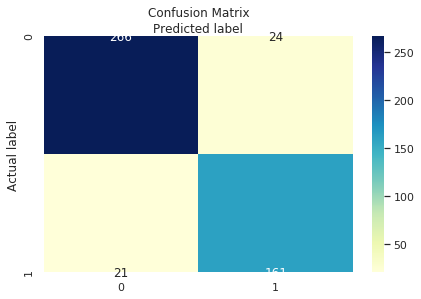

In [24]:
class_names = [0,1]
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)


sns.heatmap(pd.DataFrame(con_mat), annot = True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion Matrix', y = 1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

In [25]:
# Looking at the confusion metrics results
print("Accuracy_training: ", metrics.accuracy_score(y_train, y_pred))
print("Precision_training: ", metrics.precision_score(y_train, y_pred))
print("Recall_training: ", metrics.recall_score(y_train, y_pred))
print("F1 Score_training: ", metrics.f1_score(y_train, y_pred))\

print("################################################")

# For test
print("Accuracy_test: ", metrics.accuracy_score(y_test, y_pred_test))
print("Precision_test: ", metrics.precision_score(y_test, y_pred_test))
print("Recall_test: ", metrics.recall_score(y_test, y_pred_test))
print("F1 Score_test: ", metrics.f1_score(y_test, y_pred_test))

Accuracy_training:  0.9046610169491526
Precision_training:  0.8702702702702703
Recall_training:  0.8846153846153846
F1 Score_training:  0.8773841961852861
################################################
Accuracy_test:  0.9067796610169492
Precision_test:  0.8979591836734694
Recall_test:  0.88
F1 Score_test:  0.888888888888889
